In [1]:
from networkx.convert import to_networkx_graph
from torch_geometric.utils import to_networkx

import os
import sys

PROJECT_DIR = "/home/hschult5/AttackerGNN"
os.chdir(PROJECT_DIR)

if PROJECT_DIR not in sys.path:
    sys.path.insert(0, PROJECT_DIR)

from AttackerGNN.MainAttack import *
import config

import numpy as np
from matplotlib import pyplot as plt

from experiments import (
    experiment_train,
    experiment_local_attack_direct,
    experiment_global_attack_direct
)

import helpers.selector_pipeline_helpers

from sparse_smoothing.utils import load_and_standardize
from sparse_smoothing.models import GCN

%load_ext autoreload
%autoreload 2

%matplotlib inline

files = ["cache/demo.json", "cache/demo/demo_1.pt", "cache/evasion_global_adj.json", "cache/evasion_global_attr.json", "cache/evasion_global_adj/evasion_global_adj_1.pt", "cache/evasion_global_attr/evasion_global_attr_1.pt"]

for file_path in files:
    if os.path.exists(file_path):
        os.remove(file_path)
        print(f"{file_path} has been deleted.")
    else:
        print(f"{file_path} does not exist.")

%matplotlib inline


Use from seml.experiment import setup_logger instead.
Note that seml.experiment.Experiment already includes the logger setup.
See https://github.com/TUM-DAML/seml/blob/master/examples/example_experiment.py


[07/21/26 12:26:51] WARNING  Importing setup_logger directly from seml is deprecated.                ]8;id=644234;file:///home/hschult5/.local/lib/python3.11/site-packages/seml/__init__.py\__init__.py]8;;\:]8;id=490271;file:///home/hschult5/.local/lib/python3.11/site-packages/seml/__init__.py#10\10]8;;\
                             Use from seml.experiment import setup_logger instead.                                 
                             Note that seml.experiment.Experiment already includes the logger setup.               
                             See                                                                                   
                             https://github.com/TUM-DAML/seml/blob/master/examples/example_experimen               
                             t.py                                                                                  

[07/21/26 12:26:51] WARNING  Importing setup_logger directly from seml is deprecated.                ]8;id=558141;file:///home/hschult5/.local/lib/python3.11/site-packages/seml/__init__.py\__init__.py]8;;\:]8;id=948188;file:///home/hschult5/.local/lib/python3.11/site-packages/seml/__init__.py#10\10]8;;\
                             Use from seml.experiment import setup_logger instead.                                 
                             Note that seml.experiment.Experiment already includes the logger setup.               
                             See                                                                                   
                             https://github.com/TUM-DAML/seml/blob/master/examples/example_experimen               
                             t.py                                                                                  

cache/demo.json does not exist.
cache/demo/demo_1.pt does not exist.
cache/evasion_global_adj.json has been deleted.
cache/evasion_global_attr.json has been deleted.
cache/evasion_global_adj/evasion_global_adj_1.pt has been deleted.
cache/evasion_global_attr/evasion_global_attr_1.pt has been deleted.


In [2]:
# ── Dataset / split ─────────────────────────────────────────────────────────
DATASET = 'cora_ml'
SAMPLING = 'stratified'
SPLIT = 'ratio'

# All experiments in this notebook are repeated for these seeds.
# Add/remove values here; every raw table keeps `seed`, while displayed tables
# and plots aggregate over this list.
SEEDS = [0]
if not SEEDS:
    raise ValueError("SEEDS must contain at least one integer seed.")
SEEDS = [int(seed) for seed in SEEDS]
SEED = SEEDS[0]  # compatibility alias; never use this for an experiment loop
N_SEEDS = len(SEEDS)

TRAIN_RATIO = 0.15
VAL_RATIO = 0.10
TEST_RATIO = 0.30

# ── Victim model ─────────────────────────────────────────────────────────────
MODEL_NAME = 'GCN'
MODEL_LABEL = 'GCN'
TRAIN_EPOCHS = 200
HIDDEN = 64
INDUCTIVE = True
DROPOUT_VICTIM = 0.5
LR_VICTIM = 1e-2
WEIGHT_DECAY_VICTIM = 1e-3
PATIENCE_VICTIM = 300
MAX_EPOCHS_VICTIM = 3000

# ── V4 mining params ─────────────────────────────────────────────────────────
USE_PRBCD_CANDIDATES = True
N_PRBCD_RUNS = 1
MINER = 'prbcd'
MINER_LOCAL_FACTOR = 0.5
DEGREE_CAP_PCT = None
PRBCD_BUDGET_FRACTION = 0.5
CANDIDATE_SET_SIZES = [5000]
PRBCD_CANDIDATE_FRACTIONS = [0.0, 0.75]
SCORING_MODES = ["subset_accuracy_drop"]
ENDPOINT_MINING_HOPS = [2]
LABEL_MODES = ["continuous"]
EXTREME_FRACTIONS = [0.1]
PRBCD_EPOCHS = 5
PRBCD_SEARCH_SPACE = 200_000
PRBCD_N_EPOCHS_RESAMPLING = 1

# ── V4 subset-scoring params ─────────────────────────────────────────────────
N_SUBSETS = 1000
SUBSET_FRACTION = 0.05

# The helper owns the exact schema identifiers. The notebook imports them in
# the mining cell and writes them into every cache key and run dictionary.
# Canonical raw target:
#   mean harmful accuracy drop of subsets in which an edge was selected.

# ── Scorer training params ───────────────────────────────────────────────────
SCORER_HIDDEN = 64
SCORER_EPOCHS = 200
SCORER_LR = 0.01
VAL_FRACTION = 0.2
PATIENCE = 20
# Continuous subset scores are not class-balanced. Keep None unless deliberately
# running a separate projected-label ablation later.
BALANCE_RATIO = None

# ── Reproducibility / aggregation helpers ────────────────────────────────────
import os
import random
import numpy as np
import pandas as pd
import torch


def set_global_seed(seed: int, deterministic: bool = True) -> None:
    """Seed Python, NumPy and PyTorch before every independent run."""
    seed = int(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    if deterministic:
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False


def activate_seed_context(context: dict) -> None:
    """Expose one trained victim context through the legacy notebook globals."""
    keys = [
        "seed", "train_statistics", "clean_acc", "model", "graph",
        "idx_train", "idx_val", "idx_test", "device", "n_nodes",
        "n_edges_directed", "n_undirected", "attr_matrix", "adj_matrix",
        "labels_raw", "edge_index", "edge_weight", "attr", "labels",
    ]
    for key in keys:
        if key in context:
            globals()["SEED" if key == "seed" else key] = context[key]


def aggregate_over_seeds(
    frame: pd.DataFrame,
    group_cols: list[str],
    metric_cols: list[str] | None = None,
) -> pd.DataFrame:
    """Return mean/std/SEM and number of distinct seeds for numeric metrics."""
    if frame is None or frame.empty:
        return pd.DataFrame()
    missing = [column for column in group_cols if column not in frame.columns]
    if missing:
        raise KeyError(f"Missing grouping columns: {missing}")
    if "seed" not in frame.columns:
        raise KeyError("Every raw experiment table must contain a 'seed' column.")
    if metric_cols is None:
        metric_cols = [
            column for column in frame.select_dtypes(include=[np.number]).columns
            if column not in set(group_cols) | {"seed"}
        ]
    metric_cols = [column for column in metric_cols if column in frame.columns]

    if not group_cols:
        row = {"n_seeds": int(frame["seed"].nunique())}
        for metric in metric_cols:
            values = pd.to_numeric(frame[metric], errors="coerce")
            count = int(values.notna().sum())
            mean = float(values.mean()) if count else np.nan
            std = float(values.std(ddof=1)) if count > 1 else 0.0
            row[f"{metric}_mean"] = mean
            row[f"{metric}_std"] = std
            row[f"{metric}_count"] = count
            row[f"{metric}_sem"] = std / np.sqrt(max(1, count))
        return pd.DataFrame([row])

    grouped = frame.groupby(group_cols, dropna=False)
    pieces = []
    if metric_cols:
        stats = grouped[metric_cols].agg(["mean", "std", "count"])
        stats.columns = [f"{metric}_{stat}" for metric, stat in stats.columns]
        stats = stats.reset_index()
        for metric in metric_cols:
            std_col = f"{metric}_std"
            count_col = f"{metric}_count"
            if std_col in stats:
                stats[std_col] = stats[std_col].fillna(0.0)
                stats[f"{metric}_sem"] = stats[std_col] / np.sqrt(
                    stats[count_col].clip(lower=1)
                )
        pieces.append(stats)
    seed_counts = grouped["seed"].nunique().rename("n_seeds").reset_index()
    if not pieces:
        return seed_counts
    return pieces[0].merge(seed_counts, on=group_cols, how="left")


def add_mean_std_band(ax, x, mean, std, *, label=None, **plot_kwargs):
    """Plot a seed mean and a ±1 standard-deviation band."""
    x = np.asarray(x)
    mean = np.asarray(mean, dtype=float)
    std = np.nan_to_num(np.asarray(std, dtype=float), nan=0.0)
    line = ax.plot(x, mean, label=label, **plot_kwargs)[0]
    ax.fill_between(x, mean - std, mean + std, alpha=0.18, color=line.get_color())
    return line

set_global_seed(SEED)
print(f"Configured {N_SEEDS} seeds: {SEEDS}")


Configured 1 seeds: [0]


Training victim model for seed=0


[07/21/26 12:26:57] INFO     {'dataset': 'cora_ml', 'model_params': {'label': 'GCN',        ]8;id=271493;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py\experiment_train.py]8;;\:]8;id=536110;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py#180\180]8;;\
                             'model': 'GCN', 'do_cache_adj_prep': True, 'n_filters': 64,                           
                             'dropout': 0.5, 'svd_params': None, 'jaccard_params': None,                           
                             'gdc_params': {'alpha': 0.15, 'k': 64}}, 'train_params':                              
                             {'lr': 0.01, 'weight_decay': 0.001, 'patience': 300,                                  
                             'max_epochs': 3000}, 'binary_attr': False, 'make_undirected':                         
                             True, 'seed': 0, 'artifact_dir': 'cache',                                             
                             'model_storage_type': 'demo_custom_split', 'ppr_cache_params':                        
                             {}, 'device': 'cpu', 'display_steps': 100, 'data_device':                             
                             'cpu'}                                                                                

                    INFO     Training set size: 140                                         ]8;id=318046;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py\experiment_train.py]8;;\:]8;id=499748;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py#216\216]8;;\

                    INFO     Validation set size: 140                                       ]8;id=529202;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py\experiment_train.py]8;;\:]8;id=146039;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py#217\217]8;;\

                    INFO     Test set size: 2530                                            ]8;id=838234;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py\experiment_train.py]8;;\:]8;id=262674;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py#218\218]8;;\

                    INFO     Memory Usage after loading the dataset:                        ]8;id=945989;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py\experiment_train.py]8;;\:]8;id=154100;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py#238\238]8;;\

                    INFO     0.7941398620605469                                             ]8;id=891786;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py\experiment_train.py]8;;\:]8;id=717209;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py#239\239]8;;\

Training...:   0%|          | 0/3000 [00:00<?, ?it/s]

/home/hschult5/AttackerGNN/rgnn_at_scale/models/gcn.py:315: UserWarning: torch.sparse.SparseTensor(indices, values, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, dtype=, device=). (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:641.)
  adj = get_ppr_matrix(torch.sparse.FloatTensor(edge_idx, edge_weight), **self.gdc_params)
/home/hschult5/.local/lib/python3.11/site-packages/torch_sparse/tensor.py:574: UserWarning: Sparse CSR tensor support is in beta state. If you miss a functionality in the sparse tensor support, please submit a feature request to https://github.com/pytorch/pytorch/issues. (Triggered internally at /pytorch/aten/src/ATen/SparseCsrTensorImpl.cpp:53.)
  return torch.sparse_csr_tensor(rowptr, col, value, self.sizes())


                    INFO                                                                                ]8;id=331556;file:///home/hschult5/AttackerGNN/rgnn_at_scale/train.py\train.py]8;;\:]8;id=640561;file:///home/hschult5/AttackerGNN/rgnn_at_scale/train.py#81\81]8;;\
                             Epoch    0: loss_train: 1.94596, loss_val: 1.94565, acc_train: 0.13571,               
                             acc_val: 0.12143                                                                      

[07/21/26 12:26:59] INFO                                                                                ]8;id=500181;file:///home/hschult5/AttackerGNN/rgnn_at_scale/train.py\train.py]8;;\:]8;id=464197;file:///home/hschult5/AttackerGNN/rgnn_at_scale/train.py#81\81]8;;\
                             Epoch  100: loss_train: 0.09141, loss_val: 0.42264, acc_train: 1.00000,               
                             acc_val: 0.89286                                                                      

[07/21/26 12:27:00] INFO                                                                                ]8;id=844132;file:///home/hschult5/AttackerGNN/rgnn_at_scale/train.py\train.py]8;;\:]8;id=963080;file:///home/hschult5/AttackerGNN/rgnn_at_scale/train.py#81\81]8;;\
                             Epoch  200: loss_train: 0.07750, loss_val: 0.39403, acc_train: 1.00000,               
                             acc_val: 0.89286                                                                      

[07/21/26 12:27:02] INFO                                                                                ]8;id=754665;file:///home/hschult5/AttackerGNN/rgnn_at_scale/train.py\train.py]8;;\:]8;id=880899;file:///home/hschult5/AttackerGNN/rgnn_at_scale/train.py#81\81]8;;\
                             Epoch  300: loss_train: 0.07194, loss_val: 0.39801, acc_train: 1.00000,               
                             acc_val: 0.88571                                                                      

[07/21/26 12:27:03] INFO                                                                                ]8;id=700609;file:///home/hschult5/AttackerGNN/rgnn_at_scale/train.py\train.py]8;;\:]8;id=655638;file:///home/hschult5/AttackerGNN/rgnn_at_scale/train.py#81\81]8;;\
                             Epoch  400: loss_train: 0.07121, loss_val: 0.39143, acc_train: 1.00000,               
                             acc_val: 0.88571                                                                      

[07/21/26 12:27:05] INFO                                                                                ]8;id=909747;file:///home/hschult5/AttackerGNN/rgnn_at_scale/train.py\train.py]8;;\:]8;id=349317;file:///home/hschult5/AttackerGNN/rgnn_at_scale/train.py#81\81]8;;\
                             Epoch  500: loss_train: 0.07064, loss_val: 0.37882, acc_train: 1.00000,               
                             acc_val: 0.90000                                                                      

                    INFO     Test accuracy is 0.8328063488006592 with seed 0                ]8;id=66043;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py\experiment_train.py]8;;\:]8;id=200348;file:///home/hschult5/AttackerGNN/experiments/experiment_train.py#271\271]8;;\

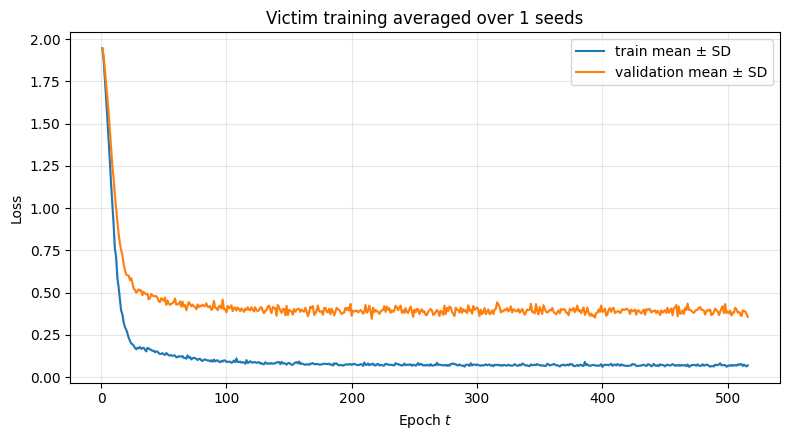

Victim accuracy over 1 seeds: 83.28% ± 0.00% SD


,n_seeds,clean_accuracy_mean,clean_accuracy_std,clean_accuracy_count,clean_accuracy_sem,n_train_epochs_mean,n_train_epochs_std,n_train_epochs_count,n_train_epochs_sem,n_val_epochs_mean,n_val_epochs_std,n_val_epochs_count,n_val_epochs_sem
0,1,0.832806,0.0,1,0.0,516.0,0.0,1,0.0,516.0,0.0,1,0.0


In [3]:
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from IPython.display import display

seed_contexts = []
train_curve_rows = []
train_summary_rows = []

for seed in SEEDS:
    set_global_seed(seed)
    print(f"Training victim model for seed={seed}")

    stats = experiment_train.run(
        data_dir='./data',
        dataset=DATASET,
        model_params=dict(
            label=MODEL_LABEL,
            model=MODEL_NAME,
            do_cache_adj_prep=True,
            n_filters=64,
            dropout=DROPOUT_VICTIM,
            svd_params=None,
            jaccard_params=None,
            gdc_params={"alpha": 0.15, "k": 64},
        ),
        train_params=dict(
            lr=LR_VICTIM,
            weight_decay=WEIGHT_DECAY_VICTIM,
            patience=PATIENCE_VICTIM,
            max_epochs=MAX_EPOCHS_VICTIM,
        ),
        binary_attr=False,
        make_undirected=True,
        seed=seed,
        artifact_dir='cache',
        model_storage_type='demo_custom_split',
        ppr_cache_params=dict(),
        device="cpu",
        data_device="cpu",
        display_steps=100,
        debug_level="info",
        custom_split_ratios=None,
    )

    model_seed = stats["model"]
    graph_seed = stats["graph"]
    idx_train_seed = stats["idx_train"]
    idx_val_seed = stats["idx_val"]
    idx_test_seed = stats["idx_test"]
    model_seed.eval()

    attr_matrix_seed, adj_matrix_seed, labels_raw_seed = graph_seed[:3]
    model_device = next(model_seed.parameters()).device
    row, col, value = adj_matrix_seed.coo()
    edge_index_seed = torch.stack([row, col], dim=0).long().to(model_device)
    edge_weight_seed = (
        torch.ones(edge_index_seed.size(1), dtype=torch.float32, device=model_device)
        if value is None else value.float().to(model_device)
    )
    attr_seed = attr_matrix_seed.float().to(model_device)
    labels_seed = labels_raw_seed.long().to(model_device)
    n_nodes_seed = int(adj_matrix_seed.sizes()[0])
    n_edges_directed_seed = int(adj_matrix_seed.nnz())
    n_undirected_seed = n_edges_directed_seed // 2
    clean_acc_seed = float(stats["accuracy"])

    context = {
        "seed": int(seed),
        "train_statistics": stats,
        "clean_acc": clean_acc_seed,
        "model": model_seed,
        "graph": graph_seed,
        "idx_train": idx_train_seed,
        "idx_val": idx_val_seed,
        "idx_test": idx_test_seed,
        "device": model_device,
        "n_nodes": n_nodes_seed,
        "n_edges_directed": n_edges_directed_seed,
        "n_undirected": n_undirected_seed,
        "attr_matrix": attr_matrix_seed,
        "adj_matrix": adj_matrix_seed,
        "labels_raw": labels_raw_seed,
        "edge_index": edge_index_seed,
        "edge_weight": edge_weight_seed,
        "attr": attr_seed,
        "labels": labels_seed,
    }
    seed_contexts.append(context)

    for split, values in (
        ("train", stats.get("trace_train", [])),
        ("validation", stats.get("trace_val", [])),
    ):
        for epoch, loss in enumerate(values, start=1):
            train_curve_rows.append({
                "seed": int(seed),
                "split": split,
                "epoch": int(epoch),
                "loss": float(loss),
            })

    train_summary_rows.append({
        "seed": int(seed),
        "clean_accuracy": clean_acc_seed,
        "n_train_epochs": len(stats.get("trace_train", [])),
        "n_val_epochs": len(stats.get("trace_val", [])),
    })

SEED_CONTEXTS = seed_contexts
SEED_CONTEXT_BY_SEED = {context["seed"]: context for context in seed_contexts}
activate_seed_context(seed_contexts[0])

train_curve_df = pd.DataFrame(train_curve_rows)
train_summary_raw_df = pd.DataFrame(train_summary_rows)
train_summary_df = aggregate_over_seeds(
    train_summary_raw_df,
    group_cols=[],
    metric_cols=["clean_accuracy", "n_train_epochs", "n_val_epochs"],
)

curve_summary = (
    train_curve_df.groupby(["split", "epoch"], as_index=False)
    .agg(loss_mean=("loss", "mean"), loss_std=("loss", "std"), n_seeds=("seed", "nunique"))
)
curve_summary["loss_std"] = curve_summary["loss_std"].fillna(0.0)
curve_summary = curve_summary[curve_summary["n_seeds"] == N_SEEDS].copy()
if curve_summary.empty:
    raise RuntimeError("No victim-training epochs are shared by every configured seed.")

fig, ax = plt.subplots(figsize=(8, 4.5))
for split, group in curve_summary.groupby("split", sort=False):
    group = group.sort_values("epoch")
    add_mean_std_band(
        ax,
        group["epoch"],
        group["loss_mean"],
        group["loss_std"],
        label=f"{split} mean ± SD",
    )
ax.set_xlabel('Epoch $t$')
ax.set_ylabel("Loss")
ax.set_title(f"Victim training averaged over {N_SEEDS} seeds")
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

clean_mean = train_summary_raw_df["clean_accuracy"].mean()
clean_std = train_summary_raw_df["clean_accuracy"].std(ddof=1) if N_SEEDS > 1 else 0.0
print(f"Victim accuracy over {N_SEEDS} seeds: {100*clean_mean:.2f}% ± {100*clean_std:.2f}% SD")
display(train_summary_df)


In [4]:
import torch

# Dataset structure is seed-invariant; inspect the first trained context.
activate_seed_context(SEED_CONTEXTS[0])
attr_matrix, adj_matrix, labels_raw = graph[:3]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ── Display ────────────────────────────────────────────────────────────────
n_nodes = adj_matrix.sizes()[0]
n_edges_directed = adj_matrix.nnz()
n_undirected = n_edges_directed // 2

print(f"nodes={n_nodes}")
print(f"Directed edges: {n_edges_directed}")
print(f"Undirected edges: {n_undirected}")
print(f"features={attr_matrix.shape}")
print(f"classes={len(torch.unique(labels_raw))}")

# ── Convert adjacency SparseTensor -> edge_index / edge_weight ─────────────
row, col, value = adj_matrix.coo()

edge_index = torch.stack([row, col], dim=0).long().to(device)

if value is None:
    edge_weight = torch.ones(edge_index.size(1), dtype=torch.float32, device=device)
else:
    edge_weight = value.float().to(device)

# ── Convert features / labels ──────────────────────────────────────────────
attr = attr_matrix.float().to(device)
labels = labels_raw.long().to(device)

# ── Safety checks ──────────────────────────────────────────────────────────
print("edge_index shape:", edge_index.shape)
print("edge_weight shape:", edge_weight.shape)
print("max node id in edge_index:", int(edge_index.max()))
print("n_nodes:", n_nodes)

assert int(edge_index.max()) < n_nodes
assert attr.shape[0] == n_nodes
assert labels.shape[0] == n_nodes
'''
train_idx_np, val_idx_np, test_idx_np = train_val_test_split(
    graph.labels,
    train_size=0.05,
    val_size=0.05,
    test_size=0.9,
    mode="stratified",
    seed=SEED,
)

train_idx = torch.as_tensor(train_idx_np, dtype=torch.long, device=device)
val_idx = torch.as_tensor(val_idx_np, dtype=torch.long, device=device)
test_idx = torch.as_tensor(test_idx_np, dtype=torch.long, device=device)'''

nodes=2810
Directed edges: 15962
Undirected edges: 7981
features=torch.Size([2810, 2879])
classes=7
edge_index shape: torch.Size([2, 15962])
edge_weight shape: torch.Size([15962])
max node id in edge_index: 2809
n_nodes: 2810


'\ntrain_idx_np, val_idx_np, test_idx_np = train_val_test_split(\n    graph.labels,\n    train_size=0.05,\n    val_size=0.05,\n    test_size=0.9,\n    mode="stratified",\n    seed=SEED,\n)\n\ntrain_idx = torch.as_tensor(train_idx_np, dtype=torch.long, device=device)\nval_idx = torch.as_tensor(val_idx_np, dtype=torch.long, device=device)\ntest_idx = torch.as_tensor(test_idx_np, dtype=torch.long, device=device)'

# RQ2 — Mining and Evaluating Harmful Edge Perturbations

RQ1 showed that the scalability of PR-BCD depends on restricting optimization to a sampled candidate block. RQ2 therefore studies whether victim-model evaluations can produce a useful harmfulness ranking over candidate edge flips.

For `subset_accuracy_drop`, one random subset of candidate flips is applied at a time. Let \(d_t=A(G)-A(G\oplus S_t)\) be the signed evaluation-accuracy drop of subset \(S_t\). For candidate edge \(e_i\), the canonical mined target is

\[
s_i
=
\frac{\sum_{t:e_i\in S_t}\max(0,d_t)}
     {\sum_t \mathbf{1}[e_i\in S_t]}.
\]

Thus, \(s_i\) is the **mean harmful subset drop observed when edge \(e_i\) was selected**. It corrects for unequal inclusion frequency.

This is an edge-associated subset score, not an isolated causal effect. Interactions, redundancy, and cancellation between jointly flipped edges remain part of the signal. The later oracle and PR-BCD experiments test whether the resulting noisy score nevertheless provides a useful ranking.

Every mining run stores:

- signed and harmful subset drops;
- inclusion counts;
- raw mean harmful scores;
- normalized scores in \([0,1]\);
- within-run percentile ranks;
- an explicit schema version and score definition.


In [5]:
from helpers.selector_pipeline_helpers import EndpointPRBCDV4Scorer, _edge_set
from IPython.display import display
import math
import random
import pandas as pd


def _safe_config_value(value):
    text = f"{value:.12g}" if isinstance(value, float) else str(value)
    return (text.strip().replace(" ", "").replace("/", "-").replace("\\", "-")
            .replace(".", "p").replace("+", "").replace("-", "m"))


def _resolve_candidate_set_sizes():
    configured = globals().get("CANDIDATE_SET_SIZES", None)
    if configured is None:
        fallback_size = max(1, round(SEED_CONTEXTS[0]["n_undirected"] * PRBCD_BUDGET_FRACTION * N_PRBCD_RUNS))
        return [fallback_size]
    if isinstance(configured, int):
        configured = [configured]
    sizes = [int(value) for value in configured]
    if not sizes or any(size <= 0 for size in sizes):
        raise ValueError("CANDIDATE_SET_SIZES must contain positive values.")
    return sizes


def _resolve_prbcd_candidate_fractions():
    configured = globals().get("PRBCD_CANDIDATE_FRACTIONS", [globals().get("PRBCD_CANDIDATE_FRACTION", 0.5)])
    if isinstance(configured, (int, float)):
        configured = [configured]
    fractions = [float(value) for value in configured]
    if not fractions or any(not 0.0 <= fraction <= 1.0 for fraction in fractions):
        raise ValueError("PRBCD_CANDIDATE_FRACTIONS must be in [0, 1].")
    return fractions


def _candidate_config_id(candidate_set_size: int, prbcd_candidate_fraction: float) -> str:
    return (f"candN-{_safe_config_value(candidate_set_size)}"
            f"__prbcdFrac-{_safe_config_value(prbcd_candidate_fraction)}")


def sample_random_candidates(num_nodes: int, count: int, *, forbidden=None, seed: int):
    forbidden = set() if forbidden is None else set(forbidden)
    n_possible = num_nodes * (num_nodes - 1) // 2
    n_available = n_possible - len(forbidden)
    if count > n_available:
        raise ValueError(f"Cannot sample {count} candidates; only {n_available} remain.")
    rng = random.Random(int(seed))
    sampled = set()
    while len(sampled) < count:
        u, v = rng.randrange(num_nodes), rng.randrange(num_nodes)
        if u == v:
            continue
        edge = (min(u, v), max(u, v))
        if edge not in forbidden:
            sampled.add(edge)
    return sampled


candidate_set_sizes = _resolve_candidate_set_sizes()
prbcd_candidate_fractions = _resolve_prbcd_candidate_fractions()
candidate_runs = []
_candidate_mining_cache = {}

for context in SEED_CONTEXTS:
    activate_seed_context(context)
    seed = context["seed"]
    set_global_seed(seed)
    n_possible_candidates = n_nodes * (n_nodes - 1) // 2
    orig_edges = _edge_set(edge_index)

    for size_index, candidate_set_size in enumerate(candidate_set_sizes):
        if candidate_set_size > n_possible_candidates:
            raise ValueError(f"candidate_set_size={candidate_set_size} exceeds {n_possible_candidates} pairs.")
        budget = max(1, math.ceil(candidate_set_size / max(1, int(N_PRBCD_RUNS))))
        prbcd_budget_fraction = budget / max(1, int(n_undirected))

        for fraction_index, prbcd_candidate_fraction in enumerate(prbcd_candidate_fractions):
            config_id = _candidate_config_id(candidate_set_size, prbcd_candidate_fraction)
            target_prbcd_count = round(candidate_set_size * prbcd_candidate_fraction)
            prbcd_candidates = set()

            if USE_PRBCD_CANDIDATES and target_prbcd_count > 0:
                cache_key = (seed, candidate_set_size)
                if cache_key not in _candidate_mining_cache:
                    scorer = EndpointPRBCDV4Scorer(
                        n=n_nodes, edge_index=edge_index, edge_weight=edge_weight,
                        attr=attr, labels=labels, attacked_model=model,
                        idx_attack=idx_test, test_idx=idx_val, device=device,
                        block_size=PRBCD_SEARCH_SPACE,
                        n_epochs_resampling=PRBCD_N_EPOCHS_RESAMPLING,
                        n_subsets=N_SUBSETS, subset_fraction=SUBSET_FRACTION,
                        balance_ratio=BALANCE_RATIO, store_candidates=True,
                    )
                    mined = scorer.mine_prbcd_endpoint_candidates(
                        n_perturbations=budget,
                        tag=f"endpointPRBCD__{config_id}__seed-{seed}",
                        rng_seed=seed,
                        n_candidates=PRBCD_SEARCH_SPACE,
                        prbcd_epochs=PRBCD_EPOCHS,
                        n_prbcd_runs=N_PRBCD_RUNS,
                        n_epochs_resampling=PRBCD_N_EPOCHS_RESAMPLING,
                    )
                    _candidate_mining_cache[cache_key] = {
                        (min(int(u), int(v)), max(int(u), int(v)))
                        for u, v in mined if int(u) != int(v)
                    }
                prbcd_candidates = set(_candidate_mining_cache[cache_key])

            selection_rng = random.Random(seed + 10_000 * size_index + 101 * fraction_index)
            selected_prbcd = (
                set(selection_rng.sample(sorted(prbcd_candidates), target_prbcd_count))
                if len(prbcd_candidates) > target_prbcd_count else set(prbcd_candidates)
            )
            n_random_needed = candidate_set_size - len(selected_prbcd)
            random_candidates = sample_random_candidates(
                n_nodes, n_random_needed, forbidden=selected_prbcd,
                seed=seed + 20_000 * size_index + 211 * fraction_index + 17,
            )
            candidates_for_config = list(selected_prbcd | random_candidates)
            selection_rng.shuffle(candidates_for_config)
            if len(candidates_for_config) != candidate_set_size:
                raise RuntimeError(f"Expected {candidate_set_size} candidates, got {len(candidates_for_config)}")

            n_removals = sum(edge in orig_edges for edge in candidates_for_config)
            candidate_runs.append({
                "seed": int(seed),
                "context": context,
                "candidate_config_id": config_id,
                "candidate_set_size": int(candidate_set_size),
                "prbcd_candidate_fraction": float(prbcd_candidate_fraction),
                "budget": int(budget),
                "prbcd_budget_fraction": float(prbcd_budget_fraction),
                "n_prbcd_requested": int(target_prbcd_count),
                "n_prbcd_mined_unique": int(len(prbcd_candidates)),
                "n_prbcd_selected": int(len(selected_prbcd)),
                "n_random_candidates": int(len(random_candidates)),
                "actual_prbcd_fraction": float(len(selected_prbcd) / len(candidates_for_config)),
                "n_add_candidates": int(len(candidates_for_config) - n_removals),
                "n_delete_candidates": int(n_removals),
                "candidates": candidates_for_config,
                "selected_prbcd": selected_prbcd,
                "random_candidates": random_candidates,
            })

if not candidate_runs:
    raise RuntimeError("No candidate configurations were created.")

candidate_config_raw_df = pd.DataFrame([
    {key: value for key, value in run.items()
     if key not in {"context", "candidates", "selected_prbcd", "random_candidates"}}
    for run in candidate_runs
])
_candidate_group_cols = ["candidate_config_id", "candidate_set_size", "prbcd_candidate_fraction"]
_candidate_metric_cols = [
    "budget", "prbcd_budget_fraction", "n_prbcd_requested", "n_prbcd_mined_unique",
    "n_prbcd_selected", "n_random_candidates", "actual_prbcd_fraction",
    "n_add_candidates", "n_delete_candidates",
]
candidate_config_df = aggregate_over_seeds(candidate_config_raw_df, _candidate_group_cols, _candidate_metric_cols)
display(candidate_config_df)

candidate_runs_by_key = {(run["seed"], run["candidate_config_id"]): run for run in candidate_runs}
print(f"Created {len(candidate_runs)} raw candidate runs = {len(SEEDS)} seeds × "
      f"{len(candidate_set_sizes)} sizes × {len(prbcd_candidate_fractions)} fractions.")


[endpointPRBCD__candN-5000__prbcdFrac-0p75__seed-0] Mining actual endpointPRBCD flips: budget=5000, block=200000, epochs=5, runs=1
[endpointPRBCD__candN-5000__prbcdFrac-0p75__seed-0] PRBCD run 1/1 (seed=0)
[endpointPRBCD] epochs=5, epochs_resampling=2, fine_tuning_epochs=3
run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


[07/21/26 12:28:13] INFO                                                           ]8;id=271493;file:///home/hschult5/AttackerGNN/helpers/selector_pipeline_helpers.py\selector_pipeline_helpers.py]8;;\:]8;id=536110;file:///home/hschult5/AttackerGNN/helpers/selector_pipeline_helpers.py#798\798]8;;\
                             Before mining - Loss: -0.6458607912063599 Accuracy:                                   
                             83.281 %                                                                              
                                                                                                                   

  0%|          | 0/5 [00:00<?, ?it/s]

                    INFO                                                           ]8;id=318046;file:///home/hschult5/AttackerGNN/helpers/selector_pipeline_helpers.py\selector_pipeline_helpers.py]8;;\:]8;id=499748;file:///home/hschult5/AttackerGNN/helpers/selector_pipeline_helpers.py#873\873]8;;\
                             Epoch: 0 Loss: -0.6458 Accuracy: 78.854 %                                             
                                                                                                                   

[endpointPRBCD] Final discrete attack selected 5000 actual flips.
[endpointPRBCD__candN-5000__prbcdFrac-0p75__seed-0] Run 1: 5000 flips, 5000 new, 5000 total unique
[endpointPRBCD__candN-5000__prbcdFrac-0p75__seed-0] Mined 5000 unique actual PRBCD flips.


,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,budget_mean,budget_std,budget_count,prbcd_budget_fraction_mean,prbcd_budget_fraction_std,prbcd_budget_fraction_count,n_prbcd_requested_mean,...,budget_sem,prbcd_budget_fraction_sem,n_prbcd_requested_sem,n_prbcd_mined_unique_sem,n_prbcd_selected_sem,n_random_candidates_sem,actual_prbcd_fraction_sem,n_add_candidates_sem,n_delete_candidates_sem,n_seeds
0,candN-5000__prbcdFrac-0,5000,0.00,5000.0,0.0,1,0.626488,0.0,1,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,candN-5000__prbcdFrac-0p75,5000,0.75,5000.0,0.0,1,0.626488,0.0,1,3750.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


Created 2 raw candidate runs = 1 seeds × 1 sizes × 2 fractions.


,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,actual_prbcd_fraction_mean,actual_prbcd_fraction_std,actual_prbcd_fraction_count,n_candidate_endpoint_nodes_mean,n_candidate_endpoint_nodes_std,n_candidate_endpoint_nodes_count,mean_candidate_endpoint_degree_mean,...,n_delete_candidates_std,n_delete_candidates_count,actual_prbcd_fraction_sem,n_candidate_endpoint_nodes_sem,mean_candidate_endpoint_degree_sem,median_candidate_endpoint_degree_sem,max_candidate_endpoint_degree_sem,n_add_candidates_sem,n_delete_candidates_sem,n_seeds
0,candN-5000__prbcdFrac-0,5000,0.00,0.00,0.0,1,2729.0,0.0,1,5.700623,...,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,candN-5000__prbcdFrac-0p75,5000,0.75,0.75,0.0,1,2496.0,0.0,1,5.323718,...,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


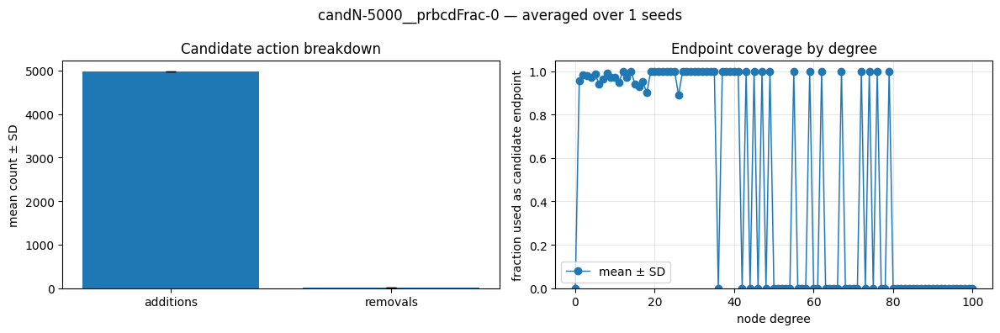

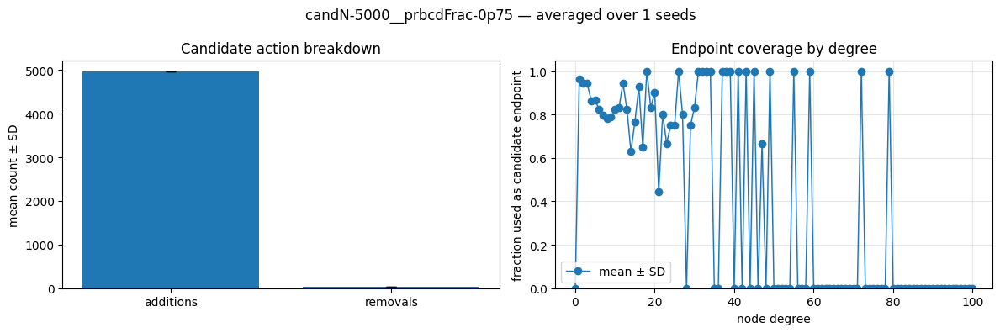

In [6]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

CANDIDATE_DIAGNOSTIC_OUT_DIR = Path("extendedPlotting") / "candidate_diagnostics_multiseed"
CANDIDATE_DIAGNOSTIC_OUT_DIR.mkdir(parents=True, exist_ok=True)

candidate_degree_summary_rows = []
degree_profile_rows = []

for run in candidate_runs:
    context = run["context"]
    degrees_run = np.bincount(context["edge_index"][0].cpu().numpy(), minlength=context["n_nodes"])
    candidates_run = run["candidates"]
    cand_nodes = sorted(set(u for u, v in candidates_run) | set(v for u, v in candidates_run))
    cand_degs = degrees_run[cand_nodes] if cand_nodes else np.array([], dtype=int)
    endpoint_mask = np.zeros(context["n_nodes"], dtype=bool)
    endpoint_mask[cand_nodes] = True
    all_counts = np.bincount(degrees_run)
    endpoint_counts = np.bincount(degrees_run[endpoint_mask], minlength=len(all_counts))
    fractions = np.divide(endpoint_counts, all_counts, out=np.zeros_like(endpoint_counts, dtype=float), where=all_counts > 0)

    candidate_degree_summary_rows.append({
        "seed": run["seed"],
        "candidate_config_id": run["candidate_config_id"],
        "candidate_set_size": run["candidate_set_size"],
        "prbcd_candidate_fraction": run["prbcd_candidate_fraction"],
        "actual_prbcd_fraction": run["actual_prbcd_fraction"],
        "n_candidate_endpoint_nodes": len(cand_nodes),
        "mean_candidate_endpoint_degree": float(cand_degs.mean()) if cand_degs.size else np.nan,
        "median_candidate_endpoint_degree": float(np.median(cand_degs)) if cand_degs.size else np.nan,
        "max_candidate_endpoint_degree": float(cand_degs.max()) if cand_degs.size else np.nan,
        "n_add_candidates": run["n_add_candidates"],
        "n_delete_candidates": run["n_delete_candidates"],
    })
    for degree, (all_count, endpoint_count, fraction) in enumerate(zip(all_counts, endpoint_counts, fractions)):
        degree_profile_rows.append({
            "seed": run["seed"], "candidate_config_id": run["candidate_config_id"],
            "degree": degree, "all_node_count": all_count,
            "candidate_endpoint_count": endpoint_count, "candidate_endpoint_fraction": fraction,
        })

candidate_degree_raw_df = pd.DataFrame(candidate_degree_summary_rows)
candidate_degree_summary_df = aggregate_over_seeds(
    candidate_degree_raw_df,
    ["candidate_config_id", "candidate_set_size", "prbcd_candidate_fraction"],
    ["actual_prbcd_fraction", "n_candidate_endpoint_nodes", "mean_candidate_endpoint_degree",
     "median_candidate_endpoint_degree", "max_candidate_endpoint_degree",
     "n_add_candidates", "n_delete_candidates"],
)
candidate_degree_raw_df.to_csv(CANDIDATE_DIAGNOSTIC_OUT_DIR / "candidate_degree_summary_raw.csv", index=False)
candidate_degree_summary_df.to_csv(CANDIDATE_DIAGNOSTIC_OUT_DIR / "candidate_degree_summary_averaged.csv", index=False)
display(candidate_degree_summary_df)

degree_profile_raw_df = pd.DataFrame(degree_profile_rows)
degree_profile_df = aggregate_over_seeds(
    degree_profile_raw_df, ["candidate_config_id", "degree"],
    ["all_node_count", "candidate_endpoint_count", "candidate_endpoint_fraction"],
)

for config_id, summary_group in candidate_degree_summary_df.groupby("candidate_config_id", sort=False):
    summary = summary_group.iloc[0]
    profile = degree_profile_df[degree_profile_df["candidate_config_id"] == config_id].sort_values("degree")
    profile = profile[profile["degree"] <= min(100, profile["degree"].max())]
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    labels_bar = ["additions", "removals"]
    means = [summary["n_add_candidates_mean"], summary["n_delete_candidates_mean"]]
    stds = [summary["n_add_candidates_std"], summary["n_delete_candidates_std"]]
    axes[0].bar(labels_bar, means, yerr=stds, capsize=4)
    axes[0].set_ylabel("mean count ± SD")
    axes[0].set_title("Candidate action breakdown")

    add_mean_std_band(
        axes[1], profile["degree"], profile["candidate_endpoint_fraction_mean"],
        profile["candidate_endpoint_fraction_std"], label="mean ± SD", marker="o", linewidth=1,
    )
    axes[1].set_xlabel("node degree")
    axes[1].set_ylabel("fraction used as candidate endpoint")
    axes[1].set_ylim(0, 1.05)
    axes[1].grid(True, alpha=0.3)
    axes[1].legend()
    axes[1].set_title("Endpoint coverage by degree")
    fig.suptitle(f"{config_id} — averaged over {N_SEEDS} seeds")
    fig.tight_layout()
    fig.savefig(CANDIDATE_DIAGNOSTIC_OUT_DIR / f"candidate_diagnostics__{_safe_config_value(config_id)}.png", dpi=200, bbox_inches="tight")
    plt.show()


In [7]:
# Debug breakpoint removed in the multiseed notebook.

---
## §2  Subset Scoring

We run `N_SUBSETS` random subsets of the candidate pool and apply each subset jointly.

For each subset, the notebook stores both:

- the signed accuracy drop \(A(G)-A(G\oplus S)\);
- the harmful-only drop \(\max(0, A(G)-A(G\oplus S))\).

For every edge, the harmful drops are divided by the number of subsets in which that edge appeared. The canonical raw score is therefore the **mean harmful subset drop when selected**, rather than the accumulated sum.

The run also stores a max-normalized score in \([0,1]\), a percentile rank, the inclusion count, and an observed mask. Unobserved candidates are marked as unobserved rather than being treated as genuine zero-score edges.


---

## Experiment 1 — Direct Mining of Harmful Candidates

### Research objective

This experiment constructs candidate edge perturbations and evaluates them against the fixed victim model.

For `subset_accuracy_drop`, random candidate subsets are flipped jointly. Every selected edge receives the subset's harmful accuracy drop, and its final raw score is the average of those assigned drops over all subsets in which it appeared.

The resulting value is an observational, subset-associated harmfulness score. It should not be interpreted as the isolated accuracy effect of the edge.

### Execution block

The following cell:

- loads or computes versioned mining results;
- rejects caches created with the previous accumulated-sum target;
- filters candidates that were never observed;
- exposes raw, normalized, and percentile score representations;
- preserves signed-drop, harmful-drop, and inclusion-count diagnostics;
- creates the standardized `mining_runs` objects used downstream.


In [12]:
# PATCH: h-hop endpoint mining monkey patch
# Keeps endpoint_mining_hop/h available inside the notebook even if the helper
# module was loaded before the h-hop implementation was edited.
from typing import Any
import torch
import helpers.selector_pipeline_helpers as _selector_helpers


@torch.no_grad()
def _mine_endpoint_flips_with_h(
    *,
    model: torch.nn.Module,
    attr: torch.Tensor,
    labels: torch.Tensor,
    adj_orig: torch.Tensor,
    cand_src: torch.Tensor,
    cand_dst: torch.Tensor,
    clean_preds: torch.Tensor,
    clean_correct: torch.Tensor,
    clean_accuracy: float,
    h: int = 0,
    verbose: bool = True,
) -> dict[str, Any]:
    """
    Evaluate every original candidate edge exactly once.

    h = 0: query the full graph.
    h > 0: query only the h-hop neighborhood around the candidate endpoints.

    If the local subgraph is too small for a victim GCN with GDC/PPR top-k
    preprocessing, the query falls back to the full graph for that candidate.
    """
    if h < 0:
        raise ValueError("h must be non-negative. Use h=0 for the full graph.")

    device = adj_orig.device

    attr = attr.to(device)
    labels = labels.to(device=device, dtype=torch.long)
    cand_src = cand_src.to(device=device, dtype=torch.long).view(-1)
    cand_dst = cand_dst.to(device=device, dtype=torch.long).view(-1)
    clean_preds = clean_preds.to(device=device, dtype=torch.long)
    clean_correct = clean_correct.to(device=device, dtype=torch.bool)

    if cand_src.numel() != cand_dst.numel():
        raise ValueError("cand_src and cand_dst must have equal length.")

    n_samples = cand_src.numel()
    if n_samples == 0:
        raise ValueError("The candidate list is empty.")

    def _h_hop_nodes_from_dense_adj(adj: torch.Tensor, seeds: torch.Tensor, num_hops: int) -> torch.Tensor:
        seeds = seeds.to(device=adj.device, dtype=torch.long).view(-1)
        n_nodes = adj.size(0)

        visited = torch.zeros(n_nodes, device=adj.device, dtype=torch.bool)
        frontier = torch.zeros_like(visited)
        visited[seeds] = True
        frontier[seeds] = True

        adj_bool = adj > 0.5

        for _ in range(num_hops):
            neigh_out = adj_bool[frontier].any(dim=0)
            neigh_in = adj_bool[:, frontier].any(dim=1)
            neighbors = neigh_out | neigh_in
            new_frontier = neighbors & ~visited
            visited |= neighbors
            frontier = new_frontier

            if not bool(frontier.any().item()):
                break

        return torch.nonzero(visited, as_tuple=True)[0]

    def _clear_adj_cache_and_call(x: torch.Tensor, adj: torch.Tensor) -> torch.Tensor:
        # Some rgnn_at_scale GCN variants cache preprocessed adjacency.
        # Candidate flips change adjacency every iteration, so clear it for the call.
        has_cache = hasattr(model, "adj_preped")
        old_cache = getattr(model, "adj_preped", None) if has_cache else None
        try:
            if has_cache:
                model.adj_preped = None
            return model(x, adj)
        finally:
            if has_cache:
                model.adj_preped = old_cache

    def _local_query_is_unsafe_for_gdc(sub_adj: torch.Tensor) -> bool:
        gdc_params = getattr(model, "gdc_params", None)
        if gdc_params is None:
            return False
        if "k" not in gdc_params:
            return False
        try:
            return int(sub_adj.size(0)) < int(gdc_params["k"])
        except Exception:
            return False

    model.eval()
    adj_work = adj_orig.clone()

    endpoint_labels = torch.zeros(n_samples, device=device, dtype=torch.float32)
    src_hit_labels = torch.zeros_like(endpoint_labels)
    dst_hit_labels = torch.zeros_like(endpoint_labels)
    both_hit_labels = torch.zeros_like(endpoint_labels)
    exists_clean = torch.zeros(n_samples, device=device, dtype=torch.bool)

    src_pert_predictions = torch.full((n_samples,), -1, device=device, dtype=torch.long)
    dst_pert_predictions = torch.full_like(src_pert_predictions, -1)
    neighborhood_sizes = torch.zeros(n_samples, device=device, dtype=torch.long)
    used_full_graph_fallback = torch.zeros(n_samples, device=device, dtype=torch.bool)

    rows: list[dict[str, Any]] = []

    for i in range(n_samples):
        u = int(cand_src[i].item())
        v = int(cand_dst[i].item())

        original_uv = float(adj_orig[u, v].item())
        original_vu = float(adj_orig[v, u].item())

        edge_exists = original_uv > 0.5 or original_vu > 0.5
        exists_clean[i] = edge_exists

        flipped_value = 0.0 if edge_exists else 1.0

        # Flip exactly this original candidate edge.
        adj_work[u, v] = flipped_value
        adj_work[v, u] = flipped_value

        neighborhood_size = int(adj_work.size(0))
        full_graph_fallback = False

        if h == 0:
            pert_preds = _clear_adj_cache_and_call(attr, adj_work).argmax(dim=-1)
            u_pert_pred = int(pert_preds[u].item())
            v_pert_pred = int(pert_preds[v].item())
        else:
            sub_nodes = _h_hop_nodes_from_dense_adj(
                adj=adj_work,
                seeds=torch.tensor([u, v], device=device, dtype=torch.long),
                num_hops=h,
            )
            sub_attr = attr[sub_nodes]
            sub_adj = adj_work[sub_nodes][:, sub_nodes]
            neighborhood_size = int(sub_nodes.numel())

            if _local_query_is_unsafe_for_gdc(sub_adj):
                full_graph_fallback = True
            else:
                try:
                    sub_preds = _clear_adj_cache_and_call(sub_attr, sub_adj).argmax(dim=-1)

                    global_to_local = torch.full(
                        (adj_work.size(0),),
                        -1,
                        device=device,
                        dtype=torch.long,
                    )
                    global_to_local[sub_nodes] = torch.arange(
                        sub_nodes.numel(),
                        device=device,
                        dtype=torch.long,
                    )

                    u_local = int(global_to_local[u].item())
                    v_local = int(global_to_local[v].item())
                    u_pert_pred = int(sub_preds[u_local].item())
                    v_pert_pred = int(sub_preds[v_local].item())
                except RuntimeError:
                    # Conservative fallback: keep the run alive and preserve the
                    # victim model's original preprocessing instead of changing it.
                    full_graph_fallback = True

            if full_graph_fallback:
                pert_preds = _clear_adj_cache_and_call(attr, adj_work).argmax(dim=-1)
                u_pert_pred = int(pert_preds[u].item())
                v_pert_pred = int(pert_preds[v].item())

        neighborhood_sizes[i] = neighborhood_size
        used_full_graph_fallback[i] = full_graph_fallback

        u_clean_pred = int(clean_preds[u].item())
        v_clean_pred = int(clean_preds[v].item())
        u_true = int(labels[u].item())
        v_true = int(labels[v].item())

        u_hit = bool(clean_correct[u].item()) and u_pert_pred != u_true
        v_hit = bool(clean_correct[v].item()) and v_pert_pred != v_true
        endpoint_hit = u_hit or v_hit
        both_hit = u_hit and v_hit

        endpoint_labels[i] = float(endpoint_hit)
        src_hit_labels[i] = float(u_hit)
        dst_hit_labels[i] = float(v_hit)
        both_hit_labels[i] = float(both_hit)
        src_pert_predictions[i] = u_pert_pred
        dst_pert_predictions[i] = v_pert_pred

        rows.append({
            "sample_index": i,
            "u": u,
            "v": v,
            "exists_clean": edge_exists,
            "action": "del" if edge_exists else "add",
            "h": int(h),
            "endpoint_mining_hop": int(h),
            "neighborhood_size": neighborhood_size,
            "used_full_graph_fallback": bool(full_graph_fallback),
            "u_label": u_true,
            "v_label": v_true,
            "u_clean_pred": u_clean_pred,
            "v_clean_pred": v_clean_pred,
            "u_pert_pred": u_pert_pred,
            "v_pert_pred": v_pert_pred,
            "u_was_correct": bool(clean_correct[u].item()),
            "v_was_correct": bool(clean_correct[v].item()),
            "u_hit": u_hit,
            "v_hit": v_hit,
            "both_hit": both_hit,
            "endpoint_hit": endpoint_hit,
        })

        # Restore the graph exactly.
        adj_work[u, v] = original_uv
        adj_work[v, u] = original_vu

    endpoint_hits = int(endpoint_labels.sum().item())

    if verbose:
        print(f"Clean evaluation accuracy: {clean_accuracy:.4f}")
        print(f"Original candidate edges evaluated: {n_samples}")
        if h == 0:
            print("Victim queries used the full graph.")
        else:
            print(f"Victim queries used h-hop neighborhoods with h={h}.")
            print(f"Average neighborhood size: {float(neighborhood_sizes.float().mean().item()):.2f}")
            print(f"Full-graph fallbacks: {int(used_full_graph_fallback.sum().item())}/{n_samples}")
        print(f"Endpoint hits: {endpoint_hits}/{n_samples} ({endpoint_hits / n_samples:.2%})")

    edge_index_lab = torch.stack([cand_src, cand_dst], dim=0)

    return {
        "mode": "endpoint",
        "h": int(h),
        "endpoint_mining_hop": int(h),
        "labels_raw": endpoint_labels.detach().cpu().numpy(),
        "labels_norm": endpoint_labels.detach().cpu().numpy(),
        "endpoint_labels": endpoint_labels.detach().cpu().numpy(),
        "sampled_edge_index": edge_index_lab.detach().cpu(),
        "sampled_u": cand_src.detach().cpu().numpy(),
        "sampled_v": cand_dst.detach().cpu().numpy(),
        "u_hit_labels": src_hit_labels.detach().cpu().numpy(),
        "v_hit_labels": dst_hit_labels.detach().cpu().numpy(),
        "both_hit_labels": both_hit_labels.detach().cpu().numpy(),
        "u_pert_predictions": src_pert_predictions.detach().cpu().numpy(),
        "v_pert_predictions": dst_pert_predictions.detach().cpu().numpy(),
        "exists": exists_clean.detach().cpu().numpy(),
        "neighborhood_sizes": neighborhood_sizes.detach().cpu().numpy(),
        "used_full_graph_fallback": used_full_graph_fallback.detach().cpu().numpy(),
        "clean_accuracy": clean_accuracy,
        "endpoint_hits": endpoint_hits,
        "n_samples": n_samples,
        "rows": rows,
    }


_selector_helpers._mine_endpoint_flips = _mine_endpoint_flips_with_h
_selector_helpers.mine_candidate_edge_scores.__globals__["_mine_endpoint_flips"] = _mine_endpoint_flips_with_h
print("Patched helpers.selector_pipeline_helpers._mine_endpoint_flips with h-hop support.")


Patched helpers.selector_pipeline_helpers._mine_endpoint_flips with h-hop support.


In [13]:
from pathlib import Path
from IPython.display import display
import hashlib
import numpy as np
import pandas as pd
import torch

from helpers.selector_pipeline_helpers import (
    MINING_SCHEMA_VERSION,
    SUBSET_SCORE_SCHEMA_VERSION,
    SUBSET_SCORE_AGGREGATION,
    SUBSET_SCORE_NORMALIZATION,
    SUBSET_SCORE_CLIPPING,
    mine_candidate_edge_scores,
    save_mining_output,
    load_mining_output,
    _dense_adj,
)


def _resolve_scoring_modes():
    configured = globals().get(
        "SCORING_MODES",
        [globals().get("SCORING_MODE", "subset_accuracy_drop")],
    )
    if isinstance(configured, str):
        configured = [configured]
    modes = [str(mode) for mode in configured]
    if not modes:
        raise ValueError("SCORING_MODES must not be empty.")
    return modes


def _resolve_endpoint_mining_hops():
    configured = globals().get("ENDPOINT_MINING_HOPS", [0])
    if isinstance(configured, int):
        configured = [configured]
    hops = [int(value) for value in configured]
    if not hops or any(h < 0 for h in hops):
        raise ValueError(
            "ENDPOINT_MINING_HOPS must contain non-negative integers."
        )
    return hops


def _score_source_pairs(mining_result, fallback_candidates):
    """Return the candidate order corresponding to the returned score arrays."""
    sampled_u = mining_result.get("sampled_u")
    sampled_v = mining_result.get("sampled_v")

    if sampled_u is None or sampled_v is None:
        return list(fallback_candidates)

    sampled_u = np.asarray(sampled_u, dtype=np.int64).reshape(-1)
    sampled_v = np.asarray(sampled_v, dtype=np.int64).reshape(-1)

    if sampled_u.size != sampled_v.size:
        raise ValueError("sampled_u and sampled_v have unequal length.")

    return [
        (min(int(u), int(v)), max(int(u), int(v)))
        for u, v in zip(sampled_u, sampled_v)
    ]


scoring_modes = _resolve_scoring_modes()
endpoint_mining_hops = _resolve_endpoint_mining_hops()

# Expand h only for endpoint scoring. subset_accuracy_drop creates exactly one
# mining run per candidate configuration and seed.
scoring_jobs = []
for scoring_mode in scoring_modes:
    if scoring_mode == "endpoint":
        scoring_jobs.extend(
            {
                "scoring_mode": scoring_mode,
                "endpoint_h": int(endpoint_h),
            }
            for endpoint_h in endpoint_mining_hops
        )
    else:
        scoring_jobs.append(
            {
                "scoring_mode": scoring_mode,
                "endpoint_h": 0,
            }
        )

mining_runs = []
mining_summary_rows = []

for candidate_run in candidate_runs:
    context = candidate_run["context"]
    activate_seed_context(context)

    seed = int(candidate_run["seed"])
    set_global_seed(seed)

    adj_orig_run = _dense_adj(
        edge_index,
        n_nodes,
        device=device,
    )

    candidates_for_config = list(candidate_run["candidates"])

    for scoring_job in scoring_jobs:
        scoring_mode = scoring_job["scoring_mode"]
        endpoint_h = int(scoring_job["endpoint_h"])

        candidate_hash = hashlib.sha1(
            repr(candidates_for_config).encode("utf-8")
        ).hexdigest()[:10]

        score_schema_version = (
            SUBSET_SCORE_SCHEMA_VERSION
            if scoring_mode == "subset_accuracy_drop"
            else f"{scoring_mode}_v1"
        )

        cache_path = Path("cache") / (
            f"candidate_mining_schema-{MINING_SCHEMA_VERSION}_"
            f"scoreSchema-{score_schema_version}_"
            f"dataset-{DATASET}_model-{MODEL_LABEL}_"
            f"cfg-{candidate_run['candidate_config_id']}_"
            f"scoringMode-{scoring_mode}_h-{endpoint_h}_seed-{seed}_"
            f"candidates-{len(candidates_for_config)}_"
            f"subsetFrac-{_safe_config_value(SUBSET_FRACTION)}_"
            f"nSubsets-{N_SUBSETS}_hash-{candidate_hash}.pt"
        )

        metadata = {
            "mining_schema_version": MINING_SCHEMA_VERSION,
            "score_schema_version": score_schema_version,
            "scoring_mode": scoring_mode,
            "target_kind": (
                "binary" if scoring_mode == "endpoint" else "continuous"
            ),
            "score_aggregation": (
                SUBSET_SCORE_AGGREGATION
                if scoring_mode == "subset_accuracy_drop"
                else "individual_evaluation"
            ),
            "score_normalization": (
                SUBSET_SCORE_NORMALIZATION
                if scoring_mode == "subset_accuracy_drop"
                else "mode_specific"
            ),
            "score_clipping": (
                SUBSET_SCORE_CLIPPING
                if scoring_mode == "subset_accuracy_drop"
                else "mode_specific"
            ),
            "endpoint_mining_hop": endpoint_h,
            "seed": seed,
            "n_nodes": int(n_nodes),
            "n_candidates": len(candidates_for_config),
            "candidate_config_id": candidate_run["candidate_config_id"],
            "candidate_set_size": candidate_run["candidate_set_size"],
            "prbcd_candidate_fraction": (
                candidate_run["prbcd_candidate_fraction"]
            ),
            "actual_prbcd_fraction": (
                candidate_run["actual_prbcd_fraction"]
            ),
            "subset_fraction": float(SUBSET_FRACTION),
            "n_subsets": int(N_SUBSETS),
            "endpoint_require_correct_to_incorrect": True,
        }

        print(
            f"Scoring seed={seed} | "
            f"{candidate_run['candidate_config_id']} | "
            f"mode={scoring_mode} | h={endpoint_h} | "
            f"schema={score_schema_version}"
        )

        if cache_path.exists():
            mining_result, cached_candidates, _ = load_mining_output(
                cache_path,
                device=device,
                expected_metadata=metadata,
                expected_schema_version=MINING_SCHEMA_VERSION,
            )

            if cached_candidates != candidates_for_config:
                raise ValueError(
                    "Cached candidates differ from current candidates."
                )

            cache_status = "loaded"
        else:
            mining_result = mine_candidate_edge_scores(
                model=model,
                attr=attr,
                edge_index=edge_index,
                labels=labels,
                eval_idx=idx_test,
                candidates=candidates_for_config,
                n_nodes=n_nodes,
                mode=scoring_mode,
                subset_fraction=SUBSET_FRACTION,
                n_subsets=N_SUBSETS,
                endpoint_k_samples=None,
                endpoint_require_correct_to_incorrect=True,
                two_hop_k_samples=None,
                h=endpoint_h,
                seed=seed,
                device=device,
                verbose=True,
            )

            save_mining_output(
                cache_path,
                mining_result,
                candidates=candidates_for_config,
                metadata=metadata,
            )
            cache_status = "computed"

        if mining_result.get("schema_version") != MINING_SCHEMA_VERSION:
            raise RuntimeError(
                "Mining result has an incompatible schema_version."
            )

        source_pairs_all = _score_source_pairs(
            mining_result,
            candidates_for_config,
        )

        score_raw_all = np.asarray(
            mining_result["score_raw"],
            dtype=np.float64,
        ).reshape(-1)

        score_norm_all = np.asarray(
            mining_result["score_norm"],
            dtype=np.float32,
        ).reshape(-1)

        score_percentile_all = np.asarray(
            mining_result["score_percentile"],
            dtype=np.float32,
        ).reshape(-1)

        observed_mask_all = np.asarray(
            mining_result["observed_mask"],
            dtype=bool,
        ).reshape(-1)

        n_score_rows = len(source_pairs_all)

        for name, values in {
            "score_raw": score_raw_all,
            "score_norm": score_norm_all,
            "score_percentile": score_percentile_all,
            "observed_mask": observed_mask_all,
        }.items():
            if len(values) != n_score_rows:
                raise ValueError(
                    f"{name} has length {len(values)}, but the score source "
                    f"contains {n_score_rows} candidate pairs."
                )

        if not observed_mask_all.any():
            raise RuntimeError(
                "No candidate was observed during mining. Increase N_SUBSETS "
                "or SUBSET_FRACTION."
            )

        observed_indices = np.flatnonzero(observed_mask_all)

        scored_candidates = [
            source_pairs_all[index]
            for index in observed_indices
        ]

        score_raw_run = score_raw_all[observed_indices]
        score_norm_run = score_norm_all[observed_indices]
        score_percentile_run = score_percentile_all[observed_indices]

        if not (
            np.isfinite(score_raw_run).all()
            and np.isfinite(score_norm_run).all()
            and np.isfinite(score_percentile_run).all()
        ):
            raise ValueError(
                "Observed score arrays must contain only finite values."
            )

        src_run = np.asarray(
            [u for u, _ in scored_candidates],
            dtype=np.int64,
        )
        dst_run = np.asarray(
            [v for _, v in scored_candidates],
            dtype=np.int64,
        )

        exists_all = np.asarray(
            mining_result.get(
                "exists",
                [
                    float(adj_orig_run[u, v].item())
                    for u, v in source_pairs_all
                ],
            ),
            dtype=np.float32,
        ).reshape(-1)

        if exists_all.size != n_score_rows:
            raise ValueError(
                "exists must align with the score source pairs."
            )

        exists_run = exists_all[observed_indices]
        clean_accuracy = float(mining_result["clean_accuracy"])

        inclusion_count_all = np.asarray(
            mining_result.get(
                "inclusion_count",
                np.ones(n_score_rows, dtype=np.int64),
            ),
            dtype=np.int64,
        ).reshape(-1)

        if inclusion_count_all.size != n_score_rows:
            raise ValueError(
                "inclusion_count must align with the score source pairs."
            )

        inclusion_count_run = inclusion_count_all[observed_indices]

        n_positive = int(np.sum(score_norm_run > 0))
        n_observed = int(observed_indices.size)
        n_unobserved = int(n_score_rows - n_observed)

        if scoring_mode == "endpoint":
            diagnostic_name = "endpoint_hit_rate"
            diagnostic_value = float(
                np.asarray(
                    mining_result["endpoint_labels"],
                    dtype=float,
                ).mean()
            )
            mean_subset_signed_drop = np.nan
            mean_subset_harmful_drop = np.nan
        else:
            signed_subset_drops = np.asarray(
                mining_result.get(
                    "signed_drop_per_subset",
                    mining_result.get("drop_per_subset", []),
                ),
                dtype=float,
            )
            harmful_subset_drops = np.asarray(
                mining_result.get(
                    "harmful_drop_per_subset",
                    mining_result.get("drop_per_subset", []),
                ),
                dtype=float,
            )
            mean_subset_signed_drop = (
                float(signed_subset_drops.mean())
                if signed_subset_drops.size
                else np.nan
            )
            mean_subset_harmful_drop = (
                float(harmful_subset_drops.mean())
                if harmful_subset_drops.size
                else np.nan
            )
            diagnostic_name = "mean_subset_drop"
            diagnostic_value = mean_subset_harmful_drop

        run = {
            **{
                key: value
                for key, value in candidate_run.items()
                if key not in {
                    "selected_prbcd",
                    "random_candidates",
                    "candidates",
                }
            },

            "seed": seed,
            "context": context,
            "adj_orig": adj_orig_run,

            "schema_version": mining_result["schema_version"],
            "score_schema_version": mining_result[
                "score_schema_version"
            ],
            "target_kind": mining_result["target_kind"],
            "score_definition": mining_result["score_definition"],
            "score_aggregation": mining_result["score_aggregation"],
            "score_normalization": mining_result[
                "score_normalization"
            ],
            "score_clipping": mining_result.get(
                "score_clipping"
            ),

            "scoring_mode": scoring_mode,
            "endpoint_mining_hop": endpoint_h,
            "candidate_hash": candidate_hash,
            "cache_path": str(cache_path),
            "cache_status": cache_status,

            # The complete candidate pool remains available for diagnostics.
            "candidate_pool": candidates_for_config,
            "n_candidates_total": n_score_rows,
            "n_observed_candidates": n_observed,
            "n_unobserved_candidates": n_unobserved,
            "observed_fraction": n_observed / max(1, n_score_rows),

            # Downstream edge arrays contain observed candidates only.
            "candidates": scored_candidates,
            "cand_src": src_run.tolist(),
            "cand_dst": dst_run.tolist(),
            "exists_list": exists_run.tolist(),
            "n_cands": n_observed,

            "mining_result": mining_result,
            "observed_mask_all": observed_mask_all,
            "observed_indices": observed_indices,

            "score_raw": score_raw_run,
            "score_norm": score_norm_run,
            "score_percentile": score_percentile_run,
            "inclusion_count": inclusion_count_run,

            # Compatibility aliases for the existing downstream notebook.
            "labels_raw": score_raw_run,
            "labels_norm": score_norm_run,
            "labels_changed": torch.tensor(
                score_norm_run,
                dtype=torch.float32,
                device=device,
            ),

            "src": torch.tensor(
                src_run,
                dtype=torch.long,
                device=device,
            ),
            "dst": torch.tensor(
                dst_run,
                dtype=torch.long,
                device=device,
            ),
            "exists": torch.tensor(
                exists_run,
                dtype=torch.float32,
                device=device,
            ),

            "clean_accuracy": clean_accuracy,
            "n_positive_labels": n_positive,
        }

        mining_runs.append(run)

        mining_summary_rows.append({
            "seed": seed,
            "candidate_config_id": candidate_run[
                "candidate_config_id"
            ],
            "candidate_set_size": candidate_run[
                "candidate_set_size"
            ],
            "prbcd_candidate_fraction": candidate_run[
                "prbcd_candidate_fraction"
            ],
            "actual_prbcd_fraction": candidate_run[
                "actual_prbcd_fraction"
            ],
            "schema_version": mining_result["schema_version"],
            "score_schema_version": mining_result[
                "score_schema_version"
            ],
            "target_kind": mining_result["target_kind"],
            "score_definition": mining_result["score_definition"],
            "score_aggregation": mining_result[
                "score_aggregation"
            ],
            "score_normalization": mining_result[
                "score_normalization"
            ],
            "scoring_mode": scoring_mode,
            "endpoint_mining_hop": endpoint_h,

            "n_candidates": n_score_rows,
            "n_observed_candidates": n_observed,
            "n_unobserved_candidates": n_unobserved,
            "observed_fraction": n_observed / max(1, n_score_rows),

            # Retained as a compatibility diagnostic only.
            "n_positive_labels": n_positive,
            "positive_fraction": n_positive / max(1, n_observed),

            "score_raw_min": float(np.min(score_raw_run)),
            "score_raw_mean": float(np.mean(score_raw_run)),
            "score_raw_max": float(np.max(score_raw_run)),
            "score_norm_mean": float(np.mean(score_norm_run)),

            "inclusion_count_min": int(inclusion_count_run.min()),
            "inclusion_count_mean": float(
                inclusion_count_run.mean()
            ),
            "inclusion_count_max": int(inclusion_count_run.max()),

            "clean_accuracy": clean_accuracy,
            "mean_subset_signed_drop": mean_subset_signed_drop,
            "mean_subset_harmful_drop": mean_subset_harmful_drop,
            diagnostic_name: diagnostic_value,

            "cache_status": cache_status,
            "cache_path": str(cache_path),
        })


# Defensive check: subset scoring must not be multiplied by endpoint-hop settings.
_subset_counts = {}
for run in mining_runs:
    if run["scoring_mode"] == "subset_accuracy_drop":
        key = (
            run["seed"],
            run["candidate_config_id"],
        )
        _subset_counts[key] = _subset_counts.get(key, 0) + 1

_duplicate_subset_runs = {
    key: count
    for key, count in _subset_counts.items()
    if count != 1
}

if _duplicate_subset_runs:
    raise RuntimeError(
        "subset_accuracy_drop must create exactly one run per "
        "seed/configuration; found: "
        f"{_duplicate_subset_runs}"
    )

if not mining_runs:
    raise RuntimeError("No mining runs were created.")

mining_summary_raw_df = pd.DataFrame(mining_summary_rows)

mining_group_cols = [
    "candidate_config_id",
    "candidate_set_size",
    "prbcd_candidate_fraction",
    "schema_version",
    "score_schema_version",
    "target_kind",
    "score_definition",
    "score_aggregation",
    "score_normalization",
    "scoring_mode",
    "endpoint_mining_hop",
]

mining_summary_df = aggregate_over_seeds(
    mining_summary_raw_df,
    mining_group_cols,
    [
        "actual_prbcd_fraction",
        "n_candidates",
        "n_observed_candidates",
        "n_unobserved_candidates",
        "observed_fraction",
        "n_positive_labels",
        "positive_fraction",
        "score_raw_min",
        "score_raw_mean",
        "score_raw_max",
        "score_norm_mean",
        "inclusion_count_min",
        "inclusion_count_mean",
        "inclusion_count_max",
        "clean_accuracy",
        "endpoint_hit_rate",
        "mean_subset_drop",
        "mean_subset_signed_drop",
        "mean_subset_harmful_drop",
    ],
)

Path("extendedPlotting").mkdir(parents=True, exist_ok=True)

mining_summary_raw_df.to_csv(
    "extendedPlotting/mining_summary_raw_multiseed.csv",
    index=False,
)

mining_summary_df.to_csv(
    "extendedPlotting/mining_summary_averaged_multiseed.csv",
    index=False,
)

display(mining_summary_df)

mining_runs_by_key = {
    (
        run["seed"],
        run["candidate_config_id"],
        run["scoring_mode"],
        run["endpoint_mining_hop"],
    ): run
    for run in mining_runs
}


Scoring seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | schema=subset_accuracy_drop_v2_mean_harmful
Clean evaluation accuracy: 0.8328
Subset size: 250 (5% of 5000 candidates)
Subsets run: 1000
Signed accuracy change per subset: mean=0.0063  min=-0.0028  max=0.0150
Harmful accuracy drop per subset: mean=0.0063  max=0.0150  zero_rate=2.30%
Candidate exposure count: min=25  median=50.0  max=76  unobserved=0
Raw candidate score: min=0.003991  max=0.008375  range=0.004384
Normalized candidate score: min=0.0000  max=1.0000
Observed edges with mean harmful score > 0: 5000/5000 (100.0%)
[MINING CACHE] Saved mining output to: cache/candidate_mining_schema-rq2_mining_v2_scoreSchema-subset_accuracy_drop_v2_mean_harmful_dataset-cora_ml_model-GCN_cfg-candN-5000__prbcdFrac-0_scoringMode-subset_accuracy_drop_h-0_seed-0_candidates-5000_subsetFrac-0p05_nSubsets-1000_hash-452ef66a06.pt
Scoring seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | schema=subset_accu

,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,schema_version,score_schema_version,target_kind,score_definition,score_aggregation,score_normalization,scoring_mode,...,score_raw_max_sem,score_norm_mean_sem,inclusion_count_min_sem,inclusion_count_mean_sem,inclusion_count_max_sem,clean_accuracy_sem,mean_subset_drop_sem,mean_subset_signed_drop_sem,mean_subset_harmful_drop_sem,n_seeds
0,candN-5000__prbcdFrac-0,5000,0.00,rq2_mining_v2,subset_accuracy_drop_v2_mean_harmful,continuous,mean_harmful_drop_when_selected,mean_harmful_drop_when_selected,observed_min_max,subset_accuracy_drop,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,candN-5000__prbcdFrac-0p75,5000,0.75,rq2_mining_v2,subset_accuracy_drop_v2_mean_harmful,continuous,mean_harmful_drop_when_selected,mean_harmful_drop_when_selected,observed_min_max,subset_accuracy_drop,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


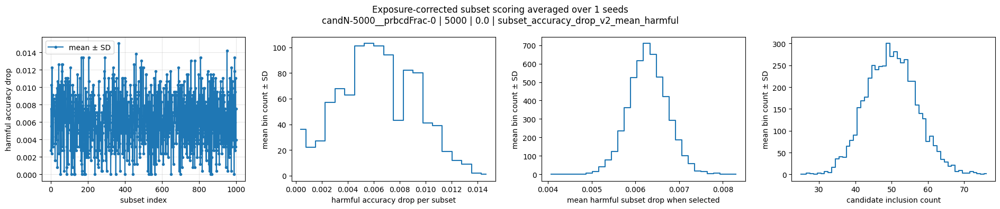

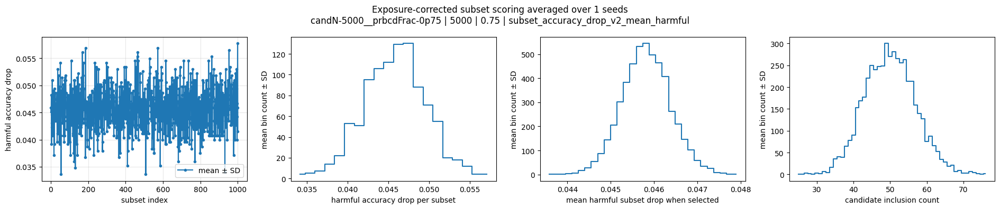

In [15]:
subset_runs = [
    run
    for run in mining_runs
    if run["scoring_mode"] == "subset_accuracy_drop"
]

if subset_runs:
    from pathlib import Path

    out_dir = (
        Path("extendedPlotting")
        / "subset_scoring_multiseed"
    )
    out_dir.mkdir(parents=True, exist_ok=True)

    group_keys = [
        "candidate_config_id",
        "candidate_set_size",
        "prbcd_candidate_fraction",
        "score_schema_version",
    ]

    grouped_input = pd.DataFrame([
        {
            **{key: run[key] for key in group_keys},
            "run": run,
        }
        for run in subset_runs
    ])

    for key, runs in grouped_input.groupby(
        group_keys,
        dropna=False,
    ):
        run_list = runs["run"].tolist()

        subset_rows = []
        raw_score_arrays = []
        inclusion_arrays = []

        for run in run_list:
            result = run["mining_result"]

            signed_drops = np.asarray(
                result["signed_drop_per_subset"],
                dtype=float,
            )
            harmful_drops = np.asarray(
                result["harmful_drop_per_subset"],
                dtype=float,
            )

            subset_rows.extend(
                {
                    "seed": run["seed"],
                    "subset_index": subset_index + 1,
                    "signed_drop": signed_drop,
                    "harmful_drop": harmful_drop,
                }
                for subset_index, (
                    signed_drop,
                    harmful_drop,
                ) in enumerate(
                    zip(signed_drops, harmful_drops)
                )
            )

            raw_score_arrays.append(
                np.asarray(
                    run["score_raw"],
                    dtype=float,
                )
            )

            inclusion_arrays.append(
                np.asarray(
                    run["inclusion_count"],
                    dtype=float,
                )
            )

        subset_df = pd.DataFrame(subset_rows)

        curve = (
            subset_df
            .groupby("subset_index", as_index=False)
            .agg(
                harmful_drop_mean=(
                    "harmful_drop",
                    "mean",
                ),
                harmful_drop_std=(
                    "harmful_drop",
                    "std",
                ),
            )
        )

        curve["harmful_drop_std"] = (
            curve["harmful_drop_std"].fillna(0.0)
        )

        all_harmful_drops = subset_df[
            "harmful_drop"
        ].to_numpy()

        harmful_bins = np.linspace(
            all_harmful_drops.min(),
            all_harmful_drops.max() + 1e-12,
            21,
        )

        hist_harmful = np.vstack([
            np.histogram(
                subset_df.loc[
                    subset_df.seed == seed,
                    "harmful_drop",
                ],
                bins=harmful_bins,
            )[0]
            for seed in sorted(subset_df.seed.unique())
        ])

        pooled_scores = np.concatenate(raw_score_arrays)
        score_bins = np.linspace(
            pooled_scores.min(),
            pooled_scores.max() + 1e-12,
            31,
        )

        hist_scores = np.vstack([
            np.histogram(
                scores,
                bins=score_bins,
            )[0]
            for scores in raw_score_arrays
        ])

        pooled_inclusions = np.concatenate(
            inclusion_arrays
        )
        inclusion_bins = np.arange(
            pooled_inclusions.min(),
            pooled_inclusions.max() + 2,
        ) - 0.5

        hist_inclusions = np.vstack([
            np.histogram(
                counts,
                bins=inclusion_bins,
            )[0]
            for counts in inclusion_arrays
        ])

        fig, axes = plt.subplots(
            1,
            4,
            figsize=(19, 4),
        )

        add_mean_std_band(
            axes[0],
            curve["subset_index"],
            curve["harmful_drop_mean"],
            curve["harmful_drop_std"],
            label="mean ± SD",
            marker="o",
            markersize=3,
        )
        axes[0].set_xlabel("subset index")
        axes[0].set_ylabel("harmful accuracy drop")
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        harmful_centers = (
            harmful_bins[:-1] + harmful_bins[1:]
        ) / 2

        axes[1].step(
            harmful_centers,
            hist_harmful.mean(0),
            where="mid",
            label="mean count",
        )
        axes[1].fill_between(
            harmful_centers,
            hist_harmful.mean(0)
            - hist_harmful.std(0),
            hist_harmful.mean(0)
            + hist_harmful.std(0),
            alpha=0.18,
            step="mid",
        )
        axes[1].set_xlabel(
            "harmful accuracy drop per subset"
        )
        axes[1].set_ylabel("mean bin count ± SD")

        score_centers = (
            score_bins[:-1] + score_bins[1:]
        ) / 2

        axes[2].step(
            score_centers,
            hist_scores.mean(0),
            where="mid",
            label="mean count",
        )
        axes[2].fill_between(
            score_centers,
            hist_scores.mean(0)
            - hist_scores.std(0),
            hist_scores.mean(0)
            + hist_scores.std(0),
            alpha=0.18,
            step="mid",
        )
        axes[2].set_xlabel(
            "mean harmful subset drop when selected"
        )
        axes[2].set_ylabel("mean bin count ± SD")

        inclusion_centers = (
            inclusion_bins[:-1]
            + inclusion_bins[1:]
        ) / 2

        axes[3].step(
            inclusion_centers,
            hist_inclusions.mean(0),
            where="mid",
            label="mean count",
        )
        axes[3].fill_between(
            inclusion_centers,
            hist_inclusions.mean(0)
            - hist_inclusions.std(0),
            hist_inclusions.mean(0)
            + hist_inclusions.std(0),
            alpha=0.18,
            step="mid",
        )
        axes[3].set_xlabel("candidate inclusion count")
        axes[3].set_ylabel("mean bin count ± SD")

        title = " | ".join(map(str, key))
        fig.suptitle(
            "Exposure-corrected subset scoring "
            f"averaged over {len(run_list)} seeds\n"
            f"{title}"
        )
        fig.tight_layout()

        fig.savefig(
            out_dir
            / (
                "subset_scoring__"
                f"{_safe_config_value(title)}.png"
            ),
            dpi=200,
            bbox_inches="tight",
        )

        plt.show()
else:
    print(
        "Skipping subset-drop plots because no "
        "subset_accuracy_drop mining run exists."
    )


---
## §3  Continuous Score Distribution

The canonical raw label is the mean harmful subset accuracy drop observed when an edge was selected. It remains in the original accuracy-drop scale.

For selector training, the raw score is divided by the largest observed raw score within the mining run, producing `score_norm` in \([0,1]\). This is a relative harmfulness score, not a probability.

`score_percentile` stores the tie-aware within-run rank. `observed_mask` distinguishes evaluated zero-score candidates from candidates that were never included in any sampled subset.


### Analysis and plotting block

The following cells characterize the candidates obtained through direct mining.

The analysis examines:

- the number and proportion of positive labels;
- the balance between label-1 and label-0 candidates;
- edge additions versus edge deletions;
- the number of distinct affected endpoints;
- structural differences between label groups;
- the distribution of accuracy-drop scores;
- the overlap between local endpoint harmfulness and global accuracy effects.

This analysis addresses the first step of the RQ2 argument:

> Are harmful candidates observable through direct local or global evaluations, and how are they distributed within the candidate space?

These descriptive results do not yet establish that the candidates remain harmful when several perturbations are applied jointly. That question is addressed by the oracle and injection experiments.

,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,scoring_mode,endpoint_mining_hop,actual_prbcd_fraction_mean,actual_prbcd_fraction_std,actual_prbcd_fraction_count,n_candidates_mean,n_candidates_std,...,n_candidates_sem,n_positive_labels_sem,label_min_sem,label_mean_sem,label_median_sem,label_max_sem,label_std_sem,fraction_label_gt_0_sem,fraction_label_gt_0_5_sem,n_seeds
0,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,0,0.00,0.0,1,5000.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,candN-5000__prbcdFrac-0p75,5000,0.75,subset_accuracy_drop,0,0.75,0.0,1,5000.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


Extreme normalized labels for subset_accuracy_drop:


,seed,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,endpoint_mining_hop,n_labels_below_0_2,n_labels_above_0_8,n_extreme_labels
0,0,candN-5000__prbcdFrac-0,5000,0.00,0,6,29,35
1,0,candN-5000__prbcdFrac-0p75,5000,0.75,0,32,77,109


Total below 0.2: 38
Total above 0.8: 106
Total extreme labels: 144


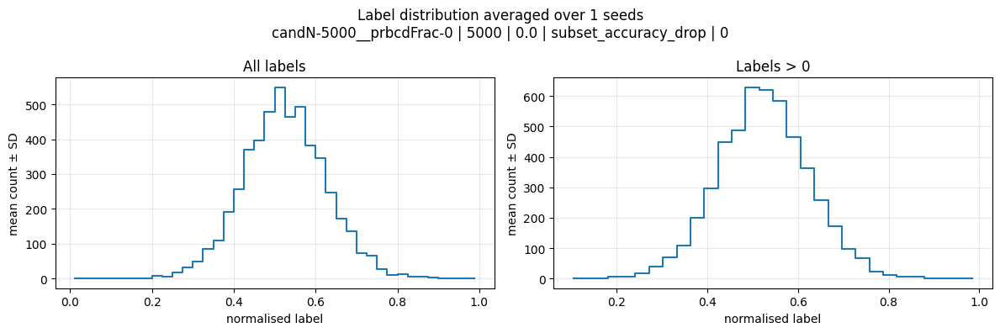

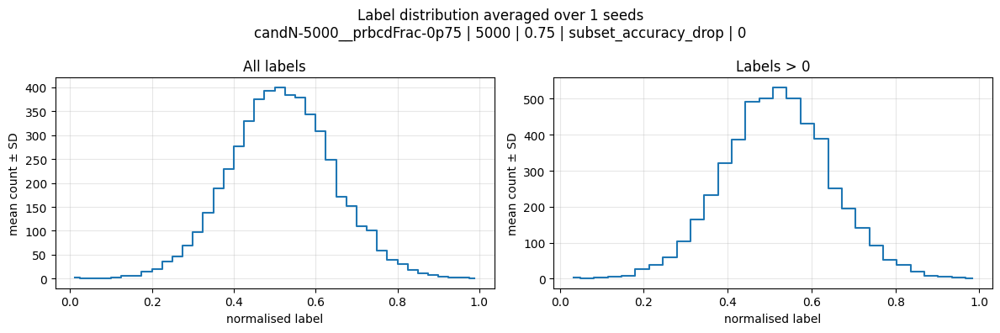

In [19]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

LABEL_DIAGNOSTIC_OUT_DIR = Path("extendedPlotting") / "label_diagnostics_multiseed"
LABEL_DIAGNOSTIC_OUT_DIR.mkdir(parents=True, exist_ok=True)
label_summary_rows = []

for run in mining_runs:
    values = run["labels_changed"].detach().cpu().numpy().astype(float)
    label_summary_rows.append({
        "seed": run["seed"], "candidate_config_id": run["candidate_config_id"],
        "candidate_set_size": run["candidate_set_size"],
        "prbcd_candidate_fraction": run["prbcd_candidate_fraction"],
        "actual_prbcd_fraction": run["actual_prbcd_fraction"],
        "scoring_mode": run["scoring_mode"], "endpoint_mining_hop": run["endpoint_mining_hop"],
        "n_candidates": len(values), "n_positive_labels": int((values > 0).sum()),
        "label_min": values.min(), "label_mean": values.mean(), "label_median": np.median(values),
        "label_max": values.max(), "label_std": values.std(),
        "fraction_label_gt_0": (values > 0).mean(), "fraction_label_gt_0_5": (values > .5).mean(),
        "n_label_lt_0_2": int((values < 0.2).sum()),
        "n_label_gt_0_8": int((values > 0.8).sum()),
        "n_extreme_labels": int(((values < 0.2) | (values > 0.8)).sum()),
    })

label_summary_raw_df = pd.DataFrame(label_summary_rows)
label_group_cols = ["candidate_config_id", "candidate_set_size", "prbcd_candidate_fraction", "scoring_mode", "endpoint_mining_hop"]
label_summary_df = aggregate_over_seeds(label_summary_raw_df, label_group_cols, [
    "actual_prbcd_fraction", "n_candidates", "n_positive_labels", "label_min", "label_mean",
    "label_median", "label_max", "label_std", "fraction_label_gt_0", "fraction_label_gt_0_5",
])
label_summary_raw_df.to_csv(LABEL_DIAGNOSTIC_OUT_DIR / "label_summary_raw.csv", index=False)
label_summary_df.to_csv(LABEL_DIAGNOSTIC_OUT_DIR / "label_summary_averaged.csv", index=False)
display(label_summary_df)

extreme_label_rows = []

for run in mining_runs:
    if run["scoring_mode"] != "subset_accuracy_drop":
        continue

    values = run["labels_changed"].detach().cpu().numpy().astype(float)

    n_below_0_2 = int((values < 0.2).sum())
    n_above_0_8 = int((values > 0.8).sum())

    extreme_label_rows.append({
        "seed": run["seed"],
        "candidate_config_id": run["candidate_config_id"],
        "candidate_set_size": run["candidate_set_size"],
        "prbcd_candidate_fraction": run["prbcd_candidate_fraction"],
        "endpoint_mining_hop": run["endpoint_mining_hop"],
        "n_labels_below_0_2": n_below_0_2,
        "n_labels_above_0_8": n_above_0_8,
        "n_extreme_labels": n_below_0_2 + n_above_0_8,
    })

extreme_label_df = pd.DataFrame(extreme_label_rows)

print("Extreme normalized labels for subset_accuracy_drop:")
display(extreme_label_df)

print(
    f"Total below 0.2: {extreme_label_df['n_labels_below_0_2'].sum()}\n"
    f"Total above 0.8: {extreme_label_df['n_labels_above_0_8'].sum()}\n"
    f"Total extreme labels: {extreme_label_df['n_extreme_labels'].sum()}"
)

for key, run_group in pd.DataFrame([{**{k: r[k] for k in label_group_cols}, "run": r} for r in mining_runs]).groupby(label_group_cols, dropna=False):
    arrays = [row["labels_changed"].detach().cpu().numpy().astype(float) for row in run_group["run"]]
    pooled = np.concatenate(arrays)
    bins = np.linspace(pooled.min(), pooled.max() + 1e-12, 41)
    counts = np.vstack([np.histogram(values, bins=bins)[0] for values in arrays])
    positive_arrays = [values[values > 0] for values in arrays]
    pooled_pos = np.concatenate([v for v in positive_arrays if v.size]) if any(v.size for v in positive_arrays) else np.array([0.0])
    bins_pos = np.linspace(pooled_pos.min(), pooled_pos.max() + 1e-12, 31)
    counts_pos = np.vstack([np.histogram(values, bins=bins_pos)[0] for values in positive_arrays])
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    for ax, bins_i, counts_i, title in [(axes[0], bins, counts, "All labels"), (axes[1], bins_pos, counts_pos, "Labels > 0")]:
        centers = (bins_i[:-1] + bins_i[1:]) / 2
        mean, std = counts_i.mean(0), counts_i.std(0)
        ax.step(centers, mean, where="mid", label="mean bin count")
        ax.fill_between(centers, mean-std, mean+std, step="mid", alpha=.18)
        ax.set_xlabel("normalised label"); ax.set_ylabel("mean count ± SD"); ax.set_title(title); ax.grid(True, alpha=.3)
    title_key = " | ".join(map(str, key))
    fig.suptitle(f"Label distribution averaged over {len(arrays)} seeds\n{title_key}")
    fig.tight_layout(); fig.savefig(LABEL_DIAGNOSTIC_OUT_DIR / f"label_distribution__{_safe_config_value(title_key)}.png", dpi=200, bbox_inches="tight"); plt.show()


Subset-accuracy-drop mining:


,candidate_set_size,prbcd_candidate_fraction,actual_prbcd_fraction_mean,actual_prbcd_fraction_std,actual_prbcd_fraction_count,mean_score_raw_mean,mean_score_raw_std,mean_score_raw_count,median_score_raw_mean,median_score_raw_std,...,actual_prbcd_fraction_sem,mean_score_raw_sem,median_score_raw_sem,max_score_raw_sem,positive_score_fraction_sem,observed_fraction_sem,n_positive_sem,n_observed_sem,mean_inclusion_count_sem,n_seeds
0,5000,0.00,0.00,0.0,1,0.006292,0.0,1,0.006283,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,5000,0.75,0.75,0.0,1,0.045822,0.0,1,0.045818,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


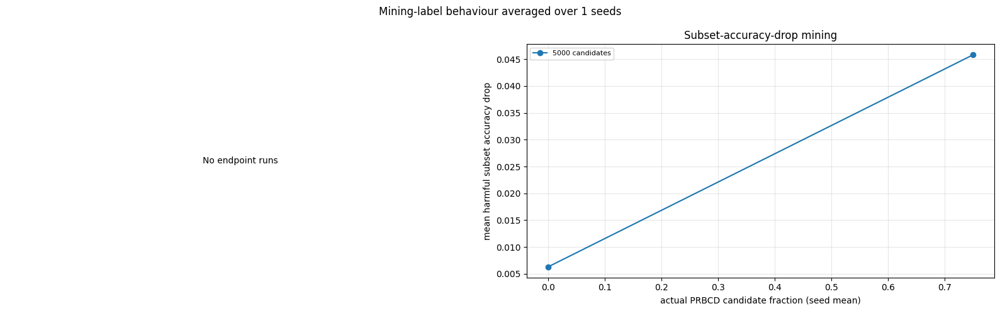

In [17]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display


# ============================================================
# Output configuration
# ============================================================

MINING_MODE_OUT_DIR = (
    Path("extendedPlotting")
    / "mining_mode_rates_multiseed"
)

MINING_MODE_OUT_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


# ============================================================
# Collect one row per mining run
# ============================================================

endpoint_rows = []
subset_rows = []


for run in mining_runs:
    scoring_mode = run.get("scoring_mode")
    result = run["mining_result"]

    common = {
        "seed": run["seed"],
        "candidate_config_id": run["candidate_config_id"],
        "candidate_set_size": run["candidate_set_size"],
        "prbcd_candidate_fraction": (
            run["prbcd_candidate_fraction"]
        ),
        "actual_prbcd_fraction": (
            run["actual_prbcd_fraction"]
        ),
    }

    # ========================================================
    # Binary endpoint mining
    # ========================================================

    if scoring_mode == "endpoint":
        endpoint_labels = np.asarray(
            result["endpoint_labels"],
            dtype=np.float64,
        ).reshape(-1)

        n_samples = int(
            result.get(
                "n_samples",
                endpoint_labels.size,
            )
        )

        n_positive = int(
            endpoint_labels.sum()
        )

        endpoint_rows.append({
            **common,
            "scoring_mode": "endpoint",
            "endpoint_mining_hop": run.get(
                "endpoint_mining_hop",
                0,
            ),
            "n_candidates": run.get(
                "n_cands",
                endpoint_labels.size,
            ),
            "n_positive": n_positive,
            "n_samples": n_samples,
            "positive_per_sample": (
                n_positive / n_samples
                if n_samples > 0
                else np.nan
            ),
        })

    # ========================================================
    # Continuous subset-accuracy-drop mining
    # ========================================================

    elif scoring_mode == "subset_accuracy_drop":
        if "score_raw" not in result:
            raise KeyError(
                "A subset_accuracy_drop result does not contain "
                "'score_raw'. Recompute this run using the new "
                "mean-drop schema."
            )

        score_raw = np.asarray(
            result["score_raw"],
            dtype=np.float64,
        ).reshape(-1)

        observed_mask = np.asarray(
            result.get(
                "observed_mask",
                np.isfinite(score_raw),
            ),
            dtype=bool,
        ).reshape(-1)

        if observed_mask.shape != score_raw.shape:
            raise ValueError(
                "observed_mask and score_raw have incompatible "
                f"shapes: {observed_mask.shape} and "
                f"{score_raw.shape}."
            )

        valid_mask = (
            observed_mask
            & np.isfinite(score_raw)
        )

        observed_scores = score_raw[valid_mask]

        n_candidates = int(score_raw.size)
        n_observed = int(valid_mask.sum())
        n_unobserved = n_candidates - n_observed

        if n_observed > 0:
            mean_score_raw = float(
                observed_scores.mean()
            )

            median_score_raw = float(
                np.median(observed_scores)
            )

            max_score_raw = float(
                observed_scores.max()
            )

            n_positive = int(
                (observed_scores > 0).sum()
            )

            positive_score_fraction = (
                n_positive / n_observed
            )

        else:
            mean_score_raw = np.nan
            median_score_raw = np.nan
            max_score_raw = np.nan
            n_positive = 0
            positive_score_fraction = np.nan

        inclusion_count = np.asarray(
            result.get(
                "inclusion_count",
                np.full(n_candidates, np.nan),
            ),
            dtype=np.float64,
        ).reshape(-1)

        if (
            inclusion_count.size == n_candidates
            and n_observed > 0
        ):
            mean_inclusion_count = float(
                inclusion_count[valid_mask].mean()
            )
        else:
            mean_inclusion_count = np.nan

        subset_rows.append({
            **common,
            "scoring_mode": "subset_accuracy_drop",
            "n_candidates": n_candidates,
            "n_observed": n_observed,
            "n_unobserved": n_unobserved,
            "observed_fraction": (
                n_observed / n_candidates
                if n_candidates > 0
                else np.nan
            ),
            "n_positive": n_positive,
            "positive_score_fraction": (
                positive_score_fraction
            ),
            "mean_score_raw": mean_score_raw,
            "median_score_raw": median_score_raw,
            "max_score_raw": max_score_raw,
            "mean_inclusion_count": (
                mean_inclusion_count
            ),
            "n_subsets": result.get(
                "n_subsets",
                np.nan,
            ),
            "subset_size": result.get(
                "subset_size",
                np.nan,
            ),
            "subset_fraction": result.get(
                "subset_fraction",
                np.nan,
            ),
        })


# ============================================================
# Validate available modes
# ============================================================

if not endpoint_rows and not subset_rows:
    raise RuntimeError(
        "No endpoint or subset_accuracy_drop mining runs found."
    )


# ============================================================
# Build and aggregate endpoint results
# ============================================================

if endpoint_rows:
    endpoint_rate_df = pd.DataFrame(
        endpoint_rows
    )

    endpoint_plot_df = aggregate_over_seeds(
        endpoint_rate_df,
        [
            "candidate_set_size",
            "endpoint_mining_hop",
            "prbcd_candidate_fraction",
        ],
        [
            "actual_prbcd_fraction",
            "n_positive",
            "n_samples",
            "positive_per_sample",
        ],
    )

    endpoint_rate_df.to_csv(
        MINING_MODE_OUT_DIR
        / "endpoint_hit_rate_raw.csv",
        index=False,
    )

    endpoint_plot_df.to_csv(
        MINING_MODE_OUT_DIR
        / "endpoint_hit_rate_averaged.csv",
        index=False,
    )

else:
    endpoint_rate_df = pd.DataFrame()
    endpoint_plot_df = pd.DataFrame()


# ============================================================
# Build and aggregate subset-drop results
# ============================================================

if subset_rows:
    subset_score_df = pd.DataFrame(
        subset_rows
    )

    subset_plot_df = aggregate_over_seeds(
        subset_score_df,
        [
            "candidate_set_size",
            "prbcd_candidate_fraction",
        ],
        [
            "actual_prbcd_fraction",
            "mean_score_raw",
            "median_score_raw",
            "max_score_raw",
            "positive_score_fraction",
            "observed_fraction",
            "n_positive",
            "n_observed",
            "mean_inclusion_count",
        ],
    )

    subset_score_df.to_csv(
        MINING_MODE_OUT_DIR
        / "subset_accuracy_drop_raw.csv",
        index=False,
    )

    subset_plot_df.to_csv(
        MINING_MODE_OUT_DIR
        / "subset_accuracy_drop_averaged.csv",
        index=False,
    )

else:
    subset_score_df = pd.DataFrame()
    subset_plot_df = pd.DataFrame()


# ============================================================
# Display result tables
# ============================================================

if not endpoint_plot_df.empty:
    print("Endpoint mining:")
    display(endpoint_plot_df)

if not subset_plot_df.empty:
    print("Subset-accuracy-drop mining:")
    display(subset_plot_df)


# ============================================================
# Plot both mining modes in one figure
#
# Separate axes are essential because:
# - endpoint uses a binary positive rate;
# - subset mining uses a continuous accuracy-drop score.
# ============================================================

fig, axes = plt.subplots(
    1,
    2,
    figsize=(16, 5),
)

endpoint_ax, subset_ax = axes


# ------------------------------------------------------------
# Panel A: endpoint hit rate
# ------------------------------------------------------------

if not endpoint_plot_df.empty:
    for (
        candidate_set_size,
        endpoint_hop,
    ), group in endpoint_plot_df.groupby(
        [
            "candidate_set_size",
            "endpoint_mining_hop",
        ]
    ):
        group = group.sort_values(
            "actual_prbcd_fraction_mean"
        )

        add_mean_std_band(
            endpoint_ax,
            group["actual_prbcd_fraction_mean"],
            group["positive_per_sample_mean"],
            group["positive_per_sample_std"],
            marker="o",
            label=(
                f"{candidate_set_size} candidates, "
                f"h={endpoint_hop}"
            ),
        )

    endpoint_ax.set_xlabel(
        "actual PRBCD candidate fraction "
        "(seed mean)"
    )

    endpoint_ax.set_ylabel(
        "endpoint positive hit rate"
    )

    endpoint_ax.set_title(
        "Endpoint mining"
    )

    endpoint_ax.grid(
        True,
        alpha=0.3,
    )

    endpoint_ax.legend(
        fontsize=8,
    )

else:
    endpoint_ax.text(
        0.5,
        0.5,
        "No endpoint runs",
        ha="center",
        va="center",
        transform=endpoint_ax.transAxes,
    )

    endpoint_ax.set_axis_off()


# ------------------------------------------------------------
# Panel B: subset mean raw score
# ------------------------------------------------------------

if not subset_plot_df.empty:
    for candidate_set_size, group in (
        subset_plot_df.groupby(
            "candidate_set_size"
        )
    ):
        group = group.sort_values(
            "actual_prbcd_fraction_mean"
        )

        add_mean_std_band(
            subset_ax,
            group["actual_prbcd_fraction_mean"],
            group["mean_score_raw_mean"],
            group["mean_score_raw_std"],
            marker="o",
            label=(
                f"{candidate_set_size} candidates"
            ),
        )

    subset_ax.set_xlabel(
        "actual PRBCD candidate fraction "
        "(seed mean)"
    )

    subset_ax.set_ylabel(
        "mean harmful subset accuracy drop"
    )

    subset_ax.set_title(
        "Subset-accuracy-drop mining"
    )

    subset_ax.grid(
        True,
        alpha=0.3,
    )

    subset_ax.legend(
        fontsize=8,
    )

else:
    subset_ax.text(
        0.5,
        0.5,
        "No subset-accuracy-drop runs",
        ha="center",
        va="center",
        transform=subset_ax.transAxes,
    )

    subset_ax.set_axis_off()


fig.suptitle(
    f"Mining-label behaviour averaged over "
    f"{N_SEEDS} seeds"
)

fig.tight_layout()

fig.savefig(
    MINING_MODE_OUT_DIR
    / "mining_mode_behaviour_by_prbcd_fraction.png",
    dpi=200,
    bbox_inches="tight",
)

plt.show()

/tmp/ipykernel_151421/2080508771.py:790: UserWarning: Configured scoring modes not present in mining_runs will be skipped: ['endpoint']. Available modes: ['subset_accuracy_drop']
  warnings.warn(


RQ2 MODE-AWARE COMPREHENSIVE GRAPH-STATISTICS EXPERIMENT
Selected candidate configuration: candN-5000__prbcdFrac-0p75
Candidate-set size: 5000
Scoring modes: ['subset_accuracy_drop']
Seeds: [0]
Endpoint hops: []
Subset comparison: top 10% versus bottom 10% of observed score_raw
Number of mining runs: 1
Output directory: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd
Computing clean graph/node statistics for topology (2810, 15962, 126727) ...


/tmp/ipykernel_151421/2170471601.py:148: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stats[f"{metric}_sem"] = stats[std_col] / np.sqrt(
/tmp/ipykernel_151421/2170471601.py:148: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stats[f"{metric}_sem"] = stats[std_col] / np.sqrt(
/tmp/ipykernel_151421/2170471601.py:148: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. 


STATS INCLUDED IN THE MODE-AWARE GROUP-1 VS GROUP-0 COMPARISON

Group definitions
   - endpoint: group 1 = endpoint label 1; group 0 = endpoint label 0.
   - subset_accuracy_drop: group 1 = exact top score decile; group 0 = exact bottom score decile.
   - score columns are excluded from the feature tests to avoid a tautological comparison.

1. Candidate identity and provenance
   - PRBCD-derived versus random candidate; addition versus deletion; bridge status.
2. Endpoint ground truth and victim state
   - true classes, clean predictions, clean correctness, confidence, entropy,
     true-class probability, classification margin, endpoint hit pattern, and
     adoption of the partner endpoint's true class.
3. Endpoint node structure
   - degree, clustering coefficient, triangle count, core number, PageRank,
     closeness, betweenness, eigenvector centrality, component size, and class frequency.
4. Pairwise topology
   - common neighbors, neighborhood union, Jaccard, Salton, Sørensen,


,scoring_mode,comparison_rule,n_candidates_available,n_candidates_valid,n_group_1,n_group_0,selected_fraction_per_group,bottom_cutoff_score,top_cutoff_score,score_min,score_max,constant_score_run,n_at_bottom_cutoff,n_at_top_cutoff,dataset,seed,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,actual_prbcd_fraction,endpoint_mining_hop,candidate_hash
0,subset_accuracy_drop,subset_top_vs_bottom_10%,5000,5000,500,500,0.1,0.045108,0.046547,0.043508,0.047974,False,3,2,cora_ml,0,candN-5000__prbcdFrac-0p75,5000,0.75,0.75,0,8ab3ce63e3



CLEAN GRAPH SUMMARY


,seed,scoring_mode,comparison_rule,endpoint_mining_hop,candidate_config_id,n_nodes,n_edges,density,n_components,largest_component_fraction,average_degree,degree_std,average_clustering,transitivity,assortativity_degree,n_bridges
0,0,subset_accuracy_drop,subset_top_vs_bottom_10%,0,candN-5000__prbcdFrac-0p75,2810,7981,0.002022,1,1.0,5.680427,8.453357,0.277667,0.114298,-0.076592,549



COMPARISON-GROUP / SET-LEVEL SUMMARY — RAW PER SEED


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,seed,label_group,label_name,n_candidate_edges,candidate_fraction,score_raw_mean,score_raw_min,score_raw_max,score_percentile_mean,inclusion_count_mean,addition_fraction,deletion_fraction,prbcd_derived_fraction,same_true_label_fraction,same_clean_prediction_fraction,both_clean_correct_fraction,neither_clean_correct_fraction,both_hit_fraction,exactly_one_hit_fraction,partner_label_adoption_fraction,full_graph_fallback_fraction,n_unique_endpoint_nodes,endpoint_node_coverage,mean_candidate_incidence_active_node,max_candidate_incidence,candidate_incidence_gini,candidate_incidence_hhi,top_1pct_endpoint_share,top_5pct_endpoint_share,top_10pct_endpoint_share,candidate_pair_network_density,candidate_pair_network_components,candidate_pair_network_largest_component_fraction,candidate_pair_network_average_clustering,candidate_pair_network_transitivity
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,bottom_10%_subset_score,500,0.5,0.044834,0.043508,0.045108,0.04991,48.446,0.996,0.004,0.676,0.098,0.174,0.730,0.014,NaN,NaN,NaN,NaN,760,0.270463,1.315789,10.0,0.198134,0.001728,0.045,0.136,0.220,0.001734,260,0.028947,0.0,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,1,top_10%_subset_score,500,0.5,0.046833,0.046547,0.047974,0.95009,48.998,0.994,0.006,0.842,0.058,0.086,0.804,0.010,NaN,NaN,NaN,NaN,732,0.260498,1.366120,8.0,0.218456,0.001836,0.047,0.149,0.233,0.001869,232,0.051913,0.0,0.0



COMPARISON-GROUP / SET-LEVEL SUMMARY — AGGREGATED ACROSS SEEDS


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,label_group,label_name,n_candidate_edges_mean,n_candidate_edges_std,n_candidate_edges_count,candidate_fraction_mean,candidate_fraction_std,candidate_fraction_count,score_raw_mean_mean,score_raw_mean_std,score_raw_mean_count,score_raw_min_mean,score_raw_min_std,score_raw_min_count,score_raw_max_mean,score_raw_max_std,score_raw_max_count,score_percentile_mean_mean,score_percentile_mean_std,score_percentile_mean_count,inclusion_count_mean_mean,inclusion_count_mean_std,inclusion_count_mean_count,addition_fraction_mean,addition_fraction_std,addition_fraction_count,deletion_fraction_mean,deletion_fraction_std,deletion_fraction_count,prbcd_derived_fraction_mean,prbcd_derived_fraction_std,prbcd_derived_fraction_count,same_true_label_fraction_mean,same_true_label_fraction_std,same_true_label_fraction_count,same_clean_prediction_fraction_mean,same_clean_prediction_fraction_std,same_clean_prediction_fraction_count,both_clean_correct_fraction_mean,both_clean_correct_fraction_std,both_clean_correct_fraction_count,neither_clean_correct_fraction_mean,neither_clean_correct_fraction_std,neither_clean_correct_fraction_count,both_hit_fraction_mean,both_hit_fraction_std,both_hit_fraction_count,exactly_one_hit_fraction_mean,exactly_one_hit_fraction_std,exactly_one_hit_fraction_count,partner_label_adoption_fraction_mean,partner_label_adoption_fraction_std,partner_label_adoption_fraction_count,full_graph_fallback_fraction_mean,full_graph_fallback_fraction_std,full_graph_fallback_fraction_count,n_unique_endpoint_nodes_mean,n_unique_endpoint_nodes_std,n_unique_endpoint_nodes_count,endpoint_node_coverage_mean,endpoint_node_coverage_std,endpoint_node_coverage_count,mean_candidate_incidence_active_node_mean,mean_candidate_incidence_active_node_std,mean_candidate_incidence_active_node_count,max_candidate_incidence_mean,max_candidate_incidence_std,max_candidate_incidence_count,candidate_incidence_gini_mean,candidate_incidence_gini_std,candidate_incidence_gini_count,candidate_incidence_hhi_mean,candidate_incidence_hhi_std,candidate_incidence_hhi_count,top_1pct_endpoint_share_mean,top_1pct_endpoint_share_std,top_1pct_endpoint_share_count,top_5pct_endpoint_share_mean,top_5pct_endpoint_share_std,top_5pct_endpoint_share_count,top_10pct_endpoint_share_mean,top_10pct_endpoint_share_std,top_10pct_endpoint_share_count,candidate_pair_network_density_mean,candidate_pair_network_density_std,candidate_pair_network_density_count,candidate_pair_network_components_mean,candidate_pair_network_components_std,candidate_pair_network_components_count,candidate_pair_network_largest_component_fraction_mean,candidate_pair_network_largest_component_fraction_std,candidate_pair_network_largest_component_fraction_count,candidate_pair_network_average_clustering_mean,candidate_pair_network_average_clustering_std,candidate_pair_network_average_clustering_count,candidate_pair_network_transitivity_mean,candidate_pair_network_transitivity_std,candidate_pair_network_transitivity_count,n_candidate_edges_sem,candidate_fraction_sem,score_raw_mean_sem,score_raw_min_sem,score_raw_max_sem,score_percentile_mean_sem,inclusion_count_mean_sem,addition_fraction_sem,deletion_fraction_sem,prbcd_derived_fraction_sem,same_true_label_fraction_sem,same_clean_prediction_fraction_sem,both_clean_correct_fraction_sem,neither_clean_correct_fraction_sem,both_hit_fraction_sem,exactly_one_hit_fraction_sem,partner_label_adoption_fraction_sem,full_graph_fallback_fraction_sem,n_unique_endpoint_nodes_sem,endpoint_node_coverage_sem,mean_candidate_incidence_active_node_sem,max_candidate_incidence_sem,candidate_incidence_gini_sem,candidate_incidence_hhi_sem,top_1pct_endpoint_share_sem,top_5pct_endpoint_share_sem,top_10pct_endpoint_share_sem,candidate_pair_network_density_sem,candidate_pair_network_components_sem,candidate_pair_network_largest_component_fraction_sem,candidate_pair_network_average_clustering_sem,candidate_pair_network_transitivity_sem,n_s


NUMERIC COMPARISONS — SORTED BY ABSOLUTE HEDGES' G


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,n_label_1_mean,n_label_1_std,n_label_1_count,n_label_0_mean,n_label_0_std,n_label_0_count,label_1_mean_mean,label_1_mean_std,label_1_mean_count,label_1_std_mean,label_1_std_std,label_1_std_count,label_1_median_mean,label_1_median_std,label_1_median_count,label_1_q1_mean,label_1_q1_std,label_1_q1_count,label_1_q3_mean,label_1_q3_std,label_1_q3_count,label_1_iqr_mean,label_1_iqr_std,label_1_iqr_count,label_1_min_mean,label_1_min_std,label_1_min_count,label_1_max_mean,label_1_max_std,label_1_max_count,label_0_mean_mean,label_0_mean_std,label_0_mean_count,label_0_std_mean,label_0_std_std,label_0_std_count,label_0_median_mean,label_0_median_std,label_0_median_count,label_0_q1_mean,label_0_q1_std,label_0_q1_count,label_0_q3_mean,label_0_q3_std,label_0_q3_count,label_0_iqr_mean,label_0_iqr_std,label_0_iqr_count,label_0_min_mean,label_0_min_std,label_0_min_count,label_0_max_mean,label_0_max_std,label_0_max_count,mean_difference_1_minus_0_mean,mean_difference_1_minus_0_std,mean_difference_1_minus_0_count,median_difference_1_minus_0_mean,median_difference_1_minus_0_std,median_difference_1_minus_0_count,mean_ratio_1_over_0_mean,mean_ratio_1_over_0_std,mean_ratio_1_over_0_count,cohen_d_mean,cohen_d_std,cohen_d_count,hedges_g_mean,hedges_g_std,hedges_g_count,mann_whitney_u_mean,mann_whitney_u_std,mann_whitney_u_count,rank_biserial_correlation_mean,rank_biserial_correlation_std,rank_biserial_correlation_count,mann_whitney_p_mean,mann_whitney_p_std,mann_whitney_p_count,ks_statistic_mean,ks_statistic_std,ks_statistic_count,ks_p_mean,ks_p_std,ks_p_count,point_biserial_correlation_mean,point_biserial_correlation_std,point_biserial_correlation_count,point_biserial_p_mean,point_biserial_p_std,point_biserial_p_count,mann_whitney_p_fdr_bh_mean,mann_whitney_p_fdr_bh_std,mann_whitney_p_fdr_bh_count,ks_p_fdr_bh_mean,ks_p_fdr_bh_std,ks_p_fdr_bh_count,point_biserial_p_fdr_bh_mean,point_biserial_p_fdr_bh_std,point_biserial_p_fdr_bh_count,n_label_1_sem,n_label_0_sem,label_1_mean_sem,label_1_std_sem,label_1_median_sem,label_1_q1_sem,label_1_q3_sem,label_1_iqr_sem,label_1_min_sem,label_1_max_sem,label_0_mean_sem,label_0_std_sem,label_0_median_sem,label_0_q1_sem,label_0_q3_sem,label_0_iqr_sem,label_0_min_sem,label_0_max_sem,mean_difference_1_minus_0_sem,median_difference_1_minus_0_sem,mean_ratio_1_over_0_sem,cohen_d_sem,hedges_g_sem,mann_whitney_u_sem,rank_biserial_correlation_sem,mann_whitney_p_sem,ks_statistic_sem,ks_p_sem,point_biserial_correlation_sem,point_biserial_p_sem,mann_whitney_p_fdr_bh_sem,ks_p_fdr_bh_sem,point_biserial_p_fdr_bh_sem,n_seeds,abs_hedges_g_mean
42,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_clean_entropy_absdiff,500.0,0.0,1,500.0,0.0,1,7.266669e-01,0.0,1,4.641664e-01,0.0,1,6.710644e-01,0.0,1,3.161116e-01,0.0,1,1.123503e+00,0.0,1,8.073914e-01,0.0,1,9.096384e-03,0.0,1,1.828032e+00,0.0,1,6.044078e-01,0.0,1,4.296449e-01,0.0,1,5.058677e-01,0.0,1,2.390536e-01,0.0,1,9.462442e-01,0.0,1,7.071906e-01,0.0,1,1.571774e-04,0.0,1,1.704358e+00,0.0,1,1.222591e-01,0.0,1,1.651968e-01,0.0,1,1.202279,0.0,1,0.273364,0.0,1,0.273159,0.0,1,143931.0,0.0,1,0.151448,0.0,1,0.000034,0.0,1,0.126,0.0,1,0.000705,0.0,1,0.135556,0.0,1,0.000017,0.0,1,0.001236,0.0,1,0.008032,0.0,1,0.001207,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0.273159
36,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_clean_confidence_absdiff,500.0,0.0,1,500.0,0.0,1,2.851593e-01,0.0,1,1.970612e-01,0.0,1,2.456772e-01,0.0,1,1.064412e-01,0.0,1,4.538624e-01,0.0,1,3.474212e-01,0.0,1,5.871654e-04,0.0,1,7.724268e-01,0.0,1,2.332125e-01,0.0,1,1.842109e-01,0.0,1,1.862939e-01,0.0,1,7.542531e-02,0.0,1,3.686812e-01,0.0,1,2.932559e-01,0.0,1,2.527833e-04,0.0,1,6.968816e-01,0.0,1,5.194682e-02,0.0,1,5.938330e-02,0.0,1,1.222745,0.0,1,0.272337,0.0,1,0.272133,0.0,1,144101.0,0.0


CATEGORICAL COMPARISONS — SORTED BY CRAMÉR'S V


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,n_levels_mean,n_levels_std,n_levels_count,chi_square_mean,chi_square_std,chi_square_count,chi_square_df_mean,chi_square_df_std,chi_square_df_count,chi_square_p_mean,chi_square_p_std,chi_square_p_count,cramers_v_mean,cramers_v_std,cramers_v_count,risk_difference_label1_minus_label0_mean,risk_difference_label1_minus_label0_std,risk_difference_label1_minus_label0_count,risk_ratio_label1_over_label0_mean,risk_ratio_label1_over_label0_std,risk_ratio_label1_over_label0_count,odds_ratio_haldane_anscombe_mean,odds_ratio_haldane_anscombe_std,odds_ratio_haldane_anscombe_count,fisher_odds_ratio_mean,fisher_odds_ratio_std,fisher_odds_ratio_count,fisher_p_mean,fisher_p_std,fisher_p_count,chi_square_p_fdr_bh_mean,chi_square_p_fdr_bh_std,chi_square_p_fdr_bh_count,fisher_p_fdr_bh_mean,fisher_p_fdr_bh_std,fisher_p_fdr_bh_count,n_levels_sem,chi_square_sem,chi_square_df_sem,chi_square_p_sem,cramers_v_sem,risk_difference_label1_minus_label0_sem,risk_ratio_label1_over_label0_sem,odds_ratio_haldane_anscombe_sem,fisher_odds_ratio_sem,fisher_p_sem,chi_square_p_fdr_bh_sem,fisher_p_fdr_bh_sem,n_seeds
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,candidate_source,2.0,0.0,1,37.661479,0.0,1,1.0,0.0,1,8.415004e-10,0.0,1,0.191565,0.0,1,-0.166,0.0,1,0.487654,0.0,1,0.392894,0.0,1,0.391513,0.0,1,9.995244e-10,0.0,1,1.430551e-08,0.0,1,1.199429e-08,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_clean_prediction_pair,28.0,0.0,1,49.747119,0.0,1,27.0,0.0,1,4.866616e-03,0.0,1,0.150807,0.0,1,NaN,0.0,0,NaN,0.0,0,NaN,0.0,0,NaN,0.0,0,NaN,0.0,0,2.398938e-02,0.0,1,NaN,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
10,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_clean_prediction,2.0,0.0,1,17.117595,0.0,1,1.0,0.0,1,3.513529e-05,0.0,1,0.127015,0.0,1,-0.088,0.0,1,0.494253,0.0,1,0.449330,0.0,1,0.446666,0.0,1,4.605639e-05,0.0,1,2.986500e-04,0.0,1,2.763384e-04,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,both_endpoints_clean_correct,2.0,0.0,1,7.660413,0.0,1,1.0,0.0,1,5.644559e-03,0.0,1,0.081646,0.0,1,0.074,0.0,1,1.101370,0.0,1,1.514892,0.0,1,1.517193,0.0,1,7.004919e-03,0.0,1,2.398938e-02,0.0,1,2.801968e-02,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
5,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_true_label_pair,28.0,0.0,1,33.398932,0.0,1,27.0,0.0,1,1.842219e-01,0.0,1,0.079864,0.0,1,NaN,0.0,0,NaN,0.0,0,NaN,0.0,0,NaN,0.0,0,NaN,0.0,0,3.131773e-01,0.0,1,NaN,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
12,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_true_label,2.0,0.0,1,5.562045,0.0,1,1.0,0.0,1,1.835397e-02,0.0,1,0.067569,0.0,1,-0.040,0.0,1,0.591837,0.0,1,0.570680,0.0,1,0.566706,0.0,1,2.452430e-02,0.0,1,5.437023e-02,0.0,1,5.885833e-02,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
15,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,v_clean_correct,2.0,0.0,1,5.484164,0.0,1,1.0,0.0,1,1.918949e-02,0.0,1,0.066990,0.0,1,0.052,0.0,1,1.062651,0.0,1,1.526894,0.0,1,1.530937,0.0,1,2.408954e-02,0.0,1,5.437023e-02,0.0,1,5.885833e-02,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
7,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,has_two_hop_path,2.0,0.0,1,3.836818,0.0,1,1.0,0.0,1,5.013860e-02,0.0,1,0.053279,0.0,1,-0.028,0.0,1,0.588235,0.0,1,0.576890,0.0,1,0.571078,0.0,1,6.804131e-02,0.0,1,1.217652e-01,0.0,1,1.360826e-01,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
11,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_split,2.0,0.0,1,3.208110,0.0,1,1.0,0.0,1,7.327407e-02,0.0,1,0.047003,0.0,1,-0.040,0.0,1,0.954233,0.0,1,0.725714,0.0,1,0.724298,0.0,1,8.858419e-02,0


CATEGORICAL LEVEL PROPORTIONS


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,level,label_1_count_mean,label_1_count_std,label_1_count_count,label_1_fraction_mean,label_1_fraction_std,label_1_fraction_count,label_0_count_mean,label_0_count_std,label_0_count_count,label_0_fraction_mean,label_0_fraction_std,label_0_fraction_count,fraction_difference_1_minus_0_mean,fraction_difference_1_minus_0_std,fraction_difference_1_minus_0_count,label_1_count_sem,label_1_fraction_sem,label_0_count_sem,label_0_fraction_sem,fraction_difference_1_minus_0_sem,n_seeds
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,action,delete,3.0,0.0,1,0.006,0.0,1,2.0,0.0,1,0.004,0.0,1,0.002,0.0,1,0.0,0.0,0.0,0.0,0.0,1
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,action,add,497.0,0.0,1,0.994,0.0,1,498.0,0.0,1,0.996,0.0,1,-0.002,0.0,1,0.0,0.0,0.0,0.0,0.0,1
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,both_endpoints_clean_correct,True,402.0,0.0,1,0.804,0.0,1,365.0,0.0,1,0.730,0.0,1,0.074,0.0,1,0.0,0.0,0.0,0.0,0.0,1
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,both_endpoints_clean_correct,False,98.0,0.0,1,0.196,0.0,1,135.0,0.0,1,0.270,0.0,1,-0.074,0.0,1,0.0,0.0,0.0,0.0,0.0,1
4,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,candidate_source,prbcd_derived,421.0,0.0,1,0.842,0.0,1,338.0,0.0,1,0.676,0.0,1,0.166,0.0,1,0.0,0.0,0.0,0.0,0.0,1
5,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,candidate_source,random_candidate,79.0,0.0,1,0.158,0.0,1,162.0,0.0,1,0.324,0.0,1,-0.166,0.0,1,0.0,0.0,0.0,0.0,0.0,1
25,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_clean_prediction_pair,3-4,105.0,0.0,1,0.210,0.0,1,67.0,0.0,1,0.134,0.0,1,0.076,0.0,1,0.0,0.0,0.0,0.0,0.0,1
10,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_clean_prediction_pair,0-4,37.0,0.0,1,0.074,0.0,1,28.0,0.0,1,0.056,0.0,1,0.018,0.0,1,0.0,0.0,0.0,0.0,0.0,1
11,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_clean_prediction_pair,0-5,13.0,0.0,1,0.026,0.0,1,5.0,0.0,1,0.010,0.0,1,0.016,0.0,1,0.0,0.0,0.0,0.0,0.0,1
16,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_clean_prediction_pair,1-4,46.0,0.0,1,0.092,0.0,1,38.0,0.0,1,0.076,0.0,1,0.016,0.0,1,0.0,0.0,0.0,0.0,0.0,1



PAIRED SEED-LEVEL GROUP-1 MINUS GROUP-0 DIFFERENCES


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,n_seeds,seed_mean_difference_1_minus_0,seed_sd_difference,seed_sem_difference,paired_t_statistic,paired_t_p,wilcoxon_statistic,wilcoxon_p,paired_t_p_fdr_bh,wilcoxon_p_fdr_bh
34,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_class_frequency_product,1,3.570418e+03,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
100,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_feature_nnz_product,1,6.003600e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
30,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_class_frequency_absdiff,1,2.353600e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
31,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_class_frequency_max,1,2.053400e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
35,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_class_frequency_sum,1,1.753200e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
136,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,u_class_frequency,1,1.485800e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
32,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_class_frequency_mean,1,8.766000e+00,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
154,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,v_class_frequency,1,2.674000e+00,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
16,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,inclusion_count,1,5.520000e-01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
148,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,u_feature_nnz,1,4.200000e-01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN



TRUE-CLASS PAIR COUNTS


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,seed,canonical_true_label_pair,label_group,count,pair_total,within_pair_label_fraction
38,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,3-4,0,80,184,0.434783
30,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,2-4,0,69,141,0.489362
20,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,1-4,0,55,111,0.495495
8,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0-4,0,36,80,0.450000
44,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,4-4,0,26,42,0.619048
48,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,4-6,0,25,46,0.543478
16,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,1-2,0,21,36,0.583333
28,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,2-3,0,21,42,0.500000
34,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,2-6,0,20,34,0.588235
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0-1,0,18,38,0.473684



CANDIDATE SOURCE × ACTION × COMPARISON GROUP


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,seed,candidate_source,action,label_group,count
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,prbcd_derived,add,0,337
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,prbcd_derived,add,1,419
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,prbcd_derived,delete,0,1
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,prbcd_derived,delete,1,2
4,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,random_candidate,add,0,161
5,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,random_candidate,add,1,78
6,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,random_candidate,delete,0,1
7,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,random_candidate,delete,1,1



NODE INVOLVEMENT TABLE — TOP 50 BY CANDIDATE INCIDENCE


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,seed,label_group,label_name,node,candidate_incidence,degree,clustering,triangles,core_number,pagerank,closeness,betweenness,eigenvector,feature_nnz,feature_norm_l2,clean_confidence,clean_margin,clean_entropy,clean_correct,true_label,split
87,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,bottom_10%_subset_score,1862,10,3.0,0.000000,0.0,2.0,0.000286,0.161363,2.802750e-04,8.368144e-06,55.0,1.0,0.946218,0.932502,0.301348,True,4,test
13,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,bottom_10%_subset_score,18,7,1.0,0.000000,0.0,1.0,0.000096,0.172268,0.000000e+00,2.505719e-05,27.0,1.0,0.438751,0.057594,1.154434,True,3,test
216,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,bottom_10%_subset_score,1350,7,1.0,0.000000,0.0,1.0,0.000150,0.153455,0.000000e+00,7.400135e-05,44.0,1.0,0.585026,0.465605,1.334132,True,0,test
199,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,bottom_10%_subset_score,321,5,1.0,0.000000,0.0,1.0,0.000105,0.226277,0.000000e+00,9.746268e-03,37.0,1.0,0.973440,0.965721,0.167798,True,2,test
35,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,bottom_10%_subset_score,746,4,3.0,0.333333,1.0,3.0,0.000277,0.199673,4.000747e-04,2.745517e-04,56.0,1.0,0.807193,0.749410,0.819293,True,4,test
40,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,bottom_10%_subset_score,2176,4,2.0,0.000000,0.0,2.0,0.000156,0.184766,3.800757e-05,1.746277e-04,51.0,1.0,0.740478,0.639679,0.952776,True,1,test
460,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,bottom_10%_subset_score,2652,4,1.0,0.000000,0.0,1.0,0.000144,0.133115,0.000000e+00,2.075895e-07,11.0,1.0,0.891619,0.827702,0.485775,True,4,test
462,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,bottom_10%_subset_score,2269,4,3.0,0.000000,0.0,2.0,0.000264,0.188397,7.203363e-04,2.057708e-03,38.0,1.0,0.906270,0.871925,0.461671,True,6,test
548,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,bottom_10%_subset_score,2622,4,1.0,0.000000,0.0,1.0,0.000097,0.190894,0.000000e+00,2.130650e-04,44.0,1.0,0.479899,0.021038,0.966061,True,1,test
19,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,bottom_10%_subset_score,231,3,4.0,0.166667,1.0,3.0,0.000279,0.232302,2.827131e-03,1.062560e-02,52.0,1.0,0.694276,0.509001,0.983284,False,2,test


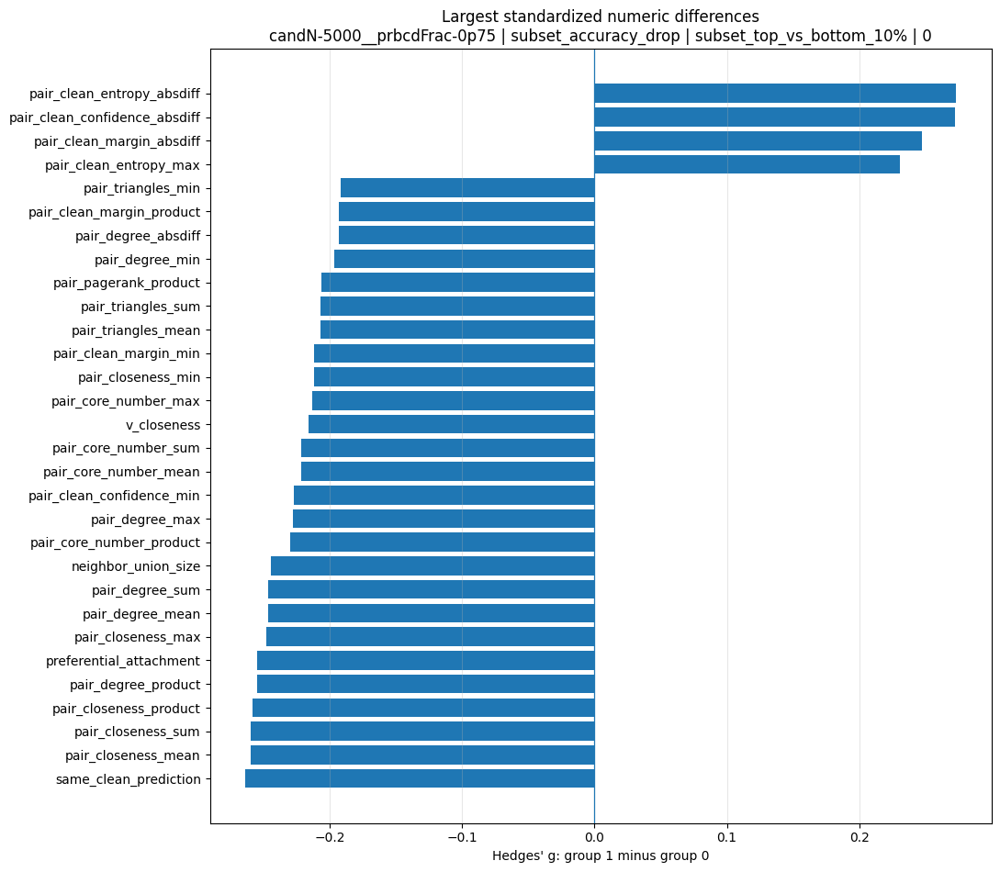

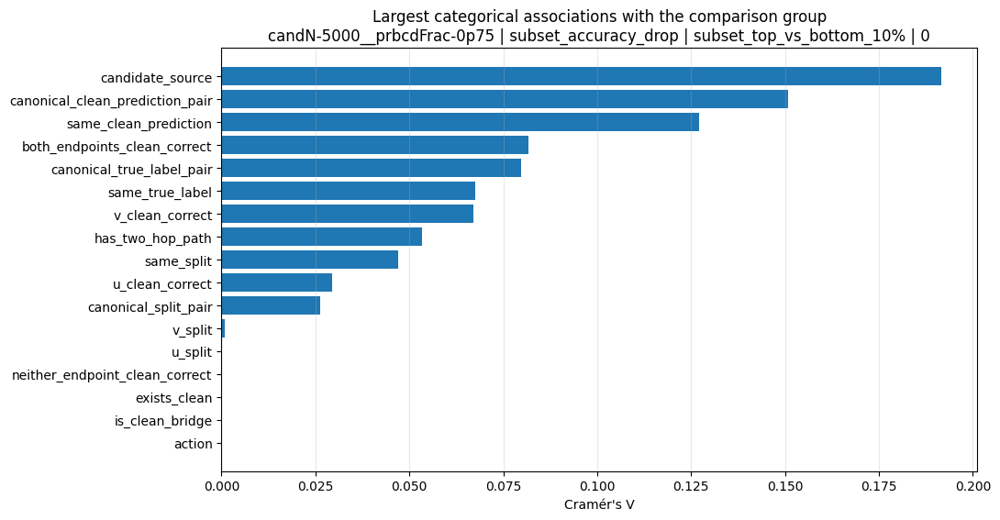

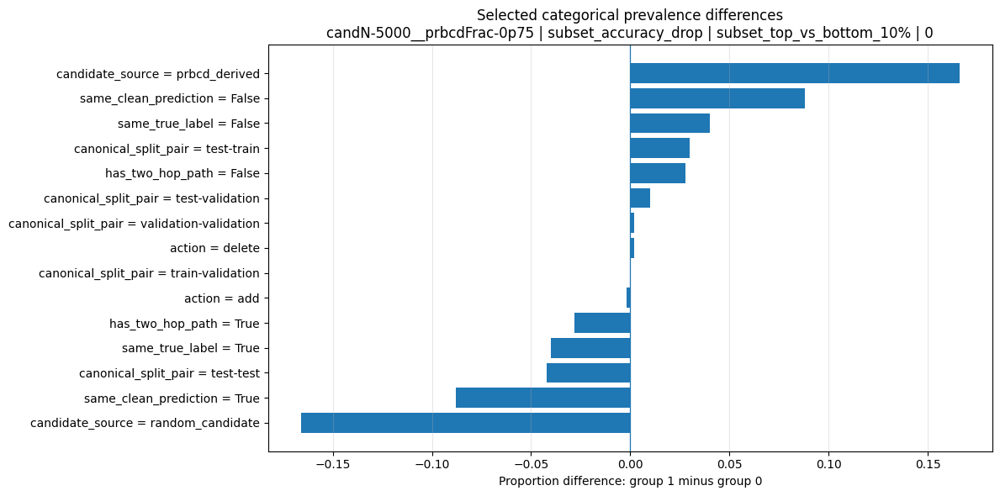


COMPLETED
Edge-level rows used in comparisons: 1000
Selection-diagnostic rows: 1
Numeric features compared: 171
Categorical features compared: 17
All raw tables, aggregated tables, and plots saved to:
/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd


In [20]:
# ============================================================
# RQ2: Mode-aware comprehensive graph-statistics comparison
# endpoint: label 1 versus label 0 (unchanged)
# subset_accuracy_drop: top versus bottom score decile
# Run directly after candidate labeling / creation of `mining_runs`.
# ============================================================

from pathlib import Path
from collections import Counter, defaultdict
import hashlib
import json
import math
import warnings

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import networkx as nx

from IPython.display import display
from scipy import sparse
from scipy.sparse.csgraph import shortest_path
from scipy.stats import (
    chi2_contingency,
    fisher_exact,
    ks_2samp,
    mannwhitneyu,
    pointbiserialr,
    ttest_rel,
    wilcoxon,
)

warnings.filterwarnings("ignore", category=RuntimeWarning)

# ------------------------------------------------------------
# Configuration
# ------------------------------------------------------------

RQ2_GRAPH_STATS_SCORING_MODES = {"endpoint", "subset_accuracy_drop"}
RQ2_GRAPH_STATS_CANDIDATE_CONFIG_ID = None
# None -> use every endpoint hop available for the selected configuration.
# This filter applies only to endpoint runs; subset runs are never duplicated by hop.
RQ2_GRAPH_STATS_ENDPOINT_HOPS = None

# Endpoint mode keeps the old binary split exactly.
RQ2_GRAPH_STATS_LABEL_THRESHOLD = 0.5

# Subset mode compares equal-sized score extremes within every seed/run.
RQ2_GRAPH_STATS_SUBSET_EXTREME_FRACTION = 0.10

RQ2_GRAPH_STATS_TOP_PLOT_FEATURES = 30
RQ2_GRAPH_STATS_MAX_CATEGORICAL_LEVELS = 30
RQ2_GRAPH_STATS_COMPUTE_EXACT_BETWEENNESS = True
RQ2_GRAPH_STATS_COMPUTE_ALL_PAIRS_DISTANCE = True
RQ2_GRAPH_STATS_PRINT_FULL_TABLES = True
RQ2_GRAPH_STATS_OUT_BASE = Path("extendedPlotting") / "rq2_mode_aware_graph_stats"

# ------------------------------------------------------------
# General helpers
# ------------------------------------------------------------

def _rq2_stats_safe(value):
    text = str(value)
    return "".join(ch if ch.isalnum() or ch in "._=-" else "_" for ch in text).strip("_")


def _to_cpu_tensor(value, *, dtype=None):
    if torch.is_tensor(value):
        tensor = value.detach().cpu()
    elif hasattr(value, "to_dense"):
        tensor = value.to_dense().detach().cpu()
    else:
        tensor = torch.as_tensor(value)
    if dtype is not None:
        tensor = tensor.to(dtype=dtype)
    return tensor


def _dense_features(context):
    x = context["attr"]
    if hasattr(x, "to_dense") and not torch.is_tensor(x):
        x = x.to_dense()
    elif torch.is_tensor(x) and x.is_sparse:
        x = x.to_dense()
    x = _to_cpu_tensor(x, dtype=torch.float32)
    if x.ndim != 2:
        raise ValueError(f"Expected a 2-D feature matrix, got shape={tuple(x.shape)}")
    return x


def _canonical_pair(u, v):
    u, v = int(u), int(v)
    return (u, v) if u < v else (v, u)


def _canonical_pair_series(u_values, v_values):
    return [_canonical_pair(u, v) for u, v in zip(u_values, v_values)]


def _clear_model_cache_and_call(model, x, adj):
    has_cache = hasattr(model, "adj_preped")
    old_cache = getattr(model, "adj_preped", None) if has_cache else None
    try:
        if has_cache:
            model.adj_preped = None
        return model(x, adj)
    finally:
        if has_cache:
            model.adj_preped = old_cache


def _clean_prediction_statistics(run):
    context = run["context"]
    model = context["model"]
    model.eval()
    device = next(model.parameters()).device
    x = context["attr"].to(device)
    adj = run["adj_orig"].to(device)
    with torch.no_grad():
        logits = _clear_model_cache_and_call(model, x, adj)
        probabilities = torch.softmax(logits, dim=-1)
        predictions = logits.argmax(dim=-1)
        confidence = probabilities.max(dim=-1).values
        entropy = -(probabilities * probabilities.clamp_min(1e-12).log()).sum(dim=-1)
        top2 = torch.topk(probabilities, k=min(2, probabilities.size(1)), dim=-1).values
        if top2.size(1) == 1:
            margin = top2[:, 0]
        else:
            margin = top2[:, 0] - top2[:, 1]
        labels = context["labels"].to(device=device, dtype=torch.long)
        true_probability = probabilities.gather(1, labels.view(-1, 1)).squeeze(1)
        correct = predictions.eq(labels)
    return {
        "clean_prediction": predictions.detach().cpu().numpy(),
        "clean_confidence": confidence.detach().cpu().numpy(),
        "clean_entropy": entropy.detach().cpu().numpy(),
        "clean_margin": margin.detach().cpu().numpy(),
        "clean_true_probability": true_probability.detach().cpu().numpy(),
        "clean_correct": correct.detach().cpu().numpy().astype(bool),
    }


def _build_clean_graph_stats(context):
    """Compute graph-level and per-node quantities once for a clean graph."""
    n_nodes = int(context["n_nodes"])
    edge_index = _to_cpu_tensor(context["edge_index"], dtype=torch.long).numpy()

    # Canonical undirected edge set.
    edge_set = {
        _canonical_pair(u, v)
        for u, v in zip(edge_index[0].tolist(), edge_index[1].tolist())
        if int(u) != int(v)
    }

    graph = nx.Graph()
    graph.add_nodes_from(range(n_nodes))
    graph.add_edges_from(edge_set)

    neighbors = [set(graph.neighbors(node)) for node in range(n_nodes)]
    degree = np.asarray([graph.degree(node) for node in range(n_nodes)], dtype=float)
    clustering = np.asarray([nx.clustering(graph, node) for node in range(n_nodes)], dtype=float)
    triangles_map = nx.triangles(graph)
    triangles = np.asarray([triangles_map[node] for node in range(n_nodes)], dtype=float)

    try:
        core_map = nx.core_number(graph)
    except nx.NetworkXError:
        core_map = {node: 0 for node in graph.nodes}
    core_number = np.asarray([core_map.get(node, 0) for node in range(n_nodes)], dtype=float)

    pagerank_map = nx.pagerank(graph, alpha=0.85, max_iter=1000)
    pagerank = np.asarray([pagerank_map.get(node, 0.0) for node in range(n_nodes)], dtype=float)

    closeness_map = nx.closeness_centrality(graph)
    closeness = np.asarray([closeness_map.get(node, 0.0) for node in range(n_nodes)], dtype=float)

    if RQ2_GRAPH_STATS_COMPUTE_EXACT_BETWEENNESS:
        betweenness_map = nx.betweenness_centrality(graph, normalized=True)
    else:
        k_approx = min(256, n_nodes)
        betweenness_map = nx.betweenness_centrality(
            graph,
            k=k_approx,
            normalized=True,
            seed=0,
        )
    betweenness = np.asarray([betweenness_map.get(node, 0.0) for node in range(n_nodes)], dtype=float)

    try:
        eigenvector_map = nx.eigenvector_centrality(graph, max_iter=5000, tol=1e-09)
    except Exception:
        eigenvector_map = {node: 0.0 for node in graph.nodes}
    eigenvector = np.asarray([eigenvector_map.get(node, 0.0) for node in range(n_nodes)], dtype=float)

    components = list(nx.connected_components(graph))
    component_id = np.full(n_nodes, -1, dtype=int)
    component_size = np.zeros(n_nodes, dtype=float)
    for component_index, nodes in enumerate(components):
        size = len(nodes)
        idx = np.fromiter(nodes, dtype=int)
        component_id[idx] = component_index
        component_size[idx] = size

    bridges = {_canonical_pair(u, v) for u, v in nx.bridges(graph)}

    distance_matrix = None
    if RQ2_GRAPH_STATS_COMPUTE_ALL_PAIRS_DISTANCE:
        rows = np.fromiter((w for u, v in edge_set for w in (u, v)), dtype=int)
        cols = np.fromiter((w for u, v in edge_set for w in (v, u)), dtype=int)
        data = np.ones(rows.size, dtype=np.uint8)
        adjacency_csr = sparse.csr_matrix((data, (rows, cols)), shape=(n_nodes, n_nodes))
        distance_matrix = shortest_path(
            adjacency_csr,
            directed=False,
            unweighted=True,
            return_predecessors=False,
        )

    x = _dense_features(context)
    x_np = x.numpy()
    feature_norm_l2 = np.linalg.norm(x_np, axis=1)
    feature_norm_l1 = np.abs(x_np).sum(axis=1)
    feature_nnz = np.count_nonzero(x_np, axis=1).astype(float)

    labels = _to_cpu_tensor(context["labels"], dtype=torch.long).numpy()
    class_counts = Counter(labels.tolist())
    class_frequency = np.asarray([class_counts[int(label)] for label in labels], dtype=float)

    split_name = np.full(n_nodes, "other", dtype=object)
    for name, key in (("train", "idx_train"), ("validation", "idx_val"), ("test", "idx_test")):
        if key in context:
            idx = _to_cpu_tensor(context[key], dtype=torch.long).numpy()
            split_name[idx] = name

    graph_summary = {
        "n_nodes": n_nodes,
        "n_edges": graph.number_of_edges(),
        "density": nx.density(graph),
        "n_components": nx.number_connected_components(graph),
        "largest_component_fraction": max((len(c) for c in components), default=0) / max(1, n_nodes),
        "average_degree": float(degree.mean()),
        "degree_std": float(degree.std(ddof=1)) if n_nodes > 1 else 0.0,
        "average_clustering": float(nx.average_clustering(graph)),
        "transitivity": float(nx.transitivity(graph)),
        "assortativity_degree": float(nx.degree_assortativity_coefficient(graph)),
        "n_bridges": len(bridges),
    }

    return {
        "graph": graph,
        "graph_summary": graph_summary,
        "edge_set": edge_set,
        "neighbors": neighbors,
        "bridges": bridges,
        "distance_matrix": distance_matrix,
        "features": x_np,
        "labels": labels,
        "split_name": split_name,
        "degree": degree,
        "clustering": clustering,
        "triangles": triangles,
        "core_number": core_number,
        "pagerank": pagerank,
        "closeness": closeness,
        "betweenness": betweenness,
        "eigenvector": eigenvector,
        "component_id": component_id,
        "component_size": component_size,
        "feature_norm_l2": feature_norm_l2,
        "feature_norm_l1": feature_norm_l1,
        "feature_nnz": feature_nnz,
        "class_frequency": class_frequency,
    }


def _pair_topology_metrics(u, v, clean):
    nu = clean["neighbors"][u]
    nv = clean["neighbors"][v]
    common = nu & nv
    union = nu | nv
    du = len(nu)
    dv = len(nv)
    n_common = len(common)

    common_degrees = np.asarray([len(clean["neighbors"][w]) for w in common], dtype=float)
    aa_degrees = common_degrees[common_degrees > 1]
    adamic_adar = float(np.sum(1.0 / np.log(aa_degrees))) if aa_degrees.size else 0.0
    resource_allocation = float(np.sum(1.0 / common_degrees[common_degrees > 0])) if np.any(common_degrees > 0) else 0.0

    min_degree = min(du, dv)
    max_degree = max(du, dv)
    product_degree = du * dv

    if clean["distance_matrix"] is not None:
        path_length = float(clean["distance_matrix"][u, v])
        reachable = np.isfinite(path_length)
    else:
        try:
            path_length = float(nx.shortest_path_length(clean["graph"], u, v))
            reachable = True
        except nx.NetworkXNoPath:
            path_length = np.inf
            reachable = False

    return {
        "common_neighbors": float(n_common),
        "neighbor_union_size": float(len(union)),
        "jaccard_coefficient": n_common / max(1, len(union)),
        "salton_cosine_index": n_common / math.sqrt(product_degree) if product_degree > 0 else 0.0,
        "sorensen_index": (2.0 * n_common) / max(1, du + dv),
        "hub_promoted_index": n_common / min_degree if min_degree > 0 else 0.0,
        "hub_depressed_index": n_common / max_degree if max_degree > 0 else 0.0,
        "leicht_holme_newman_index": n_common / product_degree if product_degree > 0 else 0.0,
        "adamic_adar_index": adamic_adar,
        "resource_allocation_index": resource_allocation,
        "preferential_attachment": float(product_degree),
        "same_connected_component": bool(clean["component_id"][u] == clean["component_id"][v]),
        "clean_shortest_path_length": path_length if reachable else np.nan,
        "inverse_shortest_path": 1.0 / path_length if reachable and path_length > 0 else 0.0,
        "has_two_hop_path": bool(n_common > 0),
    }


def _feature_pair_metrics(u, v, clean):
    xu = clean["features"][u]
    xv = clean["features"][v]
    dot = float(np.dot(xu, xv))
    norm_u = float(clean["feature_norm_l2"][u])
    norm_v = float(clean["feature_norm_l2"][v])
    cosine = dot / (norm_u * norm_v) if norm_u > 0 and norm_v > 0 else 0.0
    diff = xu - xv
    support_u = xu != 0
    support_v = xv != 0
    support_intersection = int(np.logical_and(support_u, support_v).sum())
    support_union = int(np.logical_or(support_u, support_v).sum())
    return {
        "feature_dot_product": dot,
        "feature_cosine_similarity": cosine,
        "feature_l1_distance": float(np.abs(diff).sum()),
        "feature_l2_distance": float(np.linalg.norm(diff)),
        "feature_support_intersection": float(support_intersection),
        "feature_support_union": float(support_union),
        "feature_support_jaccard": support_intersection / max(1, support_union),
    }


def _add_endpoint_pair_summaries(row, u, v, clean, prediction_stats):
    structural_metrics = [
        "degree",
        "clustering",
        "triangles",
        "core_number",
        "pagerank",
        "closeness",
        "betweenness",
        "eigenvector",
        "component_size",
        "feature_norm_l2",
        "feature_norm_l1",
        "feature_nnz",
        "class_frequency",
    ]
    prediction_metrics = [
        "clean_confidence",
        "clean_entropy",
        "clean_margin",
        "clean_true_probability",
    ]

    for metric in structural_metrics:
        u_value = float(clean[metric][u])
        v_value = float(clean[metric][v])
        row[f"u_{metric}"] = u_value
        row[f"v_{metric}"] = v_value
        row[f"pair_{metric}_mean"] = (u_value + v_value) / 2.0
        row[f"pair_{metric}_min"] = min(u_value, v_value)
        row[f"pair_{metric}_max"] = max(u_value, v_value)
        row[f"pair_{metric}_sum"] = u_value + v_value
        row[f"pair_{metric}_absdiff"] = abs(u_value - v_value)
        row[f"pair_{metric}_product"] = u_value * v_value

    for metric in prediction_metrics:
        u_value = float(prediction_stats[metric][u])
        v_value = float(prediction_stats[metric][v])
        row[f"u_{metric}"] = u_value
        row[f"v_{metric}"] = v_value
        row[f"pair_{metric}_mean"] = (u_value + v_value) / 2.0
        row[f"pair_{metric}_min"] = min(u_value, v_value)
        row[f"pair_{metric}_max"] = max(u_value, v_value)
        row[f"pair_{metric}_sum"] = u_value + v_value
        row[f"pair_{metric}_absdiff"] = abs(u_value - v_value)
        row[f"pair_{metric}_product"] = u_value * v_value


def _gini(values):
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    if values.size == 0 or np.allclose(values.sum(), 0):
        return 0.0
    values = np.sort(np.clip(values, 0, None))
    n = values.size
    return float((2.0 * np.sum((np.arange(1, n + 1)) * values) / (n * values.sum())) - (n + 1) / n)


def _endpoint_concentration(edge_df, n_nodes):
    counts = np.zeros(n_nodes, dtype=float)
    np.add.at(counts, edge_df["u"].to_numpy(dtype=int), 1)
    np.add.at(counts, edge_df["v"].to_numpy(dtype=int), 1)
    active = counts[counts > 0]
    total = active.sum()
    shares = np.sort(active / total)[::-1] if total > 0 else np.array([])

    def top_share(fraction):
        if shares.size == 0:
            return 0.0
        k = max(1, int(math.ceil(fraction * shares.size)))
        return float(shares[:k].sum())

    return {
        "n_unique_endpoint_nodes": int((counts > 0).sum()),
        "endpoint_node_coverage": float((counts > 0).mean()),
        "mean_candidate_incidence_active_node": float(active.mean()) if active.size else 0.0,
        "max_candidate_incidence": float(active.max()) if active.size else 0.0,
        "candidate_incidence_gini": _gini(active),
        "candidate_incidence_hhi": float(np.square(shares).sum()) if shares.size else 0.0,
        "top_1pct_endpoint_share": top_share(0.01),
        "top_5pct_endpoint_share": top_share(0.05),
        "top_10pct_endpoint_share": top_share(0.10),
    }


def _candidate_pair_network_summary(edge_df, n_nodes):
    graph = nx.Graph()
    graph.add_nodes_from(range(n_nodes))
    graph.add_edges_from(edge_df[["u", "v"]].itertuples(index=False, name=None))
    active_nodes = [node for node, degree in graph.degree() if degree > 0]
    active_graph = graph.subgraph(active_nodes).copy()
    if active_graph.number_of_nodes() == 0:
        return {
            "candidate_pair_network_density": 0.0,
            "candidate_pair_network_components": 0,
            "candidate_pair_network_largest_component_fraction": 0.0,
            "candidate_pair_network_average_clustering": 0.0,
            "candidate_pair_network_transitivity": 0.0,
        }
    components = list(nx.connected_components(active_graph))
    return {
        "candidate_pair_network_density": float(nx.density(active_graph)),
        "candidate_pair_network_components": int(nx.number_connected_components(active_graph)),
        "candidate_pair_network_largest_component_fraction": (
            max(len(component) for component in components) / active_graph.number_of_nodes()
        ),
        "candidate_pair_network_average_clustering": float(nx.average_clustering(active_graph)),
        "candidate_pair_network_transitivity": float(nx.transitivity(active_graph)),
    }


def _cohen_d(x1, x0):
    x1 = np.asarray(x1, dtype=float)
    x0 = np.asarray(x0, dtype=float)
    x1 = x1[np.isfinite(x1)]
    x0 = x0[np.isfinite(x0)]
    if x1.size < 2 or x0.size < 2:
        return np.nan
    variance = ((x1.size - 1) * x1.var(ddof=1) + (x0.size - 1) * x0.var(ddof=1)) / (x1.size + x0.size - 2)
    if variance <= 0:
        return 0.0 if np.isclose(x1.mean(), x0.mean()) else np.sign(x1.mean() - x0.mean()) * np.inf
    return float((x1.mean() - x0.mean()) / math.sqrt(variance))


def _hedges_g(x1, x0):
    d = _cohen_d(x1, x0)
    n1 = np.isfinite(np.asarray(x1, dtype=float)).sum()
    n0 = np.isfinite(np.asarray(x0, dtype=float)).sum()
    if not np.isfinite(d) or n1 + n0 <= 3:
        return d
    correction = 1.0 - 3.0 / (4.0 * (n1 + n0) - 9.0)
    return float(correction * d)


def _benjamini_hochberg(p_values):
    p = np.asarray(p_values, dtype=float)
    adjusted = np.full(p.shape, np.nan, dtype=float)
    finite_idx = np.flatnonzero(np.isfinite(p))
    if finite_idx.size == 0:
        return adjusted
    order = finite_idx[np.argsort(p[finite_idx])]
    ranked = p[order] * finite_idx.size / np.arange(1, finite_idx.size + 1)
    ranked = np.minimum.accumulate(ranked[::-1])[::-1]
    adjusted[order] = np.minimum(ranked, 1.0)
    return adjusted


def _numeric_comparison_table(frame, group_cols, excluded_columns):
    rows = []
    numeric_columns = [
        column for column in frame.select_dtypes(include=[np.number, "bool"]).columns
        if column not in excluded_columns
    ]

    for group_key, group in frame.groupby(group_cols, dropna=False):
        if not isinstance(group_key, tuple):
            group_key = (group_key,)
        group_meta = dict(zip(group_cols, group_key))
        positive = group[group["label_group"] == 1]
        zero = group[group["label_group"] == 0]

        for column in numeric_columns:
            x1 = pd.to_numeric(positive[column], errors="coerce").to_numpy(dtype=float)
            x0 = pd.to_numeric(zero[column], errors="coerce").to_numpy(dtype=float)
            x1 = x1[np.isfinite(x1)]
            x0 = x0[np.isfinite(x0)]
            if x1.size == 0 or x0.size == 0:
                continue

            try:
                mw = mannwhitneyu(x1, x0, alternative="two-sided")
                mw_u = float(mw.statistic)
                mw_p = float(mw.pvalue)
                rank_biserial = 2.0 * mw_u / (x1.size * x0.size) - 1.0
            except Exception:
                mw_u, mw_p, rank_biserial = np.nan, np.nan, np.nan

            try:
                ks = ks_2samp(x1, x0, alternative="two-sided", method="auto")
                ks_stat, ks_p = float(ks.statistic), float(ks.pvalue)
            except Exception:
                ks_stat, ks_p = np.nan, np.nan

            pooled_values = np.concatenate([x1, x0])
            pooled_labels = np.concatenate([np.ones(x1.size), np.zeros(x0.size)])
            try:
                point_biserial, point_biserial_p = pointbiserialr(pooled_labels, pooled_values)
            except Exception:
                point_biserial, point_biserial_p = np.nan, np.nan

            q1_1, q3_1 = np.quantile(x1, [0.25, 0.75])
            q1_0, q3_0 = np.quantile(x0, [0.25, 0.75])
            mean1, mean0 = float(x1.mean()), float(x0.mean())

            rows.append({
                **group_meta,
                "feature": column,
                "n_label_1": int(x1.size),
                "n_label_0": int(x0.size),
                "label_1_mean": mean1,
                "label_1_std": float(x1.std(ddof=1)) if x1.size > 1 else 0.0,
                "label_1_median": float(np.median(x1)),
                "label_1_q1": float(q1_1),
                "label_1_q3": float(q3_1),
                "label_1_iqr": float(q3_1 - q1_1),
                "label_1_min": float(x1.min()),
                "label_1_max": float(x1.max()),
                "label_0_mean": mean0,
                "label_0_std": float(x0.std(ddof=1)) if x0.size > 1 else 0.0,
                "label_0_median": float(np.median(x0)),
                "label_0_q1": float(q1_0),
                "label_0_q3": float(q3_0),
                "label_0_iqr": float(q3_0 - q1_0),
                "label_0_min": float(x0.min()),
                "label_0_max": float(x0.max()),
                "mean_difference_1_minus_0": mean1 - mean0,
                "median_difference_1_minus_0": float(np.median(x1) - np.median(x0)),
                "mean_ratio_1_over_0": mean1 / mean0 if not np.isclose(mean0, 0.0) else np.nan,
                "cohen_d": _cohen_d(x1, x0),
                "hedges_g": _hedges_g(x1, x0),
                "mann_whitney_u": mw_u,
                "rank_biserial_correlation": rank_biserial,
                "mann_whitney_p": mw_p,
                "ks_statistic": ks_stat,
                "ks_p": ks_p,
                "point_biserial_correlation": float(point_biserial),
                "point_biserial_p": float(point_biserial_p),
            })

    result = pd.DataFrame(rows)
    if not result.empty:
        for p_column in ("mann_whitney_p", "ks_p", "point_biserial_p"):
            result[f"{p_column}_fdr_bh"] = np.nan
            for _, idx in result.groupby(group_cols, dropna=False).groups.items():
                result.loc[idx, f"{p_column}_fdr_bh"] = _benjamini_hochberg(result.loc[idx, p_column])
    return result


def _cramers_v(contingency):
    contingency = np.asarray(contingency, dtype=float)
    n = contingency.sum()
    if n <= 0 or min(contingency.shape) <= 1:
        return np.nan
    chi2 = chi2_contingency(contingency, correction=False)[0]
    phi2 = chi2 / n
    r, k = contingency.shape
    phi2_corr = max(0.0, phi2 - ((k - 1) * (r - 1)) / max(1, n - 1))
    r_corr = r - ((r - 1) ** 2) / max(1, n - 1)
    k_corr = k - ((k - 1) ** 2) / max(1, n - 1)
    denom = min(k_corr - 1, r_corr - 1)
    return float(math.sqrt(phi2_corr / denom)) if denom > 0 else np.nan


def _categorical_comparison_tables(frame, group_cols, excluded_columns):
    summary_rows = []
    level_rows = []

    candidate_columns = []
    for column in frame.columns:
        if column in excluded_columns or column == "label_group":
            continue
        nunique = frame[column].nunique(dropna=False)
        if (
            frame[column].dtype == object
            or str(frame[column].dtype).startswith("category")
            or frame[column].dtype == bool
        ) and 1 < nunique <= RQ2_GRAPH_STATS_MAX_CATEGORICAL_LEVELS:
            candidate_columns.append(column)

    for group_key, group in frame.groupby(group_cols, dropna=False):
        if not isinstance(group_key, tuple):
            group_key = (group_key,)
        group_meta = dict(zip(group_cols, group_key))

        for column in candidate_columns:
            table = pd.crosstab(group["label_group"], group[column].fillna("<NA>"), dropna=False)
            table = table.reindex(index=[0, 1], fill_value=0)
            if table.shape[1] < 2:
                continue
            try:
                chi2, chi2_p, dof, _ = chi2_contingency(table.to_numpy(), correction=False)
                chi2 = float(chi2)
                chi2_p = float(chi2_p)
                dof = int(dof)
            except Exception:
                chi2, chi2_p, dof = np.nan, np.nan, 0

            fisher_odds_ratio = np.nan
            fisher_p = np.nan
            risk_difference = np.nan
            risk_ratio = np.nan
            odds_ratio_corrected = np.nan
            positive_level = None

            if table.shape == (2, 2):
                levels = list(table.columns)
                positive_level = levels[-1]
                a = float(table.loc[1, positive_level])
                b = float(table.loc[1].sum() - a)
                c = float(table.loc[0, positive_level])
                d = float(table.loc[0].sum() - c)
                try:
                    fisher_odds_ratio, fisher_p = fisher_exact([[a, b], [c, d]])
                    fisher_odds_ratio = float(fisher_odds_ratio)
                    fisher_p = float(fisher_p)
                except Exception:
                    pass
                p1 = a / max(1.0, a + b)
                p0 = c / max(1.0, c + d)
                risk_difference = p1 - p0
                risk_ratio = p1 / p0 if p0 > 0 else np.inf if p1 > 0 else np.nan
                odds_ratio_corrected = ((a + 0.5) * (d + 0.5)) / ((b + 0.5) * (c + 0.5))

            summary_rows.append({
                **group_meta,
                "feature": column,
                "n_levels": int(table.shape[1]),
                "chi_square": chi2,
                "chi_square_df": dof,
                "chi_square_p": chi2_p,
                "cramers_v": _cramers_v(table.to_numpy()),
                "binary_positive_level": positive_level,
                "risk_difference_label1_minus_label0": risk_difference,
                "risk_ratio_label1_over_label0": risk_ratio,
                "odds_ratio_haldane_anscombe": odds_ratio_corrected,
                "fisher_odds_ratio": fisher_odds_ratio,
                "fisher_p": fisher_p,
            })

            for level in table.columns:
                n1 = int(table.loc[1, level])
                n0 = int(table.loc[0, level])
                total1 = int(table.loc[1].sum())
                total0 = int(table.loc[0].sum())
                level_rows.append({
                    **group_meta,
                    "feature": column,
                    "level": level,
                    "label_1_count": n1,
                    "label_1_fraction": n1 / max(1, total1),
                    "label_0_count": n0,
                    "label_0_fraction": n0 / max(1, total0),
                    "fraction_difference_1_minus_0": n1 / max(1, total1) - n0 / max(1, total0),
                })

    summary = pd.DataFrame(summary_rows)
    levels = pd.DataFrame(level_rows)
    if not summary.empty:
        for p_column in ("chi_square_p", "fisher_p"):
            summary[f"{p_column}_fdr_bh"] = np.nan
            for _, idx in summary.groupby(group_cols, dropna=False).groups.items():
                summary.loc[idx, f"{p_column}_fdr_bh"] = _benjamini_hochberg(summary.loc[idx, p_column])
    return summary, levels


def _seed_level_paired_differences(edge_df, group_cols, numeric_features):
    rows = []
    seed_means = (
        edge_df.groupby(group_cols + ["seed", "label_group"], dropna=False)[numeric_features]
        .mean()
        .reset_index()
    )

    for group_key, group in seed_means.groupby(group_cols, dropna=False):
        if not isinstance(group_key, tuple):
            group_key = (group_key,)
        meta = dict(zip(group_cols, group_key))
        for feature in numeric_features:
            pivot = group.pivot(index="seed", columns="label_group", values=feature)
            if 0 not in pivot.columns or 1 not in pivot.columns:
                continue
            paired = pivot[[0, 1]].dropna()
            differences = paired[1] - paired[0]
            n_seeds = int(differences.size)
            if n_seeds >= 2:
                try:
                    t_stat, t_p = ttest_rel(paired[1], paired[0])
                except Exception:
                    t_stat, t_p = np.nan, np.nan
                try:
                    w_stat, w_p = wilcoxon(differences)
                except Exception:
                    w_stat, w_p = np.nan, np.nan
            else:
                t_stat = t_p = w_stat = w_p = np.nan
            rows.append({
                **meta,
                "feature": feature,
                "n_seeds": n_seeds,
                "seed_mean_difference_1_minus_0": float(differences.mean()) if n_seeds else np.nan,
                "seed_sd_difference": float(differences.std(ddof=1)) if n_seeds > 1 else 0.0,
                "seed_sem_difference": float(differences.std(ddof=1) / math.sqrt(n_seeds)) if n_seeds > 1 else 0.0,
                "paired_t_statistic": float(t_stat),
                "paired_t_p": float(t_p),
                "wilcoxon_statistic": float(w_stat),
                "wilcoxon_p": float(w_p),
            })
    result = pd.DataFrame(rows)
    if not result.empty:
        for p_column in ("paired_t_p", "wilcoxon_p"):
            result[f"{p_column}_fdr_bh"] = np.nan
            for _, idx in result.groupby(group_cols, dropna=False).groups.items():
                result.loc[idx, f"{p_column}_fdr_bh"] = _benjamini_hochberg(result.loc[idx, p_column])
    return result


# ------------------------------------------------------------
# Mode-aware group construction
# ------------------------------------------------------------

def _resolve_rq2_graph_stats_modes():
    """Resolve configured modes against the modes actually present in mining_runs.

    This makes the cell work with endpoint-only, subset-only, or mixed runs while
    keeping RQ2_GRAPH_STATS_SCORING_MODES as the user-facing configuration.
    """
    configured = RQ2_GRAPH_STATS_SCORING_MODES
    if isinstance(configured, str):
        configured = [configured]

    requested_modes = [str(mode) for mode in configured]
    allowed_modes = {"endpoint", "subset_accuracy_drop"}

    unknown_modes = sorted(set(requested_modes) - allowed_modes)
    if unknown_modes:
        raise ValueError(
            f"Unsupported graph-statistics scoring modes: {unknown_modes}"
        )
    if not requested_modes:
        raise ValueError("RQ2_GRAPH_STATS_SCORING_MODES must not be empty.")

    available_modes = {
        str(run.get("scoring_mode"))
        for run in mining_runs
    }
    active_modes = [
        mode for mode in requested_modes
        if mode in available_modes
    ]

    missing_modes = sorted(set(requested_modes) - available_modes)
    if missing_modes:
        warnings.warn(
            "Configured scoring modes not present in mining_runs will be skipped: "
            f"{missing_modes}. Available modes: {sorted(available_modes)}"
        )

    if not active_modes:
        raise RuntimeError(
            "None of the configured scoring modes are available in mining_runs. "
            f"Requested={requested_modes}, available={sorted(available_modes)}"
        )

    return active_modes


def _rq2_endpoint_hop(run):
    """Return an integer endpoint hop without requiring endpoint metadata.

    endpoint runs use their actual hop. subset_accuracy_drop runs have no
    endpoint-local mining hop, so zero is used only as a neutral grouping value.
    """
    if str(run.get("scoring_mode", "")) != "endpoint":
        return 0

    value = run.get("endpoint_mining_hop", 0)
    if value is None or pd.isna(value):
        return 0
    return int(value)


def _fallback_mining_rows(run):
    """Create one aligned row per observed candidate when a miner has no row table."""
    n_cands = int(run["n_cands"])
    return pd.DataFrame({
        "sample_index": np.arange(n_cands, dtype=int),
        "u": np.asarray(run["cand_src"], dtype=int).reshape(-1),
        "v": np.asarray(run["cand_dst"], dtype=int).reshape(-1),
        "exists_clean": np.asarray(run["exists_list"], dtype=float).reshape(-1) > 0.5,
    })


def _rank_percentiles(values):
    values = np.asarray(values, dtype=float).reshape(-1)
    out = np.full(values.shape, np.nan, dtype=float)
    valid = np.isfinite(values)
    if valid.any():
        out[valid] = pd.Series(values[valid]).rank(method="average", pct=True).to_numpy()
    return out


def _prepare_comparison_rows(run):
    """Return the candidate rows used in the mode-specific comparison.

    Internal group coding is retained for compatibility with the original
    statistics helpers:
        label_group == 1:
            endpoint -> endpoint label 1
            subset   -> top score fraction
        label_group == 0:
            endpoint -> endpoint label 0
            subset   -> bottom score fraction
    """
    scoring_mode = str(run["scoring_mode"])
    mining_result = run["mining_result"]

    mining_rows = pd.DataFrame(mining_result.get("rows", []))
    if mining_rows.empty:
        mining_rows = _fallback_mining_rows(run)
    mining_rows = mining_rows.sort_values("sample_index").reset_index(drop=True)

    n_rows = len(mining_rows)
    if n_rows != int(run["n_cands"]):
        raise RuntimeError(
            f"Mining row count ({n_rows}) does not match run['n_cands'] "
            f"({run['n_cands']}) for mode={scoring_mode}."
        )

    if scoring_mode == "endpoint":
        endpoint_labels = np.asarray(
            mining_result.get("endpoint_labels", run["labels_norm"]),
            dtype=float,
        ).reshape(-1)
        if endpoint_labels.size != n_rows:
            raise RuntimeError("Endpoint rows and endpoint labels are not aligned.")

        score_raw = np.asarray(run.get("score_raw", endpoint_labels), dtype=float).reshape(-1)
        score_norm = np.asarray(run.get("score_norm", endpoint_labels), dtype=float).reshape(-1)
        if score_raw.size != n_rows or score_norm.size != n_rows:
            raise RuntimeError("Endpoint score arrays are not aligned with mining rows.")

        mining_rows["score_raw"] = score_raw
        mining_rows["score_norm"] = score_norm
        mining_rows["score_percentile"] = _rank_percentiles(score_raw)
        mining_rows["inclusion_count"] = 1
        mining_rows["label_value"] = endpoint_labels
        mining_rows["label_group"] = (
            endpoint_labels > float(RQ2_GRAPH_STATS_LABEL_THRESHOLD)
        ).astype(int)
        mining_rows["label_name"] = np.where(
            mining_rows["label_group"].to_numpy() == 1,
            "endpoint_label_1_harmful",
            "endpoint_label_0_non_harmful",
        )
        mining_rows["comparison_rule"] = (
            f"endpoint_binary_threshold_gt_{RQ2_GRAPH_STATS_LABEL_THRESHOLD:g}"
        )
        mining_rows["selection_rank"] = np.nan

        n_group_1 = int((mining_rows["label_group"] == 1).sum())
        n_group_0 = int((mining_rows["label_group"] == 0).sum())
        diagnostics = {
            "scoring_mode": scoring_mode,
            "comparison_rule": mining_rows["comparison_rule"].iloc[0],
            "n_candidates_available": n_rows,
            "n_candidates_valid": n_rows,
            "n_group_1": n_group_1,
            "n_group_0": n_group_0,
            "selected_fraction_per_group": np.nan,
            "bottom_cutoff_score": 0.0,
            "top_cutoff_score": 1.0,
            "score_min": float(np.nanmin(score_raw)) if n_rows else np.nan,
            "score_max": float(np.nanmax(score_raw)) if n_rows else np.nan,
            "constant_score_run": bool(n_rows and np.allclose(score_raw, score_raw[0])),
        }
        return mining_rows, diagnostics

    if scoring_mode == "subset_accuracy_drop":
        score_raw = np.asarray(
            run.get("score_raw", mining_result.get("score_raw")),
            dtype=float,
        ).reshape(-1)
        score_norm = np.asarray(
            run.get("score_norm", mining_result.get("score_norm")),
            dtype=float,
        ).reshape(-1)
        score_percentile = np.asarray(
            run.get(
                "score_percentile",
                mining_result.get("score_percentile", _rank_percentiles(score_raw)),
            ),
            dtype=float,
        ).reshape(-1)
        inclusion_count = np.asarray(
            run.get(
                "inclusion_count",
                mining_result.get("inclusion_count", np.ones(n_rows, dtype=int)),
            ),
            dtype=float,
        ).reshape(-1)

        for name, values in {
            "score_raw": score_raw,
            "score_norm": score_norm,
            "score_percentile": score_percentile,
            "inclusion_count": inclusion_count,
        }.items():
            if values.size != n_rows:
                raise RuntimeError(
                    f"{name} contains {values.size} values but the subset run has "
                    f"{n_rows} aligned candidate rows."
                )

        valid = np.isfinite(score_raw)
        valid_indices = np.flatnonzero(valid)
        n_valid = int(valid_indices.size)
        if n_valid < 2:
            raise RuntimeError(
                "subset_accuracy_drop needs at least two observed finite scores "
                "for a top-versus-bottom comparison."
            )

        fraction = float(RQ2_GRAPH_STATS_SUBSET_EXTREME_FRACTION)
        if not 0.0 < fraction <= 0.5:
            raise ValueError(
                "RQ2_GRAPH_STATS_SUBSET_EXTREME_FRACTION must lie in (0, 0.5]."
            )

        n_per_group = max(1, int(math.floor(fraction * n_valid)))
        n_per_group = min(n_per_group, n_valid // 2)
        if n_per_group < 1:
            raise RuntimeError("Not enough valid subset scores to form two groups.")

        # Deterministic exact-size groups. sample_index breaks score ties only at
        # the boundary; the diagnostics below expose whether boundary ties exist.
        sample_index_series = pd.to_numeric(
            mining_rows["sample_index"], errors="coerce"
        )
        sample_index_fallback = pd.Series(
            np.arange(n_rows, dtype=float),
            index=mining_rows.index,
        )
        sample_index_values = sample_index_series.where(
            sample_index_series.notna(),
            sample_index_fallback,
        ).to_numpy(dtype=float)
        order_within_valid = np.lexsort(
            (sample_index_values[valid_indices], score_raw[valid_indices])
        )
        ordered_indices = valid_indices[order_within_valid]
        bottom_indices = ordered_indices[:n_per_group]
        top_indices = ordered_indices[-n_per_group:]

        selected_indices = np.concatenate([bottom_indices, top_indices])
        selected = mining_rows.iloc[selected_indices].copy().reset_index(drop=True)

        selected["score_raw"] = score_raw[selected_indices]
        selected["score_norm"] = score_norm[selected_indices]
        selected["score_percentile"] = score_percentile[selected_indices]
        selected["inclusion_count"] = inclusion_count[selected_indices]
        selected["label_value"] = selected["score_raw"]
        selected["label_group"] = np.concatenate([
            np.zeros(n_per_group, dtype=int),
            np.ones(n_per_group, dtype=int),
        ])

        pct_label = f"{100.0 * fraction:g}%"
        selected["label_name"] = np.where(
            selected["label_group"].to_numpy() == 1,
            f"top_{pct_label}_subset_score",
            f"bottom_{pct_label}_subset_score",
        )
        selected["comparison_rule"] = f"subset_top_vs_bottom_{pct_label}"

        full_rank = np.full(n_rows, np.nan, dtype=float)
        full_rank[ordered_indices] = np.arange(1, n_valid + 1, dtype=float)
        selected["selection_rank"] = full_rank[selected_indices]

        bottom_cutoff = float(score_raw[bottom_indices[-1]])
        top_cutoff = float(score_raw[top_indices[0]])
        score_min = float(np.min(score_raw[valid_indices]))
        score_max = float(np.max(score_raw[valid_indices]))
        constant_score_run = bool(np.isclose(score_min, score_max))
        if constant_score_run:
            warnings.warn(
                "All observed subset scores are equal. The deterministic top/bottom "
                "split is formally computable but has no score separation and should "
                "not be interpreted as a harmfulness contrast."
            )

        diagnostics = {
            "scoring_mode": scoring_mode,
            "comparison_rule": selected["comparison_rule"].iloc[0],
            "n_candidates_available": n_rows,
            "n_candidates_valid": n_valid,
            "n_group_1": n_per_group,
            "n_group_0": n_per_group,
            "selected_fraction_per_group": n_per_group / n_valid,
            "bottom_cutoff_score": bottom_cutoff,
            "top_cutoff_score": top_cutoff,
            "score_min": score_min,
            "score_max": score_max,
            "constant_score_run": constant_score_run,
            "n_at_bottom_cutoff": int(np.isclose(score_raw[valid_indices], bottom_cutoff).sum()),
            "n_at_top_cutoff": int(np.isclose(score_raw[valid_indices], top_cutoff).sum()),
        }
        return selected, diagnostics

    raise ValueError(f"Unsupported scoring mode: {scoring_mode!r}")

# ------------------------------------------------------------
# Select the largest common candidate configuration
# ------------------------------------------------------------

requested_scoring_modes = _resolve_rq2_graph_stats_modes()
eligible_runs = [
    run for run in mining_runs
    if str(run["scoring_mode"]) in requested_scoring_modes
]
if not eligible_runs:
    raise RuntimeError(
        "No mining runs matched RQ2_GRAPH_STATS_SCORING_MODES="
        f"{requested_scoring_modes}."
    )

if RQ2_GRAPH_STATS_CANDIDATE_CONFIG_ID is None:
    largest_size = max(int(run["candidate_set_size"]) for run in eligible_runs)
    largest_runs = [
        run for run in eligible_runs
        if int(run["candidate_set_size"]) == largest_size
    ]
    # If several candidate mixtures have the same largest size, choose the one
    # with the largest requested PRBCD-derived fraction.
    selected_config_id = sorted(
        {
            (float(run["prbcd_candidate_fraction"]), str(run["candidate_config_id"]))
            for run in largest_runs
        },
        key=lambda item: (-item[0], item[1]),
    )[0][1]
else:
    selected_config_id = str(RQ2_GRAPH_STATS_CANDIDATE_CONFIG_ID)

requested_hops = (
    None
    if RQ2_GRAPH_STATS_ENDPOINT_HOPS is None
    else {int(value) for value in RQ2_GRAPH_STATS_ENDPOINT_HOPS}
)

selected_runs = []
for run in eligible_runs:
    if str(run["candidate_config_id"]) != selected_config_id:
        continue
    scoring_mode = str(run["scoring_mode"])
    if (
        scoring_mode == "endpoint"
        and requested_hops is not None
        and _rq2_endpoint_hop(run) not in requested_hops
    ):
        continue
    selected_runs.append(run)

if not selected_runs:
    raise RuntimeError(
        f"No runs matched candidate_config_id={selected_config_id!r}, "
        f"modes={requested_scoring_modes}, and the requested endpoint hops."
    )

missing_modes = sorted(
    set(requested_scoring_modes)
    - {str(run["scoring_mode"]) for run in selected_runs}
)
if missing_modes:
    warnings.warn(
        "The selected candidate configuration has no runs for these modes; "
        f"they will be skipped: {missing_modes}"
    )

selected_runs = sorted(
    selected_runs,
    key=lambda run: (
        str(run["scoring_mode"]),
        _rq2_endpoint_hop(run),
        int(run["seed"]),
    ),
)
selected_candidate_size = max(int(run["candidate_set_size"]) for run in selected_runs)
run_signature = hashlib.sha1(
    repr(sorted(
        (
            int(run["seed"]),
            str(run["scoring_mode"]),
            _rq2_endpoint_hop(run),
            str(run["candidate_hash"]),
        )
        for run in selected_runs
    )).encode()
).hexdigest()[:10]
mode_tag = "-".join(sorted({str(run["scoring_mode"]) for run in selected_runs}))
RQ2_GRAPH_STATS_OUT_DIR = (
    RQ2_GRAPH_STATS_OUT_BASE
    / f"{DATASET}__{_rq2_stats_safe(selected_config_id)}__{_rq2_stats_safe(mode_tag)}__hash-{run_signature}"
)
RQ2_GRAPH_STATS_OUT_DIR.mkdir(parents=True, exist_ok=True)

print("=" * 100)
print("RQ2 MODE-AWARE COMPREHENSIVE GRAPH-STATISTICS EXPERIMENT")
print("=" * 100)
print("Selected candidate configuration:", selected_config_id)
print("Candidate-set size:", selected_candidate_size)
print("Scoring modes:", sorted({str(run['scoring_mode']) for run in selected_runs}))
print("Seeds:", sorted({int(run['seed']) for run in selected_runs}))
print(
    "Endpoint hops:",
    sorted({
        _rq2_endpoint_hop(run)
        for run in selected_runs
        if str(run['scoring_mode']) == 'endpoint'
    }),
)
print(
    "Subset comparison:",
    f"top {100 * RQ2_GRAPH_STATS_SUBSET_EXTREME_FRACTION:g}% versus "
    f"bottom {100 * RQ2_GRAPH_STATS_SUBSET_EXTREME_FRACTION:g}% of observed score_raw",
)
print("Number of mining runs:", len(selected_runs))
print("Output directory:", RQ2_GRAPH_STATS_OUT_DIR.resolve())

# ------------------------------------------------------------
# Build the edge-level feature table
# ------------------------------------------------------------

edge_rows = []
graph_summary_rows = []
comparison_selection_rows = []
clean_graph_cache = {}
prediction_cache = {}

for run in selected_runs:
    seed = int(run["seed"])
    scoring_mode = str(run["scoring_mode"])
    hop = _rq2_endpoint_hop(run)
    context = run["context"]

    # The clean topology/features are generally dataset-invariant, but cache by
    # a simple topology signature to remain correct if that ever changes.
    edge_index_cpu = _to_cpu_tensor(context["edge_index"], dtype=torch.long)
    topology_signature = (
        int(context["n_nodes"]),
        int(edge_index_cpu.size(1)),
        int(edge_index_cpu[:, : min(100, edge_index_cpu.size(1))].sum().item()),
    )
    if topology_signature not in clean_graph_cache:
        print(f"Computing clean graph/node statistics for topology {topology_signature} ...")
        clean_graph_cache[topology_signature] = _build_clean_graph_stats(context)
    clean = clean_graph_cache[topology_signature]

    prediction_key = (seed, scoring_mode, hop, run["candidate_hash"])
    if prediction_key not in prediction_cache:
        prediction_cache[prediction_key] = _clean_prediction_statistics(run)
    prediction_stats = prediction_cache[prediction_key]

    candidate_source_run = candidate_runs_by_key[(seed, run["candidate_config_id"])]
    selected_prbcd = {_canonical_pair(*edge) for edge in candidate_source_run["selected_prbcd"]}
    random_candidates = {_canonical_pair(*edge) for edge in candidate_source_run["random_candidates"]}

    mining_rows, selection_diagnostics = _prepare_comparison_rows(run)
    selection_diagnostics.update({
        "dataset": DATASET,
        "seed": seed,
        "candidate_config_id": run["candidate_config_id"],
        "candidate_set_size": int(run["candidate_set_size"]),
        "prbcd_candidate_fraction": float(run["prbcd_candidate_fraction"]),
        "actual_prbcd_fraction": float(run["actual_prbcd_fraction"]),
        "endpoint_mining_hop": hop,
        "candidate_hash": run["candidate_hash"],
    })
    comparison_selection_rows.append(selection_diagnostics)

    for index, mining_row in mining_rows.iterrows():
        u = int(mining_row["u"])
        v = int(mining_row["v"])
        pair = _canonical_pair(u, v)
        label_value = float(mining_row["label_value"])
        label_group = int(mining_row["label_group"])
        label_name = str(mining_row["label_name"])
        comparison_rule = str(mining_row["comparison_rule"])
        exists_clean = bool(mining_row.get("exists_clean", pair in clean["edge_set"]))

        if pair in selected_prbcd:
            candidate_source = "prbcd_derived"
        elif pair in random_candidates:
            candidate_source = "random_candidate"
        else:
            candidate_source = "unknown"

        u_true = int(clean["labels"][u])
        v_true = int(clean["labels"][v])
        u_clean_pred = int(prediction_stats["clean_prediction"][u])
        v_clean_pred = int(prediction_stats["clean_prediction"][v])
        u_correct = bool(prediction_stats["clean_correct"][u])
        v_correct = bool(prediction_stats["clean_correct"][v])

        if scoring_mode == "endpoint":
            u_pert_pred = int(mining_row.get("u_pert_pred", -1))
            v_pert_pred = int(mining_row.get("v_pert_pred", -1))
            u_hit = bool(mining_row.get("u_hit", False))
            v_hit = bool(mining_row.get("v_hit", False))
            both_hit = bool(mining_row.get("both_hit", u_hit and v_hit))
            u_prediction_changed = bool(u_pert_pred >= 0 and u_pert_pred != u_clean_pred)
            v_prediction_changed = bool(v_pert_pred >= 0 and v_pert_pred != v_clean_pred)
            n_endpoint_predictions_changed = int(u_prediction_changed) + int(v_prediction_changed)
            exactly_one_hit = bool(u_hit ^ v_hit)
            neither_hit = bool(not u_hit and not v_hit)
            u_adopts_partner = bool(u_pert_pred >= 0 and u_pert_pred == v_true)
            v_adopts_partner = bool(v_pert_pred >= 0 and v_pert_pred == u_true)
            either_adopts_partner = bool(u_adopts_partner or v_adopts_partner)
            neighborhood_size = float(mining_row.get("neighborhood_size", np.nan))
            used_full_graph_fallback = bool(
                mining_row.get("used_full_graph_fallback", False)
            )
        else:
            # Subset mining does not produce per-edge perturbed endpoint states.
            u_pert_pred = np.nan
            v_pert_pred = np.nan
            u_hit = np.nan
            v_hit = np.nan
            both_hit = np.nan
            u_prediction_changed = np.nan
            v_prediction_changed = np.nan
            n_endpoint_predictions_changed = np.nan
            exactly_one_hit = np.nan
            neither_hit = np.nan
            u_adopts_partner = np.nan
            v_adopts_partner = np.nan
            either_adopts_partner = np.nan
            neighborhood_size = np.nan
            used_full_graph_fallback = np.nan

        row = {
            "dataset": DATASET,
            "seed": seed,
            "candidate_config_id": run["candidate_config_id"],
            "candidate_set_size": int(run["candidate_set_size"]),
            "prbcd_candidate_fraction": float(run["prbcd_candidate_fraction"]),
            "actual_prbcd_fraction": float(run["actual_prbcd_fraction"]),
            "scoring_mode": scoring_mode,
            "comparison_rule": comparison_rule,
            "endpoint_mining_hop": hop,
            "candidate_hash": run["candidate_hash"],
            "sample_index": int(mining_row.get("sample_index", index)),
            "u": u,
            "v": v,
            "canonical_u": pair[0],
            "canonical_v": pair[1],
            "candidate_source": candidate_source,
            "label_value": label_value,
            "label_group": label_group,
            "label_name": label_name,
            "score_raw": float(mining_row["score_raw"]),
            "score_norm": float(mining_row["score_norm"]),
            "score_percentile": float(mining_row["score_percentile"]),
            "inclusion_count": float(mining_row.get("inclusion_count", np.nan)),
            "selection_rank": float(mining_row.get("selection_rank", np.nan)),
            "exists_clean": exists_clean,
            "action": "delete" if exists_clean else "add",
            "is_clean_bridge": bool(pair in clean["bridges"]),
            "u_true_label": u_true,
            "v_true_label": v_true,
            "canonical_true_label_pair": f"{min(u_true, v_true)}-{max(u_true, v_true)}",
            "same_true_label": bool(u_true == v_true),
            "u_clean_prediction": u_clean_pred,
            "v_clean_prediction": v_clean_pred,
            "canonical_clean_prediction_pair": f"{min(u_clean_pred, v_clean_pred)}-{max(u_clean_pred, v_clean_pred)}",
            "same_clean_prediction": bool(u_clean_pred == v_clean_pred),
            "u_clean_correct": u_correct,
            "v_clean_correct": v_correct,
            "n_clean_correct_endpoints": int(u_correct) + int(v_correct),
            "both_endpoints_clean_correct": bool(u_correct and v_correct),
            "neither_endpoint_clean_correct": bool(not u_correct and not v_correct),
            "u_pert_prediction": u_pert_pred,
            "v_pert_prediction": v_pert_pred,
            "u_prediction_changed": u_prediction_changed,
            "v_prediction_changed": v_prediction_changed,
            "n_endpoint_predictions_changed": n_endpoint_predictions_changed,
            "u_hit": u_hit,
            "v_hit": v_hit,
            "both_hit": both_hit,
            "exactly_one_hit": exactly_one_hit,
            "neither_hit": neither_hit,
            "u_adopts_partner_true_label": u_adopts_partner,
            "v_adopts_partner_true_label": v_adopts_partner,
            "either_adopts_partner_true_label": either_adopts_partner,
            "u_split": str(clean["split_name"][u]),
            "v_split": str(clean["split_name"][v]),
            "same_split": bool(clean["split_name"][u] == clean["split_name"][v]),
            "canonical_split_pair": "-".join(
                sorted([str(clean["split_name"][u]), str(clean["split_name"][v])])
            ),
            "neighborhood_size": neighborhood_size,
            "used_full_graph_fallback": used_full_graph_fallback,
        }

        row.update(_pair_topology_metrics(u, v, clean))
        row.update(_feature_pair_metrics(u, v, clean))
        _add_endpoint_pair_summaries(row, u, v, clean, prediction_stats)
        edge_rows.append(row)

    graph_summary_rows.append({
        "seed": seed,
        "scoring_mode": scoring_mode,
        "comparison_rule": selection_diagnostics["comparison_rule"],
        "endpoint_mining_hop": hop,
        "candidate_config_id": run["candidate_config_id"],
        **clean["graph_summary"],
    })

edge_stats_df = pd.DataFrame(edge_rows)
graph_summary_df = pd.DataFrame(graph_summary_rows).drop_duplicates()
comparison_selection_df = pd.DataFrame(comparison_selection_rows)
if edge_stats_df.empty:
    raise RuntimeError("No edge-level graph-statistics rows were created.")

# Replace infinite path values, if any, with missing values for summaries.
edge_stats_df = edge_stats_df.replace([np.inf, -np.inf], np.nan)

# ------------------------------------------------------------
# Group-level summaries and endpoint concentration
# ------------------------------------------------------------

base_group_cols = [
    "candidate_config_id",
    "scoring_mode",
    "comparison_rule",
    "endpoint_mining_hop",
]
raw_group_cols = base_group_cols + ["seed"]


def _numeric_mean_or_nan(series):
    values = pd.to_numeric(series, errors="coerce")
    return float(values.mean()) if values.notna().any() else np.nan


run_group_sizes = edge_stats_df.groupby(raw_group_cols, dropna=False).size()
label_group_summary_rows = []
for group_key, group in edge_stats_df.groupby(raw_group_cols + ["label_group"], dropna=False):
    if not isinstance(group_key, tuple):
        group_key = (group_key,)
    group_meta = dict(zip(raw_group_cols + ["label_group"], group_key))
    run_key = tuple(group_meta[column] for column in raw_group_cols)
    run_total = int(run_group_sizes.loc[run_key])
    n_nodes = int(selected_runs[0]["context"]["n_nodes"])

    summary = {
        **group_meta,
        "label_name": str(group["label_name"].iloc[0]),
        "n_candidate_edges": int(len(group)),
        "candidate_fraction": float(len(group) / max(1, run_total)),
        "score_raw_mean": _numeric_mean_or_nan(group["score_raw"]),
        "score_raw_min": float(pd.to_numeric(group["score_raw"], errors="coerce").min()),
        "score_raw_max": float(pd.to_numeric(group["score_raw"], errors="coerce").max()),
        "score_percentile_mean": _numeric_mean_or_nan(group["score_percentile"]),
        "inclusion_count_mean": _numeric_mean_or_nan(group["inclusion_count"]),
        "addition_fraction": float((group["action"] == "add").mean()),
        "deletion_fraction": float((group["action"] == "delete").mean()),
        "prbcd_derived_fraction": float((group["candidate_source"] == "prbcd_derived").mean()),
        "same_true_label_fraction": float(group["same_true_label"].mean()),
        "same_clean_prediction_fraction": float(group["same_clean_prediction"].mean()),
        "both_clean_correct_fraction": float(group["both_endpoints_clean_correct"].mean()),
        "neither_clean_correct_fraction": float(group["neither_endpoint_clean_correct"].mean()),
        "both_hit_fraction": _numeric_mean_or_nan(group["both_hit"]),
        "exactly_one_hit_fraction": _numeric_mean_or_nan(group["exactly_one_hit"]),
        "partner_label_adoption_fraction": _numeric_mean_or_nan(
            group["either_adopts_partner_true_label"]
        ),
        "full_graph_fallback_fraction": _numeric_mean_or_nan(
            group["used_full_graph_fallback"]
        ),
    }
    summary.update(_endpoint_concentration(group, n_nodes))
    summary.update(_candidate_pair_network_summary(group, n_nodes))
    label_group_summary_rows.append(summary)

label_group_summary_raw_df = pd.DataFrame(label_group_summary_rows)

summary_metric_cols = [
    column for column in label_group_summary_raw_df.select_dtypes(include=[np.number]).columns
    if column not in {"seed", "label_group", "endpoint_mining_hop"}
]
label_group_summary_df = aggregate_over_seeds(
    label_group_summary_raw_df,
    base_group_cols + ["label_group", "label_name"],
    summary_metric_cols,
)

# ------------------------------------------------------------
# Numeric and categorical comparisons
# ------------------------------------------------------------

excluded_numeric = {
    "seed",
    "sample_index",
    "u",
    "v",
    "canonical_u",
    "canonical_v",
    "candidate_set_size",
    "endpoint_mining_hop",
    "label_group",
    "label_value",
    "score_raw",
    "score_norm",
    "score_percentile",
    "selection_rank",
    "u_true_label",
    "v_true_label",
    "u_clean_prediction",
    "v_clean_prediction",
    "u_pert_prediction",
    "v_pert_prediction",
}

numeric_comparison_raw_df = _numeric_comparison_table(
    edge_stats_df,
    raw_group_cols,
    excluded_numeric,
)

# Average the descriptive/effect-size outputs across victim seeds. P-values are
# retained in the raw table; seed-level inference appears separately below.
numeric_aggregate_metrics = [
    column for column in numeric_comparison_raw_df.select_dtypes(include=[np.number]).columns
    if column not in {"seed", "endpoint_mining_hop"}
]
numeric_comparison_df = aggregate_over_seeds(
    numeric_comparison_raw_df,
    base_group_cols + ["feature"],
    numeric_aggregate_metrics,
)

excluded_categorical = {
    "dataset",
    "candidate_config_id",
    "scoring_mode",
    "candidate_hash",
    "label_name",
    "canonical_u",
    "canonical_v",
}
categorical_comparison_raw_df, categorical_levels_raw_df = _categorical_comparison_tables(
    edge_stats_df,
    raw_group_cols,
    excluded_categorical,
)

categorical_aggregate_metrics = [
    column for column in categorical_comparison_raw_df.select_dtypes(include=[np.number]).columns
    if column not in {"seed", "endpoint_mining_hop"}
]
categorical_comparison_df = aggregate_over_seeds(
    categorical_comparison_raw_df,
    base_group_cols + ["feature"],
    categorical_aggregate_metrics,
)

categorical_level_metric_cols = [
    "label_1_count",
    "label_1_fraction",
    "label_0_count",
    "label_0_fraction",
    "fraction_difference_1_minus_0",
]
categorical_levels_df = aggregate_over_seeds(
    categorical_levels_raw_df,
    base_group_cols + ["feature", "level"],
    categorical_level_metric_cols,
)

numeric_feature_names = sorted(set(numeric_comparison_raw_df["feature"]))
seed_level_comparison_df = _seed_level_paired_differences(
    edge_stats_df,
    base_group_cols,
    numeric_feature_names,
)

# ------------------------------------------------------------
# Specialized tables that are useful for interpretation
# ------------------------------------------------------------

class_pair_table_raw_df = (
    edge_stats_df.groupby(raw_group_cols + ["canonical_true_label_pair", "label_group"], dropna=False)
    .size()
    .rename("count")
    .reset_index()
)
class_pair_totals = (
    class_pair_table_raw_df.groupby(raw_group_cols + ["canonical_true_label_pair"], dropna=False)["count"]
    .sum()
    .rename("pair_total")
    .reset_index()
)
class_pair_table_raw_df = class_pair_table_raw_df.merge(
    class_pair_totals,
    on=raw_group_cols + ["canonical_true_label_pair"],
    how="left",
)
class_pair_table_raw_df["within_pair_label_fraction"] = (
    class_pair_table_raw_df["count"] / class_pair_table_raw_df["pair_total"].clip(lower=1)
)

source_action_table_raw_df = (
    edge_stats_df.groupby(raw_group_cols + ["candidate_source", "action", "label_group"], dropna=False)
    .size()
    .rename("count")
    .reset_index()
)

# Endpoint-hit patterns exist only for endpoint mining. Subset scoring evaluates
# simultaneous subsets and therefore has no per-edge perturbed endpoint state.
_endpoint_only = edge_stats_df[edge_stats_df["scoring_mode"] == "endpoint"].copy()
if _endpoint_only.empty:
    endpoint_hit_pattern_raw_df = pd.DataFrame()
else:
    endpoint_hit_pattern_raw_df = (
        _endpoint_only.assign(
            hit_pattern=np.select(
                [
                    _endpoint_only["both_hit"].fillna(False).astype(bool),
                    _endpoint_only["u_hit"].fillna(False).astype(bool)
                    & ~_endpoint_only["v_hit"].fillna(False).astype(bool),
                    ~_endpoint_only["u_hit"].fillna(False).astype(bool)
                    & _endpoint_only["v_hit"].fillna(False).astype(bool),
                ],
                ["both", "u_only", "v_only"],
                default="neither",
            )
        )
        .groupby(raw_group_cols + ["label_group", "hit_pattern"], dropna=False)
        .size()
        .rename("count")
        .reset_index()
    )

# Node-level involvement: compare which nodes participate in group 1 versus
# group 0 candidate pairs and how frequently they occur.
node_rows = []
for group_key, group in edge_stats_df.groupby(
    raw_group_cols + ["label_group"], dropna=False
):
    if not isinstance(group_key, tuple):
        group_key = (group_key,)
    group_meta = dict(zip(raw_group_cols + ["label_group"], group_key))
    config_id = group_meta["candidate_config_id"]
    scoring_mode = group_meta["scoring_mode"]
    comparison_rule = group_meta["comparison_rule"]
    hop = int(group_meta["endpoint_mining_hop"])
    seed = int(group_meta["seed"])
    label_group = int(group_meta["label_group"])

    counts = Counter(group["u"].tolist() + group["v"].tolist())
    matching_run = next(
        run for run in selected_runs
        if int(run["seed"]) == seed
        and str(run["scoring_mode"]) == scoring_mode
        and _rq2_endpoint_hop(run) == hop
        and run["candidate_config_id"] == config_id
    )
    context = matching_run["context"]
    edge_index_cpu = _to_cpu_tensor(context["edge_index"], dtype=torch.long)
    topology_signature = (
        int(context["n_nodes"]),
        int(edge_index_cpu.size(1)),
        int(edge_index_cpu[:, : min(100, edge_index_cpu.size(1))].sum().item()),
    )
    clean = clean_graph_cache[topology_signature]
    prediction_stats = prediction_cache[
        (seed, scoring_mode, hop, matching_run["candidate_hash"])
    ]

    for node, incidence in counts.items():
        node_rows.append({
            "candidate_config_id": config_id,
            "scoring_mode": scoring_mode,
            "comparison_rule": comparison_rule,
            "endpoint_mining_hop": hop,
            "seed": seed,
            "label_group": label_group,
            "label_name": str(group["label_name"].iloc[0]),
            "node": int(node),
            "candidate_incidence": int(incidence),
            "degree": float(clean["degree"][node]),
            "clustering": float(clean["clustering"][node]),
            "triangles": float(clean["triangles"][node]),
            "core_number": float(clean["core_number"][node]),
            "pagerank": float(clean["pagerank"][node]),
            "closeness": float(clean["closeness"][node]),
            "betweenness": float(clean["betweenness"][node]),
            "eigenvector": float(clean["eigenvector"][node]),
            "feature_nnz": float(clean["feature_nnz"][node]),
            "feature_norm_l2": float(clean["feature_norm_l2"][node]),
            "clean_confidence": float(prediction_stats["clean_confidence"][node]),
            "clean_margin": float(prediction_stats["clean_margin"][node]),
            "clean_entropy": float(prediction_stats["clean_entropy"][node]),
            "clean_correct": bool(prediction_stats["clean_correct"][node]),
            "true_label": int(clean["labels"][node]),
            "split": str(clean["split_name"][node]),
        })
node_involvement_df = pd.DataFrame(node_rows)

# ------------------------------------------------------------
# Print everything requested for comparison
# ------------------------------------------------------------

pd.set_option("display.max_columns", None)
pd.set_option("display.width", 260)
if RQ2_GRAPH_STATS_PRINT_FULL_TABLES:
    pd.set_option("display.max_rows", None)

print("\n" + "=" * 100)
print("STATS INCLUDED IN THE MODE-AWARE GROUP-1 VS GROUP-0 COMPARISON")
print("=" * 100)
print("""
Group definitions
   - endpoint: group 1 = endpoint label 1; group 0 = endpoint label 0.
   - subset_accuracy_drop: group 1 = exact top score decile; group 0 = exact bottom score decile.
   - score columns are excluded from the feature tests to avoid a tautological comparison.

1. Candidate identity and provenance
   - PRBCD-derived versus random candidate; addition versus deletion; bridge status.
2. Endpoint ground truth and victim state
   - true classes, clean predictions, clean correctness, confidence, entropy,
     true-class probability, classification margin, endpoint hit pattern, and
     adoption of the partner endpoint's true class.
3. Endpoint node structure
   - degree, clustering coefficient, triangle count, core number, PageRank,
     closeness, betweenness, eigenvector centrality, component size, and class frequency.
4. Pairwise topology
   - common neighbors, neighborhood union, Jaccard, Salton, Sørensen,
     hub-promoted, hub-depressed, Leicht-Holme-Newman, Adamic-Adar,
     resource allocation, preferential attachment, clean shortest path,
     inverse path length, two-hop reachability, and component membership.
5. Node attributes and pair similarity
   - feature L1/L2 norms, feature nonzero count, dot product, cosine similarity,
     L1/L2 distance, support intersection/union, and feature-support Jaccard.
6. Mining mechanics
   - h-hop neighborhood size and full-graph fallback use.
7. Set-level organization
   - number and coverage of endpoint nodes, candidate-incidence concentration,
     Gini, HHI, top-node shares, and candidate-pair-network density/components.
8. Statistical comparisons
   - complete descriptive summaries, mean/median differences, ratios,
     Cohen's d, Hedges' g, rank-biserial correlation, point-biserial correlation,
     Mann-Whitney U, KS tests, chi-square/Fisher tests, Cramér's V, FDR-adjusted
     p-values, and paired seed-level differences where multiple seeds exist.
""")

print("\nCOMPARISON-SELECTION DIAGNOSTICS")
display(comparison_selection_df.sort_values(["scoring_mode", "endpoint_mining_hop", "seed"]))

print("\nCLEAN GRAPH SUMMARY")
display(graph_summary_df)

print("\nCOMPARISON-GROUP / SET-LEVEL SUMMARY — RAW PER SEED")
display(label_group_summary_raw_df.sort_values(raw_group_cols + ["label_group"]))

print("\nCOMPARISON-GROUP / SET-LEVEL SUMMARY — AGGREGATED ACROSS SEEDS")
display(label_group_summary_df.sort_values(base_group_cols + ["label_group"]))

print("\nNUMERIC COMPARISONS — SORTED BY ABSOLUTE HEDGES' G")
_numeric_display = numeric_comparison_df.copy()
if "hedges_g_mean" in _numeric_display.columns:
    _numeric_display["abs_hedges_g_mean"] = _numeric_display["hedges_g_mean"].abs()
    _numeric_display = _numeric_display.sort_values(
        base_group_cols + ["abs_hedges_g_mean"],
        ascending=[True] * len(base_group_cols) + [False],
    )
display(_numeric_display)

print("\nCATEGORICAL COMPARISONS — SORTED BY CRAMÉR'S V")
_categorical_display = categorical_comparison_df.copy()
if "cramers_v_mean" in _categorical_display.columns:
    _categorical_display = _categorical_display.sort_values(
        base_group_cols + ["cramers_v_mean"],
        ascending=[True] * len(base_group_cols) + [False],
    )
display(_categorical_display)

print("\nCATEGORICAL LEVEL PROPORTIONS")
display(
    categorical_levels_df.sort_values(
        base_group_cols + ["feature", "fraction_difference_1_minus_0_mean"],
        ascending=[True] * len(base_group_cols) + [True, False],
    )
)

print("\nPAIRED SEED-LEVEL GROUP-1 MINUS GROUP-0 DIFFERENCES")
display(
    seed_level_comparison_df.sort_values(
        base_group_cols + ["seed_mean_difference_1_minus_0"],
        ascending=[True] * len(base_group_cols) + [False],
    )
)

print("\nTRUE-CLASS PAIR COUNTS")
display(
    class_pair_table_raw_df.sort_values(
        raw_group_cols + ["label_group", "count"],
        ascending=[True] * len(raw_group_cols) + [True, False],
    )
)

print("\nCANDIDATE SOURCE × ACTION × COMPARISON GROUP")
display(source_action_table_raw_df.sort_values(raw_group_cols + ["candidate_source", "action", "label_group"]))

if not endpoint_hit_pattern_raw_df.empty:
    print("\nENDPOINT HIT PATTERNS — ENDPOINT MODE ONLY")
    display(endpoint_hit_pattern_raw_df.sort_values(raw_group_cols + ["label_group", "hit_pattern"]))

print("\nNODE INVOLVEMENT TABLE — TOP 50 BY CANDIDATE INCIDENCE")
display(
    node_involvement_df.sort_values(
        raw_group_cols + ["label_group", "candidate_incidence"],
        ascending=[True] * len(raw_group_cols) + [True, False],
    ).groupby(raw_group_cols + ["label_group"], dropna=False).head(50)
)

# ------------------------------------------------------------
# Plots: largest standardized numeric and categorical differences
# ------------------------------------------------------------

for config_key, frame in numeric_comparison_df.groupby(base_group_cols, dropna=False):
    if "hedges_g_mean" not in frame:
        continue
    plotted = (
        frame.assign(abs_effect=frame["hedges_g_mean"].abs())
        .replace([np.inf, -np.inf], np.nan)
        .dropna(subset=["hedges_g_mean"])
        .nlargest(RQ2_GRAPH_STATS_TOP_PLOT_FEATURES, "abs_effect")
        .sort_values("hedges_g_mean")
    )
    if plotted.empty:
        continue
    fig, ax = plt.subplots(figsize=(11, max(6, 0.32 * len(plotted))))
    ax.barh(plotted["feature"], plotted["hedges_g_mean"])
    ax.axvline(0.0, linewidth=0.9)
    ax.set_xlabel("Hedges' g: group 1 minus group 0")
    ax.set_title(
        "Largest standardized numeric differences\n"
        + " | ".join(map(str, config_key))
    )
    ax.grid(True, axis="x", alpha=0.3)
    fig.tight_layout()
    fig.savefig(
        RQ2_GRAPH_STATS_OUT_DIR
        / f"numeric_effects__{_rq2_stats_safe('__'.join(map(str, config_key)))}.png",
        dpi=200,
        bbox_inches="tight",
    )
    plt.show()

for config_key, frame in categorical_comparison_df.groupby(base_group_cols, dropna=False):
    if "cramers_v_mean" not in frame:
        continue
    plotted = (
        frame.replace([np.inf, -np.inf], np.nan)
        .dropna(subset=["cramers_v_mean"])
        .nlargest(RQ2_GRAPH_STATS_TOP_PLOT_FEATURES, "cramers_v_mean")
        .sort_values("cramers_v_mean")
    )
    if plotted.empty:
        continue
    fig, ax = plt.subplots(figsize=(11, max(5, 0.34 * len(plotted))))
    ax.barh(plotted["feature"], plotted["cramers_v_mean"])
    ax.set_xlabel("Cramér's V")
    ax.set_title(
        "Largest categorical associations with the comparison group\n"
        + " | ".join(map(str, config_key))
    )
    ax.set_xlim(left=0)
    ax.grid(True, axis="x", alpha=0.3)
    fig.tight_layout()
    fig.savefig(
        RQ2_GRAPH_STATS_OUT_DIR
        / f"categorical_effects__{_rq2_stats_safe('__'.join(map(str, config_key)))}.png",
        dpi=200,
        bbox_inches="tight",
    )
    plt.show()

# A focused prevalence chart for the most interpretable binary/categorical variables.
focused_features = [
    "action",
    "candidate_source",
    "same_true_label",
    "same_clean_prediction",
    "n_clean_correct_endpoints",
    "used_full_graph_fallback",
    "has_two_hop_path",
    "same_connected_component",
    "canonical_split_pair",
]
for config_key, levels_frame in categorical_levels_df.groupby(base_group_cols, dropna=False):
    plotted = levels_frame[levels_frame["feature"].isin(focused_features)].copy()
    if plotted.empty:
        continue
    plotted["display_name"] = plotted["feature"].astype(str) + " = " + plotted["level"].astype(str)
    plotted = plotted.sort_values("fraction_difference_1_minus_0_mean")
    fig, ax = plt.subplots(figsize=(12, max(6, 0.28 * len(plotted))))
    ax.barh(plotted["display_name"], plotted["fraction_difference_1_minus_0_mean"])
    ax.axvline(0.0, linewidth=0.9)
    ax.set_xlabel("Proportion difference: group 1 minus group 0")
    ax.set_title(
        "Selected categorical prevalence differences\n"
        + " | ".join(map(str, config_key))
    )
    ax.grid(True, axis="x", alpha=0.3)
    fig.tight_layout()
    fig.savefig(
        RQ2_GRAPH_STATS_OUT_DIR
        / f"categorical_prevalence__{_rq2_stats_safe('__'.join(map(str, config_key)))}.png",
        dpi=200,
        bbox_inches="tight",
    )
    plt.show()

# ------------------------------------------------------------
# Save every table
# ------------------------------------------------------------

edge_stats_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "edge_level_stats_raw.csv", index=False)
comparison_selection_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "comparison_selection_diagnostics.csv", index=False)
graph_summary_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "clean_graph_summary.csv", index=False)
label_group_summary_raw_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "label_group_summary_raw.csv", index=False)
label_group_summary_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "label_group_summary_averaged.csv", index=False)
numeric_comparison_raw_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "numeric_comparisons_raw_per_seed.csv", index=False)
numeric_comparison_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "numeric_comparisons_averaged.csv", index=False)
categorical_comparison_raw_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "categorical_comparisons_raw_per_seed.csv", index=False)
categorical_comparison_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "categorical_comparisons_averaged.csv", index=False)
categorical_levels_raw_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "categorical_level_proportions_raw_per_seed.csv", index=False)
categorical_levels_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "categorical_level_proportions_averaged.csv", index=False)
seed_level_comparison_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "paired_seed_level_differences.csv", index=False)
class_pair_table_raw_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "true_class_pair_counts.csv", index=False)
source_action_table_raw_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "candidate_source_action_counts.csv", index=False)
if not endpoint_hit_pattern_raw_df.empty:
    endpoint_hit_pattern_raw_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "endpoint_hit_patterns.csv", index=False)
node_involvement_df.to_csv(RQ2_GRAPH_STATS_OUT_DIR / "node_involvement_raw.csv", index=False)

experiment_config = {
    "dataset": DATASET,
    "candidate_config_id": selected_config_id,
    "candidate_set_size": selected_candidate_size,
    "scoring_modes": sorted({str(run["scoring_mode"]) for run in selected_runs}),
    "endpoint_hops": sorted({
        _rq2_endpoint_hop(run)
        for run in selected_runs
        if str(run["scoring_mode"]) == "endpoint"
    }),
    "victim_seeds": sorted({int(run["seed"]) for run in selected_runs}),
    "endpoint_label_threshold": RQ2_GRAPH_STATS_LABEL_THRESHOLD,
    "subset_extreme_fraction": RQ2_GRAPH_STATS_SUBSET_EXTREME_FRACTION,
    "subset_group_definition": "exact equal-sized top and bottom score_raw fractions within each run",
    "score_columns_excluded_from_feature_tests": [
        "label_value", "score_raw", "score_norm", "score_percentile", "selection_rank"
    ],
    "compute_exact_betweenness": RQ2_GRAPH_STATS_COMPUTE_EXACT_BETWEENNESS,
    "compute_all_pairs_distance": RQ2_GRAPH_STATS_COMPUTE_ALL_PAIRS_DISTANCE,
    "n_edge_rows": int(len(edge_stats_df)),
    "numeric_features_compared": numeric_feature_names,
}
(RQ2_GRAPH_STATS_OUT_DIR / "experiment_config.json").write_text(
    json.dumps(experiment_config, indent=2),
    encoding="utf-8",
)

print("\n" + "=" * 100)
print("COMPLETED")
print("=" * 100)
print("Edge-level rows used in comparisons:", len(edge_stats_df))
print("Selection-diagnostic rows:", len(comparison_selection_df))
print("Numeric features compared:", len(numeric_feature_names))
print("Categorical features compared:", categorical_comparison_raw_df["feature"].nunique() if not categorical_comparison_raw_df.empty else 0)
print("All raw tables, aggregated tables, and plots saved to:")
print(RQ2_GRAPH_STATS_OUT_DIR.resolve())



RQ2 mode-aware graph-statistics output
Endpoint runs retain the original binary label-1 versus label-0 comparison. Subset-accuracy-drop runs compare
equal-sized top and bottom score groups within every seed/run. Results are always separated by scoring mode and
comparison rule.
Loaded statistics directory: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd
Contextual figures directory: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots
Contextual tables directory: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_tables
Candidate configurations: ['candN-5000__prbcdFrac-0p75']
Scoring modes: ['subset_accuracy_drop']
Comparison rules: ['subset_top_vs_bottom_10%']
Victim seeds: [0

,seed,scoring_mode,comparison_rule,endpoint_mining_hop,candidate_config_id,n_nodes,n_edges,density,n_components,largest_component_fraction,average_degree,degree_std,average_clustering,transitivity,assortativity_degree,n_bridges
0,0,subset_accuracy_drop,subset_top_vs_bottom_10%,0,candN-5000__prbcdFrac-0p75,2810,7981,0.002022,1,1.0,5.680427,8.453357,0.277667,0.114298,-0.076592,549



1. Comparison-group construction and seed stability
For endpoint runs, the group sizes reflect the naturally occurring binary endpoint-label prevalence. For subset
runs, the top and bottom groups are deliberately equal-sized, so a 50/50 split among selected edges is expected
by construction and is not a prevalence estimate.


,scoring_mode,comparison_rule,n_candidates_available,n_candidates_valid,n_group_1,n_group_0,selected_fraction_per_group,bottom_cutoff_score,top_cutoff_score,score_min,score_max,constant_score_run,n_at_bottom_cutoff,n_at_top_cutoff,dataset,seed,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,actual_prbcd_fraction,endpoint_mining_hop,candidate_hash
0,subset_accuracy_drop,subset_top_vs_bottom_10%,5000,5000,500,500,0.1,0.045108,0.046547,0.043508,0.047974,False,3,2,cora_ml,0,candN-5000__prbcdFrac-0p75,5000,0.75,0.75,0,8ab3ce63e3


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,seed,label_group,count,total_selected,selected_fraction,group_name
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,500,1000,0.5,Bottom 10% subset score
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,1,500,1000,0.5,Top 10% subset score



----------------------------------------------------------------------------------------------------------------
Subset top/bottom score separation
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Equal group counts are
expected by construction. The relevant diagnostic is whether the raw score distributions are clearly separated
and whether the cutoffs are stable across seeds.


,seed,label_group,count,mean,std,min,max,group_name
0,0,0,500,0.044834,0.000248,0.043508,0.045108,Bottom 10% subset score
1,0,1,500,0.046833,0.000247,0.046547,0.047974,Top 10% subset score


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/01_subset_score_separation__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


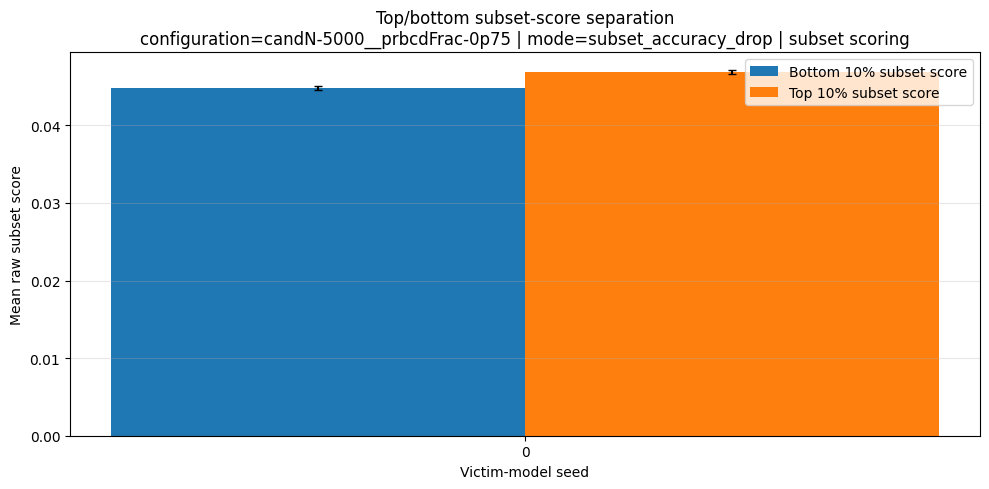


2. Set-level organization of the two comparison groups
These summaries compare the two complete edge sets. Endpoint-hit mechanism metrics are shown only when they
contain data; they are undefined for subset scoring because subset mining does not produce one individually
perturbed prediction per candidate edge.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,seed,label_group,label_name,n_candidate_edges,candidate_fraction,score_raw_mean,score_raw_min,score_raw_max,score_percentile_mean,inclusion_count_mean,addition_fraction,deletion_fraction,prbcd_derived_fraction,same_true_label_fraction,same_clean_prediction_fraction,both_clean_correct_fraction,neither_clean_correct_fraction,both_hit_fraction,exactly_one_hit_fraction,partner_label_adoption_fraction,full_graph_fallback_fraction,n_unique_endpoint_nodes,endpoint_node_coverage,mean_candidate_incidence_active_node,max_candidate_incidence,candidate_incidence_gini,candidate_incidence_hhi,top_1pct_endpoint_share,top_5pct_endpoint_share,top_10pct_endpoint_share,candidate_pair_network_density,candidate_pair_network_components,candidate_pair_network_largest_component_fraction,candidate_pair_network_average_clustering,candidate_pair_network_transitivity
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,bottom_10%_subset_score,500,0.5,0.044834,0.043508,0.045108,0.04991,48.446,0.996,0.004,0.676,0.098,0.174,0.730,0.014,NaN,NaN,NaN,NaN,760,0.270463,1.315789,10.0,0.198134,0.001728,0.045,0.136,0.220,0.001734,260,0.028947,0.0,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,1,top_10%_subset_score,500,0.5,0.046833,0.046547,0.047974,0.95009,48.998,0.994,0.006,0.842,0.058,0.086,0.804,0.010,NaN,NaN,NaN,NaN,732,0.260498,1.366120,8.0,0.218456,0.001836,0.047,0.149,0.233,0.001869,232,0.051913,0.0,0.0



----------------------------------------------------------------------------------------------------------------
Candidate composition
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bars are means across
victim seeds and error bars are ±1 SD. Only the equal-sized top and bottom 10% of observed raw subset scores are
compared within each mining run. The middle candidates are excluded. The score is the mean harmful accuracy drop
among sampled subsets containing the edge; it is an edge-associated subset score, not an individual causal
effect.


,metric,metric_display,label_group,group_name,mean,sd,sem,n_seeds
0,candidate_fraction,candidate fraction,0,Bottom 10% subset score,0.500,0.0,0.0,1
1,candidate_fraction,candidate fraction,1,Top 10% subset score,0.500,0.0,0.0,1
2,addition_fraction,addition fraction,0,Bottom 10% subset score,0.996,0.0,0.0,1
3,addition_fraction,addition fraction,1,Top 10% subset score,0.994,0.0,0.0,1
4,deletion_fraction,deletion fraction,0,Bottom 10% subset score,0.004,0.0,0.0,1
5,deletion_fraction,deletion fraction,1,Top 10% subset score,0.006,0.0,0.0,1
6,prbcd_derived_fraction,PRBCD derived fraction,0,Bottom 10% subset score,0.676,0.0,0.0,1
7,prbcd_derived_fraction,PRBCD derived fraction,1,Top 10% subset score,0.842,0.0,0.0,1


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/02_set_Candidate_composition__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


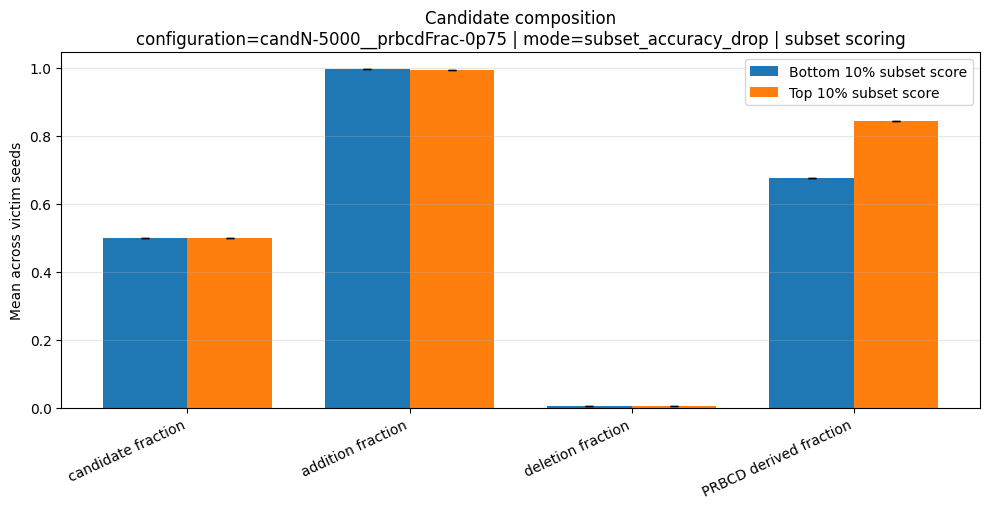


----------------------------------------------------------------------------------------------------------------
Clean endpoint state
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bars are means across
victim seeds and error bars are ±1 SD. Only the equal-sized top and bottom 10% of observed raw subset scores are
compared within each mining run. The middle candidates are excluded. The score is the mean harmful accuracy drop
among sampled subsets containing the edge; it is an edge-associated subset score, not an individual causal
effect.


,metric,metric_display,label_group,group_name,mean,sd,sem,n_seeds
0,same_true_label_fraction,same true label fraction,0,Bottom 10% subset score,0.098,0.0,0.0,1
1,same_true_label_fraction,same true label fraction,1,Top 10% subset score,0.058,0.0,0.0,1
2,same_clean_prediction_fraction,same clean prediction fraction,0,Bottom 10% subset score,0.174,0.0,0.0,1
3,same_clean_prediction_fraction,same clean prediction fraction,1,Top 10% subset score,0.086,0.0,0.0,1
4,both_clean_correct_fraction,both clean correct fraction,0,Bottom 10% subset score,0.730,0.0,0.0,1
5,both_clean_correct_fraction,both clean correct fraction,1,Top 10% subset score,0.804,0.0,0.0,1
6,neither_clean_correct_fraction,neither clean correct fraction,0,Bottom 10% subset score,0.014,0.0,0.0,1
7,neither_clean_correct_fraction,neither clean correct fraction,1,Top 10% subset score,0.010,0.0,0.0,1


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/02_set_Clean_endpoint_state__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


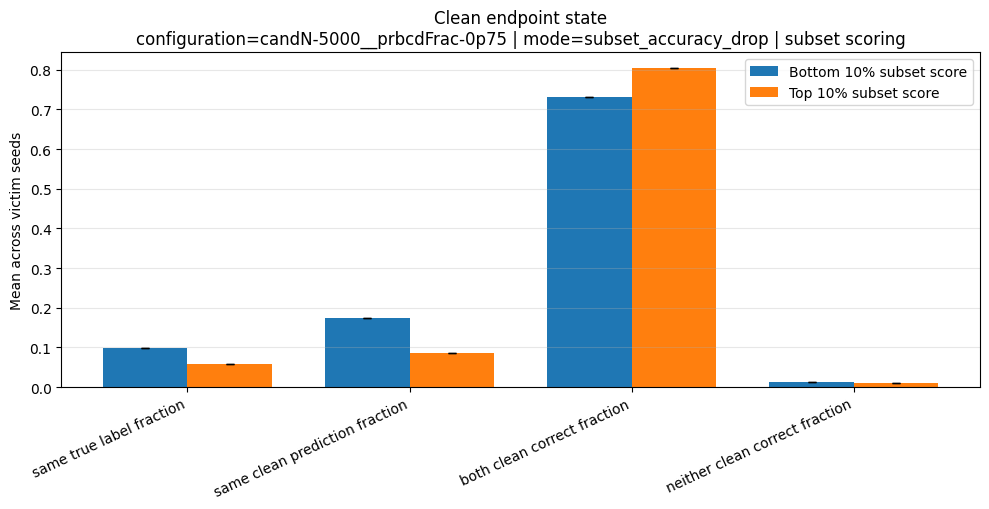


----------------------------------------------------------------------------------------------------------------
Endpoint-node coverage and concentration
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bars are means across
victim seeds and error bars are ±1 SD. Only the equal-sized top and bottom 10% of observed raw subset scores are
compared within each mining run. The middle candidates are excluded. The score is the mean harmful accuracy drop
among sampled subsets containing the edge; it is an edge-associated subset score, not an individual causal
effect.


,metric,metric_display,label_group,group_name,mean,sd,sem,n_seeds
0,endpoint_node_coverage,endpoint node coverage,0,Bottom 10% subset score,0.270463,0.0,0.0,1
1,endpoint_node_coverage,endpoint node coverage,1,Top 10% subset score,0.260498,0.0,0.0,1
2,candidate_incidence_gini,candidate incidence gini,0,Bottom 10% subset score,0.198134,0.0,0.0,1
3,candidate_incidence_gini,candidate incidence gini,1,Top 10% subset score,0.218456,0.0,0.0,1
4,candidate_incidence_hhi,candidate incidence HHI,0,Bottom 10% subset score,0.001728,0.0,0.0,1
5,candidate_incidence_hhi,candidate incidence HHI,1,Top 10% subset score,0.001836,0.0,0.0,1
6,top_1pct_endpoint_share,top 1pct endpoint share,0,Bottom 10% subset score,0.045000,0.0,0.0,1
7,top_1pct_endpoint_share,top 1pct endpoint share,1,Top 10% subset score,0.047000,0.0,0.0,1
8,top_5pct_endpoint_share,top 5pct endpoint share,0,Bottom 10% subset score,0.136000,0.0,0.0,1
9,top_5pct_endpoint_share,top 5pct endpoint share,1,Top 10% subset score,0.149000,0.0,0.0,1


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/02_set_Endpoint-node_coverage_and_concentration__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


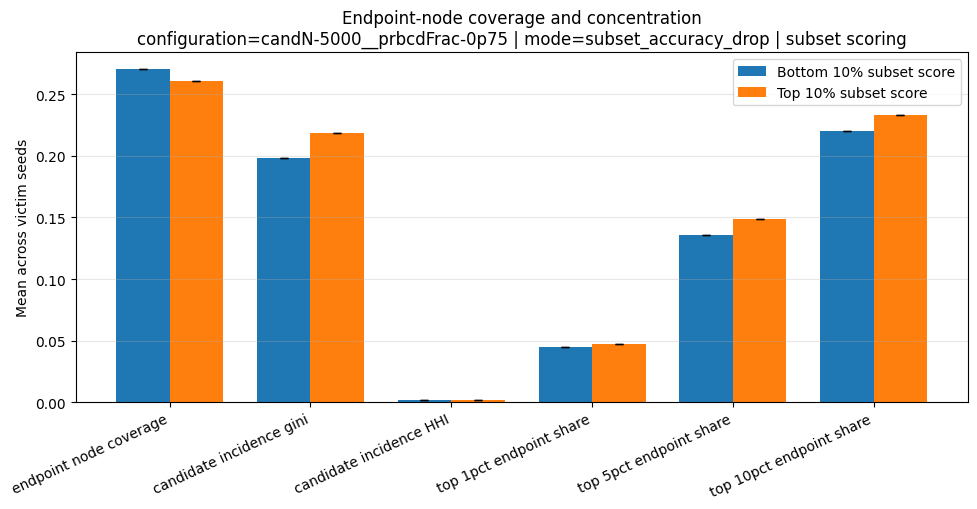


----------------------------------------------------------------------------------------------------------------
Candidate-pair network
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bars are means across
victim seeds and error bars are ±1 SD. Only the equal-sized top and bottom 10% of observed raw subset scores are
compared within each mining run. The middle candidates are excluded. The score is the mean harmful accuracy drop
among sampled subsets containing the edge; it is an edge-associated subset score, not an individual causal
effect.


,metric,metric_display,label_group,group_name,mean,sd,sem,n_seeds
0,candidate_pair_network_density,candidate endpoint-pair network density,0,Bottom 10% subset score,0.001734,0.0,0.0,1
1,candidate_pair_network_density,candidate endpoint-pair network density,1,Top 10% subset score,0.001869,0.0,0.0,1
2,candidate_pair_network_largest_component_fraction,candidate endpoint-pair network largest compon...,0,Bottom 10% subset score,0.028947,0.0,0.0,1
3,candidate_pair_network_largest_component_fraction,candidate endpoint-pair network largest compon...,1,Top 10% subset score,0.051913,0.0,0.0,1
4,candidate_pair_network_average_clustering,candidate endpoint-pair network average cluste...,0,Bottom 10% subset score,0.000000,0.0,0.0,1
5,candidate_pair_network_average_clustering,candidate endpoint-pair network average cluste...,1,Top 10% subset score,0.000000,0.0,0.0,1
6,candidate_pair_network_transitivity,candidate endpoint-pair network transitivity,0,Bottom 10% subset score,0.000000,0.0,0.0,1
7,candidate_pair_network_transitivity,candidate endpoint-pair network transitivity,1,Top 10% subset score,0.000000,0.0,0.0,1


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/02_set_Candidate-pair_network__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


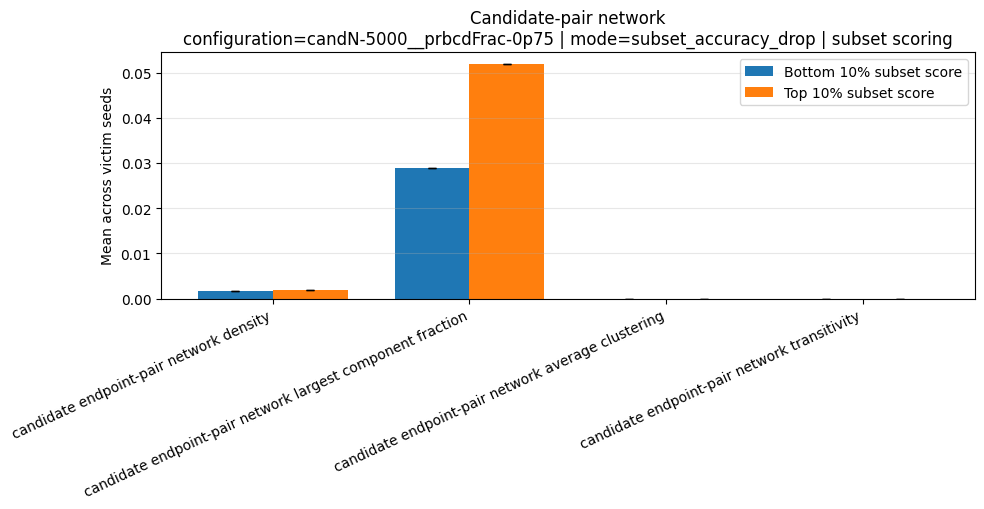


3. Candidate source and flip action
For endpoint mode, the conditional group-1 rate is the endpoint-harmful yield. For subset mode, it is the
fraction of selected extreme candidates belonging to the top-score group rather than the bottom-score group.
Because subset groups are balanced overall, values above 0.5 indicate enrichment in the top-score extreme.

----------------------------------------------------------------------------------------------------------------
Group-1 rate by candidate source and action
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. A higher bar means that
the source/action stratum contains a larger proportion of Top 10% subset score edges.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,candidate_source,action,n_seeds,n_candidates_mean,group_1_rate_mean,group_1_rate_sd,category
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,random_candidate,add,1,239.0,0.326360,0.0,random_candidate | add
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,random_candidate,delete,1,2.0,0.500000,0.0,random_candidate | delete
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,prbcd_derived,add,1,756.0,0.554233,0.0,prbcd_derived | add
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,prbcd_derived,delete,1,3.0,0.666667,0.0,prbcd_derived | delete


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/03_source_action_rate__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


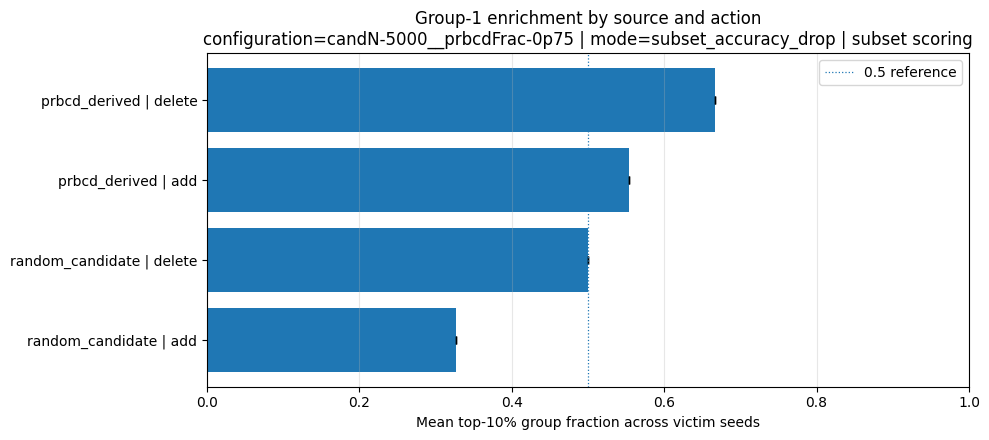


4. Numeric graph-statistic differences
Hedges' g standardizes group 1 minus group 0. Positive values mean the feature is larger in group 1; negative
values mean it is smaller. For endpoint mode this is endpoint label 1 minus label 0. For subset mode this is
top-score minus bottom-score. The score variables used to create subset groups were excluded from these feature
tests.

----------------------------------------------------------------------------------------------------------------
Complete numeric comparison table
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. The table is sorted by
absolute standardized difference. Direction consistency is the fraction of seeds agreeing with the majority
sign.


,feature,group_1_mean,group_0_mean,mean_difference,hedges_g_mean,hedges_g_sd,direction,effect_magnitude,direction_consistency,mann_whitney_fdr_significant_fraction,n_seeds
42,pair_clean_entropy_absdiff,7.266669e-01,6.044078e-01,1.222591e-01,0.273159,0.0,higher in top 10%,small,1.0,1.0,1
36,pair_clean_confidence_absdiff,2.851593e-01,2.332125e-01,5.194682e-02,0.272133,0.0,higher in top 10%,small,1.0,1.0,1
130,same_clean_prediction,8.600000e-02,1.740000e-01,-8.800000e-02,-0.263475,0.0,lower in top 10%,small,1.0,1.0,1
65,pair_closeness_sum,3.720827e-01,3.841665e-01,-1.208384e-02,-0.259505,0.0,lower in top 10%,small,1.0,1.0,1
62,pair_closeness_mean,1.860413e-01,1.920833e-01,-6.041921e-03,-0.259505,0.0,lower in top 10%,small,1.0,1.0,1
64,pair_closeness_product,3.469604e-02,3.699921e-02,-2.303169e-03,-0.258192,0.0,lower in top 10%,small,1.0,1.0,1
127,preferential_attachment,1.165400e+01,2.166400e+01,-1.001000e+01,-0.254608,0.0,lower in top 10%,small,1.0,0.0,1
88,pair_degree_product,1.165400e+01,2.166400e+01,-1.001000e+01,-0.254608,0.0,lower in top 10%,small,1.0,0.0,1
61,pair_closeness_max,2.026816e-01,2.083794e-01,-5.697853e-03,-0.247985,0.0,lower in top 10%,small,1.0,1.0,1
48,pair_clean_margin_absdiff,4.182798e-01,3.487282e-01,6.955162e-02,0.247388,0.0,higher in top 10%,small,1.0,1.0,1



Largest numeric differences with contextual interpretation:
- endpoint-pair clean entropy absdiff: g=0.273 (small; higher in top 10%), group-1 mean=0.7267, group-0 mean=0.6044, seed direction consistency=1.00.
- endpoint-pair clean confidence absdiff: g=0.272 (small; higher in top 10%), group-1 mean=0.2852, group-0 mean=0.2332, seed direction consistency=1.00.
- same clean prediction: g=-0.263 (small; lower in top 10%), group-1 mean=0.086, group-0 mean=0.174, seed direction consistency=1.00.
- endpoint-pair closeness sum: g=-0.260 (small; lower in top 10%), group-1 mean=0.3721, group-0 mean=0.3842, seed direction consistency=1.00.
- endpoint-pair closeness mean: g=-0.260 (small; lower in top 10%), group-1 mean=0.186, group-0 mean=0.1921, seed direction consistency=1.00.
- endpoint-pair closeness product: g=-0.258 (small; lower in top 10%), group-1 mean=0.0347, group-0 mean=0.037, seed direction consistency=1.00.
- preferential attachment: g=-0.255 (small; lower in top 10%), group-1 me

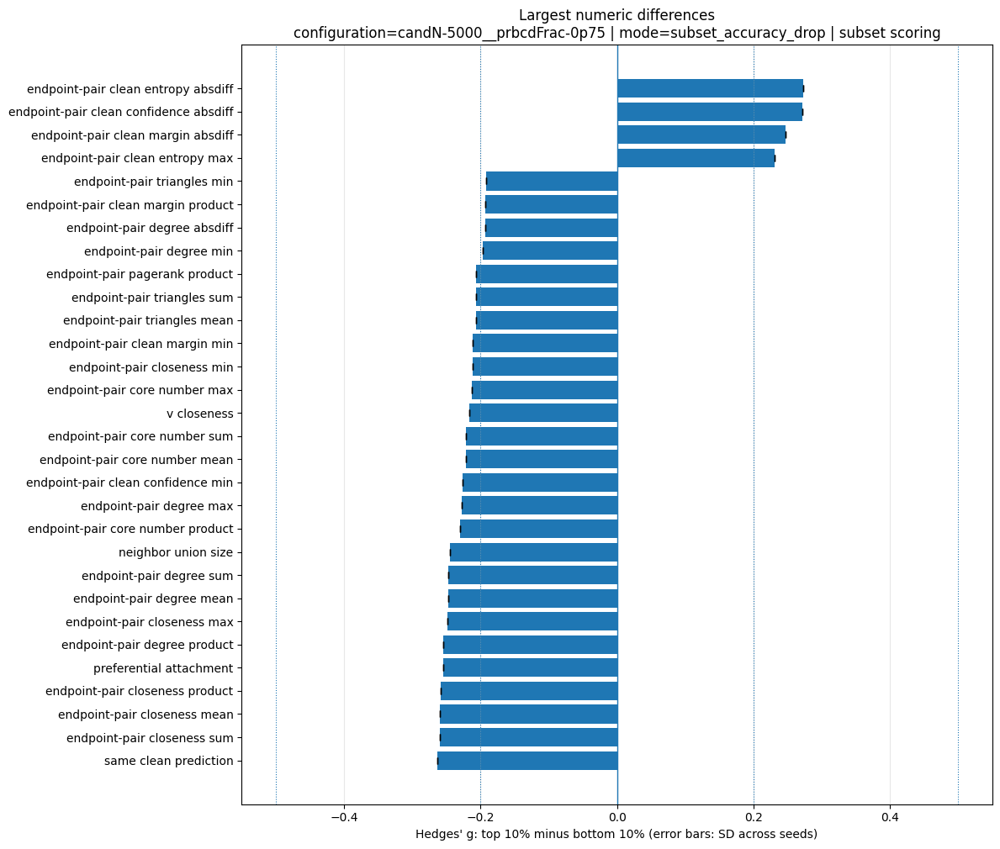


----------------------------------------------------------------------------------------------------------------
All numeric effects — page 1
----------------------------------------------------------------------------------------------------------------
Features 1–32 after sorting by absolute Hedges' g.


,feature,group_1_mean,group_0_mean,mean_difference,hedges_g_mean,hedges_g_sd,direction,effect_magnitude,direction_consistency,mann_whitney_fdr_significant_fraction,n_seeds
130,same_clean_prediction,8.600000e-02,1.740000e-01,-8.800000e-02,-0.263475,0.0,lower in top 10%,small,1.0,1.0,1
65,pair_closeness_sum,3.720827e-01,3.841665e-01,-1.208384e-02,-0.259505,0.0,lower in top 10%,small,1.0,1.0,1
62,pair_closeness_mean,1.860413e-01,1.920833e-01,-6.041921e-03,-0.259505,0.0,lower in top 10%,small,1.0,1.0,1
64,pair_closeness_product,3.469604e-02,3.699921e-02,-2.303169e-03,-0.258192,0.0,lower in top 10%,small,1.0,1.0,1
127,preferential_attachment,1.165400e+01,2.166400e+01,-1.001000e+01,-0.254608,0.0,lower in top 10%,small,1.0,0.0,1
88,pair_degree_product,1.165400e+01,2.166400e+01,-1.001000e+01,-0.254608,0.0,lower in top 10%,small,1.0,0.0,1
61,pair_closeness_max,2.026816e-01,2.083794e-01,-5.697853e-03,-0.247985,0.0,lower in top 10%,small,1.0,1.0,1
86,pair_degree_mean,3.349000e+00,4.341000e+00,-9.920000e-01,-0.246601,0.0,lower in top 10%,small,1.0,0.0,1
89,pair_degree_sum,6.698000e+00,8.682000e+00,-1.984000e+00,-0.246601,0.0,lower in top 10%,small,1.0,0.0,1
22,neighbor_union_size,6.652000e+00,8.610000e+00,-1.958000e+00,-0.244374,0.0,lower in top 10%,small,1.0,0.0,1


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/04_all_numeric_effects_page-1__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


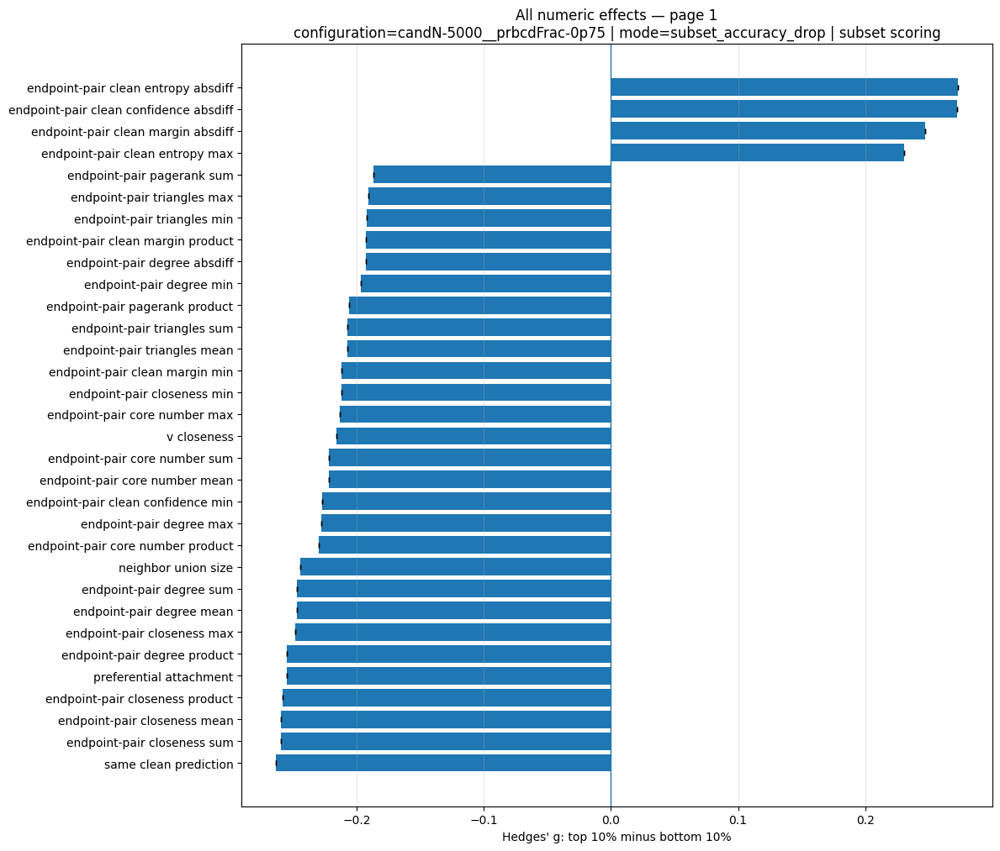


----------------------------------------------------------------------------------------------------------------
All numeric effects — page 2
----------------------------------------------------------------------------------------------------------------
Features 33–64 after sorting by absolute Hedges' g.


,feature,group_1_mean,group_0_mean,mean_difference,hedges_g_mean,hedges_g_sd,direction,effect_magnitude,direction_consistency,mann_whitney_fdr_significant_fraction,n_seeds
116,pair_pagerank_mean,0.000257,0.000293,-0.000035,-0.186726,0.0,lower in top 10%,negligible,1.0,0.0,1
124,pair_triangles_product,4.338000,23.028000,-18.690000,-0.186299,0.0,lower in top 10%,negligible,1.0,0.0,1
40,pair_clean_confidence_product,0.578971,0.619244,-0.040273,-0.185939,0.0,lower in top 10%,negligible,1.0,1.0,1
163,v_core_number,2.356000,2.630000,-0.274000,-0.184525,0.0,lower in top 10%,negligible,1.0,0.0,1
164,v_degree,3.250000,4.358000,-1.108000,-0.183563,0.0,lower in top 10%,negligible,1.0,0.0,1
95,pair_eigenvector_sum,0.006028,0.009791,-0.003763,-0.182321,0.0,lower in top 10%,negligible,1.0,1.0,1
92,pair_eigenvector_mean,0.003014,0.004896,-0.001882,-0.182321,0.0,lower in top 10%,negligible,1.0,1.0,1
115,pair_pagerank_max,0.000338,0.000398,-0.000060,-0.179978,0.0,lower in top 10%,negligible,1.0,0.0,1
146,u_degree,3.448000,4.324000,-0.876000,-0.175148,0.0,lower in top 10%,negligible,1.0,0.0,1
91,pair_eigenvector_max,0.005497,0.008906,-0.003409,-0.171808,0.0,lower in top 10%,negligible,1.0,1.0,1


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/04_all_numeric_effects_page-2__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


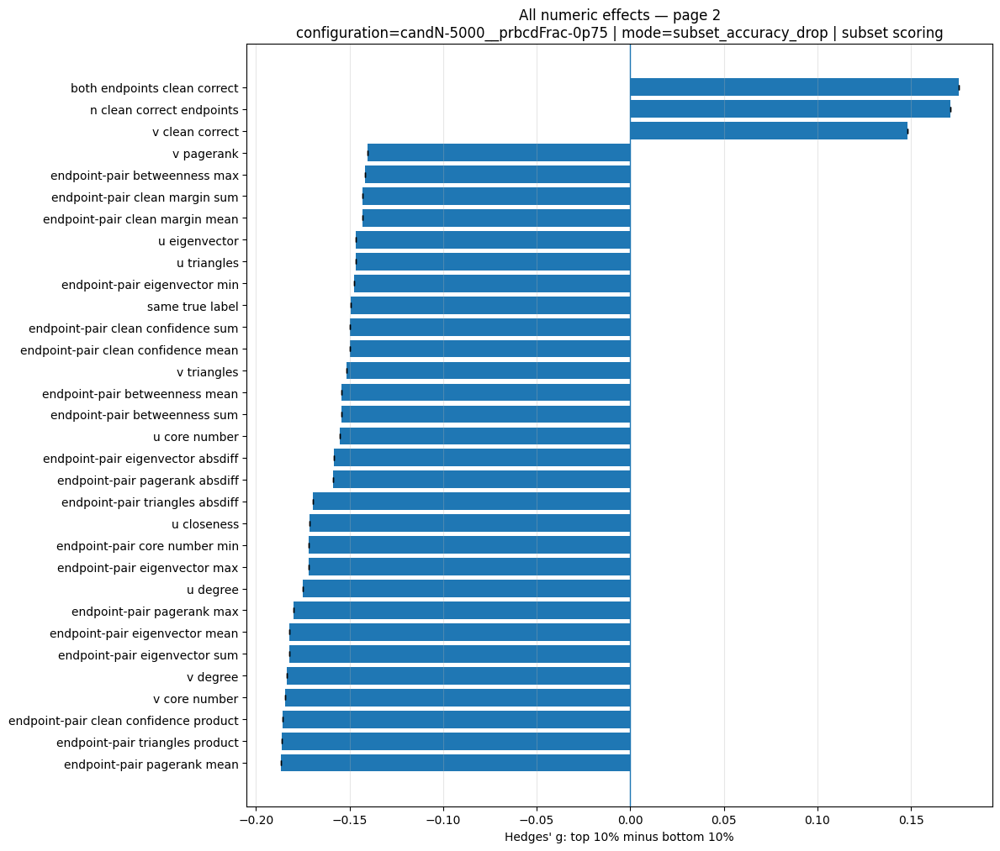


----------------------------------------------------------------------------------------------------------------
All numeric effects — page 3
----------------------------------------------------------------------------------------------------------------
Features 65–96 after sorting by absolute Hedges' g.


,feature,group_1_mean,group_0_mean,mean_difference,hedges_g_mean,hedges_g_sd,direction,effect_magnitude,direction_consistency,mann_whitney_fdr_significant_fraction,n_seeds
135,u_betweenness,7.123138e-04,0.001073,-0.000360,-0.136897,0.0,lower in top 10%,negligible,1.0,0.0,1
151,u_pagerank,2.560036e-04,0.000287,-0.000031,-0.130337,0.0,lower in top 10%,negligible,1.0,0.0,1
27,pair_betweenness_min,1.385497e-04,0.000228,-0.000089,-0.129106,0.0,lower in top 10%,negligible,1.0,0.0,1
24,pair_betweenness_absdiff,1.228936e-03,0.001727,-0.000498,-0.124126,0.0,lower in top 10%,negligible,1.0,0.0,1
13,has_two_hop_path,4.000000e-02,0.068000,-0.028000,-0.123905,0.0,lower in top 10%,negligible,1.0,0.0,1
28,pair_betweenness_product,4.710987e-07,0.000002,-0.000001,-0.118294,0.0,lower in top 10%,negligible,1.0,0.0,1
117,pair_pagerank_min,1.763288e-04,0.000187,-0.000011,-0.117374,0.0,lower in top 10%,negligible,1.0,0.0,1
78,pair_core_number_absdiff,1.360000e+00,1.514000,-0.154000,-0.117283,0.0,lower in top 10%,negligible,1.0,0.0,1
17,inverse_shortest_path,2.107647e-01,0.223285,-0.012520,-0.117100,0.0,lower in top 10%,negligible,1.0,0.0,1
165,v_eigenvector,1.878366e-03,0.003560,-0.001682,-0.114254,0.0,lower in top 10%,negligible,1.0,1.0,1


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/04_all_numeric_effects_page-3__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


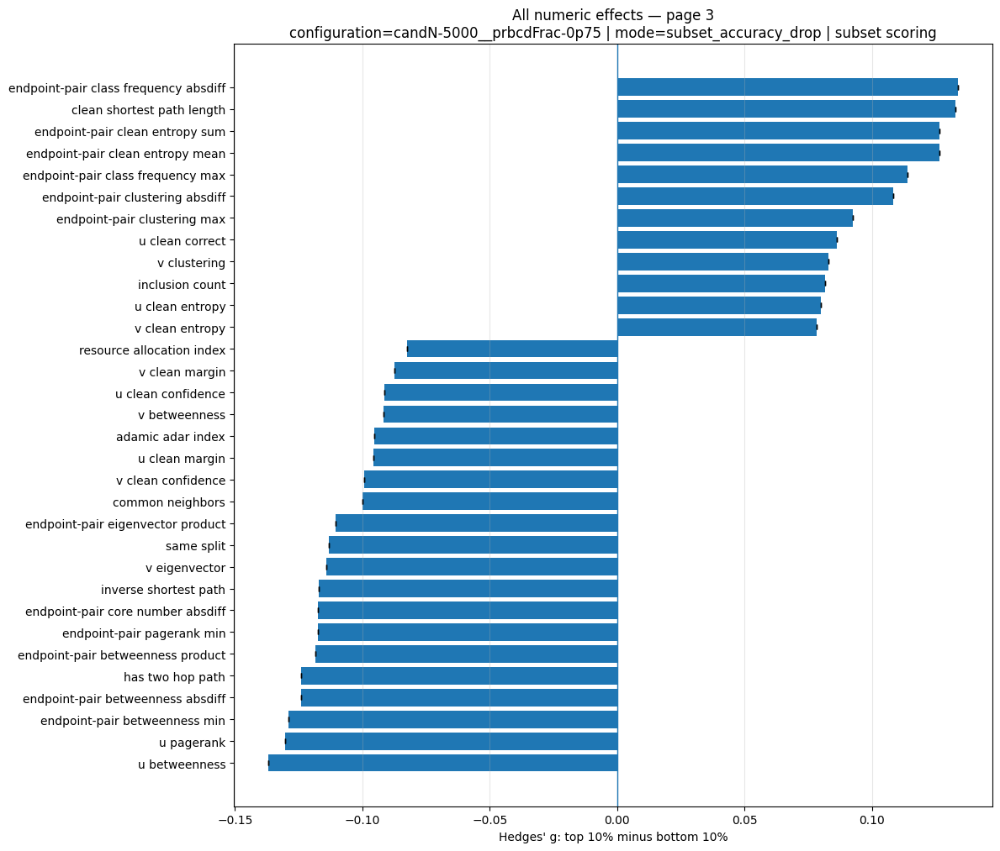


----------------------------------------------------------------------------------------------------------------
All numeric effects — page 4
----------------------------------------------------------------------------------------------------------------
Features 97–128 after sorting by absolute Hedges' g.


,feature,group_1_mean,group_0_mean,mean_difference,hedges_g_mean,hedges_g_sd,direction,effect_magnitude,direction_consistency,mann_whitney_fdr_significant_fraction,n_seeds
57,pair_clean_true_probability_min,0.561951,0.580737,-1.878562e-02,-0.067353,0.0,lower in top 10%,negligible,1.0,0.0,1
159,v_clean_true_probability,0.696964,0.715045,-1.808071e-02,-0.063740,0.0,lower in top 10%,negligible,1.0,0.0,1
103,pair_feature_norm_l1_max,6.673502,6.737377,-6.387506e-02,-0.063300,0.0,lower in top 10%,negligible,1.0,0.0,1
18,is_clean_bridge,0.000000,0.002000,-2.000000e-03,-0.063198,0.0,lower in top 10%,negligible,1.0,0.0,1
45,pair_clean_entropy_min,0.363026,0.383796,-2.076988e-02,-0.062427,0.0,lower in top 10%,negligible,1.0,0.0,1
58,pair_clean_true_probability_product,0.521075,0.537351,-1.627587e-02,-0.058142,0.0,lower in top 10%,negligible,1.0,0.0,1
8,feature_l1_distance,11.417753,11.513587,-9.583397e-02,-0.056270,0.0,lower in top 10%,negligible,1.0,0.0,1
56,pair_clean_true_probability_mean,0.728746,0.738548,-9.802172e-03,-0.054011,0.0,lower in top 10%,negligible,1.0,0.0,1
59,pair_clean_true_probability_sum,1.457491,1.477096,-1.960434e-02,-0.054011,0.0,lower in top 10%,negligible,1.0,0.0,1
134,sorensen_index,0.011048,0.014591,-3.542256e-03,-0.051505,0.0,lower in top 10%,negligible,1.0,0.0,1


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/04_all_numeric_effects_page-4__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


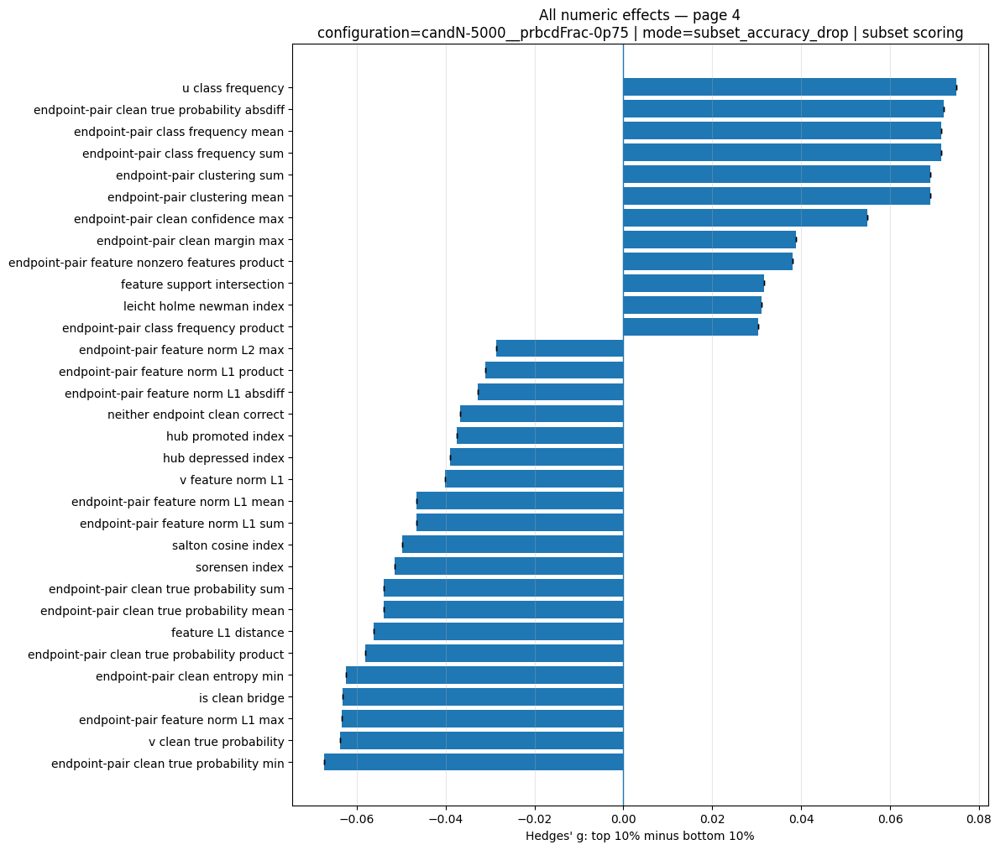


----------------------------------------------------------------------------------------------------------------
All numeric effects — page 5
----------------------------------------------------------------------------------------------------------------
Features 129–160 after sorting by absolute Hedges' g.


,feature,group_1_mean,group_0_mean,mean_difference,hedges_g_mean,hedges_g_sd,direction,effect_magnitude,direction_consistency,mann_whitney_fdr_significant_fraction,n_seeds
33,pair_class_frequency_min,3.771540e+02,3.801560e+02,-3.002000e+00,-0.026296,0.0,lower in top 10%,negligible,1.0,0.0,1
149,u_feature_norm_l1,5.982383e+00,6.012978e+00,-3.059559e-02,-0.024115,0.0,lower in top 10%,negligible,1.0,0.0,1
105,pair_feature_norm_l1_min,5.228940e+00,5.252141e+00,-2.320088e-02,-0.018914,0.0,lower in top 10%,negligible,1.0,0.0,1
69,pair_clustering_min,6.791679e-02,7.056699e-02,-2.650194e-03,-0.016992,0.0,lower in top 10%,negligible,1.0,0.0,1
11,feature_support_jaccard,3.330651e-02,3.363045e-02,-3.239357e-04,-0.013714,0.0,lower in top 10%,negligible,1.0,0.0,1
9,feature_l2_distance,1.388007e+00,1.388371e+00,-3.646333e-04,-0.012879,0.0,lower in top 10%,negligible,1.0,0.0,1
110,pair_feature_norm_l2_mean,1.000000e+00,1.000000e+00,-1.788140e-10,-0.012234,0.0,lower in top 10%,negligible,1.0,0.0,1
113,pair_feature_norm_l2_sum,2.000000e+00,2.000000e+00,-3.576279e-10,-0.012234,0.0,lower in top 10%,negligible,1.0,0.0,1
112,pair_feature_norm_l2_product,1.000000e+00,1.000000e+00,-3.576278e-10,-0.012234,0.0,lower in top 10%,negligible,1.0,0.0,1
150,u_feature_norm_l2,1.000000e+00,1.000000e+00,-2.384186e-10,-0.011455,0.0,lower in top 10%,negligible,1.0,0.0,1


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/04_all_numeric_effects_page-5__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


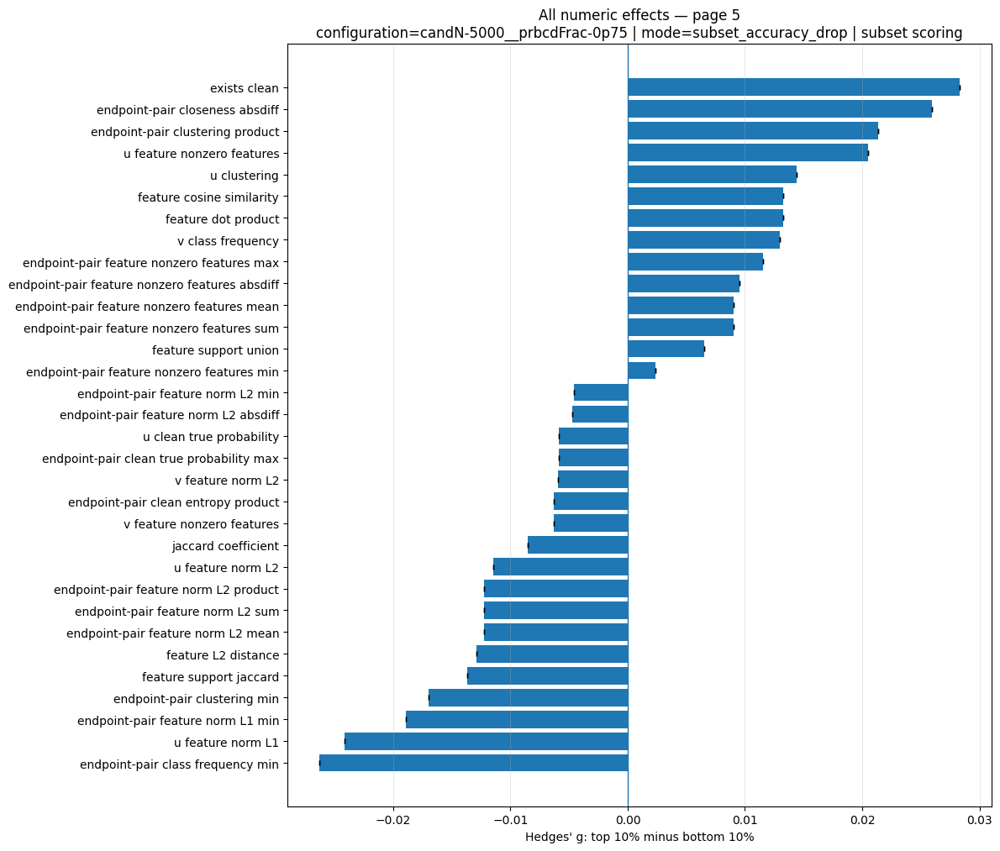


----------------------------------------------------------------------------------------------------------------
All numeric effects — page 6
----------------------------------------------------------------------------------------------------------------
Features 161–171 after sorting by absolute Hedges' g.


,feature,group_1_mean,group_0_mean,mean_difference,hedges_g_mean,hedges_g_sd,direction,effect_magnitude,direction_consistency,mann_whitney_fdr_significant_fraction,n_seeds
0,actual_prbcd_fraction,0.75,0.75,0.0,0.0,0.0,no difference,negligible,1.0,0.0,1
73,pair_component_size_max,2810.00,2810.00,0.0,0.0,0.0,no difference,negligible,1.0,0.0,1
72,pair_component_size_absdiff,0.00,0.00,0.0,0.0,0.0,no difference,negligible,1.0,0.0,1
77,pair_component_size_sum,5620.00,5620.00,0.0,0.0,0.0,no difference,negligible,1.0,0.0,1
76,pair_component_size_product,7896100.00,7896100.00,0.0,0.0,0.0,no difference,negligible,1.0,0.0,1
75,pair_component_size_min,2810.00,2810.00,0.0,0.0,0.0,no difference,negligible,1.0,0.0,1
74,pair_component_size_mean,2810.00,2810.00,0.0,0.0,0.0,no difference,negligible,1.0,0.0,1
131,same_connected_component,1.00,1.00,0.0,0.0,0.0,no difference,negligible,1.0,0.0,1
126,prbcd_candidate_fraction,0.75,0.75,0.0,0.0,0.0,no difference,negligible,1.0,0.0,1
144,u_component_size,2810.00,2810.00,0.0,0.0,0.0,no difference,negligible,1.0,0.0,1


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/04_all_numeric_effects_page-6__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


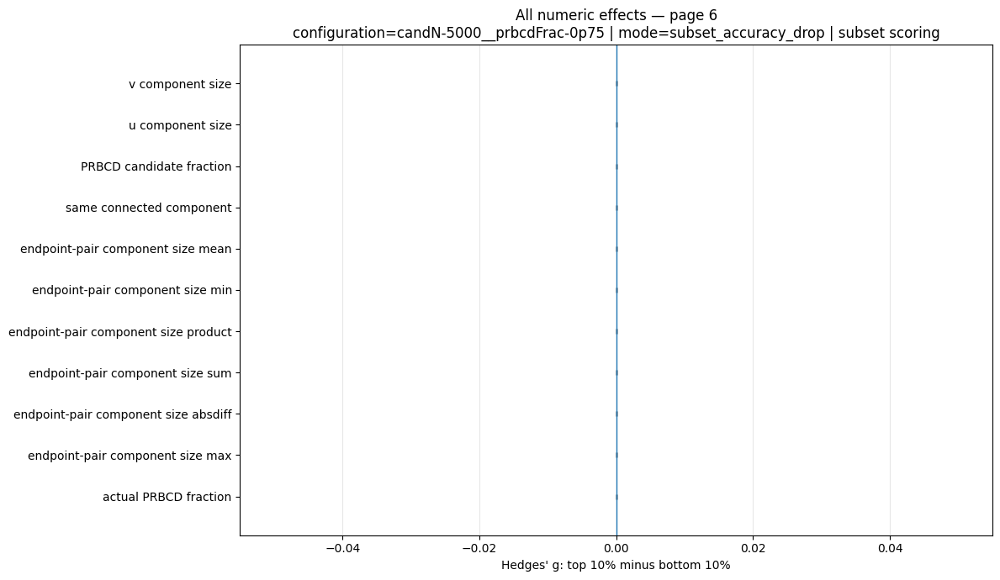


5. Stability of numeric effects across victim seeds
The heatmaps show Hedges' g separately for every seed. A feature is more robust when its sign and approximate
magnitude remain consistent across seeds.

----------------------------------------------------------------------------------------------------------------
Seed-by-feature Hedges' g matrix
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Rows are ordered by
absolute mean effect.


seed,feature,0
0,pair_clean_entropy_absdiff,0.273159
1,pair_clean_confidence_absdiff,0.272133
2,same_clean_prediction,-0.263475
3,pair_closeness_mean,-0.259505
4,pair_closeness_sum,-0.259505
5,pair_closeness_product,-0.258192
6,pair_degree_product,-0.254608
7,preferential_attachment,-0.254608
8,pair_closeness_max,-0.247985
9,pair_clean_margin_absdiff,0.247388


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/05_numeric_seed_stability__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


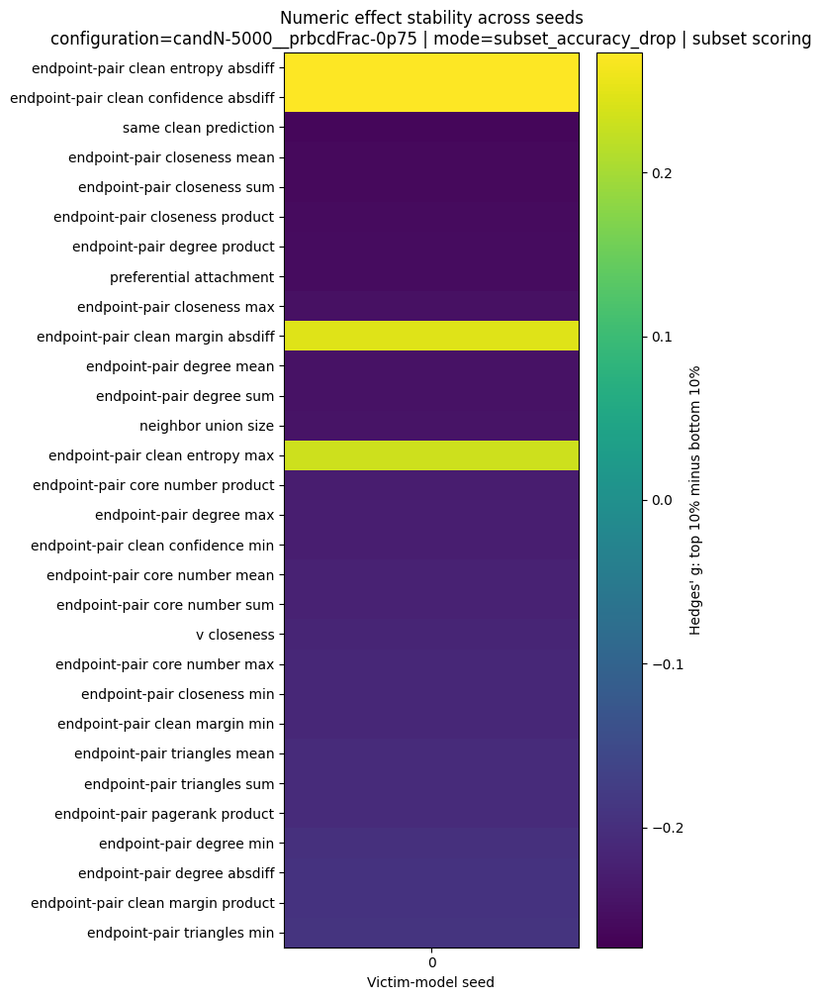


6. Raw distributions of the strongest numeric differences
These boxplots show the raw feature distributions for group 0 and group 1. They expose skewness, zero inflation,
and outliers that can be hidden by a single effect-size summary.

----------------------------------------------------------------------------------------------------------------
Distribution: endpoint-pair clean entropy absdiff
----------------------------------------------------------------------------------------------------------------
endpoint-pair clean entropy absdiff is ranked 1 for configuration=candN-5000__prbcdFrac-0p75 |
mode=subset_accuracy_drop | subset scoring. Mean Hedges' g is 0.273.


,label_group,group_name,n,mean,sd,median,q1,q3
0,0,Bottom 10% subset score,500,0.604408,0.429645,0.505868,0.239054,0.946244
1,1,Top 10% subset score,500,0.726667,0.464166,0.671064,0.316112,1.123503


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/06_distribution_01_pair_clean_entropy_absdiff__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


/tmp/ipykernel_151421/2664281447.py:1947: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


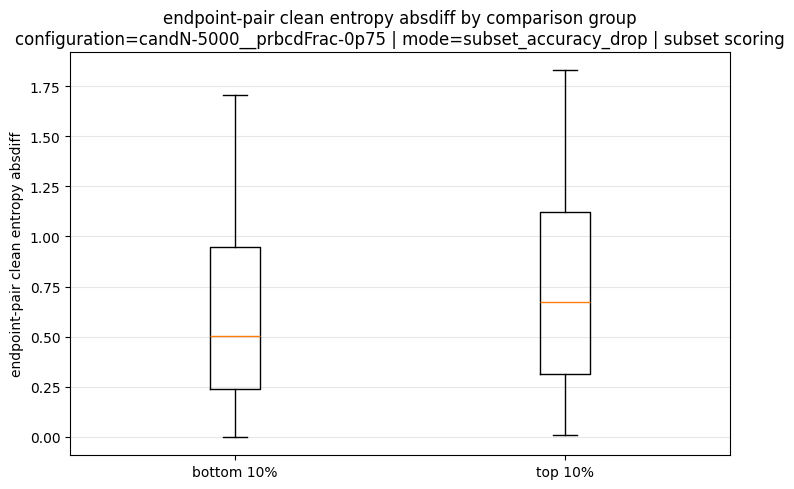


----------------------------------------------------------------------------------------------------------------
Distribution: endpoint-pair clean confidence absdiff
----------------------------------------------------------------------------------------------------------------
endpoint-pair clean confidence absdiff is ranked 2 for configuration=candN-5000__prbcdFrac-0p75 |
mode=subset_accuracy_drop | subset scoring. Mean Hedges' g is 0.272.


,label_group,group_name,n,mean,sd,median,q1,q3
0,0,Bottom 10% subset score,500,0.233213,0.184211,0.186294,0.075425,0.368681
1,1,Top 10% subset score,500,0.285159,0.197061,0.245677,0.106441,0.453862


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/06_distribution_02_pair_clean_confidence_absdiff__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


/tmp/ipykernel_151421/2664281447.py:1947: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


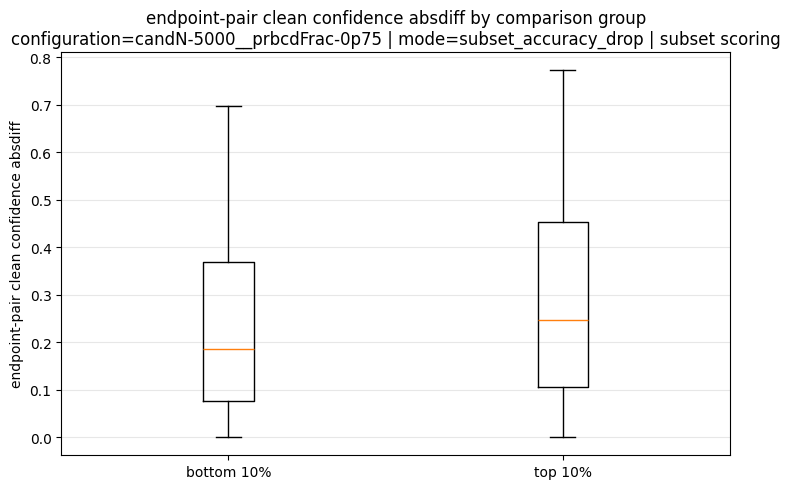


----------------------------------------------------------------------------------------------------------------
Distribution: endpoint-pair closeness sum
----------------------------------------------------------------------------------------------------------------
endpoint-pair closeness sum is ranked 3 for configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop
| subset scoring. Mean Hedges' g is -0.260.


,label_group,group_name,n,mean,sd,median,q1,q3
0,0,Bottom 10% subset score,500,0.384167,0.046766,0.387688,0.351024,0.418626
1,1,Top 10% subset score,500,0.372083,0.046293,0.375078,0.339976,0.405943


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/06_distribution_03_pair_closeness_sum__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


/tmp/ipykernel_151421/2664281447.py:1947: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


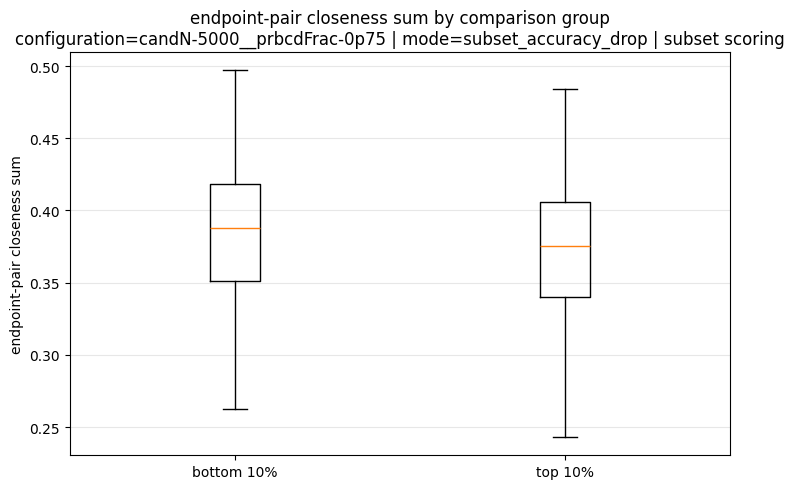


----------------------------------------------------------------------------------------------------------------
Distribution: endpoint-pair closeness mean
----------------------------------------------------------------------------------------------------------------
endpoint-pair closeness mean is ranked 4 for configuration=candN-5000__prbcdFrac-0p75 |
mode=subset_accuracy_drop | subset scoring. Mean Hedges' g is -0.260.


,label_group,group_name,n,mean,sd,median,q1,q3
0,0,Bottom 10% subset score,500,0.192083,0.023383,0.193844,0.175512,0.209313
1,1,Top 10% subset score,500,0.186041,0.023146,0.187539,0.169988,0.202971


/tmp/ipykernel_151421/2664281447.py:1947: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/06_distribution_04_pair_closeness_mean__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


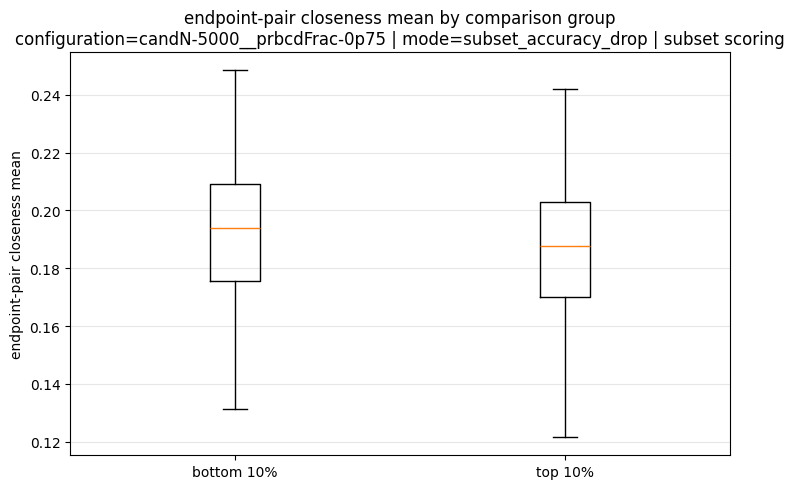


----------------------------------------------------------------------------------------------------------------
Distribution: endpoint-pair closeness product
----------------------------------------------------------------------------------------------------------------
endpoint-pair closeness product is ranked 5 for configuration=candN-5000__prbcdFrac-0p75 |
mode=subset_accuracy_drop | subset scoring. Mean Hedges' g is -0.258.


,label_group,group_name,n,mean,sd,median,q1,q3
0,0,Bottom 10% subset score,500,0.036999,0.009093,0.037171,0.030435,0.043727
1,1,Top 10% subset score,500,0.034696,0.008731,0.034664,0.028458,0.041066


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/06_distribution_05_pair_closeness_product__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


/tmp/ipykernel_151421/2664281447.py:1947: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


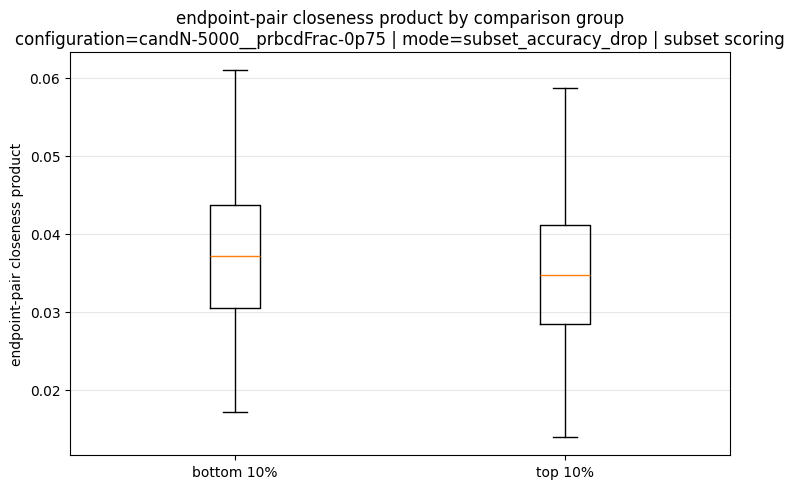


----------------------------------------------------------------------------------------------------------------
Distribution: preferential attachment
----------------------------------------------------------------------------------------------------------------
preferential attachment is ranked 6 for configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop |
subset scoring. Mean Hedges' g is -0.255.


,label_group,group_name,n,mean,sd,median,q1,q3
0,0,Bottom 10% subset score,500,21.664,52.400828,6.0,3.0,18.0
1,1,Top 10% subset score,500,11.654,18.463588,6.0,3.0,14.0


/tmp/ipykernel_151421/2664281447.py:1947: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/06_distribution_06_preferential_attachment__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


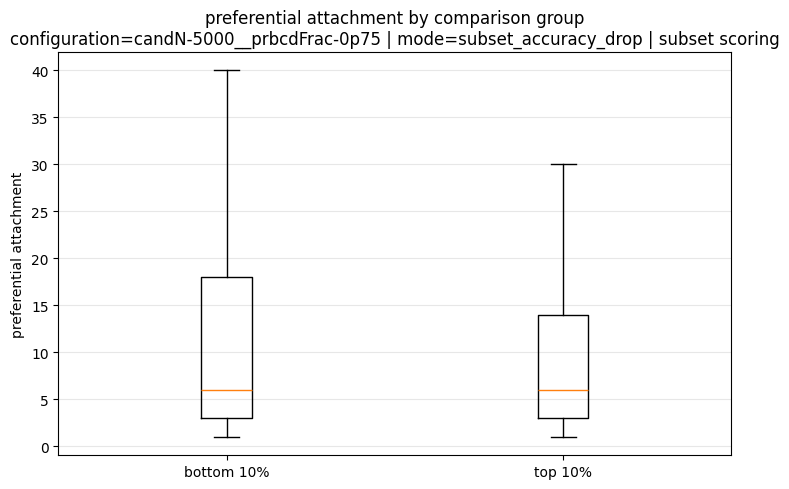


----------------------------------------------------------------------------------------------------------------
Distribution: endpoint-pair degree product
----------------------------------------------------------------------------------------------------------------
endpoint-pair degree product is ranked 7 for configuration=candN-5000__prbcdFrac-0p75 |
mode=subset_accuracy_drop | subset scoring. Mean Hedges' g is -0.255.


,label_group,group_name,n,mean,sd,median,q1,q3
0,0,Bottom 10% subset score,500,21.664,52.400828,6.0,3.0,18.0
1,1,Top 10% subset score,500,11.654,18.463588,6.0,3.0,14.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/06_distribution_07_pair_degree_product__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


/tmp/ipykernel_151421/2664281447.py:1947: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


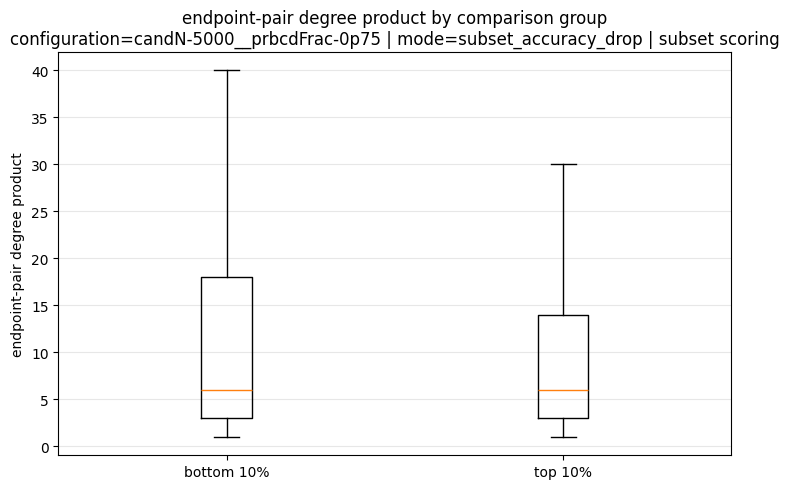


----------------------------------------------------------------------------------------------------------------
Distribution: endpoint-pair closeness max
----------------------------------------------------------------------------------------------------------------
endpoint-pair closeness max is ranked 8 for configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop
| subset scoring. Mean Hedges' g is -0.248.


,label_group,group_name,n,mean,sd,median,q1,q3
0,0,Bottom 10% subset score,500,0.208379,0.022732,0.211625,0.192082,0.226277
1,1,Top 10% subset score,500,0.202682,0.023184,0.203854,0.187467,0.222689


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/06_distribution_08_pair_closeness_max__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


/tmp/ipykernel_151421/2664281447.py:1947: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


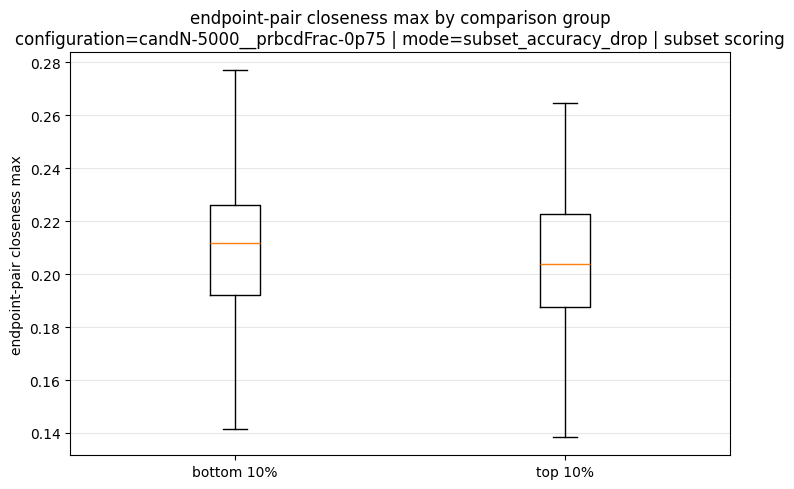


----------------------------------------------------------------------------------------------------------------
Distribution: endpoint-pair clean margin absdiff
----------------------------------------------------------------------------------------------------------------
endpoint-pair clean margin absdiff is ranked 9 for configuration=candN-5000__prbcdFrac-0p75 |
mode=subset_accuracy_drop | subset scoring. Mean Hedges' g is 0.247.


,label_group,group_name,n,mean,sd,median,q1,q3
0,0,Bottom 10% subset score,500,0.348728,0.274790,0.279271,0.117199,0.554151
1,1,Top 10% subset score,500,0.418280,0.286943,0.383510,0.153698,0.661899


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/06_distribution_09_pair_clean_margin_absdiff__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


/tmp/ipykernel_151421/2664281447.py:1947: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


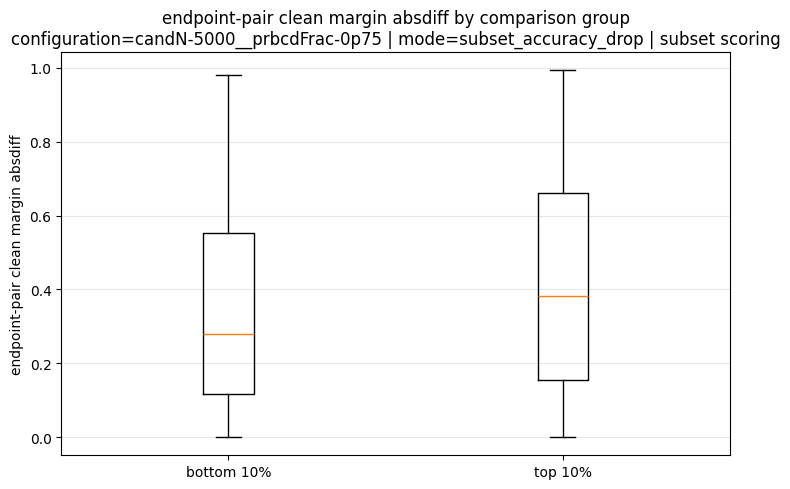


----------------------------------------------------------------------------------------------------------------
Distribution: endpoint-pair degree mean
----------------------------------------------------------------------------------------------------------------
endpoint-pair degree mean is ranked 10 for configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop
| subset scoring. Mean Hedges' g is -0.247.


,label_group,group_name,n,mean,sd,median,q1,q3
0,0,Bottom 10% subset score,500,4.341,5.216382,3.0,2.0,5.0
1,1,Top 10% subset score,500,3.349,2.259405,2.5,2.0,4.5


/tmp/ipykernel_151421/2664281447.py:1947: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/06_distribution_10_pair_degree_mean__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


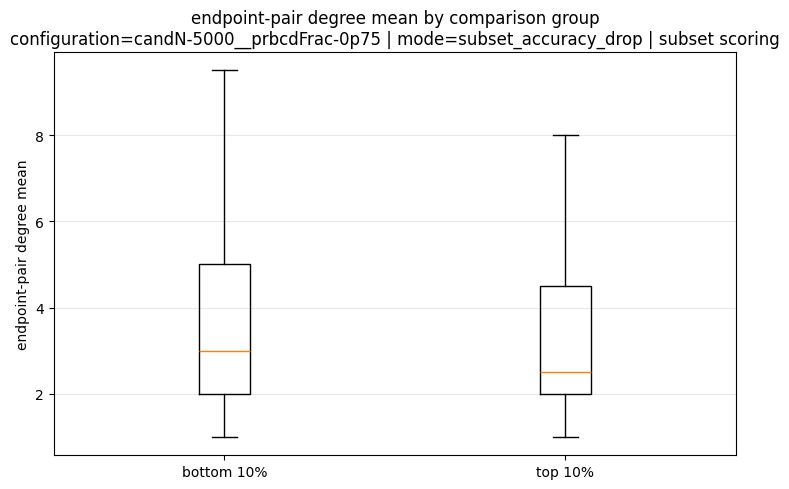


----------------------------------------------------------------------------------------------------------------
Distribution: endpoint-pair degree sum
----------------------------------------------------------------------------------------------------------------
endpoint-pair degree sum is ranked 11 for configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop |
subset scoring. Mean Hedges' g is -0.247.


,label_group,group_name,n,mean,sd,median,q1,q3
0,0,Bottom 10% subset score,500,8.682,10.432764,6.0,4.0,10.0
1,1,Top 10% subset score,500,6.698,4.518809,5.0,4.0,9.0


/tmp/ipykernel_151421/2664281447.py:1947: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/06_distribution_11_pair_degree_sum__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


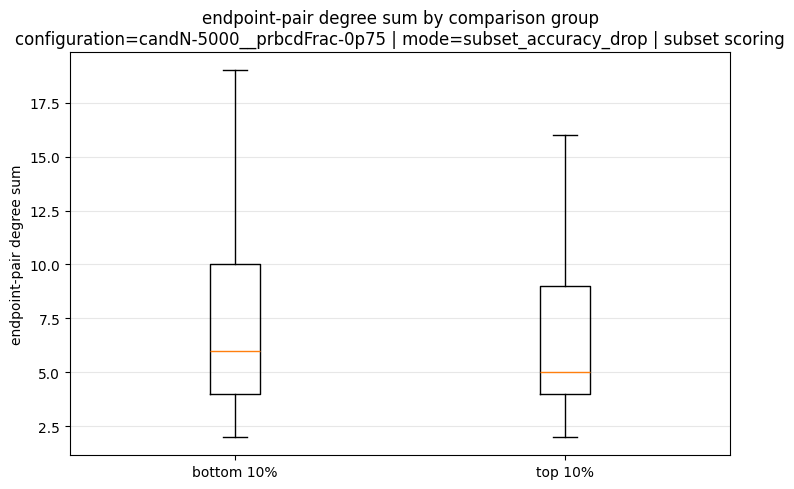


----------------------------------------------------------------------------------------------------------------
Distribution: neighbor union size
----------------------------------------------------------------------------------------------------------------
neighbor union size is ranked 12 for configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop |
subset scoring. Mean Hedges' g is -0.244.


,label_group,group_name,n,mean,sd,median,q1,q3
0,0,Bottom 10% subset score,500,8.610,10.408774,6.0,4.0,10.0
1,1,Top 10% subset score,500,6.652,4.456300,5.0,4.0,9.0


/tmp/ipykernel_151421/2664281447.py:1947: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/06_distribution_12_neighbor_union_size__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


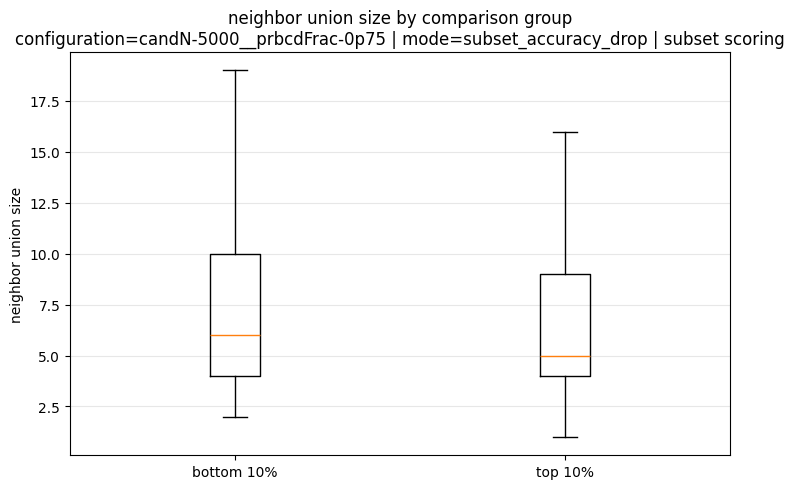


7. Categorical associations
Cramér's V measures association strength between a categorical edge property and comparison-group membership. It
is non-directional, so level-proportion plots are needed to identify which categories are enriched in group 1.

----------------------------------------------------------------------------------------------------------------
Complete categorical association table
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. The table is sorted by
mean Cramér's V across victim seeds.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,n_seeds,n_levels_mean,cramers_v_mean,cramers_v_sd,chi_square_fdr_significant_fraction,fisher_fdr_significant_fraction,cramers_v_sem,association_strength
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,candidate_source,1,2.0,0.191565,0.0,1.0,1.0,0.0,small-to-moderate
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_clean_prediction_pair,1,28.0,0.150807,0.0,1.0,0.0,0.0,small-to-moderate
10,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_clean_prediction,1,2.0,0.127015,0.0,1.0,1.0,0.0,small-to-moderate
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,both_endpoints_clean_correct,1,2.0,0.081646,0.0,1.0,1.0,0.0,weak
5,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_true_label_pair,1,28.0,0.079864,0.0,0.0,0.0,0.0,weak
12,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_true_label,1,2.0,0.067569,0.0,0.0,0.0,0.0,weak
15,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,v_clean_correct,1,2.0,0.066990,0.0,0.0,0.0,0.0,weak
7,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,has_two_hop_path,1,2.0,0.053279,0.0,0.0,0.0,0.0,weak
11,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_split,1,2.0,0.047003,0.0,0.0,0.0,0.0,weak
13,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,u_clean_correct,1,2.0,0.029345,0.0,0.0,0.0,0.0,weak



Strongest categorical associations:
- candidate source: Cramér's V=0.192 (small-to-moderate), chi-square FDR-significant in 1.00 of seeds.
- canonical clean prediction pair: Cramér's V=0.151 (small-to-moderate), chi-square FDR-significant in 1.00 of seeds.
- same clean prediction: Cramér's V=0.127 (small-to-moderate), chi-square FDR-significant in 1.00 of seeds.
- both endpoints clean correct: Cramér's V=0.082 (weak), chi-square FDR-significant in 1.00 of seeds.
- canonical true label pair: Cramér's V=0.080 (weak), chi-square FDR-significant in 0.00 of seeds.
- same true label: Cramér's V=0.068 (weak), chi-square FDR-significant in 0.00 of seeds.
- v clean correct: Cramér's V=0.067 (weak), chi-square FDR-significant in 0.00 of seeds.
- has two hop path: Cramér's V=0.053 (weak), chi-square FDR-significant in 0.00 of seeds.
- same split: Cramér's V=0.047 (weak), chi-square FDR-significant in 0.00 of seeds.
- u clean correct: Cramér's V=0.029 (weak), chi-square FDR-significant in 0.00 of

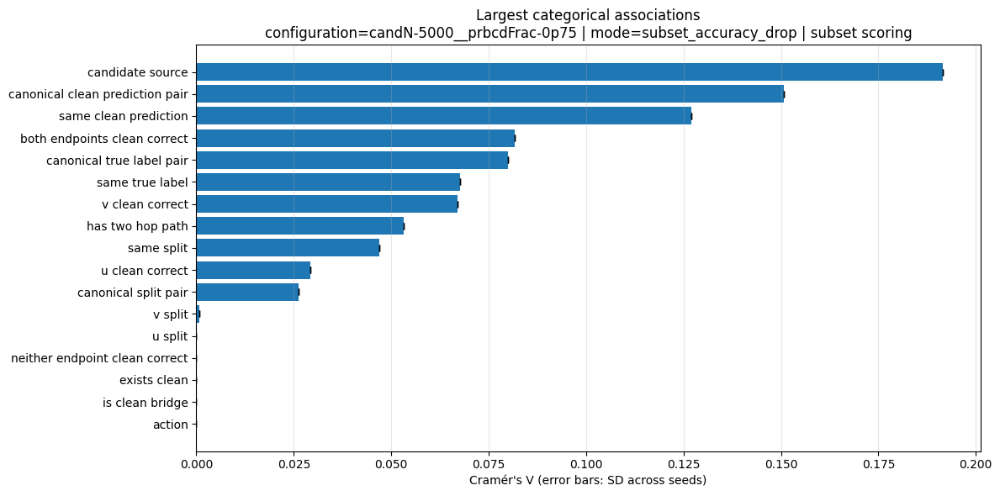


----------------------------------------------------------------------------------------------------------------
Level proportions: action
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Each pair of bars
compares the within-group proportion.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,level,label_group,n_seeds,count_mean,fraction_mean,fraction_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,action,add,0,1,498.0,0.996,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,action,add,1,1,497.0,0.994,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,action,delete,0,1,2.0,0.004,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,action,delete,1,1,3.0,0.006,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/07_levels_action__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


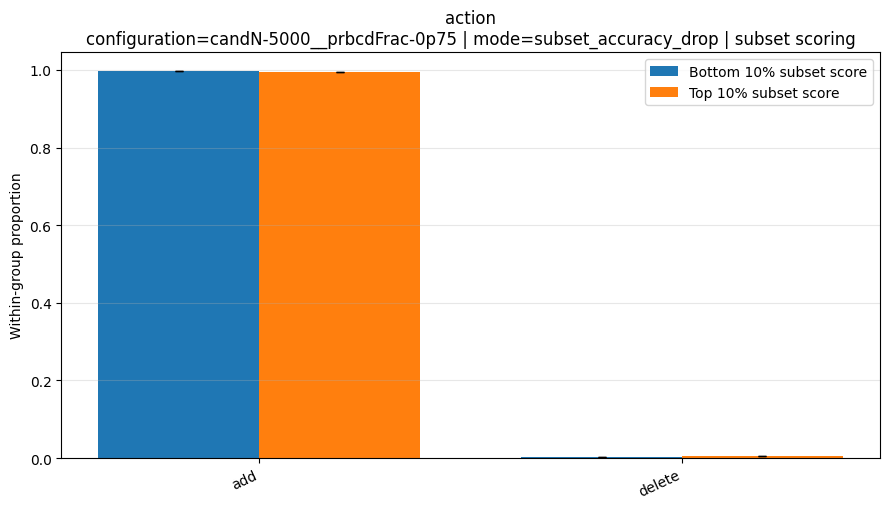


----------------------------------------------------------------------------------------------------------------
Level proportions: candidate source
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Each pair of bars
compares the within-group proportion.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,level,label_group,n_seeds,count_mean,fraction_mean,fraction_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,candidate_source,prbcd_derived,0,1,338.0,0.676,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,candidate_source,prbcd_derived,1,1,421.0,0.842,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,candidate_source,random_candidate,0,1,162.0,0.324,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,candidate_source,random_candidate,1,1,79.0,0.158,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/07_levels_candidate_source__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


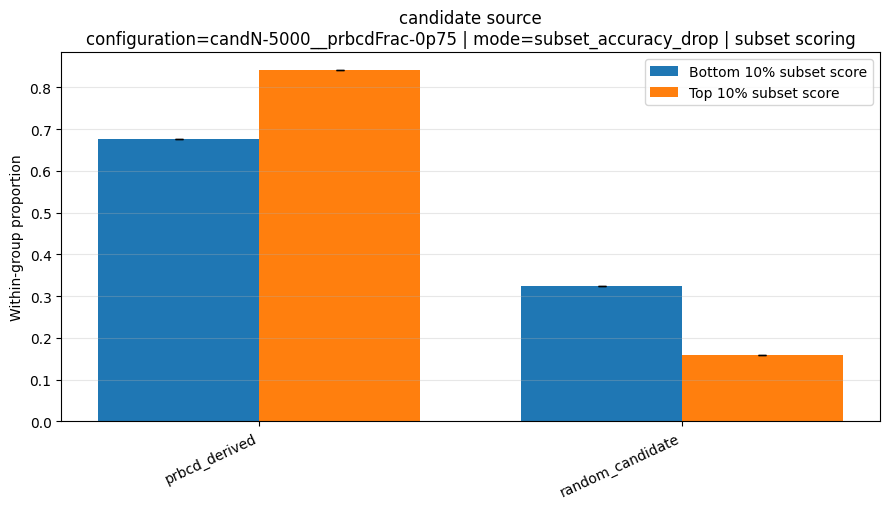


----------------------------------------------------------------------------------------------------------------
Level proportions: same true label
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Each pair of bars
compares the within-group proportion.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,level,label_group,n_seeds,count_mean,fraction_mean,fraction_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_true_label,False,0,1,451.0,0.902,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_true_label,False,1,1,471.0,0.942,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_true_label,True,0,1,49.0,0.098,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_true_label,True,1,1,29.0,0.058,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/07_levels_same_true_label__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


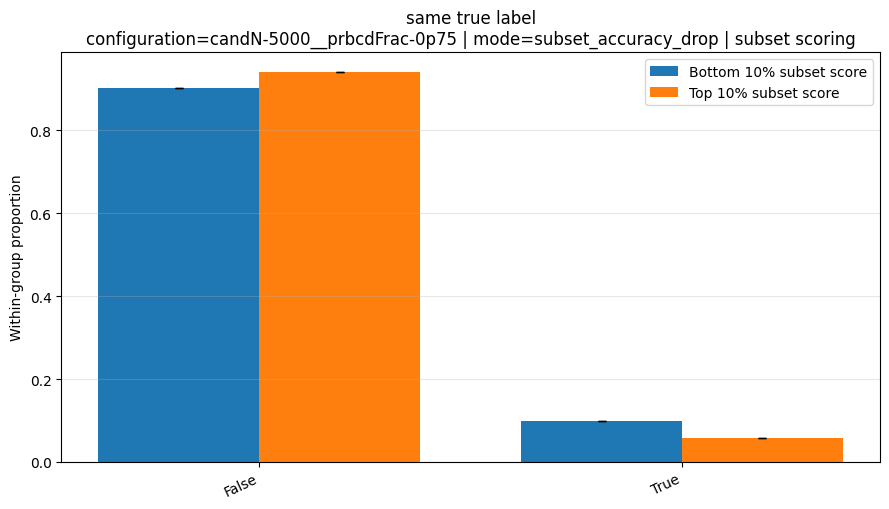


----------------------------------------------------------------------------------------------------------------
Level proportions: same clean prediction
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Each pair of bars
compares the within-group proportion.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,level,label_group,n_seeds,count_mean,fraction_mean,fraction_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_clean_prediction,False,0,1,413.0,0.826,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_clean_prediction,False,1,1,457.0,0.914,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_clean_prediction,True,0,1,87.0,0.174,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_clean_prediction,True,1,1,43.0,0.086,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/07_levels_same_clean_prediction__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


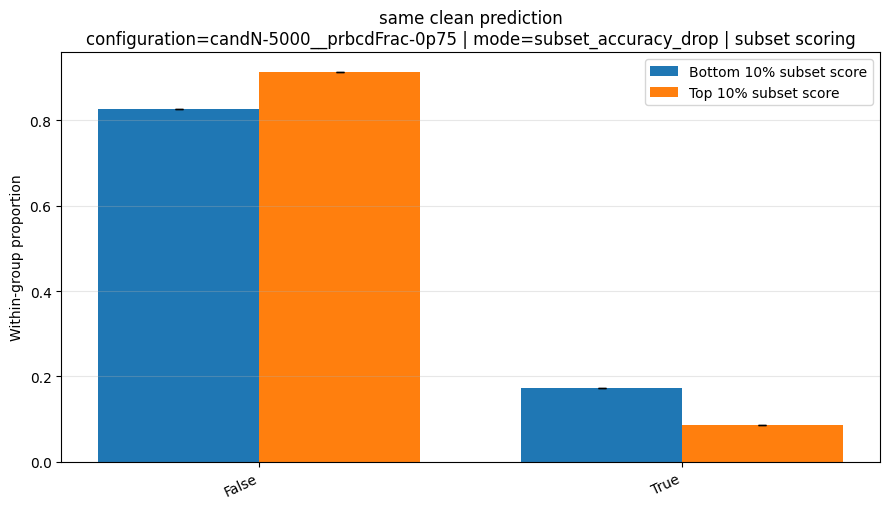


----------------------------------------------------------------------------------------------------------------
Level proportions: n clean correct endpoints
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Each pair of bars
compares the within-group proportion.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,level,label_group,n_seeds,count_mean,fraction_mean,fraction_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,n_clean_correct_endpoints,0,0,1,7.0,0.014,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,n_clean_correct_endpoints,0,1,1,5.0,0.010,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,n_clean_correct_endpoints,1,0,1,128.0,0.256,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,n_clean_correct_endpoints,1,1,1,93.0,0.186,0.0
4,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,n_clean_correct_endpoints,2,0,1,365.0,0.730,0.0
5,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,n_clean_correct_endpoints,2,1,1,402.0,0.804,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/07_levels_n_clean_correct_endpoints__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


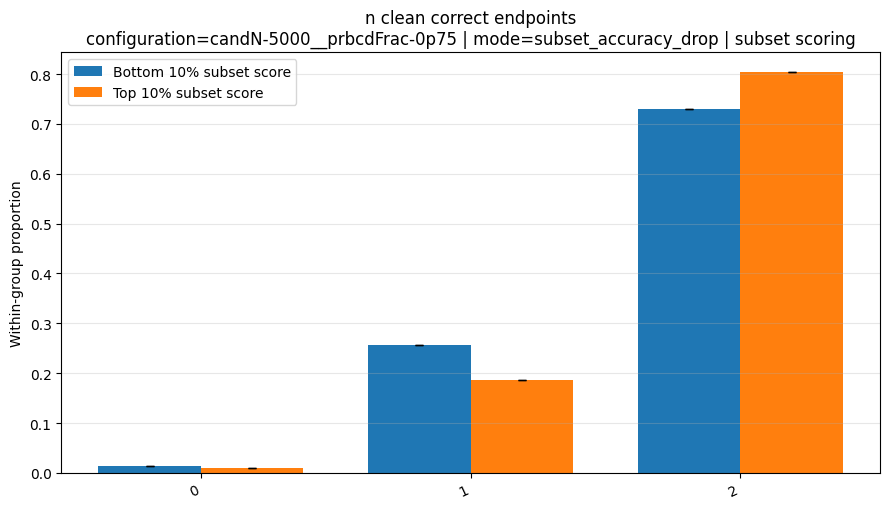


----------------------------------------------------------------------------------------------------------------
Level proportions: both endpoints clean correct
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Each pair of bars
compares the within-group proportion.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,level,label_group,n_seeds,count_mean,fraction_mean,fraction_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,both_endpoints_clean_correct,False,0,1,135.0,0.270,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,both_endpoints_clean_correct,False,1,1,98.0,0.196,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,both_endpoints_clean_correct,True,0,1,365.0,0.730,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,both_endpoints_clean_correct,True,1,1,402.0,0.804,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/07_levels_both_endpoints_clean_correct__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


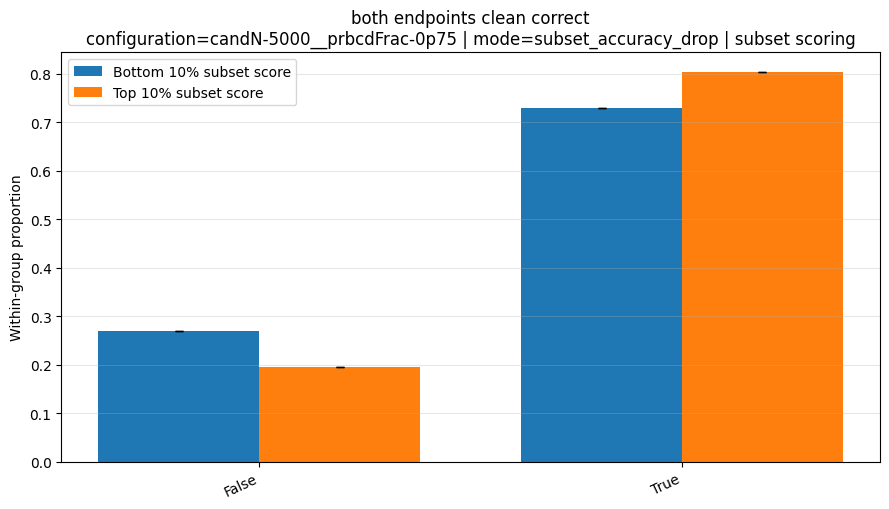


----------------------------------------------------------------------------------------------------------------
Level proportions: neither endpoint clean correct
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Each pair of bars
compares the within-group proportion.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,level,label_group,n_seeds,count_mean,fraction_mean,fraction_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,neither_endpoint_clean_correct,False,0,1,493.0,0.986,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,neither_endpoint_clean_correct,False,1,1,495.0,0.990,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,neither_endpoint_clean_correct,True,0,1,7.0,0.014,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,neither_endpoint_clean_correct,True,1,1,5.0,0.010,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/07_levels_neither_endpoint_clean_correct__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


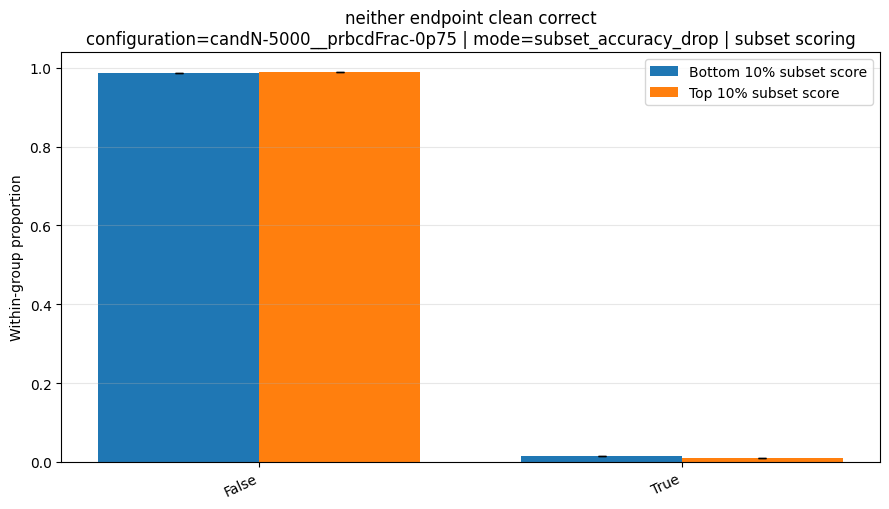


----------------------------------------------------------------------------------------------------------------
Level proportions: same connected component
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Each pair of bars
compares the within-group proportion.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,level,label_group,n_seeds,count_mean,fraction_mean,fraction_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_connected_component,True,0,1,500.0,1.0,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,same_connected_component,True,1,1,500.0,1.0,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/07_levels_same_connected_component__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


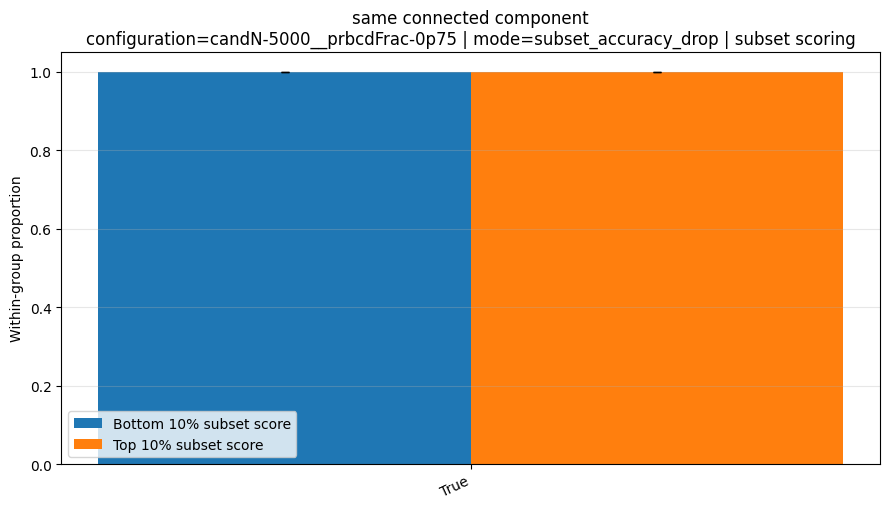


----------------------------------------------------------------------------------------------------------------
Level proportions: has two hop path
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Each pair of bars
compares the within-group proportion.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,level,label_group,n_seeds,count_mean,fraction_mean,fraction_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,has_two_hop_path,False,0,1,466.0,0.932,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,has_two_hop_path,False,1,1,480.0,0.960,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,has_two_hop_path,True,0,1,34.0,0.068,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,has_two_hop_path,True,1,1,20.0,0.040,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/07_levels_has_two_hop_path__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


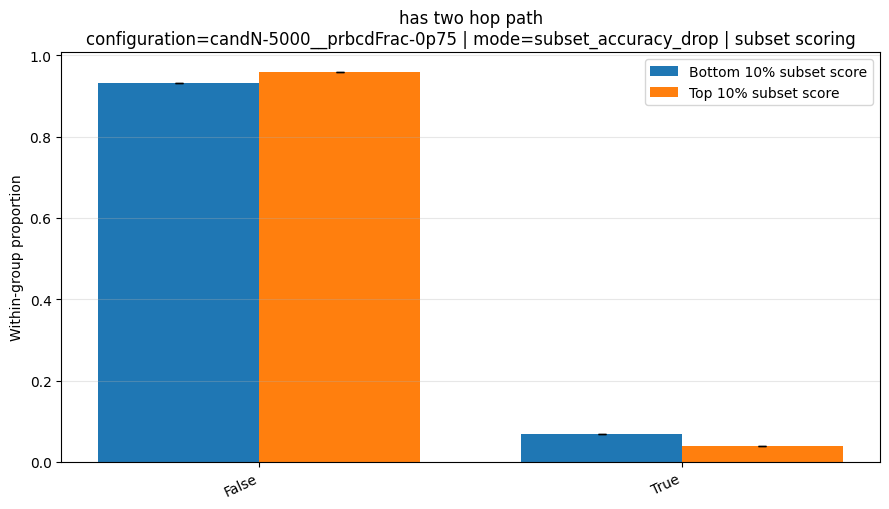


----------------------------------------------------------------------------------------------------------------
Level proportions: used full graph fallback
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Each pair of bars
compares the within-group proportion.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,level,label_group,n_seeds,count_mean,fraction_mean,fraction_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,used_full_graph_fallback,<NA>,0,1,500.0,1.0,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,used_full_graph_fallback,<NA>,1,1,500.0,1.0,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/07_levels_used_full_graph_fallback__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


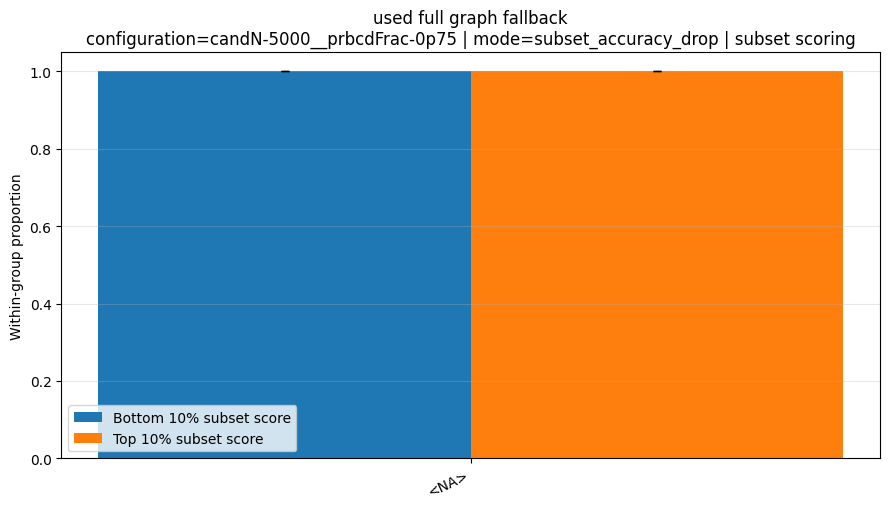


----------------------------------------------------------------------------------------------------------------
Level proportions: canonical split pair
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Each pair of bars
compares the within-group proportion.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,level,label_group,n_seeds,count_mean,fraction_mean,fraction_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_split_pair,test-test,0,1,437.0,0.874,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_split_pair,test-test,1,1,416.0,0.832,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_split_pair,test-train,0,1,33.0,0.066,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_split_pair,test-train,1,1,48.0,0.096,0.0
4,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_split_pair,test-validation,0,1,29.0,0.058,0.0
5,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_split_pair,test-validation,1,1,34.0,0.068,0.0
6,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_split_pair,train-validation,0,1,1.0,0.002,0.0
7,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_split_pair,train-validation,1,1,1.0,0.002,0.0
8,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,canonical_split_pair,validation-validation,1,1,1.0,0.002,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/07_levels_canonical_split_pair__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


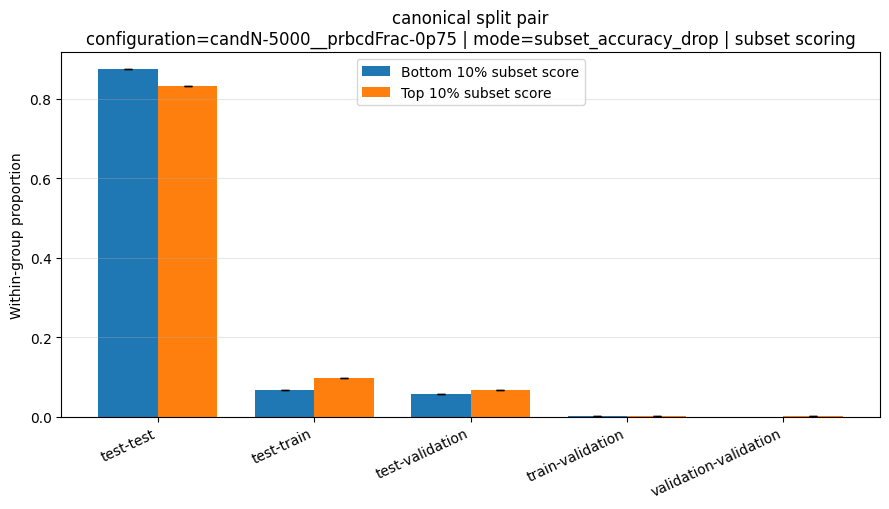

Skipping direct level plot for canonical_true_label_pair in configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring because it has 28 levels. CSV saved.

8. True-class pair structure
The matrix shows the conditional group-1 rate for each unordered pair of endpoint classes. For endpoint mode
this is endpoint-label-1 yield. For subset mode it indicates enrichment in the top-score extreme relative to the
bottom-score extreme.

----------------------------------------------------------------------------------------------------------------
Group-1 rate by true-class pair
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Higher values indicate
greater enrichment in Top 10% subset score.


,canonical_true_label_pair,n_seeds,n_candidates_mean,group_1_rate_mean,group_1_rate_sd
25,5-5,1,1.0,1.000000,0.0
5,0-5,1,13.0,0.692308,0.0
9,1-3,1,28.0,0.642857,0.0
2,0-2,1,31.0,0.612903,0.0
16,2-5,1,5.0,0.600000,0.0
19,3-4,1,184.0,0.565217,0.0
13,2-2,1,9.0,0.555556,0.0
4,0-4,1,80.0,0.550000,0.0
23,4-5,1,35.0,0.542857,0.0
1,0-1,1,38.0,0.526316,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/08_true_class_pair_matrix__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


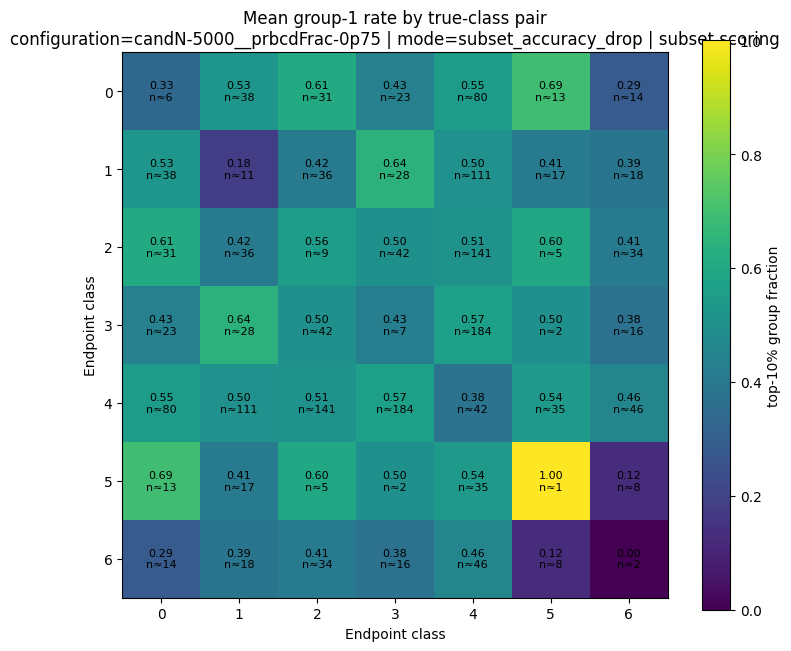


9. Group-1 rates along numeric gradients
Candidates are binned by an interpretable feature and the conditional group-1 rate is plotted. Endpoint mode
estimates endpoint-label-1 yield. Subset mode estimates top-score enrichment among only the selected top/bottom
extremes; it is not a population probability over all candidates.

----------------------------------------------------------------------------------------------------------------
Binned group-1 rate: endpoint-pair degree mean
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bins run from lower to
higher feature values.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,bin_label,n_seeds,n_candidates_mean,feature_mean,group_1_rate_mean,group_1_rate_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.999, 1.5]",1,232.0,1.310345,0.517241,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(1.5, 2.5]",1,272.0,2.235294,0.518382,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(2.5, 3.5]",1,150.0,3.230000,0.520000,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(3.5, 5.0]",1,148.0,4.418919,0.540541,0.0
4,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(5.0, 77.0]",1,198.0,9.063131,0.409091,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/09_binned_pair_degree_mean__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


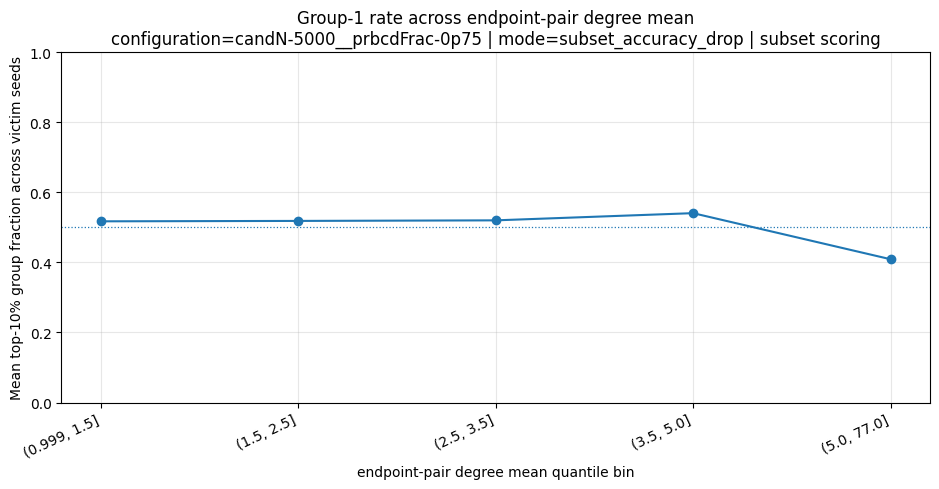


----------------------------------------------------------------------------------------------------------------
Binned group-1 rate: endpoint-pair degree min
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bins run from lower to
higher feature values.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,bin_label,n_seeds,n_candidates_mean,feature_mean,group_1_rate_mean,group_1_rate_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.999, 2.0]",1,735.0,1.344218,0.515646,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(2.0, 3.0]",1,135.0,3.000000,0.525926,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(3.0, 17.0]",1,130.0,5.707692,0.384615,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/09_binned_pair_degree_min__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


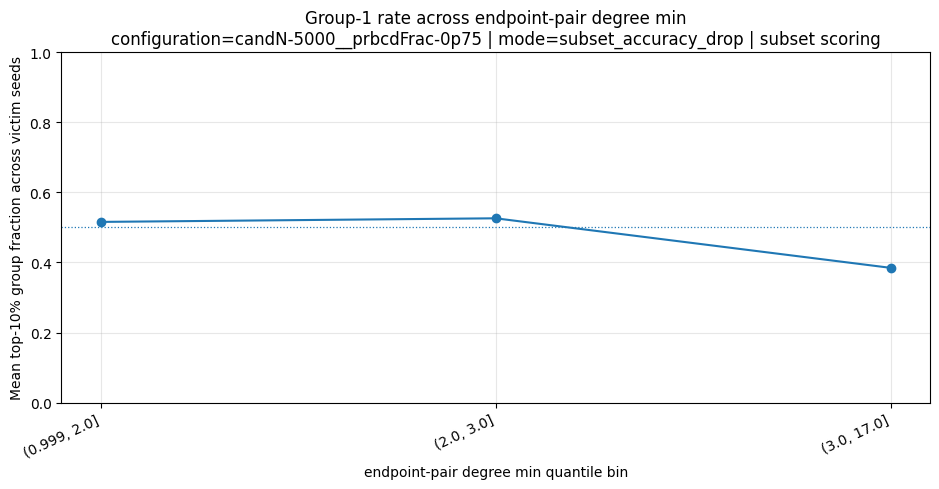


----------------------------------------------------------------------------------------------------------------
Binned group-1 rate: common neighbors
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bins run from lower to
higher feature values.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,bin_label,n_seeds,n_candidates_mean,feature_mean,group_1_rate_mean,group_1_rate_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(-0.001, 3.0]",1,1000.0,0.059,0.5,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/09_binned_common_neighbors__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


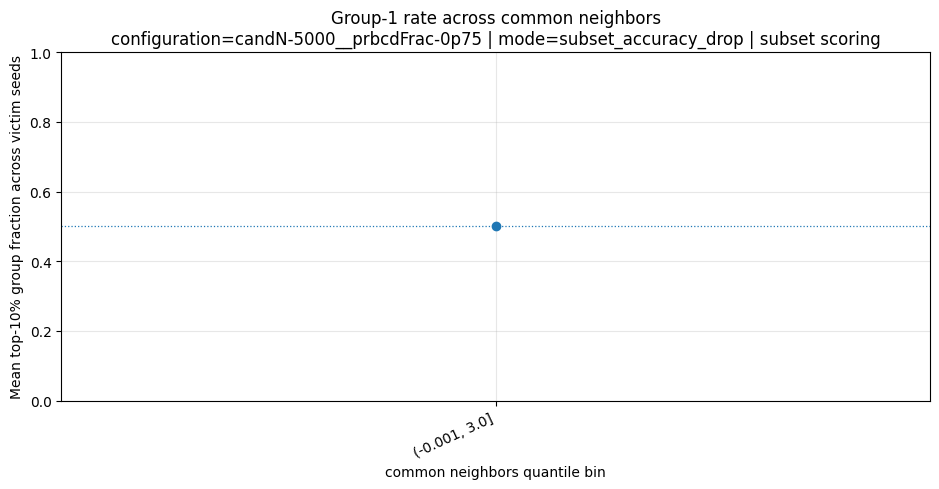


----------------------------------------------------------------------------------------------------------------
Binned group-1 rate: jaccard coefficient
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bins run from lower to
higher feature values.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,bin_label,n_seeds,n_candidates_mean,feature_mean,group_1_rate_mean,group_1_rate_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(-0.001, 1.0]",1,1000.0,0.008276,0.5,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/09_binned_jaccard_coefficient__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


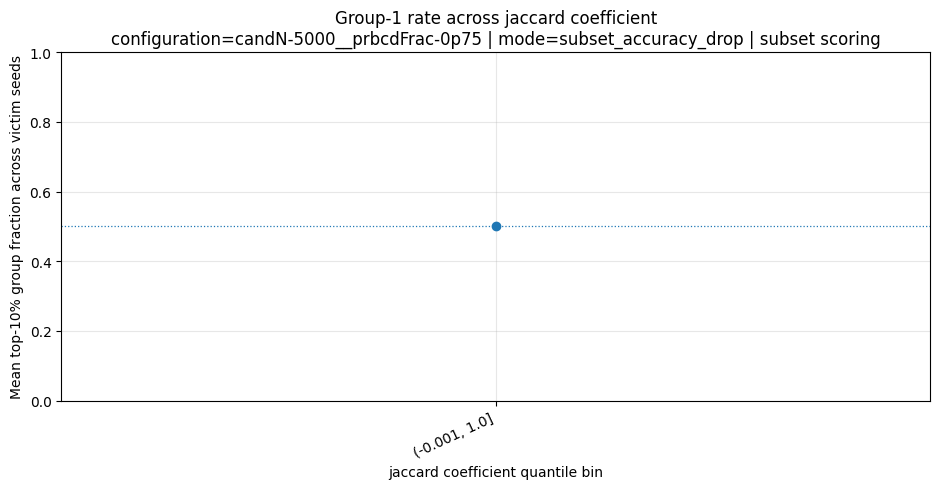


----------------------------------------------------------------------------------------------------------------
Binned group-1 rate: adamic adar index
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bins run from lower to
higher feature values.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,bin_label,n_seeds,n_candidates_mean,feature_mean,group_1_rate_mean,group_1_rate_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(-0.001, 1.138]",1,1000.0,0.018691,0.5,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/09_binned_adamic_adar_index__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


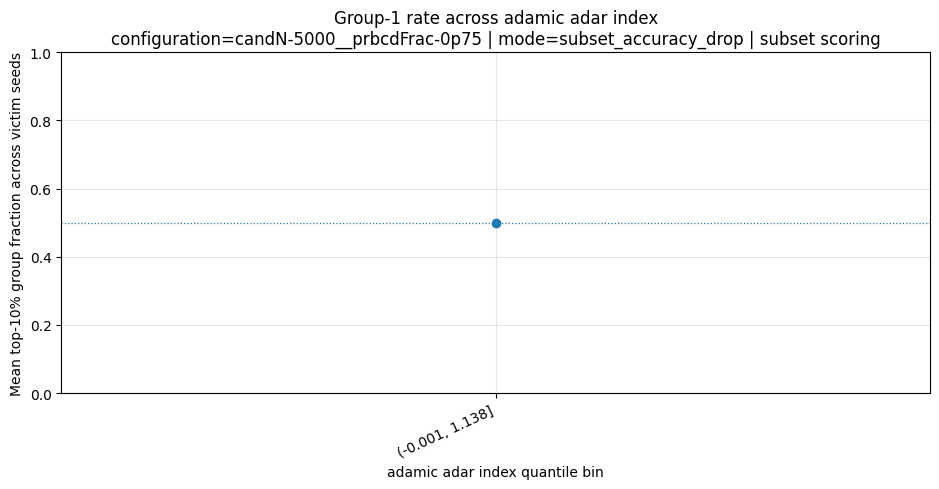


----------------------------------------------------------------------------------------------------------------
Binned group-1 rate: clean shortest path length
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bins run from lower to
higher feature values.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,bin_label,n_seeds,n_candidates_mean,feature_mean,group_1_rate_mean,group_1_rate_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.999, 4.0]",1,343.0,3.381924,0.478134,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(4.0, 5.0]",1,221.0,5.000000,0.470588,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(5.0, 6.0]",1,186.0,6.000000,0.521505,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(6.0, 7.0]",1,103.0,7.000000,0.504854,0.0
4,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(7.0, 12.0]",1,147.0,8.863946,0.564626,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/09_binned_clean_shortest_path_length__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


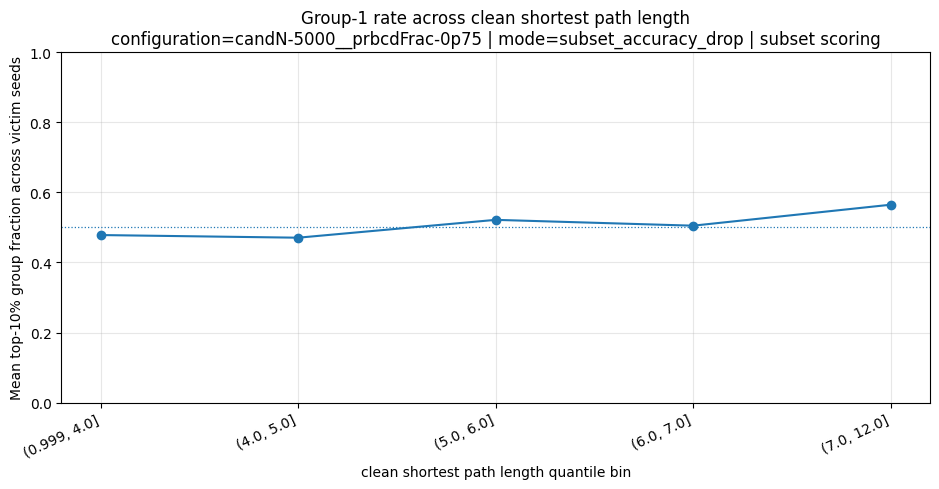


----------------------------------------------------------------------------------------------------------------
Binned group-1 rate: feature cosine similarity
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bins run from lower to
higher feature values.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,bin_label,n_seeds,n_candidates_mean,feature_mean,group_1_rate_mean,group_1_rate_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(-0.001, 0.0073]",1,200.0,0.001803,0.515,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.0073, 0.0193]",1,200.0,0.013036,0.470,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.0193, 0.034]",1,200.0,0.026275,0.530,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.034, 0.057]",1,200.0,0.043605,0.485,0.0
4,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.057, 0.364]",1,200.0,0.095613,0.500,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/09_binned_feature_cosine_similarity__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


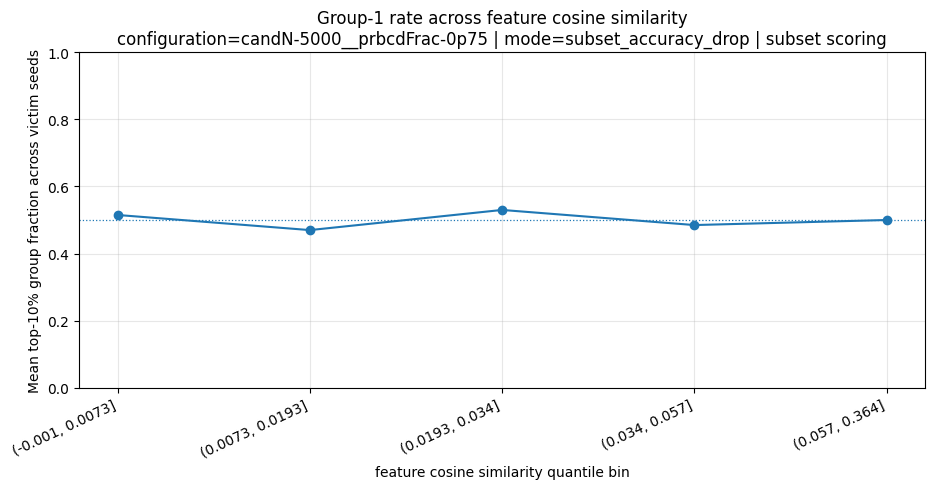


----------------------------------------------------------------------------------------------------------------
Binned group-1 rate: feature support jaccard
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bins run from lower to
higher feature values.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,bin_label,n_seeds,n_candidates_mean,feature_mean,group_1_rate_mean,group_1_rate_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(-0.001, 0.0122]",1,201.0,0.004294,0.527363,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.0122, 0.0248]",1,199.0,0.018502,0.462312,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.0248, 0.037]",1,202.0,0.030752,0.539604,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.037, 0.053]",1,199.0,0.044477,0.467337,0.0
4,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.053, 0.117]",1,199.0,0.069651,0.502513,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/09_binned_feature_support_jaccard__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


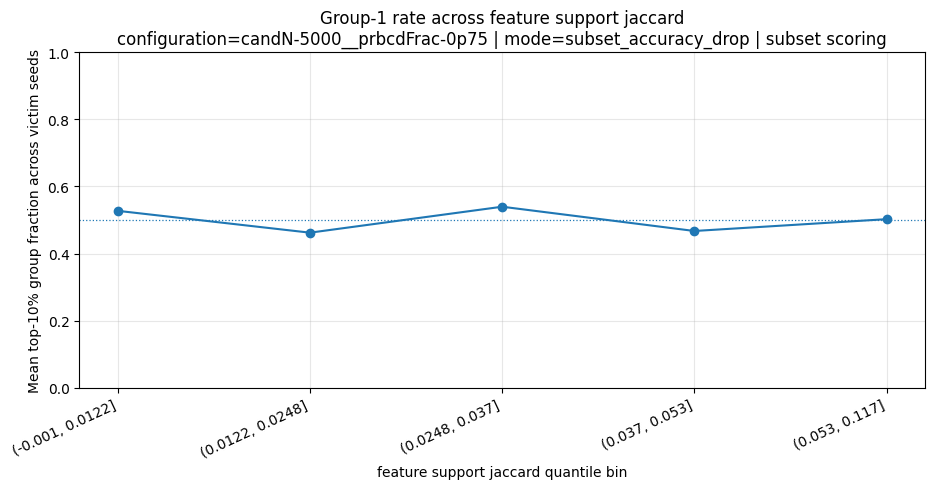


----------------------------------------------------------------------------------------------------------------
Binned group-1 rate: endpoint-pair clean confidence min
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bins run from lower to
higher feature values.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,bin_label,n_seeds,n_candidates_mean,feature_mean,group_1_rate_mean,group_1_rate_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.224, 0.439]",1,204.0,0.365133,0.598039,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.439, 0.584]",1,196.0,0.507598,0.520408,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.584, 0.729]",1,200.0,0.661435,0.510000,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.729, 0.862]",1,200.0,0.800818,0.410000,0.0
4,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.862, 0.995]",1,200.0,0.917241,0.460000,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/09_binned_pair_clean_confidence_min__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


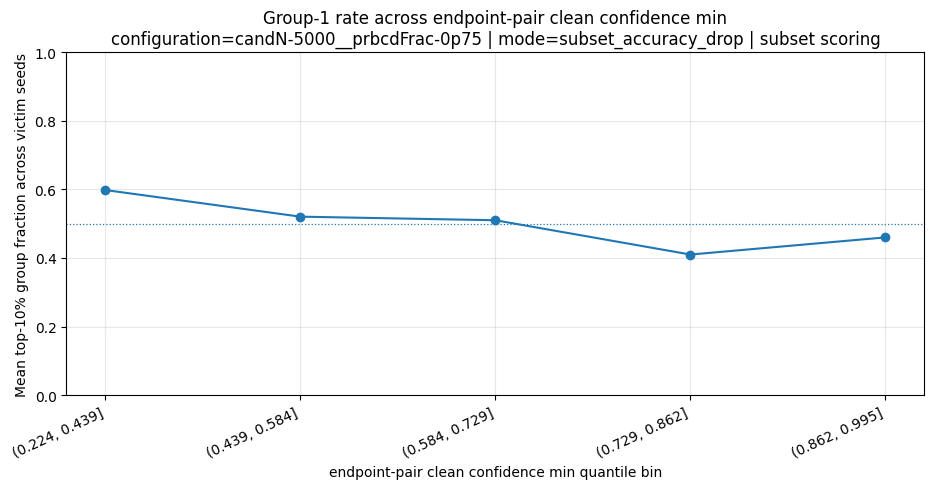


----------------------------------------------------------------------------------------------------------------
Binned group-1 rate: endpoint-pair clean margin min
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bins run from lower to
higher feature values.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,bin_label,n_seeds,n_candidates_mean,feature_mean,group_1_rate_mean,group_1_rate_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(-0.00022900000000000004, 0.148]",1,205.0,0.075049,0.551220,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.148, 0.379]",1,195.0,0.261959,0.569231,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.379, 0.603]",1,200.0,0.501138,0.500000,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.603, 0.804]",1,200.0,0.708947,0.430000,0.0
4,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.804, 0.994]",1,200.0,0.882302,0.450000,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/09_binned_pair_clean_margin_min__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


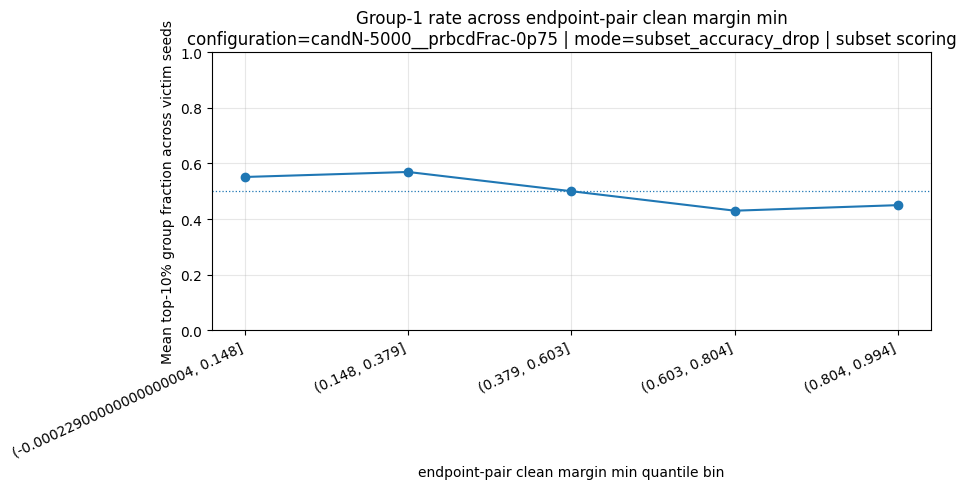


----------------------------------------------------------------------------------------------------------------
Binned group-1 rate: endpoint-pair clean entropy mean
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Bins run from lower to
higher feature values.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,bin_label,n_seeds,n_candidates_mean,feature_mean,group_1_rate_mean,group_1_rate_sd
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.032, 0.409]",1,200.0,0.279356,0.445,0.0
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.409, 0.61]",1,200.0,0.508818,0.460,0.0
2,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.61, 0.786]",1,200.0,0.699691,0.495,0.0
3,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.786, 0.958]",1,200.0,0.867613,0.590,0.0
4,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,"(0.958, 1.57]",1,200.0,1.175420,0.510,0.0


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/09_binned_pair_clean_entropy_mean__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


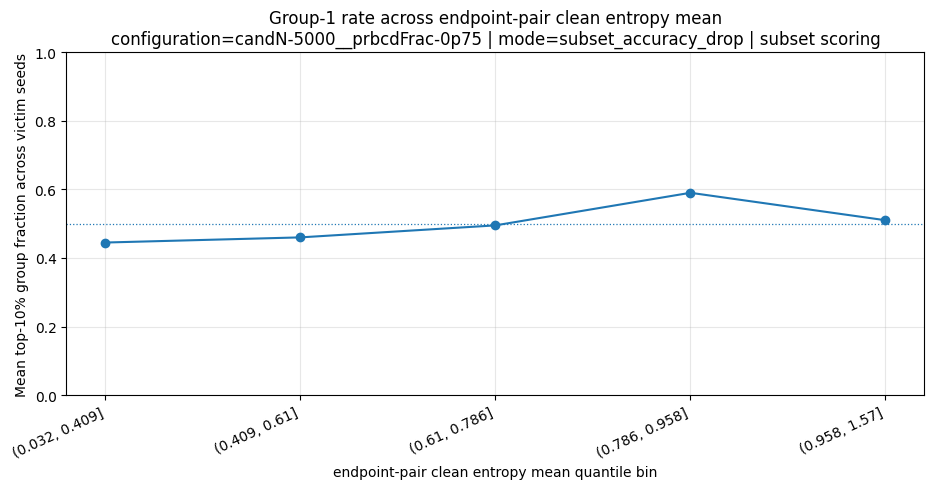


10. Mode-specific mechanism diagnostics
Endpoint-hit patterns exist only for endpoint mining. Subset mining instead reports score separation, inclusion
counts, and selection cutoffs. No endpoint-hit values are invented for subset candidates.
No endpoint runs are present; endpoint-hit mechanism plots skipped.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,seed,label_group,n_selected,score_raw_mean,score_raw_std,score_raw_min,score_raw_max,score_percentile_mean,inclusion_count_mean,inclusion_count_std,group_name
0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,0,500,0.044834,0.000248,0.043508,0.045108,0.04991,48.446,6.819391,Bottom 10% subset score
1,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,0,1,500,0.046833,0.000247,0.046547,0.047974,0.95009,48.998,6.689057,Top 10% subset score



----------------------------------------------------------------------------------------------------------------
Subset top/bottom selection cutoffs
----------------------------------------------------------------------------------------------------------------
The table exposes score range, top and bottom cutoffs, tie counts at each boundary, observation counts, and
whether a run had constant scores.


,scoring_mode,comparison_rule,n_candidates_available,n_candidates_valid,n_group_1,n_group_0,selected_fraction_per_group,bottom_cutoff_score,top_cutoff_score,score_min,score_max,constant_score_run,n_at_bottom_cutoff,n_at_top_cutoff,dataset,seed,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,actual_prbcd_fraction,endpoint_mining_hop,candidate_hash
0,subset_accuracy_drop,subset_top_vs_bottom_10%,5000,5000,500,500,0.1,0.045108,0.046547,0.043508,0.047974,False,3,2,cora_ml,0,candN-5000__prbcdFrac-0p75,5000,0.75,0.75,0,8ab3ce63e3



11. Node involvement
Incidence is normalized within each seed and comparison group. This reveals whether group-1 edges repeatedly
involve a small set of nodes or whether their endpoint coverage is diffuse.

----------------------------------------------------------------------------------------------------------------
Nodes most involved in group-1 candidate edges
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. Nodes are ranked by their
mean share of Top 10% subset score endpoint incidences.


,node,label_group,n_seeds,incidence_share_mean,incidence_share_sd,candidate_incidence_mean,degree_mean,pagerank_mean,betweenness_mean,clean_confidence_mean
6,18,0,1,0.007,0.0,7.0,1.0,0.000096,0.000000e+00,0.438751
7,18,1,1,0.004,0.0,4.0,1.0,0.000096,0.000000e+00,0.438751
82,224,0,1,0.003,0.0,3.0,1.0,0.000111,0.000000e+00,0.867554
83,224,1,1,0.005,0.0,5.0,1.0,0.000111,0.000000e+00,0.867554
84,226,0,1,0.002,0.0,2.0,1.0,0.000109,0.000000e+00,0.795319
85,226,1,1,0.003,0.0,3.0,1.0,0.000109,0.000000e+00,0.795319
101,259,0,1,0.001,0.0,1.0,2.0,0.000271,7.119972e-04,0.593907
102,259,1,1,0.006,0.0,6.0,2.0,0.000271,7.119972e-04,0.593907
169,362,1,1,0.004,0.0,4.0,4.0,0.000341,4.474612e-03,0.567357
182,391,0,1,0.002,0.0,2.0,1.0,0.000105,0.000000e+00,0.443435


Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/11_top_group1_nodes__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


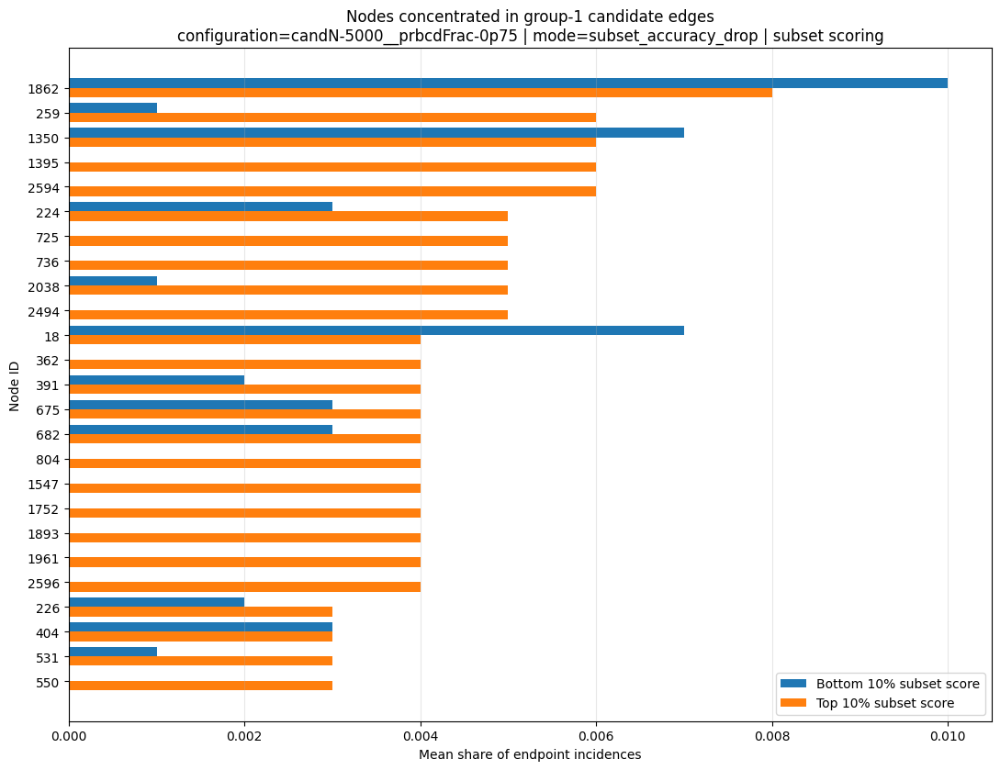

Saved plot: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_graph_stats/cora_ml__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__hash-fbab550dbd/contextual_plots/11_degree_vs_incidence__candN-5000__prbcdFrac-0p75__subset_accuracy_drop__subset_top_vs_bottom_10___0.png


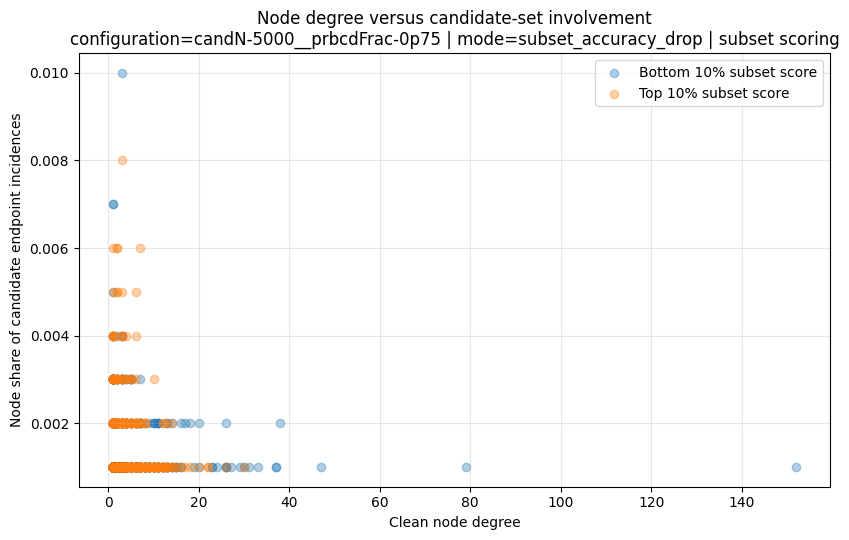


12. Paired victim-seed comparisons
The victim seed is the observational unit. Endpoint differences are label 1 minus label 0; subset differences
are top-score minus bottom-score. With one seed, these outputs remain descriptive.

----------------------------------------------------------------------------------------------------------------
Paired group-1 minus group-0 feature differences
----------------------------------------------------------------------------------------------------------------
configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring. The contrast is top 10%
minus bottom 10%. Differences remain in each feature's original units.


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,n_seeds,seed_mean_difference_1_minus_0,seed_sd_difference,seed_sem_difference,paired_t_statistic,paired_t_p,wilcoxon_statistic,wilcoxon_p,paired_t_p_fdr_bh,wilcoxon_p_fdr_bh,abs_seed_mean_difference
34,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_class_frequency_product,1,3.570418e+03,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3.570418e+03
100,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_feature_nnz_product,1,6.003600e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,6.003600e+01
30,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_class_frequency_absdiff,1,2.353600e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,2.353600e+01
31,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_class_frequency_max,1,2.053400e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,2.053400e+01
124,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_triangles_product,1,-1.869000e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.869000e+01
35,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_class_frequency_sum,1,1.753200e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.753200e+01
136,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,u_class_frequency,1,1.485800e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.485800e+01
88,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_degree_product,1,-1.001000e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.001000e+01
127,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,preferential_attachment,1,-1.001000e+01,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.001000e+01
32,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,pair_class_frequency_mean,1,8.766000e+00,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,8.766000e+00



13. Automatically generated interpretation summary
These statements use association language. Subset statements refer to top-versus-bottom score extremes and must
not be rewritten as individual causal edge effects.

configuration=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | subset scoring
- Comparison: Only the equal-sized top and bottom 10% of observed raw subset scores are compared within each mining run. The middle candidates are excluded. The score is the mean harmful accuracy drop among sampled subsets containing the edge; it is an edge-associated subset score, not an individual causal effect.
- Score separation: the top-minus-bottom mean raw score gap was 0.00199878 across 1 seed(s) (SD=0).
- Numeric: endpoint-pair clean entropy absdiff was higher in Top 10% subset score relative to Bottom 10% subset score (mean g=0.273, small; direction consistency=1.00).
- Numeric: endpoint-pair clean confidence absdiff was higher in Top 10% subset score relative to Bottom 10% subs

,title,context,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,path
0,Subset top/bottom score separation,Only the equal-sized top and bottom 10% of obs...,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,/home/hschult5/AttackerGNN/extendedPlotting/rq...
1,Candidate composition,Direct set-level comparison for configuration=...,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,/home/hschult5/AttackerGNN/extendedPlotting/rq...
2,Clean endpoint state,Direct set-level comparison for configuration=...,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,/home/hschult5/AttackerGNN/extendedPlotting/rq...
3,Endpoint-node coverage and concentration,Direct set-level comparison for configuration=...,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,/home/hschult5/AttackerGNN/extendedPlotting/rq...
4,Candidate-pair network,Direct set-level comparison for configuration=...,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,/home/hschult5/AttackerGNN/extendedPlotting/rq...
5,Group-1 enrichment by source and action,Only the equal-sized top and bottom 10% of obs...,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,/home/hschult5/AttackerGNN/extendedPlotting/rq...
6,Largest numeric differences,Top 30 standardized differences for configurat...,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,/home/hschult5/AttackerGNN/extendedPlotting/rq...
7,All numeric effects — page 1,Paginated complete numeric effect output for c...,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,/home/hschult5/AttackerGNN/extendedPlotting/rq...
8,All numeric effects — page 2,Paginated complete numeric effect output for c...,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,/home/hschult5/AttackerGNN/extendedPlotting/rq...
9,All numeric effects — page 3,Paginated complete numeric effect output for c...,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,subset_top_vs_bottom_10%,0,/home/hschult5/AttackerGNN/extendedPlotting/rq...


In [21]:
#%%
# ============================================================
# RQ2: Mode-aware contextual output and plotting
#
# endpoint:
#     group 1 = endpoint label 1
#     group 0 = endpoint label 0
#
# subset_accuracy_drop:
#     group 1 = top score decile
#     group 0 = bottom score decile
#
# Run after the mode-aware graph-statistics cell.
# ============================================================

from pathlib import Path
import json
import math
import re
import textwrap

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display


# ------------------------------------------------------------
# Configuration
# ------------------------------------------------------------

RQ2_CONTEXT_TOP_NUMERIC = 30
RQ2_CONTEXT_TOP_CATEGORICAL = 25
RQ2_CONTEXT_DISTRIBUTION_FEATURES = 12
RQ2_CONTEXT_EFFECTS_PER_PAGE = 32
RQ2_CONTEXT_TOP_NODES = 25
RQ2_CONTEXT_ALPHA = 0.05
RQ2_CONTEXT_SAVE_DPI = 220
RQ2_CONTEXT_PRINT_FULL_TABLES = True
RQ2_CONTEXT_SHOW_ALL_FIGURES = True
RQ2_CONTEXT_BASE_DIR = Path("extendedPlotting") / "rq2_label_graph_stats"

RQ2_CONTEXT_BINNED_FEATURES = [
    "pair_degree_mean",
    "pair_degree_min",
    "common_neighbors",
    "jaccard_coefficient",
    "adamic_adar_index",
    "clean_shortest_path_length",
    "feature_cosine_similarity",
    "feature_support_jaccard",
    "pair_clean_confidence_min",
    "pair_clean_margin_min",
    "pair_clean_entropy_mean",
    "neighborhood_size",
]

RQ2_CONTEXT_CATEGORICAL_FEATURES = [
    "action",
    "candidate_source",
    "same_true_label",
    "same_clean_prediction",
    "n_clean_correct_endpoints",
    "both_endpoints_clean_correct",
    "neither_endpoint_clean_correct",
    "same_connected_component",
    "has_two_hop_path",
    "used_full_graph_fallback",
    "canonical_split_pair",
    "canonical_true_label_pair",
]

RQ2_CONTEXT_SET_METRIC_GROUPS = {
    "Candidate composition": [
        "candidate_fraction",
        "addition_fraction",
        "deletion_fraction",
        "prbcd_derived_fraction",
    ],
    "Clean endpoint state": [
        "same_true_label_fraction",
        "same_clean_prediction_fraction",
        "both_clean_correct_fraction",
        "neither_clean_correct_fraction",
    ],
    "Endpoint-hit mechanism (endpoint mode only)": [
        "both_hit_fraction",
        "exactly_one_hit_fraction",
        "partner_label_adoption_fraction",
        "full_graph_fallback_fraction",
    ],
    "Endpoint-node coverage and concentration": [
        "endpoint_node_coverage",
        "candidate_incidence_gini",
        "candidate_incidence_hhi",
        "top_1pct_endpoint_share",
        "top_5pct_endpoint_share",
        "top_10pct_endpoint_share",
    ],
    "Candidate-pair network": [
        "candidate_pair_network_density",
        "candidate_pair_network_largest_component_fraction",
        "candidate_pair_network_average_clustering",
        "candidate_pair_network_transitivity",
    ],
}


# ------------------------------------------------------------
# Load outputs when run after a restart
# ------------------------------------------------------------

def _rq2_context_safe(value):
    return re.sub(r"[^a-zA-Z0-9_.=-]+", "_", str(value)).strip("_")


def _find_latest_stats_directory(base_dir):
    base_dir = Path(base_dir)
    if not base_dir.exists():
        raise FileNotFoundError(
            f"No graph-statistics output directory exists at {base_dir.resolve()}. "
            "Run the mode-aware statistics cell first."
        )

    candidates = [
        path
        for path in base_dir.iterdir()
        if path.is_dir() and (path / "edge_level_stats_raw.csv").exists()
    ]

    if not candidates:
        raise FileNotFoundError(
            f"No completed graph-statistics run was found below {base_dir.resolve()}."
        )

    return max(
        candidates,
        key=lambda path: (path.stat().st_mtime, path.name),
    )


if "RQ2_GRAPH_STATS_OUT_DIR" not in globals():
    RQ2_GRAPH_STATS_OUT_DIR = _find_latest_stats_directory(
        RQ2_CONTEXT_BASE_DIR
    )
else:
    RQ2_GRAPH_STATS_OUT_DIR = Path(RQ2_GRAPH_STATS_OUT_DIR)


def _load_dataframe_if_missing(
    variable_name,
    filename,
    *,
    required=True,
):
    if (
        variable_name in globals()
        and isinstance(globals()[variable_name], pd.DataFrame)
    ):
        return globals()[variable_name]

    path = RQ2_GRAPH_STATS_OUT_DIR / filename

    if not path.exists():
        if required:
            raise FileNotFoundError(
                f"Required table is missing: {path.resolve()}"
            )
        frame = pd.DataFrame()
        globals()[variable_name] = frame
        return frame

    frame = pd.read_csv(path)
    globals()[variable_name] = frame
    return frame


edge_stats_df = _load_dataframe_if_missing(
    "edge_stats_df",
    "edge_level_stats_raw.csv",
)
comparison_selection_df = _load_dataframe_if_missing(
    "comparison_selection_df",
    "comparison_selection_diagnostics.csv",
    required=False,
)
graph_summary_df = _load_dataframe_if_missing(
    "graph_summary_df",
    "clean_graph_summary.csv",
)
label_group_summary_raw_df = _load_dataframe_if_missing(
    "label_group_summary_raw_df",
    "label_group_summary_raw.csv",
)
label_group_summary_df = _load_dataframe_if_missing(
    "label_group_summary_df",
    "label_group_summary_averaged.csv",
)
numeric_comparison_raw_df = _load_dataframe_if_missing(
    "numeric_comparison_raw_df",
    "numeric_comparisons_raw_per_seed.csv",
)
numeric_comparison_df = _load_dataframe_if_missing(
    "numeric_comparison_df",
    "numeric_comparisons_averaged.csv",
)
categorical_comparison_raw_df = _load_dataframe_if_missing(
    "categorical_comparison_raw_df",
    "categorical_comparisons_raw_per_seed.csv",
)
categorical_comparison_df = _load_dataframe_if_missing(
    "categorical_comparison_df",
    "categorical_comparisons_averaged.csv",
)
categorical_levels_raw_df = _load_dataframe_if_missing(
    "categorical_levels_raw_df",
    "categorical_level_proportions_raw_per_seed.csv",
)
categorical_levels_df = _load_dataframe_if_missing(
    "categorical_levels_df",
    "categorical_level_proportions_averaged.csv",
)
seed_level_comparison_df = _load_dataframe_if_missing(
    "seed_level_comparison_df",
    "paired_seed_level_differences.csv",
)
class_pair_table_raw_df = _load_dataframe_if_missing(
    "class_pair_table_raw_df",
    "true_class_pair_counts.csv",
)
source_action_table_raw_df = _load_dataframe_if_missing(
    "source_action_table_raw_df",
    "candidate_source_action_counts.csv",
)
endpoint_hit_pattern_raw_df = _load_dataframe_if_missing(
    "endpoint_hit_pattern_raw_df",
    "endpoint_hit_patterns.csv",
    required=False,
)
node_involvement_df = _load_dataframe_if_missing(
    "node_involvement_df",
    "node_involvement_raw.csv",
)

required_mode_columns = {
    "scoring_mode",
    "comparison_rule",
    "endpoint_mining_hop",
}
missing_mode_columns = required_mode_columns - set(edge_stats_df.columns)
if missing_mode_columns:
    raise RuntimeError(
        "The loaded edge-level table was produced by the old endpoint-only "
        "statistics cell. Missing columns: "
        f"{sorted(missing_mode_columns)}. Run the mode-aware statistics cell first."
    )


RQ2_CONTEXT_PLOT_DIR = (
    RQ2_GRAPH_STATS_OUT_DIR / "contextual_plots"
)
RQ2_CONTEXT_TABLE_DIR = (
    RQ2_GRAPH_STATS_OUT_DIR / "contextual_tables"
)

RQ2_CONTEXT_PLOT_DIR.mkdir(
    parents=True,
    exist_ok=True,
)
RQ2_CONTEXT_TABLE_DIR.mkdir(
    parents=True,
    exist_ok=True,
)

pd.set_option("display.max_columns", None)
pd.set_option("display.width", 260)
if RQ2_CONTEXT_PRINT_FULL_TABLES:
    pd.set_option("display.max_rows", None)


# ------------------------------------------------------------
# Mode-aware naming and interpretation
# ------------------------------------------------------------

def _subset_fraction_text(comparison_rule):
    match = re.search(
        r"subset_top_vs_bottom_([0-9.]+)%",
        str(comparison_rule),
    )
    return f"{match.group(1)}%" if match else "selected extreme"


def _mode_info(scoring_mode, comparison_rule):
    scoring_mode = str(scoring_mode)

    if scoring_mode == "endpoint":
        return {
            "mode_title": "Endpoint mining",
            "group_1": "Endpoint label 1 (harmful)",
            "group_0": "Endpoint label 0 (no endpoint hit)",
            "short_1": "endpoint label 1",
            "short_0": "endpoint label 0",
            "contrast": "endpoint label 1 minus endpoint label 0",
            "group_1_rate": "endpoint-label-1 rate",
            "main_context": (
                "Each candidate edge was flipped individually. Group 1 means "
                "that at least one endpoint changed from a correct clean "
                "prediction to an incorrect perturbed prediction. Group 0 "
                "means that this endpoint criterion was not met."
            ),
        }

    if scoring_mode == "subset_accuracy_drop":
        fraction_text = _subset_fraction_text(comparison_rule)
        return {
            "mode_title": "Subset-accuracy-drop mining",
            "group_1": f"Top {fraction_text} subset score",
            "group_0": f"Bottom {fraction_text} subset score",
            "short_1": f"top {fraction_text}",
            "short_0": f"bottom {fraction_text}",
            "contrast": f"top {fraction_text} minus bottom {fraction_text}",
            "group_1_rate": f"top-{fraction_text} group fraction",
            "main_context": (
                f"Only the equal-sized top and bottom {fraction_text} of "
                "observed raw subset scores are compared within each mining "
                "run. The middle candidates are excluded. The score is the "
                "mean harmful accuracy drop among sampled subsets containing "
                "the edge; it is an edge-associated subset score, not an "
                "individual causal effect."
            ),
        }

    raise ValueError(f"Unsupported scoring mode: {scoring_mode!r}")


def _label_name(label_group, scoring_mode, comparison_rule):
    info = _mode_info(scoring_mode, comparison_rule)
    return info["group_1"] if int(label_group) == 1 else info["group_0"]


def _pretty_feature(name):
    replacements = {
        "prbcd": "PRBCD",
        "hhi": "HHI",
        "l1": "L1",
        "l2": "L2",
        "nnz": "nonzero features",
    }
    text = (
        str(name)
        .replace("pair_", "endpoint-pair ")
        .replace("_", " ")
    )
    words = [
        replacements.get(word, word)
        for word in text.split()
    ]
    return " ".join(words)


base_group_cols = [
    "candidate_config_id",
    "scoring_mode",
    "comparison_rule",
    "endpoint_mining_hop",
]
raw_group_cols = base_group_cols + ["seed"]


def _config_meta(config_key):
    if not isinstance(config_key, tuple):
        config_key = (config_key,)
    return dict(zip(base_group_cols, config_key))


def _config_title(config_key):
    meta = _config_meta(config_key)
    hop_text = (
        f"h={int(meta['endpoint_mining_hop'])}"
        if str(meta["scoring_mode"]) == "endpoint"
        else "subset scoring"
    )
    return (
        f"configuration={meta['candidate_config_id']} | "
        f"mode={meta['scoring_mode']} | {hop_text}"
    )


def _effect_label(value):
    value = abs(float(value))
    if value < 0.2:
        return "negligible"
    if value < 0.5:
        return "small"
    if value < 0.8:
        return "medium"
    return "large"


def _association_label(value):
    value = abs(float(value))
    if value < 0.1:
        return "weak"
    if value < 0.3:
        return "small-to-moderate"
    if value < 0.5:
        return "moderate-to-strong"
    return "strong"


def _mean_sd_sem(values):
    values = (
        pd.to_numeric(
            pd.Series(values),
            errors="coerce",
        )
        .dropna()
        .to_numpy(dtype=float)
    )
    n = int(values.size)
    if n == 0:
        return np.nan, np.nan, np.nan, 0

    mean = float(values.mean())
    sd = float(values.std(ddof=1)) if n > 1 else 0.0
    sem = sd / math.sqrt(n) if n > 1 else 0.0
    return mean, sd, sem, n


# Normalize Boolean columns after CSV reload.
for boolean_column in [
    "exists_clean",
    "same_true_label",
    "same_clean_prediction",
    "both_endpoints_clean_correct",
    "neither_endpoint_clean_correct",
    "same_connected_component",
    "has_two_hop_path",
    "used_full_graph_fallback",
    "u_hit",
    "v_hit",
    "both_hit",
    "exactly_one_hit",
]:
    if (
        boolean_column in edge_stats_df.columns
        and edge_stats_df[boolean_column].dtype == object
    ):
        edge_stats_df[boolean_column] = (
            edge_stats_df[boolean_column]
            .astype(str)
            .str.lower()
            .map({"true": True, "false": False})
        )


# ------------------------------------------------------------
# General output helpers
# ------------------------------------------------------------

plot_manifest_rows = []
context_report_lines = []


def _section(title, context=None):
    print("\n" + "=" * 112)
    print(title)
    print("=" * 112)
    context_report_lines.extend(
        ["", title, "-" * len(title)]
    )
    if context:
        wrapped = textwrap.fill(
            str(context),
            width=112,
        )
        print(wrapped)
        context_report_lines.append(str(context))


def _subsection(title, context=None):
    print("\n" + "-" * 112)
    print(title)
    print("-" * 112)
    context_report_lines.extend(["", title])
    if context:
        wrapped = textwrap.fill(
            str(context),
            width=112,
        )
        print(wrapped)
        context_report_lines.append(str(context))


def _display_and_save(
    frame,
    filename,
    *,
    max_rows=None,
    sort_by=None,
    ascending=True,
):
    output = frame.copy()

    if (
        sort_by is not None
        and all(
            column in output.columns
            for column in np.atleast_1d(sort_by)
        )
    ):
        output = output.sort_values(
            sort_by,
            ascending=ascending,
        )

    output.to_csv(
        RQ2_CONTEXT_TABLE_DIR / filename,
        index=False,
    )

    if max_rows is not None:
        display(output.head(max_rows))
        if len(output) > max_rows:
            print(
                f"Displayed {max_rows} of {len(output)} rows. "
                f"Full table saved as {filename}."
            )
    else:
        display(output)

    return output


def _save_figure(
    fig,
    filename,
    title,
    context,
    config_key=None,
):
    path = RQ2_CONTEXT_PLOT_DIR / filename
    fig.tight_layout()
    fig.savefig(
        path,
        dpi=RQ2_CONTEXT_SAVE_DPI,
        bbox_inches="tight",
    )

    manifest = {
        "title": title,
        "context": context,
        "candidate_config_id": None,
        "scoring_mode": None,
        "comparison_rule": None,
        "endpoint_mining_hop": None,
        "path": str(path.resolve()),
    }

    if config_key is not None:
        manifest.update(_config_meta(config_key))

    plot_manifest_rows.append(manifest)
    print("Saved plot:", path.resolve())

    if RQ2_CONTEXT_SHOW_ALL_FIGURES:
        plt.show()
    else:
        plt.close(fig)


# ------------------------------------------------------------
# Derived summaries
# ------------------------------------------------------------

numeric_effect_summary = (
    numeric_comparison_raw_df
    .groupby(
        base_group_cols + ["feature"],
        dropna=False,
    )
    .agg(
        n_seeds=("seed", "nunique"),
        group_1_mean=("label_1_mean", "mean"),
        group_0_mean=("label_0_mean", "mean"),
        mean_difference=(
            "mean_difference_1_minus_0",
            "mean",
        ),
        mean_difference_sd=(
            "mean_difference_1_minus_0",
            "std",
        ),
        hedges_g_mean=("hedges_g", "mean"),
        hedges_g_sd=("hedges_g", "std"),
        rank_biserial_mean=(
            "rank_biserial_correlation",
            "mean",
        ),
        point_biserial_mean=(
            "point_biserial_correlation",
            "mean",
        ),
        mann_whitney_fdr_significant_fraction=(
            "mann_whitney_p_fdr_bh",
            lambda values: float(
                (
                    pd.to_numeric(
                        values,
                        errors="coerce",
                    )
                    <= RQ2_CONTEXT_ALPHA
                ).mean()
            ),
        ),
    )
    .reset_index()
)

numeric_effect_summary["hedges_g_sd"] = (
    numeric_effect_summary["hedges_g_sd"]
    .fillna(0.0)
)
numeric_effect_summary["hedges_g_sem"] = (
    numeric_effect_summary["hedges_g_sd"]
    / np.sqrt(
        numeric_effect_summary["n_seeds"].clip(lower=1)
    )
)
numeric_effect_summary["abs_hedges_g"] = (
    numeric_effect_summary["hedges_g_mean"].abs()
)

direction_consistency = (
    numeric_comparison_raw_df
    .assign(
        effect_positive=lambda frame: (
            frame["hedges_g"] > 0
        )
    )
    .groupby(
        base_group_cols + ["feature"],
        dropna=False,
    )
    .agg(
        fraction_positive_direction=(
            "effect_positive",
            "mean",
        ),
        n_finite_effects=(
            "hedges_g",
            lambda values: int(
                pd.to_numeric(
                    values,
                    errors="coerce",
                ).notna().sum()
            ),
        ),
    )
    .reset_index()
)

direction_consistency["direction_consistency"] = np.maximum(
    direction_consistency["fraction_positive_direction"],
    1.0
    - direction_consistency["fraction_positive_direction"],
)

numeric_effect_summary = numeric_effect_summary.merge(
    direction_consistency,
    on=base_group_cols + ["feature"],
    how="left",
)

categorical_effect_summary = (
    categorical_comparison_raw_df
    .groupby(
        base_group_cols + ["feature"],
        dropna=False,
    )
    .agg(
        n_seeds=("seed", "nunique"),
        n_levels_mean=("n_levels", "mean"),
        cramers_v_mean=("cramers_v", "mean"),
        cramers_v_sd=("cramers_v", "std"),
        chi_square_fdr_significant_fraction=(
            "chi_square_p_fdr_bh",
            lambda values: float(
                (
                    pd.to_numeric(
                        values,
                        errors="coerce",
                    )
                    <= RQ2_CONTEXT_ALPHA
                ).mean()
            ),
        ),
        fisher_fdr_significant_fraction=(
            "fisher_p_fdr_bh",
            lambda values: float(
                (
                    pd.to_numeric(
                        values,
                        errors="coerce",
                    )
                    <= RQ2_CONTEXT_ALPHA
                ).mean()
            ),
        ),
    )
    .reset_index()
)

categorical_effect_summary["cramers_v_sd"] = (
    categorical_effect_summary["cramers_v_sd"]
    .fillna(0.0)
)
categorical_effect_summary["cramers_v_sem"] = (
    categorical_effect_summary["cramers_v_sd"]
    / np.sqrt(
        categorical_effect_summary["n_seeds"].clip(lower=1)
    )
)

numeric_effect_summary.to_csv(
    RQ2_CONTEXT_TABLE_DIR
    / "numeric_effect_summary_contextual.csv",
    index=False,
)
categorical_effect_summary.to_csv(
    RQ2_CONTEXT_TABLE_DIR
    / "categorical_effect_summary_contextual.csv",
    index=False,
)


# ------------------------------------------------------------
# Experiment context
# ------------------------------------------------------------

_section(
    "RQ2 mode-aware graph-statistics output",
    (
        "Endpoint runs retain the original binary label-1 versus label-0 "
        "comparison. Subset-accuracy-drop runs compare equal-sized top and "
        "bottom score groups within every seed/run. Results are always "
        "separated by scoring mode and comparison rule."
    ),
)

print(
    "Loaded statistics directory:",
    RQ2_GRAPH_STATS_OUT_DIR.resolve(),
)
print(
    "Contextual figures directory:",
    RQ2_CONTEXT_PLOT_DIR.resolve(),
)
print(
    "Contextual tables directory:",
    RQ2_CONTEXT_TABLE_DIR.resolve(),
)
print(
    "Candidate configurations:",
    sorted(
        edge_stats_df[
            "candidate_config_id"
        ].astype(str).unique().tolist()
    ),
)
print(
    "Scoring modes:",
    sorted(
        edge_stats_df[
            "scoring_mode"
        ].astype(str).unique().tolist()
    ),
)
print(
    "Comparison rules:",
    sorted(
        edge_stats_df[
            "comparison_rule"
        ].astype(str).unique().tolist()
    ),
)
print(
    "Victim seeds:",
    sorted(
        pd.to_numeric(
            edge_stats_df["seed"]
        ).unique().tolist()
    ),
)
print(
    "Edge-level observations used in comparisons:",
    len(edge_stats_df),
)
print(
    "Important inferential note: candidate edges share endpoints and "
    "are not independent. Seed-level consistency and paired seed "
    "summaries are the primary robustness evidence."
)

_subsection(
    "Clean graph context",
    (
        "These quantities describe the clean graph. They provide scale "
        "for later endpoint and pair statistics but are not themselves "
        "group comparisons."
    ),
)
_display_and_save(
    graph_summary_df,
    "clean_graph_context.csv",
)


# ------------------------------------------------------------
# 1. Comparison-group construction and stability
# ------------------------------------------------------------

_section(
    "1. Comparison-group construction and seed stability",
    (
        "For endpoint runs, the group sizes reflect the naturally occurring "
        "binary endpoint-label prevalence. For subset runs, the top and "
        "bottom groups are deliberately equal-sized, so a 50/50 split among "
        "selected edges is expected by construction and is not a prevalence "
        "estimate."
    ),
)

if not comparison_selection_df.empty:
    _display_and_save(
        comparison_selection_df.sort_values(
            raw_group_cols
        ),
        "comparison_selection_diagnostics_contextual.csv",
    )

group_counts_per_seed = (
    edge_stats_df
    .groupby(
        raw_group_cols + ["label_group"],
        dropna=False,
    )
    .size()
    .rename("count")
    .reset_index()
)

group_totals_per_seed = (
    group_counts_per_seed
    .groupby(
        raw_group_cols,
        dropna=False,
    )["count"]
    .sum()
    .rename("total_selected")
    .reset_index()
)

group_counts_per_seed = group_counts_per_seed.merge(
    group_totals_per_seed,
    on=raw_group_cols,
    how="left",
)

group_counts_per_seed["selected_fraction"] = (
    group_counts_per_seed["count"]
    / group_counts_per_seed["total_selected"].clip(lower=1)
)

group_counts_per_seed["group_name"] = [
    _label_name(
        row.label_group,
        row.scoring_mode,
        row.comparison_rule,
    )
    for row in group_counts_per_seed.itertuples()
]

_display_and_save(
    group_counts_per_seed.sort_values(
        raw_group_cols + ["label_group"]
    ),
    "comparison_group_counts_per_seed.csv",
)

for config_key, frame in group_counts_per_seed.groupby(
    base_group_cols,
    dropna=False,
):
    meta = _config_meta(config_key)
    info = _mode_info(
        meta["scoring_mode"],
        meta["comparison_rule"],
    )

    if meta["scoring_mode"] == "endpoint":
        group_1 = frame[
            frame["label_group"] == 1
        ].sort_values("seed")

        mean_fraction, sd_fraction, _, n_seeds = _mean_sd_sem(
            group_1["selected_fraction"]
        )

        context = (
            f"{_config_title(config_key)}. The mean endpoint-label-1 "
            f"fraction is {mean_fraction:.3f} (SD={sd_fraction:.3f}) "
            f"across {n_seeds} victim seed(s)."
        )

        _subsection(
            "Endpoint-label-1 prevalence by victim seed",
            context,
        )
        display(
            group_1[
                [
                    "seed",
                    "count",
                    "total_selected",
                    "selected_fraction",
                ]
            ]
        )

        fig, ax = plt.subplots(
            figsize=(9, 4.8)
        )
        x = np.arange(len(group_1))
        ax.bar(
            x,
            group_1["selected_fraction"],
        )
        ax.axhline(
            mean_fraction,
            linestyle="--",
            linewidth=1.0,
            label="mean across seeds",
        )
        ax.set_xticks(x)
        ax.set_xticklabels(
            group_1["seed"].astype(str)
        )
        ax.set_xlabel("Victim-model seed")
        ax.set_ylabel(
            "Fraction of candidates with endpoint label 1"
        )
        ax.set_ylim(
            0,
            min(
                1.0,
                max(
                    0.05,
                    group_1["selected_fraction"].max()
                    * 1.2,
                ),
            ),
        )
        ax.set_title(
            "Endpoint-harmful candidate prevalence\n"
            + _config_title(config_key)
        )
        ax.grid(
            True,
            axis="y",
            alpha=0.3,
        )
        ax.legend()

        _save_figure(
            fig,
            "01_endpoint_prevalence__"
            + _rq2_context_safe(
                "__".join(map(str, config_key))
            )
            + ".png",
            "Endpoint-label-1 prevalence",
            context,
            config_key,
        )

    else:
        subset_edges = edge_stats_df[
            (edge_stats_df["candidate_config_id"] == meta["candidate_config_id"])
            & (edge_stats_df["scoring_mode"] == meta["scoring_mode"])
            & (edge_stats_df["comparison_rule"] == meta["comparison_rule"])
            & (
                edge_stats_df["endpoint_mining_hop"]
                == meta["endpoint_mining_hop"]
            )
        ]

        score_summary = (
            subset_edges
            .groupby(
                ["seed", "label_group"],
                dropna=False,
            )["score_raw"]
            .agg(["count", "mean", "std", "min", "max"])
            .reset_index()
        )
        score_summary["group_name"] = score_summary[
            "label_group"
        ].map(
            lambda value: _label_name(
                value,
                meta["scoring_mode"],
                meta["comparison_rule"],
            )
        )

        _subsection(
            "Subset top/bottom score separation",
            (
                f"{_config_title(config_key)}. Equal group counts are "
                "expected by construction. The relevant diagnostic is "
                "whether the raw score distributions are clearly separated "
                "and whether the cutoffs are stable across seeds."
            ),
        )
        display(score_summary)

        seeds = sorted(
            score_summary["seed"].unique()
        )
        x = np.arange(len(seeds))
        width = 0.38

        fig, ax = plt.subplots(
            figsize=(10, 5)
        )

        for offset_index, label_group in enumerate([0, 1]):
            group_frame = (
                score_summary[
                    score_summary["label_group"]
                    == label_group
                ]
                .set_index("seed")
                .reindex(seeds)
                .reset_index()
            )
            offset = (
                offset_index - 0.5
            ) * width
            ax.bar(
                x + offset,
                group_frame["mean"],
                width=width,
                yerr=group_frame["std"].fillna(0.0),
                capsize=3,
                label=_label_name(
                    label_group,
                    meta["scoring_mode"],
                    meta["comparison_rule"],
                ),
            )

        ax.set_xticks(x)
        ax.set_xticklabels(
            [str(seed) for seed in seeds]
        )
        ax.set_xlabel("Victim-model seed")
        ax.set_ylabel("Mean raw subset score")
        ax.set_title(
            "Top/bottom subset-score separation\n"
            + _config_title(config_key)
        )
        ax.grid(
            True,
            axis="y",
            alpha=0.3,
        )
        ax.legend()

        _save_figure(
            fig,
            "01_subset_score_separation__"
            + _rq2_context_safe(
                "__".join(map(str, config_key))
            )
            + ".png",
            "Subset top/bottom score separation",
            info["main_context"],
            config_key,
        )


# ------------------------------------------------------------
# 2. Set-level organization and concentration
# ------------------------------------------------------------

_section(
    "2. Set-level organization of the two comparison groups",
    (
        "These summaries compare the two complete edge sets. Endpoint-hit "
        "mechanism metrics are shown only when they contain data; they are "
        "undefined for subset scoring because subset mining does not produce "
        "one individually perturbed prediction per candidate edge."
    ),
)

_display_and_save(
    label_group_summary_raw_df.sort_values(
        raw_group_cols + ["label_group"]
    ),
    "set_level_summary_per_seed.csv",
)

for config_key, frame in label_group_summary_raw_df.groupby(
    base_group_cols,
    dropna=False,
):
    meta = _config_meta(config_key)
    info = _mode_info(
        meta["scoring_mode"],
        meta["comparison_rule"],
    )

    for metric_group_name, metrics in (
        RQ2_CONTEXT_SET_METRIC_GROUPS.items()
    ):
        available = []

        for metric in metrics:
            if metric not in frame.columns:
                continue

            numeric = pd.to_numeric(
                frame[metric],
                errors="coerce",
            )

            if numeric.notna().any():
                available.append(metric)

        if not available:
            continue

        rows = []

        for metric in available:
            for label_group, label_frame in frame.groupby(
                "label_group"
            ):
                mean, sd, sem, n = _mean_sd_sem(
                    label_frame[metric]
                )
                rows.append({
                    "metric": metric,
                    "metric_display": _pretty_feature(metric),
                    "label_group": int(label_group),
                    "group_name": _label_name(
                        label_group,
                        meta["scoring_mode"],
                        meta["comparison_rule"],
                    ),
                    "mean": mean,
                    "sd": sd,
                    "sem": sem,
                    "n_seeds": n,
                })

        summary = pd.DataFrame(rows)

        _subsection(
            metric_group_name,
            (
                f"{_config_title(config_key)}. Bars are means across "
                "victim seeds and error bars are ±1 SD. "
                f"{info['main_context']}"
            ),
        )
        display(summary)

        metrics_order = (
            summary["metric"]
            .drop_duplicates()
            .tolist()
        )
        x = np.arange(len(metrics_order))
        width = 0.38

        fig, ax = plt.subplots(
            figsize=(
                max(10, 1.25 * len(metrics_order)),
                5.2,
            )
        )

        for offset_index, label_group in enumerate([0, 1]):
            label_frame = (
                summary[
                    summary["label_group"]
                    == label_group
                ]
                .set_index("metric")
                .reindex(metrics_order)
                .reset_index()
            )

            offset = (
                offset_index - 0.5
            ) * width

            ax.bar(
                x + offset,
                label_frame["mean"],
                width=width,
                yerr=label_frame["sd"],
                capsize=3,
                label=_label_name(
                    label_group,
                    meta["scoring_mode"],
                    meta["comparison_rule"],
                ),
            )

        ax.set_xticks(x)
        ax.set_xticklabels(
            [
                _pretty_feature(metric)
                for metric in metrics_order
            ],
            rotation=25,
            ha="right",
        )
        ax.set_ylabel("Mean across victim seeds")
        ax.set_title(
            metric_group_name
            + "\n"
            + _config_title(config_key)
        )
        ax.grid(
            True,
            axis="y",
            alpha=0.3,
        )
        ax.legend()

        _save_figure(
            fig,
            "02_set_"
            + _rq2_context_safe(metric_group_name)
            + "__"
            + _rq2_context_safe(
                "__".join(map(str, config_key))
            )
            + ".png",
            metric_group_name,
            (
                "Direct set-level comparison for "
                + _config_title(config_key)
            ),
            config_key,
        )


# ------------------------------------------------------------
# 3. Candidate source and flip action
# ------------------------------------------------------------

_section(
    "3. Candidate source and flip action",
    (
        "For endpoint mode, the conditional group-1 rate is the endpoint-"
        "harmful yield. For subset mode, it is the fraction of selected "
        "extreme candidates belonging to the top-score group rather than "
        "the bottom-score group. Because subset groups are balanced overall, "
        "values above 0.5 indicate enrichment in the top-score extreme."
    ),
)


def _category_group_1_rate_table(
    frame,
    category_columns,
):
    rows = []
    group_columns = (
        base_group_cols
        + ["seed"]
        + category_columns
    )

    for group_key, group in frame.groupby(
        group_columns,
        dropna=False,
    ):
        if not isinstance(group_key, tuple):
            group_key = (group_key,)

        meta = dict(
            zip(group_columns, group_key)
        )

        rows.append({
            **meta,
            "n_candidates": int(len(group)),
            "n_group_1": int(
                group["label_group"].sum()
            ),
            "group_1_rate": float(
                group["label_group"].mean()
            ),
        })

    raw = pd.DataFrame(rows)

    aggregate = (
        raw.groupby(
            base_group_cols + category_columns,
            dropna=False,
        )
        .agg(
            n_seeds=("seed", "nunique"),
            n_candidates_mean=(
                "n_candidates",
                "mean",
            ),
            group_1_rate_mean=(
                "group_1_rate",
                "mean",
            ),
            group_1_rate_sd=(
                "group_1_rate",
                "std",
            ),
        )
        .reset_index()
    )

    aggregate["group_1_rate_sd"] = (
        aggregate["group_1_rate_sd"]
        .fillna(0.0)
    )

    return raw, aggregate


source_action_raw, source_action_rates = (
    _category_group_1_rate_table(
        edge_stats_df,
        ["candidate_source", "action"],
    )
)

source_action_raw.to_csv(
    RQ2_CONTEXT_TABLE_DIR
    / "source_action_group1_rates_per_seed.csv",
    index=False,
)
source_action_rates.to_csv(
    RQ2_CONTEXT_TABLE_DIR
    / "source_action_group1_rates_averaged.csv",
    index=False,
)

for config_key, frame in source_action_rates.groupby(
    base_group_cols,
    dropna=False,
):
    meta = _config_meta(config_key)
    info = _mode_info(
        meta["scoring_mode"],
        meta["comparison_rule"],
    )

    frame = frame.copy()
    frame["category"] = (
        frame["candidate_source"].astype(str)
        + " | "
        + frame["action"].astype(str)
    )
    frame = frame.sort_values(
        "group_1_rate_mean"
    )

    _subsection(
        "Group-1 rate by candidate source and action",
        (
            f"{_config_title(config_key)}. A higher bar means that "
            f"the source/action stratum contains a larger proportion "
            f"of {info['group_1']} edges."
        ),
    )
    display(frame)

    fig, ax = plt.subplots(
        figsize=(
            10,
            max(4.5, 0.65 * len(frame)),
        )
    )
    y = np.arange(len(frame))

    ax.barh(
        y,
        frame["group_1_rate_mean"],
        xerr=frame["group_1_rate_sd"],
        capsize=3,
    )
    ax.axvline(
        0.5,
        linestyle=":",
        linewidth=0.9,
        label="0.5 reference",
    )
    ax.set_yticks(y)
    ax.set_yticklabels(frame["category"])
    ax.set_xlabel(
        f"Mean {info['group_1_rate']} across victim seeds"
    )
    ax.set_xlim(0, 1)
    ax.set_title(
        "Group-1 enrichment by source and action\n"
        + _config_title(config_key)
    )
    ax.grid(
        True,
        axis="x",
        alpha=0.3,
    )
    ax.legend()

    _save_figure(
        fig,
        "03_source_action_rate__"
        + _rq2_context_safe(
            "__".join(map(str, config_key))
        )
        + ".png",
        "Group-1 enrichment by source and action",
        info["main_context"],
        config_key,
    )


# ------------------------------------------------------------
# 4. Numeric effect sizes
# ------------------------------------------------------------

_section(
    "4. Numeric graph-statistic differences",
    (
        "Hedges' g standardizes group 1 minus group 0. Positive values mean "
        "the feature is larger in group 1; negative values mean it is smaller. "
        "For endpoint mode this is endpoint label 1 minus label 0. For subset "
        "mode this is top-score minus bottom-score. The score variables used "
        "to create subset groups were excluded from these feature tests."
    ),
)

for config_key, frame in numeric_effect_summary.groupby(
    base_group_cols,
    dropna=False,
):
    meta = _config_meta(config_key)
    info = _mode_info(
        meta["scoring_mode"],
        meta["comparison_rule"],
    )

    frame = (
        frame.replace([np.inf, -np.inf], np.nan)
        .dropna(subset=["hedges_g_mean"])
        .copy()
    )
    frame = frame.sort_values(
        "abs_hedges_g",
        ascending=False,
    )

    frame["direction"] = np.where(
        frame["hedges_g_mean"] > 0,
        f"higher in {info['short_1']}",
        np.where(
            frame["hedges_g_mean"] < 0,
            f"lower in {info['short_1']}",
            "no difference",
        ),
    )
    frame["effect_magnitude"] = (
        frame["hedges_g_mean"].map(
            _effect_label
        )
    )

    _subsection(
        "Complete numeric comparison table",
        (
            f"{_config_title(config_key)}. The table is sorted by "
            "absolute standardized difference. Direction consistency "
            "is the fraction of seeds agreeing with the majority sign."
        ),
    )

    display_columns = [
        "feature",
        "group_1_mean",
        "group_0_mean",
        "mean_difference",
        "hedges_g_mean",
        "hedges_g_sd",
        "direction",
        "effect_magnitude",
        "direction_consistency",
        "mann_whitney_fdr_significant_fraction",
        "n_seeds",
    ]
    available_columns = [
        column
        for column in display_columns
        if column in frame.columns
    ]
    display(frame[available_columns])

    top = (
        frame.head(
            RQ2_CONTEXT_TOP_NUMERIC
        )
        .sort_values("hedges_g_mean")
    )

    print(
        "\nLargest numeric differences with contextual interpretation:"
    )

    for _, row in frame.head(
        min(15, len(frame))
    ).iterrows():
        print(
            f"- {_pretty_feature(row['feature'])}: "
            f"g={row['hedges_g_mean']:.3f} "
            f"({_effect_label(row['hedges_g_mean'])}; "
            f"{row['direction']}), "
            f"group-1 mean={row['group_1_mean']:.4g}, "
            f"group-0 mean={row['group_0_mean']:.4g}, "
            f"seed direction consistency="
            f"{row['direction_consistency']:.2f}."
        )

    if not top.empty:
        fig, ax = plt.subplots(
            figsize=(12, max(7, 0.34 * len(top)))
        )
        y = np.arange(len(top))

        ax.barh(
            y,
            top["hedges_g_mean"],
            xerr=top["hedges_g_sd"],
            capsize=3,
        )
        ax.axvline(0.0, linewidth=1.0)

        for reference in [-0.5, -0.2, 0.2, 0.5]:
            ax.axvline(
                reference,
                linestyle=":",
                linewidth=0.8,
            )

        ax.set_yticks(y)
        ax.set_yticklabels(
            [
                _pretty_feature(value)
                for value in top["feature"]
            ]
        )
        ax.set_xlabel(
            "Hedges' g: "
            + info["contrast"]
            + " (error bars: SD across seeds)"
        )
        ax.set_title(
            "Largest numeric differences\n"
            + _config_title(config_key)
        )
        ax.grid(
            True,
            axis="x",
            alpha=0.3,
        )

        _save_figure(
            fig,
            "04_top_numeric_effects__"
            + _rq2_context_safe(
                "__".join(map(str, config_key))
            )
            + ".png",
            "Largest numeric differences",
            (
                f"Top {len(top)} standardized differences for "
                f"{_config_title(config_key)}."
            ),
            config_key,
        )

    for page_index, start in enumerate(
        range(
            0,
            len(frame),
            RQ2_CONTEXT_EFFECTS_PER_PAGE,
        ),
        start=1,
    ):
        page = (
            frame.iloc[
                start:
                start + RQ2_CONTEXT_EFFECTS_PER_PAGE
            ]
            .sort_values("hedges_g_mean")
        )

        if page.empty:
            continue

        _subsection(
            f"All numeric effects — page {page_index}",
            (
                f"Features {start + 1}–{start + len(page)} "
                "after sorting by absolute Hedges' g."
            ),
        )
        display(page[available_columns])

        fig, ax = plt.subplots(
            figsize=(
                12,
                max(7, 0.32 * len(page)),
            )
        )
        y = np.arange(len(page))

        ax.barh(
            y,
            page["hedges_g_mean"],
            xerr=page["hedges_g_sd"],
            capsize=2,
        )
        ax.axvline(0.0, linewidth=1.0)
        ax.set_yticks(y)
        ax.set_yticklabels(
            [
                _pretty_feature(value)
                for value in page["feature"]
            ]
        )
        ax.set_xlabel(
            "Hedges' g: " + info["contrast"]
        )
        ax.set_title(
            f"All numeric effects — page {page_index}\n"
            + _config_title(config_key)
        )
        ax.grid(
            True,
            axis="x",
            alpha=0.3,
        )

        _save_figure(
            fig,
            f"04_all_numeric_effects_page-{page_index}__"
            + _rq2_context_safe(
                "__".join(map(str, config_key))
            )
            + ".png",
            f"All numeric effects — page {page_index}",
            (
                "Paginated complete numeric effect output for "
                + _config_title(config_key)
            ),
            config_key,
        )


# ------------------------------------------------------------
# 5. Seed-level effect stability
# ------------------------------------------------------------

_section(
    "5. Stability of numeric effects across victim seeds",
    (
        "The heatmaps show Hedges' g separately for every seed. A feature "
        "is more robust when its sign and approximate magnitude remain "
        "consistent across seeds."
    ),
)

for config_key, summary_frame in numeric_effect_summary.groupby(
    base_group_cols,
    dropna=False,
):
    meta = _config_meta(config_key)
    info = _mode_info(
        meta["scoring_mode"],
        meta["comparison_rule"],
    )

    top_features = (
        summary_frame
        .dropna(subset=["hedges_g_mean"])
        .nlargest(
            min(
                RQ2_CONTEXT_TOP_NUMERIC,
                len(summary_frame),
            ),
            "abs_hedges_g",
        )["feature"]
        .tolist()
    )

    mask = np.ones(
        len(numeric_comparison_raw_df),
        dtype=bool,
    )

    for column, value in meta.items():
        mask &= (
            numeric_comparison_raw_df[column]
            == value
        )

    raw = numeric_comparison_raw_df[
        mask
        & numeric_comparison_raw_df[
            "feature"
        ].isin(top_features)
    ]

    if raw.empty:
        continue

    pivot = raw.pivot_table(
        index="feature",
        columns="seed",
        values="hedges_g",
        aggfunc="mean",
    )
    pivot = pivot.reindex(top_features)

    _subsection(
        "Seed-by-feature Hedges' g matrix",
        (
            f"{_config_title(config_key)}. Rows are ordered by "
            "absolute mean effect."
        ),
    )
    display(pivot.reset_index())

    matrix = pivot.to_numpy(dtype=float)
    finite = matrix[np.isfinite(matrix)]
    max_abs = (
        max(
            0.2,
            float(np.max(np.abs(finite))),
        )
        if finite.size
        else 1.0
    )

    fig, ax = plt.subplots(
        figsize=(
            max(7, 1.0 * pivot.shape[1] + 4),
            max(7, 0.34 * pivot.shape[0]),
        )
    )
    image = ax.imshow(
        matrix,
        aspect="auto",
        vmin=-max_abs,
        vmax=max_abs,
    )
    ax.set_xticks(
        np.arange(pivot.shape[1])
    )
    ax.set_xticklabels(
        [str(value) for value in pivot.columns]
    )
    ax.set_yticks(
        np.arange(pivot.shape[0])
    )
    ax.set_yticklabels(
        [
            _pretty_feature(value)
            for value in pivot.index
        ]
    )
    ax.set_xlabel("Victim-model seed")
    ax.set_title(
        "Numeric effect stability across seeds\n"
        + _config_title(config_key)
    )
    fig.colorbar(
        image,
        ax=ax,
        label="Hedges' g: " + info["contrast"],
    )

    _save_figure(
        fig,
        "05_numeric_seed_stability__"
        + _rq2_context_safe(
            "__".join(map(str, config_key))
        )
        + ".png",
        "Numeric effect stability across seeds",
        (
            "Seed-level effect matrix for "
            + _config_title(config_key)
        ),
        config_key,
    )


# ------------------------------------------------------------
# 6. Raw distributions
# ------------------------------------------------------------

_section(
    "6. Raw distributions of the strongest numeric differences",
    (
        "These boxplots show the raw feature distributions for group 0 and "
        "group 1. They expose skewness, zero inflation, and outliers that "
        "can be hidden by a single effect-size summary."
    ),
)

for config_key, summary_frame in numeric_effect_summary.groupby(
    base_group_cols,
    dropna=False,
):
    meta = _config_meta(config_key)
    info = _mode_info(
        meta["scoring_mode"],
        meta["comparison_rule"],
    )

    mask = np.ones(
        len(edge_stats_df),
        dtype=bool,
    )
    for column, value in meta.items():
        mask &= edge_stats_df[column] == value
    config_edges = edge_stats_df[mask]

    candidates = []

    for _, row in summary_frame.sort_values(
        "abs_hedges_g",
        ascending=False,
    ).iterrows():
        feature = row["feature"]

        if feature not in config_edges.columns:
            continue

        numeric = pd.to_numeric(
            config_edges[feature],
            errors="coerce",
        )

        if numeric.nunique(dropna=True) <= 4:
            continue

        candidates.append(feature)

        if (
            len(candidates)
            >= RQ2_CONTEXT_DISTRIBUTION_FEATURES
        ):
            break

    for rank, feature in enumerate(
        candidates,
        start=1,
    ):
        values_0 = pd.to_numeric(
            config_edges.loc[
                config_edges["label_group"] == 0,
                feature,
            ],
            errors="coerce",
        ).dropna()

        values_1 = pd.to_numeric(
            config_edges.loc[
                config_edges["label_group"] == 1,
                feature,
            ],
            errors="coerce",
        ).dropna()

        if values_0.empty or values_1.empty:
            continue

        summary_table = pd.DataFrame([
            {
                "label_group": 0,
                "group_name": info["group_0"],
                "n": len(values_0),
                "mean": values_0.mean(),
                "sd": values_0.std(ddof=1),
                "median": values_0.median(),
                "q1": values_0.quantile(0.25),
                "q3": values_0.quantile(0.75),
            },
            {
                "label_group": 1,
                "group_name": info["group_1"],
                "n": len(values_1),
                "mean": values_1.mean(),
                "sd": values_1.std(ddof=1),
                "median": values_1.median(),
                "q1": values_1.quantile(0.25),
                "q3": values_1.quantile(0.75),
            },
        ])

        effect_row = summary_frame[
            summary_frame["feature"] == feature
        ].iloc[0]

        context = (
            f"{_pretty_feature(feature)} is ranked {rank} for "
            f"{_config_title(config_key)}. Mean Hedges' g is "
            f"{effect_row['hedges_g_mean']:.3f}."
        )

        _subsection(
            f"Distribution: {_pretty_feature(feature)}",
            context,
        )
        display(summary_table)

        fig, ax = plt.subplots(
            figsize=(7.5, 5.0)
        )
        ax.boxplot(
            [
                values_0.to_numpy(),
                values_1.to_numpy(),
            ],
            labels=[
                info["short_0"],
                info["short_1"],
            ],
            showfliers=False,
        )
        ax.set_ylabel(
            _pretty_feature(feature)
        )
        ax.set_title(
            _pretty_feature(feature)
            + " by comparison group\n"
            + _config_title(config_key)
        )
        ax.grid(
            True,
            axis="y",
            alpha=0.3,
        )

        _save_figure(
            fig,
            f"06_distribution_{rank:02d}_"
            + _rq2_context_safe(feature)
            + "__"
            + _rq2_context_safe(
                "__".join(map(str, config_key))
            )
            + ".png",
            (
                "Distribution of "
                + _pretty_feature(feature)
            ),
            context,
            config_key,
        )


# ------------------------------------------------------------
# 7. Categorical associations
# ------------------------------------------------------------

_section(
    "7. Categorical associations",
    (
        "Cramér's V measures association strength between a categorical "
        "edge property and comparison-group membership. It is non-"
        "directional, so level-proportion plots are needed to identify "
        "which categories are enriched in group 1."
    ),
)

for config_key, frame in categorical_effect_summary.groupby(
    base_group_cols,
    dropna=False,
):
    meta = _config_meta(config_key)
    info = _mode_info(
        meta["scoring_mode"],
        meta["comparison_rule"],
    )

    frame = (
        frame.replace([np.inf, -np.inf], np.nan)
        .dropna(subset=["cramers_v_mean"])
        .copy()
    )
    frame = frame.sort_values(
        "cramers_v_mean",
        ascending=False,
    )
    frame["association_strength"] = (
        frame["cramers_v_mean"].map(
            _association_label
        )
    )

    _subsection(
        "Complete categorical association table",
        (
            f"{_config_title(config_key)}. The table is sorted by "
            "mean Cramér's V across victim seeds."
        ),
    )
    display(frame)

    print("\nStrongest categorical associations:")
    for _, row in frame.head(
        min(15, len(frame))
    ).iterrows():
        print(
            f"- {_pretty_feature(row['feature'])}: "
            f"Cramér's V={row['cramers_v_mean']:.3f} "
            f"({_association_label(row['cramers_v_mean'])}), "
            f"chi-square FDR-significant in "
            f"{row['chi_square_fdr_significant_fraction']:.2f} "
            "of seeds."
        )

    top = (
        frame.head(
            RQ2_CONTEXT_TOP_CATEGORICAL
        )
        .sort_values("cramers_v_mean")
    )

    if top.empty:
        continue

    fig, ax = plt.subplots(
        figsize=(
            12,
            max(6, 0.35 * len(top)),
        )
    )
    y = np.arange(len(top))
    ax.barh(
        y,
        top["cramers_v_mean"],
        xerr=top["cramers_v_sd"],
        capsize=3,
    )
    ax.set_yticks(y)
    ax.set_yticklabels(
        [
            _pretty_feature(value)
            for value in top["feature"]
        ]
    )
    ax.set_xlabel(
        "Cramér's V (error bars: SD across seeds)"
    )
    ax.set_xlim(left=0)
    ax.set_title(
        "Largest categorical associations\n"
        + _config_title(config_key)
    )
    ax.grid(
        True,
        axis="x",
        alpha=0.3,
    )

    _save_figure(
        fig,
        "07_categorical_associations__"
        + _rq2_context_safe(
            "__".join(map(str, config_key))
        )
        + ".png",
        "Largest categorical associations",
        info["main_context"],
        config_key,
    )


def _categorical_level_summary(frame, feature):
    raw_rows = []

    for group_key, group in frame.groupby(
        raw_group_cols,
        dropna=False,
    ):
        if not isinstance(group_key, tuple):
            group_key = (group_key,)

        meta = dict(
            zip(raw_group_cols, group_key)
        )

        for label_group, label_frame in group.groupby(
            "label_group"
        ):
            counts = (
                label_frame[feature]
                .fillna("<NA>")
                .astype(str)
                .value_counts(dropna=False)
            )
            total = counts.sum()

            for level, count in counts.items():
                raw_rows.append({
                    **meta,
                    "feature": feature,
                    "level": str(level),
                    "label_group": int(label_group),
                    "count": int(count),
                    "fraction": float(
                        count / max(1, total)
                    ),
                })

    raw = pd.DataFrame(raw_rows)

    if raw.empty:
        return raw, raw

    aggregate = (
        raw.groupby(
            base_group_cols
            + [
                "feature",
                "level",
                "label_group",
            ],
            dropna=False,
        )
        .agg(
            n_seeds=("seed", "nunique"),
            count_mean=("count", "mean"),
            fraction_mean=("fraction", "mean"),
            fraction_sd=("fraction", "std"),
        )
        .reset_index()
    )
    aggregate["fraction_sd"] = (
        aggregate["fraction_sd"].fillna(0.0)
    )

    return raw, aggregate


for feature in RQ2_CONTEXT_CATEGORICAL_FEATURES:
    if feature not in edge_stats_df.columns:
        continue

    raw, aggregate = _categorical_level_summary(
        edge_stats_df,
        feature,
    )

    if aggregate.empty:
        continue

    raw.to_csv(
        RQ2_CONTEXT_TABLE_DIR
        / (
            "categorical_levels_"
            + _rq2_context_safe(feature)
            + "_per_seed.csv"
        ),
        index=False,
    )
    aggregate.to_csv(
        RQ2_CONTEXT_TABLE_DIR
        / (
            "categorical_levels_"
            + _rq2_context_safe(feature)
            + "_averaged.csv"
        ),
        index=False,
    )

    for config_key, frame in aggregate.groupby(
        base_group_cols,
        dropna=False,
    ):
        meta = _config_meta(config_key)
        info = _mode_info(
            meta["scoring_mode"],
            meta["comparison_rule"],
        )

        if frame["level"].nunique() > 18:
            print(
                f"Skipping direct level plot for {feature} in "
                f"{_config_title(config_key)} because it has "
                f"{frame['level'].nunique()} levels. CSV saved."
            )
            continue

        levels = (
            frame["level"]
            .drop_duplicates()
            .tolist()
        )

        _subsection(
            f"Level proportions: {_pretty_feature(feature)}",
            (
                f"{_config_title(config_key)}. Each pair of bars "
                "compares the within-group proportion."
            ),
        )
        display(
            frame.sort_values(
                ["level", "label_group"]
            )
        )

        x = np.arange(len(levels))
        width = 0.38
        fig, ax = plt.subplots(
            figsize=(
                max(9, 1.1 * len(levels)),
                5.2,
            )
        )

        for offset_index, label_group in enumerate([0, 1]):
            label_frame = (
                frame[
                    frame["label_group"]
                    == label_group
                ]
                .set_index("level")
                .reindex(levels)
                .reset_index()
            )
            offset = (
                offset_index - 0.5
            ) * width

            ax.bar(
                x + offset,
                label_frame["fraction_mean"],
                width=width,
                yerr=label_frame[
                    "fraction_sd"
                ],
                capsize=3,
                label=_label_name(
                    label_group,
                    meta["scoring_mode"],
                    meta["comparison_rule"],
                ),
            )

        ax.set_xticks(x)
        ax.set_xticklabels(
            levels,
            rotation=25,
            ha="right",
        )
        ax.set_ylabel("Within-group proportion")
        ax.set_title(
            _pretty_feature(feature)
            + "\n"
            + _config_title(config_key)
        )
        ax.grid(
            True,
            axis="y",
            alpha=0.3,
        )
        ax.legend()

        _save_figure(
            fig,
            "07_levels_"
            + _rq2_context_safe(feature)
            + "__"
            + _rq2_context_safe(
                "__".join(map(str, config_key))
            )
            + ".png",
            (
                "Level proportions for "
                + _pretty_feature(feature)
            ),
            (
                "Direction of categorical association for "
                + _config_title(config_key)
            ),
            config_key,
        )


# ------------------------------------------------------------
# 8. True-class pair structure
# ------------------------------------------------------------

_section(
    "8. True-class pair structure",
    (
        "The matrix shows the conditional group-1 rate for each unordered "
        "pair of endpoint classes. For endpoint mode this is endpoint-label-1 "
        "yield. For subset mode it indicates enrichment in the top-score "
        "extreme relative to the bottom-score extreme."
    ),
)

for config_key, frame in edge_stats_df.groupby(
    base_group_cols,
    dropna=False,
):
    meta = _config_meta(config_key)
    info = _mode_info(
        meta["scoring_mode"],
        meta["comparison_rule"],
    )

    class_rate_rows = []

    for (
        seed,
        class_pair,
    ), pair_frame in frame.groupby(
        ["seed", "canonical_true_label_pair"],
        dropna=False,
    ):
        class_rate_rows.append({
            "seed": int(seed),
            "canonical_true_label_pair": str(class_pair),
            "n_candidates": int(len(pair_frame)),
            "group_1_rate": float(
                pair_frame["label_group"].mean()
            ),
        })

    class_rates_raw = pd.DataFrame(
        class_rate_rows
    )

    class_rates = (
        class_rates_raw
        .groupby(
            "canonical_true_label_pair",
            dropna=False,
        )
        .agg(
            n_seeds=("seed", "nunique"),
            n_candidates_mean=(
                "n_candidates",
                "mean",
            ),
            group_1_rate_mean=(
                "group_1_rate",
                "mean",
            ),
            group_1_rate_sd=(
                "group_1_rate",
                "std",
            ),
        )
        .reset_index()
    )
    class_rates["group_1_rate_sd"] = (
        class_rates["group_1_rate_sd"]
        .fillna(0.0)
    )
    class_rates = class_rates.sort_values(
        [
            "group_1_rate_mean",
            "n_candidates_mean",
        ],
        ascending=[False, False],
    )

    _subsection(
        "Group-1 rate by true-class pair",
        (
            f"{_config_title(config_key)}. Higher values indicate "
            f"greater enrichment in {info['group_1']}."
        ),
    )
    display(class_rates)

    class_rates.to_csv(
        RQ2_CONTEXT_TABLE_DIR
        / (
            "class_pair_group1_rates__"
            + _rq2_context_safe(
                "__".join(map(str, config_key))
            )
            + ".csv"
        ),
        index=False,
    )

    parsed = []

    for _, row in class_rates.iterrows():
        numbers = re.findall(
            r"\d+",
            str(
                row[
                    "canonical_true_label_pair"
                ]
            ),
        )

        if len(numbers) < 2:
            continue

        a, b = int(numbers[0]), int(numbers[1])
        parsed.append((
            a,
            b,
            row["group_1_rate_mean"],
            row["n_candidates_mean"],
        ))

    if not parsed:
        continue

    classes = sorted({
        value
        for row in parsed
        for value in row[:2]
    })
    class_to_index = {
        value: index
        for index, value in enumerate(classes)
    }
    rate_matrix = np.full(
        (len(classes), len(classes)),
        np.nan,
    )
    count_matrix = np.full(
        (len(classes), len(classes)),
        np.nan,
    )

    for a, b, rate, count in parsed:
        i = class_to_index[a]
        j = class_to_index[b]
        rate_matrix[i, j] = rate
        rate_matrix[j, i] = rate
        count_matrix[i, j] = count
        count_matrix[j, i] = count

    fig, ax = plt.subplots(
        figsize=(7.5, 6.5)
    )
    image = ax.imshow(
        rate_matrix,
        vmin=0.0,
        vmax=max(
            0.01,
            np.nanmax(rate_matrix),
        ),
    )
    ax.set_xticks(
        np.arange(len(classes))
    )
    ax.set_xticklabels(classes)
    ax.set_yticks(
        np.arange(len(classes))
    )
    ax.set_yticklabels(classes)
    ax.set_xlabel("Endpoint class")
    ax.set_ylabel("Endpoint class")
    ax.set_title(
        "Mean group-1 rate by true-class pair\n"
        + _config_title(config_key)
    )

    for i in range(len(classes)):
        for j in range(len(classes)):
            if np.isfinite(rate_matrix[i, j]):
                ax.text(
                    j,
                    i,
                    (
                        f"{rate_matrix[i, j]:.2f}\n"
                        f"n≈{count_matrix[i, j]:.0f}"
                    ),
                    ha="center",
                    va="center",
                    fontsize=8,
                )

    fig.colorbar(
        image,
        ax=ax,
        label=info["group_1_rate"],
    )

    _save_figure(
        fig,
        "08_true_class_pair_matrix__"
        + _rq2_context_safe(
            "__".join(map(str, config_key))
        )
        + ".png",
        "True-class pair group-1 matrix",
        info["main_context"],
        config_key,
    )


# ------------------------------------------------------------
# 9. Group-1 rate along numeric gradients
# ------------------------------------------------------------

_section(
    "9. Group-1 rates along numeric gradients",
    (
        "Candidates are binned by an interpretable feature and the conditional "
        "group-1 rate is plotted. Endpoint mode estimates endpoint-label-1 "
        "yield. Subset mode estimates top-score enrichment among only the "
        "selected top/bottom extremes; it is not a population probability "
        "over all candidates."
    ),
)


def _quantile_bin_rates(frame, feature, q=5):
    raw_parts = []

    for config_key, config_frame in frame.groupby(
        base_group_cols,
        dropna=False,
    ):
        working = config_frame[
            [
                *raw_group_cols,
                "label_group",
                feature,
            ]
        ].copy()

        working[feature] = pd.to_numeric(
            working[feature],
            errors="coerce",
        )
        working = working.dropna(
            subset=[feature]
        )

        if (
            working.empty
            or working[feature].nunique() < 2
        ):
            continue

        try:
            working["bin"] = pd.qcut(
                working[feature],
                q=min(
                    q,
                    working[feature].nunique(),
                ),
                duplicates="drop",
            )
        except ValueError:
            continue

        working["bin_label"] = (
            working["bin"].astype(str)
        )

        raw_part = (
            working.groupby(
                raw_group_cols + ["bin_label"],
                dropna=False,
            )
            .agg(
                n_candidates=(
                    "label_group",
                    "size",
                ),
                feature_mean=(feature, "mean"),
                group_1_rate=(
                    "label_group",
                    "mean",
                ),
            )
            .reset_index()
        )

        raw_parts.append(raw_part)

    if not raw_parts:
        return pd.DataFrame(), pd.DataFrame()

    raw = pd.concat(
        raw_parts,
        ignore_index=True,
    )

    aggregate = (
        raw.groupby(
            base_group_cols + ["bin_label"],
            dropna=False,
        )
        .agg(
            n_seeds=("seed", "nunique"),
            n_candidates_mean=(
                "n_candidates",
                "mean",
            ),
            feature_mean=(
                "feature_mean",
                "mean",
            ),
            group_1_rate_mean=(
                "group_1_rate",
                "mean",
            ),
            group_1_rate_sd=(
                "group_1_rate",
                "std",
            ),
        )
        .reset_index()
    )
    aggregate["group_1_rate_sd"] = (
        aggregate["group_1_rate_sd"]
        .fillna(0.0)
    )

    return raw, aggregate


for feature in RQ2_CONTEXT_BINNED_FEATURES:
    if feature not in edge_stats_df.columns:
        continue

    raw, aggregate = _quantile_bin_rates(
        edge_stats_df,
        feature,
    )

    if aggregate.empty:
        continue

    raw.to_csv(
        RQ2_CONTEXT_TABLE_DIR
        / (
            "binned_"
            + _rq2_context_safe(feature)
            + "_per_seed.csv"
        ),
        index=False,
    )
    aggregate.to_csv(
        RQ2_CONTEXT_TABLE_DIR
        / (
            "binned_"
            + _rq2_context_safe(feature)
            + "_averaged.csv"
        ),
        index=False,
    )

    for config_key, frame in aggregate.groupby(
        base_group_cols,
        dropna=False,
    ):
        meta = _config_meta(config_key)
        info = _mode_info(
            meta["scoring_mode"],
            meta["comparison_rule"],
        )

        frame = frame.sort_values(
            "feature_mean"
        )

        _subsection(
            f"Binned group-1 rate: {_pretty_feature(feature)}",
            (
                f"{_config_title(config_key)}. Bins run from lower "
                "to higher feature values."
            ),
        )
        display(frame)

        fig, ax = plt.subplots(
            figsize=(9.5, 5.0)
        )
        x = np.arange(len(frame))

        ax.errorbar(
            x,
            frame["group_1_rate_mean"],
            yerr=frame["group_1_rate_sd"],
            marker="o",
            capsize=3,
        )
        ax.axhline(
            0.5,
            linestyle=":",
            linewidth=0.9,
        )
        ax.set_xticks(x)
        ax.set_xticklabels(
            frame["bin_label"],
            rotation=25,
            ha="right",
        )
        ax.set_xlabel(
            _pretty_feature(feature)
            + " quantile bin"
        )
        ax.set_ylabel(
            "Mean "
            + info["group_1_rate"]
            + " across victim seeds"
        )
        ax.set_ylim(0, 1)
        ax.set_title(
            "Group-1 rate across "
            + _pretty_feature(feature)
            + "\n"
            + _config_title(config_key)
        )
        ax.grid(
            True,
            alpha=0.3,
        )

        _save_figure(
            fig,
            "09_binned_"
            + _rq2_context_safe(feature)
            + "__"
            + _rq2_context_safe(
                "__".join(map(str, config_key))
            )
            + ".png",
            (
                "Binned group-1 rate for "
                + _pretty_feature(feature)
            ),
            info["main_context"],
            config_key,
        )


# ------------------------------------------------------------
# 10. Mode-specific mechanism diagnostics
# ------------------------------------------------------------

_section(
    "10. Mode-specific mechanism diagnostics",
    (
        "Endpoint-hit patterns exist only for endpoint mining. Subset mining "
        "instead reports score separation, inclusion counts, and selection "
        "cutoffs. No endpoint-hit values are invented for subset candidates."
    ),
)

endpoint_edges = edge_stats_df[
    edge_stats_df["scoring_mode"] == "endpoint"
].copy()

if endpoint_edges.empty:
    print("No endpoint runs are present; endpoint-hit mechanism plots skipped.")
else:
    endpoint_eligibility_raw, endpoint_eligibility_rates = (
        _category_group_1_rate_table(
            endpoint_edges,
            ["n_clean_correct_endpoints"],
        )
    )

    _display_and_save(
        endpoint_eligibility_rates.sort_values(
            base_group_cols
            + ["n_clean_correct_endpoints"]
        ),
        "endpoint_eligibility_rates.csv",
    )

    endpoint_edges["hit_pattern"] = np.select(
        [
            endpoint_edges[
                "both_hit"
            ].fillna(False).astype(bool),
            endpoint_edges[
                "u_hit"
            ].fillna(False).astype(bool)
            & ~endpoint_edges[
                "v_hit"
            ].fillna(False).astype(bool),
            ~endpoint_edges[
                "u_hit"
            ].fillna(False).astype(bool)
            & endpoint_edges[
                "v_hit"
            ].fillna(False).astype(bool),
        ],
        ["both", "u_only", "v_only"],
        default="neither",
    )

    for config_key, frame in endpoint_edges.groupby(
        base_group_cols,
        dropna=False,
    ):
        meta = _config_meta(config_key)
        info = _mode_info(
            meta["scoring_mode"],
            meta["comparison_rule"],
        )

        eligibility = endpoint_eligibility_rates[
            (
                endpoint_eligibility_rates[
                    "candidate_config_id"
                ]
                == meta["candidate_config_id"]
            )
            & (
                endpoint_eligibility_rates[
                    "scoring_mode"
                ]
                == meta["scoring_mode"]
            )
            & (
                endpoint_eligibility_rates[
                    "comparison_rule"
                ]
                == meta["comparison_rule"]
            )
            & (
                endpoint_eligibility_rates[
                    "endpoint_mining_hop"
                ]
                == meta["endpoint_mining_hop"]
            )
        ].sort_values(
            "n_clean_correct_endpoints"
        )

        _subsection(
            "Endpoint eligibility-conditioned harmful rate",
            (
                f"{_config_title(config_key)}. Candidates with zero "
                "clean-correct endpoints are ineligible for endpoint "
                "label 1."
            ),
        )
        display(eligibility)

        fig, ax = plt.subplots(
            figsize=(7.5, 4.8)
        )
        ax.bar(
            eligibility[
                "n_clean_correct_endpoints"
            ].astype(str),
            eligibility["group_1_rate_mean"],
            yerr=eligibility[
                "group_1_rate_sd"
            ],
            capsize=3,
        )
        ax.set_xlabel(
            "Number of clean-correct endpoints"
        )
        ax.set_ylabel(
            "Mean endpoint-label-1 rate"
        )
        ax.set_ylim(0, 1)
        ax.set_title(
            "Endpoint-label eligibility\n"
            + _config_title(config_key)
        )
        ax.grid(
            True,
            axis="y",
            alpha=0.3,
        )

        _save_figure(
            fig,
            "10_endpoint_eligibility__"
            + _rq2_context_safe(
                "__".join(map(str, config_key))
            )
            + ".png",
            "Endpoint-label eligibility",
            info["main_context"],
            config_key,
        )

        hit_rows = []

        for (
            seed,
            label_group,
        ), label_frame in frame.groupby(
            ["seed", "label_group"]
        ):
            proportions = (
                label_frame["hit_pattern"]
                .value_counts(normalize=True)
            )

            for pattern in [
                "neither",
                "u_only",
                "v_only",
                "both",
            ]:
                hit_rows.append({
                    "seed": int(seed),
                    "label_group": int(label_group),
                    "hit_pattern": pattern,
                    "fraction": float(
                        proportions.get(
                            pattern,
                            0.0,
                        )
                    ),
                })

        hit_raw = pd.DataFrame(hit_rows)
        hit_summary = (
            hit_raw.groupby(
                ["label_group", "hit_pattern"],
                dropna=False,
            )
            .agg(
                fraction_mean=(
                    "fraction",
                    "mean",
                ),
                fraction_sd=(
                    "fraction",
                    "std",
                ),
                n_seeds=("seed", "nunique"),
            )
            .reset_index()
        )
        hit_summary["fraction_sd"] = (
            hit_summary["fraction_sd"]
            .fillna(0.0)
        )

        _subsection(
            "Endpoint hit-pattern composition",
            (
                "This decomposition is endpoint-specific. "
                "Label 0 should be dominated by neither."
            ),
        )
        display(hit_summary)

        patterns = [
            "neither",
            "u_only",
            "v_only",
            "both",
        ]
        x = np.arange(len(patterns))
        width = 0.38
        fig, ax = plt.subplots(
            figsize=(8.5, 4.8)
        )

        for offset_index, label_group in enumerate([0, 1]):
            label_summary = (
                hit_summary[
                    hit_summary["label_group"]
                    == label_group
                ]
                .set_index("hit_pattern")
                .reindex(patterns)
                .reset_index()
            )
            offset = (
                offset_index - 0.5
            ) * width

            ax.bar(
                x + offset,
                label_summary["fraction_mean"],
                width=width,
                yerr=label_summary["fraction_sd"],
                capsize=3,
                label=_label_name(
                    label_group,
                    meta["scoring_mode"],
                    meta["comparison_rule"],
                ),
            )

        ax.set_xticks(x)
        ax.set_xticklabels(patterns)
        ax.set_ylabel("Within-group fraction")
        ax.set_title(
            "Endpoint hit patterns\n"
            + _config_title(config_key)
        )
        ax.grid(
            True,
            axis="y",
            alpha=0.3,
        )
        ax.legend()

        _save_figure(
            fig,
            "10_endpoint_hit_patterns__"
            + _rq2_context_safe(
                "__".join(map(str, config_key))
            )
            + ".png",
            "Endpoint hit-pattern composition",
            info["main_context"],
            config_key,
        )

subset_edges = edge_stats_df[
    edge_stats_df["scoring_mode"]
    == "subset_accuracy_drop"
].copy()

if subset_edges.empty:
    print("No subset-accuracy-drop runs are present; subset diagnostics skipped.")
else:
    subset_diagnostics = (
        subset_edges
        .groupby(
            raw_group_cols + ["label_group"],
            dropna=False,
        )
        .agg(
            n_selected=("score_raw", "size"),
            score_raw_mean=("score_raw", "mean"),
            score_raw_std=("score_raw", "std"),
            score_raw_min=("score_raw", "min"),
            score_raw_max=("score_raw", "max"),
            score_percentile_mean=(
                "score_percentile",
                "mean",
            ),
            inclusion_count_mean=(
                "inclusion_count",
                "mean",
            ),
            inclusion_count_std=(
                "inclusion_count",
                "std",
            ),
        )
        .reset_index()
    )

    subset_diagnostics["group_name"] = [
        _label_name(
            row.label_group,
            row.scoring_mode,
            row.comparison_rule,
        )
        for row in subset_diagnostics.itertuples()
    ]

    _display_and_save(
        subset_diagnostics.sort_values(
            raw_group_cols + ["label_group"]
        ),
        "subset_score_group_diagnostics.csv",
    )

    if not comparison_selection_df.empty:
        subset_selection = comparison_selection_df[
            comparison_selection_df["scoring_mode"]
            == "subset_accuracy_drop"
        ].copy()

        if not subset_selection.empty:
            _subsection(
                "Subset top/bottom selection cutoffs",
                (
                    "The table exposes score range, top and bottom "
                    "cutoffs, tie counts at each boundary, observation "
                    "counts, and whether a run had constant scores."
                ),
            )
            display(
                subset_selection.sort_values(
                    raw_group_cols
                )
            )


# ------------------------------------------------------------
# 11. Node involvement
# ------------------------------------------------------------

_section(
    "11. Node involvement",
    (
        "Incidence is normalized within each seed and comparison group. "
        "This reveals whether group-1 edges repeatedly involve a small "
        "set of nodes or whether their endpoint coverage is diffuse."
    ),
)

node_frame = node_involvement_df.copy()

node_totals = (
    node_frame.groupby(
        raw_group_cols + ["label_group"],
        dropna=False,
    )["candidate_incidence"]
    .sum()
    .rename("total_incidence")
    .reset_index()
)

node_frame = node_frame.merge(
    node_totals,
    on=raw_group_cols + ["label_group"],
    how="left",
)

node_frame["incidence_share"] = (
    node_frame["candidate_incidence"]
    / node_frame["total_incidence"].clip(lower=1)
)

node_frame.to_csv(
    RQ2_CONTEXT_TABLE_DIR
    / "node_involvement_normalized.csv",
    index=False,
)

for config_key, frame in node_frame.groupby(
    base_group_cols,
    dropna=False,
):
    meta = _config_meta(config_key)
    info = _mode_info(
        meta["scoring_mode"],
        meta["comparison_rule"],
    )

    node_summary = (
        frame.groupby(
            ["node", "label_group"],
            dropna=False,
        )
        .agg(
            n_seeds=("seed", "nunique"),
            incidence_share_mean=(
                "incidence_share",
                "mean",
            ),
            incidence_share_sd=(
                "incidence_share",
                "std",
            ),
            candidate_incidence_mean=(
                "candidate_incidence",
                "mean",
            ),
            degree_mean=("degree", "mean"),
            pagerank_mean=("pagerank", "mean"),
            betweenness_mean=(
                "betweenness",
                "mean",
            ),
            clean_confidence_mean=(
                "clean_confidence",
                "mean",
            ),
        )
        .reset_index()
    )

    node_summary["incidence_share_sd"] = (
        node_summary["incidence_share_sd"]
        .fillna(0.0)
    )

    group_1_nodes = (
        node_summary[
            node_summary["label_group"] == 1
        ]
        .nlargest(
            RQ2_CONTEXT_TOP_NODES,
            "incidence_share_mean",
        )["node"]
        .tolist()
    )

    plotted = node_summary[
        node_summary["node"].isin(
            group_1_nodes
        )
    ].copy()

    pivot = (
        plotted.pivot_table(
            index="node",
            columns="label_group",
            values="incidence_share_mean",
            aggfunc="mean",
        )
        .fillna(0.0)
        .reindex(group_1_nodes)
    )

    _subsection(
        "Nodes most involved in group-1 candidate edges",
        (
            f"{_config_title(config_key)}. Nodes are ranked by "
            f"their mean share of {info['group_1']} endpoint "
            "incidences."
        ),
    )
    display(
        plotted.sort_values(
            ["node", "label_group"]
        )
    )

    y = np.arange(len(group_1_nodes))
    height = 0.38
    fig, ax = plt.subplots(
        figsize=(
            11,
            max(6, 0.34 * len(group_1_nodes)),
        )
    )

    values_0 = (
        pivot[0]
        if 0 in pivot.columns
        else pd.Series(
            0.0,
            index=pivot.index,
        )
    )
    values_1 = (
        pivot[1]
        if 1 in pivot.columns
        else pd.Series(
            0.0,
            index=pivot.index,
        )
    )

    ax.barh(
        y - height / 2,
        values_0,
        height=height,
        label=info["group_0"],
    )
    ax.barh(
        y + height / 2,
        values_1,
        height=height,
        label=info["group_1"],
    )
    ax.set_yticks(y)
    ax.set_yticklabels(
        [str(node) for node in group_1_nodes]
    )
    ax.invert_yaxis()
    ax.set_xlabel(
        "Mean share of endpoint incidences"
    )
    ax.set_ylabel("Node ID")
    ax.set_title(
        "Nodes concentrated in group-1 candidate edges\n"
        + _config_title(config_key)
    )
    ax.grid(
        True,
        axis="x",
        alpha=0.3,
    )
    ax.legend()

    _save_figure(
        fig,
        "11_top_group1_nodes__"
        + _rq2_context_safe(
            "__".join(map(str, config_key))
        )
        + ".png",
        "Nodes concentrated in group-1 edges",
        info["main_context"],
        config_key,
    )

    fig, ax = plt.subplots(
        figsize=(8.5, 5.5)
    )

    for label_group, label_frame in frame.groupby(
        "label_group"
    ):
        ax.scatter(
            label_frame["degree"],
            label_frame["incidence_share"],
            alpha=0.35,
            label=_label_name(
                label_group,
                meta["scoring_mode"],
                meta["comparison_rule"],
            ),
        )

    ax.set_xlabel("Clean node degree")
    ax.set_ylabel(
        "Node share of candidate endpoint incidences"
    )
    ax.set_title(
        "Node degree versus candidate-set involvement\n"
        + _config_title(config_key)
    )
    ax.grid(
        True,
        alpha=0.3,
    )
    ax.legend()

    _save_figure(
        fig,
        "11_degree_vs_incidence__"
        + _rq2_context_safe(
            "__".join(map(str, config_key))
        )
        + ".png",
        "Node degree versus candidate-set involvement",
        info["main_context"],
        config_key,
    )


# ------------------------------------------------------------
# 12. Paired seed-level differences
# ------------------------------------------------------------

_section(
    "12. Paired victim-seed comparisons",
    (
        "The victim seed is the observational unit. Endpoint differences "
        "are label 1 minus label 0; subset differences are top-score minus "
        "bottom-score. With one seed, these outputs remain descriptive."
    ),
)

if seed_level_comparison_df.empty:
    print(
        "No seed-level paired comparison table is available."
    )
else:
    paired = seed_level_comparison_df.copy()
    paired["abs_seed_mean_difference"] = (
        paired[
            "seed_mean_difference_1_minus_0"
        ].abs()
    )

    for config_key, frame in paired.groupby(
        base_group_cols,
        dropna=False,
    ):
        meta = _config_meta(config_key)
        info = _mode_info(
            meta["scoring_mode"],
            meta["comparison_rule"],
        )

        frame = frame.sort_values(
            "abs_seed_mean_difference",
            ascending=False,
        )

        _subsection(
            "Paired group-1 minus group-0 feature differences",
            (
                f"{_config_title(config_key)}. The contrast is "
                f"{info['contrast']}. Differences remain in each "
                "feature's original units."
            ),
        )
        display(frame)

        frame.to_csv(
            RQ2_CONTEXT_TABLE_DIR
            / (
                "paired_seed_differences__"
                + _rq2_context_safe(
                    "__".join(map(str, config_key))
                )
                + ".csv"
            ),
            index=False,
        )


# ------------------------------------------------------------
# 13. Thesis-oriented interpretation prompts
# ------------------------------------------------------------

_section(
    "13. Automatically generated interpretation summary",
    (
        "These statements use association language. Subset statements refer "
        "to top-versus-bottom score extremes and must not be rewritten as "
        "individual causal edge effects."
    ),
)

thesis_summary_rows = []

for config_key, config_edges in edge_stats_df.groupby(
    base_group_cols,
    dropna=False,
):
    meta = _config_meta(config_key)
    info = _mode_info(
        meta["scoring_mode"],
        meta["comparison_rule"],
    )

    print("\n" + _config_title(config_key))
    print("- Comparison:", info["main_context"])

    if meta["scoring_mode"] == "endpoint":
        group_1_rate_by_seed = (
            config_edges
            .groupby("seed")["label_group"]
            .mean()
        )
        rate_mean, rate_sd, _, n_seeds = _mean_sd_sem(
            group_1_rate_by_seed
        )
        print(
            f"- Endpoint-label prevalence: {rate_mean:.3f} of "
            f"candidates had endpoint label 1 on average across "
            f"{n_seeds} seed(s) (SD={rate_sd:.3f})."
        )
    else:
        score_means = (
            config_edges
            .groupby(
                ["seed", "label_group"]
            )["score_raw"]
            .mean()
            .unstack("label_group")
        )
        score_gap = (
            score_means[1] - score_means[0]
            if 0 in score_means.columns
            and 1 in score_means.columns
            else pd.Series(dtype=float)
        )
        gap_mean, gap_sd, _, n_seeds = _mean_sd_sem(
            score_gap
        )
        print(
            f"- Score separation: the top-minus-bottom mean raw "
            f"score gap was {gap_mean:.6g} across {n_seeds} "
            f"seed(s) (SD={gap_sd:.6g})."
        )

    effect_mask = np.ones(
        len(numeric_effect_summary),
        dtype=bool,
    )
    category_mask = np.ones(
        len(categorical_effect_summary),
        dtype=bool,
    )

    for column, value in meta.items():
        effect_mask &= (
            numeric_effect_summary[column]
            == value
        )
        category_mask &= (
            categorical_effect_summary[column]
            == value
        )

    effects = (
        numeric_effect_summary[
            effect_mask
        ]
        .sort_values(
            "abs_hedges_g",
            ascending=False,
        )
    )

    for _, row in effects.head(8).iterrows():
        direction = (
            "higher"
            if row["hedges_g_mean"] > 0
            else "lower"
        )

        statement = (
            f"{_pretty_feature(row['feature'])} was {direction} "
            f"in {info['group_1']} relative to {info['group_0']} "
            f"(mean g={row['hedges_g_mean']:.3f}, "
            f"{_effect_label(row['hedges_g_mean'])}; direction "
            f"consistency={row['direction_consistency']:.2f})."
        )

        print("- Numeric:", statement)
        thesis_summary_rows.append({
            **meta,
            "type": "numeric",
            "feature": row["feature"],
            "statement": statement,
        })

    cat_effects = (
        categorical_effect_summary[
            category_mask
        ]
        .sort_values(
            "cramers_v_mean",
            ascending=False,
        )
    )

    for _, row in cat_effects.head(5).iterrows():
        statement = (
            f"{_pretty_feature(row['feature'])} was associated "
            f"with {info['group_1']} versus {info['group_0']} "
            f"(mean Cramér's V="
            f"{row['cramers_v_mean']:.3f}, "
            f"{_association_label(row['cramers_v_mean'])})."
        )

        print("- Categorical:", statement)
        thesis_summary_rows.append({
            **meta,
            "type": "categorical",
            "feature": row["feature"],
            "statement": statement,
        })

    if meta["scoring_mode"] == "endpoint":
        print(
            "- Caution: these patterns characterize the local "
            "endpoint label. Multi-edge attack usefulness must be "
            "evaluated separately."
        )
    else:
        print(
            "- Caution: these patterns distinguish score extremes "
            "among observed candidates. The score is assigned from "
            "joint subset outcomes and is not an isolated edge effect."
        )


thesis_summary_df = pd.DataFrame(
    thesis_summary_rows
)
thesis_summary_df.to_csv(
    RQ2_CONTEXT_TABLE_DIR
    / "thesis_interpretation_prompts.csv",
    index=False,
)


# ------------------------------------------------------------
# Save manifest and output index
# ------------------------------------------------------------

plot_manifest_df = pd.DataFrame(
    plot_manifest_rows
)
plot_manifest_df.to_csv(
    RQ2_CONTEXT_TABLE_DIR
    / "plot_manifest.csv",
    index=False,
)

context_report_lines.extend([
    "",
    "Interpretation cautions",
    "-----------------------",
    (
        "1. Endpoint group 1 is a local correct-to-incorrect endpoint "
        "criterion, not a direct global multi-edge attack label."
    ),
    (
        "2. Subset group 1 and group 0 are equal-sized score extremes; "
        "the middle candidates are excluded."
    ),
    (
        "3. The subset score is an edge-associated mean subset drop, "
        "not an individual causal effect."
    ),
    (
        "4. Candidate edges share endpoints, so edge-level observations "
        "are dependent."
    ),
    (
        "5. The victim seed should be the primary unit for robustness "
        "and inference."
    ),
    (
        "6. The analyzed candidate sets are deliberately enriched and "
        "do not estimate graph-wide harmful-edge prevalence."
    ),
])

(
    RQ2_CONTEXT_TABLE_DIR
    / "contextual_output_report.txt"
).write_text(
    "\n".join(context_report_lines),
    encoding="utf-8",
)

output_index = {
    "source_statistics_directory": str(
        RQ2_GRAPH_STATS_OUT_DIR.resolve()
    ),
    "plot_directory": str(
        RQ2_CONTEXT_PLOT_DIR.resolve()
    ),
    "table_directory": str(
        RQ2_CONTEXT_TABLE_DIR.resolve()
    ),
    "n_plots": int(len(plot_manifest_df)),
    "n_edge_rows": int(len(edge_stats_df)),
    "n_victim_seeds": int(
        edge_stats_df["seed"].nunique()
    ),
    "candidate_configurations": sorted(
        edge_stats_df[
            "candidate_config_id"
        ].astype(str).unique().tolist()
    ),
    "scoring_modes": sorted(
        edge_stats_df[
            "scoring_mode"
        ].astype(str).unique().tolist()
    ),
    "comparison_rules": sorted(
        edge_stats_df[
            "comparison_rule"
        ].astype(str).unique().tolist()
    ),
    "endpoint_hops": sorted(
        pd.to_numeric(
            edge_stats_df.loc[
                edge_stats_df["scoring_mode"]
                == "endpoint",
                "endpoint_mining_hop",
            ],
            errors="coerce",
        )
        .dropna()
        .unique()
        .tolist()
    ),
}

(
    RQ2_CONTEXT_TABLE_DIR
    / "contextual_output_index.json"
).write_text(
    json.dumps(
        output_index,
        indent=2,
    ),
    encoding="utf-8",
)

_section(
    "Completed contextual graph-statistics output",
    (
        "All generated figures and tables are separated by scoring mode "
        "and comparison rule. Endpoint behavior remains binary; subset "
        "behavior is reported as top-versus-bottom score-extreme behavior."
    ),
)

print(
    "Number of figures:",
    len(plot_manifest_df),
)
print(
    "Figures:",
    RQ2_CONTEXT_PLOT_DIR.resolve(),
)
print(
    "Tables and report:",
    RQ2_CONTEXT_TABLE_DIR.resolve(),
)
print(
    "Plot manifest:",
    (
        RQ2_CONTEXT_TABLE_DIR
        / "plot_manifest.csv"
    ).resolve(),
)
print(
    "Interpretation prompts:",
    (
        RQ2_CONTEXT_TABLE_DIR
        / "thesis_interpretation_prompts.csv"
    ).resolve(),
)
print(
    "Context report:",
    (
        RQ2_CONTEXT_TABLE_DIR
        / "contextual_output_report.txt"
    ).resolve(),
)

display(plot_manifest_df)


---

## Experiment 2 — Single-Edge Injection into PR-BCD

### Research objective

The mining procedure evaluates candidates individually on the clean graph. However, PR-BCD operates on a changing candidate block and continuously updates relaxed perturbation weights.

This experiment tests whether a mined edge remains useful when it is inserted into an independently evolving PR-BCD optimization state.

The compared conditions are:

1. no-injection baseline;
2. endpoint label-1 candidate;
3. endpoint label-0 candidate;
4. candidate with the highest measured accuracy drop;
5. random unseen candidate.

All paired conditions use:

- the same victim-model seed;
- the same random initial block;
- the same PR-BCD sampling seed;
- the same attack budget;
- the same injection epoch;
- the same optimization configuration.

At the injection epoch, the selected edge replaces the currently lowest-weight coordinate in the PR-BCD block.

### Conditional interpretation

Let \(S_t\) denote the PR-BCD state at the injection epoch. The conditional injection effect is measured relative to the paired no-injection run:

\[
H_{\mathrm{inj}}(e\mid S_t)
=
A_{\mathrm{baseline}}
-
A_{\mathrm{injected}}.
\]

A positive value indicates that injecting the edge led to a stronger final attack.

### Execution block

The following cell:

- activates the in-memory injection extension;
- selects one candidate from each edge category;
- constructs paired initial blocks;
- executes the baseline and injection conditions;
- records the complete PR-BCD trajectories;
- records whether the injected edge survives and is selected in the final attack.

In [31]:
# %% [EXECUTION CELL]
# ============================================================
# RQ2 multi-edge missed-candidate injection experiment
# ============================================================


from datetime import datetime
from pathlib import Path
from timeit import default_timer as timer
from IPython.display import display

import ast
import gc
import importlib
import inspect
import json
import random
import re
import textwrap
import warnings

import numpy as np
import pandas as pd
import torch

from experiments import experiment_global_attack_direct
import rgnn_at_scale.attacks as _rq2_attacks_package
import rgnn_at_scale.attacks.prbcd as _rq2_prbcd_module


# ============================================================
# In-memory PRBCD injection overlay
#
# The overlay supports one or several linear edge IDs. At the
# selected epoch, it replaces the same number of lowest-weight
# coordinates and initializes the inserted coordinates at eps.
# ============================================================

if (
    getattr(
        _rq2_prbcd_module.PRBCD,
        "_rq2_multi_edge_injection_overlay",
        False,
    )
    or getattr(
        _rq2_prbcd_module.PRBCD,
        "_rq2_single_edge_injection_overlay",
        False,
    )
):
    # The earlier single-edge overlay already accepts a list of IDs,
    # so it can be reused directly for the multi-edge intervention.
    RQ2InjectionPRBCD = _rq2_prbcd_module.PRBCD
    RQ2InjectionPRBCD._rq2_multi_edge_injection_overlay = True

else:
    _RQ2BasePRBCD = _rq2_prbcd_module.PRBCD

    _required_base_args = {
        "initial_block_path",
        "initial_block_label",
        "resampling_enabled",
        "block_diagnostics_enabled",
        "attack_sampling_seed",
    }
    _base_args = set(
        inspect.signature(_RQ2BasePRBCD.__init__).parameters
    )
    _missing_base_args = _required_base_args - _base_args

    if _missing_base_args:
        raise RuntimeError(
            "The injection overlay must be applied on top of the "
            "RQ2 custom-block PRBCD class. Missing base arguments: "
            f"{sorted(_missing_base_args)}"
        )

    def _compile_attack_with_rq2_injection(base_cls):
        """Insert the injection hook at the start of the epoch loop."""
        source = textwrap.dedent(
            inspect.getsource(base_cls._attack)
        )
        tree = ast.parse(source)

        function = next(
            node
            for node in tree.body
            if isinstance(
                node,
                (ast.FunctionDef, ast.AsyncFunctionDef),
            )
            and node.name == "_attack"
        )

        inserted = False

        for node in ast.walk(function):
            if not isinstance(node, ast.For):
                continue

            has_epoch_range = any(
                isinstance(child, ast.Attribute)
                and isinstance(child.value, ast.Name)
                and child.value.id == "self"
                and child.attr == "epochs"
                for child in ast.walk(node.iter)
            )

            if not has_epoch_range:
                continue

            if not isinstance(node.target, ast.Name):
                continue

            hook = ast.Expr(
                value=ast.Call(
                    func=ast.Attribute(
                        value=ast.Name(
                            id="self",
                            ctx=ast.Load(),
                        ),
                        attr="_rq2_apply_edge_injection",
                        ctx=ast.Load(),
                    ),
                    args=[],
                    keywords=[
                        ast.keyword(
                            arg="epoch",
                            value=ast.Name(
                                id=node.target.id,
                                ctx=ast.Load(),
                            ),
                        )
                    ],
                )
            )

            node.body.insert(0, hook)
            inserted = True
            break

        if not inserted:
            raise RuntimeError(
                "Could not identify the PRBCD epoch loop for "
                "the RQ2 injection hook."
            )

        ast.fix_missing_locations(tree)

        module_globals = dict(
            vars(importlib.import_module(base_cls.__module__))
        )
        namespace = {}

        exec(
            compile(
                tree,
                filename=(
                    inspect.getsourcefile(base_cls)
                    or "<rq2_multi_edge_injection>"
                ),
                mode="exec",
            ),
            module_globals,
            namespace,
        )

        return namespace["_attack"]

    class RQ2InjectionPRBCD(_RQ2BasePRBCD):
        _rq2_multi_edge_injection_overlay = True
        _rq2_single_edge_injection_overlay = True

        def __init__(
            self,
            *args,
            initial_block_path=None,
            initial_block_label=None,
            resampling_enabled=True,
            block_diagnostics_enabled=False,
            attack_sampling_seed=None,
            rq2_injection_linear_ids=None,
            rq2_injection_epoch=-1,
            rq2_injection_initial_weight=None,
            **kwargs,
        ):
            super().__init__(
                *args,
                initial_block_path=initial_block_path,
                initial_block_label=initial_block_label,
                resampling_enabled=resampling_enabled,
                block_diagnostics_enabled=block_diagnostics_enabled,
                attack_sampling_seed=attack_sampling_seed,
                **kwargs,
            )

            self.rq2_injection_linear_ids = sorted({
                int(edge_id)
                for edge_id in (
                    rq2_injection_linear_ids or []
                )
            })
            self.rq2_injection_epoch = int(
                rq2_injection_epoch
            )
            self.rq2_injection_initial_weight = (
                None
                if rq2_injection_initial_weight is None
                else float(rq2_injection_initial_weight)
            )
            self._rq2_injection_applied = False

        @torch.no_grad()
        def _rq2_apply_edge_injection(self, epoch):
            if (
                self._rq2_injection_applied
                or not self.rq2_injection_linear_ids
                or int(epoch) != self.rq2_injection_epoch
            ):
                return

            current_ids = (
                self.current_search_space
                .detach()
                .to(self.device)
                .long()
            )
            current_weights = (
                self.perturbed_edge_weight
                .detach()
                .to(self.device)
                .float()
            )

            requested_ids = torch.tensor(
                self.rq2_injection_linear_ids,
                device=self.device,
                dtype=torch.long,
            )

            valid = (
                (requested_ids >= 0)
                & (
                    requested_ids
                    < int(self.n_possible_edges)
                )
            )
            requested_ids = torch.unique(
                requested_ids[valid],
                sorted=True,
            )

            present_mask = torch.isin(
                requested_ids,
                current_ids,
            )
            already_present = requested_ids[present_mask]
            insert_ids = requested_ids[~present_mask]

            n_replace = min(
                int(insert_ids.numel()),
                int(current_ids.numel()),
            )
            insert_ids = insert_ids[:n_replace]

            initial_weight = (
                float(self.eps)
                if self.rq2_injection_initial_weight is None
                else float(
                    self.rq2_injection_initial_weight
                )
            )

            if n_replace > 0:
                lowest_idx = torch.argsort(
                    current_weights
                )[:n_replace]

                keep_mask = torch.ones(
                    current_ids.numel(),
                    dtype=torch.bool,
                    device=self.device,
                )
                keep_mask[lowest_idx] = False

                dropped_ids = current_ids[lowest_idx]

                new_ids = torch.cat([
                    current_ids[keep_mask],
                    insert_ids,
                ])
                new_weights = torch.cat([
                    current_weights[keep_mask],
                    torch.full(
                        (insert_ids.numel(),),
                        initial_weight,
                        device=self.device,
                        dtype=torch.float32,
                    ),
                ])

                new_ids, order = torch.sort(new_ids)
                new_weights = new_weights[order]

                self.current_search_space = new_ids
                self.perturbed_edge_weight = new_weights

                if self.make_undirected:
                    self.modified_edge_index = (
                        self.linear_to_triu_idx(
                            self.n,
                            self.current_search_space,
                        )
                    )
                else:
                    self.modified_edge_index = (
                        self.linear_to_full_idx(
                            self.n,
                            self.current_search_space,
                        )
                    )
                    keep = (
                        self.modified_edge_index[0]
                        != self.modified_edge_index[1]
                    )
                    self.current_search_space = (
                        self.current_search_space[keep]
                    )
                    self.modified_edge_index = (
                        self.modified_edge_index[:, keep]
                    )
                    self.perturbed_edge_weight = (
                        self.perturbed_edge_weight[keep]
                    )

                if getattr(self, "tried_mask", None) is not None:
                    self.tried_mask[insert_ids] = True

            else:
                dropped_ids = torch.empty(
                    0,
                    device=self.device,
                    dtype=torch.long,
                )

            diagnostics = self.attack_statistics.setdefault(
                "block_diagnostics",
                {},
            )
            diagnostics.setdefault(
                "injection_events",
                [],
            ).append({
                "epoch": int(epoch),
                "requested_ids": (
                    requested_ids.detach().cpu().clone()
                ),
                "inserted_ids": (
                    insert_ids.detach().cpu().clone()
                ),
                "already_present_ids": (
                    already_present.detach().cpu().clone()
                ),
                "dropped_ids": (
                    dropped_ids.detach().cpu().clone()
                ),
                "initial_weight": float(initial_weight),
                "block_size_after": int(
                    self.current_search_space.numel()
                ),
            })

            diagnostics[
                "injection_requested_linear_ids"
            ] = requested_ids.detach().cpu().clone()
            diagnostics["injection_epoch"] = int(epoch)

            self._rq2_injection_applied = True

    RQ2InjectionPRBCD._attack = (
        _compile_attack_with_rq2_injection(
            _RQ2BasePRBCD
        )
    )
    RQ2InjectionPRBCD._attack.__qualname__ = (
        "RQ2InjectionPRBCD._attack"
    )

    if not hasattr(
        _rq2_attacks_package,
        "_rq2_injection_original_create_attack",
    ):
        _rq2_attacks_package._rq2_injection_original_create_attack = (
            _rq2_attacks_package.create_attack
        )

    _rq2_original_create_attack = (
        _rq2_attacks_package
        ._rq2_injection_original_create_attack
    )

    def _rq2_injection_create_attack(attack, **kwargs):
        if str(attack).lower() == "prbcd":
            return RQ2InjectionPRBCD(**kwargs)
        return _rq2_original_create_attack(
            attack,
            **kwargs,
        )

    _rq2_prbcd_module.PRBCD = RQ2InjectionPRBCD
    _rq2_attacks_package.PRBCD = RQ2InjectionPRBCD
    _rq2_attacks_package.create_attack = (
        _rq2_injection_create_attack
    )
    experiment_global_attack_direct.create_attack = (
        _rq2_injection_create_attack
    )


PRBCD = RQ2InjectionPRBCD

_required_injection_args = {
    "rq2_injection_linear_ids",
    "rq2_injection_epoch",
    "rq2_injection_initial_weight",
}
_missing_injection_args = (
    _required_injection_args
    - set(inspect.signature(PRBCD.__init__).parameters)
)

if _missing_injection_args:
    raise RuntimeError(
        "RQ2 injection overlay is incomplete: "
        f"{sorted(_missing_injection_args)}"
    )

print("RQ2 multi-edge injection overlay active:", PRBCD)


# ============================================================
# Standalone injection-experiment configuration
#
# These values are intentionally independent of the balanced
# fixed-block experiment. The only prerequisite experiment is the
# direct-mining stage (`mining_runs`). The graph and victim-model
# identifiers come from the common RQ2 dataset setup.
# ============================================================

_required_rq2_injection_context = {
    "DATASET",
    "MODEL_LABEL",
    "graph_sparse_rq2",
    "mining_runs",
}
_missing_rq2_injection_context = [
    name
    for name in sorted(_required_rq2_injection_context)
    if name not in globals()
]
if _missing_rq2_injection_context:
    raise RuntimeError(
        "Run the common RQ2 dataset/model setup and direct-mining "
        "cells first. Missing: "
        f"{_missing_rq2_injection_context}"
    )

RQ2_INJECTION_RUN_PHASE = True

# Dataset/model execution settings owned by this experiment.
RQ2_INJECTION_DATASET = DATASET
RQ2_INJECTION_MODEL_LABEL = MODEL_LABEL
RQ2_INJECTION_DATA_DIR = "./data"
RQ2_INJECTION_ARTIFACT_DIR = "cache"
RQ2_INJECTION_MODEL_STORAGE_TYPE = "demo_custom_split"
RQ2_INJECTION_PERT_ADJ_STORAGE_TYPE = "evasion_global_adj"
RQ2_INJECTION_PERT_ATTR_STORAGE_TYPE = "evasion_global_attr"
RQ2_INJECTION_DEVICE = "cpu"
RQ2_INJECTION_DATA_DEVICE = "cpu"
RQ2_INJECTION_DEBUG_LEVEL = "info"
RQ2_INJECTION_USE_CERT = "none"
RQ2_INJECTION_BINARY_ATTR = False
RQ2_INJECTION_MAKE_UNDIRECTED = True
RQ2_INJECTION_SEMI = True

# PRBCD hyperparameters owned by this experiment.
RQ2_INJECTION_EPSILON = 0.05
RQ2_INJECTION_EPOCHS = 100
RQ2_INJECTION_RESAMPLING_EPOCHS = 50
RQ2_INJECTION_FINE_TUNE_EPOCHS = (
    RQ2_INJECTION_EPOCHS
    - RQ2_INJECTION_RESAMPLING_EPOCHS
)
RQ2_INJECTION_WITH_EARLY_STOPPING = False
RQ2_INJECTION_BLOCK_SIZE = 1_000
RQ2_INJECTION_REPEATS = 3
RQ2_INJECTION_RESAMPLING_ENABLED = True
RQ2_INJECTION_INITIAL_WEIGHT = None  # None -> PRBCD epsilon

# Same intervention size as the RQ1 experiment, but defined
# locally so this cell does not depend on an RQ1 variable.
RQ2_INJECTION_N_EDGES = 50

# Inject halfway through this experiment's own resampling phase.
RQ2_INJECTION_EPOCH = max(
    0,
    RQ2_INJECTION_RESAMPLING_EPOCHS // 2,
)

# Direct-mining filters owned by this experiment.
RQ2_INJECTION_LABEL_THRESHOLD = 0.5
RQ2_INJECTION_MIN_ACCURACY_DROP = 0.0
RQ2_INJECTION_HOPS = None  # e.g. {2}; None uses all mined hops
RQ2_INJECTION_SEEDS = None  # e.g. {0, 1, 2}; None uses all mined seeds
RQ2_INJECTION_CANDIDATE_CONFIG_IDS = None  # e.g. {"cfg_name"}

# Random controls are unseen by the baseline and optionally also
# excluded from every directly mined candidate set.
RQ2_INJECTION_RANDOM_EXCLUDE_ALL_MINED = True

# Require the complete, equally sized intervention for every
# retained condition. Incomplete paired groups are skipped.
RQ2_INJECTION_REQUIRE_EXACT_N = True

# Output owned by this experiment.
RQ2_INJECTION_BASE_OUT_DIR = (
    Path("extendedPlotting")
    / "rq2_missed_multi_edge_injection"
)
RQ2_INJECTION_RUN_ID = datetime.now().strftime(
    "%Y%m%d_%H%M%S"
)
RQ2_INJECTION_OUT_DIR = (
    RQ2_INJECTION_BASE_OUT_DIR
    / f"{RQ2_INJECTION_DATASET}__{RQ2_INJECTION_RUN_ID}"
)
RQ2_INJECTION_BLOCK_DIR = (
    RQ2_INJECTION_OUT_DIR / "initial_blocks"
)

RQ2_INJECTION_OUT_DIR.mkdir(
    parents=True,
    exist_ok=True,
)
RQ2_INJECTION_BLOCK_DIR.mkdir(
    parents=True,
    exist_ok=True,
)
(
    RQ2_INJECTION_BASE_OUT_DIR
    / "latest_run.txt"
).write_text(
    str(RQ2_INJECTION_OUT_DIR.resolve()),
    encoding="utf-8",
)

# Graph-size and attack-budget constants are computed locally.
RQ2_INJECTION_N_NODES = int(
    graph_sparse_rq2.attr_matrix.shape[0]
)
RQ2_INJECTION_N_POSSIBLE = (
    RQ2_INJECTION_N_NODES
    * (RQ2_INJECTION_N_NODES - 1)
    // 2
)
RQ2_INJECTION_N_UNDIRECTED = int(
    graph_sparse_rq2.adj_matrix.nnz // 2
)
RQ2_INJECTION_ATTACK_BUDGET = max(
    1,
    round(
        RQ2_INJECTION_EPSILON
        * RQ2_INJECTION_N_UNDIRECTED
    ),
)

# Validate only this experiment's configuration.
if not 0 <= RQ2_INJECTION_RESAMPLING_EPOCHS <= RQ2_INJECTION_EPOCHS:
    raise ValueError(
        "RQ2_INJECTION_RESAMPLING_EPOCHS must be in "
        "[0, RQ2_INJECTION_EPOCHS]."
    )
if RQ2_INJECTION_FINE_TUNE_EPOCHS < 0:
    raise ValueError(
        "RQ2_INJECTION_FINE_TUNE_EPOCHS must be non-negative."
    )
if RQ2_INJECTION_REPEATS < 1:
    raise ValueError(
        "RQ2_INJECTION_REPEATS must be at least 1."
    )
if RQ2_INJECTION_N_EDGES <= 0:
    raise ValueError(
        "RQ2_INJECTION_N_EDGES must be positive."
    )
if RQ2_INJECTION_BLOCK_SIZE <= RQ2_INJECTION_ATTACK_BUDGET:
    raise ValueError(
        "RQ2_INJECTION_BLOCK_SIZE must exceed this experiment's "
        f"attack budget ({RQ2_INJECTION_ATTACK_BUDGET})."
    )
if not 0 <= RQ2_INJECTION_EPOCH < RQ2_INJECTION_EPOCHS:
    raise ValueError(
        "RQ2_INJECTION_EPOCH must be a valid PRBCD epoch."
    )
if (
    RQ2_INJECTION_RESAMPLING_ENABLED
    and RQ2_INJECTION_EPOCH
    >= RQ2_INJECTION_RESAMPLING_EPOCHS
):
    warnings.warn(
        "The injection epoch lies outside the nominal resampling "
        "phase. The intervention will occur during fine tuning."
    )

print(
    "Standalone RQ2 injection configuration:",
    f"epsilon={RQ2_INJECTION_EPSILON}",
    f"attack_budget={RQ2_INJECTION_ATTACK_BUDGET}",
    f"block_size={RQ2_INJECTION_BLOCK_SIZE}",
    f"epochs={RQ2_INJECTION_EPOCHS}",
    f"resampling_epochs={RQ2_INJECTION_RESAMPLING_EPOCHS}",
    f"injection_epoch={RQ2_INJECTION_EPOCH}",
    f"n_injected={RQ2_INJECTION_N_EDGES}",
    f"repeats={RQ2_INJECTION_REPEATS}",
)


# ============================================================
# Standalone utility helpers
# ============================================================


def _rq2_injection_set_global_seed(
    seed,
    deterministic=True,
):
    seed = int(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

    if deterministic and hasattr(torch, "use_deterministic_algorithms"):
        try:
            torch.use_deterministic_algorithms(True)
        except Exception:
            pass

    if hasattr(torch.backends, "cudnn"):
        torch.backends.cudnn.deterministic = bool(deterministic)
        torch.backends.cudnn.benchmark = not bool(deterministic)


def _rq2_safe(value):
    return re.sub(
        r"[^a-zA-Z0-9_.=-]+",
        "_",
        str(value),
    ).strip("_")


def _as_list(value):
    if value is None:
        return []
    if torch.is_tensor(value):
        value = value.detach().cpu()
        return (
            [value.item()]
            if value.ndim == 0
            else value.reshape(-1).tolist()
        )
    if isinstance(value, np.ndarray):
        return value.reshape(-1).tolist()
    if isinstance(value, (list, tuple)):
        return list(value)
    return [value]


def _find_attack_statistics(obj, seen=None):
    if seen is None:
        seen = set()

    obj_id = id(obj)
    if obj_id in seen:
        return None
    seen.add(obj_id)

    if isinstance(obj, dict):
        for key in (
            "attack_statistics",
            "attack_stats",
            "stats",
        ):
            candidate = obj.get(key)
            if isinstance(candidate, dict) and (
                isinstance(
                    candidate.get("accuracy"),
                    (list, tuple, np.ndarray, torch.Tensor),
                )
                or isinstance(
                    candidate.get("loss"),
                    (list, tuple, np.ndarray, torch.Tensor),
                )
            ):
                return candidate

        if isinstance(
            obj.get("accuracy"),
            (list, tuple, np.ndarray, torch.Tensor),
        ):
            return obj

        for value in obj.values():
            found = _find_attack_statistics(value, seen)
            if found is not None:
                return found

    elif isinstance(obj, (list, tuple)):
        for value in obj:
            found = _find_attack_statistics(value, seen)
            if found is not None:
                return found

    return None


def _extract_final_accuracy(result):
    if isinstance(result, dict):
        rows = result.get("results", []) or []
        if (
            rows
            and isinstance(rows[0], dict)
            and "accuracy" in rows[0]
        ):
            return float(
                torch.as_tensor(rows[0]["accuracy"])
                .detach()
                .cpu()
                .item()
            )

    raise KeyError(
        "Could not extract final attacked accuracy from result."
    )


def _sample_random_linear_block(
    n_possible,
    count,
    *,
    forbidden,
    seed,
):
    """Sample unique linear IDs without materializing all pairs."""
    forbidden = {int(value) for value in forbidden}

    if int(count) > int(n_possible) - len(forbidden):
        raise ValueError(
            "Not enough non-forbidden pairs for random sampling."
        )

    rng = np.random.default_rng(int(seed))
    selected = set()

    while len(selected) < int(count):
        remaining = int(count) - len(selected)
        batch_size = max(4096, 3 * remaining)
        draws = rng.integers(
            0,
            int(n_possible),
            size=batch_size,
            endpoint=False,
        )

        for value in draws.tolist():
            value = int(value)
            if value in forbidden or value in selected:
                continue
            selected.add(value)
            if len(selected) == int(count):
                break

    return torch.tensor(
        sorted(selected),
        dtype=torch.long,
    )


def _save_block(path, linear_ids, metadata):
    linear_ids = torch.unique(
        torch.as_tensor(
            linear_ids,
            dtype=torch.long,
        ),
        sorted=True,
    )
    path = Path(path)
    path.parent.mkdir(parents=True, exist_ok=True)
    torch.save(
        {
            "linear_ids": linear_ids,
            "metadata": dict(metadata),
        },
        path,
    )
    return path.resolve()


def _two_stage_summary(frame, group_cols, metric_cols):
    """Average repeats per seed, then aggregate across seeds."""
    if frame is None or frame.empty:
        return pd.DataFrame()

    available_metrics = [
        metric
        for metric in metric_cols
        if metric in frame.columns
    ]
    if not available_metrics:
        return pd.DataFrame()

    work = frame.copy()
    for metric in available_metrics:
        work[metric] = pd.to_numeric(
            work[metric],
            errors="coerce",
        )

    seed_level = (
        work
        .groupby(
            group_cols + ["seed"],
            dropna=False,
        )[available_metrics]
        .mean()
        .reset_index()
    )

    grouped = seed_level.groupby(
        group_cols,
        dropna=False,
    )
    summary = grouped[available_metrics].agg(
        ["mean", "std", "count"]
    )
    summary.columns = [
        f"{metric}_{stat}"
        for metric, stat in summary.columns
    ]
    summary = summary.reset_index()

    for metric in available_metrics:
        std_column = f"{metric}_std"
        count_column = f"{metric}_count"
        summary[std_column] = summary[std_column].fillna(0.0)
        summary[f"{metric}_sem"] = (
            summary[std_column]
            / np.sqrt(
                summary[count_column].clip(lower=1)
            )
        )

    n_seeds = (
        seed_level
        .groupby(group_cols, dropna=False)["seed"]
        .nunique()
        .rename("n_seeds")
        .reset_index()
    )

    return summary.merge(
        n_seeds,
        on=group_cols,
        how="left",
        validate="one_to_one",
    )


# ============================================================
# Helpers
# ============================================================


def _rq2_to_long_tensor(value):
    if value is None:
        return torch.empty(0, dtype=torch.long)
    return (
        torch.as_tensor(value, dtype=torch.long)
        .detach()
        .cpu()
        .flatten()
    )


def _rq2_get_epoch_block(diagnostics, epoch):
    epoch_blocks = diagnostics.get("epoch_blocks", {}) or {}

    if isinstance(epoch_blocks, dict):
        block = epoch_blocks.get(epoch)
        if block is None:
            block = epoch_blocks.get(str(epoch))
    else:
        block = (
            epoch_blocks[epoch]
            if 0 <= epoch < len(epoch_blocks)
            else None
        )

    return _rq2_to_long_tensor(block)


def _rq2_ever_seen_edges(diagnostics, *, fallback_initial=None):
    """Union of every edge that appeared in the baseline block."""
    seen = set()

    initial = diagnostics.get("initial_block")
    if initial is None:
        initial = fallback_initial
    seen.update(_rq2_to_long_tensor(initial).tolist())

    epoch_blocks = diagnostics.get("epoch_blocks", {}) or {}
    blocks = (
        epoch_blocks.values()
        if isinstance(epoch_blocks, dict)
        else epoch_blocks
    )
    for block in blocks:
        seen.update(_rq2_to_long_tensor(block).tolist())

    for event_key in [
        "resample_events",
        "resampling_events",
    ]:
        for event in diagnostics.get(event_key, []) or []:
            if not isinstance(event, dict):
                continue
            for after_key in [
                "after",
                "after_ids",
                "block_after",
            ]:
                if event.get(after_key) is not None:
                    seen.update(
                        _rq2_to_long_tensor(
                            event[after_key]
                        ).tolist()
                    )

    final_block = diagnostics.get("final_block")
    seen.update(_rq2_to_long_tensor(final_block).tolist())

    return {int(edge_id) for edge_id in seen}


def _rq2_score_table(run):
    """Return one maximum mining score per undirected linear ID."""
    src = run["src"].detach().cpu().long().flatten()
    dst = run["dst"].detach().cpu().long().flatten()
    scores = (
        run["labels_changed"]
        .detach()
        .cpu()
        .float()
        .flatten()
    )

    if not (
        src.numel() == dst.numel() == scores.numel()
    ):
        raise ValueError(
            "src, dst and labels_changed must have equal length."
        )

    u = torch.minimum(src, dst)
    v = torch.maximum(src, dst)
    valid = u < v

    ids = PRBCD.triu_idx_to_linear_idx(
        RQ2_INJECTION_N_NODES,
        torch.stack([u[valid], v[valid]], dim=0),
    ).detach().cpu().long()

    table = pd.DataFrame({
        "linear_id": ids.numpy(),
        "mining_score": scores[valid].numpy(),
    })

    if table.empty:
        return table

    return (
        table
        .groupby("linear_id", as_index=False)
        .agg(mining_score=("mining_score", "max"))
        .sort_values(
            ["mining_score", "linear_id"],
            ascending=[False, True],
        )
        .reset_index(drop=True)
    )


def _rq2_filter_missed(table, baseline_seen):
    if table is None or table.empty:
        return pd.DataFrame(
            columns=["linear_id", "mining_score"]
        )

    return table[
        ~table["linear_id"].astype(int).isin(
            baseline_seen
        )
    ].copy()


def _rq2_sample_exact_ids(table, n, *, seed):
    if len(table) < n:
        return []

    rng = np.random.default_rng(int(seed))
    chosen_positions = rng.choice(
        len(table),
        size=int(n),
        replace=False,
    )

    return (
        table.iloc[chosen_positions]["linear_id"]
        .astype(int)
        .tolist()
    )


def _rq2_top_exact_ids(table, n):
    if len(table) < n:
        return []

    return (
        table
        .sort_values(
            ["mining_score", "linear_id"],
            ascending=[False, True],
        )
        .head(int(n))["linear_id"]
        .astype(int)
        .tolist()
    )


def _rq2_score_lookup(table):
    if table is None or table.empty:
        return {}

    return {
        int(row.linear_id): float(row.mining_score)
        for row in table.itertuples(index=False)
    }


def _rq2_injection_diagnostics(result):
    stats = _find_attack_statistics(result)
    if not stats:
        raise RuntimeError(
            "PRBCD attack statistics were not found."
        )

    diagnostics = (
        stats.get("block_diagnostics", {}) or {}
    )
    return stats, diagnostics


def _rq2_run_injection_attack(
    *,
    victim_seed,
    condition,
    initial_block_path,
    attack_sampling_seed,
    injection_ids,
):
    attack_params = {
        "block_size": int(RQ2_INJECTION_BLOCK_SIZE),
        "epochs": int(RQ2_INJECTION_EPOCHS),
        "fine_tune_epochs": int(
            RQ2_INJECTION_FINE_TUNE_EPOCHS
        ),
        "with_early_stopping": bool(
            RQ2_INJECTION_WITH_EARLY_STOPPING
        ),
        "keep_heuristic": "WeightOnly",
        "do_synchronize": True,
        "loss_type": "tanhMargin",
        "initial_block_path": str(initial_block_path),
        "initial_block_label": (
            f"rq2_missed_injection__{condition}"
        ),
        "resampling_enabled": bool(
            RQ2_INJECTION_RESAMPLING_ENABLED
        ),
        "block_diagnostics_enabled": True,
        "attack_sampling_seed": int(
            attack_sampling_seed
        ),
        "rq2_injection_linear_ids": [
            int(edge_id)
            for edge_id in injection_ids
        ],
        "rq2_injection_epoch": int(
            RQ2_INJECTION_EPOCH
        ),
        "rq2_injection_initial_weight": (
            RQ2_INJECTION_INITIAL_WEIGHT
        ),
    }

    _rq2_injection_set_global_seed(int(attack_sampling_seed))
    started = timer()

    result = experiment_global_attack_direct.run(
        graph=graph_sparse_rq2,
        data_dir=RQ2_INJECTION_DATA_DIR,
        dataset=RQ2_INJECTION_DATASET,
        attack="PRBCD",
        attack_params=attack_params,
        selector_params={},
        epsilons=[RQ2_INJECTION_EPSILON],
        binary_attr=RQ2_INJECTION_BINARY_ATTR,
        make_undirected=RQ2_INJECTION_MAKE_UNDIRECTED,
        seed=int(victim_seed),
        artifact_dir=RQ2_INJECTION_ARTIFACT_DIR,
        pert_adj_storage_type=(
            RQ2_INJECTION_PERT_ADJ_STORAGE_TYPE
        ),
        pert_attr_storage_type=(
            RQ2_INJECTION_PERT_ATTR_STORAGE_TYPE
        ),
        model_label=RQ2_INJECTION_MODEL_LABEL,
        model_storage_type=(
            RQ2_INJECTION_MODEL_STORAGE_TYPE
        ),
        device=RQ2_INJECTION_DEVICE,
        data_device=RQ2_INJECTION_DEVICE,
        debug_level=RQ2_INJECTION_DEBUG_LEVEL,
        semi=RQ2_INJECTION_SEMI,
        use_cert=RQ2_INJECTION_USE_CERT,
    )

    runtime_seconds = timer() - started
    return result, float(runtime_seconds)


def _rq2_extract_run_payload(
    result,
    *,
    runtime_seconds,
    injection_ids,
):
    stats, diagnostics = _rq2_injection_diagnostics(result)

    accuracies = np.asarray(
        _as_list(stats.get("accuracy")),
        dtype=float,
    )
    losses = np.asarray(
        _as_list(stats.get("loss")),
        dtype=float,
    )

    if accuracies.size == 0:
        raise RuntimeError(
            "Injection run contains no accuracy trajectory."
        )

    clean_accuracy = float(accuracies[0])
    final_accuracy = float(
        _extract_final_accuracy(result)
    )

    relaxed_accuracies = (
        accuracies[1:]
        if accuracies.size > 1
        else accuracies
    )

    integrated_drop = float(
        np.trapz(
            clean_accuracy - accuracies,
            dx=1.0,
        )
        / max(1, accuracies.size - 1)
    )

    injection_events = (
        diagnostics.get("injection_events", []) or []
    )
    event = injection_events[0] if injection_events else {}

    requested = set(
        _rq2_to_long_tensor(
            event.get("requested_ids", injection_ids)
        ).tolist()
    )
    inserted = set(
        _rq2_to_long_tensor(
            event.get("inserted_ids")
        ).tolist()
    )
    already_present = set(
        _rq2_to_long_tensor(
            event.get("already_present_ids")
        ).tolist()
    )
    dropped = _rq2_to_long_tensor(
        event.get("dropped_ids")
    )

    final_ids = set(
        _rq2_to_long_tensor(
            diagnostics.get("final_linear_ids")
        ).tolist()
    )
    final_block = set(
        _rq2_to_long_tensor(
            diagnostics.get("final_block")
        ).tolist()
    )

    requested_ids = {
        int(edge_id) for edge_id in injection_ids
    }

    return {
        "stats": stats,
        "diagnostics": diagnostics,
        "accuracies": accuracies,
        "losses": losses,
        "clean_accuracy": clean_accuracy,
        "final_accuracy": final_accuracy,
        "final_accuracy_drop": (
            clean_accuracy - final_accuracy
        ),
        "minimum_relaxed_accuracy": float(
            np.nanmin(relaxed_accuracies)
        ),
        "maximum_relaxed_accuracy_drop": (
            clean_accuracy
            - float(np.nanmin(relaxed_accuracies))
        ),
        "integrated_accuracy_drop": integrated_drop,
        "runtime_seconds": float(runtime_seconds),
        "injection_event_recorded": bool(
            injection_events
        ),
        "requested_ids": requested,
        "inserted_ids": inserted,
        "already_present_ids": already_present,
        "dropped_ids": dropped,
        "final_ids": final_ids,
        "final_block": final_block,
        "n_requested": len(requested_ids),
        "n_inserted": len(requested_ids & inserted),
        "n_already_present": len(
            requested_ids & already_present
        ),
        "n_in_final_block": len(
            requested_ids & final_block
        ),
        "n_finally_selected": len(
            requested_ids & final_ids
        ),
    }


def _rq2_append_result_rows(
    *,
    payload,
    common,
    injection_ids,
    mining_score_lookup,
    run_rows,
    epoch_rows,
    edge_rows,
):
    injection_ids = [int(x) for x in injection_ids]
    injection_set = set(injection_ids)
    n_injected = len(injection_ids)

    run_rows.append({
        **common,
        "n_injected": int(n_injected),
        "clean_accuracy": payload["clean_accuracy"],
        "final_accuracy": payload["final_accuracy"],
        "final_accuracy_drop": (
            payload["final_accuracy_drop"]
        ),
        "minimum_relaxed_accuracy": (
            payload["minimum_relaxed_accuracy"]
        ),
        "maximum_relaxed_accuracy_drop": (
            payload["maximum_relaxed_accuracy_drop"]
        ),
        "integrated_accuracy_drop": (
            payload["integrated_accuracy_drop"]
        ),
        "runtime_seconds": payload["runtime_seconds"],
        "injection_event_recorded": (
            payload["injection_event_recorded"]
        ),
        "n_inserted": int(payload["n_inserted"]),
        "n_already_present": int(
            payload["n_already_present"]
        ),
        "n_dropped_for_injection": int(
            payload["dropped_ids"].numel()
        ),
        "all_requested_inserted": bool(
            n_injected == 0
            or payload["n_inserted"] == n_injected
        ),
        "n_injected_in_final_block": int(
            payload["n_in_final_block"]
        ),
        "injected_fraction_in_final_block": (
            payload["n_in_final_block"] / n_injected
            if n_injected > 0
            else np.nan
        ),
        "n_injected_finally_selected": int(
            payload["n_finally_selected"]
        ),
        "injected_fraction_finally_selected": (
            payload["n_finally_selected"] / n_injected
            if n_injected > 0
            else np.nan
        ),
    })

    diagnostics = payload["diagnostics"]
    accuracies = payload["accuracies"]
    losses = payload["losses"]
    clean_accuracy = payload["clean_accuracy"]

    for stat_index, accuracy_value in enumerate(
        accuracies
    ):
        prbcd_epoch = int(stat_index - 1)
        current_block = _rq2_get_epoch_block(
            diagnostics,
            prbcd_epoch,
        )
        current_set = set(current_block.tolist())

        n_present = len(injection_set & current_set)

        epoch_rows.append({
            **common,
            "n_injected": int(n_injected),
            "stat_index": int(stat_index),
            "prbcd_epoch": prbcd_epoch,
            "is_clean_baseline": bool(
                stat_index == 0
            ),
            "accuracy": float(accuracy_value),
            "accuracy_drop": (
                clean_accuracy - float(accuracy_value)
            ),
            "loss": (
                float(losses[stat_index])
                if stat_index < losses.size
                else np.nan
            ),
            "n_injected_edges_present": int(n_present),
            "injected_edge_retention_fraction": (
                n_present / n_injected
                if n_injected > 0
                else np.nan
            ),
            "all_injected_edges_present": (
                float(n_present == n_injected)
                if n_injected > 0
                else np.nan
            ),
        })

    for edge_id in injection_ids:
        pair = PRBCD.linear_to_triu_idx(
            RQ2_INJECTION_N_NODES,
            torch.tensor(
                [int(edge_id)],
                dtype=torch.long,
            ),
        ).cpu()

        edge_rows.append({
            **common,
            "linear_id": int(edge_id),
            "u": int(pair[0, 0].item()),
            "v": int(pair[1, 0].item()),
            "mining_score": float(
                mining_score_lookup.get(
                    int(edge_id),
                    np.nan,
                )
            ),
            "edge_inserted": bool(
                int(edge_id)
                in payload["inserted_ids"]
            ),
            "edge_already_present": bool(
                int(edge_id)
                in payload["already_present_ids"]
            ),
            "edge_in_final_block": bool(
                int(edge_id)
                in payload["final_block"]
            ),
            "edge_finally_selected": bool(
                int(edge_id)
                in payload["final_ids"]
            ),
        })


# ============================================================
# Mining runs used for the intervention pools
#
# Works with:
#   - endpoint-only mining runs
#   - subset_accuracy_drop-only mining runs
#   - both modes together
# ============================================================

def _rq2_injection_run_is_selected(run):
    if (
        RQ2_INJECTION_SEEDS is not None
        and int(run["seed"]) not in RQ2_INJECTION_SEEDS
    ):
        return False

    if (
        RQ2_INJECTION_CANDIDATE_CONFIG_IDS is not None
        and run["candidate_config_id"]
        not in RQ2_INJECTION_CANDIDATE_CONFIG_IDS
    ):
        return False

    # Hop filtering belongs only to endpoint mining. Subset mining has
    # no meaningful endpoint hop and must remain usable on its own.
    if str(run["scoring_mode"]) == "endpoint":
        hop = run.get("endpoint_mining_hop", 0)
        if (
            RQ2_INJECTION_HOPS is not None
            and hop not in RQ2_INJECTION_HOPS
        ):
            return False

    return True


def _rq2_injection_endpoint_hop(run):
    if run is None or str(run.get("scoring_mode")) != "endpoint":
        return 0

    value = run.get("endpoint_mining_hop", 0)
    if value is None or pd.isna(value):
        return 0
    return int(value)


endpoint_runs = {
    (int(run["seed"]), run["candidate_config_id"]): run
    for run in mining_runs
    if str(run["scoring_mode"]) == "endpoint"
    and _rq2_injection_run_is_selected(run)
}

accuracy_drop_runs = {
    (int(run["seed"]), run["candidate_config_id"]): run
    for run in mining_runs
    if str(run["scoring_mode"]) == "subset_accuracy_drop"
    and _rq2_injection_run_is_selected(run)
}

source_run_keys = sorted(
    set(endpoint_runs) | set(accuracy_drop_runs)
)

if not source_run_keys:
    available_modes = sorted({
        str(run.get("scoring_mode"))
        for run in mining_runs
    })
    raise RuntimeError(
        "No endpoint or subset_accuracy_drop mining runs matched the "
        "injection filters. Available modes: "
        f"{available_modes}"
    )

if not endpoint_runs:
    warnings.warn(
        "No endpoint mining runs are loaded. Endpoint-label injection "
        "conditions will be skipped; subset_accuracy_drop conditions "
        "and the random unseen control will still run."
    )

if not accuracy_drop_runs:
    warnings.warn(
        "No subset_accuracy_drop mining runs are loaded. "
        "The accuracy-drop injection condition will be skipped."
    )


# ============================================================
# Execute baseline first, then select only baseline-missed edges
# ============================================================

rq2_injection_run_rows = []
rq2_injection_epoch_rows = []
rq2_injection_edge_rows = []
rq2_injection_selection_rows = []
rq2_injection_skip_rows = []

if RQ2_INJECTION_RUN_PHASE:
    for source_index, key in enumerate(source_run_keys):
        victim_seed, candidate_config_id = key
        endpoint_run = endpoint_runs.get(key)
        accuracy_run = accuracy_drop_runs.get(key)

        # Any available mode can anchor the baseline run metadata.
        reference_run = (
            endpoint_run
            if endpoint_run is not None
            else accuracy_run
        )
        if reference_run is None:
            continue

        endpoint_table = (
            _rq2_score_table(endpoint_run)
            if endpoint_run is not None
            else pd.DataFrame(
                columns=["linear_id", "mining_score"]
            )
        )
        accuracy_table = (
            _rq2_score_table(accuracy_run)
            if accuracy_run is not None
            else pd.DataFrame(
                columns=["linear_id", "mining_score"]
            )
        )

        all_mined_ids = set(
            endpoint_table["linear_id"]
            .astype(int)
            .tolist()
        )
        all_mined_ids.update(
            accuracy_table["linear_id"]
            .astype(int)
            .tolist()
        )

        for repeat in range(RQ2_INJECTION_REPEATS):
            selection_seed = (
                810_000
                + int(victim_seed) * 10_000
                + source_index * 100
                + int(repeat) * 10
            )
            initial_block_seed = selection_seed + 3
            attack_sampling_seed = (
                910_000
                + int(victim_seed) * 10_000
                + source_index * 100
                + int(repeat)
            )

            # The baseline initial block is generated without knowing
            # the intervention set. Any later selected edge must be
            # absent from the complete baseline ever-seen union.
            initial_ids = _sample_random_linear_block(
                RQ2_INJECTION_N_POSSIBLE,
                RQ2_INJECTION_BLOCK_SIZE,
                forbidden=set(),
                seed=initial_block_seed,
            )

            initial_block_path = _save_block(
                RQ2_INJECTION_BLOCK_DIR / (
                    f"baseline_initial__seed-{victim_seed}__"
                    f"{_rq2_safe(candidate_config_id)}__"
                    f"repeat-{repeat}.pt"
                ),
                initial_ids,
                {
                    "dataset": RQ2_INJECTION_DATASET,
                    "victim_seed": int(victim_seed),
                    "candidate_config_id": candidate_config_id,
                    "repeat": int(repeat),
                    "block_size": int(
                        RQ2_INJECTION_BLOCK_SIZE
                    ),
                    "block_seed": int(initial_block_seed),
                    "purpose": (
                        "paired baseline and missed-edge injection"
                    ),
                },
            )

            print(
                "\nRQ2 BASELINE",
                f"seed={victim_seed} | cfg={candidate_config_id} | "
                f"repeat={repeat} | epoch={RQ2_INJECTION_EPOCH}",
            )

            baseline_result, baseline_runtime = (
                _rq2_run_injection_attack(
                    victim_seed=victim_seed,
                    condition="baseline",
                    initial_block_path=initial_block_path,
                    attack_sampling_seed=attack_sampling_seed,
                    injection_ids=[],
                )
            )
            baseline_payload = _rq2_extract_run_payload(
                baseline_result,
                runtime_seconds=baseline_runtime,
                injection_ids=[],
            )

            baseline_seen = _rq2_ever_seen_edges(
                baseline_payload["diagnostics"],
                fallback_initial=initial_ids,
            )

            endpoint_missed = _rq2_filter_missed(
                endpoint_table,
                baseline_seen,
            )
            endpoint_positive_pool = endpoint_missed[
                endpoint_missed["mining_score"]
                > float(RQ2_INJECTION_LABEL_THRESHOLD)
            ].copy()
            endpoint_zero_pool = endpoint_missed[
                endpoint_missed["mining_score"]
                <= float(RQ2_INJECTION_LABEL_THRESHOLD)
            ].copy()

            accuracy_missed = _rq2_filter_missed(
                accuracy_table,
                baseline_seen,
            )
            accuracy_positive_pool = accuracy_missed[
                accuracy_missed["mining_score"]
                > float(RQ2_INJECTION_MIN_ACCURACY_DROP)
            ].copy()

            # Only validate pools for mining modes that actually exist.
            pool_counts = {}
            if endpoint_run is not None:
                pool_counts.update({
                    "endpoint_label_1_missed": int(
                        len(endpoint_positive_pool)
                    ),
                    "endpoint_label_0_missed": int(
                        len(endpoint_zero_pool)
                    ),
                })
            if accuracy_run is not None:
                pool_counts[
                    "accuracy_drop_highest_missed"
                ] = int(len(accuracy_positive_pool))

            missing_pools = [
                condition
                for condition, count in pool_counts.items()
                if count < RQ2_INJECTION_N_EDGES
            ]

            if missing_pools and RQ2_INJECTION_REQUIRE_EXACT_N:
                message = (
                    "Insufficient baseline-missed candidates for "
                    f"seed={victim_seed}, cfg={candidate_config_id}, "
                    f"repeat={repeat}: {pool_counts}; required="
                    f"{RQ2_INJECTION_N_EDGES}."
                )
                warnings.warn(message)

                rq2_injection_skip_rows.append({
                    "seed": int(victim_seed),
                    "candidate_config_id": candidate_config_id,
                    "endpoint_mining_hop": (
                        _rq2_injection_endpoint_hop(
                            endpoint_run
                        )
                    ),
                    "repeat": int(repeat),
                    "reason": message,
                    "n_baseline_seen": int(
                        len(baseline_seen)
                    ),
                    **{
                        f"pool_{name}": int(count)
                        for name, count in pool_counts.items()
                    },
                })

                del baseline_result
                gc.collect()
                continue

            endpoint_positive_ids = (
                _rq2_sample_exact_ids(
                    endpoint_positive_pool,
                    RQ2_INJECTION_N_EDGES,
                    seed=selection_seed,
                )
                if endpoint_run is not None
                else []
            )
            endpoint_zero_ids = (
                _rq2_sample_exact_ids(
                    endpoint_zero_pool,
                    RQ2_INJECTION_N_EDGES,
                    seed=selection_seed + 1,
                )
                if endpoint_run is not None
                else []
            )
            accuracy_high_ids = (
                _rq2_top_exact_ids(
                    accuracy_positive_pool,
                    RQ2_INJECTION_N_EDGES,
                )
                if accuracy_run is not None
                else []
            )

            random_forbidden = set(baseline_seen)
            if RQ2_INJECTION_RANDOM_EXCLUDE_ALL_MINED:
                random_forbidden.update(all_mined_ids)
            random_forbidden.update(endpoint_positive_ids)
            random_forbidden.update(endpoint_zero_ids)
            random_forbidden.update(accuracy_high_ids)

            random_unseen_ids = (
                _sample_random_linear_block(
                    RQ2_INJECTION_N_POSSIBLE,
                    RQ2_INJECTION_N_EDGES,
                    forbidden=random_forbidden,
                    seed=selection_seed + 2,
                )
                .detach()
                .cpu()
                .long()
                .tolist()
            )

            conditions = [
                {
                    "condition": "baseline",
                    "candidate_type": "none",
                    "ids": [],
                    "score_table": pd.DataFrame(
                        columns=[
                            "linear_id",
                            "mining_score",
                        ]
                    ),
                },
            ]

            if endpoint_run is not None:
                conditions.extend([
                    {
                        "condition": "endpoint_label_1_missed",
                        "candidate_type": (
                            "baseline_missed_local_harmful"
                        ),
                        "ids": endpoint_positive_ids,
                        "score_table": endpoint_positive_pool,
                    },
                    {
                        "condition": "endpoint_label_0_missed",
                        "candidate_type": (
                            "baseline_missed_local_nonharmful_control"
                        ),
                        "ids": endpoint_zero_ids,
                        "score_table": endpoint_zero_pool,
                    },
                ])

            if accuracy_run is not None:
                conditions.append({
                    "condition": (
                        "accuracy_drop_highest_missed"
                    ),
                    "candidate_type": (
                        "baseline_missed_highest_global_drop"
                    ),
                    "ids": accuracy_high_ids,
                    "score_table": accuracy_positive_pool,
                })

            conditions.append({
                "condition": "random_unseen_control",
                "candidate_type": (
                    "baseline_missed_random_control"
                ),
                "ids": random_unseen_ids,
                "score_table": pd.DataFrame({
                    "linear_id": random_unseen_ids,
                    "mining_score": np.nan,
                }),
            })

            common_base = {
                "seed": int(victim_seed),
                "candidate_config_id": candidate_config_id,
                "source_modes": "+".join(
                    mode
                    for mode, run_value in (
                        ("endpoint", endpoint_run),
                        ("subset_accuracy_drop", accuracy_run),
                    )
                    if run_value is not None
                ),
                "candidate_set_size": int(
                    reference_run["candidate_set_size"]
                ),
                # Neutral value 0 keeps existing grouping/pairing code
                # compatible for subset-only experiments.
                "endpoint_mining_hop": (
                    _rq2_injection_endpoint_hop(
                        endpoint_run
                    )
                ),
                "repeat": int(repeat),
                "injection_epoch": int(
                    RQ2_INJECTION_EPOCH
                ),
                "block_size": int(
                    RQ2_INJECTION_BLOCK_SIZE
                ),
                "attack_budget": int(
                    RQ2_INJECTION_ATTACK_BUDGET
                ),
                "attack_sampling_seed": int(
                    attack_sampling_seed
                ),
                "initial_block_seed": int(
                    initial_block_seed
                ),
                "initial_block_path": str(
                    initial_block_path
                ),
                "n_baseline_seen": int(
                    len(baseline_seen)
                ),
                "baseline_coverage_fraction": float(
                    len(baseline_seen)
                    / max(1, RQ2_INJECTION_N_POSSIBLE)
                ),
                "n_endpoint_positive_missed_available": int(
                    len(endpoint_positive_pool)
                ),
                "n_endpoint_zero_missed_available": int(
                    len(endpoint_zero_pool)
                ),
                "n_accuracy_positive_missed_available": int(
                    len(accuracy_positive_pool)
                ),
            }

            # Record the already executed baseline only after the exact
            # intervention pools have passed validation.
            baseline_common = {
                **common_base,
                "condition": "baseline",
                "candidate_type": "none",
            }
            _rq2_append_result_rows(
                payload=baseline_payload,
                common=baseline_common,
                injection_ids=[],
                mining_score_lookup={},
                run_rows=rq2_injection_run_rows,
                epoch_rows=rq2_injection_epoch_rows,
                edge_rows=rq2_injection_edge_rows,
            )

            rq2_injection_selection_rows.append({
                **baseline_common,
                "linear_id": np.nan,
                "mining_score": np.nan,
                "was_missed_by_baseline": True,
                "selection_seed": int(selection_seed),
            })

            for condition_spec in conditions:
                condition = condition_spec["condition"]
                if condition == "baseline":
                    continue

                injection_ids = [
                    int(edge_id)
                    for edge_id in condition_spec["ids"]
                ]

                if (
                    RQ2_INJECTION_REQUIRE_EXACT_N
                    and len(injection_ids)
                    != RQ2_INJECTION_N_EDGES
                ):
                    raise RuntimeError(
                        f"Condition {condition} selected "
                        f"{len(injection_ids)} edges, expected "
                        f"{RQ2_INJECTION_N_EDGES}."
                    )

                if any(
                    edge_id in baseline_seen
                    for edge_id in injection_ids
                ):
                    raise RuntimeError(
                        f"Condition {condition} contains an edge "
                        "that was seen by the baseline."
                    )

                score_lookup = _rq2_score_lookup(
                    condition_spec["score_table"]
                )

                condition_common = {
                    **common_base,
                    "condition": condition,
                    "candidate_type": (
                        condition_spec["candidate_type"]
                    ),
                }

                for rank, edge_id in enumerate(
                    injection_ids,
                    start=1,
                ):
                    rq2_injection_selection_rows.append({
                        **condition_common,
                        "selection_rank": int(rank),
                        "linear_id": int(edge_id),
                        "mining_score": float(
                            score_lookup.get(
                                int(edge_id),
                                np.nan,
                            )
                        ),
                        "was_missed_by_baseline": bool(
                            edge_id not in baseline_seen
                        ),
                        "selection_seed": int(
                            selection_seed
                        ),
                    })

                print(
                    "\nRQ2 MISSED-EDGE INJECTION",
                    f"seed={victim_seed} | cfg={candidate_config_id} | "
                    f"repeat={repeat} | condition={condition} | "
                    f"epoch={RQ2_INJECTION_EPOCH} | "
                    f"n={len(injection_ids)}",
                )

                result, runtime_seconds = (
                    _rq2_run_injection_attack(
                        victim_seed=victim_seed,
                        condition=condition,
                        initial_block_path=(
                            initial_block_path
                        ),
                        attack_sampling_seed=(
                            attack_sampling_seed
                        ),
                        injection_ids=injection_ids,
                    )
                )

                payload = _rq2_extract_run_payload(
                    result,
                    runtime_seconds=runtime_seconds,
                    injection_ids=injection_ids,
                )

                if payload["n_already_present"] > 0:
                    warnings.warn(
                        f"{condition}: "
                        f"{payload['n_already_present']} selected "
                        "baseline-missed edges were already present "
                        "at the intervention epoch. Check replay "
                        "determinism."
                    )

                if (
                    payload["n_inserted"]
                    != len(injection_ids)
                ):
                    warnings.warn(
                        f"{condition}: inserted "
                        f"{payload['n_inserted']} of "
                        f"{len(injection_ids)} requested edges."
                    )

                _rq2_append_result_rows(
                    payload=payload,
                    common=condition_common,
                    injection_ids=injection_ids,
                    mining_score_lookup=score_lookup,
                    run_rows=rq2_injection_run_rows,
                    epoch_rows=rq2_injection_epoch_rows,
                    edge_rows=rq2_injection_edge_rows,
                )

                del result
                gc.collect()
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()

            del baseline_result
            gc.collect()
            if torch.cuda.is_available():
                torch.cuda.empty_cache()


# ============================================================
# Build data frames and paired effects
# ============================================================

rq2_injection_runs_raw_df = pd.DataFrame(
    rq2_injection_run_rows
)
rq2_injection_epochs_raw_df = pd.DataFrame(
    rq2_injection_epoch_rows
)
rq2_injection_edges_raw_df = pd.DataFrame(
    rq2_injection_edge_rows
)
rq2_injection_selection_df = pd.DataFrame(
    rq2_injection_selection_rows
)
rq2_injection_skips_df = pd.DataFrame(
    rq2_injection_skip_rows
)

if rq2_injection_runs_raw_df.empty:
    raise RuntimeError(
        "No complete RQ2 missed-edge injection groups were "
        "completed. Inspect rq2_injection_skips_df."
    )

rq2_injection_group_cols = [
    "candidate_config_id",
    "endpoint_mining_hop",
    "condition",
    "candidate_type",
]

rq2_injection_runs_summary_df = _two_stage_summary(
    rq2_injection_runs_raw_df,
    rq2_injection_group_cols,
    [
        "final_accuracy",
        "final_accuracy_drop",
        "maximum_relaxed_accuracy_drop",
        "integrated_accuracy_drop",
        "n_inserted",
        "injected_fraction_in_final_block",
        "injected_fraction_finally_selected",
        "runtime_seconds",
    ],
)

_pair_index = [
    "seed",
    "candidate_config_id",
    "endpoint_mining_hop",
    "repeat",
]

_baseline = rq2_injection_runs_raw_df[
    rq2_injection_runs_raw_df["condition"]
    == "baseline"
][
    _pair_index
    + [
        "final_accuracy",
        "final_accuracy_drop",
        "integrated_accuracy_drop",
        "maximum_relaxed_accuracy_drop",
    ]
].rename(columns={
    "final_accuracy": "baseline_final_accuracy",
    "final_accuracy_drop": (
        "baseline_final_accuracy_drop"
    ),
    "integrated_accuracy_drop": (
        "baseline_integrated_accuracy_drop"
    ),
    "maximum_relaxed_accuracy_drop": (
        "baseline_maximum_relaxed_accuracy_drop"
    ),
})

rq2_injection_paired_raw_df = (
    rq2_injection_runs_raw_df[
        rq2_injection_runs_raw_df["condition"]
        != "baseline"
    ]
    .merge(
        _baseline,
        on=_pair_index,
        how="inner",
        validate="many_to_one",
    )
)

rq2_injection_paired_raw_df[
    "conditional_accuracy_reduction"
] = (
    rq2_injection_paired_raw_df[
        "baseline_final_accuracy"
    ]
    - rq2_injection_paired_raw_df["final_accuracy"]
)

rq2_injection_paired_raw_df[
    "conditional_accuracy_drop_gain"
] = (
    rq2_injection_paired_raw_df["final_accuracy_drop"]
    - rq2_injection_paired_raw_df[
        "baseline_final_accuracy_drop"
    ]
)

rq2_injection_paired_raw_df[
    "conditional_integrated_drop_gain"
] = (
    rq2_injection_paired_raw_df[
        "integrated_accuracy_drop"
    ]
    - rq2_injection_paired_raw_df[
        "baseline_integrated_accuracy_drop"
    ]
)

rq2_injection_paired_raw_df[
    "conditional_maximum_drop_gain"
] = (
    rq2_injection_paired_raw_df[
        "maximum_relaxed_accuracy_drop"
    ]
    - rq2_injection_paired_raw_df[
        "baseline_maximum_relaxed_accuracy_drop"
    ]
)

rq2_injection_paired_summary_df = _two_stage_summary(
    rq2_injection_paired_raw_df,
    [
        "candidate_config_id",
        "endpoint_mining_hop",
        "condition",
        "candidate_type",
    ],
    [
        "conditional_accuracy_reduction",
        "conditional_accuracy_drop_gain",
        "conditional_integrated_drop_gain",
        "conditional_maximum_drop_gain",
    ],
)


# ============================================================
# Save
# ============================================================

rq2_injection_runs_raw_df.to_csv(
    RQ2_INJECTION_OUT_DIR / "injection_runs_raw.csv",
    index=False,
)
rq2_injection_runs_summary_df.to_csv(
    RQ2_INJECTION_OUT_DIR / "injection_runs_summary.csv",
    index=False,
)
rq2_injection_epochs_raw_df.to_csv(
    RQ2_INJECTION_OUT_DIR
    / "injection_epoch_metrics_raw.csv",
    index=False,
)
rq2_injection_edges_raw_df.to_csv(
    RQ2_INJECTION_OUT_DIR / "injection_edges_raw.csv",
    index=False,
)
rq2_injection_selection_df.to_csv(
    RQ2_INJECTION_OUT_DIR / "injection_selections.csv",
    index=False,
)
rq2_injection_skips_df.to_csv(
    RQ2_INJECTION_OUT_DIR / "injection_skipped_groups.csv",
    index=False,
)
rq2_injection_paired_raw_df.to_csv(
    RQ2_INJECTION_OUT_DIR
    / "injection_paired_effects_raw.csv",
    index=False,
)
rq2_injection_paired_summary_df.to_csv(
    RQ2_INJECTION_OUT_DIR
    / "injection_paired_effects_summary.csv",
    index=False,
)

(
    RQ2_INJECTION_OUT_DIR / "experiment_config.json"
).write_text(
    json.dumps(
        {
            "dataset": RQ2_INJECTION_DATASET,
            "model_label": RQ2_INJECTION_MODEL_LABEL,
            "repeats": RQ2_INJECTION_REPEATS,
            "nominal_resampling_epochs": (
                RQ2_INJECTION_RESAMPLING_EPOCHS
            ),
            "with_early_stopping": (
                RQ2_INJECTION_WITH_EARLY_STOPPING
            ),
            "label_threshold": (
                RQ2_INJECTION_LABEL_THRESHOLD
            ),
            "minimum_accuracy_drop": (
                RQ2_INJECTION_MIN_ACCURACY_DROP
            ),
            "selected_hops": (
                None
                if RQ2_INJECTION_HOPS is None
                else sorted(RQ2_INJECTION_HOPS)
            ),
            "selected_seeds": (
                None
                if RQ2_INJECTION_SEEDS is None
                else sorted(RQ2_INJECTION_SEEDS)
            ),
            "selected_candidate_config_ids": (
                None
                if RQ2_INJECTION_CANDIDATE_CONFIG_IDS is None
                else sorted(RQ2_INJECTION_CANDIDATE_CONFIG_IDS)
            ),
            "epsilon": RQ2_INJECTION_EPSILON,
            "attack_budget": RQ2_INJECTION_ATTACK_BUDGET,
            "block_size": RQ2_INJECTION_BLOCK_SIZE,
            "epochs": RQ2_INJECTION_EPOCHS,
            "fine_tune_epochs": (
                RQ2_INJECTION_FINE_TUNE_EPOCHS
            ),
            "injection_epoch": RQ2_INJECTION_EPOCH,
            "n_injection_edges": (
                RQ2_INJECTION_N_EDGES
            ),
            "injection_initial_weight": (
                RQ2_INJECTION_INITIAL_WEIGHT
            ),
            "resampling_enabled": (
                RQ2_INJECTION_RESAMPLING_ENABLED
            ),
            "missed_definition": (
                "not present in baseline initial block, any "
                "recorded epoch block, any recorded post-"
                "resampling block, or final block"
            ),
            "available_source_modes": sorted(
                {
                    str(run["scoring_mode"])
                    for run in mining_runs
                    if _rq2_injection_run_is_selected(run)
                    and str(run["scoring_mode"])
                    in {"endpoint", "subset_accuracy_drop"}
                }
            ),
            "conditions": sorted(
                rq2_injection_runs_raw_df[
                    "condition"
                ].unique()
            ),
        },
        indent=2,
    ),
    encoding="utf-8",
)

print("\nRQ2 missed-edge injection run summary")
display(rq2_injection_runs_summary_df)

print("\nRQ2 paired conditional-effect summary")
display(rq2_injection_paired_summary_df)

if not rq2_injection_skips_df.empty:
    print("\nSkipped groups")
    display(rq2_injection_skips_df)

print(
    "\nSaved RQ2 missed-edge injection experiment to:",
    RQ2_INJECTION_OUT_DIR.resolve(),
)


RQ2 multi-edge injection overlay active: <class '__main__.RQ2InjectionPRBCD'>
Standalone RQ2 injection configuration: epsilon=0.05 attack_budget=399 block_size=1000 epochs=100 resampling_epochs=50 injection_epoch=25 n_injected=50 repeats=3

RQ2 BASELINE seed=0 | cfg=candN-5000__prbcdFrac-0 | repeat=0 | epoch=25


/tmp/ipykernel_151421/3337652057.py:1502: UserWarning: No endpoint mining runs are loaded. Endpoint-label injection conditions will be skipped; subset_accuracy_drop conditions and the random unseen control will still run.
  warnings.warn(


[07/21/26 13:37:23] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=180391;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=653991;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0__repeat-0.pt', 'initial_block_label':                            
                             'rq2_missed_injection__baseline', 'resampling_enabled': True,                         
                             'block_diagnostics_enabled': True, 'attack_sampling_seed': 910000,                    
                             'rq2_injection_linear_ids': [], 'rq2_injection_epoch': 25,                            
                             'rq2_injection_initial_weight': None}, 'epsilons': [0.05],                            
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=208731;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=187065;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=968401;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=932564;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__baseline' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=437098;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=623558;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:37:24] INFO                                                                               ]8;id=57084;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=522776;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.645856499671936 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:20,  3.96it/s]

[07/21/26 13:37:29] INFO                                                                               ]8;id=117492;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=521239;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6071963310241699 Accuracy: 80.316 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:15,  3.89it/s]

[07/21/26 13:37:34] INFO                                                                               ]8;id=595567;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=660131;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5841929316520691 Accuracy: 79.249 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:10,  4.00it/s]

[07/21/26 13:37:39] INFO                                                                               ]8;id=94320;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=580079;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5729473829269409 Accuracy: 78.696 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:20<00:05,  3.74it/s]

[07/21/26 13:37:44] INFO                                                                               ]8;id=325916;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=546945;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5700851082801819 Accuracy: 78.617 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.90it/s]



RQ2 MISSED-EDGE INJECTION seed=0 | cfg=candN-5000__prbcdFrac-0 | repeat=0 | condition=accuracy_drop_highest_missed | epoch=25 | n=50


/tmp/ipykernel_151421/3337652057.py:1188: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(


[07/21/26 13:37:51] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=180391;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=653991;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0__repeat-0.pt', 'initial_block_label':                            
                             'rq2_missed_injection__accuracy_drop_highest_missed',                                 
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 910000, 'rq2_injection_linear_ids': [2005504,                 
                             2399503, 3311546, 784404, 2656687, 2525283, 2161485, 2515700, 241932,                 
                             1086533, 1615078, 1182305, 415060, 2181283, 2086030, 2961939, 3269776,                
                             3858908, 2557140, 2847456, 588234, 1514783, 3414971, 3582089, 259371,                 
                             1027159, 780798, 3429361, 2194480, 3665598, 2180139, 3545470, 3266254,                
                             502543, 415178, 3448618, 3105927, 3277764, 1926186, 2618804, 87024,                   
                             815302, 2589075, 1144038, 2106808, 1746281, 2435208, 2873240, 1470308,                
                             2071796], 'rq2_injection_epoch': 25, 'rq2_injection_initial_weight':                  
                             None}, 'epsilons': [0.05], 'make_undirected': True, 'binary_attr': False,             
                             'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                          
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=208731;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=187065;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=968401;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=932564;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__accuracy_drop_highest_missed' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=143484;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=437098;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:37:52] INFO                                                                               ]8;id=766930;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=128385;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.645856499671936 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:22,  3.62it/s]

[07/21/26 13:37:57] INFO                                                                               ]8;id=246577;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=113818;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6071963310241699 Accuracy: 80.316 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:15,  3.99it/s]

[07/21/26 13:38:02] INFO                                                                               ]8;id=812058;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=3032;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5841913223266602 Accuracy: 79.249 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:09,  4.01it/s]

[07/21/26 13:38:07] INFO                                                                               ]8;id=313766;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=533968;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5729513764381409 Accuracy: 78.696 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:20<00:05,  3.99it/s]

[07/21/26 13:38:12] INFO                                                                               ]8;id=992945;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=586316;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5700859427452087 Accuracy: 78.617 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.90it/s]
/tmp/ipykernel_151421/3337652057.py:1188: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(



RQ2 MISSED-EDGE INJECTION seed=0 | cfg=candN-5000__prbcdFrac-0 | repeat=0 | condition=random_unseen_control | epoch=25 | n=50


[07/21/26 13:38:19] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=180391;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=653991;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0__repeat-0.pt', 'initial_block_label':                            
                             'rq2_missed_injection__random_unseen_control', 'resampling_enabled':                  
                             True, 'block_diagnostics_enabled': True, 'attack_sampling_seed': 910000,              
                             'rq2_injection_linear_ids': [308719, 417395, 457131, 635509, 697045,                  
                             714006, 785149, 851128, 894573, 947061, 963080, 1200615, 1244147,                     
                             1445854, 1514243, 1559347, 1633548, 1714207, 1778038, 1789117, 2035785,               
                             2068049, 2091763, 2175848, 2421987, 2479274, 2597988, 2632030, 2642319,               
                             2746613, 2860115, 2892134, 2922952, 2978883, 3038219, 3070289, 3118368,               
                             3118799, 3140435, 3154973, 3266163, 3381504, 3560023, 3678435, 3763807,               
                             3780184, 3790598, 3792590, 3794314, 3900840], 'rq2_injection_epoch': 25,              
                             'rq2_injection_initial_weight': None}, 'epsilons': [0.05],                            
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=208731;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=187065;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=968401;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=932564;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__random_unseen_control' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=143484;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=437098;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:38:20] INFO                                                                               ]8;id=766930;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=128385;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.645856499671936 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:20,  3.94it/s]

[07/21/26 13:38:25] INFO                                                                               ]8;id=246577;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=113818;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6071963310241699 Accuracy: 80.316 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:14,  4.04it/s]

[07/21/26 13:38:30] INFO                                                                               ]8;id=812058;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=3032;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5841954350471497 Accuracy: 79.249 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:10,  3.99it/s]

[07/21/26 13:38:35] INFO                                                                               ]8;id=313766;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=533968;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5729511380195618 Accuracy: 78.696 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:20<00:05,  3.98it/s]

[07/21/26 13:38:40] INFO                                                                               ]8;id=992945;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=586316;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.570083737373352 Accuracy: 78.617 %                                 
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.90it/s]



RQ2 BASELINE seed=0 | cfg=candN-5000__prbcdFrac-0 | repeat=1 | epoch=25


[07/21/26 13:38:47] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=713222;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=218360;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0__repeat-1.pt', 'initial_block_label':                            
                             'rq2_missed_injection__baseline', 'resampling_enabled': True,                         
                             'block_diagnostics_enabled': True, 'attack_sampling_seed': 910001,                    
                             'rq2_injection_linear_ids': [], 'rq2_injection_epoch': 25,                            
                             'rq2_injection_initial_weight': None}, 'epsilons': [0.05],                            
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=977878;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=177882;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=519375;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=257605;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__baseline' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=368226;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=507970;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:38:48] INFO                                                                               ]8;id=700290;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=647776;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.6458670496940613 Accuracy: 83.202 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:25,  3.16it/s]

[07/21/26 13:38:53] INFO                                                                               ]8;id=311342;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=323751;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6126567721366882 Accuracy: 80.909 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:14,  4.12it/s]

[07/21/26 13:38:58] INFO                                                                               ]8;id=545276;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=805652;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5906268358230591 Accuracy: 79.684 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:09,  4.10it/s]

[07/21/26 13:39:03] INFO                                                                               ]8;id=621265;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=731983;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.577471911907196 Accuracy: 79.012 %                                 
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:20<00:04,  4.11it/s]

[07/21/26 13:39:08] INFO                                                                               ]8;id=109186;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=477636;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5747257471084595 Accuracy: 78.814 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.95it/s]



RQ2 MISSED-EDGE INJECTION seed=0 | cfg=candN-5000__prbcdFrac-0 | repeat=1 | condition=accuracy_drop_highest_missed | epoch=25 | n=50


[07/21/26 13:39:15] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=713222;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=218360;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0__repeat-1.pt', 'initial_block_label':                            
                             'rq2_missed_injection__accuracy_drop_highest_missed',                                 
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 910001, 'rq2_injection_linear_ids': [2005504,                 
                             2399503, 3311546, 784404, 2656687, 2525283, 2161485, 2515700, 241932,                 
                             1086533, 1615078, 1182305, 415060, 2181283, 2086030, 2961939, 3269776,                
                             3858908, 2557140, 2847456, 588234, 1514783, 3414971, 3582089, 259371,                 
                             1027159, 780798, 3429361, 2194480, 3665598, 2180139, 3545470, 1580311,                
                             3266254, 502543, 415178, 3448618, 3105927, 3277764, 1926186, 2618804,                 
                             87024, 815302, 2589075, 1144038, 2106808, 1746281, 2435208, 2873240,                  
                             1470308], 'rq2_injection_epoch': 25, 'rq2_injection_initial_weight':                  
                             None}, 'epsilons': [0.05], 'make_undirected': True, 'binary_attr': False,             
                             'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                          
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=977878;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=177882;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=519375;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=257605;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__accuracy_drop_highest_missed' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=368226;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=507970;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=700290;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=647776;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.6458670496940613 Accuracy: 83.202 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.18it/s]

[07/21/26 13:39:20] INFO                                                                               ]8;id=311342;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=323751;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6126567721366882 Accuracy: 80.909 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.16it/s]

[07/21/26 13:39:25] INFO                                                                               ]8;id=545276;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=805652;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.590624988079071 Accuracy: 79.684 %                                 
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.07it/s]

[07/21/26 13:39:30] INFO                                                                               ]8;id=621265;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=731983;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5774725079536438 Accuracy: 79.012 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.14it/s]

[07/21/26 13:39:35] INFO                                                                               ]8;id=109186;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=477636;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5747149586677551 Accuracy: 78.814 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.05it/s]
/tmp/ipykernel_151421/3337652057.py:1188: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(



RQ2 MISSED-EDGE INJECTION seed=0 | cfg=candN-5000__prbcdFrac-0 | repeat=1 | condition=random_unseen_control | epoch=25 | n=50


[07/21/26 13:39:42] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=713222;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=218360;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0__repeat-1.pt', 'initial_block_label':                            
                             'rq2_missed_injection__random_unseen_control', 'resampling_enabled':                  
                             True, 'block_diagnostics_enabled': True, 'attack_sampling_seed': 910001,              
                             'rq2_injection_linear_ids': [98922, 221152, 250889, 652151, 779634,                   
                             790345, 905680, 926361, 1021345, 1088902, 1121369, 1132808, 1238826,                  
                             1270599, 1292446, 1335286, 1361285, 1390838, 1471038, 1499362, 1534081,               
                             1575424, 1581663, 1603628, 1713217, 1855183, 1879816, 2100327, 2198429,               
                             2234160, 2339491, 2557291, 2619174, 2655905, 2718300, 2753208, 2972941,               
                             2990168, 3107845, 3221561, 3319288, 3321434, 3449706, 3460845, 3476349,               
                             3485025, 3586589, 3649009, 3743945, 3815152], 'rq2_injection_epoch': 25,              
                             'rq2_injection_initial_weight': None}, 'epsilons': [0.05],                            
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=977878;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=177882;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=519375;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=257605;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__random_unseen_control' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=368226;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=507970;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=700290;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=647776;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.6458670496940613 Accuracy: 83.202 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:19,  4.09it/s]

[07/21/26 13:39:47] INFO                                                                               ]8;id=311342;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=323751;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6126567721366882 Accuracy: 80.909 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.10it/s]

[07/21/26 13:39:52] INFO                                                                               ]8;id=545276;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=805652;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5906283259391785 Accuracy: 79.684 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.08it/s]

[07/21/26 13:39:57] INFO                                                                               ]8;id=621265;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=731983;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5774722695350647 Accuracy: 79.012 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.11it/s]

[07/21/26 13:40:02] INFO                                                                               ]8;id=109186;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=477636;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5747166872024536 Accuracy: 78.814 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.05it/s]



RQ2 BASELINE seed=0 | cfg=candN-5000__prbcdFrac-0 | repeat=2 | epoch=25


[07/21/26 13:40:09] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=387122;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=522119;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0__repeat-2.pt', 'initial_block_label':                            
                             'rq2_missed_injection__baseline', 'resampling_enabled': True,                         
                             'block_diagnostics_enabled': True, 'attack_sampling_seed': 910002,                    
                             'rq2_injection_linear_ids': [], 'rq2_injection_epoch': 25,                            
                             'rq2_injection_initial_weight': None}, 'epsilons': [0.05],                            
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=542287;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=160505;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=173596;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=331691;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__baseline' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=902321;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=404819;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=577647;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=103245;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.64586341381073 Accuracy: 83.241 %                                   
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.08it/s]

[07/21/26 13:40:14] INFO                                                                               ]8;id=945977;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=214385;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6093763709068298 Accuracy: 80.672 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.11it/s]

[07/21/26 13:40:19] INFO                                                                               ]8;id=943457;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=462914;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5884982943534851 Accuracy: 79.012 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.11it/s]

[07/21/26 13:40:24] INFO                                                                               ]8;id=775033;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=402656;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5772404670715332 Accuracy: 78.458 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.11it/s]

[07/21/26 13:40:29] INFO                                                                               ]8;id=751191;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=183494;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5743465423583984 Accuracy: 78.340 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.11it/s]



RQ2 MISSED-EDGE INJECTION seed=0 | cfg=candN-5000__prbcdFrac-0 | repeat=2 | condition=accuracy_drop_highest_missed | epoch=25 | n=50


[07/21/26 13:40:35] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=387122;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=522119;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0__repeat-2.pt', 'initial_block_label':                            
                             'rq2_missed_injection__accuracy_drop_highest_missed',                                 
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 910002, 'rq2_injection_linear_ids': [2005504,                 
                             2399503, 3311546, 784404, 2656687, 2525283, 2161485, 2515700, 241932,                 
                             1086533, 1615078, 1182305, 415060, 2181283, 2086030, 2961939, 3269776,                
                             3858908, 2557140, 2847456, 588234, 1514783, 3414971, 3582089, 259371,                 
                             1027159, 780798, 3429361, 2194480, 3665598, 2180139, 3545470, 1580311,                
                             3266254, 502543, 415178, 3448618, 3105927, 3277764, 1926186, 2618804,                 
                             87024, 815302, 2589075, 1144038, 2106808, 1746281, 2435208, 2873240,                  
                             1470308], 'rq2_injection_epoch': 25, 'rq2_injection_initial_weight':                  
                             None}, 'epsilons': [0.05], 'make_undirected': True, 'binary_attr': False,             
                             'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                          
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=542287;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=160505;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=173596;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=331691;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__accuracy_drop_highest_missed' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=902321;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=404819;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=577647;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=103245;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.64586341381073 Accuracy: 83.241 %                                   
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.09it/s]

[07/21/26 13:40:40] INFO                                                                               ]8;id=945977;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=214385;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6093763709068298 Accuracy: 80.672 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.15it/s]

[07/21/26 13:40:45] INFO                                                                               ]8;id=943457;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=462914;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5883182883262634 Accuracy: 79.012 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:10,  3.89it/s]

[07/21/26 13:40:50] INFO                                                                               ]8;id=775033;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=402656;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5769858360290527 Accuracy: 78.458 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:20<00:06,  3.31it/s]

[07/21/26 13:40:56] INFO                                                                               ]8;id=751191;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=183494;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5740646719932556 Accuracy: 78.340 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.01it/s]
/tmp/ipykernel_151421/3337652057.py:1188: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(



RQ2 MISSED-EDGE INJECTION seed=0 | cfg=candN-5000__prbcdFrac-0 | repeat=2 | condition=random_unseen_control | epoch=25 | n=50


[07/21/26 13:41:02] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=387122;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=522119;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0__repeat-2.pt', 'initial_block_label':                            
                             'rq2_missed_injection__random_unseen_control', 'resampling_enabled':                  
                             True, 'block_diagnostics_enabled': True, 'attack_sampling_seed': 910002,              
                             'rq2_injection_linear_ids': [106079, 269472, 287027, 354675, 359550,                  
                             401713, 409131, 489527, 660949, 756450, 767346, 946099, 1039891, 1047828,             
                             1117460, 1300747, 1399176, 1504820, 1563669, 1632949, 1788529, 1812238,               
                             1818492, 1955782, 1975448, 1988751, 2209465, 2265624, 2493716, 2499134,               
                             2508174, 2625001, 2650920, 2674478, 2772175, 2826267, 2867342, 2981006,               
                             3020697, 3056871, 3098489, 3160191, 3480716, 3543089, 3616765, 3842837,               
                             3871010, 3888049, 3897162, 3933101], 'rq2_injection_epoch': 25,                       
                             'rq2_injection_initial_weight': None}, 'epsilons': [0.05],                            
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=542287;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=160505;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=173596;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=331691;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__random_unseen_control' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=902321;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=404819;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:41:03] INFO                                                                               ]8;id=577647;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=103245;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.64586341381073 Accuracy: 83.241 %                                   
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.02it/s]

[07/21/26 13:41:08] INFO                                                                               ]8;id=945977;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=214385;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6093763709068298 Accuracy: 80.672 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.02it/s]

[07/21/26 13:41:13] INFO                                                                               ]8;id=943457;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=462914;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5884990692138672 Accuracy: 79.012 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.03it/s]

[07/21/26 13:41:18] INFO                                                                               ]8;id=775033;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=402656;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.57724529504776 Accuracy: 78.458 %                                  
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.04it/s]

[07/21/26 13:41:23] INFO                                                                               ]8;id=751191;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=183494;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5743477940559387 Accuracy: 78.340 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.01it/s]



RQ2 BASELINE seed=0 | cfg=candN-5000__prbcdFrac-0p75 | repeat=0 | epoch=25


[07/21/26 13:41:30] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=425284;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=54680;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0p75__repeat-0.pt', 'initial_block_label':                         
                             'rq2_missed_injection__baseline', 'resampling_enabled': True,                         
                             'block_diagnostics_enabled': True, 'attack_sampling_seed': 910100,                    
                             'rq2_injection_linear_ids': [], 'rq2_injection_epoch': 25,                            
                             'rq2_injection_initial_weight': None}, 'epsilons': [0.05],                            
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=520774;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=446094;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=629743;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=116108;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__baseline' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=502721;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=731533;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=70491;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=759997;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.6458472013473511 Accuracy: 83.162 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:21,  3.71it/s]

[07/21/26 13:41:35] INFO                                                                               ]8;id=702809;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=784806;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6069430708885193 Accuracy: 80.514 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.09it/s]

[07/21/26 13:41:40] INFO                                                                               ]8;id=867451;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=668004;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5850820541381836 Accuracy: 79.012 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.06it/s]

[07/21/26 13:41:45] INFO                                                                               ]8;id=324089;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=886414;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5696042776107788 Accuracy: 77.984 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:20<00:04,  4.01it/s]

[07/21/26 13:41:50] INFO                                                                               ]8;id=973061;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=798233;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5653692483901978 Accuracy: 77.787 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  4.00it/s]



RQ2 MISSED-EDGE INJECTION seed=0 | cfg=candN-5000__prbcdFrac-0p75 | repeat=0 | condition=accuracy_drop_highest_missed | epoch=25 | n=50


/tmp/ipykernel_151421/3337652057.py:1188: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(


[07/21/26 13:41:57] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=425284;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=54680;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0p75__repeat-0.pt', 'initial_block_label':                         
                             'rq2_missed_injection__accuracy_drop_highest_missed',                                 
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 910100, 'rq2_injection_linear_ids': [2227997,                 
                             2691504, 3923894, 1797303, 3939139, 1874330, 868176, 1797843, 938353,                 
                             694889, 3839065, 3496562, 2946868, 3636810, 2886630, 825892, 850861,                  
                             3284630, 3373813, 2484568, 1798813, 2001042, 1179723, 2096198, 3565245,               
                             3386218, 3056586, 1836733, 3923467, 2165262, 348095, 1772395, 1683963,                
                             2899494, 2556424, 1549985, 2534166, 3496560, 2544640, 1351815, 1024342,               
                             550529, 172596, 1678802, 1055676, 3491147, 2881249, 3104311, 2975722,                 
                             2781745], 'rq2_injection_epoch': 25, 'rq2_injection_initial_weight':                  
                             None}, 'epsilons': [0.05], 'make_undirected': True, 'binary_attr': False,             
                             'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                          
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=520774;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=446094;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=629743;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=116108;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__accuracy_drop_highest_missed' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=502721;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=731533;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=70491;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=759997;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.6458472013473511 Accuracy: 83.162 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.09it/s]

[07/21/26 13:42:02] INFO                                                                               ]8;id=702809;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=784806;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6069430708885193 Accuracy: 80.514 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:16,  3.58it/s]

[07/21/26 13:42:07] INFO                                                                               ]8;id=867451;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=668004;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5841019749641418 Accuracy: 78.854 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.08it/s]

[07/21/26 13:42:12] INFO                                                                               ]8;id=324089;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=886414;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5688114762306213 Accuracy: 77.945 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.08it/s]

[07/21/26 13:42:17] INFO                                                                               ]8;id=973061;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=798233;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5646904706954956 Accuracy: 77.747 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.02it/s]
/tmp/ipykernel_151421/3337652057.py:1188: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(



RQ2 MISSED-EDGE INJECTION seed=0 | cfg=candN-5000__prbcdFrac-0p75 | repeat=0 | condition=random_unseen_control | epoch=25 | n=50


[07/21/26 13:42:24] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=425284;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=54680;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0p75__repeat-0.pt', 'initial_block_label':                         
                             'rq2_missed_injection__random_unseen_control', 'resampling_enabled':                  
                             True, 'block_diagnostics_enabled': True, 'attack_sampling_seed': 910100,              
                             'rq2_injection_linear_ids': [22692, 70170, 87410, 240543, 338951, 454088,             
                             667928, 737393, 809073, 866769, 869535, 973698, 1034854, 1110635,                     
                             1217412, 1271617, 1350252, 1354286, 1355902, 1392357, 1439411, 1508648,               
                             1514695, 1543174, 1697943, 1805807, 1817291, 1823405, 2076306, 2084416,               
                             2126634, 2140876, 2300179, 2350079, 2383037, 2451735, 2564657, 2624193,               
                             2625653, 2698222, 2723935, 2944655, 3061563, 3078687, 3094512, 3206270,               
                             3211379, 3256197, 3462653, 3488885], 'rq2_injection_epoch': 25,                       
                             'rq2_injection_initial_weight': None}, 'epsilons': [0.05],                            
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=520774;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=446094;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=629743;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=116108;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__random_unseen_control' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=502721;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=731533;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:42:25] INFO                                                                               ]8;id=70491;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=759997;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.6458472013473511 Accuracy: 83.162 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:20,  3.88it/s]

[07/21/26 13:42:30] INFO                                                                               ]8;id=702809;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=784806;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6069430708885193 Accuracy: 80.514 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.05it/s]

[07/21/26 13:42:34] INFO                                                                               ]8;id=867451;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=668004;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5851105451583862 Accuracy: 79.012 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:11,  3.61it/s]

[07/21/26 13:42:40] INFO                                                                               ]8;id=324089;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=886414;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5696536302566528 Accuracy: 77.984 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:20<00:04,  4.06it/s]

[07/21/26 13:42:45] INFO                                                                               ]8;id=973061;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=798233;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5654295086860657 Accuracy: 77.787 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.99it/s]



RQ2 BASELINE seed=0 | cfg=candN-5000__prbcdFrac-0p75 | repeat=1 | epoch=25


[07/21/26 13:42:52] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=880660;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=980066;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0p75__repeat-1.pt', 'initial_block_label':                         
                             'rq2_missed_injection__baseline', 'resampling_enabled': True,                         
                             'block_diagnostics_enabled': True, 'attack_sampling_seed': 910101,                    
                             'rq2_injection_linear_ids': [], 'rq2_injection_epoch': 25,                            
                             'rq2_injection_initial_weight': None}, 'epsilons': [0.05],                            
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=356877;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=395190;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=14317;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=55048;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__baseline' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=641013;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=30244;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=298284;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=713426;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.6458523869514465 Accuracy: 83.281 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:22,  3.52it/s]

[07/21/26 13:42:57] INFO                                                                               ]8;id=829455;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=541841;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6072264909744263 Accuracy: 80.119 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:16,  3.60it/s]

[07/21/26 13:43:03] INFO                                                                               ]8;id=988964;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=2514;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5842653512954712 Accuracy: 79.170 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:10,  3.92it/s]

[07/21/26 13:43:08] INFO                                                                               ]8;id=329109;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=825705;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5718979835510254 Accuracy: 78.498 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:20<00:05,  3.88it/s]

[07/21/26 13:43:13] INFO                                                                               ]8;id=494390;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=918417;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5687751173973083 Accuracy: 78.379 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.85it/s]



RQ2 MISSED-EDGE INJECTION seed=0 | cfg=candN-5000__prbcdFrac-0p75 | repeat=1 | condition=accuracy_drop_highest_missed | epoch=25 | n=50


[07/21/26 13:43:20] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=880660;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=980066;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0p75__repeat-1.pt', 'initial_block_label':                         
                             'rq2_missed_injection__accuracy_drop_highest_missed',                                 
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 910101, 'rq2_injection_linear_ids': [2227997,                 
                             2691504, 3923894, 1797303, 3939139, 1874330, 868176, 1797843, 938353,                 
                             694889, 3839065, 3496562, 2946868, 3636810, 2886630, 825892, 850861,                  
                             3284630, 2484568, 1798813, 2001042, 1179723, 2096198, 3565245, 3386218,               
                             3056586, 1836733, 3923467, 2165262, 348095, 1772395, 1683963, 2899494,                
                             2556424, 1549985, 2534166, 3496560, 2544640, 1351815, 1024342, 550529,                
                             1678802, 1055676, 3491147, 2881249, 3104311, 2975722, 2781745, 1022524,               
                             2893386], 'rq2_injection_epoch': 25, 'rq2_injection_initial_weight':                  
                             None}, 'epsilons': [0.05], 'make_undirected': True, 'binary_attr': False,             
                             'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                          
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=356877;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=395190;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=14317;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=55048;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__accuracy_drop_highest_missed' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=641013;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=30244;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=298284;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=713426;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.6458523869514465 Accuracy: 83.281 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:19,  4.00it/s]

[07/21/26 13:43:25] INFO                                                                               ]8;id=829455;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=541841;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6072264909744263 Accuracy: 80.119 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:14,  4.05it/s]

[07/21/26 13:43:30] INFO                                                                               ]8;id=988964;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=2514;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5829179286956787 Accuracy: 79.130 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:09,  4.08it/s]

[07/21/26 13:43:35] INFO                                                                               ]8;id=329109;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=825705;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5706971883773804 Accuracy: 78.538 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.19it/s]

[07/21/26 13:43:40] INFO                                                                               ]8;id=494390;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=918417;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5674530863761902 Accuracy: 78.300 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.99it/s]
/tmp/ipykernel_151421/3337652057.py:1188: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(



RQ2 MISSED-EDGE INJECTION seed=0 | cfg=candN-5000__prbcdFrac-0p75 | repeat=1 | condition=random_unseen_control | epoch=25 | n=50


[07/21/26 13:43:47] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=880660;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=980066;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0p75__repeat-1.pt', 'initial_block_label':                         
                             'rq2_missed_injection__random_unseen_control', 'resampling_enabled':                  
                             True, 'block_diagnostics_enabled': True, 'attack_sampling_seed': 910101,              
                             'rq2_injection_linear_ids': [268177, 279196, 281480, 297749, 460357,                  
                             460513, 530578, 609680, 954477, 957804, 994724, 1014427, 1035353,                     
                             1140311, 1222369, 1231666, 1238571, 1316000, 1356167, 1426445, 1761858,               
                             1764656, 1810136, 1944435, 1979262, 2068911, 2173749, 2175481, 2248813,               
                             2445082, 2467557, 2529702, 2545458, 2622319, 2634512, 2743326, 2880861,               
                             2892185, 2912029, 2980985, 3153803, 3163307, 3184738, 3264724, 3362733,               
                             3392072, 3396822, 3400315, 3416506, 3579753], 'rq2_injection_epoch': 25,              
                             'rq2_injection_initial_weight': None}, 'epsilons': [0.05],                            
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=356877;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=395190;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=14317;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=55048;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__random_unseen_control' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=641013;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=30244;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:43:48] INFO                                                                               ]8;id=298284;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=713426;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.6458523869514465 Accuracy: 83.281 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.05it/s]

[07/21/26 13:43:53] INFO                                                                               ]8;id=829455;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=541841;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.6072264909744263 Accuracy: 80.119 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.08it/s]

[07/21/26 13:43:58] INFO                                                                               ]8;id=988964;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=2514;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5842620134353638 Accuracy: 79.170 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.05it/s]

[07/21/26 13:44:03] INFO                                                                               ]8;id=329109;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=825705;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5718934535980225 Accuracy: 78.498 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:05,  3.97it/s]

[07/21/26 13:44:08] INFO                                                                               ]8;id=494390;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=918417;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5687769651412964 Accuracy: 78.379 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.02it/s]



RQ2 BASELINE seed=0 | cfg=candN-5000__prbcdFrac-0p75 | repeat=2 | epoch=25


[07/21/26 13:44:15] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=557167;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=549453;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0p75__repeat-2.pt', 'initial_block_label':                         
                             'rq2_missed_injection__baseline', 'resampling_enabled': True,                         
                             'block_diagnostics_enabled': True, 'attack_sampling_seed': 910102,                    
                             'rq2_injection_linear_ids': [], 'rq2_injection_epoch': 25,                            
                             'rq2_injection_initial_weight': None}, 'epsilons': [0.05],                            
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=636265;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=720274;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=288724;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=117455;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__baseline' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=216962;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=840517;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=739020;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=107565;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.6458389163017273 Accuracy: 83.241 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:20,  3.96it/s]

[07/21/26 13:44:20] INFO                                                                               ]8;id=976046;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=928502;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.599317193031311 Accuracy: 79.802 %                                 
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:18,  3.31it/s]

[07/21/26 13:44:26] INFO                                                                               ]8;id=341664;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=944514;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5759263038635254 Accuracy: 78.538 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:09,  4.08it/s]

[07/21/26 13:44:30] INFO                                                                               ]8;id=466685;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=633663;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5622847676277161 Accuracy: 77.747 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:20<00:04,  4.07it/s]

[07/21/26 13:44:35] INFO                                                                               ]8;id=124034;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=844197;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5597253441810608 Accuracy: 77.668 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.98it/s]



RQ2 MISSED-EDGE INJECTION seed=0 | cfg=candN-5000__prbcdFrac-0p75 | repeat=2 | condition=accuracy_drop_highest_missed | epoch=25 | n=50


[07/21/26 13:44:42] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=557167;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=549453;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0p75__repeat-2.pt', 'initial_block_label':                         
                             'rq2_missed_injection__accuracy_drop_highest_missed',                                 
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 910102, 'rq2_injection_linear_ids': [2227997,                 
                             2691504, 3923894, 1797303, 3939139, 1874330, 868176, 1797843, 938353,                 
                             694889, 3839065, 3496562, 2946868, 3636810, 2886630, 825892, 850861,                  
                             3284630, 3373813, 2484568, 1798813, 2001042, 1179723, 2096198, 3565245,               
                             3386218, 3056586, 1836733, 3923467, 2165262, 348095, 1772395, 1683963,                
                             2899494, 2556424, 1549985, 2534166, 3496560, 2544640, 1351815, 1024342,               
                             550529, 172596, 1678802, 1055676, 3491147, 2881249, 3104311, 2975722,                 
                             2781745], 'rq2_injection_epoch': 25, 'rq2_injection_initial_weight':                  
                             None}, 'epsilons': [0.05], 'make_undirected': True, 'binary_attr': False,             
                             'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                          
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=636265;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=720274;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=288724;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=117455;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__accuracy_drop_highest_missed' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=216962;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=840517;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=739020;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=107565;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.6458389163017273 Accuracy: 83.241 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.01it/s]

[07/21/26 13:44:47] INFO                                                                               ]8;id=976046;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=928502;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.599317193031311 Accuracy: 79.802 %                                 
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.18it/s]

[07/21/26 13:44:52] INFO                                                                               ]8;id=341664;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=944514;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5757970213890076 Accuracy: 78.538 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:09,  4.06it/s]

[07/21/26 13:44:57] INFO                                                                               ]8;id=466685;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=633663;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5615907311439514 Accuracy: 77.826 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:20<00:04,  4.05it/s]

[07/21/26 13:45:02] INFO                                                                               ]8;id=124034;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=844197;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5589836239814758 Accuracy: 77.747 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:25<00:00,  3.97it/s]
/tmp/ipykernel_151421/3337652057.py:1188: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(



RQ2 MISSED-EDGE INJECTION seed=0 | cfg=candN-5000__prbcdFrac-0p75 | repeat=2 | condition=random_unseen_control | epoch=25 | n=50


[07/21/26 13:45:10] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=557167;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=549453;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping':                   
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'initial_block_path':                                      
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_inject             
                             ion/cora_ml__20260721_133723/initial_blocks/baseline_initial__seed-0__can             
                             dN-5000__prbcdFrac-0p75__repeat-2.pt', 'initial_block_label':                         
                             'rq2_missed_injection__random_unseen_control', 'resampling_enabled':                  
                             True, 'block_diagnostics_enabled': True, 'attack_sampling_seed': 910102,              
                             'rq2_injection_linear_ids': [103756, 224675, 331166, 488665, 578014,                  
                             805411, 851550, 953372, 1012645, 1017916, 1048003, 1080631, 1234917,                  
                             1346140, 1416015, 1457785, 1709075, 1747407, 1794008, 1859419, 1921437,               
                             2006642, 2040846, 2103833, 2106884, 2113753, 2238930, 2398466, 2434150,               
                             2510265, 2556176, 2602655, 2633847, 2706895, 2714846, 2773305, 2796546,               
                             2820649, 2832033, 2896845, 2915584, 2934460, 3129094, 3315981, 3362508,               
                             3401100, 3643228, 3650685, 3670289, 3693019], 'rq2_injection_epoch': 25,              
                             'rq2_injection_initial_weight': None}, 'epsilons': [0.05],                            
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=636265;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=720274;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.05. Execute      ]8;id=288724;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=117455;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 1000 unique edge flips | label='rq2_missed_injection__random_unseen_control' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=216962;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=840517;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#617\617]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=739020;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=107565;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 0 Loss: -0.6458389163017273 Accuracy: 83.241 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.13it/s]

[07/21/26 13:45:15] INFO                                                                               ]8;id=976046;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=928502;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 20 Loss: -0.599317193031311 Accuracy: 79.802 %                                 
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.13it/s]

[07/21/26 13:45:20] INFO                                                                               ]8;id=341664;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=944514;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 40 Loss: -0.5759272575378418 Accuracy: 78.538 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.11it/s]

[07/21/26 13:45:25] INFO                                                                               ]8;id=466685;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=633663;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 60 Loss: -0.5622875094413757 Accuracy: 77.747 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.14it/s]

[07/21/26 13:45:30] INFO                                                                               ]8;id=124034;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=844197;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#672\672]8;;\
                             Epoch: 80 Loss: -0.5597261786460876 Accuracy: 77.668 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.02it/s]



RQ2 missed-edge injection run summary


,candidate_config_id,endpoint_mining_hop,condition,candidate_type,final_accuracy_mean,final_accuracy_std,final_accuracy_count,final_accuracy_drop_mean,final_accuracy_drop_std,final_accuracy_drop_count,maximum_relaxed_accuracy_drop_mean,maximum_relaxed_accuracy_drop_std,maximum_relaxed_accuracy_drop_count,integrated_accuracy_drop_mean,integrated_accuracy_drop_std,integrated_accuracy_drop_count,n_inserted_mean,n_inserted_std,n_inserted_count,injected_fraction_in_final_block_mean,injected_fraction_in_final_block_std,injected_fraction_in_final_block_count,injected_fraction_finally_selected_mean,injected_fraction_finally_selected_std,injected_fraction_finally_selected_count,runtime_seconds_mean,runtime_seconds_std,runtime_seconds_count,final_accuracy_sem,final_accuracy_drop_sem,maximum_relaxed_accuracy_drop_sem,integrated_accuracy_drop_sem,n_inserted_sem,injected_fraction_in_final_block_sem,injected_fraction_finally_selected_sem,runtime_seconds_sem,n_seeds
0,candN-5000__prbcdFrac-0,0,accuracy_drop_highest_missed,baseline_missed_highest_global_drop,0.778261,0.0,1,0.054545,0.0,1,0.047431,0.0,1,0.036927,0.0,1,50.0,0.0,1,0.006667,0.0,1,0.006667,0.0,1,27.073770,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,candN-5000__prbcdFrac-0,0,baseline,none,0.778393,0.0,1,0.054414,0.0,1,0.047431,0.0,1,0.036894,0.0,1,0.0,0.0,1,NaN,0.0,0,NaN,0.0,0,27.159649,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,candN-5000__prbcdFrac-0,0,random_unseen_control,baseline_missed_random_control,0.778393,0.0,1,0.054414,0.0,1,0.047431,0.0,1,0.036893,0.0,1,50.0,0.0,1,0.000000,0.0,1,0.000000,0.0,1,27.078835,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,candN-5000__prbcdFrac-0p75,0,accuracy_drop_highest_missed,baseline_missed_highest_global_drop,0.772596,0.0,1,0.060211,0.0,1,0.054545,0.0,1,0.041988,0.0,1,50.0,0.0,1,0.086667,0.0,1,0.086667,0.0,1,27.148469,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,candN-5000__prbcdFrac-0p75,0,baseline,none,0.772332,0.0,1,0.060474,0.0,1,0.054677,0.0,1,0.041871,0.0,1,0.0,0.0,1,NaN,0.0,0,NaN,0.0,0,27.516095,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
5,candN-5000__prbcdFrac-0p75,0,random_unseen_control,baseline_missed_random_control,0.772332,0.0,1,0.060474,0.0,1,0.054677,0.0,1,0.041871,0.0,1,50.0,0.0,1,0.006667,0.0,1,0.000000,0.0,1,27.013909,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1



RQ2 paired conditional-effect summary


,candidate_config_id,endpoint_mining_hop,condition,candidate_type,conditional_accuracy_reduction_mean,conditional_accuracy_reduction_std,conditional_accuracy_reduction_count,conditional_accuracy_drop_gain_mean,conditional_accuracy_drop_gain_std,conditional_accuracy_drop_gain_count,conditional_integrated_drop_gain_mean,conditional_integrated_drop_gain_std,conditional_integrated_drop_gain_count,conditional_maximum_drop_gain_mean,conditional_maximum_drop_gain_std,conditional_maximum_drop_gain_count,conditional_accuracy_reduction_sem,conditional_accuracy_drop_gain_sem,conditional_integrated_drop_gain_sem,conditional_maximum_drop_gain_sem,n_seeds
0,candN-5000__prbcdFrac-0,0,accuracy_drop_highest_missed,baseline_missed_highest_global_drop,0.000132,0.0,1,0.000132,0.0,1,3.293753e-05,0.0,1,0.000000,0.0,1,0.0,0.0,0.0,0.0,1
1,candN-5000__prbcdFrac-0,0,random_unseen_control,baseline_missed_random_control,0.000000,0.0,1,0.000000,0.0,1,-1.317461e-06,0.0,1,0.000000,0.0,1,0.0,0.0,0.0,0.0,1
2,candN-5000__prbcdFrac-0p75,0,accuracy_drop_highest_missed,baseline_missed_highest_global_drop,-0.000263,0.0,1,-0.000263,0.0,1,1.166002e-04,0.0,1,-0.000132,0.0,1,0.0,0.0,0.0,0.0,1
3,candN-5000__prbcdFrac-0p75,0,random_unseen_control,baseline_missed_random_control,0.000000,0.0,1,0.000000,0.0,1,1.986821e-10,0.0,1,0.000000,0.0,1,0.0,0.0,0.0,0.0,1



Saved RQ2 missed-edge injection experiment to: /home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_injection/cora_ml__20260721_133723


### Analysis and plotting block

The following cell compares every injection condition with its paired no-injection baseline.

The primary outcome is the conditional reduction in final accuracy:

\[
\Delta A_{\mathrm{inj}}
=
A_{\mathrm{baseline}}
-
A_{\mathrm{injected}}.
\]

Additional outcomes include:

- change in final accuracy drop;
- change in integrated accuracy drop;
- accuracy trajectory before and after injection;
- retention of the injected edge in later candidate blocks;
- presence of the edge in the final PR-BCD block;
- selection of the edge as a final discrete perturbation.

The experiment distinguishes between several possible outcomes:

- the edge is inserted but immediately discarded;
- the edge survives but is never selected;
- the edge changes the optimization trajectory indirectly;
- the edge is retained and selected as a final perturbation;
- an individually harmful edge becomes conditionally neutral or cancelling.

This experiment therefore evaluates conditional harmfulness relative to an algorithmic optimization state rather than only relative to a fixed perturbation set.

Plotting standalone injection run: /home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_injection/cora_ml__20260721_133723


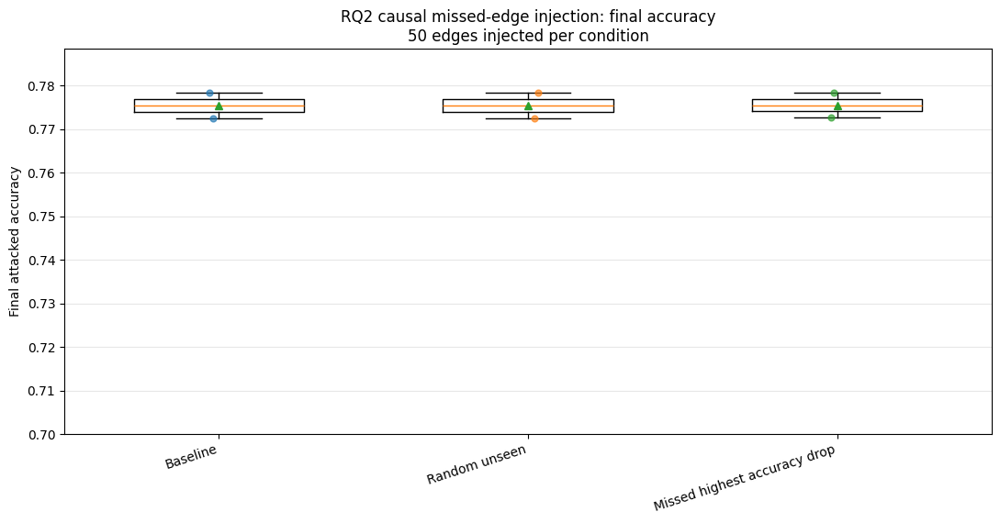

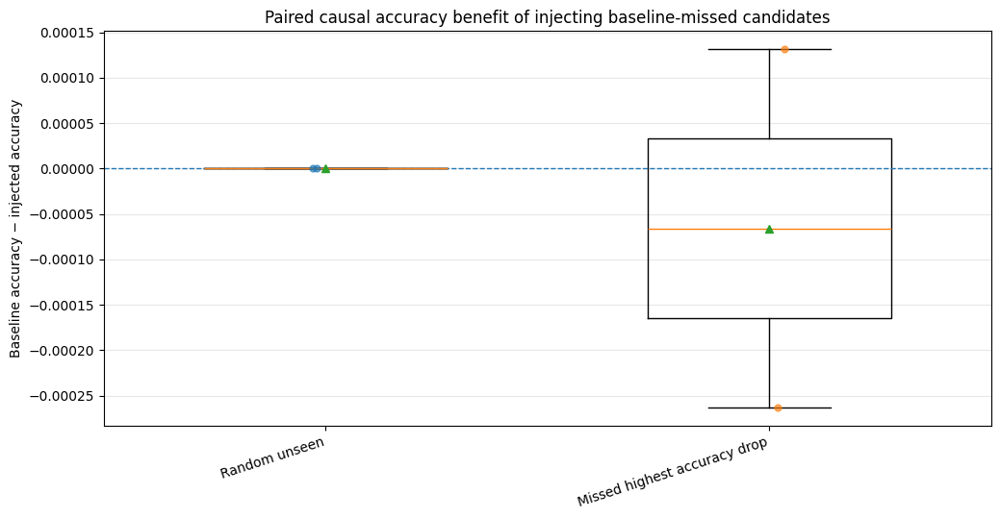

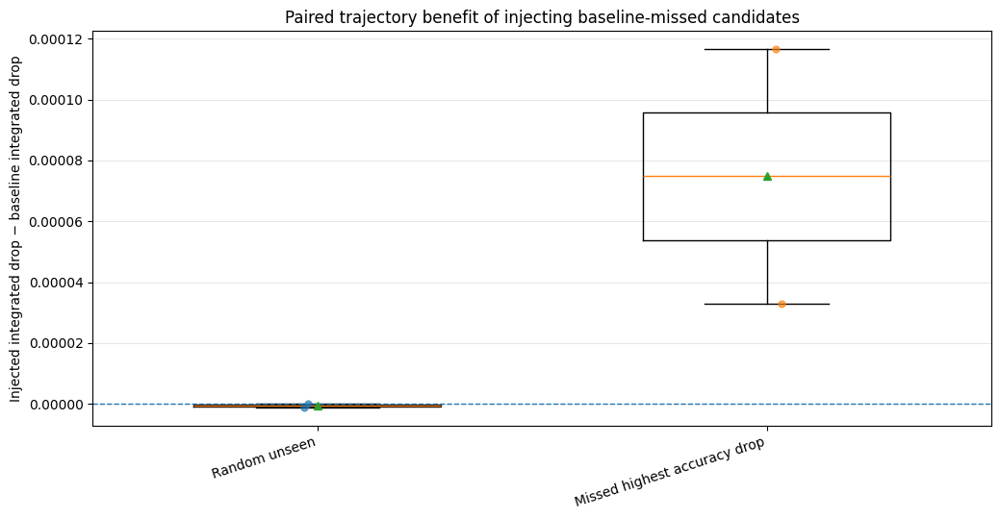

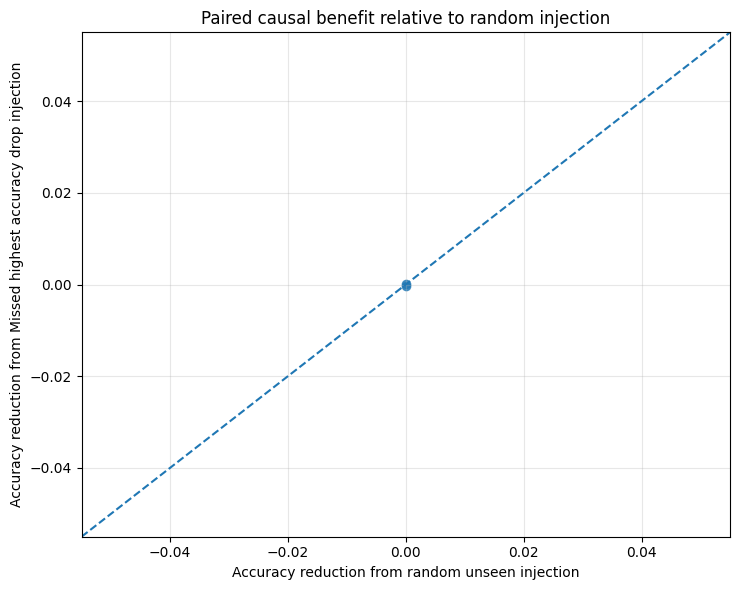

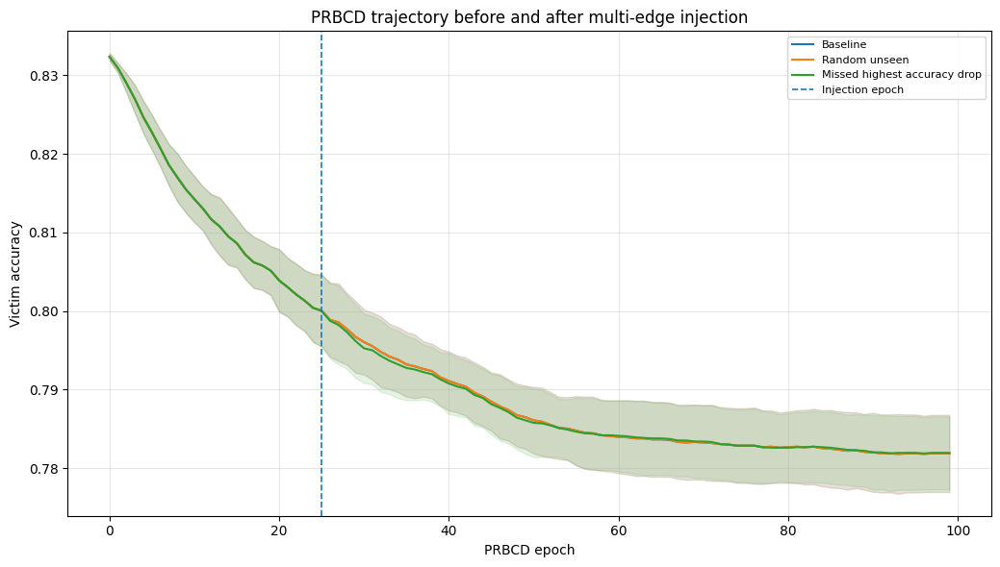

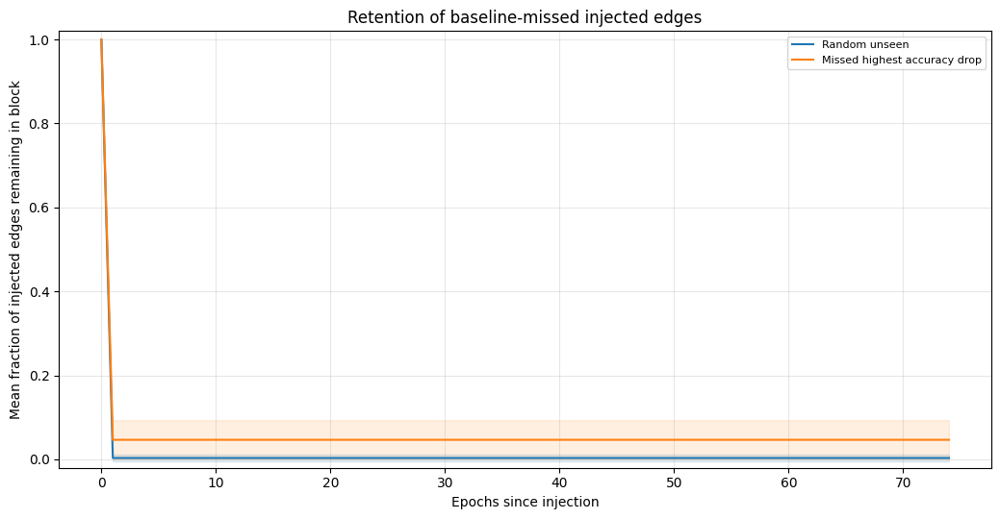

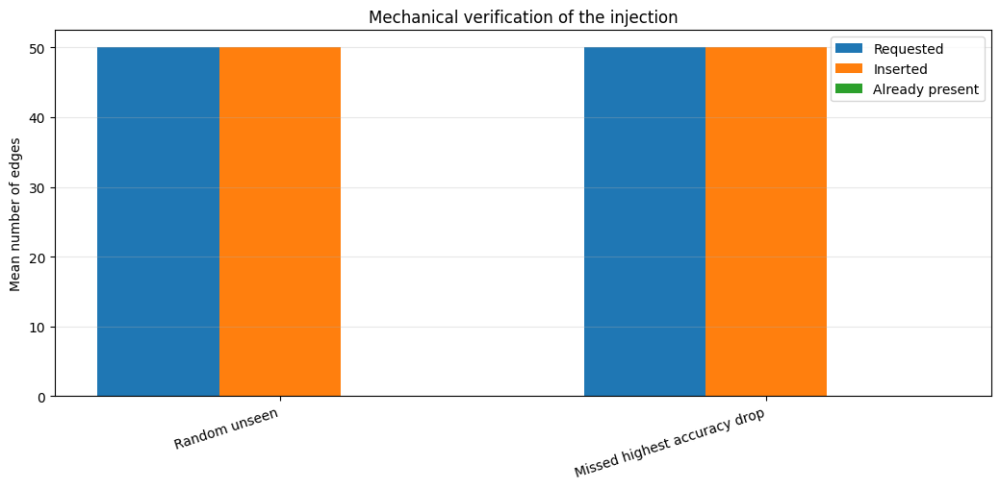

RQ2 injection run report


,condition,n_runs,final_accuracy_mean,final_accuracy_std,n_inserted_mean,final_block_retention_mean,final_selection_fraction_mean
0,accuracy_drop_highest_missed,6,0.775428,0.003737,50.0,0.046667,0.046667
1,baseline,6,0.775362,0.003997,0.0,NaN,NaN
2,random_unseen_control,6,0.775362,0.003997,50.0,0.003333,0.000000



RQ2 paired injection report


,condition,n_pairs,accuracy_reduction_mean,accuracy_reduction_std,integrated_drop_gain_mean,integrated_drop_gain_std
0,accuracy_drop_highest_missed,6,-0.000066,0.000582,7.476886e-05,0.000328
1,random_unseen_control,6,0.000000,0.000000,-6.586313e-07,0.000002



Injection plots saved to: /home/hschult5/AttackerGNN/extendedPlotting/rq2_missed_multi_edge_injection/cora_ml__20260721_133723/plots


In [32]:
# %% [PLOTTING CELL]
# ============================================================
# Standalone RQ2 missed multi-edge injection plots
# ============================================================

from pathlib import Path
import json

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display


# ============================================================
# Select and load an injection run
# ============================================================

RQ2_INJECTION_BASE_OUT_DIR = (
    Path("extendedPlotting")
    / "rq2_missed_multi_edge_injection"
)

# Set to a concrete directory to plot a specific run. With None,
# the cell loads the run stored in latest_run.txt.
RQ2_INJECTION_PLOT_RUN_DIR = None

if RQ2_INJECTION_PLOT_RUN_DIR is None:
    latest_pointer = (
        RQ2_INJECTION_BASE_OUT_DIR
        / "latest_run.txt"
    )
    if not latest_pointer.exists():
        raise FileNotFoundError(
            "No standalone injection run was found. Run the "
            "injection execution cell first."
        )
    RQ2_INJECTION_OUT_DIR = Path(
        latest_pointer.read_text(encoding="utf-8").strip()
    )
else:
    RQ2_INJECTION_OUT_DIR = Path(
        RQ2_INJECTION_PLOT_RUN_DIR
    )

if not RQ2_INJECTION_OUT_DIR.exists():
    raise FileNotFoundError(
        f"Injection run directory does not exist: "
        f"{RQ2_INJECTION_OUT_DIR}"
    )


def _rq2_injection_read_csv(filename):
    path = RQ2_INJECTION_OUT_DIR / filename

    if not path.exists() or path.stat().st_size == 0:
        return pd.DataFrame()

    try:
        return pd.read_csv(path)
    except pd.errors.EmptyDataError:
        # An empty DataFrame without predefined columns can produce
        # a CSV containing only a newline. Treat that file as empty.
        return pd.DataFrame()


rq2_injection_runs_raw_df = _rq2_injection_read_csv(
    "injection_runs_raw.csv"
)
rq2_injection_epochs_raw_df = _rq2_injection_read_csv(
    "injection_epoch_metrics_raw.csv"
)
rq2_injection_edges_raw_df = _rq2_injection_read_csv(
    "injection_edges_raw.csv"
)
rq2_injection_selection_df = _rq2_injection_read_csv(
    "injection_selections.csv"
)
rq2_injection_skips_df = _rq2_injection_read_csv(
    "injection_skipped_groups.csv"
)
rq2_injection_paired_raw_df = _rq2_injection_read_csv(
    "injection_paired_effects_raw.csv"
)

if rq2_injection_runs_raw_df.empty:
    raise RuntimeError(
        "The selected injection run contains no completed runs."
    )

config_path = RQ2_INJECTION_OUT_DIR / "experiment_config.json"
if config_path.exists():
    RQ2_INJECTION_CONFIG = json.loads(
        config_path.read_text(encoding="utf-8")
    )
else:
    RQ2_INJECTION_CONFIG = {}

RQ2_INJECTION_EPOCH = int(
    RQ2_INJECTION_CONFIG.get("injection_epoch", 0)
)
RQ2_INJECTION_N_EDGES = int(
    RQ2_INJECTION_CONFIG.get(
        "n_injection_edges",
        pd.to_numeric(
            rq2_injection_runs_raw_df.get(
                "n_injected",
                pd.Series([0]),
            ),
            errors="coerce",
        ).max(),
    )
)

RQ2_INJECTION_PLOT_DIR = (
    RQ2_INJECTION_OUT_DIR / "plots"
)
RQ2_INJECTION_PLOT_DIR.mkdir(
    parents=True,
    exist_ok=True,
)

RQ2_INJECTION_ACCURACY_YMIN = 0.70
RQ2_INJECTION_JITTER = 0.055

print(
    "Plotting standalone injection run:",
    RQ2_INJECTION_OUT_DIR.resolve(),
)


_rq2_condition_order = [
    "baseline",
    "random_unseen_control",
    "endpoint_label_0_missed",
    "endpoint_label_1_missed",
    "accuracy_drop_highest_missed",
]
_rq2_condition_order = [
    condition
    for condition in _rq2_condition_order
    if condition
    in set(rq2_injection_runs_raw_df["condition"])
]

_rq2_condition_labels = {
    "baseline": "Baseline",
    "random_unseen_control": "Random unseen",
    "endpoint_label_0_missed": "Missed label 0",
    "endpoint_label_1_missed": "Missed label 1",
    "accuracy_drop_highest_missed": (
        "Missed highest accuracy drop"
    ),
}


# Match the RQ1 aggregation logic: average repeats within each
# victim seed before constructing distribution plots.
_rq2_box_run_df = (
    rq2_injection_runs_raw_df
    .groupby(
        [
            "seed",
            "candidate_config_id",
            "endpoint_mining_hop",
            "condition",
        ],
        as_index=False,
    )
    .agg(
        final_accuracy=("final_accuracy", "mean"),
        final_accuracy_drop=("final_accuracy_drop", "mean"),
    )
)

_rq2_box_paired_df = (
    rq2_injection_paired_raw_df
    .groupby(
        [
            "seed",
            "candidate_config_id",
            "endpoint_mining_hop",
            "condition",
        ],
        as_index=False,
    )
    .agg(
        conditional_accuracy_reduction=(
            "conditional_accuracy_reduction",
            "mean",
        ),
        conditional_integrated_drop_gain=(
            "conditional_integrated_drop_gain",
            "mean",
        ),
    )
)


def _rq2_boxplot_with_points(
    ax,
    frame,
    *,
    value_column,
    conditions,
    ylabel,
    title,
    zero_line=False,
):
    plot_data = []
    used_conditions = []

    for condition in conditions:
        values = (
            frame.loc[
                frame["condition"] == condition,
                value_column,
            ]
            .dropna()
            .astype(float)
            .to_numpy()
        )

        if values.size == 0:
            continue

        plot_data.append(values)
        used_conditions.append(condition)

    if not plot_data:
        return []

    positions = np.arange(1, len(plot_data) + 1)

    ax.boxplot(
        plot_data,
        positions=positions,
        widths=0.55,
        showmeans=True,
    )

    rng = np.random.default_rng(12345)
    for position, values in zip(positions, plot_data):
        jitter = rng.uniform(
            -RQ2_INJECTION_JITTER,
            RQ2_INJECTION_JITTER,
            size=len(values),
        )
        ax.scatter(
            np.full(len(values), position) + jitter,
            values,
            alpha=0.65,
            s=24,
            zorder=3,
        )

    if zero_line:
        ax.axhline(
            0.0,
            linestyle="--",
            linewidth=1.0,
        )

    ax.set_xticks(positions)
    ax.set_xticklabels(
        [
            _rq2_condition_labels.get(c, c)
            for c in used_conditions
        ],
        rotation=18,
        ha="right",
    )
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.grid(axis="y", alpha=0.3)

    return used_conditions


# ============================================================
# 1. RQ1-style boxplot: final attacked accuracy
# ============================================================

fig, ax = plt.subplots(figsize=(11, 5.8))

_used = _rq2_boxplot_with_points(
    ax,
    _rq2_box_run_df,
    value_column="final_accuracy",
    conditions=_rq2_condition_order,
    ylabel="Final attacked accuracy",
    title=(
        "RQ2 causal missed-edge injection: final accuracy\n"
        f"{RQ2_INJECTION_N_EDGES} edges injected per condition"
    ),
)

if _used:
    upper = float(
        _rq2_box_run_df["final_accuracy"]
        .dropna()
        .max()
    )
    ax.set_ylim(
        bottom=RQ2_INJECTION_ACCURACY_YMIN,
        top=max(
            RQ2_INJECTION_ACCURACY_YMIN + 0.01,
            upper + 0.01,
        ),
    )

fig.tight_layout()
fig.savefig(
    RQ2_INJECTION_PLOT_DIR
    / "01_final_accuracy_boxplot.png",
    dpi=200,
    bbox_inches="tight",
)
plt.show()


# ============================================================
# 2. RQ1-style boxplot: paired causal accuracy reduction
# ============================================================

if not rq2_injection_paired_raw_df.empty:
    _effect_order = [
        condition
        for condition in _rq2_condition_order
        if condition != "baseline"
    ]

    fig, ax = plt.subplots(figsize=(10.5, 5.5))

    _rq2_boxplot_with_points(
        ax,
        _rq2_box_paired_df,
        value_column="conditional_accuracy_reduction",
        conditions=_effect_order,
        ylabel="Baseline accuracy − injected accuracy",
        title=(
            "Paired causal accuracy benefit of injecting "
            "baseline-missed candidates"
        ),
        zero_line=True,
    )

    fig.tight_layout()
    fig.savefig(
        RQ2_INJECTION_PLOT_DIR
        / "02_paired_accuracy_reduction_boxplot.png",
        dpi=200,
        bbox_inches="tight",
    )
    plt.show()


# ============================================================
# 3. RQ1-style boxplot: paired integrated-drop gain
# ============================================================

if not rq2_injection_paired_raw_df.empty:
    fig, ax = plt.subplots(figsize=(10.5, 5.5))

    _rq2_boxplot_with_points(
        ax,
        _rq2_box_paired_df,
        value_column="conditional_integrated_drop_gain",
        conditions=_effect_order,
        ylabel="Injected integrated drop − baseline integrated drop",
        title=(
            "Paired trajectory benefit of injecting "
            "baseline-missed candidates"
        ),
        zero_line=True,
    )

    fig.tight_layout()
    fig.savefig(
        RQ2_INJECTION_PLOT_DIR
        / "03_paired_integrated_drop_gain_boxplot.png",
        dpi=200,
        bbox_inches="tight",
    )
    plt.show()


# ============================================================
# 4. RQ1-style paired comparison against random injection
# ============================================================

if not rq2_injection_paired_raw_df.empty:
    paired_wide = (
        _rq2_box_paired_df
        .pivot_table(
            index=[
                "seed",
                "candidate_config_id",
                "endpoint_mining_hop",
            ],
            columns="condition",
            values="conditional_accuracy_reduction",
            aggfunc="mean",
        )
        .reset_index()
    )

    harmful_conditions = [
        condition
        for condition in [
            "endpoint_label_1_missed",
            "accuracy_drop_highest_missed",
        ]
        if condition in paired_wide.columns
    ]

    for harmful_condition in harmful_conditions:
        required = {
            "random_unseen_control",
            harmful_condition,
        }
        if not required.issubset(paired_wide.columns):
            continue

        part = paired_wide.dropna(
            subset=list(required)
        )
        if part.empty:
            continue

        fig, ax = plt.subplots(figsize=(7.5, 6))

        ax.scatter(
            part["random_unseen_control"],
            part[harmful_condition],
            alpha=0.75,
        )

        x_limits = ax.get_xlim()
        y_limits = ax.get_ylim()
        low = min(x_limits[0], y_limits[0])
        high = max(x_limits[1], y_limits[1])

        ax.plot(
            [low, high],
            [low, high],
            linestyle="--",
        )
        ax.set_xlim(low, high)
        ax.set_ylim(low, high)

        ax.set_xlabel(
            "Accuracy reduction from random unseen injection"
        )
        ax.set_ylabel(
            "Accuracy reduction from "
            f"{_rq2_condition_labels[harmful_condition]} injection"
        )
        ax.set_title(
            "Paired causal benefit relative to random injection"
        )
        ax.grid(alpha=0.3)

        fig.tight_layout()
        fig.savefig(
            RQ2_INJECTION_PLOT_DIR
            / (
                "04_paired_vs_random__"
                f"{harmful_condition}.png"
            ),
            dpi=200,
            bbox_inches="tight",
        )
        plt.show()


# ============================================================
# 5. Full accuracy trajectory
# ============================================================

_trajectory = (
    rq2_injection_epochs_raw_df[
        rq2_injection_epochs_raw_df["prbcd_epoch"] >= 0
    ]
    .groupby(
        ["condition", "prbcd_epoch"],
        as_index=False,
    )
    .agg(
        accuracy_mean=("accuracy", "mean"),
        accuracy_std=("accuracy", "std"),
        n_runs=("accuracy", "size"),
    )
)
_trajectory["accuracy_std"] = (
    _trajectory["accuracy_std"].fillna(0.0)
)

fig, ax = plt.subplots(figsize=(10.5, 6))

for condition in _rq2_condition_order:
    part = _trajectory[
        _trajectory["condition"] == condition
    ].sort_values("prbcd_epoch")

    if part.empty:
        continue

    line = ax.plot(
        part["prbcd_epoch"],
        part["accuracy_mean"],
        label=_rq2_condition_labels.get(
            condition,
            condition,
        ),
    )[0]

    ax.fill_between(
        part["prbcd_epoch"],
        part["accuracy_mean"] - part["accuracy_std"],
        part["accuracy_mean"] + part["accuracy_std"],
        alpha=0.12,
        color=line.get_color(),
    )

ax.axvline(
    RQ2_INJECTION_EPOCH,
    linestyle="--",
    linewidth=1.2,
    label="Injection epoch",
)

ax.set_xlabel("PRBCD epoch")
ax.set_ylabel("Victim accuracy")
ax.set_title(
    "PRBCD trajectory before and after multi-edge injection"
)
ax.legend(fontsize=8)
ax.grid(alpha=0.3)

fig.tight_layout()
fig.savefig(
    RQ2_INJECTION_PLOT_DIR
    / "05_accuracy_trajectory.png",
    dpi=200,
    bbox_inches="tight",
)
plt.show()


# ============================================================
# 6. Mean retention fraction after intervention
# ============================================================

_retention = rq2_injection_epochs_raw_df[
    (rq2_injection_epochs_raw_df["condition"] != "baseline")
    & (
        rq2_injection_epochs_raw_df["prbcd_epoch"]
        >= RQ2_INJECTION_EPOCH
    )
].copy()

if not _retention.empty:
    _retention["epochs_since_injection"] = (
        _retention["prbcd_epoch"]
        - RQ2_INJECTION_EPOCH
    )

    _retention_summary = (
        _retention
        .groupby(
            ["condition", "epochs_since_injection"],
            as_index=False,
        )
        .agg(
            retention_mean=(
                "injected_edge_retention_fraction",
                "mean",
            ),
            retention_std=(
                "injected_edge_retention_fraction",
                "std",
            ),
        )
    )
    _retention_summary["retention_std"] = (
        _retention_summary["retention_std"]
        .fillna(0.0)
    )

    fig, ax = plt.subplots(figsize=(10.5, 5.5))

    for condition in [
        c for c in _rq2_condition_order
        if c != "baseline"
    ]:
        part = _retention_summary[
            _retention_summary["condition"] == condition
        ].sort_values("epochs_since_injection")

        if part.empty:
            continue

        line = ax.plot(
            part["epochs_since_injection"],
            part["retention_mean"],
            label=_rq2_condition_labels.get(
                condition,
                condition,
            ),
        )[0]

        ax.fill_between(
            part["epochs_since_injection"],
            part["retention_mean"] - part["retention_std"],
            part["retention_mean"] + part["retention_std"],
            alpha=0.12,
            color=line.get_color(),
        )

    ax.set_xlabel("Epochs since injection")
    ax.set_ylabel(
        "Mean fraction of injected edges remaining in block"
    )
    ax.set_ylim(-0.02, 1.02)
    ax.set_title(
        "Retention of baseline-missed injected edges"
    )
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)

    fig.tight_layout()
    fig.savefig(
        RQ2_INJECTION_PLOT_DIR
        / "06_injected_edge_retention.png",
        dpi=200,
        bbox_inches="tight",
    )
    plt.show()


# ============================================================
# 7. Mechanical insertion check
# ============================================================

_mechanical = (
    rq2_injection_runs_raw_df[
        rq2_injection_runs_raw_df["condition"]
        != "baseline"
    ]
    .groupby("condition", as_index=False)
    .agg(
        requested_mean=("n_injected", "mean"),
        inserted_mean=("n_inserted", "mean"),
        already_present_mean=(
            "n_already_present",
            "mean",
        ),
    )
    .set_index("condition")
    .reindex([
        c for c in _rq2_condition_order
        if c != "baseline"
    ])
    .dropna(how="all")
    .reset_index()
)

if not _mechanical.empty:
    x = np.arange(len(_mechanical))
    width = 0.25

    fig, ax = plt.subplots(figsize=(10.5, 5.2))

    ax.bar(
        x - width,
        _mechanical["requested_mean"],
        width,
        label="Requested",
    )
    ax.bar(
        x,
        _mechanical["inserted_mean"],
        width,
        label="Inserted",
    )
    ax.bar(
        x + width,
        _mechanical["already_present_mean"],
        width,
        label="Already present",
    )

    ax.set_xticks(x)
    ax.set_xticklabels(
        [
            _rq2_condition_labels.get(c, c)
            for c in _mechanical["condition"]
        ],
        rotation=18,
        ha="right",
    )
    ax.set_ylabel("Mean number of edges")
    ax.set_title("Mechanical verification of the injection")
    ax.grid(axis="y", alpha=0.3)
    ax.legend()

    fig.tight_layout()
    fig.savefig(
        RQ2_INJECTION_PLOT_DIR
        / "07_injection_mechanical_check.png",
        dpi=200,
        bbox_inches="tight",
    )
    plt.show()


# ============================================================
# Compact reports
# ============================================================

_plot_run_report = (
    rq2_injection_runs_raw_df
    .groupby("condition", as_index=False)
    .agg(
        n_runs=("final_accuracy", "size"),
        final_accuracy_mean=("final_accuracy", "mean"),
        final_accuracy_std=("final_accuracy", "std"),
        n_inserted_mean=("n_inserted", "mean"),
        final_block_retention_mean=(
            "injected_fraction_in_final_block",
            "mean",
        ),
        final_selection_fraction_mean=(
            "injected_fraction_finally_selected",
            "mean",
        ),
    )
)

_plot_paired_report = (
    rq2_injection_paired_raw_df
    .groupby("condition", as_index=False)
    .agg(
        n_pairs=(
            "conditional_accuracy_reduction",
            "size",
        ),
        accuracy_reduction_mean=(
            "conditional_accuracy_reduction",
            "mean",
        ),
        accuracy_reduction_std=(
            "conditional_accuracy_reduction",
            "std",
        ),
        integrated_drop_gain_mean=(
            "conditional_integrated_drop_gain",
            "mean",
        ),
        integrated_drop_gain_std=(
            "conditional_integrated_drop_gain",
            "std",
        ),
    )
)

_plot_run_report.to_csv(
    RQ2_INJECTION_OUT_DIR
    / "injection_plot_run_report.csv",
    index=False,
)
_plot_paired_report.to_csv(
    RQ2_INJECTION_OUT_DIR
    / "injection_plot_paired_report.csv",
    index=False,
)

print("RQ2 injection run report")
display(_plot_run_report)

print("\nRQ2 paired injection report")
display(_plot_paired_report)

print(
    "\nInjection plots saved to:",
    RQ2_INJECTION_PLOT_DIR.resolve(),
)


---

## Experiment 3 — Oracle Evaluation of Joint and Conditional Harmfulness

### Research objective

An edge that is harmful when evaluated individually does not necessarily remain harmful when combined with other perturbations.

The oracle experiment applies candidate perturbations cumulatively and compares two orderings:

1. candidates ordered by their mined harmfulness score;
2. candidates placed in a random order.

For an ordering \(e_1,\ldots,e_n\), define the cumulative perturbation block

\[
B_k=\{e_1,\ldots,e_k\}.
\]

The test accuracy after applying the first \(k\) candidates is

\[
A_k=A(G\oplus B_k).
\]

The experiment first determines whether mined candidates construct a stronger standalone attack than random candidates. It then examines whether each newly added flip block remains harmful under the perturbations already present.

### Execution block

Candidates are added cumulatively in steps of `BLOCK_STEP_ORACLE`.

For every step, the experiment records:

- the previous cumulative block size;
- the new cumulative block size;
- the number of newly added edges;
- accuracy before adding the new flip block;
- accuracy after adding the new flip block;
- cumulative accuracy drop;
- maximum accuracy drop observed so far.

The marginal conditional effect of the newly added flip block is

\[
\Delta A_k
=
A(B_{k-1})-A(B_k).
\]

The newly added block is classified as:

- **conditionally harmful** when \(\Delta A_k>0\);
- **neutral** when \(\Delta A_k\approx 0\);
- **cancelling** when \(\Delta A_k<0\).

With `BLOCK_STEP_ORACLE = 10`, the conditional effect refers to a block of up to ten newly added perturbations. Setting the value to one produces an individual-edge conditional analysis.

In [22]:
#%%
# ============================================================
# RQ2: Mode-aware oracle evaluation
#
# endpoint:
#   - preserves the original binary-label behavior
#   - descending binary labels versus one random ordering
#   - preserves the exact n_positive prefix analysis
#
# subset_accuracy_drop:
#   - ranks observed candidates by continuous score_raw
#   - compares descending, ascending, and repeated random orderings
#   - evaluates exact fixed budget fractions and a focused top-10% budget
#
# Random repetitions are averaged within each victim seed before results
# are aggregated across seeds. The victim seed therefore remains the
# principal experimental unit.
# ============================================================

from helpers.selector_pipeline_helpers import accuracy
from pathlib import Path
from tqdm.auto import tqdm
from IPython.display import display

import pandas as pd
import numpy as np
import re
import torch


# ============================================================
# Configuration
# ============================================================

# Set to 1 for an individual-edge conditional analysis.
# With 10, each delta describes a block of up to ten new flips.
BLOCK_STEP_ORACLE = 10

CONDITIONAL_EFFECT_TOL = 1e-10

# Fractions of total accuracy:
# 0.01 corresponds to one percentage point.
FIXED_ACCURACY_REDUCTIONS = [0.01, 0.02, 0.05]

# Exact candidate-budget fractions evaluated for every ordering.
# These are especially important for continuous subset scores, where there
# is no natural binary positive-prefix length.
ORACLE_FIXED_BUDGET_FRACTIONS = [
    0.01,
    0.02,
    0.05,
    0.10,
    0.20,
    0.50,
    1.00,
]

# For subset scoring, the focused prefix is an equal 10% candidate budget:
# descending = highest-scored 10%, ascending = lowest-scored 10%, and random
# = a random 10% control.
ORACLE_SUBSET_FOCUS_FRACTION = 0.10

# Endpoint behavior remains one random ordering, as in the original cell.
ORACLE_ENDPOINT_RANDOM_REPEATS = 1

# Continuous-score oracle uses repeated random controls. These repetitions
# are averaged within seed before aggregation across victim seeds.
ORACLE_SUBSET_RANDOM_REPEATS = 10

ORACLE_OUT_DIR = (
    Path("extendedPlotting")
    / "oracle_checks_multiseed"
)
PARTS_DIR = ORACLE_OUT_DIR / "parts"
PLOTS_DIR = ORACLE_OUT_DIR / "plots"

ORACLE_OUT_DIR.mkdir(parents=True, exist_ok=True)
PARTS_DIR.mkdir(parents=True, exist_ok=True)
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

RESUME_FROM_PARTS = True

# Old binary-positive-prefix parts must not be loaded into this mode-aware
# experiment.
ORACLE_SCHEMA_VERSION = "mode_aware_oracle_v4"


# ============================================================
# Helpers
# ============================================================

def _oracle_safe(value):
    return re.sub(
        r"[^a-zA-Z0-9_.=-]+",
        "_",
        str(value),
    ).strip("_")


def _flip_candidate_inplace(adj, run, candidate_index):
    u = int(run["cand_src"][candidate_index])
    v = int(run["cand_dst"][candidate_index])
    exists = float(run["exists_list"][candidate_index])

    adj[u, v] = 0.0 if exists else 1.0
    adj[v, u] = 0.0 if exists else 1.0


def _classify_conditional_effect(
    delta_accuracy,
    tolerance=CONDITIONAL_EFFECT_TOL,
):
    """
    delta_accuracy = previous_accuracy - current_accuracy

    Positive: conditionally harmful.
    Approximately zero: neutral.
    Negative: cancelling.
    """
    if pd.isna(delta_accuracy):
        return "baseline"

    if delta_accuracy > tolerance:
        return "conditionally_harmful"

    if delta_accuracy < -tolerance:
        return "cancelling"

    return "neutral"


def _threshold_column_name(threshold):
    percentage_points = float(threshold) * 100
    threshold_text = f"{percentage_points:g}".replace(".", "p")
    return f"edges_to_{threshold_text}pp_drop"


def _fraction_column_name(fraction):
    percentage = float(fraction) * 100
    text = f"{percentage:g}".replace(".", "p")
    return f"at_{text}pct_budget"


def _fraction_to_k(fraction, n_candidates):
    """Convert a positive candidate fraction to a reproducible exact budget."""
    n_candidates = int(n_candidates)
    if n_candidates <= 0:
        return 0

    fraction = float(fraction)
    if not 0.0 < fraction <= 1.0:
        raise ValueError(
            f"Budget fractions must lie in (0, 1], got {fraction}."
        )

    return min(
        n_candidates,
        max(1, int(np.ceil(fraction * n_candidates))),
    )


def _deterministic_score_order(scores, *, descending):
    """Sort by score with candidate index as a deterministic tie-break."""
    scores = np.asarray(scores, dtype=np.float64).reshape(-1)
    if not np.isfinite(scores).all():
        raise ValueError("Oracle ranking scores must all be finite.")

    candidate_index = np.arange(scores.size, dtype=np.int64)
    primary = -scores if descending else scores
    return np.lexsort((candidate_index, primary)).astype(np.int64)


def _resolve_oracle_target(run):
    """Return mode-specific ranking data and focused-prefix metadata."""
    scoring_mode = str(run["scoring_mode"])
    n_cands = int(run["n_cands"])

    if scoring_mode == "endpoint":
        labels = (
            torch.as_tensor(run["labels_changed"])
            .detach()
            .cpu()
            .float()
            .flatten()
            .numpy()
        )

        if labels.size != n_cands:
            raise ValueError(
                "Endpoint labels_changed and n_cands are inconsistent for "
                f"{run['candidate_config_id']}."
            )

        # Endpoint labels must stay binary. No continuous adaptation is applied.
        if not np.all(np.isclose(labels, 0.0) | np.isclose(labels, 1.0)):
            raise ValueError(
                "Endpoint oracle expected binary labels in {0, 1}."
            )

        n_positive = int(np.sum(labels > 0.5))
        focus_limit = n_positive

        return {
            "target_kind": "binary",
            "ranking_score_name": "endpoint_label",
            "ranking_scores": labels.astype(np.float64),
            "n_positive_examples": n_positive,
            "positive_rate": n_positive / max(1, n_cands),
            "focus_prefix_name": "positive_label_prefix",
            "focus_prefix_limit": focus_limit,
            "focus_prefix_fraction": focus_limit / max(1, n_cands),
            "random_repeats": int(ORACLE_ENDPOINT_RANDOM_REPEATS),
            "constant_score_run": bool(np.ptp(labels) <= 1e-12),
        }

    if scoring_mode == "subset_accuracy_drop":
        scores = np.asarray(
            run.get("score_raw", run.get("labels_raw")),
            dtype=np.float64,
        ).reshape(-1)

        if scores.size != n_cands:
            raise ValueError(
                "subset score_raw and n_cands are inconsistent for "
                f"{run['candidate_config_id']}."
            )

        if not np.isfinite(scores).all():
            raise ValueError(
                "subset oracle requires finite score_raw values. "
                "Unobserved candidates should already have been removed."
            )

        focus_limit = _fraction_to_k(
            ORACLE_SUBSET_FOCUS_FRACTION,
            n_cands,
        )

        return {
            "target_kind": "continuous",
            "ranking_score_name": "mean_harmful_drop_when_selected",
            "ranking_scores": scores,
            # Deliberately not defined for continuous labels.
            "n_positive_examples": np.nan,
            "positive_rate": np.nan,
            "focus_prefix_name": (
                f"top_{100 * ORACLE_SUBSET_FOCUS_FRACTION:g}pct_budget"
            ),
            "focus_prefix_limit": focus_limit,
            "focus_prefix_fraction": focus_limit / max(1, n_cands),
            "random_repeats": int(ORACLE_SUBSET_RANDOM_REPEATS),
            "constant_score_run": bool(np.ptp(scores) <= 1e-12),
        }

    raise ValueError(
        f"Unsupported scoring_mode={scoring_mode!r}. "
        "Expected 'endpoint' or 'subset_accuracy_drop'."
    )


def _build_attack_orders(run, target_info, run_index):
    """Construct mode-specific deterministic and random oracle orderings."""
    scoring_mode = str(run["scoring_mode"])
    scores = target_info["ranking_scores"]
    n_cands = int(run["n_cands"])
    seed = int(run["seed"])
    hop = int(run.get("endpoint_mining_hop", 0))

    orders = []

    if scoring_mode == "endpoint":
        # Preserve the original endpoint ordering exactly, including the
        # existing tie behavior of torch.argsort for binary labels.
        order_top = (
            torch.as_tensor(scores, dtype=torch.float32)
            .argsort(descending=True)
            .cpu()
            .numpy()
            .astype(np.int64)
        )
        orders.append({
            "attack": "top-k by mined label",
            "attack_family": "descending",
            "random_repeat": 0,
            "order": order_top,
        })

    else:
        order_top = _deterministic_score_order(
            scores,
            descending=True,
        )
        order_bottom = _deterministic_score_order(
            scores,
            descending=False,
        )

        orders.extend([
            {
                "attack": "top-k by subset score",
                "attack_family": "descending",
                "random_repeat": 0,
                "order": order_top,
            },
            {
                "attack": "bottom-k by subset score",
                "attack_family": "ascending",
                "random_repeat": 0,
                "order": order_bottom,
            },
        ])

    random_repeats = int(target_info["random_repeats"])
    if random_repeats <= 0:
        raise ValueError("The number of random oracle repetitions must be positive.")

    for random_repeat in range(random_repeats):
        rng_seed = (
            seed
            + 1009 * int(run_index)
            + 31 * hop
            + n_cands
            + 104729 * random_repeat
        )
        rng = np.random.default_rng(rng_seed)
        orders.append({
            "attack": "random candidates",
            "attack_family": "random",
            "random_repeat": int(random_repeat),
            "order": rng.permutation(n_cands).astype(np.int64),
        })

    return orders


def _build_block_sizes(n_cands, target_info):
    """Include regular steps and all exact mode-aware evaluation budgets."""
    n_cands = int(n_cands)

    sizes = set(
        range(
            0,
            n_cands + 1,
            int(BLOCK_STEP_ORACLE),
        )
    )
    sizes.update({0, n_cands})

    focus_limit = int(target_info["focus_prefix_limit"])
    if 0 <= focus_limit <= n_cands:
        sizes.add(focus_limit)

    # Do not insert new evaluation points into endpoint trajectories: doing so
    # would split the original blocks and change endpoint conditional-effect
    # statistics. Exact fixed-fraction budgets are added only for the
    # continuous subset-score oracle.
    if target_info["target_kind"] == "continuous":
        for fraction in ORACLE_FIXED_BUDGET_FRACTIONS:
            sizes.add(_fraction_to_k(fraction, n_cands))

    return sorted(
        int(k)
        for k in sizes
        if 0 <= int(k) <= n_cands
    )


def _build_oracle_run_metrics(step_frame):
    """
    Convert step trajectories into one row per seed, candidate configuration,
    ordering, and random repetition.
    """
    if step_frame is None or step_frame.empty:
        return pd.DataFrame()

    run_rows = []

    run_group_cols = [
        "seed",
        "candidate_config_id",
        "candidate_set_size",
        "prbcd_candidate_fraction",
        "actual_prbcd_fraction",
        "scoring_mode",
        "target_kind",
        "ranking_score_name",
        "endpoint_mining_hop",
        "attack",
        "attack_family",
        "random_repeat",
    ]

    for key, group in step_frame.groupby(
        run_group_cols,
        dropna=False,
    ):
        group = (
            group
            .sort_values("k")
            .reset_index(drop=True)
        )

        addition_steps = group[
            group["n_edges_added"] > 0
        ].copy()

        harmful_steps = addition_steps[
            addition_steps["conditional_effect"]
            == "conditionally_harmful"
        ]

        neutral_steps = addition_steps[
            addition_steps["conditional_effect"]
            == "neutral"
        ]

        cancelling_steps = addition_steps[
            addition_steps["conditional_effect"]
            == "cancelling"
        ]

        n_steps = int(len(addition_steps))
        n_harmful = int(len(harmful_steps))
        n_neutral = int(len(neutral_steps))
        n_cancelling = int(len(cancelling_steps))

        final_row = group.iloc[-1]

        max_drop_position = (
            group["cumulative_accuracy_drop"]
            .astype(float)
            .idxmax()
        )
        max_drop_row = group.loc[max_drop_position]

        row = {
            **dict(zip(run_group_cols, key)),

            "clean_accuracy": float(
                group["clean_accuracy"].iloc[0]
            ),
            "n_candidates": int(
                group["n_candidates"].iloc[0]
            ),
            "n_positive_examples": float(
                group["n_positive_examples"].iloc[0]
            ),
            "positive_rate": float(
                group["positive_rate"].iloc[0]
            ),
            "focus_prefix_name": str(
                group["focus_prefix_name"].iloc[0]
            ),
            "focus_prefix_limit": int(
                group["focus_prefix_limit"].iloc[0]
            ),
            "focus_prefix_fraction": float(
                group["focus_prefix_fraction"].iloc[0]
            ),
            "constant_score_run": bool(
                group["constant_score_run"].iloc[0]
            ),

            "final_k": int(final_row["k"]),
            "final_test_accuracy": float(
                final_row["test_accuracy"]
            ),
            "final_cumulative_accuracy_drop": float(
                final_row["cumulative_accuracy_drop"]
            ),

            "maximum_achieved_accuracy_drop": float(
                max_drop_row["cumulative_accuracy_drop"]
            ),
            "k_at_maximum_accuracy_drop": int(
                max_drop_row["k"]
            ),
            "budget_fraction_at_maximum_accuracy_drop": float(
                max_drop_row["budget_fraction"]
            ),

            "n_addition_steps": n_steps,
            "n_conditionally_harmful_steps": n_harmful,
            "n_neutral_steps": n_neutral,
            "n_cancelling_steps": n_cancelling,

            "proportion_conditionally_harmful": (
                n_harmful / n_steps
                if n_steps > 0
                else np.nan
            ),
            "proportion_neutral": (
                n_neutral / n_steps
                if n_steps > 0
                else np.nan
            ),
            "proportion_cancelling": (
                n_cancelling / n_steps
                if n_steps > 0
                else np.nan
            ),

            "largest_harmful_step": (
                float(harmful_steps["delta_accuracy"].max())
                if not harmful_steps.empty
                else np.nan
            ),
            "largest_cancelling_step": (
                float(cancelling_steps["delta_accuracy"].min())
                if not cancelling_steps.empty
                else np.nan
            ),
        }

        for threshold in FIXED_ACCURACY_REDUCTIONS:
            column = _threshold_column_name(threshold)

            reached = group[
                group["cumulative_accuracy_drop"]
                >= float(threshold) - CONDITIONAL_EFFECT_TOL
            ]

            row[column] = (
                int(reached["k"].min())
                if not reached.empty
                else np.nan
            )

        if (
            n_harmful
            + n_neutral
            + n_cancelling
            != n_steps
        ):
            raise RuntimeError(
                "Conditional-effect categories do not sum "
                "to the number of addition steps."
            )

        run_rows.append(row)

    return pd.DataFrame(run_rows)


def _average_random_repeats_within_seed(
    frame,
    *,
    id_columns,
    numeric_columns,
):
    """
    Average repeated random orderings within each victim seed.

    Deterministic attacks have one repetition, so they pass through unchanged.
    """
    if frame is None or frame.empty:
        return pd.DataFrame()

    available_numeric = [
        column
        for column in numeric_columns
        if column in frame.columns
    ]

    grouped = (
        frame
        .groupby(id_columns, dropna=False)[available_numeric]
        .mean()
        .reset_index()
    )

    repeat_counts = (
        frame
        .groupby(id_columns, dropna=False)["random_repeat"]
        .nunique()
        .rename("n_ordering_repetitions")
        .reset_index()
    )

    return grouped.merge(
        repeat_counts,
        on=id_columns,
        how="left",
    )


def _build_fixed_budget_endpoint_table(step_frame):
    """Select the exact row corresponding to every requested budget fraction."""
    if step_frame is None or step_frame.empty:
        return pd.DataFrame()

    rows = []

    group_cols = [
        "seed",
        "candidate_config_id",
        "candidate_set_size",
        "prbcd_candidate_fraction",
        "actual_prbcd_fraction",
        "scoring_mode",
        "target_kind",
        "ranking_score_name",
        "endpoint_mining_hop",
        "attack",
        "attack_family",
        "random_repeat",
    ]

    # The endpoint trajectory intentionally keeps its old block grid. Exact
    # fixed-fraction endpoints are therefore reported only for continuous
    # subset_accuracy_drop runs.
    subset_frame = step_frame[
        step_frame["scoring_mode"] == "subset_accuracy_drop"
    ].copy()

    for key, group in subset_frame.groupby(group_cols, dropna=False):
        group = group.sort_values("k")
        n_candidates = int(group["n_candidates"].iloc[0])

        for requested_fraction in ORACLE_FIXED_BUDGET_FRACTIONS:
            requested_k = _fraction_to_k(
                requested_fraction,
                n_candidates,
            )

            selected = group[group["k"] == requested_k]
            if selected.empty:
                raise RuntimeError(
                    "An exact fixed-budget oracle endpoint was not "
                    f"evaluated: fraction={requested_fraction}, k={requested_k}."
                )

            source_row = selected.iloc[0].to_dict()
            source_row.update({
                "requested_budget_fraction": float(requested_fraction),
                "requested_k": int(requested_k),
            })
            rows.append(source_row)

    return pd.DataFrame(rows)


REQUIRED_MODE_AWARE_COLUMNS = {
    "previous_k",
    "n_edges_added",
    "previous_test_accuracy",
    "delta_accuracy",
    "conditional_effect",
    "is_conditionally_harmful",
    "is_neutral",
    "is_cancelling",
    "cumulative_accuracy_drop",
    "maximum_accuracy_drop_so_far",
    "target_kind",
    "ranking_score_name",
    "focus_prefix_name",
    "focus_prefix_limit",
    "within_focus_prefix",
    "is_focus_prefix_endpoint",
    "attack_family",
    "random_repeat",
    "budget_fraction",
    "selected_score_sum",
    "selected_score_mean",
    "score_mass_captured_fraction",
}


# ============================================================
# Execute oracle trajectories
# ============================================================

if int(BLOCK_STEP_ORACLE) <= 0:
    raise ValueError("BLOCK_STEP_ORACLE must be positive.")

if int(ORACLE_ENDPOINT_RANDOM_REPEATS) <= 0:
    raise ValueError("ORACLE_ENDPOINT_RANDOM_REPEATS must be positive.")

if int(ORACLE_SUBSET_RANDOM_REPEATS) <= 0:
    raise ValueError("ORACLE_SUBSET_RANDOM_REPEATS must be positive.")

oracle_frames = []

for run_index, run in enumerate(mining_runs):
    seed = int(run["seed"])
    scoring_mode = str(run["scoring_mode"])

    part_csv = PARTS_DIR / (
        f"oracle__{ORACLE_SCHEMA_VERSION}"
        f"__seed-{seed}"
        f"__{_oracle_safe(run['candidate_config_id'])}"
        f"__mode-{_oracle_safe(scoring_mode)}"
        f"__h-{run['endpoint_mining_hop']}"
        f"__endpointRandom-{ORACLE_ENDPOINT_RANDOM_REPEATS}"
        f"__subsetRandom-{ORACLE_SUBSET_RANDOM_REPEATS}"
        f"__subsetFocus-{_oracle_safe(ORACLE_SUBSET_FOCUS_FRACTION)}"
        f"__budgets-{_oracle_safe('-'.join(map(str, ORACLE_FIXED_BUDGET_FRACTIONS)))}.csv"
    )

    if RESUME_FROM_PARTS and part_csv.exists():
        cached_df = pd.read_csv(part_csv)

        if REQUIRED_MODE_AWARE_COLUMNS.issubset(
            cached_df.columns
        ):
            oracle_frames.append(cached_df)
            print("Loaded:", part_csv)
            continue

        print(
            "Outdated cached oracle schema; recomputing:",
            part_csv,
        )

    context = run["context"]
    set_global_seed(seed)

    n_cands = int(run["n_cands"])
    if n_cands <= 0:
        raise ValueError(
            f"Oracle received no candidates for {run['candidate_config_id']}."
        )

    target_info = _resolve_oracle_target(run)
    ranking_scores = np.asarray(
        target_info["ranking_scores"],
        dtype=np.float64,
    )

    attack_orders = _build_attack_orders(
        run,
        target_info,
        run_index,
    )
    block_sizes = _build_block_sizes(
        n_cands,
        target_info,
    )

    total_score_mass = float(np.clip(ranking_scores, 0.0, None).sum())

    if target_info["constant_score_run"]:
        print(
            f"[ORACLE WARNING] Constant ranking scores for seed={seed}, "
            f"config={run['candidate_config_id']}, mode={scoring_mode}. "
            "Descending and ascending rankings contain no score information."
        )

    rows = []

    for attack_spec in attack_orders:
        attack_name = attack_spec["attack"]
        attack_family = attack_spec["attack_family"]
        random_repeat = int(attack_spec["random_repeat"])
        order = np.asarray(attack_spec["order"], dtype=np.int64)

        if order.size != n_cands or np.unique(order).size != n_cands:
            raise ValueError(
                f"Invalid oracle ordering for {attack_name}: expected a "
                "permutation of all candidate indices."
            )

        adj = run["adj_orig"].clone()

        previous_k = 0
        previous_accuracy = None
        clean_accuracy = None
        maximum_drop_so_far = 0.0

        progress = tqdm(
            block_sizes,
            desc=(
                f"oracle seed={seed} "
                f"{run_index + 1}/{len(mining_runs)} "
                f"{attack_name} r={random_repeat}"
            ),
            leave=False,
        )

        for k in progress:
            k = int(k)

            newly_added_positions = order[previous_k:k]

            for candidate_index in newly_added_positions.tolist():
                _flip_candidate_inplace(
                    adj,
                    run,
                    candidate_index,
                )

            test_accuracy = float(
                accuracy(
                    context["model"],
                    context["attr"],
                    context["labels"],
                    context["idx_test"],
                    edge_index=adj,
                )
            )

            if clean_accuracy is None:
                clean_accuracy = test_accuracy

            n_edges_added = int(k - previous_k)

            if previous_accuracy is None:
                delta_accuracy = np.nan
            else:
                delta_accuracy = float(
                    previous_accuracy - test_accuracy
                )

            conditional_effect = _classify_conditional_effect(
                delta_accuracy
            )

            cumulative_accuracy_drop = float(
                clean_accuracy - test_accuracy
            )

            maximum_drop_so_far = max(
                maximum_drop_so_far,
                cumulative_accuracy_drop,
            )

            selected_indices = order[:k]
            selected_scores = ranking_scores[selected_indices]
            selected_positive_scores = np.clip(
                selected_scores,
                0.0,
                None,
            )

            selected_score_sum = float(selected_scores.sum())
            selected_score_mean = (
                float(selected_scores.mean())
                if selected_scores.size
                else np.nan
            )
            score_mass_captured_fraction = (
                float(selected_positive_scores.sum() / total_score_mass)
                if total_score_mass > 1e-12
                else np.nan
            )

            focus_limit = int(target_info["focus_prefix_limit"])

            rows.append({
                "seed": seed,
                "candidate_config_id": run[
                    "candidate_config_id"
                ],
                "candidate_set_size": int(
                    run["candidate_set_size"]
                ),
                "prbcd_candidate_fraction": float(
                    run["prbcd_candidate_fraction"]
                ),
                "actual_prbcd_fraction": float(
                    run["actual_prbcd_fraction"]
                ),
                "scoring_mode": scoring_mode,
                "target_kind": target_info["target_kind"],
                "ranking_score_name": target_info[
                    "ranking_score_name"
                ],
                "endpoint_mining_hop": int(
                    run["endpoint_mining_hop"]
                ),

                "mining_clean_accuracy": float(
                    run["clean_accuracy"]
                ),
                "clean_accuracy": float(clean_accuracy),

                "n_candidates": n_cands,
                "n_positive_examples": target_info[
                    "n_positive_examples"
                ],
                "positive_rate": target_info["positive_rate"],

                "focus_prefix_name": target_info[
                    "focus_prefix_name"
                ],
                "focus_prefix_limit": focus_limit,
                "focus_prefix_fraction": target_info[
                    "focus_prefix_fraction"
                ],
                "within_focus_prefix": bool(
                    k <= focus_limit
                ),
                "is_focus_prefix_endpoint": bool(
                    k == focus_limit
                ),

                # Compatibility columns: meaningful only for endpoint mode.
                "positive_prefix_limit": (
                    focus_limit
                    if scoring_mode == "endpoint"
                    else np.nan
                ),
                "within_positive_prefix": (
                    bool(k <= focus_limit)
                    if scoring_mode == "endpoint"
                    else False
                ),
                "is_positive_prefix_endpoint": (
                    bool(k == focus_limit)
                    if scoring_mode == "endpoint"
                    else False
                ),

                "constant_score_run": bool(
                    target_info["constant_score_run"]
                ),

                "attack": attack_name,
                "attack_family": attack_family,
                "random_repeat": random_repeat,

                "previous_k": int(previous_k),
                "k": int(k),
                "budget_fraction": float(k / n_cands),
                "n_edges_added": n_edges_added,

                "previous_test_accuracy": (
                    float(previous_accuracy)
                    if previous_accuracy is not None
                    else np.nan
                ),
                "test_accuracy": test_accuracy,

                "delta_accuracy": delta_accuracy,
                "conditional_effect": conditional_effect,

                "is_conditionally_harmful": (
                    np.nan
                    if n_edges_added == 0
                    else float(
                        conditional_effect
                        == "conditionally_harmful"
                    )
                ),
                "is_neutral": (
                    np.nan
                    if n_edges_added == 0
                    else float(
                        conditional_effect == "neutral"
                    )
                ),
                "is_cancelling": (
                    np.nan
                    if n_edges_added == 0
                    else float(
                        conditional_effect == "cancelling"
                    )
                ),

                "cumulative_accuracy_drop": (
                    cumulative_accuracy_drop
                ),
                "maximum_accuracy_drop_so_far": (
                    maximum_drop_so_far
                ),

                "selected_score_sum": selected_score_sum,
                "selected_score_mean": selected_score_mean,
                "score_mass_captured_fraction": (
                    score_mass_captured_fraction
                ),
            })

            previous_k = k
            previous_accuracy = test_accuracy

    run_df = pd.DataFrame(rows)
    run_df.to_csv(part_csv, index=False)
    oracle_frames.append(run_df)


# ============================================================
# Combine full trajectories
# ============================================================

oracle_raw_df = (
    pd.concat(
        oracle_frames,
        ignore_index=True,
    )
    if oracle_frames
    else pd.DataFrame()
)

if oracle_raw_df.empty:
    raise RuntimeError(
        "Oracle evaluation produced no rows."
    )


# ============================================================
# Average repeated random orderings within seed
# ============================================================

oracle_step_seed_id_cols = [
    "seed",
    "candidate_config_id",
    "candidate_set_size",
    "prbcd_candidate_fraction",
    "scoring_mode",
    "target_kind",
    "ranking_score_name",
    "focus_prefix_name",
    "endpoint_mining_hop",
    "k",
    "budget_fraction",
    "attack",
    "attack_family",
]

oracle_step_metrics = [
    "actual_prbcd_fraction",
    "clean_accuracy",
    "n_candidates",
    "n_positive_examples",
    "positive_rate",
    "focus_prefix_limit",
    "focus_prefix_fraction",
    "n_edges_added",
    "test_accuracy",
    "delta_accuracy",
    "is_conditionally_harmful",
    "is_neutral",
    "is_cancelling",
    "cumulative_accuracy_drop",
    "maximum_accuracy_drop_so_far",
    "selected_score_sum",
    "selected_score_mean",
    "score_mass_captured_fraction",
]

oracle_seed_step_df = _average_random_repeats_within_seed(
    oracle_raw_df,
    id_columns=oracle_step_seed_id_cols,
    numeric_columns=oracle_step_metrics,
)

oracle_step_group_cols = [
    column
    for column in oracle_step_seed_id_cols
    if column != "seed"
]

oracle_summary_df = aggregate_over_seeds(
    oracle_seed_step_df,
    oracle_step_group_cols,
    oracle_step_metrics + ["n_ordering_repetitions"],
)


# ============================================================
# Full-trajectory run-level report
# ============================================================

oracle_run_raw_df = _build_oracle_run_metrics(
    oracle_raw_df
)

threshold_metric_columns = [
    _threshold_column_name(threshold)
    for threshold in FIXED_ACCURACY_REDUCTIONS
]

oracle_run_metrics = [
    "actual_prbcd_fraction",
    "clean_accuracy",
    "n_candidates",
    "n_positive_examples",
    "positive_rate",
    "focus_prefix_limit",
    "focus_prefix_fraction",
    "constant_score_run",
    "final_k",
    "final_test_accuracy",
    "final_cumulative_accuracy_drop",
    "maximum_achieved_accuracy_drop",
    "k_at_maximum_accuracy_drop",
    "budget_fraction_at_maximum_accuracy_drop",

    "n_addition_steps",
    "n_conditionally_harmful_steps",
    "n_neutral_steps",
    "n_cancelling_steps",

    "proportion_conditionally_harmful",
    "proportion_neutral",
    "proportion_cancelling",

    "largest_harmful_step",
    "largest_cancelling_step",

    *threshold_metric_columns,
]

oracle_run_seed_id_cols = [
    "seed",
    "candidate_config_id",
    "candidate_set_size",
    "prbcd_candidate_fraction",
    "scoring_mode",
    "target_kind",
    "ranking_score_name",
    "focus_prefix_name",
    "endpoint_mining_hop",
    "attack",
    "attack_family",
]

oracle_seed_run_df = _average_random_repeats_within_seed(
    oracle_run_raw_df,
    id_columns=oracle_run_seed_id_cols,
    numeric_columns=oracle_run_metrics,
)

oracle_run_group_cols = [
    column
    for column in oracle_run_seed_id_cols
    if column != "seed"
]

oracle_run_summary_df = aggregate_over_seeds(
    oracle_seed_run_df,
    oracle_run_group_cols,
    oracle_run_metrics + ["n_ordering_repetitions"],
)


# ============================================================
# Mode-aware focused-prefix analysis
#
# endpoint:
#   exact binary positive-label prefix.
#
# subset_accuracy_drop:
#   exact equal candidate budget given by ORACLE_SUBSET_FOCUS_FRACTION.
#   Descending, ascending, and random attacks therefore use the same k.
# ============================================================

oracle_focus_prefix_raw_df = oracle_raw_df[
    (oracle_raw_df["focus_prefix_limit"] > 0)
    & (
        oracle_raw_df["k"]
        <= oracle_raw_df["focus_prefix_limit"]
    )
].copy()

if oracle_focus_prefix_raw_df.empty:
    oracle_focus_prefix_seed_df = pd.DataFrame()
    oracle_focus_prefix_summary_df = pd.DataFrame()
    oracle_focus_prefix_run_raw_df = pd.DataFrame()
    oracle_focus_prefix_seed_run_df = pd.DataFrame()
    oracle_focus_prefix_run_summary_df = pd.DataFrame()
    oracle_focus_prefix_endpoint_raw_df = pd.DataFrame()
    oracle_focus_prefix_endpoint_seed_df = pd.DataFrame()
    oracle_focus_prefix_endpoint_summary_df = pd.DataFrame()
else:
    oracle_focus_prefix_seed_df = _average_random_repeats_within_seed(
        oracle_focus_prefix_raw_df,
        id_columns=oracle_step_seed_id_cols,
        numeric_columns=oracle_step_metrics,
    )

    oracle_focus_prefix_summary_df = aggregate_over_seeds(
        oracle_focus_prefix_seed_df,
        oracle_step_group_cols,
        oracle_step_metrics + ["n_ordering_repetitions"],
    )

    oracle_focus_prefix_run_raw_df = _build_oracle_run_metrics(
        oracle_focus_prefix_raw_df
    )

    oracle_focus_prefix_seed_run_df = _average_random_repeats_within_seed(
        oracle_focus_prefix_run_raw_df,
        id_columns=oracle_run_seed_id_cols,
        numeric_columns=oracle_run_metrics,
    )

    oracle_focus_prefix_run_summary_df = aggregate_over_seeds(
        oracle_focus_prefix_seed_run_df,
        oracle_run_group_cols,
        oracle_run_metrics + ["n_ordering_repetitions"],
    )

    oracle_focus_prefix_endpoint_raw_df = oracle_raw_df[
        (oracle_raw_df["focus_prefix_limit"] > 0)
        & (
            oracle_raw_df["k"]
            == oracle_raw_df["focus_prefix_limit"]
        )
    ].copy()

    if oracle_focus_prefix_endpoint_raw_df.empty:
        raise RuntimeError(
            "The exact mode-aware focus-prefix endpoint was not evaluated."
        )

    focus_endpoint_seed_id_cols = [
        column
        for column in oracle_step_seed_id_cols
        if column not in {"k", "budget_fraction"}
    ]

    oracle_focus_prefix_endpoint_seed_df = (
        _average_random_repeats_within_seed(
            oracle_focus_prefix_endpoint_raw_df,
            id_columns=focus_endpoint_seed_id_cols,
            numeric_columns=[
                "actual_prbcd_fraction",
                "clean_accuracy",
                "n_candidates",
                "n_positive_examples",
                "positive_rate",
                "focus_prefix_limit",
                "focus_prefix_fraction",
                "test_accuracy",
                "cumulative_accuracy_drop",
                "maximum_accuracy_drop_so_far",
                "selected_score_sum",
                "selected_score_mean",
                "score_mass_captured_fraction",
            ],
        )
    )

    focus_endpoint_group_cols = [
        column
        for column in focus_endpoint_seed_id_cols
        if column != "seed"
    ]

    oracle_focus_prefix_endpoint_summary_df = aggregate_over_seeds(
        oracle_focus_prefix_endpoint_seed_df,
        focus_endpoint_group_cols,
        [
            "actual_prbcd_fraction",
            "clean_accuracy",
            "n_candidates",
            "n_positive_examples",
            "positive_rate",
            "focus_prefix_limit",
            "focus_prefix_fraction",
            "test_accuracy",
            "cumulative_accuracy_drop",
            "maximum_accuracy_drop_so_far",
            "selected_score_sum",
            "selected_score_mean",
            "score_mass_captured_fraction",
            "n_ordering_repetitions",
        ],
    )


# ============================================================
# Preserve the original endpoint positive-prefix variables
# ============================================================

oracle_positive_prefix_raw_df = oracle_focus_prefix_raw_df[
    oracle_focus_prefix_raw_df["scoring_mode"] == "endpoint"
].copy()

oracle_positive_prefix_summary_df = oracle_focus_prefix_summary_df[
    oracle_focus_prefix_summary_df["scoring_mode"] == "endpoint"
].copy() if not oracle_focus_prefix_summary_df.empty else pd.DataFrame()

oracle_positive_prefix_run_raw_df = oracle_focus_prefix_run_raw_df[
    oracle_focus_prefix_run_raw_df["scoring_mode"] == "endpoint"
].copy() if not oracle_focus_prefix_run_raw_df.empty else pd.DataFrame()

oracle_positive_prefix_run_summary_df = oracle_focus_prefix_run_summary_df[
    oracle_focus_prefix_run_summary_df["scoring_mode"] == "endpoint"
].copy() if not oracle_focus_prefix_run_summary_df.empty else pd.DataFrame()

oracle_positive_prefix_endpoint_raw_df = oracle_focus_prefix_endpoint_raw_df[
    oracle_focus_prefix_endpoint_raw_df["scoring_mode"] == "endpoint"
].copy() if not oracle_focus_prefix_endpoint_raw_df.empty else pd.DataFrame()

oracle_positive_prefix_endpoint_summary_df = (
    oracle_focus_prefix_endpoint_summary_df[
        oracle_focus_prefix_endpoint_summary_df["scoring_mode"] == "endpoint"
    ].copy()
    if not oracle_focus_prefix_endpoint_summary_df.empty
    else pd.DataFrame()
)


# ============================================================
# Subset focused-budget variables
# ============================================================

oracle_subset_focus_raw_df = oracle_focus_prefix_raw_df[
    oracle_focus_prefix_raw_df["scoring_mode"]
    == "subset_accuracy_drop"
].copy()

oracle_subset_focus_summary_df = oracle_focus_prefix_summary_df[
    oracle_focus_prefix_summary_df["scoring_mode"]
    == "subset_accuracy_drop"
].copy() if not oracle_focus_prefix_summary_df.empty else pd.DataFrame()

oracle_subset_focus_run_raw_df = oracle_focus_prefix_run_raw_df[
    oracle_focus_prefix_run_raw_df["scoring_mode"]
    == "subset_accuracy_drop"
].copy() if not oracle_focus_prefix_run_raw_df.empty else pd.DataFrame()

oracle_subset_focus_run_summary_df = oracle_focus_prefix_run_summary_df[
    oracle_focus_prefix_run_summary_df["scoring_mode"]
    == "subset_accuracy_drop"
].copy() if not oracle_focus_prefix_run_summary_df.empty else pd.DataFrame()

oracle_subset_focus_endpoint_raw_df = oracle_focus_prefix_endpoint_raw_df[
    oracle_focus_prefix_endpoint_raw_df["scoring_mode"]
    == "subset_accuracy_drop"
].copy() if not oracle_focus_prefix_endpoint_raw_df.empty else pd.DataFrame()

oracle_subset_focus_endpoint_summary_df = (
    oracle_focus_prefix_endpoint_summary_df[
        oracle_focus_prefix_endpoint_summary_df["scoring_mode"]
        == "subset_accuracy_drop"
    ].copy()
    if not oracle_focus_prefix_endpoint_summary_df.empty
    else pd.DataFrame()
)


# ============================================================
# Exact fixed-budget endpoint report for continuous subset scoring
# ============================================================

oracle_fixed_budget_raw_df = _build_fixed_budget_endpoint_table(
    oracle_raw_df
)

fixed_budget_seed_id_cols = [
    "seed",
    "candidate_config_id",
    "candidate_set_size",
    "prbcd_candidate_fraction",
    "scoring_mode",
    "target_kind",
    "ranking_score_name",
    "endpoint_mining_hop",
    "attack",
    "attack_family",
    "requested_budget_fraction",
    "requested_k",
]

fixed_budget_metrics = [
    "actual_prbcd_fraction",
    "clean_accuracy",
    "n_candidates",
    "n_positive_examples",
    "positive_rate",
    "test_accuracy",
    "cumulative_accuracy_drop",
    "maximum_accuracy_drop_so_far",
    "selected_score_sum",
    "selected_score_mean",
    "score_mass_captured_fraction",
]

if oracle_fixed_budget_raw_df.empty:
    oracle_fixed_budget_seed_df = pd.DataFrame()
    oracle_fixed_budget_summary_df = pd.DataFrame()
else:
    oracle_fixed_budget_seed_df = _average_random_repeats_within_seed(
        oracle_fixed_budget_raw_df,
        id_columns=fixed_budget_seed_id_cols,
        numeric_columns=fixed_budget_metrics,
    )

    fixed_budget_group_cols = [
        column
        for column in fixed_budget_seed_id_cols
        if column != "seed"
    ]

    oracle_fixed_budget_summary_df = aggregate_over_seeds(
        oracle_fixed_budget_seed_df,
        fixed_budget_group_cols,
        fixed_budget_metrics + ["n_ordering_repetitions"],
    )


# ============================================================
# Save
# ============================================================

# Full trajectories.
oracle_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_mode_aware_steps_raw_all_seeds.csv",
    index=False,
)

oracle_seed_step_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_mode_aware_steps_random_averaged_within_seed.csv",
    index=False,
)

oracle_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_mode_aware_steps_averaged.csv",
    index=False,
)

# Compatibility filenames used by the old plotting cells.
oracle_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_conditional_steps_raw_all_seeds.csv",
    index=False,
)

oracle_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_conditional_steps_averaged.csv",
    index=False,
)

# Run-level metrics.
oracle_run_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_mode_aware_run_metrics_raw.csv",
    index=False,
)

oracle_seed_run_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_mode_aware_run_metrics_random_averaged_within_seed.csv",
    index=False,
)

oracle_run_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_mode_aware_run_metrics_averaged.csv",
    index=False,
)

oracle_run_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_conditional_run_metrics_raw.csv",
    index=False,
)

oracle_run_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_conditional_run_metrics_averaged.csv",
    index=False,
)

# Generic mode-aware focused prefix.
oracle_focus_prefix_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_focus_prefix_steps_raw.csv",
    index=False,
)

oracle_focus_prefix_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_focus_prefix_steps_averaged.csv",
    index=False,
)

oracle_focus_prefix_run_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_focus_prefix_run_metrics_raw.csv",
    index=False,
)

oracle_focus_prefix_run_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_focus_prefix_run_metrics_averaged.csv",
    index=False,
)

oracle_focus_prefix_endpoint_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_focus_prefix_endpoint_raw.csv",
    index=False,
)

oracle_focus_prefix_endpoint_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_focus_prefix_endpoint_averaged.csv",
    index=False,
)

# Original endpoint-positive-prefix outputs remain endpoint-only.
oracle_positive_prefix_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_positive_prefix_steps_raw.csv",
    index=False,
)

oracle_positive_prefix_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_positive_prefix_steps_averaged.csv",
    index=False,
)

oracle_positive_prefix_run_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_positive_prefix_run_metrics_raw.csv",
    index=False,
)

oracle_positive_prefix_run_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_positive_prefix_run_metrics_averaged.csv",
    index=False,
)

oracle_positive_prefix_endpoint_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_positive_prefix_endpoint_raw.csv",
    index=False,
)

oracle_positive_prefix_endpoint_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_positive_prefix_endpoint_averaged.csv",
    index=False,
)

# Continuous subset-focused budget outputs.
oracle_subset_focus_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_subset_top10pct_budget_steps_raw.csv",
    index=False,
)

oracle_subset_focus_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_subset_top10pct_budget_steps_averaged.csv",
    index=False,
)

oracle_subset_focus_run_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_subset_top10pct_budget_run_metrics_raw.csv",
    index=False,
)

oracle_subset_focus_run_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_subset_top10pct_budget_run_metrics_averaged.csv",
    index=False,
)

oracle_subset_focus_endpoint_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_subset_top10pct_budget_endpoint_raw.csv",
    index=False,
)

oracle_subset_focus_endpoint_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_subset_top10pct_budget_endpoint_averaged.csv",
    index=False,
)

# Fixed equal-budget comparison tables for subset_accuracy_drop.
oracle_fixed_budget_raw_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_fixed_budget_endpoints_raw.csv",
    index=False,
)

oracle_fixed_budget_seed_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_fixed_budget_endpoints_random_averaged_within_seed.csv",
    index=False,
)

oracle_fixed_budget_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_fixed_budget_endpoints_averaged.csv",
    index=False,
)


# ============================================================
# Display
# ============================================================

print("\nFull mode-aware step-level oracle results")
display(oracle_summary_df.head(40))

print("\nFull mode-aware run-level conditional-harmfulness report")
display(oracle_run_summary_df.head(40))

if not oracle_positive_prefix_run_summary_df.empty:
    print("\nEndpoint positive-prefix run-level results")
    display(
        oracle_positive_prefix_run_summary_df.head(30)
    )

    print(
        "\nEndpoint results after exactly n_positive "
        "jointly applied candidates"
    )
    display(
        oracle_positive_prefix_endpoint_summary_df.head(30)
    )

if not oracle_subset_focus_run_summary_df.empty:
    print(
        f"\nSubset-score focused-budget results "
        f"({100 * ORACLE_SUBSET_FOCUS_FRACTION:g}% candidate budget)"
    )
    display(
        oracle_subset_focus_endpoint_summary_df.head(40)
    )

print("\nExact fixed-budget comparisons for subset_accuracy_drop")
display(oracle_fixed_budget_summary_df.head(60))

print(
    "\nSaved mode-aware oracle results to:",
    ORACLE_OUT_DIR.resolve(),
)


Loaded: extendedPlotting/oracle_checks_multiseed/parts/oracle__mode_aware_oracle_v4__seed-0__candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__endpointRandom-1__subsetRandom-10__subsetFocus-0.1__budgets-0.01-0.02-0.05-0.1-0.2-0.5-1.0.csv
Loaded: extendedPlotting/oracle_checks_multiseed/parts/oracle__mode_aware_oracle_v4__seed-0__candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__endpointRandom-1__subsetRandom-10__subsetFocus-0.1__budgets-0.01-0.02-0.05-0.1-0.2-0.5-1.0.csv

Full mode-aware step-level oracle results


,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,scoring_mode,target_kind,ranking_score_name,focus_prefix_name,endpoint_mining_hop,k,budget_fraction,attack,attack_family,actual_prbcd_fraction_mean,actual_prbcd_fraction_std,actual_prbcd_fraction_count,clean_accuracy_mean,clean_accuracy_std,clean_accuracy_count,n_candidates_mean,n_candidates_std,n_candidates_count,n_positive_examples_mean,n_positive_examples_std,n_positive_examples_count,positive_rate_mean,positive_rate_std,positive_rate_count,focus_prefix_limit_mean,focus_prefix_limit_std,focus_prefix_limit_count,focus_prefix_fraction_mean,focus_prefix_fraction_std,focus_prefix_fraction_count,n_edges_added_mean,n_edges_added_std,n_edges_added_count,test_accuracy_mean,test_accuracy_std,test_accuracy_count,delta_accuracy_mean,delta_accuracy_std,delta_accuracy_count,is_conditionally_harmful_mean,is_conditionally_harmful_std,is_conditionally_harmful_count,is_neutral_mean,is_neutral_std,is_neutral_count,is_cancelling_mean,is_cancelling_std,is_cancelling_count,cumulative_accuracy_drop_mean,cumulative_accuracy_drop_std,cumulative_accuracy_drop_count,maximum_accuracy_drop_so_far_mean,maximum_accuracy_drop_so_far_std,maximum_accuracy_drop_so_far_count,selected_score_sum_mean,selected_score_sum_std,selected_score_sum_count,selected_score_mean_mean,selected_score_mean_std,selected_score_mean_count,score_mass_captured_fraction_mean,score_mass_captured_fraction_std,score_mass_captured_fraction_count,n_ordering_repetitions_mean,n_ordering_repetitions_std,n_ordering_repetitions_count,actual_prbcd_fraction_sem,clean_accuracy_sem,n_candidates_sem,n_positive_examples_sem,positive_rate_sem,focus_prefix_limit_sem,focus_prefix_fraction_sem,n_edges_added_sem,test_accuracy_sem,delta_accuracy_sem,is_conditionally_harmful_sem,is_neutral_sem,is_cancelling_sem,cumulative_accuracy_drop_sem,maximum_accuracy_drop_so_far_sem,selected_score_sum_sem,selected_score_mean_sem,score_mass_captured_fraction_sem,n_ordering_repetitions_sem,n_seeds
0,candN-5000__prbcdFrac-0,5000,0.0,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,0,0.000,bottom-k by subset score,ascending,0.0,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,500.0,0.0,1,0.1,0.0,1,0.0,0.0,1,0.832806,0.0,1,NaN,0.0,0,NaN,0.0,0,NaN,0.0,0,NaN,0.0,0,0.000000,0.0,1,0.000000,0.0,1,0.000000,0.0,1,NaN,0.0,0,0.000000,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,candN-5000__prbcdFrac-0,5000,0.0,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,0,0.000,random candidates,random,0.0,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,500.0,0.0,1,0.1,0.0,1,0.0,0.0,1,0.832806,0.0,1,NaN,0.0,0,NaN,0.0,0,NaN,0.0,0,NaN,0.0,0,0.000000,0.0,1,0.000000,0.0,1,0.000000,0.0,1,NaN,0.0,0,0.000000,0.0,1,10.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,candN-5000__prbcdFrac-0,5000,0.0,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,0,0.000,top-k by subset score,descending,0.0,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,500.0,0.0,1,0.1,0.0,1,0.0,0.0,1,0.832806,0.0,1,NaN,0.0,0,NaN,0.0,0,NaN,0.0,0,NaN,0.0,0,0.000000,0.0,1,0.000000,0.0,1,0.000000,0.0,1,NaN,0.0,0,0.000000,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,candN-5000__prbcdFrac-0,5000,0.0,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,10,0.002,bottom-k by subset score,ascending,0.0,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,500.0,0.0,1,0.1,0.0,1,10.0,0.0,1,0.839526,0.0,1,-0.006719,0.0,1,0.0,0.0,1,0.0,0.0,1,1.0,0.0,1,-0.006719,0.0,1,0.000000,0.0,1,0.046690,0.0,1,0.004669,0.0,1,0.001484,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,candN-5000__prbcdFrac-0,5000,0.0,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,10,0.002,random 


Full mode-aware run-level conditional-harmfulness report


,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,scoring_mode,target_kind,ranking_score_name,focus_prefix_name,endpoint_mining_hop,attack,attack_family,actual_prbcd_fraction_mean,actual_prbcd_fraction_std,actual_prbcd_fraction_count,clean_accuracy_mean,clean_accuracy_std,clean_accuracy_count,n_candidates_mean,n_candidates_std,n_candidates_count,n_positive_examples_mean,n_positive_examples_std,n_positive_examples_count,positive_rate_mean,positive_rate_std,positive_rate_count,focus_prefix_limit_mean,focus_prefix_limit_std,focus_prefix_limit_count,focus_prefix_fraction_mean,focus_prefix_fraction_std,focus_prefix_fraction_count,constant_score_run_mean,constant_score_run_std,constant_score_run_count,final_k_mean,final_k_std,final_k_count,final_test_accuracy_mean,final_test_accuracy_std,final_test_accuracy_count,final_cumulative_accuracy_drop_mean,final_cumulative_accuracy_drop_std,final_cumulative_accuracy_drop_count,maximum_achieved_accuracy_drop_mean,maximum_achieved_accuracy_drop_std,maximum_achieved_accuracy_drop_count,k_at_maximum_accuracy_drop_mean,k_at_maximum_accuracy_drop_std,k_at_maximum_accuracy_drop_count,budget_fraction_at_maximum_accuracy_drop_mean,budget_fraction_at_maximum_accuracy_drop_std,budget_fraction_at_maximum_accuracy_drop_count,n_addition_steps_mean,n_addition_steps_std,n_addition_steps_count,n_conditionally_harmful_steps_mean,n_conditionally_harmful_steps_std,n_conditionally_harmful_steps_count,n_neutral_steps_mean,n_neutral_steps_std,n_neutral_steps_count,n_cancelling_steps_mean,n_cancelling_steps_std,n_cancelling_steps_count,proportion_conditionally_harmful_mean,proportion_conditionally_harmful_std,proportion_conditionally_harmful_count,proportion_neutral_mean,proportion_neutral_std,proportion_neutral_count,proportion_cancelling_mean,proportion_cancelling_std,proportion_cancelling_count,largest_harmful_step_mean,largest_harmful_step_std,largest_harmful_step_count,largest_cancelling_step_mean,largest_cancelling_step_std,largest_cancelling_step_count,edges_to_1pp_drop_mean,edges_to_1pp_drop_std,edges_to_1pp_drop_count,edges_to_2pp_drop_mean,edges_to_2pp_drop_std,edges_to_2pp_drop_count,edges_to_5pp_drop_mean,edges_to_5pp_drop_std,edges_to_5pp_drop_count,n_ordering_repetitions_mean,n_ordering_repetitions_std,n_ordering_repetitions_count,actual_prbcd_fraction_sem,clean_accuracy_sem,n_candidates_sem,n_positive_examples_sem,positive_rate_sem,focus_prefix_limit_sem,focus_prefix_fraction_sem,constant_score_run_sem,final_k_sem,final_test_accuracy_sem,final_cumulative_accuracy_drop_sem,maximum_achieved_accuracy_drop_sem,k_at_maximum_accuracy_drop_sem,budget_fraction_at_maximum_accuracy_drop_sem,n_addition_steps_sem,n_conditionally_harmful_steps_sem,n_neutral_steps_sem,n_cancelling_steps_sem,proportion_conditionally_harmful_sem,proportion_neutral_sem,proportion_cancelling_sem,largest_harmful_step_sem,largest_cancelling_step_sem,edges_to_1pp_drop_sem,edges_to_2pp_drop_sem,edges_to_5pp_drop_sem,n_ordering_repetitions_sem,n_seeds
0,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,bottom-k by subset score,ascending,0.00,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,500.0,0.0,1,0.1,0.0,1,0.0,0.0,1,5000.0,0.0,1,0.795257,0.0,1,0.037549,0.0,1,0.037549,0.0,1,5000.0,0.0,1,1.0000,0.0,1,500.0,0.0,1,218.0,0.0,1,119.0,0.0,1,163.0,0.0,1,0.4360,0.0,1,0.2380,0.0,1,0.3260,0.0,1,0.001976,0.0,1,-0.006719,0.0,1,3470.0,0.0,1,4300.0,0.0,1,NaN,0.0,0,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,random candidates,random,0.00,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,500.0,0.0,1,0.1,0.0,1,0.0,0.0,1,5000.0,0.0,1,0.795257,0.0,1,0.037549,0.0,1,0.040040,0.0,1,4404.0,0.0,1,0.8808,0.0,1,500.0,0.0,1,213.7,0.0,1,112.7,0.0,1,173.6,0.0,1,0.4274,0.0,1,0.2254,0


Subset-score focused-budget results (10% candidate budget)


,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,scoring_mode,target_kind,ranking_score_name,focus_prefix_name,endpoint_mining_hop,attack,attack_family,actual_prbcd_fraction_mean,actual_prbcd_fraction_std,actual_prbcd_fraction_count,clean_accuracy_mean,clean_accuracy_std,clean_accuracy_count,n_candidates_mean,n_candidates_std,n_candidates_count,n_positive_examples_mean,n_positive_examples_std,n_positive_examples_count,positive_rate_mean,positive_rate_std,positive_rate_count,focus_prefix_limit_mean,focus_prefix_limit_std,focus_prefix_limit_count,focus_prefix_fraction_mean,focus_prefix_fraction_std,focus_prefix_fraction_count,test_accuracy_mean,test_accuracy_std,test_accuracy_count,cumulative_accuracy_drop_mean,cumulative_accuracy_drop_std,cumulative_accuracy_drop_count,maximum_accuracy_drop_so_far_mean,maximum_accuracy_drop_so_far_std,maximum_accuracy_drop_so_far_count,selected_score_sum_mean,selected_score_sum_std,selected_score_sum_count,selected_score_mean_mean,selected_score_mean_std,selected_score_mean_count,score_mass_captured_fraction_mean,score_mass_captured_fraction_std,score_mass_captured_fraction_count,n_ordering_repetitions_mean,n_ordering_repetitions_std,n_ordering_repetitions_count,actual_prbcd_fraction_sem,clean_accuracy_sem,n_candidates_sem,n_positive_examples_sem,positive_rate_sem,focus_prefix_limit_sem,focus_prefix_fraction_sem,test_accuracy_sem,cumulative_accuracy_drop_sem,maximum_accuracy_drop_so_far_sem,selected_score_sum_sem,selected_score_mean_sem,score_mass_captured_fraction_sem,n_ordering_repetitions_sem,n_seeds
0,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,bottom-k by subset score,ascending,0.00,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,500.0,0.0,1,0.1,0.0,1,0.854941,0.0,1,-0.022134,0.0,1,0.000000,0.0,1,2.760126,0.0,1,0.005520,0.0,1,0.087738,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,random candidates,random,0.00,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,500.0,0.0,1,0.1,0.0,1,0.823597,0.0,1,0.009210,0.0,1,0.009881,0.0,1,3.144437,0.0,1,0.006289,0.0,1,0.099954,0.0,1,10.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,top-k by subset score,descending,0.00,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,500.0,0.0,1,0.1,0.0,1,0.779051,0.0,1,0.053755,0.0,1,0.053755,0.0,1,3.540448,0.0,1,0.007081,0.0,1,0.112542,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,candN-5000__prbcdFrac-0p75,5000,0.75,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,bottom-k by subset score,ascending,0.75,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,500.0,0.0,1,0.1,0.0,1,0.789723,0.0,1,0.043083,0.0,1,0.043083,0.0,1,22.416966,0.0,1,0.044834,0.0,1,0.097843,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,candN-5000__prbcdFrac-0p75,5000,0.75,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,random candidates,random,0.75,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,500.0,0.0,1,0.1,0.0,1,0.755455,0.0,1,0.077352,0.0,1,0.077431,0.0,1,22.917028,0.0,1,0.045834,0.0,1,0.100026,0.0,1,10.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
5,candN-5000__prbcdFrac-0p75,5000,0.75,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,top_10pct_budget,0,top-k by subset score,descending,0.75,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,500.0,0.0,1,0.1,0.0,1,0.739526,0.0,1,0.093281,0.0,1,0.093281,0.0,1,23.416358,0.0,1,0.046833,0.0,1,0.102205,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1



Exact fixed-budget comparisons for subset_accuracy_drop


,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,scoring_mode,target_kind,ranking_score_name,endpoint_mining_hop,attack,attack_family,requested_budget_fraction,requested_k,actual_prbcd_fraction_mean,actual_prbcd_fraction_std,actual_prbcd_fraction_count,clean_accuracy_mean,clean_accuracy_std,clean_accuracy_count,n_candidates_mean,n_candidates_std,n_candidates_count,n_positive_examples_mean,n_positive_examples_std,n_positive_examples_count,positive_rate_mean,positive_rate_std,positive_rate_count,test_accuracy_mean,test_accuracy_std,test_accuracy_count,cumulative_accuracy_drop_mean,cumulative_accuracy_drop_std,cumulative_accuracy_drop_count,maximum_accuracy_drop_so_far_mean,maximum_accuracy_drop_so_far_std,maximum_accuracy_drop_so_far_count,selected_score_sum_mean,selected_score_sum_std,selected_score_sum_count,selected_score_mean_mean,selected_score_mean_std,selected_score_mean_count,score_mass_captured_fraction_mean,score_mass_captured_fraction_std,score_mass_captured_fraction_count,n_ordering_repetitions_mean,n_ordering_repetitions_std,n_ordering_repetitions_count,actual_prbcd_fraction_sem,clean_accuracy_sem,n_candidates_sem,n_positive_examples_sem,positive_rate_sem,test_accuracy_sem,cumulative_accuracy_drop_sem,maximum_accuracy_drop_so_far_sem,selected_score_sum_sem,selected_score_mean_sem,score_mass_captured_fraction_sem,n_ordering_repetitions_sem,n_seeds
0,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,0,bottom-k by subset score,ascending,0.01,50,0.00,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,0.844269,0.0,1,-0.011462,0.0,1,0.000000,0.0,1,0.252531,0.0,1,0.005051,0.0,1,0.008027,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,0,bottom-k by subset score,ascending,0.02,100,0.00,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,0.847036,0.0,1,-0.014229,0.0,1,0.000000,0.0,1,0.518643,0.0,1,0.005186,0.0,1,0.016486,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,0,bottom-k by subset score,ascending,0.05,250,0.00,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,0.852964,0.0,1,-0.020158,0.0,1,0.000000,0.0,1,1.342196,0.0,1,0.005369,0.0,1,0.042665,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,0,bottom-k by subset score,ascending,0.10,500,0.00,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,0.854941,0.0,1,-0.022134,0.0,1,0.000000,0.0,1,2.760126,0.0,1,0.005520,0.0,1,0.087738,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,0,bottom-k by subset score,ascending,0.20,1000,0.00,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,0.853755,0.0,1,-0.020949,0.0,1,0.000000,0.0,1,5.683354,0.0,1,0.005683,0.0,1,0.180660,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
5,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,0,bottom-k by subset score,ascending,0.50,2500,0.00,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,0.839526,0.0,1,-0.006719,0.0,1,0.000000,0.0,1,14.862639,0.0,1,0.005945,0.0,1,0.472447,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
6,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,0,bottom-k by subset score,ascending,1.00,5000,0.00,0.0,1,0.832806,0.0,1,5000.0,0.0,1,NaN,0.0,0,NaN,0.0,0,0.795257,0.0,1,0.037549,0.0,1,0.037549,0.0,1,31.458857,0.0,1,0.006292,0.0,1,1.000000,0.0,1,1.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
7,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,continuous,mean_harmful_drop_when_selected,0,random 


Saved mode-aware oracle results to: /home/hschult5/AttackerGNN/extendedPlotting/oracle_checks_multiseed


### Analysis and plotting block

The oracle results are analyzed at two levels.

#### Step-level analysis

The step-level analysis reports the evolution of:

- cumulative attacked accuracy;
- marginal conditional effect \(\Delta A_k\);
- cumulative accuracy drop;
- maximum accuracy drop reached so far.

#### Run-level analysis

For each victim seed, candidate configuration, and ordering, the following measures are computed:

- proportion of conditionally harmful additions;
- proportion of neutral additions;
- proportion of cancelling additions;
- final cumulative accuracy drop;
- maximum achieved accuracy drop;
- number of edges at which the maximum drop occurs;
- number of edges required to reach fixed accuracy reductions;
- largest harmful marginal step;
- largest cancelling marginal step.

The main comparison is

\[
\text{mined ordering}
\quad\text{versus}\quad
\text{random ordering}.
\]

This experiment provides the central evidence for conditional harmfulness. It determines whether the mined ordering produces more damaging combinations and reveals how often harmfulness persists, disappears, or reverses as the perturbation block grows.

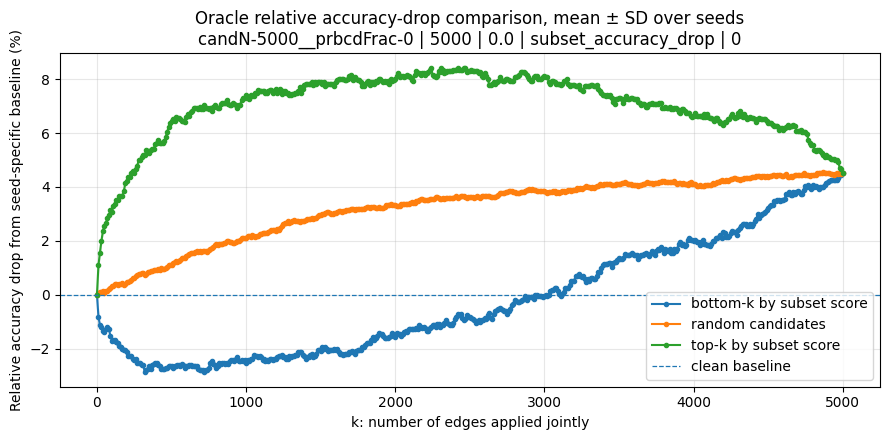

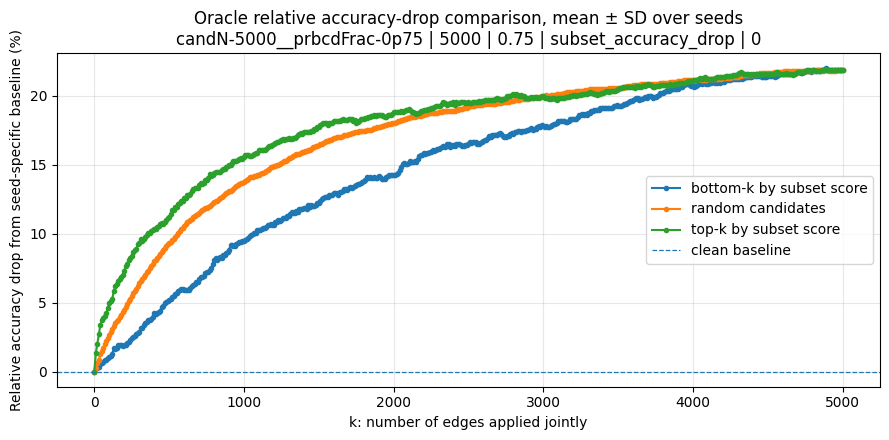

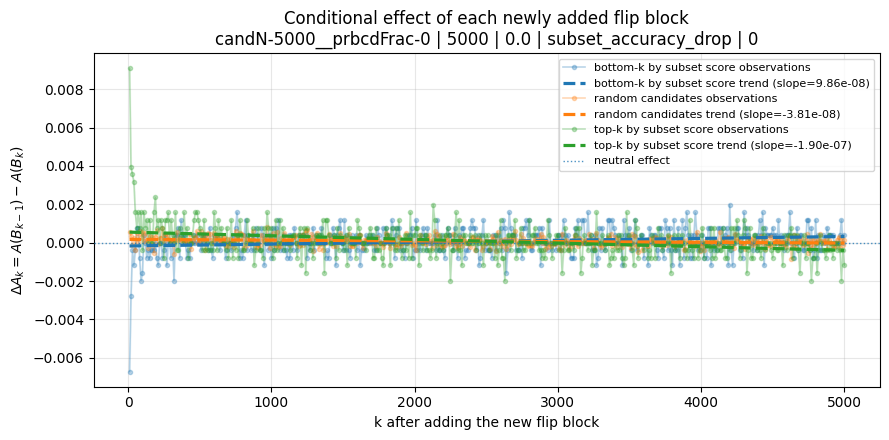

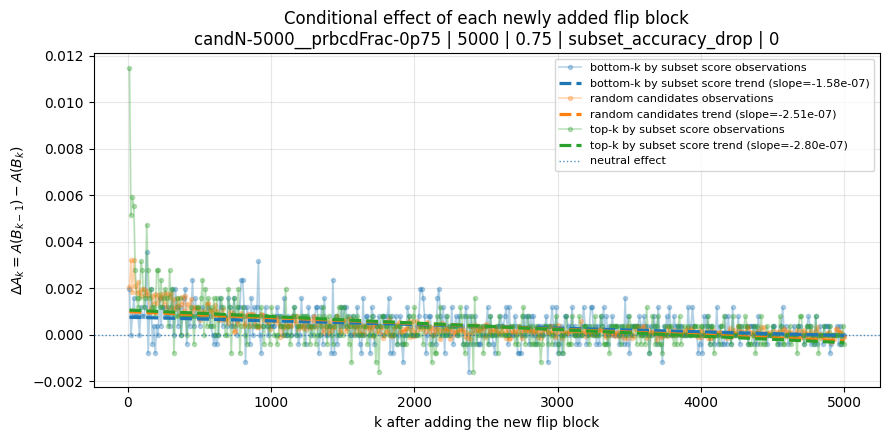

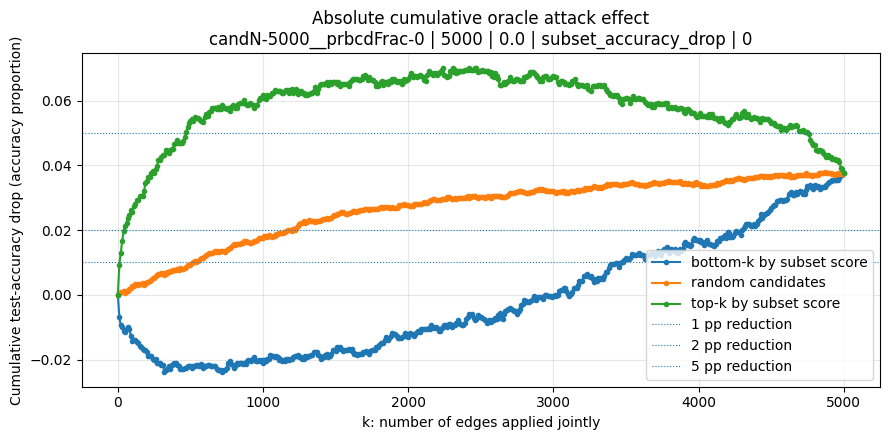

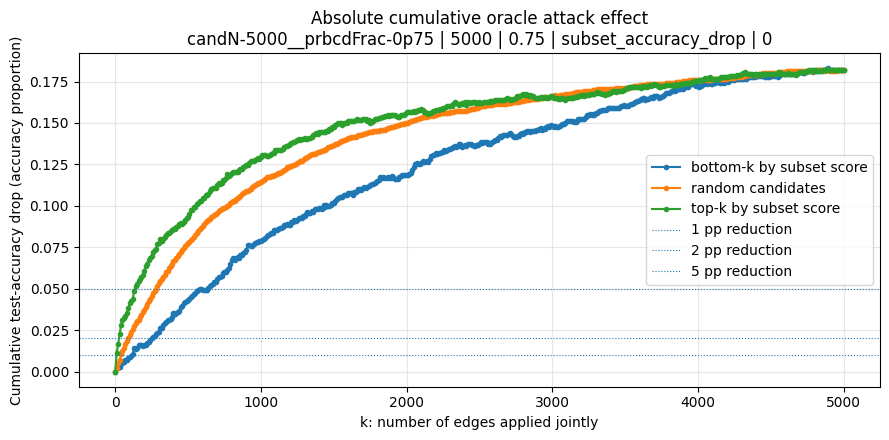

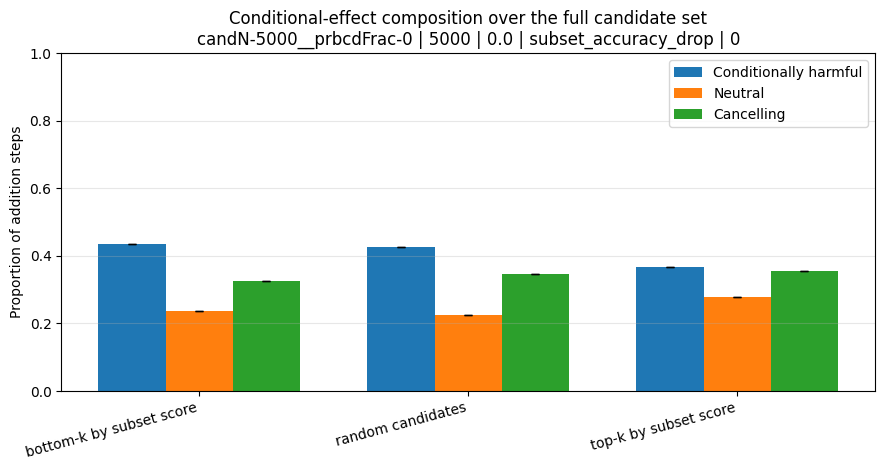

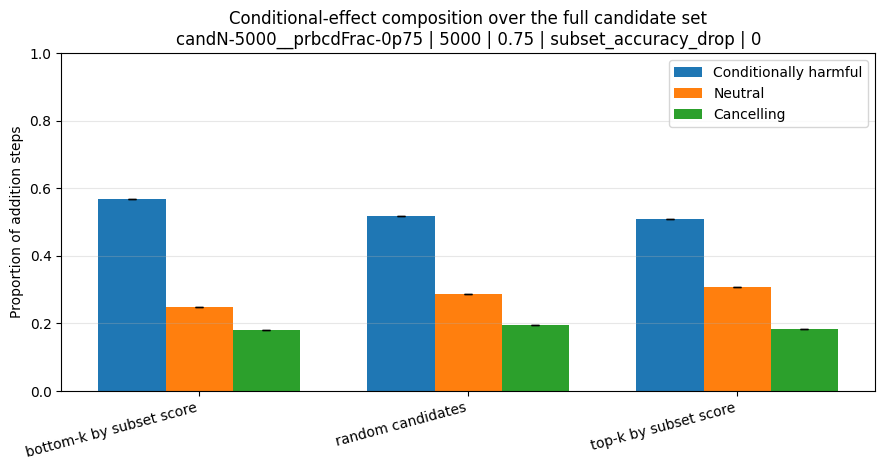

Full conditional-harmfulness report


,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,scoring_mode,endpoint_mining_hop,attack,n_positive_examples_mean,proportion_conditionally_harmful_mean,proportion_neutral_mean,proportion_cancelling_mean,final_cumulative_accuracy_drop_mean,maximum_achieved_accuracy_drop_mean,k_at_maximum_accuracy_drop_mean,edges_to_1pp_drop_mean,edges_to_2pp_drop_mean,edges_to_5pp_drop_mean,n_seeds
0,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,0,bottom-k by subset score,NaN,0.4360,0.2380,0.3260,0.037549,0.037549,5000.0,3470.0,4300.0,NaN,1
1,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,0,random candidates,NaN,0.4274,0.2254,0.3472,0.037549,0.040040,4404.0,471.0,1022.0,NaN,1
2,candN-5000__prbcdFrac-0,5000,0.00,subset_accuracy_drop,0,top-k by subset score,NaN,0.3680,0.2780,0.3540,0.037549,0.069960,2240.0,20.0,50.0,470.0,1
3,candN-5000__prbcdFrac-0p75,5000,0.75,subset_accuracy_drop,0,bottom-k by subset score,NaN,0.5680,0.2500,0.1820,0.181818,0.183004,4890.0,120.0,250.0,640.0,1
4,candN-5000__prbcdFrac-0p75,5000,0.75,subset_accuracy_drop,0,random candidates,NaN,0.5172,0.2866,0.1962,0.181818,0.182806,4759.0,45.0,97.0,288.0,1
5,candN-5000__prbcdFrac-0p75,5000,0.75,subset_accuracy_drop,0,top-k by subset score,NaN,0.5080,0.3080,0.1840,0.181818,0.182213,4800.0,10.0,30.0,140.0,1



Saved oracle plots and reports to: /home/hschult5/AttackerGNN/extendedPlotting/oracle_checks_multiseed


In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display


# ============================================================
# Plot configuration
# ============================================================

plot_group_cols = [
    "candidate_config_id",
    "candidate_set_size",
    "prbcd_candidate_fraction",
    "scoring_mode",
    "endpoint_mining_hop",
]

# Later positive-prefix k values may contain fewer seeds when
# n_positive differs between victim seeds.
PLOT_COMPLETE_SEED_SUPPORT_ONLY = True

# Conditional-effect plot styling.
ADD_CONDITIONAL_TRENDLINES = True
CONDITIONAL_DATA_ALPHA = 0.30
CONDITIONAL_DATA_LINEWIDTH = 1.2
CONDITIONAL_DATA_MARKERSIZE = 3
CONDITIONAL_BAND_ALPHA = 0.06
CONDITIONAL_TREND_ALPHA = 1.0
CONDITIONAL_TREND_LINEWIDTH = 2.3

# Seed-normalized relative-drop plot styling.
RELATIVE_DROP_BAND_ALPHA = 0.15
RELATIVE_DROP_MARKERSIZE = 3


# ============================================================
# Helpers
# ============================================================

def _complete_seed_support(frame):
    """
    Keep only k values supported by the maximum number of seeds.

    This prevents the positive-prefix mean curve from silently
    changing its seed composition at larger k values.
    """
    if (
        frame is None
        or frame.empty
        or not PLOT_COMPLETE_SEED_SUPPORT_ONLY
        or "n_seeds" not in frame.columns
    ):
        return frame

    required_n_seeds = int(frame["n_seeds"].max())

    return frame[
        frame["n_seeds"] == required_n_seeds
    ].copy()


def _add_conditional_trendline(
    ax,
    x,
    y,
    *,
    color=None,
    label="",
):
    """
    Add a linear least-squares trendline.

    Negative slope:
        marginal harmfulness tends to decrease as k increases.

    Positive slope:
        marginal harmfulness tends to increase as k increases.
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if x.size < 2 or np.unique(x).size < 2:
        return np.nan

    slope, intercept = np.polyfit(
        x,
        y,
        deg=1,
    )

    x_trend = np.linspace(
        float(x.min()),
        float(x.max()),
        100,
    )
    y_trend = slope * x_trend + intercept

    ax.plot(
        x_trend,
        y_trend,
        color=color,
        linestyle="--",
        linewidth=CONDITIONAL_TREND_LINEWIDTH,
        alpha=CONDITIONAL_TREND_ALPHA,
        zorder=4,
        label=(
            f"{label} trend "
            f"(slope={slope:.2e})"
        ),
    )

    return float(slope)


def _plot_conditional_curve(
    ax,
    attack_df,
    *,
    attack_name,
):
    """
    Plot a transparent observed conditional-effect curve, its
    mean ± SD band, and an opaque linear trendline.
    """
    if attack_df is None or attack_df.empty:
        return np.nan

    x_values = attack_df[
        "k"
    ].to_numpy(dtype=float)

    mean_values = attack_df[
        "delta_accuracy_mean"
    ].to_numpy(dtype=float)

    std_values = (
        attack_df[
            "delta_accuracy_std"
        ]
        .fillna(0.0)
        .to_numpy(dtype=float)
    )

    valid = (
        np.isfinite(x_values)
        & np.isfinite(mean_values)
        & np.isfinite(std_values)
    )

    x_values = x_values[valid]
    mean_values = mean_values[valid]
    std_values = std_values[valid]

    if x_values.size == 0:
        return np.nan

    # The observed points and connecting line are deliberately
    # transparent so the trendline remains visually dominant.
    data_line = ax.plot(
        x_values,
        mean_values,
        marker="o",
        markersize=CONDITIONAL_DATA_MARKERSIZE,
        linewidth=CONDITIONAL_DATA_LINEWIDTH,
        alpha=CONDITIONAL_DATA_ALPHA,
        zorder=2,
        label=f"{attack_name} observations",
    )[0]

    curve_color = data_line.get_color()

    ax.fill_between(
        x_values,
        mean_values - std_values,
        mean_values + std_values,
        color=curve_color,
        alpha=CONDITIONAL_BAND_ALPHA,
        zorder=1,
    )

    if not ADD_CONDITIONAL_TRENDLINES:
        return np.nan

    return _add_conditional_trendline(
        ax,
        x_values,
        mean_values,
        color=curve_color,
        label=attack_name,
    )


# ============================================================
# Seed-normalized relative accuracy-drop helpers
# ============================================================

def _relative_drop_summary(
    raw_df,
    *,
    group_cols,
):
    """
    Normalize every trajectory against its own seed-specific clean
    baseline before aggregating across seeds.

    For seed s and joint perturbation step k:

        relative_accuracy_drop_percent
            = 100 * (clean_accuracy - test_accuracy)
                    / clean_accuracy

    Positive values indicate an accuracy reduction. Every seed starts
    at 0%, independent of its absolute clean accuracy.
    """
    if raw_df is None or raw_df.empty:
        return pd.DataFrame(), pd.DataFrame()

    required_columns = {
        *group_cols,
        "seed",
        "clean_accuracy",
        "test_accuracy",
    }
    missing_columns = required_columns - set(raw_df.columns)

    if missing_columns:
        raise KeyError(
            "Cannot calculate seed-normalized relative accuracy drops. "
            f"Missing columns: {sorted(missing_columns)}"
        )

    frame = raw_df.copy()

    frame["clean_accuracy"] = pd.to_numeric(
        frame["clean_accuracy"],
        errors="coerce",
    )
    frame["test_accuracy"] = pd.to_numeric(
        frame["test_accuracy"],
        errors="coerce",
    )

    valid_clean = (
        np.isfinite(frame["clean_accuracy"])
        & (frame["clean_accuracy"] > 0.0)
    )

    frame["relative_accuracy_drop_percent"] = np.where(
        valid_clean,
        100.0
        * (
            frame["clean_accuracy"]
            - frame["test_accuracy"]
        )
        / frame["clean_accuracy"],
        np.nan,
    )

    # One value per seed, attack and k. This prevents accidental
    # duplicate rows inside a seed from changing its statistical weight.
    seed_group_cols = [
        *group_cols,
        "seed",
    ]

    seed_df = (
        frame
        .groupby(
            seed_group_cols,
            dropna=False,
            as_index=False,
        )
        .agg(
            relative_accuracy_drop_percent=(
                "relative_accuracy_drop_percent",
                "mean",
            )
        )
    )

    summary_df = (
        seed_df
        .groupby(
            group_cols,
            dropna=False,
            as_index=False,
        )
        .agg(
            relative_accuracy_drop_percent_mean=(
                "relative_accuracy_drop_percent",
                "mean",
            ),
            relative_accuracy_drop_percent_std=(
                "relative_accuracy_drop_percent",
                "std",
            ),
            n_seeds=(
                "seed",
                "nunique",
            ),
        )
    )

    summary_df[
        "relative_accuracy_drop_percent_std"
    ] = summary_df[
        "relative_accuracy_drop_percent_std"
    ].fillna(0.0)

    summary_df[
        "relative_accuracy_drop_percent_sem"
    ] = (
        summary_df[
            "relative_accuracy_drop_percent_std"
        ]
        / np.sqrt(
            summary_df["n_seeds"].clip(lower=1)
        )
    )

    summary_df[
        "relative_accuracy_drop_percent_ci95"
    ] = (
        1.96
        * summary_df[
            "relative_accuracy_drop_percent_sem"
        ]
    )

    return seed_df, summary_df


def _plot_relative_drop_curve(
    ax,
    attack_df,
    *,
    attack_name,
):
    """Plot mean ± SD of the seed-normalized relative drop."""
    if attack_df is None or attack_df.empty:
        return

    attack_df = attack_df.sort_values("k")

    x_values = attack_df[
        "k"
    ].to_numpy(dtype=float)

    mean_values = attack_df[
        "relative_accuracy_drop_percent_mean"
    ].to_numpy(dtype=float)

    std_values = (
        attack_df[
            "relative_accuracy_drop_percent_std"
        ]
        .fillna(0.0)
        .to_numpy(dtype=float)
    )

    valid = (
        np.isfinite(x_values)
        & np.isfinite(mean_values)
        & np.isfinite(std_values)
    )

    x_values = x_values[valid]
    mean_values = mean_values[valid]
    std_values = std_values[valid]

    if x_values.size == 0:
        return

    line = ax.plot(
        x_values,
        mean_values,
        marker="o",
        markersize=RELATIVE_DROP_MARKERSIZE,
        label=attack_name,
    )[0]

    ax.fill_between(
        x_values,
        mean_values - std_values,
        mean_values + std_values,
        color=line.get_color(),
        alpha=RELATIVE_DROP_BAND_ALPHA,
    )


def _matching_group_rows(
    frame,
    *,
    columns,
    key,
):
    """Select rows matching a groupby key, including NaN keys."""
    if frame is None or frame.empty:
        return pd.DataFrame()

    mask = np.ones(len(frame), dtype=bool)

    for column, value in zip(columns, key):
        if pd.isna(value):
            mask &= frame[column].isna().to_numpy()
        else:
            mask &= (
                frame[column].to_numpy()
                == value
            )

    return frame.loc[mask].copy()


# ============================================================
# Build seed-normalized relative accuracy-drop summaries
# ============================================================

relative_drop_group_cols = [
    *plot_group_cols,
    "attack",
    "k",
]

(
    oracle_relative_drop_seed_df,
    oracle_relative_drop_summary_df,
) = _relative_drop_summary(
    oracle_raw_df,
    group_cols=relative_drop_group_cols,
)

if (
    "oracle_positive_prefix_raw_df" in globals()
    and oracle_positive_prefix_raw_df is not None
    and not oracle_positive_prefix_raw_df.empty
):
    (
        oracle_positive_prefix_relative_drop_seed_df,
        oracle_positive_prefix_relative_drop_summary_df,
    ) = _relative_drop_summary(
        oracle_positive_prefix_raw_df,
        group_cols=relative_drop_group_cols,
    )
else:
    oracle_positive_prefix_relative_drop_seed_df = (
        pd.DataFrame()
    )
    oracle_positive_prefix_relative_drop_summary_df = (
        pd.DataFrame()
    )

# Save exactly the normalized values used in the figures.
oracle_relative_drop_seed_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_relative_accuracy_drop_seed_level.csv",
    index=False,
)
oracle_relative_drop_summary_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_relative_accuracy_drop_averaged.csv",
    index=False,
)

if not oracle_positive_prefix_relative_drop_seed_df.empty:
    oracle_positive_prefix_relative_drop_seed_df.to_csv(
        ORACLE_OUT_DIR
        / "oracle_positive_prefix_relative_drop_seed_level.csv",
        index=False,
    )
    oracle_positive_prefix_relative_drop_summary_df.to_csv(
        ORACLE_OUT_DIR
        / "oracle_positive_prefix_relative_drop_averaged.csv",
        index=False,
    )


# ============================================================
# 1. Full percentage accuracy drop from seed-specific baseline
# ============================================================

for key, group in (
    oracle_relative_drop_summary_df.groupby(
        plot_group_cols,
        dropna=False,
    )
):
    fig, ax = plt.subplots(figsize=(9, 4.5))

    for attack_name, attack_df in group.groupby(
        "attack",
        sort=False,
    ):
        _plot_relative_drop_curve(
            ax,
            attack_df,
            attack_name=attack_name,
        )

    ax.axhline(
        0.0,
        linestyle="--",
        linewidth=0.9,
        label="clean baseline",
    )

    ax.set_xlabel(
        "k: number of edges applied jointly"
    )
    ax.set_ylabel(
        "Relative accuracy drop from "
        "seed-specific baseline (%)"
    )

    title = " | ".join(map(str, key))
    ax.set_title(
        "Oracle relative accuracy-drop comparison, "
        "mean ± SD over seeds\n"
        f"{title}"
    )

    ax.grid(True, alpha=0.3)
    ax.legend()
    fig.tight_layout()

    fig.savefig(
        PLOTS_DIR
        / (
            "oracle_relative_accuracy_drop__"
            f"{_oracle_safe(title)}.png"
        ),
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()


# ============================================================
# 2. Full marginal conditional effect with trendlines
# ============================================================

for key, group in oracle_summary_df.groupby(
    plot_group_cols,
    dropna=False,
):
    fig, ax = plt.subplots(figsize=(9, 4.5))

    trend_rows = []

    for attack_name, attack_df in group.groupby(
        "attack",
        sort=False,
    ):
        attack_df = (
            attack_df[
                attack_df["k"] > 0
            ]
            .sort_values("k")
        )

        slope = _plot_conditional_curve(
            ax,
            attack_df,
            attack_name=attack_name,
        )

        trend_rows.append({
            "attack": attack_name,
            "slope": slope,
        })

    ax.axhline(
        0.0,
        linestyle=":",
        linewidth=1.0,
        alpha=0.8,
        zorder=3,
        label="neutral effect",
    )

    ax.set_xlabel(
        "k after adding the new flip block"
    )
    ax.set_ylabel(
        r"$\Delta A_k=A(B_{k-1})-A(B_k)$"
    )

    title = " | ".join(map(str, key))
    ax.set_title(
        "Conditional effect of each newly added flip block\n"
        f"{title}"
    )

    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=8)
    fig.tight_layout()

    fig.savefig(
        PLOTS_DIR
        / (
            "oracle_delta_accuracy_with_trend__"
            f"{_oracle_safe(title)}.png"
        ),
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()


# ============================================================
# 3. Full cumulative accuracy drop in percentage points
# ============================================================

for key, group in oracle_summary_df.groupby(
    plot_group_cols,
    dropna=False,
):
    fig, ax = plt.subplots(figsize=(9, 4.5))

    for attack_name, attack_df in group.groupby(
        "attack",
        sort=False,
    ):
        attack_df = attack_df.sort_values("k")

        add_mean_std_band(
            ax,
            attack_df["k"],
            attack_df[
                "cumulative_accuracy_drop_mean"
            ],
            attack_df[
                "cumulative_accuracy_drop_std"
            ],
            marker="o",
            markersize=3,
            label=attack_name,
        )

    for threshold in FIXED_ACCURACY_REDUCTIONS:
        ax.axhline(
            float(threshold),
            linestyle=":",
            linewidth=0.8,
            label=f"{threshold * 100:g} pp reduction",
        )

    ax.set_xlabel(
        "k: number of edges applied jointly"
    )
    ax.set_ylabel(
        "Cumulative test-accuracy drop "
        "(accuracy proportion)"
    )

    title = " | ".join(map(str, key))
    ax.set_title(
        "Absolute cumulative oracle attack effect\n"
        f"{title}"
    )

    ax.grid(True, alpha=0.3)
    ax.legend()
    fig.tight_layout()

    fig.savefig(
        PLOTS_DIR
        / (
            "oracle_cumulative_drop__"
            f"{_oracle_safe(title)}.png"
        ),
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()


# ============================================================
# 4. Full conditional-effect proportions
# ============================================================

for key, group in oracle_run_summary_df.groupby(
    plot_group_cols,
    dropna=False,
):
    group = (
        group
        .sort_values("attack")
        .reset_index(drop=True)
    )

    attack_names = group["attack"].tolist()
    x = np.arange(len(attack_names))
    width = 0.25

    metrics = [
        (
            "proportion_conditionally_harmful",
            "Conditionally harmful",
        ),
        (
            "proportion_neutral",
            "Neutral",
        ),
        (
            "proportion_cancelling",
            "Cancelling",
        ),
    ]

    fig, ax = plt.subplots(figsize=(9, 4.8))

    for metric_index, (metric, label) in enumerate(
        metrics
    ):
        offset = (
            metric_index
            - (len(metrics) - 1) / 2
        ) * width

        means = group[
            f"{metric}_mean"
        ].to_numpy(dtype=float)

        stds = (
            group[f"{metric}_std"]
            .fillna(0.0)
            .to_numpy(dtype=float)
        )

        ax.bar(
            x + offset,
            means,
            width,
            yerr=stds,
            capsize=3,
            label=label,
        )

    ax.set_xticks(x)
    ax.set_xticklabels(
        attack_names,
        rotation=15,
        ha="right",
    )

    ax.set_ylim(0, 1)
    ax.set_ylabel(
        "Proportion of addition steps"
    )

    title = " | ".join(map(str, key))
    ax.set_title(
        "Conditional-effect composition over the full candidate set\n"
        f"{title}"
    )

    ax.grid(
        True,
        axis="y",
        alpha=0.3,
    )
    ax.legend()
    fig.tight_layout()

    fig.savefig(
        PLOTS_DIR
        / (
            "oracle_effect_proportions__"
            f"{_oracle_safe(title)}.png"
        ),
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()


# ============================================================
# Positive-prefix plots
# ============================================================

if not oracle_positive_prefix_summary_df.empty:

    # ========================================================
    # 5. Percentage drop within the positive-label budget
    # ========================================================

    if not oracle_positive_prefix_relative_drop_summary_df.empty:

        for key, group in (
            oracle_positive_prefix_relative_drop_summary_df.groupby(
                plot_group_cols,
                dropna=False,
            )
        ):
            fig, ax = plt.subplots(figsize=(9, 4.5))

            for attack_name, attack_df in group.groupby(
                "attack",
                sort=False,
            ):
                attack_df = _complete_seed_support(
                    attack_df.sort_values("k")
                )

                if attack_df.empty:
                    continue

                _plot_relative_drop_curve(
                    ax,
                    attack_df,
                    attack_name=attack_name,
                )

            ax.axhline(
                0.0,
                linestyle="--",
                linewidth=0.9,
                label="clean baseline",
            )

            source_group = _matching_group_rows(
                oracle_positive_prefix_summary_df,
                columns=plot_group_cols,
                key=key,
            )

            mean_positive_count = (
                float(
                    source_group[
                        "n_positive_examples_mean"
                    ].mean()
                )
                if (
                    not source_group.empty
                    and "n_positive_examples_mean"
                    in source_group.columns
                )
                else np.nan
            )

            positive_suffix = (
                f" | mean n_positive="
                f"{mean_positive_count:.1f}"
                if np.isfinite(mean_positive_count)
                else ""
            )

            ax.set_xlabel(
                "k: candidates applied within the "
                "positive-label budget"
            )
            ax.set_ylabel(
                "Relative accuracy drop from "
                "seed-specific baseline (%)"
            )

            title = " | ".join(map(str, key))
            ax.set_title(
                "Relative accuracy drop within the "
                "mined positive prefix\n"
                f"{title}{positive_suffix}"
            )

            ax.grid(True, alpha=0.3)
            ax.legend()
            fig.tight_layout()

            fig.savefig(
                PLOTS_DIR
                / (
                    "oracle_positive_prefix_relative_drop__"
                    f"{_oracle_safe(title)}.png"
                ),
                dpi=200,
                bbox_inches="tight",
            )

            plt.show()


    # ========================================================
    # 6. Marginal effects within the positive prefix
    #    with prominent trendlines
    # ========================================================

    for key, group in (
        oracle_positive_prefix_summary_df.groupby(
            plot_group_cols,
            dropna=False,
        )
    ):
        fig, ax = plt.subplots(figsize=(9, 4.5))

        for attack_name, attack_df in group.groupby(
            "attack",
            sort=False,
        ):
            attack_df = (
                attack_df[
                    attack_df["k"] > 0
                ]
                .sort_values("k")
            )

            attack_df = _complete_seed_support(
                attack_df
            )

            _plot_conditional_curve(
                ax,
                attack_df,
                attack_name=attack_name,
            )

        ax.axhline(
            0.0,
            linestyle=":",
            linewidth=1.0,
            alpha=0.8,
            zorder=3,
            label="neutral effect",
        )

        ax.set_xlabel(
            "k: candidates applied within the "
            "positive-label budget"
        )
        ax.set_ylabel(
            r"$\Delta A_k=A(B_{k-1})-A(B_k)$"
        )

        title = " | ".join(map(str, key))
        ax.set_title(
            "Conditional effects within the positive prefix\n"
            f"{title}"
        )

        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=8)
        fig.tight_layout()

        fig.savefig(
            PLOTS_DIR
            / (
                "oracle_positive_prefix_delta_with_trend__"
                f"{_oracle_safe(title)}.png"
            ),
            dpi=200,
            bbox_inches="tight",
        )

        plt.show()


    # ========================================================
    # 7. Absolute cumulative drop within the positive prefix
    # ========================================================

    for key, group in (
        oracle_positive_prefix_summary_df.groupby(
            plot_group_cols,
            dropna=False,
        )
    ):
        fig, ax = plt.subplots(figsize=(9, 4.5))

        for attack_name, attack_df in group.groupby(
            "attack",
            sort=False,
        ):
            attack_df = _complete_seed_support(
                attack_df.sort_values("k")
            )

            if attack_df.empty:
                continue

            add_mean_std_band(
                ax,
                attack_df["k"],
                attack_df[
                    "cumulative_accuracy_drop_mean"
                ],
                attack_df[
                    "cumulative_accuracy_drop_std"
                ],
                marker="o",
                markersize=3,
                label=attack_name,
            )

        ax.set_xlabel(
            "k: candidates applied within the "
            "positive-label budget"
        )
        ax.set_ylabel(
            "Cumulative test-accuracy drop"
        )

        title = " | ".join(map(str, key))
        ax.set_title(
            "Cumulative effect of the mined positive prefix\n"
            f"{title}"
        )

        ax.grid(True, alpha=0.3)
        ax.legend()
        fig.tight_layout()

        fig.savefig(
            PLOTS_DIR
            / (
                "oracle_positive_prefix_cumulative__"
                f"{_oracle_safe(title)}.png"
            ),
            dpi=200,
            bbox_inches="tight",
        )

        plt.show()


    # ========================================================
    # 8. Conditional-effect proportions inside the prefix
    # ========================================================

    for key, group in (
        oracle_positive_prefix_run_summary_df.groupby(
            plot_group_cols,
            dropna=False,
        )
    ):
        group = (
            group
            .sort_values("attack")
            .reset_index(drop=True)
        )

        attack_names = group["attack"].tolist()
        x = np.arange(len(attack_names))
        width = 0.25

        metrics = [
            (
                "proportion_conditionally_harmful",
                "Conditionally harmful",
            ),
            (
                "proportion_neutral",
                "Neutral",
            ),
            (
                "proportion_cancelling",
                "Cancelling",
            ),
        ]

        fig, ax = plt.subplots(
            figsize=(9, 4.8)
        )

        for metric_index, (
            metric,
            label,
        ) in enumerate(metrics):
            offset = (
                metric_index
                - (len(metrics) - 1) / 2
            ) * width

            means = group[
                f"{metric}_mean"
            ].to_numpy(dtype=float)

            stds = (
                group[f"{metric}_std"]
                .fillna(0.0)
                .to_numpy(dtype=float)
            )

            ax.bar(
                x + offset,
                means,
                width,
                yerr=stds,
                capsize=3,
                label=label,
            )

        ax.set_xticks(x)
        ax.set_xticklabels(
            attack_names,
            rotation=15,
            ha="right",
        )

        ax.set_ylim(0, 1)
        ax.set_ylabel(
            "Proportion of addition steps"
        )

        title = " | ".join(map(str, key))
        ax.set_title(
            "Conditional-effect composition "
            "within the positive prefix\n"
            f"{title}"
        )

        ax.grid(
            True,
            axis="y",
            alpha=0.3,
        )
        ax.legend()
        fig.tight_layout()

        fig.savefig(
            PLOTS_DIR
            / (
                "oracle_positive_prefix_proportions__"
                f"{_oracle_safe(title)}.png"
            ),
            dpi=200,
            bbox_inches="tight",
        )

        plt.show()


    # ========================================================
    # 9. Exact result after k=n_positive candidates
    # ========================================================

    for key, group in (
        oracle_positive_prefix_endpoint_summary_df.groupby(
            plot_group_cols,
            dropna=False,
        )
    ):
        group = (
            group
            .sort_values("attack")
            .reset_index(drop=True)
        )

        fig, ax = plt.subplots(
            figsize=(8, 4.8)
        )

        x = np.arange(len(group))

        means = group[
            "cumulative_accuracy_drop_mean"
        ].to_numpy(dtype=float)

        stds = (
            group[
                "cumulative_accuracy_drop_std"
            ]
            .fillna(0.0)
            .to_numpy(dtype=float)
        )

        ax.bar(
            x,
            means,
            yerr=stds,
            capsize=4,
        )

        ax.set_xticks(x)
        ax.set_xticklabels(
            group["attack"],
            rotation=15,
            ha="right",
        )

        mean_positive_count = float(
            group[
                "n_positive_examples_mean"
            ].mean()
        )

        ax.set_ylabel(
            "Cumulative test-accuracy drop"
        )

        title = " | ".join(map(str, key))
        ax.set_title(
            "Effect after applying exactly the "
            "positive-label budget\n"
            f"{title} | mean n_positive="
            f"{mean_positive_count:.1f}"
        )

        ax.grid(
            True,
            axis="y",
            alpha=0.3,
        )
        fig.tight_layout()

        fig.savefig(
            PLOTS_DIR
            / (
                "oracle_positive_prefix_endpoint__"
                f"{_oracle_safe(title)}.png"
            ),
            dpi=200,
            bbox_inches="tight",
        )

        plt.show()


# ============================================================
# Compact full-trajectory report
# ============================================================

full_report_columns = [
    "candidate_config_id",
    "candidate_set_size",
    "prbcd_candidate_fraction",
    "scoring_mode",
    "endpoint_mining_hop",
    "attack",

    "n_positive_examples_mean",

    "proportion_conditionally_harmful_mean",
    "proportion_neutral_mean",
    "proportion_cancelling_mean",

    "final_cumulative_accuracy_drop_mean",
    "maximum_achieved_accuracy_drop_mean",
    "k_at_maximum_accuracy_drop_mean",

    *[
        f"{_threshold_column_name(threshold)}_mean"
        for threshold in FIXED_ACCURACY_REDUCTIONS
    ],

    "n_seeds",
]

full_report_columns = [
    column
    for column in full_report_columns
    if column in oracle_run_summary_df.columns
]

oracle_conditional_report_df = (
    oracle_run_summary_df[
        full_report_columns
    ]
    .sort_values(
        [
            "candidate_config_id",
            "scoring_mode",
            "endpoint_mining_hop",
            "attack",
        ]
    )
    .reset_index(drop=True)
)

oracle_conditional_report_df.to_csv(
    ORACLE_OUT_DIR
    / "oracle_conditional_harmfulness_report.csv",
    index=False,
)


# ============================================================
# Compact positive-prefix report
# ============================================================

if not oracle_positive_prefix_run_summary_df.empty:
    positive_report_columns = [
        "candidate_config_id",
        "candidate_set_size",
        "prbcd_candidate_fraction",
        "scoring_mode",
        "endpoint_mining_hop",
        "attack",

        "n_positive_examples_mean",

        "proportion_conditionally_harmful_mean",
        "proportion_neutral_mean",
        "proportion_cancelling_mean",

        "final_test_accuracy_mean",
        "final_cumulative_accuracy_drop_mean",
        "maximum_achieved_accuracy_drop_mean",
        "k_at_maximum_accuracy_drop_mean",

        *[
            f"{_threshold_column_name(threshold)}_mean"
            for threshold in FIXED_ACCURACY_REDUCTIONS
        ],

        "n_seeds",
    ]

    positive_report_columns = [
        column
        for column in positive_report_columns
        if column
        in oracle_positive_prefix_run_summary_df.columns
    ]

    oracle_positive_prefix_report_df = (
        oracle_positive_prefix_run_summary_df[
            positive_report_columns
        ]
        .sort_values(
            [
                "candidate_config_id",
                "scoring_mode",
                "endpoint_mining_hop",
                "attack",
            ]
        )
        .reset_index(drop=True)
    )

    oracle_positive_prefix_report_df.to_csv(
        ORACLE_OUT_DIR
        / "oracle_positive_prefix_report.csv",
        index=False,
    )

else:
    oracle_positive_prefix_report_df = (
        pd.DataFrame()
    )


print("Full conditional-harmfulness report")
display(oracle_conditional_report_df)

if not oracle_positive_prefix_report_df.empty:
    print(
        "\nPositive-prefix "
        "conditional-harmfulness report"
    )
    display(
        oracle_positive_prefix_report_df
    )

print(
    "\nSaved oracle plots and reports to:",
    ORACLE_OUT_DIR.resolve(),
)

Mode-aware characterization runs: 2
Scoring modes: ['subset_accuracy_drop']
Seeds: [0]
Candidate configurations: ['candN-5000__prbcdFrac-0', 'candN-5000__prbcdFrac-0p75']
Endpoint hops: []
Characterized seed=0 | config=candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | rule=top_10pct_vs_bottom_10pct | h=0 | selected=1,000/5,000
Characterized seed=0 | config=candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | rule=top_10pct_vs_bottom_10pct | h=0 | selected=1,000/5,000


/tmp/ipykernel_151421/2980646276.py:2054: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(
/tmp/ipykernel_151421/2980646276.py:2054: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(
/tmp/ipykernel_151421/2980646276.py:2054: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(
/tmp/ipykernel_151421/2980646276.py:2054: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(
/tmp/ipykernel_151421/2980646276.py:2054: MatplotlibDeprecationWarning: The 'labels' parameter of bo

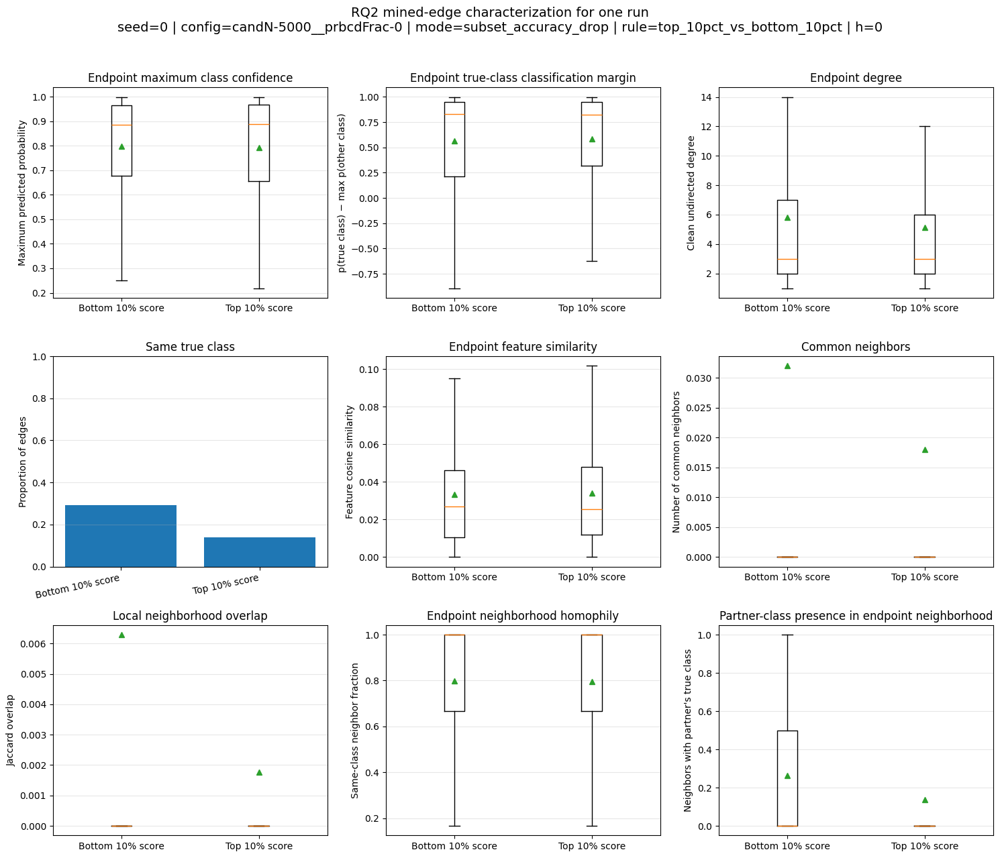

/tmp/ipykernel_151421/2980646276.py:2054: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(
/tmp/ipykernel_151421/2980646276.py:2054: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(
/tmp/ipykernel_151421/2980646276.py:2054: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(
/tmp/ipykernel_151421/2980646276.py:2054: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(
/tmp/ipykernel_151421/2980646276.py:2054: MatplotlibDeprecationWarning: The 'labels' parameter of bo

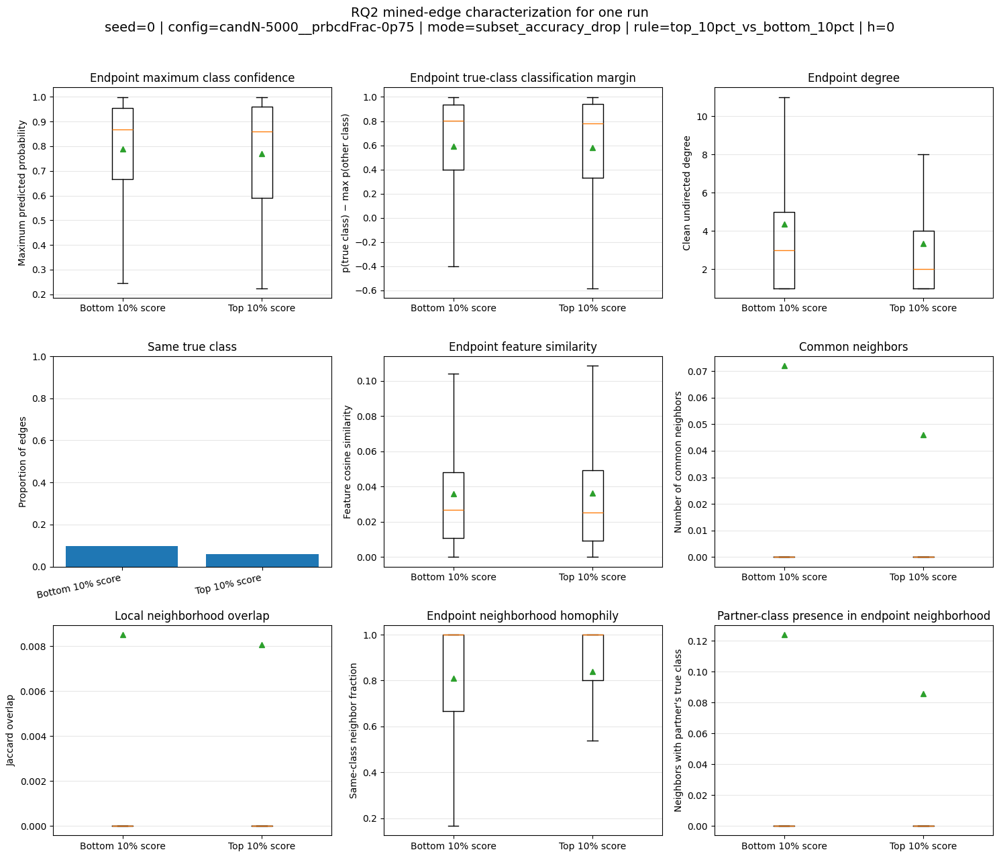

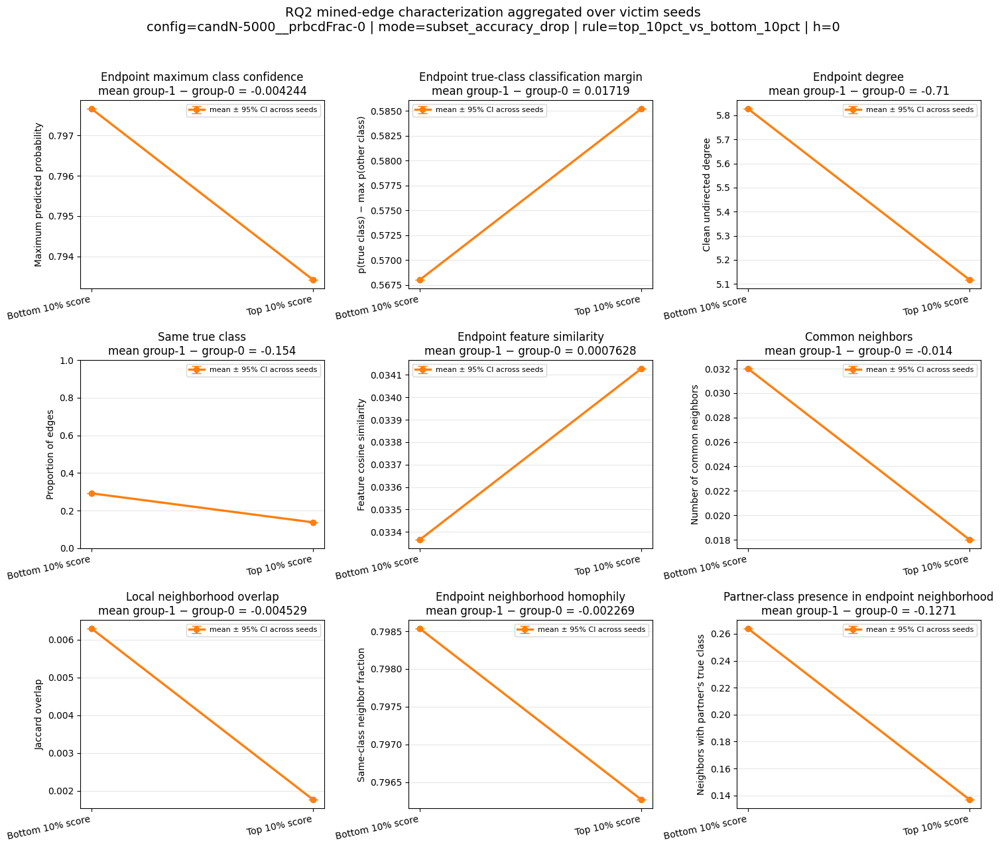

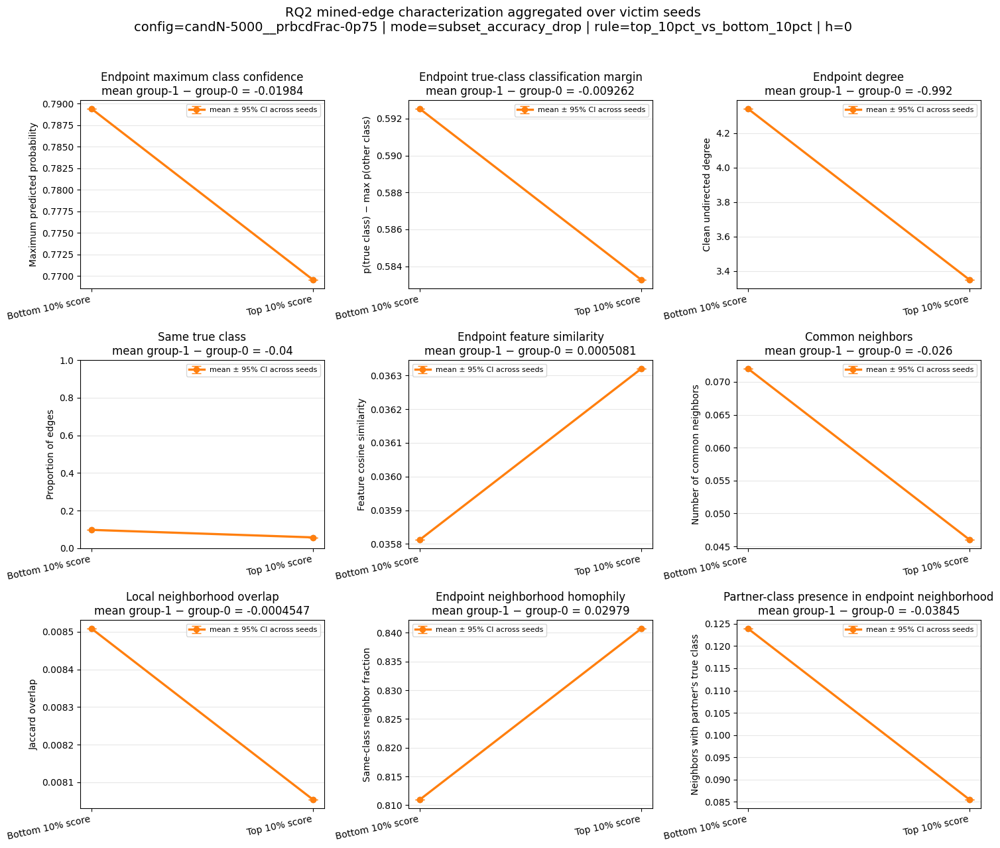


Group-selection diagnostics


,seed,candidate_config_id,candidate_set_size,prbcd_candidate_fraction,actual_prbcd_fraction,scoring_mode,comparison_rule,endpoint_mining_hop,n_downstream_candidates,n_available_for_comparison,n_selected_group_0,n_selected_group_1,n_selected_total,selected_fraction_of_available,n_selected_per_group,bottom_cutoff_score,top_cutoff_score,n_at_bottom_cutoff,n_at_top_cutoff,constant_score_run
0,0,candN-5000__prbcdFrac-0,5000,0.00,0.00,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,5000,5000,500,500,1000,0.2,500,0.005740,0.006849,2,1,False
1,0,candN-5000__prbcdFrac-0p75,5000,0.75,0.75,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,5000,5000,500,500,1000,0.2,500,0.045108,0.046547,3,2,False



Per-run descriptive statistics


,seed,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,label_group,analysis_level,feature,n_observations,mean,std,median,q1,q3,iqr,minimum,maximum
40,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,edge,common_neighbors,500,0.032000,0.187206,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
56,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,1,edge,common_neighbors,500,0.018000,0.160398,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
37,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,edge,feature_cosine_similarity,500,0.033365,0.033131,0.026921,0.010336,0.046004,0.035668,0.000000,0.251518
53,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,1,edge,feature_cosine_similarity,500,0.034128,0.034083,0.025378,0.011918,0.047882,0.035964,0.000000,0.343521
38,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,edge,feature_l2_distance,500,1.390208,0.024376,1.395048,1.381301,1.406886,0.025585,1.223505,1.414214
54,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,1,edge,feature_l2_distance,500,1.389643,0.025267,1.396153,1.379941,1.405761,0.025820,1.145844,1.414214
39,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,edge,feature_support_jaccard,500,0.034332,0.024082,0.030849,0.017699,0.047619,0.029920,0.000000,0.182927
55,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,1,edge,feature_support_jaccard,500,0.034414,0.022789,0.031830,0.016949,0.048340,0.031391,0.000000,0.162162
41,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,edge,local_neighbor_jaccard,500,0.006294,0.065154,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
57,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,1,edge,local_neighbor_jaccard,500,0.001765,0.016418,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000



Aggregated seed-level group summaries


,analysis_level,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,label_group,feature,n_seeds,seed_mean_mean,seed_mean_std,seed_median_mean,mean_n_observations,seed_mean_sem,seed_mean_ci95
0,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,common_neighbors,1,0.032000,0.0,0.000000,500.0,0.0,0.0
16,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,1,common_neighbors,1,0.018000,0.0,0.000000,500.0,0.0,0.0
1,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,feature_cosine_similarity,1,0.033365,0.0,0.026921,500.0,0.0,0.0
17,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,1,feature_cosine_similarity,1,0.034128,0.0,0.025378,500.0,0.0,0.0
2,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,feature_l2_distance,1,1.390208,0.0,1.395048,500.0,0.0,0.0
18,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,1,feature_l2_distance,1,1.389643,0.0,1.396153,500.0,0.0,0.0
3,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,feature_support_jaccard,1,0.034332,0.0,0.030849,500.0,0.0,0.0
19,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,1,feature_support_jaccard,1,0.034414,0.0,0.031830,500.0,0.0,0.0
4,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,local_neighbor_jaccard,1,0.006294,0.0,0.000000,500.0,0.0,0.0
20,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,1,local_neighbor_jaccard,1,0.001765,0.0,0.000000,500.0,0.0,0.0



Paired seed-level effects: group 1 minus group 0


,analysis_level,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,feature,group_0_name,group_1_name,n_paired_seeds,group_0_seed_mean,group_1_seed_mean,mean_difference_group1_minus_group0,label_0_seed_mean,label_1_seed_mean,mean_difference_label1_minus_label0,difference_std,difference_sem,difference_ci95,fraction_seeds_positive_difference,paired_t_statistic,paired_t_p,wilcoxon_statistic,wilcoxon_p
0,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,common_neighbors,Bottom 10% score,Top 10% score,1,0.032000,0.018000,-0.014000,0.032000,0.018000,-0.014000,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
1,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,feature_cosine_similarity,Bottom 10% score,Top 10% score,1,0.033365,0.034128,0.000763,0.033365,0.034128,0.000763,0.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN
2,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,feature_l2_distance,Bottom 10% score,Top 10% score,1,1.390208,1.389643,-0.000565,1.390208,1.389643,-0.000565,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
3,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,feature_support_jaccard,Bottom 10% score,Top 10% score,1,0.034332,0.034414,0.000083,0.034332,0.034414,0.000083,0.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN
4,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,local_neighbor_jaccard,Bottom 10% score,Top 10% score,1,0.006294,0.001765,-0.004529,0.006294,0.001765,-0.004529,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
5,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,local_overlap_coefficient,Bottom 10% score,Top 10% score,1,0.015214,0.006155,-0.009060,0.015214,0.006155,-0.009060,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
6,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,pair_confidence_mean,Bottom 10% score,Top 10% score,1,0.797662,0.793418,-0.004244,0.797662,0.793418,-0.004244,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
7,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,pair_confidence_min,Bottom 10% score,Top 10% score,1,0.681239,0.678845,-0.002394,0.681239,0.678845,-0.002394,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
8,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,pair_degree_mean,Bottom 10% score,Top 10% score,1,5.827000,5.117000,-0.710000,5.827000,5.117000,-0.710000,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
9,edge,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,pair_degree_min,Bottom 10% score,Top 10% score,1,2.894000,2.546000,-0.348000,2.894000,2.546000,-0.348000,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN



Detailed true-class-pair composition aggregated over seeds


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,label_group,true_class_pair,n_seeds,fraction_mean,fraction_std,fraction_ci95
22,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,4-4,1,0.164,0.0,0.0
10,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,1-4,1,0.072,0.0,0.0
19,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,3-4,1,0.072,0.0,0.0
15,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,2-4,1,0.068,0.0,0.0
24,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,4-6,1,0.050,0.0,0.0
8,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,1-2,1,0.042,0.0,0.0
2,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,0-2,1,0.040,0.0,0.0
4,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,0-4,1,0.040,0.0,0.0
3,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,0-3,1,0.038,0.0,0.0
9,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_10pct_vs_bottom_10pct,0,0,1-3,1,0.038,0.0,0.0



Interpretation:
- endpoint: group 1 is the original endpoint-harmful label and group 0 is the original no-hit label.
- subset_accuracy_drop: group 1 contains the highest-scoring 10% and group 0 contains the lowest-scoring 10% within each seed/run.
- score_raw, score_norm, score_percentile, and inclusion_count are saved as diagnostics but are not among the characteristics compared, because subset group membership is defined from score_raw.

Saved RQ2 edge-characterization outputs to:
/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_edge_characterization


In [24]:
# ============================================================
# RQ2: Characterize mined edge groups for endpoint and subset scoring
#
# Placement:
#   Run this cell after the direct-mining cell has created `mining_runs`.
#
# Comparison rules:
#   endpoint:
#       group 1 = endpoint label 1
#       group 0 = endpoint label 0
#
#   subset_accuracy_drop:
#       group 1 = top 10% of observed score_raw values
#       group 0 = bottom 10% of observed score_raw values
#       the middle 80% are excluded from this characterization
#
# Outputs:
#   - one row per selected candidate edge and mining run
#   - one row per endpoint occurrence and mining run
#   - descriptive statistics for every individual seed/run
#   - seed-level aggregate statistics and paired group-1 minus group-0 effects
#   - per-run comparison plots
#   - aggregate-over-seeds comparison plots
# ============================================================

from pathlib import Path
from collections import Counter
import json
import math
import re
import warnings

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from IPython.display import display
from scipy import sparse as scipy_sparse
from scipy.stats import ttest_1samp, wilcoxon


# ------------------------------------------------------------
# Configuration
# ------------------------------------------------------------

RQ2_CHAR_SCORING_MODES = {
    "endpoint",
    "subset_accuracy_drop",
}

RQ2_CHAR_ENDPOINT_LABEL_THRESHOLD = 0.5
RQ2_CHAR_SUBSET_EXTREME_FRACTION = 0.10

# None means: analyze all candidate configurations.
RQ2_CHAR_CANDIDATE_CONFIG_IDS = None

# Applied only to endpoint-mining runs. Subset runs use h=0 as bookkeeping
# and are not removed by this filter.
RQ2_CHAR_ENDPOINT_HOPS = None

RQ2_CHAR_MAKE_PER_RUN_PLOTS = True
RQ2_CHAR_MAKE_AGGREGATE_PLOTS = True
RQ2_CHAR_SHOW_PLOTS = True
RQ2_CHAR_SAVE_DPI = 220

RQ2_CHAR_OUT_DIR = (
    Path("extendedPlotting")
    / "rq2_mode_aware_edge_characterization"
)
RQ2_CHAR_TABLE_DIR = RQ2_CHAR_OUT_DIR / "tables"
RQ2_CHAR_PER_RUN_PLOT_DIR = RQ2_CHAR_OUT_DIR / "plots_per_run"
RQ2_CHAR_AGG_PLOT_DIR = RQ2_CHAR_OUT_DIR / "plots_aggregated_over_seeds"

for _directory in [
    RQ2_CHAR_OUT_DIR,
    RQ2_CHAR_TABLE_DIR,
    RQ2_CHAR_PER_RUN_PLOT_DIR,
    RQ2_CHAR_AGG_PLOT_DIR,
]:
    _directory.mkdir(parents=True, exist_ok=True)


# ------------------------------------------------------------
# General helpers
# ------------------------------------------------------------


def _rq2_char_safe(value):
    return re.sub(r"[^a-zA-Z0-9_.=-]+", "_", str(value)).strip("_")


def _rq2_char_cpu_tensor(value, *, dtype=None):
    if torch.is_tensor(value):
        tensor = value.detach().cpu()
    elif scipy_sparse.issparse(value):
        tensor = torch.from_numpy(value.toarray())
    elif hasattr(value, "to_dense"):
        dense = value.to_dense()
        tensor = dense.detach().cpu() if torch.is_tensor(dense) else torch.as_tensor(dense)
    else:
        tensor = torch.as_tensor(value)

    if dtype is not None:
        tensor = tensor.to(dtype=dtype)
    return tensor


def _rq2_char_dense_features(context):
    value = context["attr"]

    if scipy_sparse.issparse(value):
        array = value.toarray()
        return np.asarray(array, dtype=np.float32)

    if torch.is_tensor(value):
        tensor = value.detach().cpu()
        if tensor.is_sparse:
            tensor = tensor.to_dense()
        return tensor.float().numpy()

    if hasattr(value, "to_dense"):
        value = value.to_dense()
        if torch.is_tensor(value):
            return value.detach().cpu().float().numpy()

    return np.asarray(value, dtype=np.float32)


def _rq2_char_clear_model_cache_and_call(model, x, adj):
    has_cache = hasattr(model, "adj_preped")
    previous_cache = getattr(model, "adj_preped", None) if has_cache else None

    try:
        if has_cache:
            model.adj_preped = None
        output = model(x, adj)
    finally:
        if has_cache:
            model.adj_preped = previous_cache

    if isinstance(output, (tuple, list)):
        output = output[0]
    return output


def _rq2_char_clean_predictions(run):
    """Return clean confidence and margin statistics for every node."""
    context = run["context"]
    model = context["model"]
    model.eval()

    try:
        model_device = next(model.parameters()).device
    except StopIteration:
        model_device = torch.device("cpu")

    x_model = context["attr"]
    if hasattr(x_model, "to"):
        x_model = x_model.to(model_device)

    adj_model = run["adj_orig"]
    if hasattr(adj_model, "to"):
        adj_model = adj_model.to(model_device)

    labels_model = context["labels"]
    if hasattr(labels_model, "to"):
        labels_model = labels_model.to(model_device, dtype=torch.long)
    else:
        labels_model = torch.as_tensor(labels_model, device=model_device, dtype=torch.long)

    with torch.no_grad():
        logits = _rq2_char_clear_model_cache_and_call(
            model,
            x_model,
            adj_model,
        )
        probabilities = torch.softmax(logits, dim=-1)
        predictions = probabilities.argmax(dim=-1)
        confidence = probabilities.max(dim=-1).values

        top_k = min(2, int(probabilities.size(1)))
        top_values = torch.topk(probabilities, k=top_k, dim=-1).values
        if top_k == 1:
            prediction_margin = top_values[:, 0]
        else:
            prediction_margin = top_values[:, 0] - top_values[:, 1]

        true_probability = probabilities.gather(
            1,
            labels_model.view(-1, 1),
        ).squeeze(1)

        other_probabilities = probabilities.clone()
        other_probabilities.scatter_(
            1,
            labels_model.view(-1, 1),
            float("-inf"),
        )
        strongest_other_probability = other_probabilities.max(dim=-1).values

        # Positive values mean that the true class is ahead of every competing
        # class. Negative values mean that another class has higher probability.
        true_class_margin = true_probability - strongest_other_probability
        correct = predictions.eq(labels_model)

    return {
        "prediction": predictions.detach().cpu().numpy().astype(int),
        "clean_correct": correct.detach().cpu().numpy().astype(bool),
        "confidence": confidence.detach().cpu().numpy().astype(float),
        "prediction_margin": prediction_margin.detach().cpu().numpy().astype(float),
        "true_class_probability": true_probability.detach().cpu().numpy().astype(float),
        "true_class_margin": true_class_margin.detach().cpu().numpy().astype(float),
    }


def _rq2_char_clean_graph(context):
    """Build clean undirected neighborhoods and node-level class composition."""
    n_nodes = int(context["n_nodes"])
    edge_index = _rq2_char_cpu_tensor(
        context["edge_index"],
        dtype=torch.long,
    ).numpy()
    labels = _rq2_char_cpu_tensor(
        context["labels"],
        dtype=torch.long,
    ).numpy().astype(int)
    features = _rq2_char_dense_features(context)

    if features.ndim != 2 or features.shape[0] != n_nodes:
        raise ValueError(
            "The feature matrix must have shape [n_nodes, n_features], "
            f"but received {features.shape}."
        )

    neighbors = [set() for _ in range(n_nodes)]
    clean_edge_set = set()

    for source, target in zip(edge_index[0], edge_index[1]):
        source = int(source)
        target = int(target)
        if source == target:
            continue
        u, v = (source, target) if source < target else (target, source)
        clean_edge_set.add((u, v))
        neighbors[u].add(v)
        neighbors[v].add(u)

    degree = np.asarray([len(values) for values in neighbors], dtype=float)
    n_classes = int(labels.max()) + 1 if labels.size else 0
    neighborhood_class_counts = np.zeros((n_nodes, n_classes), dtype=np.int64)

    for node, node_neighbors in enumerate(neighbors):
        if not node_neighbors:
            continue
        neighbor_labels = labels[np.fromiter(node_neighbors, dtype=int)]
        neighborhood_class_counts[node] = np.bincount(
            neighbor_labels,
            minlength=n_classes,
        )

    same_class_neighbor_fraction = np.full(n_nodes, np.nan, dtype=float)
    neighborhood_class_entropy = np.full(n_nodes, np.nan, dtype=float)
    neighborhood_majority_fraction = np.full(n_nodes, np.nan, dtype=float)

    for node in range(n_nodes):
        if degree[node] <= 0:
            continue

        counts = neighborhood_class_counts[node].astype(float)
        probabilities = counts / counts.sum()
        positive = probabilities > 0

        same_class_neighbor_fraction[node] = (
            neighborhood_class_counts[node, labels[node]] / degree[node]
        )
        neighborhood_majority_fraction[node] = probabilities.max()

        entropy = -float(np.sum(probabilities[positive] * np.log(probabilities[positive])))
        if n_classes > 1:
            entropy /= math.log(n_classes)
        neighborhood_class_entropy[node] = entropy

    feature_l2_norm = np.linalg.norm(features, axis=1)

    return {
        "n_nodes": n_nodes,
        "labels": labels,
        "features": features,
        "feature_l2_norm": feature_l2_norm,
        "neighbors": neighbors,
        "clean_edge_set": clean_edge_set,
        "degree": degree,
        "neighborhood_class_counts": neighborhood_class_counts,
        "same_class_neighbor_fraction": same_class_neighbor_fraction,
        "neighborhood_class_entropy": neighborhood_class_entropy,
        "neighborhood_majority_fraction": neighborhood_majority_fraction,
    }


def _rq2_char_pair_summary(first, second, prefix, output):
    output[f"pair_{prefix}_mean"] = float(np.nanmean([first, second]))
    output[f"pair_{prefix}_min"] = float(np.nanmin([first, second]))
    output[f"pair_{prefix}_max"] = float(np.nanmax([first, second]))
    output[f"pair_{prefix}_absdiff"] = float(abs(first - second))



def _rq2_char_comparison_rule(scoring_mode):
    scoring_mode = str(scoring_mode)

    if scoring_mode == "endpoint":
        return "endpoint_label_1_vs_0"

    if scoring_mode == "subset_accuracy_drop":
        percentage = 100.0 * float(
            RQ2_CHAR_SUBSET_EXTREME_FRACTION
        )
        percentage_text = f"{percentage:g}".replace(".", "p")
        return f"top_{percentage_text}pct_vs_bottom_{percentage_text}pct"

    raise ValueError(
        f"Unsupported scoring_mode={scoring_mode!r}."
    )


def _rq2_char_group_names(scoring_mode):
    scoring_mode = str(scoring_mode)

    if scoring_mode == "endpoint":
        return {
            0: "Label 0 (no endpoint hit)",
            1: "Label 1 (endpoint-harmful)",
        }

    if scoring_mode == "subset_accuracy_drop":
        percentage = 100.0 * float(
            RQ2_CHAR_SUBSET_EXTREME_FRACTION
        )
        return {
            0: f"Bottom {percentage:g}% score",
            1: f"Top {percentage:g}% score",
        }

    raise ValueError(
        f"Unsupported scoring_mode={scoring_mode!r}."
    )


def _rq2_char_difference_text(scoring_mode):
    names = _rq2_char_group_names(scoring_mode)
    return f"{names[1]} minus {names[0]}"


def _rq2_char_aligned_array(
    run,
    key,
    n_candidates,
    *,
    fallback=None,
    dtype=float,
):
    if key in run:
        value = run[key]
    elif key in run.get("mining_result", {}):
        value = run["mining_result"][key]
    else:
        value = fallback

    if value is None:
        return None

    values = np.asarray(
        _rq2_char_cpu_tensor(value).numpy()
        if torch.is_tensor(value)
        else value,
        dtype=dtype,
    ).reshape(-1)

    if values.size != int(n_candidates):
        raise ValueError(
            f"{key} has length {values.size}, but the run contains "
            f"{n_candidates} downstream candidates."
        )

    return values


def _rq2_char_select_groups(run, n_candidates):
    """
    Return candidate indices and group metadata for one mining run.

    Endpoint mode preserves the original binary-label comparison.

    Subset mode selects equal-sized top and bottom score deciles. Ranking is
    based on score_raw. Ties at a boundary are resolved deterministically by
    sample index so both groups always contain the same number of edges.
    """
    scoring_mode = str(run.get("scoring_mode"))
    comparison_rule = _rq2_char_comparison_rule(scoring_mode)
    sample_indices = np.arange(int(n_candidates), dtype=np.int64)

    if scoring_mode == "endpoint":
        labels = _rq2_char_aligned_array(
            run,
            "labels_changed",
            n_candidates,
            dtype=float,
        )

        if labels is None:
            labels = _rq2_char_aligned_array(
                run,
                "endpoint_labels",
                n_candidates,
                dtype=float,
            )

        if labels is None:
            raise KeyError(
                "Endpoint run does not contain labels_changed or "
                "endpoint_labels."
            )

        groups = (
            labels > float(RQ2_CHAR_ENDPOINT_LABEL_THRESHOLD)
        ).astype(np.int64)

        return {
            "selected_indices": sample_indices,
            "group_by_index": groups,
            "comparison_rule": comparison_rule,
            "score_raw": labels.astype(np.float64),
            "score_norm": labels.astype(np.float64),
            "score_percentile": labels.astype(np.float64),
            "inclusion_count": np.ones(
                int(n_candidates),
                dtype=np.int64,
            ),
            "n_available": int(n_candidates),
            "n_selected_per_group": None,
            "bottom_cutoff_score": np.nan,
            "top_cutoff_score": np.nan,
            "n_at_bottom_cutoff": np.nan,
            "n_at_top_cutoff": np.nan,
            "constant_score_run": False,
        }

    if scoring_mode != "subset_accuracy_drop":
        raise ValueError(
            f"Unsupported scoring_mode={scoring_mode!r}."
        )

    score_raw = _rq2_char_aligned_array(
        run,
        "score_raw",
        n_candidates,
        dtype=float,
    )

    if score_raw is None:
        raise KeyError(
            "subset_accuracy_drop run does not contain score_raw. "
            "Recompute mining with the mean-drop schema."
        )

    score_norm = _rq2_char_aligned_array(
        run,
        "score_norm",
        n_candidates,
        fallback=np.full(n_candidates, np.nan),
        dtype=float,
    )

    score_percentile = _rq2_char_aligned_array(
        run,
        "score_percentile",
        n_candidates,
        fallback=np.full(n_candidates, np.nan),
        dtype=float,
    )

    inclusion_count = _rq2_char_aligned_array(
        run,
        "inclusion_count",
        n_candidates,
        fallback=np.ones(n_candidates, dtype=np.int64),
        dtype=np.int64,
    )

    valid_mask = (
        np.isfinite(score_raw)
        & (inclusion_count > 0)
    )
    valid_indices = sample_indices[valid_mask]
    n_valid = int(valid_indices.size)

    if n_valid < 2:
        raise RuntimeError(
            "At least two observed subset-scored candidates are needed "
            "for a top-versus-bottom comparison."
        )

    n_per_group = int(
        np.floor(
            float(RQ2_CHAR_SUBSET_EXTREME_FRACTION)
            * n_valid
        )
    )
    n_per_group = max(1, n_per_group)
    n_per_group = min(n_per_group, n_valid // 2)

    if n_per_group <= 0:
        raise RuntimeError(
            "The subset extreme groups would be empty."
        )

    # Primary key: score_raw. Secondary key: original sample index.
    valid_order = np.lexsort(
        (
            valid_indices,
            score_raw[valid_indices],
        )
    )
    ordered_valid_indices = valid_indices[valid_order]

    bottom_indices = ordered_valid_indices[:n_per_group]
    top_indices = ordered_valid_indices[-n_per_group:]

    group_by_index = np.full(
        int(n_candidates),
        -1,
        dtype=np.int64,
    )
    group_by_index[bottom_indices] = 0
    group_by_index[top_indices] = 1

    bottom_cutoff = float(
        np.max(score_raw[bottom_indices])
    )
    top_cutoff = float(
        np.min(score_raw[top_indices])
    )

    constant_score_run = bool(
        np.allclose(
            score_raw[valid_indices],
            score_raw[valid_indices][0],
        )
    )

    if constant_score_run:
        warnings.warn(
            "All observed subset scores are identical. The selected top "
            "and bottom groups differ only through deterministic tie-breaking, "
            "so the comparison is not substantively interpretable.",
            RuntimeWarning,
        )

    return {
        "selected_indices": np.concatenate(
            [bottom_indices, top_indices]
        ),
        "group_by_index": group_by_index,
        "comparison_rule": comparison_rule,
        "score_raw": score_raw,
        "score_norm": score_norm,
        "score_percentile": score_percentile,
        "inclusion_count": inclusion_count,
        "n_available": n_valid,
        "n_selected_per_group": int(n_per_group),
        "bottom_cutoff_score": bottom_cutoff,
        "top_cutoff_score": top_cutoff,
        "n_at_bottom_cutoff": int(
            np.isclose(
                score_raw[valid_indices],
                bottom_cutoff,
            ).sum()
        ),
        "n_at_top_cutoff": int(
            np.isclose(
                score_raw[valid_indices],
                top_cutoff,
            ).sum()
        ),
        "constant_score_run": constant_score_run,
    }


def _rq2_char_describe_by_run(frame, metrics, level_name):
    group_columns = [
        "seed",
        "candidate_config_id",
        "scoring_mode",
        "comparison_rule",
        "endpoint_mining_hop",
        "label_group",
    ]
    rows = []

    for group_key, group in frame.groupby(group_columns, dropna=False):
        metadata = dict(zip(group_columns, group_key))

        for feature in metrics:
            values = (
                pd.to_numeric(
                    group[feature],
                    errors="coerce",
                )
                .dropna()
                .to_numpy(float)
            )

            if values.size == 0:
                continue

            q1, median, q3 = np.quantile(
                values,
                [0.25, 0.50, 0.75],
            )

            rows.append({
                **metadata,
                "analysis_level": level_name,
                "feature": feature,
                "n_observations": int(values.size),
                "mean": float(values.mean()),
                "std": (
                    float(values.std(ddof=1))
                    if values.size > 1
                    else 0.0
                ),
                "median": float(median),
                "q1": float(q1),
                "q3": float(q3),
                "iqr": float(q3 - q1),
                "minimum": float(values.min()),
                "maximum": float(values.max()),
            })

    return pd.DataFrame(rows)


def _rq2_char_aggregate_over_seeds(run_summary):
    group_columns = [
        "analysis_level",
        "candidate_config_id",
        "scoring_mode",
        "comparison_rule",
        "endpoint_mining_hop",
        "label_group",
        "feature",
    ]

    if run_summary.empty:
        return pd.DataFrame()

    aggregate = (
        run_summary
        .groupby(group_columns, dropna=False)
        .agg(
            n_seeds=("seed", "nunique"),
            seed_mean_mean=("mean", "mean"),
            seed_mean_std=("mean", "std"),
            seed_median_mean=("median", "mean"),
            mean_n_observations=("n_observations", "mean"),
        )
        .reset_index()
    )

    aggregate["seed_mean_std"] = (
        aggregate["seed_mean_std"].fillna(0.0)
    )
    aggregate["seed_mean_sem"] = (
        aggregate["seed_mean_std"]
        / np.sqrt(
            aggregate["n_seeds"].clip(lower=1)
        )
    )
    aggregate["seed_mean_ci95"] = (
        1.96 * aggregate["seed_mean_sem"]
    )
    return aggregate


def _rq2_char_paired_seed_effects(run_summary):
    rows = []
    group_columns = [
        "analysis_level",
        "candidate_config_id",
        "scoring_mode",
        "comparison_rule",
        "endpoint_mining_hop",
        "feature",
    ]

    for group_key, group in run_summary.groupby(
        group_columns,
        dropna=False,
    ):
        metadata = dict(
            zip(group_columns, group_key)
        )

        pivot = group.pivot_table(
            index="seed",
            columns="label_group",
            values="mean",
            aggfunc="first",
        )

        if 0 not in pivot.columns or 1 not in pivot.columns:
            continue

        paired = pivot[[0, 1]].dropna()
        differences = paired[1] - paired[0]
        n_seeds = int(len(differences))

        if n_seeds == 0:
            continue

        difference_std = (
            float(differences.std(ddof=1))
            if n_seeds > 1
            else 0.0
        )
        difference_sem = (
            difference_std / math.sqrt(n_seeds)
            if n_seeds > 0
            else np.nan
        )

        if (
            n_seeds >= 2
            and not np.allclose(differences, 0.0)
        ):
            try:
                t_result = ttest_1samp(
                    differences,
                    popmean=0.0,
                    nan_policy="omit",
                )
                paired_t_statistic = float(
                    t_result.statistic
                )
                paired_t_p = float(
                    t_result.pvalue
                )
            except Exception:
                paired_t_statistic = np.nan
                paired_t_p = np.nan

            try:
                wilcoxon_result = wilcoxon(
                    differences
                )
                wilcoxon_statistic = float(
                    wilcoxon_result.statistic
                )
                wilcoxon_p = float(
                    wilcoxon_result.pvalue
                )
            except Exception:
                wilcoxon_statistic = np.nan
                wilcoxon_p = np.nan
        else:
            paired_t_statistic = np.nan
            paired_t_p = np.nan
            wilcoxon_statistic = np.nan
            wilcoxon_p = np.nan

        group_names = _rq2_char_group_names(
            metadata["scoring_mode"]
        )

        rows.append({
            **metadata,
            "group_0_name": group_names[0],
            "group_1_name": group_names[1],
            "n_paired_seeds": n_seeds,
            "group_0_seed_mean": float(
                paired[0].mean()
            ),
            "group_1_seed_mean": float(
                paired[1].mean()
            ),
            "mean_difference_group1_minus_group0": float(
                differences.mean()
            ),
            # Backward-compatible aliases for endpoint-oriented code.
            "label_0_seed_mean": float(
                paired[0].mean()
            ),
            "label_1_seed_mean": float(
                paired[1].mean()
            ),
            "mean_difference_label1_minus_label0": float(
                differences.mean()
            ),
            "difference_std": difference_std,
            "difference_sem": difference_sem,
            "difference_ci95": 1.96 * difference_sem,
            "fraction_seeds_positive_difference": float(
                (differences > 0).mean()
            ),
            "paired_t_statistic": paired_t_statistic,
            "paired_t_p": paired_t_p,
            "wilcoxon_statistic": wilcoxon_statistic,
            "wilcoxon_p": wilcoxon_p,
        })

    return pd.DataFrame(rows)



# ------------------------------------------------------------
# Select mining runs
# ------------------------------------------------------------

if "mining_runs" not in globals() or not mining_runs:
    raise RuntimeError(
        "`mining_runs` is missing. Run the direct-mining execution cell first."
    )

allowed_scoring_modes = {
    str(value)
    for value in RQ2_CHAR_SCORING_MODES
}

rq2_characterization_runs = [
    run
    for run in mining_runs
    if str(run.get("scoring_mode")) in allowed_scoring_modes
]

if RQ2_CHAR_CANDIDATE_CONFIG_IDS is not None:
    allowed_configs = {
        str(value)
        for value in RQ2_CHAR_CANDIDATE_CONFIG_IDS
    }
    rq2_characterization_runs = [
        run
        for run in rq2_characterization_runs
        if str(run["candidate_config_id"]) in allowed_configs
    ]

if RQ2_CHAR_ENDPOINT_HOPS is not None:
    allowed_hops = {
        int(value)
        for value in RQ2_CHAR_ENDPOINT_HOPS
    }
    rq2_characterization_runs = [
        run
        for run in rq2_characterization_runs
        if (
            str(run.get("scoring_mode"))
            != "endpoint"
            or int(run["endpoint_mining_hop"]) in allowed_hops
        )
    ]

if not rq2_characterization_runs:
    raise RuntimeError(
        "No mining runs match the characterization filters."
    )

print(
    "Mode-aware characterization runs:",
    len(rq2_characterization_runs),
)
print(
    "Scoring modes:",
    sorted({
        str(run["scoring_mode"])
        for run in rq2_characterization_runs
    }),
)
print(
    "Seeds:",
    sorted({
        int(run["seed"])
        for run in rq2_characterization_runs
    }),
)
print(
    "Candidate configurations:",
    sorted({
        str(run["candidate_config_id"])
        for run in rq2_characterization_runs
    }),
)
print(
    "Endpoint hops:",
    sorted({
        int(run["endpoint_mining_hop"])
        for run in rq2_characterization_runs
        if str(run["scoring_mode"]) == "endpoint"
    }),
)


# ------------------------------------------------------------
# Build raw edge-level and endpoint-level tables
# ------------------------------------------------------------

edge_rows = []
endpoint_rows = []
selection_diagnostic_rows = []

graph_cache = {}
prediction_cache = {}

for run_index, run in enumerate(rq2_characterization_runs):
    seed = int(run["seed"])
    candidate_config_id = str(
        run["candidate_config_id"]
    )
    scoring_mode = str(run["scoring_mode"])
    comparison_rule = _rq2_char_comparison_rule(
        scoring_mode
    )
    endpoint_hop = int(
        run["endpoint_mining_hop"]
    )
    context = run["context"]

    edge_index_cpu = _rq2_char_cpu_tensor(
        context["edge_index"],
        dtype=torch.long,
    )
    topology_signature = (
        int(context["n_nodes"]),
        int(edge_index_cpu.shape[1]),
        int(
            edge_index_cpu[
                :,
                : min(128, edge_index_cpu.shape[1]),
            ].sum().item()
        ),
    )

    if topology_signature not in graph_cache:
        graph_cache[topology_signature] = (
            _rq2_char_clean_graph(context)
        )
    clean = graph_cache[topology_signature]

    prediction_key = (
        seed,
        id(context["model"]),
    )
    if prediction_key not in prediction_cache:
        prediction_cache[prediction_key] = (
            _rq2_char_clean_predictions(run)
        )
    prediction = prediction_cache[prediction_key]

    src = (
        _rq2_char_cpu_tensor(
            run["src"],
            dtype=torch.long,
        )
        .numpy()
        .astype(int)
        .reshape(-1)
    )
    dst = (
        _rq2_char_cpu_tensor(
            run["dst"],
            dtype=torch.long,
        )
        .numpy()
        .astype(int)
        .reshape(-1)
    )

    if len(src) != len(dst):
        raise RuntimeError(
            "Candidate source and destination arrays are not aligned for "
            f"seed={seed}, config={candidate_config_id}, "
            f"mode={scoring_mode}, h={endpoint_hop}."
        )

    n_candidates = int(len(src))

    selection = _rq2_char_select_groups(
        run,
        n_candidates,
    )
    group_names = _rq2_char_group_names(
        scoring_mode
    )

    selected_indices = np.asarray(
        selection["selected_indices"],
        dtype=np.int64,
    )

    if selected_indices.size == 0:
        raise RuntimeError(
            "No candidate indices were selected for characterization."
        )

    selected_group_values = (
        selection["group_by_index"][selected_indices]
    )

    group_0_count = int(
        np.sum(selected_group_values == 0)
    )
    group_1_count = int(
        np.sum(selected_group_values == 1)
    )

    if group_0_count == 0 or group_1_count == 0:
        raise RuntimeError(
            "Both comparison groups must be non-empty. "
            f"Got group_0={group_0_count}, "
            f"group_1={group_1_count} for "
            f"seed={seed}, config={candidate_config_id}, "
            f"mode={scoring_mode}."
        )

    selection_diagnostic_rows.append({
        "seed": seed,
        "candidate_config_id": candidate_config_id,
        "candidate_set_size": int(
            run["candidate_set_size"]
        ),
        "prbcd_candidate_fraction": float(
            run["prbcd_candidate_fraction"]
        ),
        "actual_prbcd_fraction": float(
            run["actual_prbcd_fraction"]
        ),
        "scoring_mode": scoring_mode,
        "comparison_rule": comparison_rule,
        "endpoint_mining_hop": endpoint_hop,
        "n_downstream_candidates": n_candidates,
        "n_available_for_comparison": int(
            selection["n_available"]
        ),
        "n_selected_group_0": group_0_count,
        "n_selected_group_1": group_1_count,
        "n_selected_total": int(
            selected_indices.size
        ),
        "selected_fraction_of_available": float(
            selected_indices.size
            / max(1, int(selection["n_available"]))
        ),
        "n_selected_per_group": (
            selection["n_selected_per_group"]
        ),
        "bottom_cutoff_score": (
            selection["bottom_cutoff_score"]
        ),
        "top_cutoff_score": (
            selection["top_cutoff_score"]
        ),
        "n_at_bottom_cutoff": (
            selection["n_at_bottom_cutoff"]
        ),
        "n_at_top_cutoff": (
            selection["n_at_top_cutoff"]
        ),
        "constant_score_run": bool(
            selection["constant_score_run"]
        ),
    })

    for sample_index in selected_indices.tolist():
        sample_index = int(sample_index)

        u = int(src[sample_index])
        v = int(dst[sample_index])

        label_group = int(
            selection["group_by_index"][sample_index]
        )
        if label_group not in {0, 1}:
            raise RuntimeError(
                "Selected candidate does not have a valid group."
            )

        score_raw = float(
            selection["score_raw"][sample_index]
        )
        score_norm = float(
            selection["score_norm"][sample_index]
        )
        score_percentile = float(
            selection["score_percentile"][sample_index]
        )
        inclusion_count = int(
            selection["inclusion_count"][sample_index]
        )

        # Endpoint behavior remains unchanged: label_value is the binary
        # endpoint label. For subset mode it is the canonical raw score.
        label_value = score_raw

        canonical_u, canonical_v = (
            (u, v)
            if u < v
            else (v, u)
        )

        edge_uid = (
            f"seed={seed}|cfg={candidate_config_id}|"
            f"mode={scoring_mode}|rule={comparison_rule}|"
            f"h={endpoint_hop}|sample={sample_index}|"
            f"edge={canonical_u}-{canonical_v}"
        )

        u_label = int(clean["labels"][u])
        v_label = int(clean["labels"][v])
        same_true_class = bool(
            u_label == v_label
        )

        # Exclude the direct partner from each local neighborhood. This makes
        # overlap statistics comparable for existing and non-existing edges.
        u_local_neighbors = (
            clean["neighbors"][u] - {v}
        )
        v_local_neighbors = (
            clean["neighbors"][v] - {u}
        )
        common_neighbors = (
            u_local_neighbors
            & v_local_neighbors
        )
        neighbor_union = (
            u_local_neighbors
            | v_local_neighbors
        )
        smaller_neighborhood = min(
            len(u_local_neighbors),
            len(v_local_neighbors),
        )

        common_neighbor_count = float(
            len(common_neighbors)
        )
        local_neighbor_jaccard = (
            common_neighbor_count
            / len(neighbor_union)
            if neighbor_union
            else 0.0
        )
        local_overlap_coefficient = (
            common_neighbor_count
            / smaller_neighborhood
            if smaller_neighborhood > 0
            else 0.0
        )

        x_u = clean["features"][u]
        x_v = clean["features"][v]
        norm_u = float(
            clean["feature_l2_norm"][u]
        )
        norm_v = float(
            clean["feature_l2_norm"][v]
        )
        feature_cosine_similarity = (
            float(
                np.dot(x_u, x_v)
                / (norm_u * norm_v)
            )
            if norm_u > 0 and norm_v > 0
            else np.nan
        )
        feature_l2_distance = float(
            np.linalg.norm(x_u - x_v)
        )

        support_u = x_u != 0
        support_v = x_v != 0
        support_union = np.logical_or(
            support_u,
            support_v,
        ).sum()
        feature_support_jaccard = (
            float(
                np.logical_and(
                    support_u,
                    support_v,
                ).sum()
                / support_union
            )
            if support_union > 0
            else np.nan
        )

        u_degree = float(
            clean["degree"][u]
        )
        v_degree = float(
            clean["degree"][v]
        )

        u_partner_class_fraction = (
            float(
                clean[
                    "neighborhood_class_counts"
                ][u, v_label]
                / u_degree
            )
            if u_degree > 0
            else np.nan
        )
        v_partner_class_fraction = (
            float(
                clean[
                    "neighborhood_class_counts"
                ][v, u_label]
                / v_degree
            )
            if v_degree > 0
            else np.nan
        )

        exists_clean = bool(
            (canonical_u, canonical_v)
            in clean["clean_edge_set"]
        )

        edge_row = {
            "dataset": globals().get(
                "DATASET",
                "unknown",
            ),
            "seed": seed,
            "candidate_config_id": candidate_config_id,
            "candidate_set_size": int(
                run["candidate_set_size"]
            ),
            "prbcd_candidate_fraction": float(
                run["prbcd_candidate_fraction"]
            ),
            "actual_prbcd_fraction": float(
                run["actual_prbcd_fraction"]
            ),
            "scoring_mode": scoring_mode,
            "comparison_rule": comparison_rule,
            "endpoint_mining_hop": endpoint_hop,
            "sample_index": sample_index,
            "edge_uid": edge_uid,
            "u": u,
            "v": v,

            # Common internal grouping convention.
            "label_value": label_value,
            "label_group": label_group,
            "label_name": group_names[label_group],
            "group_name": group_names[label_group],

            # Mining-score diagnostics. These are not included among the
            # graph-characteristic metrics, because subset groups are defined
            # using score_raw.
            "score_raw": score_raw,
            "score_norm": score_norm,
            "score_percentile": score_percentile,
            "inclusion_count": inclusion_count,
            "n_selected_per_group": (
                selection["n_selected_per_group"]
            ),
            "bottom_cutoff_score": (
                selection["bottom_cutoff_score"]
            ),
            "top_cutoff_score": (
                selection["top_cutoff_score"]
            ),
            "constant_score_run": bool(
                selection["constant_score_run"]
            ),

            "exists_clean": exists_clean,
            "action": (
                "delete"
                if exists_clean
                else "add"
            ),
            "u_true_class": u_label,
            "v_true_class": v_label,
            "true_class_pair": (
                f"{min(u_label, v_label)}-"
                f"{max(u_label, v_label)}"
            ),
            "same_true_class": float(
                same_true_class
            ),
            "feature_cosine_similarity": (
                feature_cosine_similarity
            ),
            "feature_l2_distance": (
                feature_l2_distance
            ),
            "feature_support_jaccard": (
                feature_support_jaccard
            ),
            "common_neighbors": (
                common_neighbor_count
            ),
            "local_neighbor_jaccard": float(
                local_neighbor_jaccard
            ),
            "local_overlap_coefficient": float(
                local_overlap_coefficient
            ),
            "u_partner_class_neighbor_fraction": (
                u_partner_class_fraction
            ),
            "v_partner_class_neighbor_fraction": (
                v_partner_class_fraction
            ),
        }

        endpoint_values = {
            "confidence": (
                float(
                    prediction["confidence"][u]
                ),
                float(
                    prediction["confidence"][v]
                ),
            ),
            "prediction_margin": (
                float(
                    prediction[
                        "prediction_margin"
                    ][u]
                ),
                float(
                    prediction[
                        "prediction_margin"
                    ][v]
                ),
            ),
            "true_class_probability": (
                float(
                    prediction[
                        "true_class_probability"
                    ][u]
                ),
                float(
                    prediction[
                        "true_class_probability"
                    ][v]
                ),
            ),
            "true_class_margin": (
                float(
                    prediction[
                        "true_class_margin"
                    ][u]
                ),
                float(
                    prediction[
                        "true_class_margin"
                    ][v]
                ),
            ),
            "degree": (
                u_degree,
                v_degree,
            ),
            "same_class_neighbor_fraction": (
                float(
                    clean[
                        "same_class_neighbor_fraction"
                    ][u]
                ),
                float(
                    clean[
                        "same_class_neighbor_fraction"
                    ][v]
                ),
            ),
            "neighborhood_class_entropy": (
                float(
                    clean[
                        "neighborhood_class_entropy"
                    ][u]
                ),
                float(
                    clean[
                        "neighborhood_class_entropy"
                    ][v]
                ),
            ),
            "neighborhood_majority_fraction": (
                float(
                    clean[
                        "neighborhood_majority_fraction"
                    ][u]
                ),
                float(
                    clean[
                        "neighborhood_majority_fraction"
                    ][v]
                ),
            ),
            "partner_class_neighbor_fraction": (
                u_partner_class_fraction,
                v_partner_class_fraction,
            ),
        }

        for (
            metric_name,
            (u_value, v_value),
        ) in endpoint_values.items():
            edge_row[f"u_{metric_name}"] = (
                u_value
            )
            edge_row[f"v_{metric_name}"] = (
                v_value
            )
            _rq2_char_pair_summary(
                u_value,
                v_value,
                metric_name,
                edge_row,
            )

        edge_rows.append(edge_row)

        for (
            endpoint_role,
            node,
            partner,
            node_label,
            partner_label,
            value_index,
        ) in [
            (
                "u",
                u,
                v,
                u_label,
                v_label,
                0,
            ),
            (
                "v",
                v,
                u,
                v_label,
                u_label,
                1,
            ),
        ]:
            endpoint_rows.append({
                "dataset": edge_row["dataset"],
                "seed": seed,
                "candidate_config_id": (
                    candidate_config_id
                ),
                "candidate_set_size": int(
                    run["candidate_set_size"]
                ),
                "prbcd_candidate_fraction": float(
                    run[
                        "prbcd_candidate_fraction"
                    ]
                ),
                "actual_prbcd_fraction": float(
                    run[
                        "actual_prbcd_fraction"
                    ]
                ),
                "scoring_mode": scoring_mode,
                "comparison_rule": (
                    comparison_rule
                ),
                "endpoint_mining_hop": (
                    endpoint_hop
                ),
                "sample_index": sample_index,
                "edge_uid": edge_uid,
                "label_value": label_value,
                "label_group": label_group,
                "label_name": (
                    edge_row["label_name"]
                ),
                "group_name": (
                    edge_row["group_name"]
                ),
                "score_raw": score_raw,
                "score_norm": score_norm,
                "score_percentile": (
                    score_percentile
                ),
                "inclusion_count": (
                    inclusion_count
                ),
                "endpoint_role": endpoint_role,
                "node": int(node),
                "partner_node": int(partner),
                "node_true_class": int(
                    node_label
                ),
                "partner_true_class": int(
                    partner_label
                ),
                "same_true_class": float(
                    same_true_class
                ),
                "clean_prediction": int(
                    prediction["prediction"][node]
                ),
                "clean_correct": float(
                    prediction[
                        "clean_correct"
                    ][node]
                ),
                "confidence": endpoint_values[
                    "confidence"
                ][value_index],
                "prediction_margin": (
                    endpoint_values[
                        "prediction_margin"
                    ][value_index]
                ),
                "true_class_probability": (
                    endpoint_values[
                        "true_class_probability"
                    ][value_index]
                ),
                "true_class_margin": (
                    endpoint_values[
                        "true_class_margin"
                    ][value_index]
                ),
                "degree": endpoint_values[
                    "degree"
                ][value_index],
                "same_class_neighbor_fraction": (
                    endpoint_values[
                        "same_class_neighbor_fraction"
                    ][value_index]
                ),
                "neighborhood_class_entropy": (
                    endpoint_values[
                        "neighborhood_class_entropy"
                    ][value_index]
                ),
                "neighborhood_majority_fraction": (
                    endpoint_values[
                        "neighborhood_majority_fraction"
                    ][value_index]
                ),
                "partner_class_neighbor_fraction": (
                    endpoint_values[
                        "partner_class_neighbor_fraction"
                    ][value_index]
                ),
            })

    print(
        f"Characterized seed={seed} | "
        f"config={candidate_config_id} | "
        f"mode={scoring_mode} | "
        f"rule={comparison_rule} | "
        f"h={endpoint_hop} | "
        f"selected={selected_indices.size:,}/"
        f"{n_candidates:,}"
    )


rq2_edge_characteristics_df = pd.DataFrame(
    edge_rows
)
rq2_endpoint_characteristics_df = pd.DataFrame(
    endpoint_rows
)
rq2_characterization_selection_df = (
    pd.DataFrame(selection_diagnostic_rows)
)

if (
    rq2_edge_characteristics_df.empty
    or rq2_endpoint_characteristics_df.empty
):
    raise RuntimeError(
        "No characterization rows were created."
    )

rq2_edge_characteristics_df = (
    rq2_edge_characteristics_df.replace(
        [np.inf, -np.inf],
        np.nan,
    )
)
rq2_endpoint_characteristics_df = (
    rq2_endpoint_characteristics_df.replace(
        [np.inf, -np.inf],
        np.nan,
    )
)


# ------------------------------------------------------------
# Per-run and seed-aggregate summary tables
# ------------------------------------------------------------

RQ2_CHAR_ENDPOINT_METRICS = [
    "confidence",
    "prediction_margin",
    "true_class_probability",
    "true_class_margin",
    "degree",
    "same_class_neighbor_fraction",
    "neighborhood_class_entropy",
    "neighborhood_majority_fraction",
    "partner_class_neighbor_fraction",
]

RQ2_CHAR_EDGE_METRICS = [
    "same_true_class",
    "feature_cosine_similarity",
    "feature_l2_distance",
    "feature_support_jaccard",
    "common_neighbors",
    "local_neighbor_jaccard",
    "local_overlap_coefficient",
    "pair_confidence_mean",
    "pair_confidence_min",
    "pair_true_class_margin_mean",
    "pair_true_class_margin_min",
    "pair_degree_mean",
    "pair_degree_min",
    "pair_same_class_neighbor_fraction_mean",
    "pair_same_class_neighbor_fraction_min",
    "pair_partner_class_neighbor_fraction_mean",
]

rq2_endpoint_run_summary_df = (
    _rq2_char_describe_by_run(
        rq2_endpoint_characteristics_df,
        RQ2_CHAR_ENDPOINT_METRICS,
        "endpoint",
    )
)
rq2_edge_run_summary_df = (
    _rq2_char_describe_by_run(
        rq2_edge_characteristics_df,
        RQ2_CHAR_EDGE_METRICS,
        "edge",
    )
)
rq2_characteristics_run_summary_df = pd.concat(
    [
        rq2_endpoint_run_summary_df,
        rq2_edge_run_summary_df,
    ],
    ignore_index=True,
)

rq2_characteristics_aggregate_df = (
    _rq2_char_aggregate_over_seeds(
        rq2_characteristics_run_summary_df
    )
)
rq2_characteristics_paired_effects_df = (
    _rq2_char_paired_seed_effects(
        rq2_characteristics_run_summary_df
    )
)

# Detailed true-class-pair composition for each individual run.
_true_class_run_group_cols = [
    "seed",
    "candidate_config_id",
    "scoring_mode",
    "comparison_rule",
    "endpoint_mining_hop",
    "label_group",
]

_class_pair_counts = (
    rq2_edge_characteristics_df
    .groupby(
        _true_class_run_group_cols
        + ["true_class_pair"],
        dropna=False,
    )
    .size()
    .rename("n_edges")
    .reset_index()
)

_class_pair_totals = (
    _class_pair_counts
    .groupby(
        _true_class_run_group_cols,
        dropna=False,
    )["n_edges"]
    .sum()
    .rename("n_group_edges")
    .reset_index()
)

rq2_true_class_pair_run_df = (
    _class_pair_counts.merge(
        _class_pair_totals,
        on=_true_class_run_group_cols,
        how="left",
    )
)

rq2_true_class_pair_run_df[
    "fraction_within_group"
] = (
    rq2_true_class_pair_run_df["n_edges"]
    / rq2_true_class_pair_run_df[
        "n_group_edges"
    ].clip(lower=1)
)

# Backward-compatible alias.
rq2_true_class_pair_run_df[
    "fraction_within_label_group"
] = rq2_true_class_pair_run_df[
    "fraction_within_group"
]

rq2_true_class_pair_aggregate_df = (
    rq2_true_class_pair_run_df
    .groupby(
        [
            "candidate_config_id",
            "scoring_mode",
            "comparison_rule",
            "endpoint_mining_hop",
            "label_group",
            "true_class_pair",
        ],
        dropna=False,
    )
    .agg(
        n_seeds=("seed", "nunique"),
        fraction_mean=(
            "fraction_within_group",
            "mean",
        ),
        fraction_std=(
            "fraction_within_group",
            "std",
        ),
    )
    .reset_index()
)

rq2_true_class_pair_aggregate_df[
    "fraction_std"
] = (
    rq2_true_class_pair_aggregate_df[
        "fraction_std"
    ].fillna(0.0)
)
rq2_true_class_pair_aggregate_df[
    "fraction_ci95"
] = (
    1.96
    * rq2_true_class_pair_aggregate_df[
        "fraction_std"
    ]
    / np.sqrt(
        rq2_true_class_pair_aggregate_df[
            "n_seeds"
        ].clip(lower=1)
    )
)


# ------------------------------------------------------------
# Save all tables
# ------------------------------------------------------------

rq2_edge_characteristics_df.to_csv(
    RQ2_CHAR_TABLE_DIR
    / "edge_characteristics_raw.csv",
    index=False,
)
rq2_endpoint_characteristics_df.to_csv(
    RQ2_CHAR_TABLE_DIR
    / "endpoint_characteristics_raw.csv",
    index=False,
)
rq2_characterization_selection_df.to_csv(
    RQ2_CHAR_TABLE_DIR
    / "group_selection_diagnostics_per_run.csv",
    index=False,
)
rq2_characteristics_run_summary_df.to_csv(
    RQ2_CHAR_TABLE_DIR
    / "characteristics_summary_per_run.csv",
    index=False,
)
rq2_characteristics_aggregate_df.to_csv(
    RQ2_CHAR_TABLE_DIR
    / "characteristics_summary_aggregated_over_seeds.csv",
    index=False,
)
rq2_characteristics_paired_effects_df.to_csv(
    RQ2_CHAR_TABLE_DIR
    / "paired_group1_minus_group0_effects_over_seeds.csv",
    index=False,
)
rq2_true_class_pair_run_df.to_csv(
    RQ2_CHAR_TABLE_DIR
    / "true_class_pair_composition_per_run.csv",
    index=False,
)
rq2_true_class_pair_aggregate_df.to_csv(
    RQ2_CHAR_TABLE_DIR
    / "true_class_pair_composition_aggregated_over_seeds.csv",
    index=False,
)


# ------------------------------------------------------------
# Plotting function
# ------------------------------------------------------------

RQ2_CHAR_PLOT_SPECS = [
    {
        "level": "endpoint",
        "feature": "confidence",
        "title": "Endpoint maximum class confidence",
        "ylabel": "Maximum predicted probability",
    },
    {
        "level": "endpoint",
        "feature": "true_class_margin",
        "title": "Endpoint true-class classification margin",
        "ylabel": "p(true class) − max p(other class)",
    },
    {
        "level": "endpoint",
        "feature": "degree",
        "title": "Endpoint degree",
        "ylabel": "Clean undirected degree",
    },
    {
        "level": "edge",
        "feature": "same_true_class",
        "title": "Same true class",
        "ylabel": "Proportion of edges",
        "binary": True,
    },
    {
        "level": "edge",
        "feature": "feature_cosine_similarity",
        "title": "Endpoint feature similarity",
        "ylabel": "Feature cosine similarity",
    },
    {
        "level": "edge",
        "feature": "common_neighbors",
        "title": "Common neighbors",
        "ylabel": "Number of common neighbors",
    },
    {
        "level": "edge",
        "feature": "local_neighbor_jaccard",
        "title": "Local neighborhood overlap",
        "ylabel": "Jaccard overlap",
    },
    {
        "level": "endpoint",
        "feature": "same_class_neighbor_fraction",
        "title": "Endpoint neighborhood homophily",
        "ylabel": "Same-class neighbor fraction",
    },
    {
        "level": "endpoint",
        "feature": "partner_class_neighbor_fraction",
        "title": "Partner-class presence in endpoint neighborhood",
        "ylabel": "Neighbors with partner's true class",
    },
]


def plot_rq2_label_characteristics(
    edge_frame=rq2_edge_characteristics_df,
    endpoint_frame=rq2_endpoint_characteristics_df,
    run_summary=rq2_characteristics_run_summary_df,
    *,
    make_per_run=RQ2_CHAR_MAKE_PER_RUN_PLOTS,
    make_aggregate=RQ2_CHAR_MAKE_AGGREGATE_PLOTS,
    show=RQ2_CHAR_SHOW_PLOTS,
):
    """
    Compare the two mode-specific candidate groups.

    Endpoint:
        group 0 = endpoint label 0
        group 1 = endpoint label 1

    subset_accuracy_drop:
        group 0 = bottom score decile
        group 1 = top score decile

    Per-run figures use raw edge/endpoint distributions for one victim seed.
    Aggregate figures use one mean per seed and group before aggregating, so
    victim seeds—not individual candidate edges—are the replicates.
    """
    plot_manifest = []

    run_group_columns = [
        "seed",
        "candidate_config_id",
        "scoring_mode",
        "comparison_rule",
        "endpoint_mining_hop",
    ]

    if make_per_run:
        run_keys = (
            edge_frame[run_group_columns]
            .drop_duplicates()
            .sort_values(run_group_columns)
            .itertuples(
                index=False,
                name=None,
            )
        )

        for (
            seed,
            candidate_config_id,
            scoring_mode,
            comparison_rule,
            endpoint_hop,
        ) in run_keys:
            edge_part = edge_frame[
                (edge_frame["seed"] == seed)
                & (
                    edge_frame[
                        "candidate_config_id"
                    ]
                    == candidate_config_id
                )
                & (
                    edge_frame["scoring_mode"]
                    == scoring_mode
                )
                & (
                    edge_frame["comparison_rule"]
                    == comparison_rule
                )
                & (
                    edge_frame[
                        "endpoint_mining_hop"
                    ]
                    == endpoint_hop
                )
            ]

            endpoint_part = endpoint_frame[
                (endpoint_frame["seed"] == seed)
                & (
                    endpoint_frame[
                        "candidate_config_id"
                    ]
                    == candidate_config_id
                )
                & (
                    endpoint_frame["scoring_mode"]
                    == scoring_mode
                )
                & (
                    endpoint_frame[
                        "comparison_rule"
                    ]
                    == comparison_rule
                )
                & (
                    endpoint_frame[
                        "endpoint_mining_hop"
                    ]
                    == endpoint_hop
                )
            ]

            group_names = _rq2_char_group_names(
                scoring_mode
            )

            fig, axes = plt.subplots(
                3,
                3,
                figsize=(15, 13),
            )

            for ax, spec in zip(
                axes.flat,
                RQ2_CHAR_PLOT_SPECS,
            ):
                source = (
                    endpoint_part
                    if spec["level"] == "endpoint"
                    else edge_part
                )
                feature = spec["feature"]

                group_0 = (
                    pd.to_numeric(
                        source.loc[
                            source["label_group"] == 0,
                            feature,
                        ],
                        errors="coerce",
                    )
                    .dropna()
                    .to_numpy(float)
                )
                group_1 = (
                    pd.to_numeric(
                        source.loc[
                            source["label_group"] == 1,
                            feature,
                        ],
                        errors="coerce",
                    )
                    .dropna()
                    .to_numpy(float)
                )

                if spec.get("binary", False):
                    means = [
                        (
                            float(group_0.mean())
                            if group_0.size
                            else np.nan
                        ),
                        (
                            float(group_1.mean())
                            if group_1.size
                            else np.nan
                        ),
                    ]
                    ax.bar(
                        [0, 1],
                        means,
                    )
                    ax.set_ylim(0, 1)

                elif group_0.size and group_1.size:
                    ax.boxplot(
                        [group_0, group_1],
                        labels=[
                            group_names[0],
                            group_names[1],
                        ],
                        showfliers=False,
                        showmeans=True,
                    )

                else:
                    ax.text(
                        0.5,
                        0.5,
                        "One comparison group is empty",
                        ha="center",
                        va="center",
                        transform=ax.transAxes,
                    )

                if spec.get("binary", False):
                    ax.set_xticks([0, 1])
                    ax.set_xticklabels(
                        [
                            group_names[0],
                            group_names[1],
                        ],
                        rotation=12,
                        ha="right",
                    )

                ax.set_title(spec["title"])
                ax.set_ylabel(spec["ylabel"])
                ax.grid(
                    True,
                    axis="y",
                    alpha=0.3,
                )

            fig.suptitle(
                "RQ2 mined-edge characterization for one run\n"
                f"seed={seed} | "
                f"config={candidate_config_id} | "
                f"mode={scoring_mode} | "
                f"rule={comparison_rule} | "
                f"h={endpoint_hop}",
                fontsize=14,
            )
            fig.tight_layout(
                rect=[0, 0, 1, 0.96]
            )

            filename = (
                f"seed-{seed}"
                f"__cfg-{_rq2_char_safe(candidate_config_id)}"
                f"__mode-{_rq2_char_safe(scoring_mode)}"
                f"__rule-{_rq2_char_safe(comparison_rule)}"
                f"__h-{endpoint_hop}.png"
            )
            path = (
                RQ2_CHAR_PER_RUN_PLOT_DIR
                / filename
            )
            fig.savefig(
                path,
                dpi=RQ2_CHAR_SAVE_DPI,
                bbox_inches="tight",
            )

            plot_manifest.append({
                "plot_type": (
                    "per_run_raw_distributions"
                ),
                "seed": seed,
                "candidate_config_id": (
                    candidate_config_id
                ),
                "scoring_mode": scoring_mode,
                "comparison_rule": comparison_rule,
                "endpoint_mining_hop": (
                    endpoint_hop
                ),
                "path": str(path.resolve()),
            })

            if show:
                plt.show()
            else:
                plt.close(fig)

    if make_aggregate:
        aggregate_group_columns = [
            "candidate_config_id",
            "scoring_mode",
            "comparison_rule",
            "endpoint_mining_hop",
        ]

        aggregate_keys = (
            edge_frame[
                aggregate_group_columns
            ]
            .drop_duplicates()
            .sort_values(
                aggregate_group_columns
            )
            .itertuples(
                index=False,
                name=None,
            )
        )

        for (
            candidate_config_id,
            scoring_mode,
            comparison_rule,
            endpoint_hop,
        ) in aggregate_keys:
            group_names = _rq2_char_group_names(
                scoring_mode
            )

            fig, axes = plt.subplots(
                3,
                3,
                figsize=(15, 13),
            )

            for ax, spec in zip(
                axes.flat,
                RQ2_CHAR_PLOT_SPECS,
            ):
                summary_part = run_summary[
                    (
                        run_summary[
                            "analysis_level"
                        ]
                        == spec["level"]
                    )
                    & (
                        run_summary["feature"]
                        == spec["feature"]
                    )
                    & (
                        run_summary[
                            "candidate_config_id"
                        ]
                        == candidate_config_id
                    )
                    & (
                        run_summary[
                            "scoring_mode"
                        ]
                        == scoring_mode
                    )
                    & (
                        run_summary[
                            "comparison_rule"
                        ]
                        == comparison_rule
                    )
                    & (
                        run_summary[
                            "endpoint_mining_hop"
                        ]
                        == endpoint_hop
                    )
                ]

                pivot = (
                    summary_part.pivot_table(
                        index="seed",
                        columns="label_group",
                        values="mean",
                        aggfunc="first",
                    )
                )

                if (
                    0 not in pivot.columns
                    or 1 not in pivot.columns
                ):
                    ax.text(
                        0.5,
                        0.5,
                        "One comparison group is empty",
                        ha="center",
                        va="center",
                        transform=ax.transAxes,
                    )
                    ax.set_title(spec["title"])
                    continue

                paired = pivot[[0, 1]].dropna()

                for _, seed_values in (
                    paired.iterrows()
                ):
                    ax.plot(
                        [0, 1],
                        [
                            seed_values[0],
                            seed_values[1],
                        ],
                        marker="o",
                        linewidth=0.8,
                        alpha=0.30,
                    )

                means = (
                    paired.mean(axis=0)
                    .to_numpy(float)
                )

                if len(paired) > 1:
                    standard_deviation = (
                        paired.std(
                            axis=0,
                            ddof=1,
                        )
                        .to_numpy(float)
                    )
                    ci95 = (
                        1.96
                        * standard_deviation
                        / math.sqrt(len(paired))
                    )
                else:
                    ci95 = np.zeros(
                        2,
                        dtype=float,
                    )

                ax.errorbar(
                    [0, 1],
                    means,
                    yerr=ci95,
                    marker="o",
                    linewidth=2.4,
                    capsize=5,
                    label=(
                        "mean ± 95% CI across seeds"
                    ),
                )

                mean_difference = float(
                    (
                        paired[1]
                        - paired[0]
                    ).mean()
                )

                ax.set_title(
                    f"{spec['title']}\n"
                    f"mean group-1 − group-0 "
                    f"= {mean_difference:.4g}"
                )
                ax.set_xticks([0, 1])
                ax.set_xticklabels(
                    [
                        group_names[0],
                        group_names[1],
                    ],
                    rotation=12,
                    ha="right",
                )
                ax.set_ylabel(spec["ylabel"])

                if spec.get("binary", False):
                    ax.set_ylim(0, 1)

                ax.grid(
                    True,
                    axis="y",
                    alpha=0.3,
                )
                ax.legend(fontsize=8)

            fig.suptitle(
                "RQ2 mined-edge characterization "
                "aggregated over victim seeds\n"
                f"config={candidate_config_id} | "
                f"mode={scoring_mode} | "
                f"rule={comparison_rule} | "
                f"h={endpoint_hop}",
                fontsize=14,
            )
            fig.tight_layout(
                rect=[0, 0, 1, 0.96]
            )

            filename = (
                "aggregate"
                f"__cfg-{_rq2_char_safe(candidate_config_id)}"
                f"__mode-{_rq2_char_safe(scoring_mode)}"
                f"__rule-{_rq2_char_safe(comparison_rule)}"
                f"__h-{endpoint_hop}.png"
            )
            path = (
                RQ2_CHAR_AGG_PLOT_DIR
                / filename
            )
            fig.savefig(
                path,
                dpi=RQ2_CHAR_SAVE_DPI,
                bbox_inches="tight",
            )

            plot_manifest.append({
                "plot_type": (
                    "aggregate_seed_level_means"
                ),
                "seed": None,
                "candidate_config_id": (
                    candidate_config_id
                ),
                "scoring_mode": scoring_mode,
                "comparison_rule": comparison_rule,
                "endpoint_mining_hop": (
                    endpoint_hop
                ),
                "path": str(path.resolve()),
            })

            if show:
                plt.show()
            else:
                plt.close(fig)

    plot_manifest_df = pd.DataFrame(
        plot_manifest
    )
    plot_manifest_df.to_csv(
        RQ2_CHAR_TABLE_DIR
        / "plot_manifest.csv",
        index=False,
    )
    return plot_manifest_df


rq2_characterization_plot_manifest_df = (
    plot_rq2_label_characteristics()
)


# ------------------------------------------------------------
# Thesis-ready displays
# ------------------------------------------------------------

_sort_run = [
    "candidate_config_id",
    "scoring_mode",
    "comparison_rule",
    "endpoint_mining_hop",
    "seed",
    "analysis_level",
    "feature",
    "label_group",
]

_sort_aggregate = [
    "candidate_config_id",
    "scoring_mode",
    "comparison_rule",
    "endpoint_mining_hop",
    "analysis_level",
    "feature",
    "label_group",
]

_sort_effects = [
    "candidate_config_id",
    "scoring_mode",
    "comparison_rule",
    "endpoint_mining_hop",
    "analysis_level",
    "feature",
]

print("\nGroup-selection diagnostics")
display(
    rq2_characterization_selection_df.sort_values(
        [
            "candidate_config_id",
            "scoring_mode",
            "comparison_rule",
            "endpoint_mining_hop",
            "seed",
        ]
    )
)

print("\nPer-run descriptive statistics")
display(
    rq2_characteristics_run_summary_df.sort_values(
        _sort_run
    )
)

print("\nAggregated seed-level group summaries")
display(
    rq2_characteristics_aggregate_df.sort_values(
        _sort_aggregate
    )
)

print(
    "\nPaired seed-level effects: "
    "group 1 minus group 0"
)
display(
    rq2_characteristics_paired_effects_df.sort_values(
        _sort_effects
    )
)

print(
    "\nDetailed true-class-pair composition "
    "aggregated over seeds"
)
display(
    rq2_true_class_pair_aggregate_df.sort_values(
        [
            "candidate_config_id",
            "scoring_mode",
            "comparison_rule",
            "endpoint_mining_hop",
            "label_group",
            "fraction_mean",
        ],
        ascending=[
            True,
            True,
            True,
            True,
            True,
            False,
        ],
    )
)

experiment_config = {
    "scoring_modes": sorted(
        allowed_scoring_modes
    ),
    "endpoint_label_threshold": float(
        RQ2_CHAR_ENDPOINT_LABEL_THRESHOLD
    ),
    "subset_extreme_fraction": float(
        RQ2_CHAR_SUBSET_EXTREME_FRACTION
    ),
    "endpoint_rule": (
        "label_1_vs_label_0"
    ),
    "subset_rule": (
        "top_score_extreme_vs_bottom_score_extreme"
    ),
    "subset_ranking_score": "score_raw",
    "subset_tie_breaker": (
        "original_sample_index"
    ),
    "candidate_config_ids": (
        None
        if RQ2_CHAR_CANDIDATE_CONFIG_IDS is None
        else [
            str(value)
            for value
            in RQ2_CHAR_CANDIDATE_CONFIG_IDS
        ]
    ),
    "endpoint_hops": (
        None
        if RQ2_CHAR_ENDPOINT_HOPS is None
        else [
            int(value)
            for value
            in RQ2_CHAR_ENDPOINT_HOPS
        ]
    ),
    "n_selected_edge_rows": int(
        len(rq2_edge_characteristics_df)
    ),
    "n_selected_endpoint_rows": int(
        len(rq2_endpoint_characteristics_df)
    ),
    "victim_seeds": sorted({
        int(value)
        for value
        in rq2_edge_characteristics_df[
            "seed"
        ].unique()
    }),
}

(
    RQ2_CHAR_TABLE_DIR
    / "experiment_config.json"
).write_text(
    json.dumps(
        experiment_config,
        indent=2,
    ),
    encoding="utf-8",
)

print(
    "\nInterpretation:"
)
print(
    "- endpoint: group 1 is the original endpoint-harmful label and "
    "group 0 is the original no-hit label."
)
print(
    "- subset_accuracy_drop: group 1 contains the highest-scoring "
    f"{100 * RQ2_CHAR_SUBSET_EXTREME_FRACTION:g}% and group 0 contains "
    f"the lowest-scoring {100 * RQ2_CHAR_SUBSET_EXTREME_FRACTION:g}% "
    "within each seed/run."
)
print(
    "- score_raw, score_norm, score_percentile, and inclusion_count are "
    "saved as diagnostics but are not among the characteristics compared, "
    "because subset group membership is defined from score_raw."
)

print(
    "\nSaved RQ2 edge-characterization outputs to:"
)
print(RQ2_CHAR_OUT_DIR.resolve())



---

## Experiment 4 — Balanced Label-Conditioned PR-BCD Initialization

### Research objective

RQ1 showed that PR-BCD can only optimize candidates contained in its restricted search block. This experiment tests whether endpoint label-1 candidates define a more useful PR-BCD candidate space than label-0 or random candidates.

Three initial block types are compared:

1. endpoint label-1 candidates;
2. endpoint label-0 candidates;
3. random candidates from the full edge-perturbation space.

The label-conditioned blocks are balanced to a common size:

\[
b
=
\min
\left(
n_{\mathrm{label\,1}},
n_{\mathrm{label\,0}}
\right).
\]

The larger label group is sampled without replacement to match the smaller group. The random control receives the same block size.

This balancing ensures that attack differences cannot be attributed to different numbers of available candidate coordinates.


In [25]:
from datetime import datetime
from pathlib import Path
from timeit import default_timer as timer
import gc
import inspect
import json
import os
import re

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from IPython.display import display

from experiments import experiment_global_attack_direct
from rgnn_at_scale.attacks.prbcd import PRBCD
from sparse_smoothing.utils import load_and_standardize


# ============================================================
# Configuration
# ============================================================

RQ2_BLOCK_SCHEMA_VERSION = "mode_aware_extreme_blocks_v1"

RQ2_BLOCK_EPSILON = 0.03
RQ2_BLOCK_EPOCHS = 100
RQ2_BLOCK_RESAMPLING_EPOCHS = 50
RQ2_BLOCK_REPEATS = 3          # use >= 5 for the final thesis experiment
RQ2_BLOCK_WITH_EARLY_STOPPING = False

# Endpoint mode keeps the original binary definition.
RQ2_BLOCK_ENDPOINT_LABEL_THRESHOLD = 0.5

# subset_accuracy_drop uses equal-sized top and bottom score groups.
RQ2_BLOCK_SUBSET_EXTREME_FRACTION = 0.10

# The full-space random block excludes every candidate edge from the mined
# candidate set, not only the selected top/bottom extremes.
RQ2_BLOCK_RANDOM_EXCLUDE_MINED_CANDIDATES = True

RQ2_BLOCK_SCORING_MODES = {
    "endpoint",
    "subset_accuracy_drop",
}

# Example: {2}. None uses every endpoint hop represented in mining_runs.
# subset_accuracy_drop normally has endpoint_mining_hop == 0.
RQ2_BLOCK_HOPS = None

RQ2_BLOCK_USE_CERT = "none"
RQ2_BLOCK_MODEL_STORAGE_TYPE = "demo_custom_split"
RQ2_BLOCK_ARTIFACT_DIR = "cache"
RQ2_BLOCK_PERT_ADJ_STORAGE_TYPE = "evasion_global_adj"
RQ2_BLOCK_PERT_ATTR_STORAGE_TYPE = "evasion_global_attr"

RQ2_BLOCK_BASE_OUT_DIR = (
    Path("extendedPlotting")
    / "rq2_mode_aware_initial_block_multiseed"
)


# ============================================================
# Validation
# ============================================================

if not 0 <= RQ2_BLOCK_RESAMPLING_EPOCHS <= RQ2_BLOCK_EPOCHS:
    raise ValueError(
        "RQ2_BLOCK_RESAMPLING_EPOCHS must be in "
        "[0, RQ2_BLOCK_EPOCHS]."
    )

if RQ2_BLOCK_REPEATS < 1:
    raise ValueError("RQ2_BLOCK_REPEATS must be at least 1.")

if not 0.0 < RQ2_BLOCK_SUBSET_EXTREME_FRACTION <= 0.5:
    raise ValueError(
        "RQ2_BLOCK_SUBSET_EXTREME_FRACTION must be in (0, 0.5]."
    )

supported_modes = {
    "endpoint",
    "subset_accuracy_drop",
}
unknown_modes = set(RQ2_BLOCK_SCORING_MODES) - supported_modes
if unknown_modes:
    raise ValueError(
        f"Unsupported RQ2 block scoring modes: {sorted(unknown_modes)}"
    )

required_prbcd_args = {
    "initial_block_path",
    "initial_block_label",
    "resampling_enabled",
    "block_diagnostics_enabled",
    "attack_sampling_seed",
}

available_prbcd_args = set(
    inspect.signature(PRBCD.__init__).parameters
)

missing_prbcd_args = (
    required_prbcd_args
    - available_prbcd_args
)

if missing_prbcd_args:
    raise RuntimeError(
        "The loaded PRBCD class is not the RQ2 custom-block version. "
        f"Missing constructor arguments: {sorted(missing_prbcd_args)}. "
        "Replace rgnn_at_scale/attacks/prbcd.py with the patched file, "
        "restart the kernel, and rerun the notebook."
    )

print("RQ2 block schema:", RQ2_BLOCK_SCHEMA_VERSION)
print("Scoring modes:", sorted(RQ2_BLOCK_SCORING_MODES))
print(
    "Subset extreme fraction:",
    RQ2_BLOCK_SUBSET_EXTREME_FRACTION,
)

RQ2 block schema: mode_aware_extreme_blocks_v1
Scoring modes: ['endpoint', 'subset_accuracy_drop']
Subset extreme fraction: 0.1


### Execution block

Each of the three initializations is evaluated under two optimization conditions.

#### Fixed candidate block

The candidate block remains fixed throughout optimization. PR-BCD can update the relaxed weights but cannot introduce new candidate edges.

This condition isolates candidate quality:

> Does a block of locally harmful candidates provide a better restricted optimization space than an equally sized label-0 or random block?

#### Random coordinate resampling

PR-BCD performs its standard WeightOnly retention and random refill procedure.

This condition evaluates whether the initial candidate advantage persists when the attack can introduce new coordinates.

The resulting six conditions are:

1. label 1 with a fixed block;
2. label 1 with random resampling;
3. label 0 with a fixed block;
4. label 0 with random resampling;
5. random initialization with a fixed block;
6. random initialization with random resampling.

Within each victim seed and repeat, the attack configuration and stochastic seeds are paired as closely as possible.

In [26]:
from datetime import datetime
from pathlib import Path
from timeit import default_timer as timer
import gc
import json
import math
import os
import re

import numpy as np
import pandas as pd
import torch
from IPython.display import display

from experiments import experiment_global_attack_direct
from rgnn_at_scale.attacks.prbcd import PRBCD
from sparse_smoothing.utils import load_and_standardize


# ============================================================
# Helpers
# ============================================================

def _rq2_safe(value):
    return re.sub(
        r"[^a-zA-Z0-9_.=-]+",
        "_",
        str(value),
    ).strip("_")


def _as_list(value):
    if value is None:
        return []

    if torch.is_tensor(value):
        value = value.detach().cpu()
        return (
            [value.item()]
            if value.ndim == 0
            else value.reshape(-1).tolist()
        )

    if isinstance(value, np.ndarray):
        return value.reshape(-1).tolist()

    if isinstance(value, (list, tuple)):
        return list(value)

    return [value]


def _find_attack_statistics(obj, seen=None):
    if seen is None:
        seen = set()

    obj_id = id(obj)
    if obj_id in seen:
        return None

    seen.add(obj_id)

    if isinstance(obj, dict):
        for key in (
            "attack_statistics",
            "attack_stats",
            "stats",
        ):
            candidate = obj.get(key)

            if isinstance(candidate, dict) and (
                isinstance(
                    candidate.get("accuracy"),
                    (
                        list,
                        tuple,
                        np.ndarray,
                        torch.Tensor,
                    ),
                )
                or isinstance(
                    candidate.get("loss"),
                    (
                        list,
                        tuple,
                        np.ndarray,
                        torch.Tensor,
                    ),
                )
            ):
                return candidate

        if isinstance(
            obj.get("accuracy"),
            (
                list,
                tuple,
                np.ndarray,
                torch.Tensor,
            ),
        ):
            return obj

        for value in obj.values():
            found = _find_attack_statistics(
                value,
                seen,
            )

            if found is not None:
                return found

    elif isinstance(obj, (list, tuple)):
        for value in obj:
            found = _find_attack_statistics(
                value,
                seen,
            )

            if found is not None:
                return found

    return None


def _extract_final_accuracy(result):
    if isinstance(result, dict):
        rows = result.get("results", []) or []

        if (
            rows
            and isinstance(rows[0], dict)
            and "accuracy" in rows[0]
        ):
            return float(
                torch.as_tensor(
                    rows[0]["accuracy"]
                )
                .detach()
                .cpu()
                .item()
            )

    raise KeyError(
        "Could not extract final attacked accuracy "
        "from experiment result."
    )


def _pairs_to_linear_ids(
    src,
    dst,
    n_nodes,
):
    src = torch.as_tensor(
        src,
        dtype=torch.long,
    ).flatten()

    dst = torch.as_tensor(
        dst,
        dtype=torch.long,
    ).flatten()

    if src.numel() != dst.numel():
        raise ValueError(
            "src and dst must have equal lengths."
        )

    if src.numel() == 0:
        return torch.empty(
            0,
            dtype=torch.long,
        )

    u = torch.minimum(src, dst)
    v = torch.maximum(src, dst)

    valid = u < v

    pairs = torch.stack(
        [
            u[valid],
            v[valid],
        ],
        dim=0,
    )

    return torch.unique(
        PRBCD.triu_idx_to_linear_idx(
            int(n_nodes),
            pairs,
        )
        .cpu()
        .long(),
        sorted=True,
    )


def _sample_random_linear_block(
    n_possible,
    count,
    *,
    forbidden,
    seed,
):
    """
    Uniform rejection sampler without materializing all possible pairs.
    """
    forbidden = {
        int(value)
        for value in forbidden
    }

    count = int(count)

    if count > int(n_possible) - len(forbidden):
        raise ValueError(
            "Not enough non-forbidden pairs "
            "for the random baseline."
        )

    rng = np.random.default_rng(
        int(seed)
    )

    selected = set()

    while len(selected) < count:
        remaining = count - len(selected)
        batch_size = max(
            4096,
            3 * remaining,
        )

        draws = rng.integers(
            0,
            int(n_possible),
            size=batch_size,
            endpoint=False,
        )

        for value in draws.tolist():
            value = int(value)

            if (
                value not in forbidden
                and value not in selected
            ):
                selected.add(value)

                if len(selected) == count:
                    break

    return torch.tensor(
        sorted(selected),
        dtype=torch.long,
    )


def _save_block(
    path,
    linear_ids,
    metadata,
):
    linear_ids = torch.unique(
        torch.as_tensor(
            linear_ids,
            dtype=torch.long,
        ),
        sorted=True,
    )

    path.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    torch.save(
        {
            "linear_ids": linear_ids,
            "metadata": dict(metadata),
        },
        path,
    )

    return path.resolve()


def _epoch_to_drop(
    accuracies,
    clean_accuracy,
    drop,
):
    for stat_index, accuracy_value in enumerate(
        accuracies
    ):
        if (
            clean_accuracy
            - accuracy_value
            >= drop
        ):
            # Statistics index zero is the clean baseline.
            return stat_index - 1

    return np.nan


def _two_stage_summary(
    frame,
    group_cols,
    metric_cols,
):
    """
    Average repeats within victim seed, then aggregate victim seeds.
    """
    if frame.empty:
        return pd.DataFrame()

    available_metrics = [
        metric
        for metric in metric_cols
        if metric in frame.columns
    ]

    if not available_metrics:
        return pd.DataFrame()

    work = frame.copy()

    for metric in available_metrics:
        work[metric] = pd.to_numeric(
            work[metric],
            errors="coerce",
        )

    seed_level = (
        work
        .groupby(
            group_cols + ["seed"],
            dropna=False,
        )[available_metrics]
        .mean()
        .reset_index()
    )

    grouped = seed_level.groupby(
        group_cols,
        dropna=False,
    )

    summary = grouped[
        available_metrics
    ].agg(
        [
            "mean",
            "std",
            "count",
        ]
    )

    summary.columns = [
        f"{metric}_{statistic}"
        for metric, statistic in summary.columns
    ]

    summary = summary.reset_index()

    for metric in available_metrics:
        summary[f"{metric}_std"] = (
            summary[f"{metric}_std"]
            .fillna(0.0)
        )

        summary[f"{metric}_sem"] = (
            summary[f"{metric}_std"]
            / np.sqrt(
                summary[
                    f"{metric}_count"
                ].clip(lower=1)
            )
        )

    n_seeds = (
        seed_level
        .groupby(
            group_cols,
            dropna=False,
        )["seed"]
        .nunique()
        .rename("n_seeds")
        .reset_index()
    )

    summary = summary.merge(
        n_seeds,
        on=group_cols,
        how="left",
        validate="one_to_one",
    )

    return summary


def _sample_ids_without_replacement(
    linear_ids,
    count,
    *,
    seed,
):
    """
    Sample exactly count unique IDs without replacement.
    """
    linear_ids = torch.unique(
        torch.as_tensor(
            linear_ids,
            dtype=torch.long,
        ).flatten(),
        sorted=True,
    )

    count = int(count)

    if count < 0:
        raise ValueError(
            "count must be non-negative."
        )

    if count > int(linear_ids.numel()):
        raise ValueError(
            f"Cannot draw {count} IDs from only "
            f"{int(linear_ids.numel())} unique IDs."
        )

    if count == int(linear_ids.numel()):
        return linear_ids.clone()

    rng = np.random.default_rng(
        int(seed)
    )

    selected_positions = rng.choice(
        int(linear_ids.numel()),
        size=count,
        replace=False,
    )

    selected_positions = torch.as_tensor(
        selected_positions,
        dtype=torch.long,
    )

    return torch.sort(
        linear_ids[selected_positions]
    ).values


def _run_array(
    run,
    key,
    *,
    dtype,
    fallback_key=None,
):
    value = run.get(key)

    if value is None and fallback_key is not None:
        value = run.get(
            "mining_result",
            {},
        ).get(fallback_key)

    if value is None:
        raise KeyError(
            f"Run does not contain required field {key!r}."
        )

    if torch.is_tensor(value):
        array = (
            value
            .detach()
            .cpu()
            .numpy()
        )
    else:
        array = np.asarray(value)

    return np.asarray(
        array,
        dtype=dtype,
    ).reshape(-1)


def _build_mode_condition_groups(
    run,
    *,
    n_nodes,
):
    """
    Construct the two matched mined groups for one mining run.

    endpoint:
        high group = endpoint label 1
        low group  = endpoint label 0

    subset_accuracy_drop:
        high group = top extreme fraction by observed score_raw
        low group  = bottom extreme fraction by observed score_raw
    """
    scoring_mode = str(
        run["scoring_mode"]
    )

    src = torch.as_tensor(
        run["src"],
        dtype=torch.long,
    ).detach().cpu().flatten()

    dst = torch.as_tensor(
        run["dst"],
        dtype=torch.long,
    ).detach().cpu().flatten()

    if src.numel() != dst.numel():
        raise ValueError(
            "Run src and dst have unequal lengths."
        )

    n_rows = int(src.numel())

    if n_rows == 0:
        raise ValueError(
            "Candidate run is empty."
        )

    all_candidate_ids = _pairs_to_linear_ids(
        src,
        dst,
        n_nodes,
    )

    if int(all_candidate_ids.numel()) != n_rows:
        raise ValueError(
            "The block experiment requires one unique "
            "undirected pair per candidate row. "
            f"Rows={n_rows}, unique IDs={int(all_candidate_ids.numel())}."
        )

    if scoring_mode == "endpoint":
        labels = _run_array(
            run,
            "labels_changed",
            dtype=np.float64,
        )

        if labels.size != n_rows:
            raise ValueError(
                "Endpoint labels do not align with candidate rows."
            )

        high_mask = (
            labels
            > float(
                RQ2_BLOCK_ENDPOINT_LABEL_THRESHOLD
            )
        )

        low_mask = ~high_mask

        high_ids = _pairs_to_linear_ids(
            src[torch.as_tensor(high_mask)],
            dst[torch.as_tensor(high_mask)],
            n_nodes,
        )

        low_ids = _pairs_to_linear_ids(
            src[torch.as_tensor(low_mask)],
            dst[torch.as_tensor(low_mask)],
            n_nodes,
        )

        return {
            "comparison_rule": "endpoint_label_1_vs_0",
            "group_high_initialization": "label_positive",
            "group_low_initialization": "label_zero",
            "group_high_target": "endpoint_label_1",
            "group_low_target": "endpoint_label_0",
            "group_high_display": "Endpoint label 1",
            "group_low_display": "Endpoint label 0",
            "group_high_ids_full": high_ids,
            "group_low_ids_full": low_ids,
            "all_candidate_ids": all_candidate_ids,
            "n_candidate_rows": n_rows,
            "n_observed_scores": n_rows,
            "extreme_fraction": np.nan,
            "bottom_cutoff_score": np.nan,
            "top_cutoff_score": np.nan,
            "bottom_score_mean": np.nan,
            "top_score_mean": np.nan,
            "constant_score_run": False,
        }

    if scoring_mode == "subset_accuracy_drop":
        score_raw = _run_array(
            run,
            "score_raw",
            dtype=np.float64,
            fallback_key="score_raw",
        )

        if score_raw.size != n_rows:
            raise ValueError(
                "score_raw does not align with candidate rows. "
                f"scores={score_raw.size}, candidates={n_rows}."
            )

        observed_value = run.get(
            "observed_mask"
        )

        if observed_value is None:
            observed_mask = np.isfinite(
                score_raw
            )
        else:
            if torch.is_tensor(observed_value):
                observed_mask = (
                    observed_value
                    .detach()
                    .cpu()
                    .numpy()
                )
            else:
                observed_mask = np.asarray(
                    observed_value
                )

            observed_mask = np.asarray(
                observed_mask,
                dtype=bool,
            ).reshape(-1)

            if observed_mask.size != n_rows:
                # The notebook's schema-v2 run tensors are already filtered
                # to observed candidates. In that case all remaining rows are
                # observed even when mining_result retains a full-size mask.
                if np.isfinite(score_raw).all():
                    observed_mask = np.ones(
                        n_rows,
                        dtype=bool,
                    )
                else:
                    raise ValueError(
                        "observed_mask does not align with score_raw."
                    )

        valid_indices = np.flatnonzero(
            observed_mask
            & np.isfinite(score_raw)
        )

        n_valid = int(
            valid_indices.size
        )

        if n_valid < 2:
            raise ValueError(
                "At least two observed finite subset scores "
                "are required."
            )

        n_per_group = int(
            math.floor(
                float(
                    RQ2_BLOCK_SUBSET_EXTREME_FRACTION
                )
                * n_valid
            )
        )

        n_per_group = max(
            1,
            min(
                n_per_group,
                n_valid // 2,
            ),
        )

        # sample_index is used only as deterministic tie breaking.
        sample_index = np.arange(
            n_rows,
            dtype=np.int64,
        )

        valid_order = np.lexsort(
            (
                sample_index[valid_indices],
                score_raw[valid_indices],
            )
        )

        ordered_valid_indices = (
            valid_indices[valid_order]
        )

        low_indices = ordered_valid_indices[
            :n_per_group
        ]

        high_indices = ordered_valid_indices[
            -n_per_group:
        ]

        if set(low_indices.tolist()) & set(
            high_indices.tolist()
        ):
            raise RuntimeError(
                "Top and bottom subset groups overlap."
            )

        high_ids = _pairs_to_linear_ids(
            src[torch.as_tensor(high_indices)],
            dst[torch.as_tensor(high_indices)],
            n_nodes,
        )

        low_ids = _pairs_to_linear_ids(
            src[torch.as_tensor(low_indices)],
            dst[torch.as_tensor(low_indices)],
            n_nodes,
        )

        if (
            int(high_ids.numel()) != n_per_group
            or int(low_ids.numel()) != n_per_group
        ):
            raise ValueError(
                "Duplicate candidate pairs appeared in the "
                "top/bottom subset groups."
            )

        return {
            "comparison_rule": (
                f"top_vs_bottom_"
                f"{100 * float(RQ2_BLOCK_SUBSET_EXTREME_FRACTION):g}pct"
            ),
            "group_high_initialization": "score_top",
            "group_low_initialization": "score_bottom",
            "group_high_target": "top_subset_score",
            "group_low_target": "bottom_subset_score",
            "group_high_display": (
                f"Top "
                f"{100 * float(RQ2_BLOCK_SUBSET_EXTREME_FRACTION):g}% "
                "subset score"
            ),
            "group_low_display": (
                f"Bottom "
                f"{100 * float(RQ2_BLOCK_SUBSET_EXTREME_FRACTION):g}% "
                "subset score"
            ),
            "group_high_ids_full": high_ids,
            "group_low_ids_full": low_ids,
            "all_candidate_ids": all_candidate_ids,
            "n_candidate_rows": n_rows,
            "n_observed_scores": n_valid,
            "extreme_fraction": float(
                RQ2_BLOCK_SUBSET_EXTREME_FRACTION
            ),
            "bottom_cutoff_score": float(
                score_raw[low_indices].max()
            ),
            "top_cutoff_score": float(
                score_raw[high_indices].min()
            ),
            "bottom_score_mean": float(
                score_raw[low_indices].mean()
            ),
            "top_score_mean": float(
                score_raw[high_indices].mean()
            ),
            "constant_score_run": bool(
                np.allclose(
                    score_raw[valid_indices],
                    score_raw[valid_indices][0],
                )
            ),
        }

    raise ValueError(
        f"Unsupported scoring mode: {scoring_mode!r}"
    )


# ============================================================
# Select mining runs
# ============================================================

if "mining_runs" not in globals() or not mining_runs:
    raise RuntimeError(
        "`mining_runs` is missing. "
        "Run candidate mining first."
    )

rq2_source_runs = [
    run
    for run in mining_runs
    if str(
        run.get("scoring_mode")
    ) in RQ2_BLOCK_SCORING_MODES
    and (
        RQ2_BLOCK_HOPS is None
        or int(
            run.get(
                "endpoint_mining_hop",
                0,
            )
        ) in RQ2_BLOCK_HOPS
    )
]

if not rq2_source_runs:
    raise RuntimeError(
        "No matching mode-aware mining runs were found."
    )


# ============================================================
# Graph and output setup
# ============================================================

graph_sparse_rq2 = load_and_standardize(
    os.path.join(
        "data",
        f"{DATASET}.npz",
    )
)

N_RQ2_NODES = int(
    graph_sparse_rq2.attr_matrix.shape[0]
)

N_RQ2_UNDIRECTED = int(
    graph_sparse_rq2.adj_matrix.nnz // 2
)

N_RQ2_POSSIBLE = (
    N_RQ2_NODES
    * (N_RQ2_NODES - 1)
    // 2
)

RQ2_BLOCK_ATTACK_BUDGET = max(
    1,
    round(
        RQ2_BLOCK_EPSILON
        * N_RQ2_UNDIRECTED
    ),
)

RQ2_BLOCK_FINE_TUNE_EPOCHS = (
    RQ2_BLOCK_EPOCHS
    - RQ2_BLOCK_RESAMPLING_EPOCHS
)

RQ2_BLOCK_RUN_ID = datetime.now().strftime(
    "%Y%m%d_%H%M%S"
)

RQ2_BLOCK_OUT_DIR = (
    RQ2_BLOCK_BASE_OUT_DIR
    / f"{DATASET}__{RQ2_BLOCK_RUN_ID}"
)

RQ2_BLOCK_BLOCK_DIR = (
    RQ2_BLOCK_OUT_DIR
    / "initial_blocks"
)

RQ2_BLOCK_OUT_DIR.mkdir(
    parents=True,
    exist_ok=True,
)

RQ2_BLOCK_BLOCK_DIR.mkdir(
    parents=True,
    exist_ok=True,
)

(
    RQ2_BLOCK_BASE_OUT_DIR
    / "latest_run.txt"
).write_text(
    str(
        RQ2_BLOCK_OUT_DIR.resolve()
    ),
    encoding="utf-8",
)

print(
    "RQ2 mode-aware matched initial-block experiment"
)

print(
    "scoring modes:",
    sorted({
        str(run["scoring_mode"])
        for run in rq2_source_runs
    }),
)

print(
    "mining runs:",
    len(rq2_source_runs),
)

print(
    "attack budget:",
    RQ2_BLOCK_ATTACK_BUDGET,
)

print(
    "epochs:",
    RQ2_BLOCK_EPOCHS,
)

print(
    "nominal resampling epochs:",
    RQ2_BLOCK_RESAMPLING_EPOCHS,
)

print(
    "fine-tune epochs:",
    RQ2_BLOCK_FINE_TUNE_EPOCHS,
)

print(
    "output:",
    RQ2_BLOCK_OUT_DIR.resolve(),
)


# ============================================================
# Execute six matched conditions per mining run
#
# Endpoint:
#   label_positive versus label_zero versus random_full_space
#
# subset_accuracy_drop:
#   score_top versus score_bottom versus random_full_space
#
# Every initialization is run:
#   - as a fixed block
#   - with standard PRBCD random resampling
# ============================================================

rq2_block_run_rows = []
rq2_block_epoch_rows = []
rq2_block_retention_rows = []
rq2_block_balance_rows = []


for source_index, run in enumerate(
    rq2_source_runs
):
    victim_seed = int(
        run["seed"]
    )

    scoring_mode = str(
        run["scoring_mode"]
    )

    mode_groups = _build_mode_condition_groups(
        run,
        n_nodes=N_RQ2_NODES,
    )

    high_ids_full = (
        mode_groups[
            "group_high_ids_full"
        ]
    )

    low_ids_full = (
        mode_groups[
            "group_low_ids_full"
        ]
    )

    n_high = int(
        high_ids_full.numel()
    )

    n_low = int(
        low_ids_full.numel()
    )

    if n_high == 0:
        print(
            "Skipping run without a high group:",
            run["candidate_config_id"],
            scoring_mode,
        )
        continue

    if n_low == 0:
        print(
            "Skipping run without a low group:",
            run["candidate_config_id"],
            scoring_mode,
        )
        continue

    high_set_full = set(
        high_ids_full.tolist()
    )

    low_set_full = set(
        low_ids_full.tolist()
    )

    overlap = (
        high_set_full
        & low_set_full
    )

    if overlap:
        raise ValueError(
            f"Run {run['candidate_config_id']} contains "
            f"{len(overlap)} unique IDs in both comparison groups."
        )

    balanced_block_size = min(
        n_high,
        n_low,
    )

    if (
        balanced_block_size
        <= RQ2_BLOCK_ATTACK_BUDGET
    ):
        raise ValueError(
            f"Matched block for {run['candidate_config_id']} "
            f"({scoring_mode}) contains "
            f"{balanced_block_size} edges, but attack budget is "
            f"{RQ2_BLOCK_ATTACK_BUDGET}. "
            "Lower epsilon, enlarge the candidate set, or increase "
            "the subset extreme fraction."
        )

    if n_high < n_low:
        minority_group = "high"
        majority_group = "low"
    elif n_low < n_high:
        minority_group = "low"
        majority_group = "high"
    else:
        minority_group = "tie"
        majority_group = "tie"

    all_candidate_set = set(
        mode_groups[
            "all_candidate_ids"
        ].tolist()
    )

    base_metadata = {
        "block_schema_version": (
            RQ2_BLOCK_SCHEMA_VERSION
        ),
        "dataset": DATASET,
        "victim_seed": victim_seed,
        "candidate_config_id": run[
            "candidate_config_id"
        ],
        "scoring_mode": scoring_mode,
        "comparison_rule": mode_groups[
            "comparison_rule"
        ],
        "endpoint_mining_hop": int(
            run.get(
                "endpoint_mining_hop",
                0,
            )
        ),
        "candidate_set_size": int(
            run["candidate_set_size"]
        ),
        "n_candidate_rows": int(
            mode_groups[
                "n_candidate_rows"
            ]
        ),
        "n_observed_scores": int(
            mode_groups[
                "n_observed_scores"
            ]
        ),
        "n_group_high_unique_edges": n_high,
        "n_group_low_unique_edges": n_low,
        "group_high_initialization": mode_groups[
            "group_high_initialization"
        ],
        "group_low_initialization": mode_groups[
            "group_low_initialization"
        ],
        "group_high_target": mode_groups[
            "group_high_target"
        ],
        "group_low_target": mode_groups[
            "group_low_target"
        ],
        "group_high_display": mode_groups[
            "group_high_display"
        ],
        "group_low_display": mode_groups[
            "group_low_display"
        ],
        "balanced_block_size": (
            balanced_block_size
        ),
        "minority_group": minority_group,
        "majority_group": majority_group,
        "extreme_fraction": mode_groups[
            "extreme_fraction"
        ],
        "bottom_cutoff_score": mode_groups[
            "bottom_cutoff_score"
        ],
        "top_cutoff_score": mode_groups[
            "top_cutoff_score"
        ],
        "bottom_score_mean": mode_groups[
            "bottom_score_mean"
        ],
        "top_score_mean": mode_groups[
            "top_score_mean"
        ],
        "constant_score_run": mode_groups[
            "constant_score_run"
        ],
        "candidate_hash": run.get(
            "candidate_hash",
            "",
        ),
    }

    print(
        "\nMATCHING",
        f"seed={victim_seed} | "
        f"{run['candidate_config_id']} | "
        f"mode={scoring_mode} | "
        f"h={run.get('endpoint_mining_hop', 0)} | "
        f"high={n_high} | low={n_low} | "
        f"common_block_size={balanced_block_size} | "
        f"rule={mode_groups['comparison_rule']}",
    )

    if (
        scoring_mode
        == "subset_accuracy_drop"
        and mode_groups[
            "constant_score_run"
        ]
    ):
        print(
            "[warning] All observed subset scores are equal. "
            "Top/bottom membership is determined entirely by "
            "the deterministic tie breaker."
        )

    for repeat in range(
        RQ2_BLOCK_REPEATS
    ):
        base_subset_seed = (
            300_000
            + victim_seed * 10_000
            + source_index * 100
            + repeat * 10
        )

        high_subset_seed = (
            base_subset_seed
        )

        low_subset_seed = (
            base_subset_seed
            + 1
        )

        random_seed = (
            base_subset_seed
            + 2
        )

        high_ids = (
            _sample_ids_without_replacement(
                high_ids_full,
                balanced_block_size,
                seed=high_subset_seed,
            )
        )

        low_ids = (
            _sample_ids_without_replacement(
                low_ids_full,
                balanced_block_size,
                seed=low_subset_seed,
            )
        )

        high_set = set(
            high_ids.tolist()
        )

        low_set = set(
            low_ids.tolist()
        )

        forbidden = (
            all_candidate_set
            if RQ2_BLOCK_RANDOM_EXCLUDE_MINED_CANDIDATES
            else set()
        )

        random_ids = (
            _sample_random_linear_block(
                N_RQ2_POSSIBLE,
                balanced_block_size,
                forbidden=forbidden,
                seed=random_seed,
            )
        )

        high_initialization = mode_groups[
            "group_high_initialization"
        ]

        low_initialization = mode_groups[
            "group_low_initialization"
        ]

        high_path = _save_block(
            RQ2_BLOCK_BLOCK_DIR
            / (
                f"{high_initialization}__"
                f"seed-{victim_seed}__"
                f"{_rq2_safe(run['candidate_config_id'])}__"
                f"mode-{_rq2_safe(scoring_mode)}__"
                f"h-{run.get('endpoint_mining_hop', 0)}__"
                f"repeat-{repeat}.pt"
            ),
            high_ids,
            {
                **base_metadata,
                "initialization": high_initialization,
                "block_origin": "mined",
                "target_group": "high",
                "target_group_name": mode_groups[
                    "group_high_target"
                ],
                "subset_seed": high_subset_seed,
                "was_subsampled": bool(
                    n_high
                    > balanced_block_size
                ),
                "sampling_fraction": (
                    balanced_block_size
                    / n_high
                ),
            },
        )

        low_path = _save_block(
            RQ2_BLOCK_BLOCK_DIR
            / (
                f"{low_initialization}__"
                f"seed-{victim_seed}__"
                f"{_rq2_safe(run['candidate_config_id'])}__"
                f"mode-{_rq2_safe(scoring_mode)}__"
                f"h-{run.get('endpoint_mining_hop', 0)}__"
                f"repeat-{repeat}.pt"
            ),
            low_ids,
            {
                **base_metadata,
                "initialization": low_initialization,
                "block_origin": "mined",
                "target_group": "low",
                "target_group_name": mode_groups[
                    "group_low_target"
                ],
                "subset_seed": low_subset_seed,
                "was_subsampled": bool(
                    n_low
                    > balanced_block_size
                ),
                "sampling_fraction": (
                    balanced_block_size
                    / n_low
                ),
            },
        )

        random_path = _save_block(
            RQ2_BLOCK_BLOCK_DIR
            / (
                f"random_full_space__"
                f"seed-{victim_seed}__"
                f"{_rq2_safe(run['candidate_config_id'])}__"
                f"mode-{_rq2_safe(scoring_mode)}__"
                f"h-{run.get('endpoint_mining_hop', 0)}__"
                f"repeat-{repeat}.pt"
            ),
            random_ids,
            {
                **base_metadata,
                "initialization": (
                    "random_full_space"
                ),
                "block_origin": "random",
                "target_group": "random",
                "target_group_name": (
                    "random_control"
                ),
                "random_seed": random_seed,
                "excluded_all_mined_candidate_ids": bool(
                    RQ2_BLOCK_RANDOM_EXCLUDE_MINED_CANDIDATES
                ),
            },
        )

        rq2_block_balance_rows.append({
            "seed": victim_seed,
            "candidate_config_id": run[
                "candidate_config_id"
            ],
            "scoring_mode": scoring_mode,
            "comparison_rule": mode_groups[
                "comparison_rule"
            ],
            "endpoint_mining_hop": int(
                run.get(
                    "endpoint_mining_hop",
                    0,
                )
            ),
            "repeat": int(repeat),
            "candidate_set_size": int(
                run["candidate_set_size"]
            ),
            "n_candidate_rows": int(
                mode_groups[
                    "n_candidate_rows"
                ]
            ),
            "n_observed_scores": int(
                mode_groups[
                    "n_observed_scores"
                ]
            ),
            "n_group_high_edges": n_high,
            "n_group_low_edges": n_low,
            "balanced_block_size": (
                balanced_block_size
            ),
            "group_high_initialization": (
                high_initialization
            ),
            "group_low_initialization": (
                low_initialization
            ),
            "group_high_target": mode_groups[
                "group_high_target"
            ],
            "group_low_target": mode_groups[
                "group_low_target"
            ],
            "minority_group": minority_group,
            "majority_group": majority_group,
            "high_was_subsampled": bool(
                n_high
                > balanced_block_size
            ),
            "low_was_subsampled": bool(
                n_low
                > balanced_block_size
            ),
            "high_sampling_fraction": (
                balanced_block_size
                / n_high
            ),
            "low_sampling_fraction": (
                balanced_block_size
                / n_low
            ),
            "high_subset_seed": int(
                high_subset_seed
            ),
            "low_subset_seed": int(
                low_subset_seed
            ),
            "random_block_seed": int(
                random_seed
            ),
            "extreme_fraction": (
                mode_groups[
                    "extreme_fraction"
                ]
            ),
            "bottom_cutoff_score": (
                mode_groups[
                    "bottom_cutoff_score"
                ]
            ),
            "top_cutoff_score": (
                mode_groups[
                    "top_cutoff_score"
                ]
            ),
            "bottom_score_mean": (
                mode_groups[
                    "bottom_score_mean"
                ]
            ),
            "top_score_mean": (
                mode_groups[
                    "top_score_mean"
                ]
            ),
            "constant_score_run": (
                mode_groups[
                    "constant_score_run"
                ]
            ),
            "high_block_path": str(
                high_path
            ),
            "low_block_path": str(
                low_path
            ),
            "random_block_path": str(
                random_path
            ),
        })

        initialization_specs = [
            {
                "initialization": (
                    high_initialization
                ),
                "block_origin": "mined",
                "target_group": "high",
                "target_group_name": (
                    mode_groups[
                        "group_high_target"
                    ]
                ),
                "initial_ids": high_ids,
                "block_path": high_path,
            },
            {
                "initialization": (
                    low_initialization
                ),
                "block_origin": "mined",
                "target_group": "low",
                "target_group_name": (
                    mode_groups[
                        "group_low_target"
                    ]
                ),
                "initial_ids": low_ids,
                "block_path": low_path,
            },
            {
                "initialization": (
                    "random_full_space"
                ),
                "block_origin": "random",
                "target_group": "random",
                "target_group_name": (
                    "random_control"
                ),
                "initial_ids": random_ids,
                "block_path": random_path,
            },
        ]

        for initialization_spec in (
            initialization_specs
        ):
            initialization = (
                initialization_spec[
                    "initialization"
                ]
            )

            block_origin = (
                initialization_spec[
                    "block_origin"
                ]
            )

            target_group = (
                initialization_spec[
                    "target_group"
                ]
            )

            target_group_name = (
                initialization_spec[
                    "target_group_name"
                ]
            )

            initial_ids = (
                initialization_spec[
                    "initial_ids"
                ]
            )

            block_path = (
                initialization_spec[
                    "block_path"
                ]
            )

            block_size = (
                balanced_block_size
            )

            initial_set = set(
                initial_ids.tolist()
            )

            initial_high_fraction = (
                len(
                    initial_set
                    & high_set_full
                )
                / max(
                    1,
                    len(initial_set),
                )
            )

            initial_low_fraction = (
                len(
                    initial_set
                    & low_set_full
                )
                / max(
                    1,
                    len(initial_set),
                )
            )

            for resampling_enabled in (
                False,
                True,
            ):
                condition = (
                    f"{initialization}__"
                    f"{'random_resampling' if resampling_enabled else 'fixed_block'}"
                )

                attack_sampling_seed = (
                    500_000
                    + victim_seed * 10_000
                    + source_index * 1_000
                    + repeat
                )

                attack_params = {
                    "block_size": int(
                        block_size
                    ),
                    "epochs": int(
                        RQ2_BLOCK_EPOCHS
                    ),
                    "fine_tune_epochs": int(
                        RQ2_BLOCK_FINE_TUNE_EPOCHS
                    ),
                    "with_early_stopping": bool(
                        RQ2_BLOCK_WITH_EARLY_STOPPING
                    ),
                    "keep_heuristic": (
                        "WeightOnly"
                    ),
                    "do_synchronize": True,
                    "loss_type": (
                        "tanhMargin"
                    ),
                    "initial_block_path": str(
                        block_path
                    ),
                    "initial_block_label": (
                        condition
                    ),
                    "resampling_enabled": bool(
                        resampling_enabled
                    ),
                    "block_diagnostics_enabled": (
                        True
                    ),
                    "attack_sampling_seed": int(
                        attack_sampling_seed
                    ),
                }

                print(
                    "\n",
                    f"seed={victim_seed} | "
                    f"{run['candidate_config_id']} | "
                    f"mode={scoring_mode} | "
                    f"h={run.get('endpoint_mining_hop', 0)} | "
                    f"repeat={repeat} | "
                    f"condition={condition} | "
                    f"block_size={block_size}",
                )

                set_global_seed(
                    attack_sampling_seed
                )

                started = timer()

                result = (
                    experiment_global_attack_direct
                    .run(
                        graph=graph_sparse_rq2,
                        data_dir="./data",
                        dataset=DATASET,
                        attack="PRBCD",
                        attack_params=attack_params,
                        selector_params={},
                        epsilons=[
                            RQ2_BLOCK_EPSILON
                        ],
                        binary_attr=False,
                        make_undirected=True,
                        seed=victim_seed,
                        artifact_dir=(
                            RQ2_BLOCK_ARTIFACT_DIR
                        ),
                        pert_adj_storage_type=(
                            RQ2_BLOCK_PERT_ADJ_STORAGE_TYPE
                        ),
                        pert_attr_storage_type=(
                            RQ2_BLOCK_PERT_ATTR_STORAGE_TYPE
                        ),
                        model_label=MODEL_LABEL,
                        model_storage_type=(
                            RQ2_BLOCK_MODEL_STORAGE_TYPE
                        ),
                        device="cpu",
                        data_device="cpu",
                        debug_level="info",
                        semi=True,
                        use_cert=(
                            RQ2_BLOCK_USE_CERT
                        ),
                    )
                )

                runtime_seconds = (
                    timer()
                    - started
                )

                stats = _find_attack_statistics(
                    result
                )

                if not stats:
                    raise RuntimeError(
                        "PRBCD attack statistics "
                        "were not found."
                    )

                diagnostics = (
                    stats.get(
                        "block_diagnostics",
                        {},
                    )
                    or {}
                )

                accuracies = np.asarray(
                    _as_list(
                        stats.get(
                            "accuracy"
                        )
                    ),
                    dtype=float,
                )

                losses = np.asarray(
                    _as_list(
                        stats.get(
                            "loss"
                        )
                    ),
                    dtype=float,
                )

                if accuracies.size == 0:
                    raise RuntimeError(
                        "PRBCD run contains no "
                        "accuracy trajectory."
                    )

                clean_accuracy = float(
                    accuracies[0]
                )

                final_accuracy = (
                    _extract_final_accuracy(
                        result
                    )
                )

                min_relaxed_accuracy = (
                    float(
                        np.nanmin(
                            accuracies[1:]
                        )
                    )
                    if accuracies.size > 1
                    else clean_accuracy
                )

                integrated_drop = float(
                    np.trapz(
                        clean_accuracy
                        - accuracies,
                        dx=1.0,
                    )
                    / max(
                        1,
                        accuracies.size - 1,
                    )
                )

                final_ids = torch.as_tensor(
                    diagnostics.get(
                        "final_linear_ids",
                        torch.empty(
                            0,
                            dtype=torch.long,
                        ),
                    ),
                    dtype=torch.long,
                ).flatten()

                final_set = set(
                    final_ids.tolist()
                )

                final_block = (
                    torch.as_tensor(
                        diagnostics.get(
                            "final_block",
                            torch.empty(
                                0,
                                dtype=torch.long,
                            ),
                        ),
                        dtype=torch.long,
                    )
                    .flatten()
                )

                final_block_set = set(
                    final_block.tolist()
                )

                common_row = {
                    "block_schema_version": (
                        RQ2_BLOCK_SCHEMA_VERSION
                    ),
                    "seed": victim_seed,
                    "candidate_config_id": run[
                        "candidate_config_id"
                    ],
                    "candidate_set_size": int(
                        run[
                            "candidate_set_size"
                        ]
                    ),
                    "prbcd_candidate_fraction": float(
                        run[
                            "prbcd_candidate_fraction"
                        ]
                    ),
                    "actual_prbcd_fraction": float(
                        run[
                            "actual_prbcd_fraction"
                        ]
                    ),
                    "scoring_mode": scoring_mode,
                    "comparison_rule": (
                        mode_groups[
                            "comparison_rule"
                        ]
                    ),
                    "endpoint_mining_hop": int(
                        run.get(
                            "endpoint_mining_hop",
                            0,
                        )
                    ),
                    "repeat": int(repeat),
                    "condition": condition,
                    "initialization": initialization,
                    "block_origin": block_origin,
                    "target_group": target_group,
                    "target_group_name": (
                        target_group_name
                    ),
                    "resampling_enabled": bool(
                        resampling_enabled
                    ),
                    "block_size": int(
                        block_size
                    ),
                    "balanced_block_size": int(
                        balanced_block_size
                    ),
                    "n_group_high_edges": n_high,
                    "n_group_low_edges": n_low,
                    "group_high_initialization": (
                        high_initialization
                    ),
                    "group_low_initialization": (
                        low_initialization
                    ),
                    "group_high_target": (
                        mode_groups[
                            "group_high_target"
                        ]
                    ),
                    "group_low_target": (
                        mode_groups[
                            "group_low_target"
                        ]
                    ),
                    "minority_group": (
                        minority_group
                    ),
                    "majority_group": (
                        majority_group
                    ),
                    "high_was_subsampled": bool(
                        n_high
                        > balanced_block_size
                    ),
                    "low_was_subsampled": bool(
                        n_low
                        > balanced_block_size
                    ),
                    "high_sampling_fraction": (
                        balanced_block_size
                        / n_high
                    ),
                    "low_sampling_fraction": (
                        balanced_block_size
                        / n_low
                    ),
                    "initial_high_fraction": (
                        initial_high_fraction
                    ),
                    "initial_low_fraction": (
                        initial_low_fraction
                    ),
                    "extreme_fraction": (
                        mode_groups[
                            "extreme_fraction"
                        ]
                    ),
                    "bottom_cutoff_score": (
                        mode_groups[
                            "bottom_cutoff_score"
                        ]
                    ),
                    "top_cutoff_score": (
                        mode_groups[
                            "top_cutoff_score"
                        ]
                    ),
                    "bottom_score_mean": (
                        mode_groups[
                            "bottom_score_mean"
                        ]
                    ),
                    "top_score_mean": (
                        mode_groups[
                            "top_score_mean"
                        ]
                    ),
                    "attack_budget": int(
                        RQ2_BLOCK_ATTACK_BUDGET
                    ),
                    "epsilon": float(
                        RQ2_BLOCK_EPSILON
                    ),
                    "epochs": int(
                        RQ2_BLOCK_EPOCHS
                    ),
                    "nominal_resampling_epochs": int(
                        RQ2_BLOCK_RESAMPLING_EPOCHS
                    ),
                    "fine_tune_epochs": int(
                        RQ2_BLOCK_FINE_TUNE_EPOCHS
                    ),
                }

                rq2_block_run_rows.append({
                    **common_row,
                    "clean_accuracy": (
                        clean_accuracy
                    ),
                    "final_accuracy": (
                        final_accuracy
                    ),
                    "final_accuracy_drop": (
                        clean_accuracy
                        - final_accuracy
                    ),
                    "minimum_relaxed_accuracy": (
                        min_relaxed_accuracy
                    ),
                    "maximum_relaxed_accuracy_drop": (
                        clean_accuracy
                        - min_relaxed_accuracy
                    ),
                    "integrated_accuracy_drop": (
                        integrated_drop
                    ),
                    "epoch_to_1pp_drop": (
                        _epoch_to_drop(
                            accuracies,
                            clean_accuracy,
                            0.01,
                        )
                    ),
                    "epoch_to_2pp_drop": (
                        _epoch_to_drop(
                            accuracies,
                            clean_accuracy,
                            0.02,
                        )
                    ),
                    "n_final_selected": len(
                        final_set
                    ),
                    "n_final_selected_from_initial": len(
                        final_set
                        & initial_set
                    ),
                    "fraction_final_selected_from_initial": (
                        len(
                            final_set
                            & initial_set
                        )
                        / max(
                            1,
                            len(final_set),
                        )
                    ),
                    "n_final_selected_group_high": len(
                        final_set
                        & high_set_full
                    ),
                    "fraction_final_selected_group_high": (
                        len(
                            final_set
                            & high_set_full
                        )
                        / max(
                            1,
                            len(final_set),
                        )
                    ),
                    "n_final_selected_group_low": len(
                        final_set
                        & low_set_full
                    ),
                    "fraction_final_selected_group_low": (
                        len(
                            final_set
                            & low_set_full
                        )
                        / max(
                            1,
                            len(final_set),
                        )
                    ),
                    "final_block_initial_retention": (
                        len(
                            final_block_set
                            & initial_set
                        )
                        / max(
                            1,
                            len(initial_set),
                        )
                    ),
                    "final_block_group_high_fraction": (
                        len(
                            final_block_set
                            & high_set_full
                        )
                        / max(
                            1,
                            len(final_block_set),
                        )
                    ),
                    "final_block_group_low_fraction": (
                        len(
                            final_block_set
                            & low_set_full
                        )
                        / max(
                            1,
                            len(final_block_set),
                        )
                    ),
                    "runtime_seconds": float(
                        runtime_seconds
                    ),
                    "initial_block_path": str(
                        block_path
                    ),
                })

                for (
                    stat_index,
                    accuracy_value,
                ) in enumerate(
                    accuracies
                ):
                    prbcd_epoch = (
                        stat_index
                        - 1
                    )

                    rq2_block_epoch_rows.append({
                        **common_row,
                        "stat_index": int(
                            stat_index
                        ),
                        "prbcd_epoch": int(
                            prbcd_epoch
                        ),
                        "is_clean_baseline": bool(
                            stat_index == 0
                        ),
                        "accuracy": float(
                            accuracy_value
                        ),
                        "accuracy_drop": (
                            clean_accuracy
                            - float(
                                accuracy_value
                            )
                        ),
                        "loss": (
                            float(
                                losses[
                                    stat_index
                                ]
                            )
                            if stat_index
                            < losses.size
                            else np.nan
                        ),
                    })

                epoch_blocks = (
                    diagnostics.get(
                        "epoch_blocks",
                        {},
                    )
                    or {}
                )

                for (
                    epoch_key,
                    current_block,
                ) in epoch_blocks.items():
                    current_set = set(
                        torch.as_tensor(
                            current_block,
                            dtype=torch.long,
                        )
                        .flatten()
                        .tolist()
                    )

                    rq2_block_retention_rows.append({
                        **common_row,
                        "prbcd_epoch": int(
                            epoch_key
                        ),
                        "initial_retention": (
                            len(
                                current_set
                                & initial_set
                            )
                            / max(
                                1,
                                len(initial_set),
                            )
                        ),
                        "group_high_fraction_in_current_block": (
                            len(
                                current_set
                                & high_set_full
                            )
                            / max(
                                1,
                                len(current_set),
                            )
                        ),
                        "group_low_fraction_in_current_block": (
                            len(
                                current_set
                                & low_set_full
                            )
                            / max(
                                1,
                                len(current_set),
                            )
                        ),
                    })

                print(
                    f"final_accuracy={final_accuracy:.6f} | "
                    f"drop={clean_accuracy-final_accuracy:.6f} | "
                    f"runtime={runtime_seconds:.1f}s"
                )

                del result
                gc.collect()

                if torch.cuda.is_available():
                    torch.cuda.empty_cache()


# ============================================================
# Save and aggregate
# ============================================================

rq2_block_runs_raw_df = pd.DataFrame(
    rq2_block_run_rows
)

rq2_block_epochs_raw_df = pd.DataFrame(
    rq2_block_epoch_rows
)

rq2_block_retention_raw_df = pd.DataFrame(
    rq2_block_retention_rows
)

rq2_block_balance_raw_df = pd.DataFrame(
    rq2_block_balance_rows
)

if rq2_block_runs_raw_df.empty:
    raise RuntimeError(
        "No RQ2 matched block attacks were completed."
    )

rq2_group_cols = [
    "candidate_config_id",
    "scoring_mode",
    "comparison_rule",
    "endpoint_mining_hop",
    "initialization",
    "block_origin",
    "target_group",
    "target_group_name",
    "resampling_enabled",
    "condition",
]

rq2_run_metrics = [
    "block_size",
    "balanced_block_size",
    "n_group_high_edges",
    "n_group_low_edges",
    "high_sampling_fraction",
    "low_sampling_fraction",
    "clean_accuracy",
    "final_accuracy",
    "final_accuracy_drop",
    "minimum_relaxed_accuracy",
    "maximum_relaxed_accuracy_drop",
    "integrated_accuracy_drop",
    "epoch_to_1pp_drop",
    "epoch_to_2pp_drop",
    "fraction_final_selected_from_initial",
    "fraction_final_selected_group_high",
    "fraction_final_selected_group_low",
    "final_block_initial_retention",
    "final_block_group_high_fraction",
    "final_block_group_low_fraction",
    "runtime_seconds",
]

rq2_block_runs_summary_df = (
    _two_stage_summary(
        rq2_block_runs_raw_df,
        rq2_group_cols,
        rq2_run_metrics,
    )
)

rq2_epoch_group_cols = (
    rq2_group_cols
    + ["prbcd_epoch"]
)

rq2_block_epochs_summary_df = (
    _two_stage_summary(
        rq2_block_epochs_raw_df,
        rq2_epoch_group_cols,
        [
            "block_size",
            "accuracy",
            "accuracy_drop",
            "loss",
        ],
    )
)

if not rq2_block_retention_raw_df.empty:
    rq2_block_retention_summary_df = (
        _two_stage_summary(
            rq2_block_retention_raw_df,
            rq2_epoch_group_cols,
            [
                "block_size",
                "initial_retention",
                "group_high_fraction_in_current_block",
                "group_low_fraction_in_current_block",
            ],
        )
    )
else:
    rq2_block_retention_summary_df = (
        pd.DataFrame()
    )

for frame in (
    rq2_block_runs_summary_df,
    rq2_block_epochs_summary_df,
    rq2_block_retention_summary_df,
):
    if (
        not frame.empty
        and "block_size_mean"
        in frame.columns
    ):
        frame["block_size"] = (
            frame["block_size_mean"]
        )


# ============================================================
# Paired initialization differences
# ============================================================

def _paired_condition_difference(
    frame,
    condition_a,
    condition_b,
):
    index_cols = [
        "seed",
        "candidate_config_id",
        "scoring_mode",
        "comparison_rule",
        "endpoint_mining_hop",
        "repeat",
        "resampling_enabled",
    ]

    metrics = [
        "final_accuracy",
        "final_accuracy_drop",
        "integrated_accuracy_drop",
        "minimum_relaxed_accuracy",
        "maximum_relaxed_accuracy_drop",
    ]

    left = frame[
        frame["initialization"]
        == condition_a
    ][
        index_cols
        + metrics
    ].copy()

    right = frame[
        frame["initialization"]
        == condition_b
    ][
        index_cols
        + metrics
    ].copy()

    paired = left.merge(
        right,
        on=index_cols,
        how="inner",
        suffixes=(
            "_a",
            "_b",
        ),
        validate="one_to_one",
    )

    paired["condition_a"] = (
        condition_a
    )

    paired["condition_b"] = (
        condition_b
    )

    for metric in metrics:
        paired[
            f"{metric}_difference"
        ] = (
            paired[
                f"{metric}_a"
            ]
            - paired[
                f"{metric}_b"
            ]
        )

    return paired


pair_frames = []

for (
    scoring_mode,
    comparison_rule,
), group in rq2_block_runs_raw_df.groupby(
    [
        "scoring_mode",
        "comparison_rule",
    ],
    dropna=False,
):
    high_initializations = (
        group.loc[
            group["target_group"]
            == "high",
            "initialization",
        ]
        .dropna()
        .astype(str)
        .unique()
        .tolist()
    )

    low_initializations = (
        group.loc[
            group["target_group"]
            == "low",
            "initialization",
        ]
        .dropna()
        .astype(str)
        .unique()
        .tolist()
    )

    if (
        len(high_initializations) != 1
        or len(low_initializations) != 1
    ):
        raise RuntimeError(
            "Expected exactly one high and one low "
            f"initialization for {scoring_mode}, {comparison_rule}."
        )

    high_initialization = (
        high_initializations[0]
    )

    low_initialization = (
        low_initializations[0]
    )

    pair_frames.extend([
        _paired_condition_difference(
            group,
            high_initialization,
            low_initialization,
        ),
        _paired_condition_difference(
            group,
            high_initialization,
            "random_full_space",
        ),
        _paired_condition_difference(
            group,
            low_initialization,
            "random_full_space",
        ),
    ])

rq2_block_paired_raw_df = (
    pd.concat(
        [
            frame
            for frame in pair_frames
            if not frame.empty
        ],
        ignore_index=True,
    )
    if any(
        not frame.empty
        for frame in pair_frames
    )
    else pd.DataFrame()
)

if not rq2_block_paired_raw_df.empty:
    paired_group_cols = [
        "candidate_config_id",
        "scoring_mode",
        "comparison_rule",
        "endpoint_mining_hop",
        "resampling_enabled",
        "condition_a",
        "condition_b",
    ]

    paired_metrics = [
        column
        for column in rq2_block_paired_raw_df.columns
        if column.endswith(
            "_difference"
        )
    ]

    rq2_block_paired_summary_df = (
        _two_stage_summary(
            rq2_block_paired_raw_df,
            paired_group_cols,
            paired_metrics,
        )
    )
else:
    rq2_block_paired_summary_df = (
        pd.DataFrame()
    )


# ============================================================
# Write outputs
# ============================================================

rq2_block_runs_raw_df.to_csv(
    RQ2_BLOCK_OUT_DIR
    / "runs_raw.csv",
    index=False,
)

rq2_block_runs_summary_df.to_csv(
    RQ2_BLOCK_OUT_DIR
    / "runs_summary.csv",
    index=False,
)

rq2_block_epochs_raw_df.to_csv(
    RQ2_BLOCK_OUT_DIR
    / "epoch_metrics_raw.csv",
    index=False,
)

rq2_block_epochs_summary_df.to_csv(
    RQ2_BLOCK_OUT_DIR
    / "epoch_metrics_summary.csv",
    index=False,
)

rq2_block_retention_raw_df.to_csv(
    RQ2_BLOCK_OUT_DIR
    / "block_retention_raw.csv",
    index=False,
)

rq2_block_retention_summary_df.to_csv(
    RQ2_BLOCK_OUT_DIR
    / "block_retention_summary.csv",
    index=False,
)

rq2_block_balance_raw_df.to_csv(
    RQ2_BLOCK_OUT_DIR
    / "block_balance_raw.csv",
    index=False,
)

rq2_block_paired_raw_df.to_csv(
    RQ2_BLOCK_OUT_DIR
    / "paired_differences_raw.csv",
    index=False,
)

rq2_block_paired_summary_df.to_csv(
    RQ2_BLOCK_OUT_DIR
    / "paired_differences_summary.csv",
    index=False,
)

experiment_config = {
    "block_schema_version": (
        RQ2_BLOCK_SCHEMA_VERSION
    ),
    "dataset": DATASET,
    "epsilon": RQ2_BLOCK_EPSILON,
    "attack_budget": (
        RQ2_BLOCK_ATTACK_BUDGET
    ),
    "epochs": RQ2_BLOCK_EPOCHS,
    "nominal_resampling_epochs": (
        RQ2_BLOCK_RESAMPLING_EPOCHS
    ),
    "fine_tune_epochs": (
        RQ2_BLOCK_FINE_TUNE_EPOCHS
    ),
    "repeats": RQ2_BLOCK_REPEATS,
    "with_early_stopping": (
        RQ2_BLOCK_WITH_EARLY_STOPPING
    ),
    "scoring_modes": sorted(
        RQ2_BLOCK_SCORING_MODES
    ),
    "endpoint_label_threshold": (
        RQ2_BLOCK_ENDPOINT_LABEL_THRESHOLD
    ),
    "subset_extreme_fraction": (
        RQ2_BLOCK_SUBSET_EXTREME_FRACTION
    ),
    "endpoint_matching_strategy": (
        "common block size=min(n_label_1,n_label_0); "
        "larger group sampled without replacement per repeat"
    ),
    "subset_matching_strategy": (
        "equal top and bottom observed-score extremes; "
        "score_raw ranking with deterministic sample-index tie break"
    ),
    "random_excludes_all_mined_candidate_ids": bool(
        RQ2_BLOCK_RANDOM_EXCLUDE_MINED_CANDIDATES
    ),
    "victim_seeds": sorted({
        int(run["seed"])
        for run in rq2_source_runs
    }),
}

(
    RQ2_BLOCK_OUT_DIR
    / "experiment_config.json"
).write_text(
    json.dumps(
        experiment_config,
        indent=2,
    ),
    encoding="utf-8",
)

print(
    "\nMatched block construction"
)

display(
    rq2_block_balance_raw_df
)

print(
    "\nSeed-averaged attack results"
)

display(
    rq2_block_runs_summary_df
)

print(
    "\nPaired condition differences"
)

display(
    rq2_block_paired_summary_df
)

print(
    "Saved mode-aware RQ2 block experiment to:",
    RQ2_BLOCK_OUT_DIR.resolve(),
)


RQ2 mode-aware matched initial-block experiment
scoring modes: ['subset_accuracy_drop']
mining runs: 2
attack budget: 239
epochs: 100
nominal resampling epochs: 50
fine-tune epochs: 50
output: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block_multiseed/cora_ml__20260721_125043

MATCHING seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | high=500 | low=500 | common_block_size=500 | rule=top_vs_bottom_10pct

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=0 | condition=score_top__fixed_block | block_size=500


[07/21/26 12:50:43] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=722593;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=499747;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_top__seed-0__can             
                             dN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-0.pt',                   
                             'initial_block_label': 'score_top__fixed_block', 'resampling_enabled':                
                             False, 'block_diagnostics_enabled': True, 'attack_sampling_seed':                     
                             500000}, 'epsilons': [0.03], 'make_undirected': True, 'binary_attr':                  
                             False, 'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                   
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=904402;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=62091;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=737913;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=182719;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_top__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


[07/21/26 12:50:44] INFO                                                                               ]8;id=400180;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=495471;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=504077;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=156119;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.645865261554718 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:21,  3.73it/s]

[07/21/26 12:50:49] INFO                                                                               ]8;id=966961;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=474723;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6253037452697754 Accuracy: 81.423 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.16it/s]

[07/21/26 12:50:54] INFO                                                                               ]8;id=708165;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=985395;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6141517162322998 Accuracy: 80.435 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.13it/s]

[07/21/26 12:50:58] INFO                                                                               ]8;id=930283;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=401581;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.609421968460083 Accuracy: 80.237 %                                 
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.23it/s]

[07/21/26 12:51:03] INFO                                                                               ]8;id=259673;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=577495;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6078284382820129 Accuracy: 80.119 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.12it/s]
/tmp/ipykernel_151421/859389552.py:1735: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  np.trapz(


final_accuracy=0.792095 | drop=0.040711 | runtime=26.2s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=0 | condition=score_top__random_resampling | block_size=500


[07/21/26 12:51:10] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=612830;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=95818;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_top__seed-0__can             
                             dN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-0.pt',                   
                             'initial_block_label': 'score_top__random_resampling',                                
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 500000}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=833284;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=190038;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=848347;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=920033;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_top__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=182719;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=778978;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=508929;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=400180;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.645865261554718 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.14it/s]

[07/21/26 12:51:15] INFO                                                                               ]8;id=841057;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=369733;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6191925406455994 Accuracy: 80.988 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:18,  3.16it/s]

[07/21/26 12:51:20] INFO                                                                               ]8;id=597573;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=122181;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6075777411460876 Accuracy: 80.119 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:09,  4.13it/s]

[07/21/26 12:51:25] INFO                                                                               ]8;id=276672;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=371940;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.5992111563682556 Accuracy: 79.644 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.13it/s]

[07/21/26 12:51:30] INFO                                                                               ]8;id=640283;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=619180;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5961516499519348 Accuracy: 79.368 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.03it/s]


final_accuracy=0.785375 | drop=0.047431 | runtime=26.8s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=0 | condition=score_bottom__fixed_block | block_size=500


[07/21/26 12:51:37] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=612830;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=95818;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_bottom__seed-0__             
                             candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-0.pt',                
                             'initial_block_label': 'score_bottom__fixed_block', 'resampling_enabled':             
                             False, 'block_diagnostics_enabled': True, 'attack_sampling_seed':                     
                             500000}, 'epsilons': [0.03], 'make_undirected': True, 'binary_attr':                  
                             False, 'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                   
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=833284;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=190038;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=848347;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=920033;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_bottom__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=182719;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=778978;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=508929;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=400180;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.645869791507721 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.18it/s]

[07/21/26 12:51:42] INFO                                                                               ]8;id=841057;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=369733;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6443443894386292 Accuracy: 83.162 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:14,  4.10it/s]

[07/21/26 12:51:47] INFO                                                                               ]8;id=597573;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=122181;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6428669691085815 Accuracy: 83.202 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:09,  4.14it/s]

[07/21/26 12:51:52] INFO                                                                               ]8;id=276672;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=371940;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6416494846343994 Accuracy: 83.241 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.22it/s]

[07/21/26 12:51:57] INFO                                                                               ]8;id=640283;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=619180;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6413910984992981 Accuracy: 83.241 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.09it/s]


final_accuracy=0.831225 | drop=0.001581 | runtime=26.4s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=0 | condition=score_bottom__random_resampling | block_size=500


[07/21/26 12:52:04] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=612830;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=95818;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_bottom__seed-0__             
                             candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-0.pt',                
                             'initial_block_label': 'score_bottom__random_resampling',                             
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 500000}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=833284;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=190038;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=848347;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=920033;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_bottom__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=182719;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=778978;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=508929;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=400180;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.645869791507721 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:18,  4.31it/s]

[07/21/26 12:52:09] INFO                                                                               ]8;id=841057;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=369733;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6341987252235413 Accuracy: 82.372 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.21it/s]

[07/21/26 12:52:13] INFO                                                                               ]8;id=597573;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=122181;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6271482706069946 Accuracy: 82.055 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.25it/s]

[07/21/26 12:52:18] INFO                                                                               ]8;id=276672;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=371940;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6208786368370056 Accuracy: 81.660 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:18<00:04,  4.22it/s]

[07/21/26 12:52:23] INFO                                                                               ]8;id=640283;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=619180;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6180650591850281 Accuracy: 81.502 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:23<00:00,  4.24it/s]


final_accuracy=0.807905 | drop=0.024901 | runtime=25.5s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=0 | condition=random_full_space__fixed_block | block_size=500


[07/21/26 12:52:29] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=612830;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=95818;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/random_full_space__see             
                             d-0__candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-0.pt             
                             ', 'initial_block_label': 'random_full_space__fixed_block',                           
                             'resampling_enabled': False, 'block_diagnostics_enabled': True,                       
                             'attack_sampling_seed': 500000}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=833284;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=190038;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=848347;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=920033;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='random_full_space__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=182719;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=778978;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 12:52:30] INFO                                                                               ]8;id=508929;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=400180;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458549499511719 Accuracy: 83.241 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:18,  4.35it/s]

[07/21/26 12:52:34] INFO                                                                               ]8;id=841057;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=369733;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6392724514007568 Accuracy: 82.569 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:13,  4.37it/s]

[07/21/26 12:52:39] INFO                                                                               ]8;id=597573;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=122181;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6356492042541504 Accuracy: 82.174 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:13<00:09,  4.37it/s]

[07/21/26 12:52:43] INFO                                                                               ]8;id=276672;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=371940;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6312753558158875 Accuracy: 81.976 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:18<00:04,  4.39it/s]

[07/21/26 12:52:48] INFO                                                                               ]8;id=640283;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=619180;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6304329037666321 Accuracy: 81.976 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:22<00:00,  4.36it/s]


final_accuracy=0.817787 | drop=0.015020 | runtime=24.8s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=0 | condition=random_full_space__random_resampling | block_size=500


[07/21/26 12:52:54] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=612830;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=95818;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/random_full_space__see             
                             d-0__candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-0.pt             
                             ', 'initial_block_label': 'random_full_space__random_resampling',                     
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 500000}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=833284;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=190038;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=848347;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=920033;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='random_full_space__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=182719;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=778978;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 12:52:55] INFO                                                                               ]8;id=508929;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=400180;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458549499511719 Accuracy: 83.241 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:18,  4.31it/s]

[07/21/26 12:52:59] INFO                                                                               ]8;id=841057;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=369733;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6307974457740784 Accuracy: 82.016 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:13,  4.29it/s]

[07/21/26 12:53:04] INFO                                                                               ]8;id=597573;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=122181;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6217159032821655 Accuracy: 81.502 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.24it/s]

[07/21/26 12:53:09] INFO                                                                               ]8;id=276672;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=371940;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6120336651802063 Accuracy: 80.909 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:18<00:04,  4.31it/s]

[07/21/26 12:53:13] INFO                                                                               ]8;id=640283;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=619180;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6087662577629089 Accuracy: 80.632 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:23<00:00,  4.28it/s]


final_accuracy=0.799209 | drop=0.033597 | runtime=25.3s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=1 | condition=score_top__fixed_block | block_size=500


[07/21/26 12:53:20] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=485784;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=93260;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_top__seed-0__can             
                             dN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-1.pt',                   
                             'initial_block_label': 'score_top__fixed_block', 'resampling_enabled':                
                             False, 'block_diagnostics_enabled': True, 'attack_sampling_seed':                     
                             500001}, 'epsilons': [0.03], 'make_undirected': True, 'binary_attr':                  
                             False, 'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                   
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=531302;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=304025;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=925485;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=600298;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_top__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=13395;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=204037;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=842523;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=451101;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.645865261554718 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.13it/s]

[07/21/26 12:53:25] INFO                                                                               ]8;id=105005;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=79750;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6253037452697754 Accuracy: 81.423 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:14,  4.09it/s]

[07/21/26 12:53:30] INFO                                                                               ]8;id=249338;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=48759;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6141612529754639 Accuracy: 80.435 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.19it/s]

[07/21/26 12:53:35] INFO                                                                               ]8;id=842106;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=218354;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6094180941581726 Accuracy: 80.237 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:05,  3.95it/s]

[07/21/26 12:53:40] INFO                                                                               ]8;id=63844;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=476964;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6078336238861084 Accuracy: 80.119 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.08it/s]


final_accuracy=0.792095 | drop=0.040711 | runtime=26.4s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=1 | condition=score_top__random_resampling | block_size=500


[07/21/26 12:53:47] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=485784;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=93260;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_top__seed-0__can             
                             dN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-1.pt',                   
                             'initial_block_label': 'score_top__random_resampling',                                
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 500001}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=531302;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=304025;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=925485;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=600298;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_top__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=13395;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=204037;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=842523;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=451101;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.645865261554718 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:18,  4.25it/s]

[07/21/26 12:53:52] INFO                                                                               ]8;id=105005;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=79750;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6201553344726562 Accuracy: 80.870 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.24it/s]

[07/21/26 12:53:56] INFO                                                                               ]8;id=249338;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=48759;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6064342856407166 Accuracy: 80.000 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.17it/s]

[07/21/26 12:54:01] INFO                                                                               ]8;id=842106;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=218354;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.5987136960029602 Accuracy: 79.486 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:18<00:04,  4.23it/s]

[07/21/26 12:54:06] INFO                                                                               ]8;id=63844;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=476964;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5966053605079651 Accuracy: 79.447 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:23<00:00,  4.22it/s]


final_accuracy=0.788142 | drop=0.044664 | runtime=25.5s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=1 | condition=score_bottom__fixed_block | block_size=500


[07/21/26 12:54:12] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=485784;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=93260;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_bottom__seed-0__             
                             candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-1.pt',                
                             'initial_block_label': 'score_bottom__fixed_block', 'resampling_enabled':             
                             False, 'block_diagnostics_enabled': True, 'attack_sampling_seed':                     
                             500001}, 'epsilons': [0.03], 'make_undirected': True, 'binary_attr':                  
                             False, 'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                   
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=531302;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=304025;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=925485;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=600298;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_bottom__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=13395;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=204037;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 12:54:13] INFO                                                                               ]8;id=842523;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=451101;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.645869791507721 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.13it/s]

[07/21/26 12:54:18] INFO                                                                               ]8;id=105005;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=79750;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6443443894386292 Accuracy: 83.162 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.15it/s]

[07/21/26 12:54:22] INFO                                                                               ]8;id=249338;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=48759;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6428650617599487 Accuracy: 83.202 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.13it/s]

[07/21/26 12:54:27] INFO                                                                               ]8;id=842106;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=218354;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6416453123092651 Accuracy: 83.241 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.31it/s]

[07/21/26 12:54:32] INFO                                                                               ]8;id=63844;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=476964;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.641398549079895 Accuracy: 83.241 %                                 
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.16it/s]


final_accuracy=0.831225 | drop=0.001581 | runtime=25.9s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=1 | condition=score_bottom__random_resampling | block_size=500


[07/21/26 12:54:38] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=485784;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=93260;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_bottom__seed-0__             
                             candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-1.pt',                
                             'initial_block_label': 'score_bottom__random_resampling',                             
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 500001}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=531302;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=304025;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=925485;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=600298;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_bottom__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


[07/21/26 12:54:39] INFO                                                                               ]8;id=13395;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=204037;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=842523;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=451101;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.645869791507721 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:18,  4.27it/s]

[07/21/26 12:54:44] INFO                                                                               ]8;id=105005;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=79750;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6339693665504456 Accuracy: 82.332 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.25it/s]

[07/21/26 12:54:48] INFO                                                                               ]8;id=249338;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=48759;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6263464689254761 Accuracy: 81.660 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.26it/s]

[07/21/26 12:54:53] INFO                                                                               ]8;id=842106;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=218354;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6206125020980835 Accuracy: 81.383 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:18<00:04,  4.27it/s]

[07/21/26 12:54:58] INFO                                                                               ]8;id=63844;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=476964;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6190519332885742 Accuracy: 81.344 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:23<00:00,  4.22it/s]


final_accuracy=0.809091 | drop=0.023715 | runtime=25.6s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=1 | condition=random_full_space__fixed_block | block_size=500


[07/21/26 12:55:04] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=485784;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=93260;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/random_full_space__see             
                             d-0__candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-1.pt             
                             ', 'initial_block_label': 'random_full_space__fixed_block',                           
                             'resampling_enabled': False, 'block_diagnostics_enabled': True,                       
                             'attack_sampling_seed': 500001}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=531302;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=304025;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=925485;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=600298;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='random_full_space__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=13395;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=204037;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 12:55:05] INFO                                                                               ]8;id=842523;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=451101;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458536386489868 Accuracy: 83.281 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:18,  4.29it/s]

[07/21/26 12:55:09] INFO                                                                               ]8;id=105005;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=79750;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6365587115287781 Accuracy: 82.609 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.25it/s]

[07/21/26 12:55:14] INFO                                                                               ]8;id=249338;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=48759;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6298462152481079 Accuracy: 82.174 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.14it/s]

[07/21/26 12:55:19] INFO                                                                               ]8;id=842106;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=218354;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6269316077232361 Accuracy: 82.016 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.11it/s]

[07/21/26 12:55:24] INFO                                                                               ]8;id=63844;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=476964;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6261522173881531 Accuracy: 82.016 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.09it/s]


final_accuracy=0.814229 | drop=0.018577 | runtime=26.4s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=1 | condition=random_full_space__random_resampling | block_size=500


[07/21/26 12:55:31] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=485784;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=93260;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/random_full_space__see             
                             d-0__candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-1.pt             
                             ', 'initial_block_label': 'random_full_space__random_resampling',                     
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 500001}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=531302;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=304025;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=925485;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=600298;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='random_full_space__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=13395;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=204037;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=842523;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=451101;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458536386489868 Accuracy: 83.281 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:19,  4.17it/s]

[07/21/26 12:55:36] INFO                                                                               ]8;id=105005;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=79750;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.629967451095581 Accuracy: 82.095 %                                 
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.24it/s]

[07/21/26 12:55:41] INFO                                                                               ]8;id=249338;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=48759;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6194409132003784 Accuracy: 81.423 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.22it/s]

[07/21/26 12:55:46] INFO                                                                               ]8;id=842106;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=218354;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6125726699829102 Accuracy: 81.028 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.22it/s]

[07/21/26 12:55:51] INFO                                                                               ]8;id=63844;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=476964;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6108399629592896 Accuracy: 80.909 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.12it/s]


final_accuracy=0.803162 | drop=0.029644 | runtime=26.2s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=2 | condition=score_top__fixed_block | block_size=500


[07/21/26 12:55:57] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=594605;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=849646;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_top__seed-0__can             
                             dN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-2.pt',                   
                             'initial_block_label': 'score_top__fixed_block', 'resampling_enabled':                
                             False, 'block_diagnostics_enabled': True, 'attack_sampling_seed':                     
                             500002}, 'epsilons': [0.03], 'make_undirected': True, 'binary_attr':                  
                             False, 'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                   
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=407836;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=207910;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=211207;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=207619;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_top__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


[07/21/26 12:55:58] INFO                                                                               ]8;id=119496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=129882;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=468951;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=130379;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.645865261554718 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.12it/s]

[07/21/26 12:56:03] INFO                                                                               ]8;id=627470;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=212763;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6253038048744202 Accuracy: 81.423 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.19it/s]

[07/21/26 12:56:08] INFO                                                                               ]8;id=376163;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=310030;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6141541600227356 Accuracy: 80.435 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.11it/s]

[07/21/26 12:56:13] INFO                                                                               ]8;id=362211;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=910883;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6094181537628174 Accuracy: 80.237 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.14it/s]

[07/21/26 12:56:18] INFO                                                                               ]8;id=153015;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=104045;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6078251600265503 Accuracy: 80.119 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.00it/s]


final_accuracy=0.792095 | drop=0.040711 | runtime=26.9s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=2 | condition=score_top__random_resampling | block_size=500


[07/21/26 12:56:25] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=594605;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=849646;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_top__seed-0__can             
                             dN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-2.pt',                   
                             'initial_block_label': 'score_top__random_resampling',                                
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 500002}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=407836;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=207910;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=211207;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=207619;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_top__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=119496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=129882;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=468951;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=130379;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.645865261554718 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:20,  3.86it/s]

[07/21/26 12:56:30] INFO                                                                               ]8;id=627470;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=212763;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6231141090393066 Accuracy: 81.265 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:14,  4.06it/s]

[07/21/26 12:56:35] INFO                                                                               ]8;id=376163;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=310030;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6093191504478455 Accuracy: 80.237 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:09,  4.10it/s]

[07/21/26 12:56:40] INFO                                                                               ]8;id=362211;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=910883;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6020073294639587 Accuracy: 79.763 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.20it/s]

[07/21/26 12:56:45] INFO                                                                               ]8;id=153015;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=104045;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5984517335891724 Accuracy: 79.605 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.05it/s]


final_accuracy=0.786166 | drop=0.046640 | runtime=26.5s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=2 | condition=score_bottom__fixed_block | block_size=500


[07/21/26 12:56:51] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=594605;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=849646;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_bottom__seed-0__             
                             candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-2.pt',                
                             'initial_block_label': 'score_bottom__fixed_block', 'resampling_enabled':             
                             False, 'block_diagnostics_enabled': True, 'attack_sampling_seed':                     
                             500002}, 'epsilons': [0.03], 'make_undirected': True, 'binary_attr':                  
                             False, 'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                   
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=407836;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=207910;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=211207;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=207619;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_bottom__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=119496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=129882;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 12:56:52] INFO                                                                               ]8;id=468951;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=130379;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.645869791507721 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:18,  4.23it/s]

[07/21/26 12:56:57] INFO                                                                               ]8;id=627470;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=212763;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6443443894386292 Accuracy: 83.162 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:13,  4.29it/s]

[07/21/26 12:57:01] INFO                                                                               ]8;id=376163;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=310030;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6428651809692383 Accuracy: 83.202 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.18it/s]

[07/21/26 12:57:06] INFO                                                                               ]8;id=362211;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=910883;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6416459679603577 Accuracy: 83.241 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.29it/s]

[07/21/26 12:57:11] INFO                                                                               ]8;id=153015;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=104045;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6413988471031189 Accuracy: 83.241 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.15it/s]


final_accuracy=0.831225 | drop=0.001581 | runtime=26.0s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=2 | condition=score_bottom__random_resampling | block_size=500


[07/21/26 12:57:18] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=594605;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=849646;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_bottom__seed-0__             
                             candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-2.pt',                
                             'initial_block_label': 'score_bottom__random_resampling',                             
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 500002}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=407836;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=207910;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=211207;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=207619;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_bottom__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=119496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=129882;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=468951;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=130379;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.645869791507721 Accuracy: 83.281 %                                  
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:18,  4.26it/s]

[07/21/26 12:57:23] INFO                                                                               ]8;id=627470;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=212763;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6324342489242554 Accuracy: 82.213 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.20it/s]

[07/21/26 12:57:28] INFO                                                                               ]8;id=376163;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=310030;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6244381070137024 Accuracy: 81.779 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.31it/s]

[07/21/26 12:57:32] INFO                                                                               ]8;id=362211;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=910883;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6195406913757324 Accuracy: 81.581 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:05,  3.63it/s]

[07/21/26 12:57:37] INFO                                                                               ]8;id=153015;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=104045;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6177351474761963 Accuracy: 81.581 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:23<00:00,  4.17it/s]


final_accuracy=0.807905 | drop=0.024901 | runtime=25.8s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=2 | condition=random_full_space__fixed_block | block_size=500


[07/21/26 12:57:44] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=594605;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=849646;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/random_full_space__see             
                             d-0__candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-2.pt             
                             ', 'initial_block_label': 'random_full_space__fixed_block',                           
                             'resampling_enabled': False, 'block_diagnostics_enabled': True,                       
                             'attack_sampling_seed': 500002}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=407836;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=207910;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=211207;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=207619;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='random_full_space__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=119496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=129882;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=468951;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=130379;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458621621131897 Accuracy: 83.281 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.03it/s]

[07/21/26 12:57:49] INFO                                                                               ]8;id=627470;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=212763;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6367262005805969 Accuracy: 82.174 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.12it/s]

[07/21/26 12:57:54] INFO                                                                               ]8;id=376163;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=310030;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6313458681106567 Accuracy: 81.897 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:11,  3.56it/s]

[07/21/26 12:57:59] INFO                                                                               ]8;id=362211;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=910883;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6292181611061096 Accuracy: 81.818 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.13it/s]

[07/21/26 12:58:04] INFO                                                                               ]8;id=153015;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=104045;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6282641291618347 Accuracy: 81.739 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.08it/s]


final_accuracy=0.811858 | drop=0.020949 | runtime=26.5s

 seed=0 | candN-5000__prbcdFrac-0 | mode=subset_accuracy_drop | h=0 | repeat=2 | condition=random_full_space__random_resampling | block_size=500


[07/21/26 12:58:11] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=594605;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=849646;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/random_full_space__see             
                             d-0__candN-5000__prbcdFrac-0__mode-subset_accuracy_drop__h-0__repeat-2.pt             
                             ', 'initial_block_label': 'random_full_space__random_resampling',                     
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 500002}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=407836;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=207910;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=211207;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=207619;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='random_full_space__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=119496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=129882;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=468951;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=130379;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458621621131897 Accuracy: 83.281 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.09it/s]

[07/21/26 12:58:16] INFO                                                                               ]8;id=627470;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=212763;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6274473071098328 Accuracy: 81.542 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:15,  3.82it/s]

[07/21/26 12:58:21] INFO                                                                               ]8;id=376163;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=310030;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6177858114242554 Accuracy: 81.146 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.24it/s]

[07/21/26 12:58:25] INFO                                                                               ]8;id=362211;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=910883;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6108062267303467 Accuracy: 80.751 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.13it/s]

[07/21/26 12:58:30] INFO                                                                               ]8;id=153015;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=104045;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6086469888687134 Accuracy: 80.593 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.09it/s]


final_accuracy=0.796047 | drop=0.036759 | runtime=26.4s

MATCHING seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | high=500 | low=500 | common_block_size=500 | rule=top_vs_bottom_10pct

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=0 | condition=score_top__fixed_block | block_size=500


[07/21/26 12:58:37] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=221482;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=58527;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_top__seed-0__can             
                             dN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-0.pt',                
                             'initial_block_label': 'score_top__fixed_block', 'resampling_enabled':                
                             False, 'block_diagnostics_enabled': True, 'attack_sampling_seed':                     
                             501000}, 'epsilons': [0.03], 'make_undirected': True, 'binary_attr':                  
                             False, 'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                   
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=455005;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=890367;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=718929;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=41849;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_top__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=260630;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=449791;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 12:58:38] INFO                                                                               ]8;id=723496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=876695;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458315849304199 Accuracy: 82.885 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:21,  3.73it/s]

[07/21/26 12:58:43] INFO                                                                               ]8;id=8718;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=545455;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.5536252856254578 Accuracy: 76.838 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.16it/s]

[07/21/26 12:58:47] INFO                                                                               ]8;id=872095;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=802279;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.5310025215148926 Accuracy: 75.731 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.17it/s]

[07/21/26 12:58:52] INFO                                                                               ]8;id=873177;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=516577;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.5209885835647583 Accuracy: 75.217 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.13it/s]

[07/21/26 12:58:57] INFO                                                                               ]8;id=764138;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=410047;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5184892416000366 Accuracy: 75.138 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.10it/s]


[07/21/26 12:59:02] INFO     1-th sampling: too many samples 249.0                                    ]8;id=724644;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=571988;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     2-th sampling: too many samples 254.0                                    ]8;id=25611;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=518778;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     5-th sampling: too many samples 247.0                                    ]8;id=214270;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=54065;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     8-th sampling: too many samples 251.0                                    ]8;id=892713;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=8807;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     9-th sampling: too many samples 241.0                                    ]8;id=326393;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=430735;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     10-th sampling: too many samples 248.0                                   ]8;id=713045;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=279518;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     13-th sampling: too many samples 245.0                                   ]8;id=246107;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=759870;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     14-th sampling: too many samples 244.0                                   ]8;id=806978;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=71516;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

[07/21/26 12:59:03] INFO     18-th sampling: too many samples 247.0                                   ]8;id=524971;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=174804;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

final_accuracy=0.750593 | drop=0.082213 | runtime=25.6s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=0 | condition=score_top__random_resampling | block_size=500


                    INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=221482;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=58527;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_top__seed-0__can             
                             dN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-0.pt',                
                             'initial_block_label': 'score_top__random_resampling',                                
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 501000}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=455005;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=890367;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=718929;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=41849;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_top__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=260630;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=449791;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=723496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=876695;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458315849304199 Accuracy: 82.885 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.12it/s]

[07/21/26 12:59:08] INFO                                                                               ]8;id=8718;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=545455;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.5845449566841125 Accuracy: 78.696 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.13it/s]

[07/21/26 12:59:13] INFO                                                                               ]8;id=872095;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=802279;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.5647947192192078 Accuracy: 77.391 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.15it/s]

[07/21/26 12:59:18] INFO                                                                               ]8;id=873177;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=516577;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.5588745474815369 Accuracy: 77.075 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.15it/s]

[07/21/26 12:59:23] INFO                                                                               ]8;id=764138;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=410047;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5571104884147644 Accuracy: 76.996 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.14it/s]


final_accuracy=0.769565 | drop=0.063241 | runtime=26.1s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=0 | condition=score_bottom__fixed_block | block_size=500


[07/21/26 12:59:29] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=221482;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=58527;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_bottom__seed-0__             
                             candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-0.pt',             
                              'initial_block_label': 'score_bottom__fixed_block',                                  
                             'resampling_enabled': False, 'block_diagnostics_enabled': True,                       
                             'attack_sampling_seed': 501000}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=455005;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=890367;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=718929;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=41849;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_bottom__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=260630;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=449791;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 12:59:30] INFO                                                                               ]8;id=723496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=876695;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458408832550049 Accuracy: 83.202 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.14it/s]

[07/21/26 12:59:35] INFO                                                                               ]8;id=8718;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=545455;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.5929903388023376 Accuracy: 80.435 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.12it/s]

[07/21/26 12:59:39] INFO                                                                               ]8;id=872095;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=802279;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.5700826048851013 Accuracy: 79.328 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.02it/s]

[07/21/26 12:59:44] INFO                                                                               ]8;id=873177;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=516577;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.5620167255401611 Accuracy: 79.051 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:20<00:05,  3.89it/s]

[07/21/26 12:59:50] INFO                                                                               ]8;id=764138;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=410047;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5603064298629761 Accuracy: 78.972 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.01it/s]


final_accuracy=0.785375 | drop=0.047431 | runtime=26.9s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=0 | condition=score_bottom__random_resampling | block_size=500


[07/21/26 12:59:57] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=221482;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=58527;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_bottom__seed-0__             
                             candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-0.pt',             
                              'initial_block_label': 'score_bottom__random_resampling',                            
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 501000}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=455005;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=890367;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=718929;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=41849;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_bottom__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=260630;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=449791;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=723496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=876695;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458408832550049 Accuracy: 83.202 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.12it/s]

[07/21/26 13:00:02] INFO                                                                               ]8;id=8718;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=545455;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6051305532455444 Accuracy: 80.672 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.11it/s]

[07/21/26 13:00:07] INFO                                                                               ]8;id=872095;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=802279;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.5854566693305969 Accuracy: 79.802 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.16it/s]

[07/21/26 13:00:11] INFO                                                                               ]8;id=873177;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=516577;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.5786595940589905 Accuracy: 79.328 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.04it/s]

[07/21/26 13:00:16] INFO                                                                               ]8;id=764138;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=410047;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5768528580665588 Accuracy: 79.130 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.11it/s]


final_accuracy=0.786561 | drop=0.046245 | runtime=26.3s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=0 | condition=random_full_space__fixed_block | block_size=500


[07/21/26 13:00:23] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=221482;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=58527;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/random_full_space__see             
                             d-0__candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-0             
                             .pt', 'initial_block_label': 'random_full_space__fixed_block',                        
                             'resampling_enabled': False, 'block_diagnostics_enabled': True,                       
                             'attack_sampling_seed': 501000}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=455005;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=890367;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=718929;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=41849;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='random_full_space__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=260630;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=449791;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:00:24] INFO                                                                               ]8;id=723496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=876695;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458622217178345 Accuracy: 83.281 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:19,  4.16it/s]

[07/21/26 13:00:28] INFO                                                                               ]8;id=8718;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=545455;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6393941044807434 Accuracy: 82.885 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:15,  3.88it/s]

[07/21/26 13:00:34] INFO                                                                               ]8;id=872095;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=802279;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6339839696884155 Accuracy: 82.530 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:15<00:09,  4.16it/s]

[07/21/26 13:00:39] INFO                                                                               ]8;id=873177;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=516577;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6318472623825073 Accuracy: 82.451 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:20<00:04,  4.14it/s]

[07/21/26 13:00:44] INFO                                                                               ]8;id=764138;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=410047;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.631588339805603 Accuracy: 82.451 %                                 
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.01it/s]


final_accuracy=0.816206 | drop=0.016601 | runtime=26.9s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=0 | condition=random_full_space__random_resampling | block_size=500


[07/21/26 13:00:50] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=221482;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=58527;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/random_full_space__see             
                             d-0__candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-0             
                             .pt', 'initial_block_label': 'random_full_space__random_resampling',                  
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 501000}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=455005;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=890367;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=718929;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=41849;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='random_full_space__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=260630;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=449791;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:00:51] INFO                                                                               ]8;id=723496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=876695;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458622217178345 Accuracy: 83.281 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:21,  3.71it/s]

[07/21/26 13:00:55] INFO                                                                               ]8;id=8718;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=545455;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6293219327926636 Accuracy: 81.976 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.14it/s]

[07/21/26 13:01:00] INFO                                                                               ]8;id=872095;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=802279;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6161619424819946 Accuracy: 81.304 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.17it/s]

[07/21/26 13:01:05] INFO                                                                               ]8;id=873177;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=516577;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6100006699562073 Accuracy: 80.870 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:05,  3.77it/s]

[07/21/26 13:01:10] INFO                                                                               ]8;id=764138;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=410047;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6084069013595581 Accuracy: 80.751 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.10it/s]


final_accuracy=0.800395 | drop=0.032411 | runtime=26.3s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=1 | condition=score_top__fixed_block | block_size=500


[07/21/26 13:01:17] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=931643;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=962780;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_top__seed-0__can             
                             dN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-1.pt',                
                             'initial_block_label': 'score_top__fixed_block', 'resampling_enabled':                
                             False, 'block_diagnostics_enabled': True, 'attack_sampling_seed':                     
                             501001}, 'epsilons': [0.03], 'make_undirected': True, 'binary_attr':                  
                             False, 'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                   
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=9146;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=780908;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=819396;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=266752;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_top__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=312290;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=368381;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=48214;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=178905;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458315849304199 Accuracy: 82.885 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.13it/s]

[07/21/26 13:01:22] INFO                                                                               ]8;id=348386;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=602228;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.553634524345398 Accuracy: 76.838 %                                 
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.20it/s]

[07/21/26 13:01:27] INFO                                                                               ]8;id=956346;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=195232;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.5310062170028687 Accuracy: 75.731 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.15it/s]

[07/21/26 13:01:32] INFO                                                                               ]8;id=316927;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=984071;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.520992636680603 Accuracy: 75.217 %                                 
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.13it/s]

[07/21/26 13:01:36] INFO                                                                               ]8;id=798646;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=860042;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.518490731716156 Accuracy: 75.138 %                                 
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.15it/s]


[07/21/26 13:01:41] INFO     2-th sampling: too many samples 241.0                                    ]8;id=60810;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=225578;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     4-th sampling: too many samples 242.0                                    ]8;id=323312;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=347182;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     5-th sampling: too many samples 243.0                                    ]8;id=860329;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=594975;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     6-th sampling: too many samples 241.0                                    ]8;id=485674;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=944711;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     10-th sampling: too many samples 242.0                                   ]8;id=733387;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=129501;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

[07/21/26 13:01:42] INFO     12-th sampling: too many samples 245.0                                   ]8;id=654987;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=177287;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     13-th sampling: too many samples 249.0                                   ]8;id=421274;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=405225;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     15-th sampling: too many samples 252.0                                   ]8;id=680071;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=504101;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     16-th sampling: too many samples 242.0                                   ]8;id=89499;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=173144;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     17-th sampling: too many samples 242.0                                   ]8;id=290665;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=170638;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     18-th sampling: too many samples 247.0                                   ]8;id=399669;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=615496;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

final_accuracy=0.750593 | drop=0.082213 | runtime=25.2s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=1 | condition=score_top__random_resampling | block_size=500


                    INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=931643;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=962780;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_top__seed-0__can             
                             dN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-1.pt',                
                             'initial_block_label': 'score_top__random_resampling',                                
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 501001}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=9146;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=780908;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=819396;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=266752;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_top__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=312290;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=368381;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:01:43] INFO                                                                               ]8;id=48214;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=178905;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458315849304199 Accuracy: 82.885 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.12it/s]

[07/21/26 13:01:47] INFO                                                                               ]8;id=348386;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=602228;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.5848860144615173 Accuracy: 78.735 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:15,  3.87it/s]

[07/21/26 13:01:53] INFO                                                                               ]8;id=956346;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=195232;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.5660272836685181 Accuracy: 77.431 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.14it/s]

[07/21/26 13:01:57] INFO                                                                               ]8;id=316927;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=984071;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.5605931878089905 Accuracy: 77.154 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.19it/s]

[07/21/26 13:02:02] INFO                                                                               ]8;id=798646;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=860042;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5589228868484497 Accuracy: 77.115 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.09it/s]


final_accuracy=0.770356 | drop=0.062451 | runtime=26.4s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=1 | condition=score_bottom__fixed_block | block_size=500


[07/21/26 13:02:09] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=931643;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=962780;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_bottom__seed-0__             
                             candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-1.pt',             
                              'initial_block_label': 'score_bottom__fixed_block',                                  
                             'resampling_enabled': False, 'block_diagnostics_enabled': True,                       
                             'attack_sampling_seed': 501001}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=9146;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=780908;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=819396;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=266752;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_bottom__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=312290;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=368381;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=48214;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=178905;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458408832550049 Accuracy: 83.202 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:18,  4.23it/s]

[07/21/26 13:02:14] INFO                                                                               ]8;id=348386;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=602228;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.5929909944534302 Accuracy: 80.435 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.18it/s]

[07/21/26 13:02:19] INFO                                                                               ]8;id=956346;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=195232;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.5700833201408386 Accuracy: 79.328 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.18it/s]

[07/21/26 13:02:24] INFO                                                                               ]8;id=316927;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=984071;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.5620167255401611 Accuracy: 79.051 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.09it/s]

[07/21/26 13:02:29] INFO                                                                               ]8;id=798646;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=860042;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5603105425834656 Accuracy: 78.972 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.13it/s]


final_accuracy=0.785375 | drop=0.047431 | runtime=26.1s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=1 | condition=score_bottom__random_resampling | block_size=500


[07/21/26 13:02:35] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=931643;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=962780;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_bottom__seed-0__             
                             candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-1.pt',             
                              'initial_block_label': 'score_bottom__random_resampling',                            
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 501001}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=9146;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=780908;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=819396;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=266752;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_bottom__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=312290;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=368381;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:02:36] INFO                                                                               ]8;id=48214;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=178905;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458408832550049 Accuracy: 83.202 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.09it/s]

[07/21/26 13:02:41] INFO                                                                               ]8;id=348386;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=602228;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6067888736724854 Accuracy: 80.988 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.07it/s]

[07/21/26 13:02:45] INFO                                                                               ]8;id=956346;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=195232;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.5859172344207764 Accuracy: 79.921 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.07it/s]

[07/21/26 13:02:51] INFO                                                                               ]8;id=316927;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=984071;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.5803791284561157 Accuracy: 79.565 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.07it/s]

[07/21/26 13:02:55] INFO                                                                               ]8;id=798646;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=860042;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5789440870285034 Accuracy: 79.486 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.05it/s]


final_accuracy=0.790909 | drop=0.041897 | runtime=26.7s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=1 | condition=random_full_space__fixed_block | block_size=500


[07/21/26 13:03:02] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=931643;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=962780;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/random_full_space__see             
                             d-0__candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-1             
                             .pt', 'initial_block_label': 'random_full_space__fixed_block',                        
                             'resampling_enabled': False, 'block_diagnostics_enabled': True,                       
                             'attack_sampling_seed': 501001}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=9146;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=780908;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=819396;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=266752;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='random_full_space__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=312290;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=368381;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:03:03] INFO                                                                               ]8;id=48214;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=178905;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458573937416077 Accuracy: 83.281 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.08it/s]

[07/21/26 13:03:08] INFO                                                                               ]8;id=348386;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=602228;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6384896636009216 Accuracy: 82.885 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:15,  3.93it/s]

[07/21/26 13:03:13] INFO                                                                               ]8;id=956346;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=195232;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6338026523590088 Accuracy: 82.648 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.05it/s]

[07/21/26 13:03:18] INFO                                                                               ]8;id=316927;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=984071;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6313439011573792 Accuracy: 82.530 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.05it/s]

[07/21/26 13:03:22] INFO                                                                               ]8;id=798646;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=860042;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6308319568634033 Accuracy: 82.490 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.02it/s]


final_accuracy=0.817391 | drop=0.015415 | runtime=26.8s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=1 | condition=random_full_space__random_resampling | block_size=500


[07/21/26 13:03:29] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=931643;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=962780;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/random_full_space__see             
                             d-0__candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-1             
                             .pt', 'initial_block_label': 'random_full_space__random_resampling',                  
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 501001}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=9146;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=780908;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=819396;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=266752;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='random_full_space__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=312290;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=368381;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:03:30] INFO                                                                               ]8;id=48214;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=178905;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458573937416077 Accuracy: 83.281 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.20it/s]

[07/21/26 13:03:35] INFO                                                                               ]8;id=348386;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=602228;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.632291316986084 Accuracy: 82.411 %                                 
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.18it/s]

[07/21/26 13:03:39] INFO                                                                               ]8;id=956346;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=195232;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6193403005599976 Accuracy: 81.423 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.19it/s]

[07/21/26 13:03:44] INFO                                                                               ]8;id=316927;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=984071;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6122961640357971 Accuracy: 80.751 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.21it/s]

[07/21/26 13:03:49] INFO                                                                               ]8;id=798646;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=860042;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6100351214408875 Accuracy: 80.593 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:23<00:00,  4.18it/s]


final_accuracy=0.800000 | drop=0.032806 | runtime=25.9s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=2 | condition=score_top__fixed_block | block_size=500


[07/21/26 13:03:55] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=685042;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=596867;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_top__seed-0__can             
                             dN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-2.pt',                
                             'initial_block_label': 'score_top__fixed_block', 'resampling_enabled':                
                             False, 'block_diagnostics_enabled': True, 'attack_sampling_seed':                     
                             501002}, 'epsilons': [0.03], 'make_undirected': True, 'binary_attr':                  
                             False, 'seed': 0, 'artifact_dir': 'cache', 'pert_adj_storage_type':                   
                             'evasion_global_adj', 'pert_attr_storage_type': 'evasion_global_attr',                
                             'model_label': 'GCN', 'model_storage_type': 'demo_custom_split',                      
                             'device': 'cpu', 'data_device': 'cpu'}                                                

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=118834;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=326730;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=850247;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=177757;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_top__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


[07/21/26 13:03:56] INFO                                                                               ]8;id=362007;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=102934;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=17946;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=163657;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458315849304199 Accuracy: 82.885 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:05<00:19,  4.10it/s]

[07/21/26 13:04:01] INFO                                                                               ]8;id=57116;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=579331;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.5536323189735413 Accuracy: 76.838 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:10<00:14,  4.09it/s]

[07/21/26 13:04:06] INFO                                                                               ]8;id=449147;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=317822;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.5310049057006836 Accuracy: 75.731 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.09it/s]

[07/21/26 13:04:11] INFO                                                                               ]8;id=94702;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=769851;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.520993709564209 Accuracy: 75.217 %                                 
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.09it/s]

[07/21/26 13:04:16] INFO                                                                               ]8;id=536066;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=215185;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5184921622276306 Accuracy: 75.138 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.03it/s]


[07/21/26 13:04:20] INFO     1-th sampling: too many samples 251.0                                    ]8;id=861605;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=106723;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     2-th sampling: too many samples 251.0                                    ]8;id=550962;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=441131;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

[07/21/26 13:04:21] INFO     4-th sampling: too many samples 243.0                                    ]8;id=203257;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=389780;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     6-th sampling: too many samples 248.0                                    ]8;id=293973;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=627374;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     7-th sampling: too many samples 251.0                                    ]8;id=591479;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=973124;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     9-th sampling: too many samples 242.0                                    ]8;id=860594;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=80821;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     10-th sampling: too many samples 248.0                                   ]8;id=671138;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=761317;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     11-th sampling: too many samples 241.0                                   ]8;id=704227;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=276918;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     12-th sampling: too many samples 244.0                                   ]8;id=771067;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=202862;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

                    INFO     14-th sampling: too many samples 245.0                                   ]8;id=787314;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=660297;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#1060\1060]8;;\

final_accuracy=0.750593 | drop=0.082213 | runtime=25.9s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=2 | condition=score_top__random_resampling | block_size=500


[07/21/26 13:04:22] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=685042;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=596867;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_top__seed-0__can             
                             dN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-2.pt',                
                             'initial_block_label': 'score_top__random_resampling',                                
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 501002}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=118834;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=326730;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=850247;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=177757;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_top__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=362007;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=102934;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=17946;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=163657;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458315849304199 Accuracy: 82.885 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.12it/s]

[07/21/26 13:04:27] INFO                                                                               ]8;id=57116;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=579331;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.5829892158508301 Accuracy: 78.617 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.11it/s]

[07/21/26 13:04:32] INFO                                                                               ]8;id=449147;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=317822;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.5647523999214172 Accuracy: 77.312 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.07it/s]

[07/21/26 13:04:37] INFO                                                                               ]8;id=94702;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=769851;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.559462308883667 Accuracy: 77.075 %                                 
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.09it/s]

[07/21/26 13:04:42] INFO                                                                               ]8;id=536066;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=215185;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5573035478591919 Accuracy: 77.036 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.09it/s]


final_accuracy=0.768379 | drop=0.064427 | runtime=26.5s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=2 | condition=score_bottom__fixed_block | block_size=500


[07/21/26 13:04:48] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=685042;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=596867;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_bottom__seed-0__             
                             candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-2.pt',             
                              'initial_block_label': 'score_bottom__fixed_block',                                  
                             'resampling_enabled': False, 'block_diagnostics_enabled': True,                       
                             'attack_sampling_seed': 501002}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=118834;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=326730;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=850247;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=177757;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_bottom__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


[07/21/26 13:04:49] INFO                                                                               ]8;id=362007;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=102934;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=17946;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=163657;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458408832550049 Accuracy: 83.202 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.12it/s]

[07/21/26 13:04:54] INFO                                                                               ]8;id=57116;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=579331;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.5929915308952332 Accuracy: 80.435 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.10it/s]

[07/21/26 13:04:59] INFO                                                                               ]8;id=449147;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=317822;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.5700803399085999 Accuracy: 79.328 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.08it/s]

[07/21/26 13:05:03] INFO                                                                               ]8;id=94702;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=769851;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.5620191693305969 Accuracy: 79.051 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:05,  3.94it/s]

[07/21/26 13:05:08] INFO                                                                               ]8;id=536066;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=215185;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.5603017210960388 Accuracy: 78.972 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.08it/s]


final_accuracy=0.785375 | drop=0.047431 | runtime=26.6s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=2 | condition=score_bottom__random_resampling | block_size=500


[07/21/26 13:05:15] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=685042;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=596867;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/score_bottom__seed-0__             
                             candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-2.pt',             
                              'initial_block_label': 'score_bottom__random_resampling',                            
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 501002}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=118834;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=326730;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=850247;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=177757;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='score_bottom__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=362007;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=102934;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:05:16] INFO                                                                               ]8;id=17946;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=163657;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458408832550049 Accuracy: 83.202 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.09it/s]

[07/21/26 13:05:21] INFO                                                                               ]8;id=57116;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=579331;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6038630604743958 Accuracy: 80.791 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:15,  3.99it/s]

[07/21/26 13:05:25] INFO                                                                               ]8;id=449147;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=317822;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.5842792987823486 Accuracy: 79.328 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.09it/s]

[07/21/26 13:05:30] INFO                                                                               ]8;id=94702;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=769851;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.5785254240036011 Accuracy: 78.854 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.06it/s]

[07/21/26 13:05:35] INFO                                                                               ]8;id=536066;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=215185;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.576489269733429 Accuracy: 78.735 %                                 
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.06it/s]


final_accuracy=0.782213 | drop=0.050593 | runtime=26.6s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=2 | condition=random_full_space__fixed_block | block_size=500


[07/21/26 13:05:42] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=685042;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=596867;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/random_full_space__see             
                             d-0__candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-2             
                             .pt', 'initial_block_label': 'random_full_space__fixed_block',                        
                             'resampling_enabled': False, 'block_diagnostics_enabled': True,                       
                             'attack_sampling_seed': 501002}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=118834;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=326730;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=850247;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=177757;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='random_full_space__fixed_block' | resampling_enabled=False
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=362007;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=102934;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

[07/21/26 13:05:43] INFO                                                                               ]8;id=17946;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=163657;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458519101142883 Accuracy: 83.241 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.08it/s]

[07/21/26 13:05:47] INFO                                                                               ]8;id=57116;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=579331;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6407086849212646 Accuracy: 82.964 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.16it/s]

[07/21/26 13:05:52] INFO                                                                               ]8;id=449147;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=317822;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6353334784507751 Accuracy: 82.530 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.06it/s]

[07/21/26 13:05:57] INFO                                                                               ]8;id=94702;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=769851;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6330997347831726 Accuracy: 82.490 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.12it/s]

[07/21/26 13:06:02] INFO                                                                               ]8;id=536066;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=215185;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6325936913490295 Accuracy: 82.451 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.06it/s]


final_accuracy=0.820553 | drop=0.012253 | runtime=26.6s

 seed=0 | candN-5000__prbcdFrac-0p75 | mode=subset_accuracy_drop | h=0 | repeat=2 | condition=random_full_space__random_resampling | block_size=500


[07/21/26 13:06:09] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=685042;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=596867;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             500, 'epochs': 100, 'fine_tune_epochs': 50, 'with_early_stopping': False,             
                             'keep_heuristic': 'WeightOnly', 'do_synchronize': True, 'loss_type':                  
                             'tanhMargin', 'initial_block_path':                                                   
                             '/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block             
                             _multiseed/cora_ml__20260721_125043/initial_blocks/random_full_space__see             
                             d-0__candN-5000__prbcdFrac-0p75__mode-subset_accuracy_drop__h-0__repeat-2             
                             .pt', 'initial_block_label': 'random_full_space__random_resampling',                  
                             'resampling_enabled': True, 'block_diagnostics_enabled': True,                        
                             'attack_sampling_seed': 501002}, 'epsilons': [0.03], 'make_undirected':               
                             True, 'binary_attr': False, 'seed': 0, 'artifact_dir': 'cache',                       
                             'pert_adj_storage_type': 'evasion_global_adj', 'pert_attr_storage_type':              
                             'evasion_global_attr', 'model_label': 'GCN', 'model_storage_type':                    
                             'demo_custom_split', 'device': 'cpu', 'data_device': 'cpu'}                           

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=118834;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=326730;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.03. Execute      ]8;id=850247;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=177757;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

[PRBCD] custom initial block -> 500 unique edge flips | label='random_full_space__random_resampling' | resampling_enabled=True
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=362007;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=102934;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#785\785]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/100 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=17946;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=163657;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 0 Loss: -0.6458519101142883 Accuracy: 83.241 %                                 
                                                                                                                   

 20%|████████████████▍                                                                 | 20/100 [00:04<00:19,  4.10it/s]

[07/21/26 13:06:14] INFO                                                                               ]8;id=57116;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=579331;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 20 Loss: -0.6304248571395874 Accuracy: 82.016 %                                
                                                                                                                   

 40%|████████████████████████████████▊                                                 | 40/100 [00:09<00:14,  4.07it/s]

[07/21/26 13:06:19] INFO                                                                               ]8;id=449147;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=317822;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 40 Loss: -0.6193487048149109 Accuracy: 81.146 %                                
                                                                                                                   

 60%|█████████████████████████████████████████████████▏                                | 60/100 [00:14<00:09,  4.14it/s]

[07/21/26 13:06:24] INFO                                                                               ]8;id=94702;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=769851;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 60 Loss: -0.6127810478210449 Accuracy: 80.751 %                                
                                                                                                                   

 80%|█████████████████████████████████████████████████████████████████▌                | 80/100 [00:19<00:04,  4.15it/s]

[07/21/26 13:06:29] INFO                                                                               ]8;id=536066;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=215185;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#840\840]8;;\
                             Epoch: 80 Loss: -0.6107825040817261 Accuracy: 80.593 %                                
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 100/100 [00:24<00:00,  4.10it/s]


final_accuracy=0.797628 | drop=0.035178 | runtime=26.3s

Matched block construction


,seed,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,repeat,candidate_set_size,n_candidate_rows,n_observed_scores,n_group_high_edges,n_group_low_edges,balanced_block_size,group_high_initialization,group_low_initialization,group_high_target,group_low_target,minority_group,majority_group,high_was_subsampled,low_was_subsampled,high_sampling_fraction,low_sampling_fraction,high_subset_seed,low_subset_seed,random_block_seed,extreme_fraction,bottom_cutoff_score,top_cutoff_score,bottom_score_mean,top_score_mean,constant_score_run,high_block_path,low_block_path,random_block_path
0,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,0,5000,5000,5000,500,500,500,score_top,score_bottom,top_subset_score,bottom_subset_score,tie,tie,False,False,1.0,1.0,300000,300001,300002,0.1,0.005740,0.006849,0.005520,0.007081,False,/home/hschult5/AttackerGNN/extendedPlotting/rq...,/home/hschult5/AttackerGNN/extendedPlotting/rq...,/home/hschult5/AttackerGNN/extendedPlotting/rq...
1,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,1,5000,5000,5000,500,500,500,score_top,score_bottom,top_subset_score,bottom_subset_score,tie,tie,False,False,1.0,1.0,300010,300011,300012,0.1,0.005740,0.006849,0.005520,0.007081,False,/home/hschult5/AttackerGNN/extendedPlotting/rq...,/home/hschult5/AttackerGNN/extendedPlotting/rq...,/home/hschult5/AttackerGNN/extendedPlotting/rq...
2,0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,2,5000,5000,5000,500,500,500,score_top,score_bottom,top_subset_score,bottom_subset_score,tie,tie,False,False,1.0,1.0,300020,300021,300022,0.1,0.005740,0.006849,0.005520,0.007081,False,/home/hschult5/AttackerGNN/extendedPlotting/rq...,/home/hschult5/AttackerGNN/extendedPlotting/rq...,/home/hschult5/AttackerGNN/extendedPlotting/rq...
3,0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,0,5000,5000,5000,500,500,500,score_top,score_bottom,top_subset_score,bottom_subset_score,tie,tie,False,False,1.0,1.0,300100,300101,300102,0.1,0.045108,0.046547,0.044834,0.046833,False,/home/hschult5/AttackerGNN/extendedPlotting/rq...,/home/hschult5/AttackerGNN/extendedPlotting/rq...,/home/hschult5/AttackerGNN/extendedPlotting/rq...
4,0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,1,5000,5000,5000,500,500,500,score_top,score_bottom,top_subset_score,bottom_subset_score,tie,tie,False,False,1.0,1.0,300110,300111,300112,0.1,0.045108,0.046547,0.044834,0.046833,False,/home/hschult5/AttackerGNN/extendedPlotting/rq...,/home/hschult5/AttackerGNN/extendedPlotting/rq...,/home/hschult5/AttackerGNN/extendedPlotting/rq...
5,0,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,2,5000,5000,5000,500,500,500,score_top,score_bottom,top_subset_score,bottom_subset_score,tie,tie,False,False,1.0,1.0,300120,300121,300122,0.1,0.045108,0.046547,0.044834,0.046833,False,/home/hschult5/AttackerGNN/extendedPlotting/rq...,/home/hschult5/AttackerGNN/extendedPlotting/rq...,/home/hschult5/AttackerGNN/extendedPlotting/rq...



Seed-averaged attack results


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,initialization,block_origin,target_group,target_group_name,resampling_enabled,condition,block_size_mean,block_size_std,block_size_count,balanced_block_size_mean,balanced_block_size_std,balanced_block_size_count,n_group_high_edges_mean,n_group_high_edges_std,n_group_high_edges_count,n_group_low_edges_mean,n_group_low_edges_std,n_group_low_edges_count,high_sampling_fraction_mean,high_sampling_fraction_std,high_sampling_fraction_count,low_sampling_fraction_mean,low_sampling_fraction_std,low_sampling_fraction_count,clean_accuracy_mean,clean_accuracy_std,clean_accuracy_count,final_accuracy_mean,final_accuracy_std,final_accuracy_count,final_accuracy_drop_mean,final_accuracy_drop_std,final_accuracy_drop_count,minimum_relaxed_accuracy_mean,minimum_relaxed_accuracy_std,minimum_relaxed_accuracy_count,maximum_relaxed_accuracy_drop_mean,maximum_relaxed_accuracy_drop_std,maximum_relaxed_accuracy_drop_count,integrated_accuracy_drop_mean,integrated_accuracy_drop_std,integrated_accuracy_drop_count,epoch_to_1pp_drop_mean,epoch_to_1pp_drop_std,epoch_to_1pp_drop_count,epoch_to_2pp_drop_mean,epoch_to_2pp_drop_std,epoch_to_2pp_drop_count,fraction_final_selected_from_initial_mean,fraction_final_selected_from_initial_std,fraction_final_selected_from_initial_count,fraction_final_selected_group_high_mean,fraction_final_selected_group_high_std,fraction_final_selected_group_high_count,fraction_final_selected_group_low_mean,fraction_final_selected_group_low_std,fraction_final_selected_group_low_count,final_block_initial_retention_mean,final_block_initial_retention_std,final_block_initial_retention_count,final_block_group_high_fraction_mean,final_block_group_high_fraction_std,final_block_group_high_fraction_count,final_block_group_low_fraction_mean,final_block_group_low_fraction_std,final_block_group_low_fraction_count,runtime_seconds_mean,runtime_seconds_std,runtime_seconds_count,block_size_sem,balanced_block_size_sem,n_group_high_edges_sem,n_group_low_edges_sem,high_sampling_fraction_sem,low_sampling_fraction_sem,clean_accuracy_sem,final_accuracy_sem,final_accuracy_drop_sem,minimum_relaxed_accuracy_sem,maximum_relaxed_accuracy_drop_sem,integrated_accuracy_drop_sem,epoch_to_1pp_drop_sem,epoch_to_2pp_drop_sem,fraction_final_selected_from_initial_sem,fraction_final_selected_group_high_sem,fraction_final_selected_group_low_sem,final_block_initial_retention_sem,final_block_group_high_fraction_sem,final_block_group_low_fraction_sem,runtime_seconds_sem,n_seeds,block_size
0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,random_full_space,random,random,random_control,False,random_full_space__fixed_block,500.0,0.0,1,500.0,0.0,1,500.0,0.0,1,500.0,0.0,1,1.0,0.0,1,1.0,0.0,1,0.832806,0.0,1,0.814625,0.0,1,0.018182,0.0,1,0.818182,0.0,1,0.014625,0.0,1,0.010968,0.0,1,26.333333,0.0,1,NaN,0.0,0,1.000000,0.0,1,0.000000,0.0,1,0.000000,0.0,1,1.000000,0.0,1,0.000000,0.0,1,0.000000,0.0,1,25.925051,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,500.0
1,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,random_full_space,random,random,random_control,True,random_full_space__random_resampling,500.0,0.0,1,500.0,0.0,1,500.0,0.0,1,500.0,0.0,1,1.0,0.0,1,1.0,0.0,1,0.832806,0.0,1,0.799473,0.0,1,0.033333,0.0,1,0.806192,0.0,1,0.026614,0.0,1,0.019165,0.0,1,13.666667,0.0,1,42.000000,0.0,1,0.432357,0.0,1,0.000000,0.0,1,0.000000,0.0,1,0.234667,0.0,1,0.000000,0.0,1,0.000000,0.0,1,25.955865,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,500.0
2,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,score_bottom,mined,low,bottom_subset_score,False,score_bottom__fixed_block,500.0,0.0,1,500.0,0.0,1,500.0,0.0,1,500.0,0.0,1,1.0,0.0,1,1.0,0.0,1,0.832806,0.0,1,0.831225,0.0,1,0.001581,0.0,1,0.831621,0.0,1,0.001186,0.0,1,0.000551,0.0,1,NaN,0.0,0,NaN,0.0,0,1.000000,0.0,1,0.000000,0.0,1,1.000000,0.0,1,


Paired condition differences


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,resampling_enabled,condition_a,condition_b,final_accuracy_difference_mean,final_accuracy_difference_std,final_accuracy_difference_count,final_accuracy_drop_difference_mean,final_accuracy_drop_difference_std,final_accuracy_drop_difference_count,integrated_accuracy_drop_difference_mean,integrated_accuracy_drop_difference_std,integrated_accuracy_drop_difference_count,minimum_relaxed_accuracy_difference_mean,minimum_relaxed_accuracy_difference_std,minimum_relaxed_accuracy_difference_count,maximum_relaxed_accuracy_drop_difference_mean,maximum_relaxed_accuracy_drop_difference_std,maximum_relaxed_accuracy_drop_difference_count,final_accuracy_difference_sem,final_accuracy_drop_difference_sem,integrated_accuracy_drop_difference_sem,minimum_relaxed_accuracy_difference_sem,maximum_relaxed_accuracy_drop_difference_sem,n_seeds
0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,False,score_bottom,random_full_space,0.016601,0.0,1,-0.016601,0.0,1,-0.010416,0.0,1,0.013439,0.0,1,-0.013439,0.0,1,0.0,0.0,0.0,0.0,0.0,1
1,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,False,score_top,random_full_space,-0.022530,0.0,1,0.022530,0.0,1,0.014456,0.0,1,-0.017787,0.0,1,0.017787,0.0,1,0.0,0.0,0.0,0.0,0.0,1
2,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,False,score_top,score_bottom,-0.039130,0.0,1,0.039130,0.0,1,0.024872,0.0,1,-0.031225,0.0,1,0.031225,0.0,1,0.0,0.0,0.0,0.0,0.0,1
3,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,True,score_bottom,random_full_space,0.008827,0.0,1,-0.008827,0.0,1,-0.005423,0.0,1,0.007905,0.0,1,-0.007905,0.0,1,0.0,0.0,0.0,0.0,0.0,1
4,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,True,score_top,random_full_space,-0.012912,0.0,1,0.012912,0.0,1,0.010557,0.0,1,-0.011858,0.0,1,0.011858,0.0,1,0.0,0.0,0.0,0.0,0.0,1
5,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,True,score_top,score_bottom,-0.021739,0.0,1,0.021739,0.0,1,0.015980,0.0,1,-0.019763,0.0,1,0.019763,0.0,1,0.0,0.0,0.0,0.0,0.0,1
6,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,False,score_bottom,random_full_space,-0.032675,0.0,1,0.032675,0.0,1,0.029206,0.0,1,-0.035178,0.0,1,0.035178,0.0,1,0.0,0.0,0.0,0.0,0.0,1
7,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,False,score_top,random_full_space,-0.067457,0.0,1,0.067457,0.0,1,0.064578,0.0,1,-0.073518,0.0,1,0.073518,0.0,1,0.0,0.0,0.0,0.0,0.0,1
8,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,False,score_top,score_bottom,-0.034783,0.0,1,0.034783,0.0,1,0.035373,0.0,1,-0.038340,0.0,1,0.038340,0.0,1,0.0,0.0,0.0,0.0,0.0,1
9,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,True,score_bottom,random_full_space,-0.012780,0.0,1,0.012780,0.0,1,0.014163,0.0,1,-0.015547,0.0,1,0.015547,0.0,1,0.0,0.0,0.0,0.0,0.0,1


Saved mode-aware RQ2 block experiment to: /home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block_multiseed/cora_ml__20260721_125043


### Analysis and plotting block

The following cell evaluates attack strength, optimization dynamics, and block retention.

#### Attack outcomes

The analysis reports:

- final attacked accuracy;
- final accuracy drop;
- minimum relaxed accuracy;
- maximum relaxed accuracy drop;
- integrated accuracy drop;
- number of epochs required to reach fixed accuracy reductions.

#### Candidate utilization

The analysis also reports:

- fraction of final perturbations originating from the initial block;
- fraction of final perturbations carrying label 1;
- fraction of final perturbations carrying label 0;
- retention of the original block over optimization epochs;
- label composition of the final candidate block;
- label composition of the final discrete perturbation set.

#### Main comparisons

The paired comparisons are:

\[
\text{label 1}
\quad\text{versus}\quad
\text{label 0},
\]

\[
\text{label 1}
\quad\text{versus}\quad
\text{random},
\]

and

\[
\text{fixed block}
\quad\text{versus}\quad
\text{random resampling}.
\]

This experiment connects local harmfulness directly to the candidate-coverage limitation identified in RQ1.

Loading RQ2 run:
/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block_multiseed/cora_ml__20260721_125043

[loaded]  runs_raw.csv: 36 rows
[loaded]  epoch_metrics_raw.csv: 3,636 rows
[loaded]  block_retention_raw.csv: 3,600 rows
[loaded]  runs_summary.csv: 12 rows
[loaded]  epoch_metrics_summary.csv: 1,212 rows
[loaded]  block_retention_summary.csv: 1,200 rows
[loaded]  paired_differences_summary.csv: 12 rows

Available completed conditions


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,condition,completed_rows,completed_seeds,completed_repeats
0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,random_full_space__fixed_block,3,1,3
1,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,random_full_space__random_resampling,3,1,3
2,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,score_bottom__fixed_block,3,1,3
3,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,score_bottom__random_resampling,3,1,3
4,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,score_top__fixed_block,3,1,3
5,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,score_top__random_resampling,3,1,3
6,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,random_full_space__fixed_block,3,1,3
7,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,random_full_space__random_resampling,3,1,3
8,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,score_bottom__fixed_block,3,1,3
9,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,score_bottom__random_resampling,3,1,3


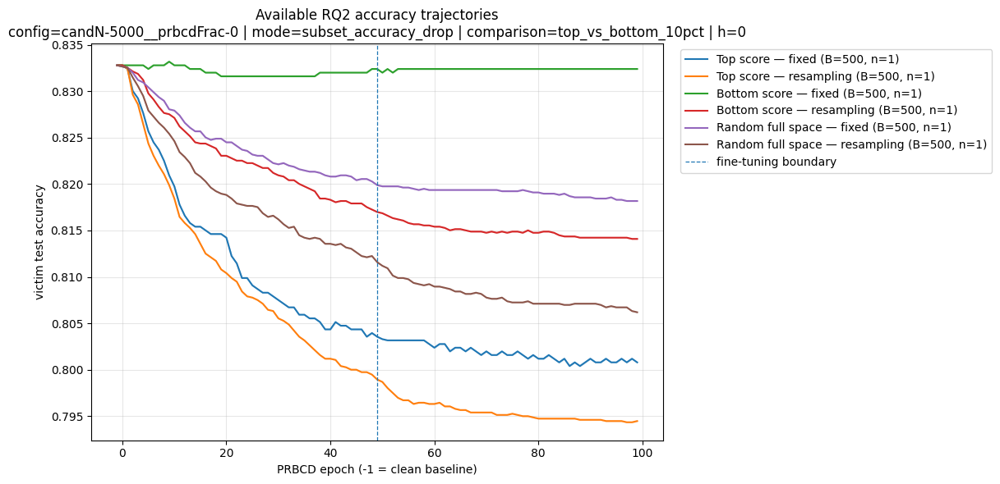

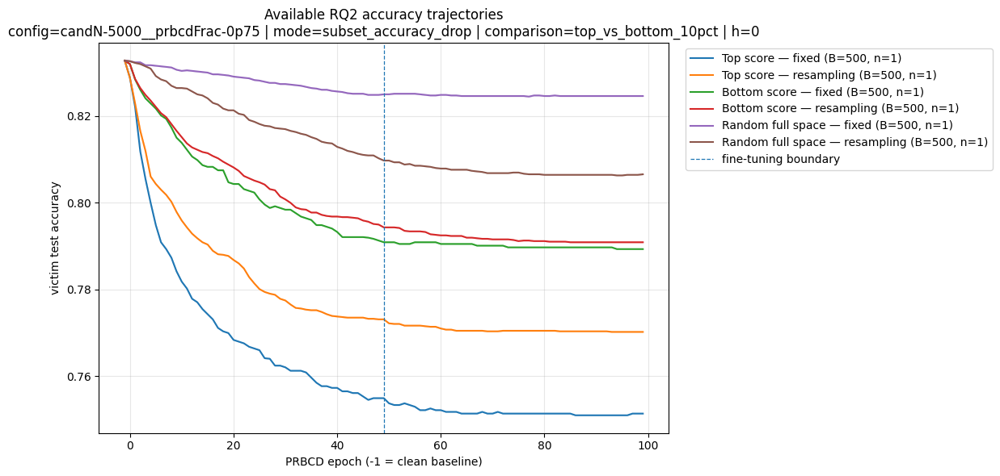

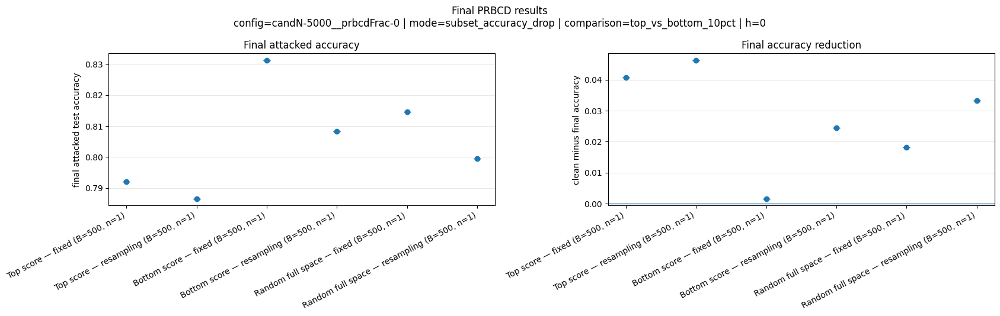

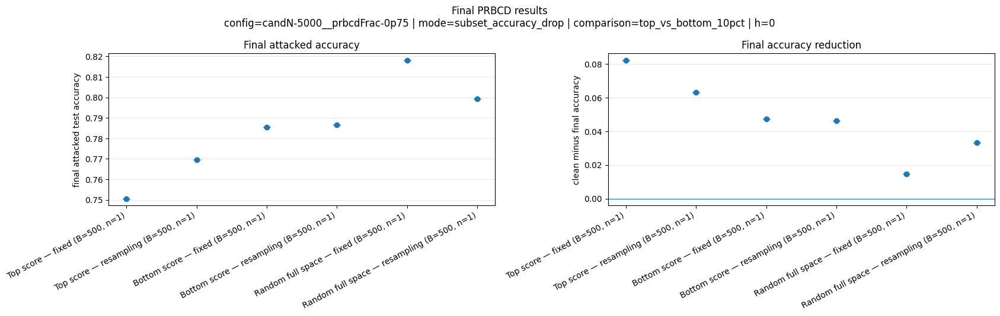

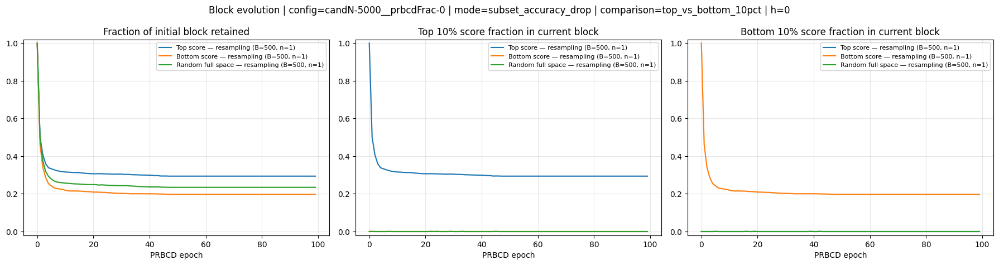

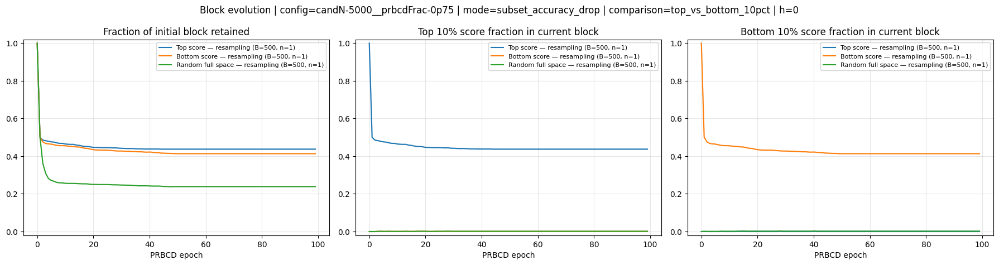

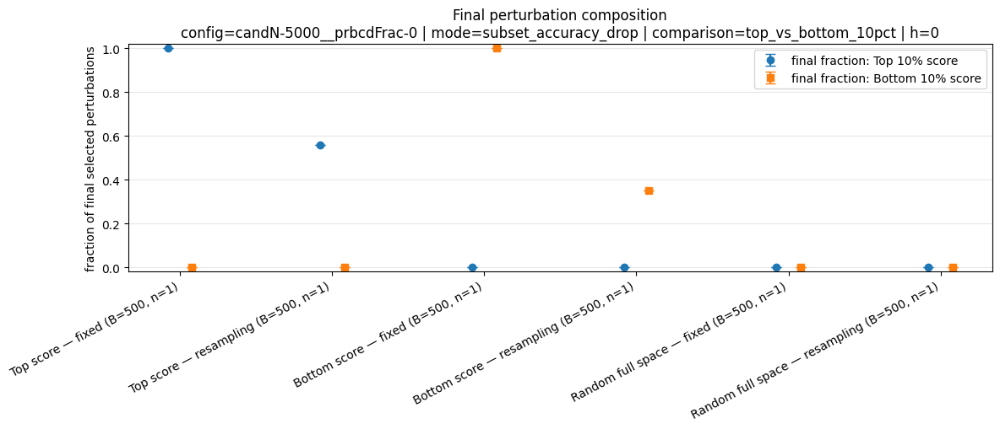

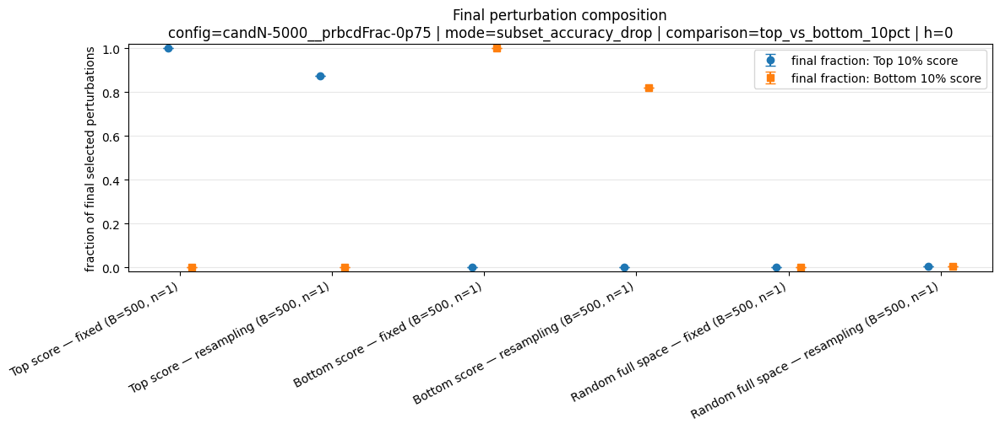


Paired initialization differences


,candidate_config_id,scoring_mode,comparison_rule,endpoint_mining_hop,resampling_enabled,condition_a,condition_b,final_accuracy_difference_mean,final_accuracy_difference_std,final_accuracy_difference_count,final_accuracy_drop_difference_mean,final_accuracy_drop_difference_std,final_accuracy_drop_difference_count,integrated_accuracy_drop_difference_mean,integrated_accuracy_drop_difference_std,integrated_accuracy_drop_difference_count,minimum_relaxed_accuracy_difference_mean,minimum_relaxed_accuracy_difference_std,minimum_relaxed_accuracy_difference_count,maximum_relaxed_accuracy_drop_difference_mean,maximum_relaxed_accuracy_drop_difference_std,maximum_relaxed_accuracy_drop_difference_count,final_accuracy_difference_sem,final_accuracy_drop_difference_sem,integrated_accuracy_drop_difference_sem,minimum_relaxed_accuracy_difference_sem,maximum_relaxed_accuracy_drop_difference_sem,n_seeds,target_group
0,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,False,score_bottom,random_full_space,0.016601,0.0,1,-0.016601,0.0,1,-0.010416,0.0,1,0.013439,0.0,1,-0.013439,0.0,1,0.0,0.0,0.0,0.0,0.0,1,unknown
1,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,False,score_top,random_full_space,-0.022530,0.0,1,0.022530,0.0,1,0.014456,0.0,1,-0.017787,0.0,1,0.017787,0.0,1,0.0,0.0,0.0,0.0,0.0,1,unknown
2,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,False,score_top,score_bottom,-0.039130,0.0,1,0.039130,0.0,1,0.024872,0.0,1,-0.031225,0.0,1,0.031225,0.0,1,0.0,0.0,0.0,0.0,0.0,1,unknown
3,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,True,score_bottom,random_full_space,0.008827,0.0,1,-0.008827,0.0,1,-0.005423,0.0,1,0.007905,0.0,1,-0.007905,0.0,1,0.0,0.0,0.0,0.0,0.0,1,unknown
4,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,True,score_top,random_full_space,-0.012912,0.0,1,0.012912,0.0,1,0.010557,0.0,1,-0.011858,0.0,1,0.011858,0.0,1,0.0,0.0,0.0,0.0,0.0,1,unknown
5,candN-5000__prbcdFrac-0,subset_accuracy_drop,top_vs_bottom_10pct,0,True,score_top,score_bottom,-0.021739,0.0,1,0.021739,0.0,1,0.015980,0.0,1,-0.019763,0.0,1,0.019763,0.0,1,0.0,0.0,0.0,0.0,0.0,1,unknown
6,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,False,score_bottom,random_full_space,-0.032675,0.0,1,0.032675,0.0,1,0.029206,0.0,1,-0.035178,0.0,1,0.035178,0.0,1,0.0,0.0,0.0,0.0,0.0,1,unknown
7,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,False,score_top,random_full_space,-0.067457,0.0,1,0.067457,0.0,1,0.064578,0.0,1,-0.073518,0.0,1,0.073518,0.0,1,0.0,0.0,0.0,0.0,0.0,1,unknown
8,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,False,score_top,score_bottom,-0.034783,0.0,1,0.034783,0.0,1,0.035373,0.0,1,-0.038340,0.0,1,0.038340,0.0,1,0.0,0.0,0.0,0.0,0.0,1,unknown
9,candN-5000__prbcdFrac-0p75,subset_accuracy_drop,top_vs_bottom_10pct,0,True,score_bottom,random_full_space,-0.012780,0.0,1,0.012780,0.0,1,0.014163,0.0,1,-0.015547,0.0,1,0.015547,0.0,1,0.0,0.0,0.0,0.0,0.0,1,unknown


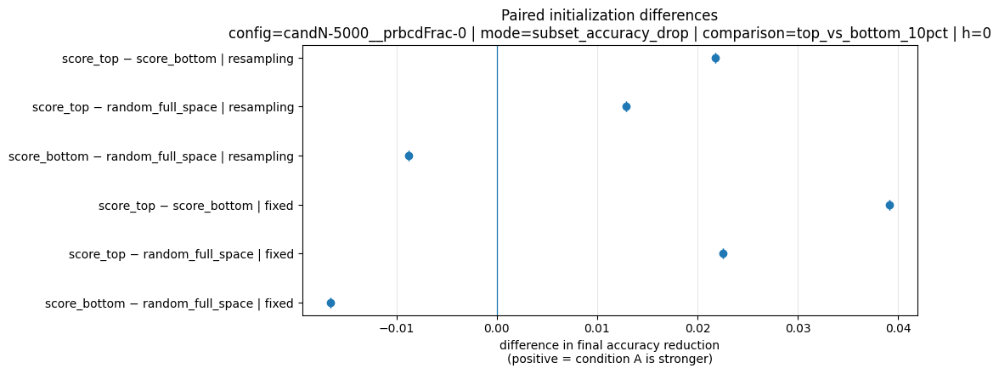

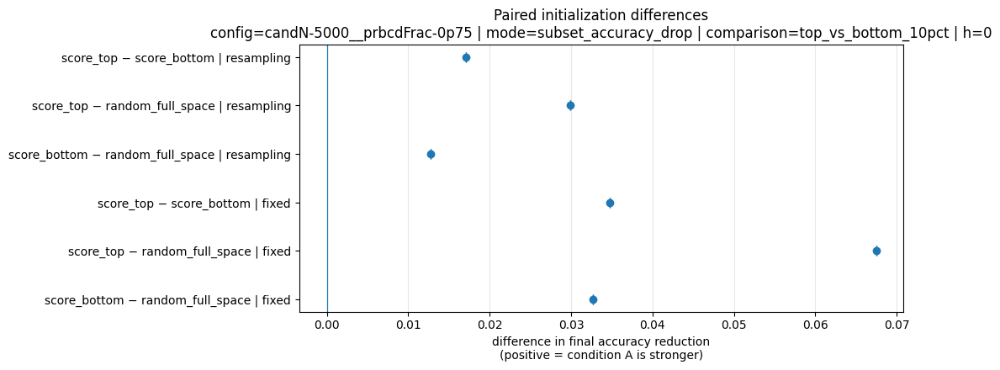


Plots saved to:
/home/hschult5/AttackerGNN/extendedPlotting/rq2_mode_aware_initial_block_multiseed/cora_ml__20260721_125043/plots_partial


In [29]:
# ============================================================
# Plot an existing complete or partially completed mode-aware
# RQ2 initial-block run.
# ============================================================

from pathlib import Path
import json
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display


# ============================================================
# Select the existing run
# ============================================================

def _resolve_rq2_block_output_directory():
    current = globals().get(
        "RQ2_BLOCK_OUT_DIR"
    )

    if current is not None:
        current = Path(current)

        if current.exists():
            return current

    base = Path(
        globals().get(
            "RQ2_BLOCK_BASE_OUT_DIR",
            Path("extendedPlotting")
            / "rq2_mode_aware_initial_block_multiseed",
        )
    )

    latest_file = (
        base
        / "latest_run.txt"
    )

    if latest_file.exists():
        latest_path = Path(
            latest_file
            .read_text(
                encoding="utf-8"
            )
            .strip()
        )

        if latest_path.exists():
            return latest_path

    completed = [
        path
        for path in base.glob("*")
        if path.is_dir()
        and (
            path
            / "runs_raw.csv"
        ).exists()
    ]

    if completed:
        return max(
            completed,
            key=lambda path: (
                path.stat().st_mtime,
                path.name,
            ),
        )

    raise FileNotFoundError(
        "Could not find an RQ2 block output directory. "
        "Run the mode-aware execution cell first."
    )


RQ2_BLOCK_OUT_DIR = (
    _resolve_rq2_block_output_directory()
)

RQ2_BLOCK_PLOT_DIR = (
    RQ2_BLOCK_OUT_DIR
    / "plots_partial"
)

RQ2_BLOCK_PLOT_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


# ============================================================
# General helpers
# ============================================================

def _rq2_safe(value):
    return re.sub(
        r"[^a-zA-Z0-9_.=-]+",
        "_",
        str(value),
    ).strip("_")


def _rq2_read_csv(
    out_dir,
    filename,
):
    path = (
        Path(out_dir)
        / filename
    )

    if not path.exists():
        print(
            f"[missing] {filename}"
        )
        return pd.DataFrame()

    if path.stat().st_size == 0:
        print(
            f"[empty]   {filename}"
        )
        return pd.DataFrame()

    try:
        frame = pd.read_csv(
            path,
            on_bad_lines="skip",
        )
    except pd.errors.EmptyDataError:
        print(
            f"[empty]   {filename}"
        )
        return pd.DataFrame()

    print(
        f"[loaded]  {filename}: "
        f"{len(frame):,} rows"
    )

    return frame


def _rq2_two_stage_summary(
    frame,
    group_cols,
    metric_cols,
):
    if frame.empty:
        return pd.DataFrame()

    missing_group_cols = [
        column
        for column in (
            group_cols
            + ["seed"]
        )
        if column
        not in frame.columns
    ]

    if missing_group_cols:
        raise ValueError(
            "Cannot rebuild summary. "
            "Missing grouping columns: "
            f"{missing_group_cols}"
        )

    available_metrics = [
        column
        for column in metric_cols
        if column in frame.columns
    ]

    if not available_metrics:
        return pd.DataFrame()

    work = frame.copy()

    for metric in available_metrics:
        work[metric] = (
            pd.to_numeric(
                work[metric],
                errors="coerce",
            )
        )

    seed_level = (
        work
        .groupby(
            group_cols
            + ["seed"],
            dropna=False,
        )[available_metrics]
        .mean()
        .reset_index()
    )

    grouped = seed_level.groupby(
        group_cols,
        dropna=False,
    )

    summary = grouped[
        available_metrics
    ].agg(
        [
            "mean",
            "std",
            "count",
        ]
    )

    summary.columns = [
        f"{metric}_{statistic}"
        for metric, statistic
        in summary.columns
    ]

    summary = summary.reset_index()

    n_seeds = (
        seed_level
        .groupby(
            group_cols,
            dropna=False,
        )["seed"]
        .nunique()
        .rename("n_seeds")
        .reset_index()
    )

    summary = summary.merge(
        n_seeds,
        on=group_cols,
        how="left",
        validate="one_to_one",
    )

    for metric in available_metrics:
        std_column = (
            f"{metric}_std"
        )

        count_column = (
            f"{metric}_count"
        )

        summary[std_column] = (
            summary[std_column]
            .fillna(0.0)
        )

        summary[
            f"{metric}_sem"
        ] = (
            summary[std_column]
            / np.sqrt(
                summary[
                    count_column
                ].clip(lower=1)
            )
        )

    return summary


def _rq2_add_block_size_alias(
    frame,
):
    frame = frame.copy()

    if (
        not frame.empty
        and "block_size"
        not in frame.columns
        and "block_size_mean"
        in frame.columns
    ):
        frame["block_size"] = (
            frame[
                "block_size_mean"
            ]
        )

    return frame


def _rq2_is_true(series):
    return (
        series
        .astype(str)
        .str.strip()
        .str.lower()
        .isin({
            "true",
            "1",
            "yes",
        })
    )


def _rq2_add_mean_std_band(
    ax,
    x,
    mean,
    std,
    *,
    label,
):
    plot_frame = pd.DataFrame({
        "x": pd.to_numeric(
            x,
            errors="coerce",
        ),
        "mean": pd.to_numeric(
            mean,
            errors="coerce",
        ),
        "std": pd.to_numeric(
            std,
            errors="coerce",
        ),
    }).dropna(
        subset=[
            "x",
            "mean",
        ]
    )

    if plot_frame.empty:
        return False

    plot_frame = (
        plot_frame
        .sort_values("x")
    )

    plot_frame["std"] = (
        plot_frame["std"]
        .fillna(0.0)
    )

    x_values = (
        plot_frame["x"]
        .to_numpy(
            dtype=float
        )
    )

    mean_values = (
        plot_frame["mean"]
        .to_numpy(
            dtype=float
        )
    )

    std_values = (
        plot_frame["std"]
        .to_numpy(
            dtype=float
        )
    )

    line = ax.plot(
        x_values,
        mean_values,
        label=label,
    )[0]

    ax.fill_between(
        x_values,
        mean_values
        - std_values,
        mean_values
        + std_values,
        alpha=0.16,
        color=line.get_color(),
    )

    return True


def _add_mode_aware_columns(
    frame,
):
    """
    Add missing mode-aware columns and support older endpoint-only outputs.
    """
    if frame.empty:
        return frame

    frame = frame.copy()

    if "scoring_mode" not in frame.columns:
        frame[
            "scoring_mode"
        ] = "endpoint"

    if "comparison_rule" not in frame.columns:
        frame[
            "comparison_rule"
        ] = np.where(
            frame[
                "scoring_mode"
            ].astype(str)
            == "subset_accuracy_drop",
            "top_vs_bottom_10pct",
            "endpoint_label_1_vs_0",
        )

    if "target_group" not in frame.columns:
        initialization = (
            frame.get(
                "initialization",
                pd.Series(
                    "",
                    index=frame.index,
                ),
            )
            .astype(str)
        )

        frame[
            "target_group"
        ] = np.select(
            [
                initialization.isin({
                    "label_positive",
                    "score_top",
                }),
                initialization.isin({
                    "label_zero",
                    "score_bottom",
                }),
                initialization.eq(
                    "random_full_space"
                ),
            ],
            [
                "high",
                "low",
                "random",
            ],
            default="unknown",
        )

    legacy_map = {
        "fraction_final_selected_group_high": (
            "fraction_final_selected_label_positive"
        ),
        "fraction_final_selected_group_low": (
            "fraction_final_selected_label_zero"
        ),
        "final_block_group_high_fraction": (
            "final_block_positive_fraction"
        ),
        "final_block_group_low_fraction": (
            "final_block_zero_fraction"
        ),
        "group_high_fraction_in_current_block": (
            "positive_fraction_in_current_block"
        ),
        "group_low_fraction_in_current_block": (
            "zero_fraction_in_current_block"
        ),
        "n_group_high_edges": (
            "n_positive_labels"
        ),
        "n_group_low_edges": (
            "n_zero_labels"
        ),
        "high_sampling_fraction": (
            "positive_sampling_fraction"
        ),
        "low_sampling_fraction": (
            "zero_sampling_fraction"
        ),
    }

    for (
        new_column,
        old_column,
    ) in legacy_map.items():
        if (
            new_column
            not in frame.columns
            and old_column
            in frame.columns
        ):
            frame[
                new_column
            ] = frame[
                old_column
            ]

    return frame


def _mode_group_labels(
    scoring_mode,
    comparison_rule,
):
    scoring_mode = str(
        scoring_mode
    )

    if (
        scoring_mode
        == "subset_accuracy_drop"
    ):
        fraction_match = re.search(
            r"([0-9]+(?:p[0-9]+)?)pct",
            str(comparison_rule),
        )

        fraction_text = (
            fraction_match
            .group(1)
            .replace(
                "p",
                ".",
            )
            if fraction_match
            else "10"
        )

        return (
            f"Top {fraction_text}% score",
            f"Bottom {fraction_text}% score",
        )

    return (
        "Endpoint label 1",
        "Endpoint label 0",
    )


def _config_description(
    config_key,
):
    (
        candidate_config_id,
        scoring_mode,
        comparison_rule,
        endpoint_hop,
    ) = config_key

    return (
        f"config={candidate_config_id} | "
        f"mode={scoring_mode} | "
        f"comparison={comparison_rule} | "
        f"h={endpoint_hop}"
    )


# ============================================================
# Load available data
# ============================================================

print(
    "Loading RQ2 run:"
)

print(
    RQ2_BLOCK_OUT_DIR.resolve()
)

print()

rq2_block_runs_raw_df = (
    _add_mode_aware_columns(
        _rq2_read_csv(
            RQ2_BLOCK_OUT_DIR,
            "runs_raw.csv",
        )
    )
)

rq2_block_epochs_raw_df = (
    _add_mode_aware_columns(
        _rq2_read_csv(
            RQ2_BLOCK_OUT_DIR,
            "epoch_metrics_raw.csv",
        )
    )
)

rq2_block_retention_raw_df = (
    _add_mode_aware_columns(
        _rq2_read_csv(
            RQ2_BLOCK_OUT_DIR,
            "block_retention_raw.csv",
        )
    )
)

rq2_block_runs_summary_df = (
    _add_mode_aware_columns(
        _rq2_read_csv(
            RQ2_BLOCK_OUT_DIR,
            "runs_summary.csv",
        )
    )
)

rq2_block_epochs_summary_df = (
    _add_mode_aware_columns(
        _rq2_read_csv(
            RQ2_BLOCK_OUT_DIR,
            "epoch_metrics_summary.csv",
        )
    )
)

rq2_block_retention_summary_df = (
    _add_mode_aware_columns(
        _rq2_read_csv(
            RQ2_BLOCK_OUT_DIR,
            "block_retention_summary.csv",
        )
    )
)

rq2_block_paired_summary_df = (
    _add_mode_aware_columns(
        _rq2_read_csv(
            RQ2_BLOCK_OUT_DIR,
            "paired_differences_summary.csv",
        )
    )
)


# ============================================================
# Rebuild missing summaries from raw data
# ============================================================

rq2_group_cols = [
    "candidate_config_id",
    "scoring_mode",
    "comparison_rule",
    "endpoint_mining_hop",
    "initialization",
    "block_origin",
    "target_group",
    "target_group_name",
    "resampling_enabled",
    "condition",
]

rq2_run_metrics = [
    "block_size",
    "balanced_block_size",
    "n_group_high_edges",
    "n_group_low_edges",
    "high_sampling_fraction",
    "low_sampling_fraction",
    "clean_accuracy",
    "final_accuracy",
    "final_accuracy_drop",
    "minimum_relaxed_accuracy",
    "maximum_relaxed_accuracy_drop",
    "integrated_accuracy_drop",
    "epoch_to_1pp_drop",
    "epoch_to_2pp_drop",
    "fraction_final_selected_from_initial",
    "fraction_final_selected_group_high",
    "fraction_final_selected_group_low",
    "final_block_initial_retention",
    "final_block_group_high_fraction",
    "final_block_group_low_fraction",
    "runtime_seconds",
]

rq2_epoch_group_cols = (
    rq2_group_cols
    + ["prbcd_epoch"]
)

if (
    rq2_block_runs_summary_df.empty
    and not rq2_block_runs_raw_df.empty
):
    print(
        "\nRebuilding runs summary "
        "from runs_raw.csv"
    )

    rq2_block_runs_summary_df = (
        _rq2_two_stage_summary(
            rq2_block_runs_raw_df,
            rq2_group_cols,
            rq2_run_metrics,
        )
    )

if (
    rq2_block_epochs_summary_df.empty
    and not rq2_block_epochs_raw_df.empty
):
    print(
        "Rebuilding epoch summary "
        "from epoch_metrics_raw.csv"
    )

    rq2_block_epochs_summary_df = (
        _rq2_two_stage_summary(
            rq2_block_epochs_raw_df,
            rq2_epoch_group_cols,
            [
                "block_size",
                "accuracy",
                "accuracy_drop",
                "loss",
            ],
        )
    )

if (
    rq2_block_retention_summary_df.empty
    and not rq2_block_retention_raw_df.empty
):
    print(
        "Rebuilding retention summary "
        "from block_retention_raw.csv"
    )

    rq2_block_retention_summary_df = (
        _rq2_two_stage_summary(
            rq2_block_retention_raw_df,
            rq2_epoch_group_cols,
            [
                "block_size",
                "initial_retention",
                "group_high_fraction_in_current_block",
                "group_low_fraction_in_current_block",
            ],
        )
    )

rq2_block_runs_summary_df = (
    _rq2_add_block_size_alias(
        rq2_block_runs_summary_df
    )
)

rq2_block_epochs_summary_df = (
    _rq2_add_block_size_alias(
        rq2_block_epochs_summary_df
    )
)

rq2_block_retention_summary_df = (
    _rq2_add_block_size_alias(
        rq2_block_retention_summary_df
    )
)


# ============================================================
# Stop when no metric data were saved
# ============================================================

if (
    rq2_block_runs_summary_df.empty
    and rq2_block_epochs_summary_df.empty
    and rq2_block_retention_summary_df.empty
):
    available_files = sorted(
        path.name
        for path in RQ2_BLOCK_OUT_DIR.iterdir()
    )

    raise RuntimeError(
        "No saved RQ2 metric CSV data were found.\n\n"
        "The initial block files alone cannot reconstruct "
        "accuracy trajectories when execution was interrupted "
        "before the CSV-writing stage.\n\n"
        f"Files currently present:\n{available_files}"
    )


# ============================================================
# Experiment configuration
# ============================================================

config_path = (
    RQ2_BLOCK_OUT_DIR
    / "experiment_config.json"
)

experiment_config = {}

if config_path.exists():
    with config_path.open(
        "r",
        encoding="utf-8",
    ) as file:
        experiment_config = (
            json.load(file)
        )

resampling_boundary = int(
    experiment_config.get(
        "nominal_resampling_epochs",
        globals().get(
            "RQ2_BLOCK_RESAMPLING_EPOCHS",
            50,
        ),
    )
)


# ============================================================
# Condition ordering and display labels
# ============================================================

RQ2_CONDITION_ORDER = [
    "label_positive__fixed_block",
    "label_positive__random_resampling",
    "label_zero__fixed_block",
    "label_zero__random_resampling",
    "score_top__fixed_block",
    "score_top__random_resampling",
    "score_bottom__fixed_block",
    "score_bottom__random_resampling",
    "random_full_space__fixed_block",
    "random_full_space__random_resampling",
]

RQ2_CONDITION_ORDER_MAP = {
    condition: index
    for index, condition
    in enumerate(
        RQ2_CONDITION_ORDER
    )
}

CONDITION_DISPLAY = {
    "label_positive__fixed_block": (
        "Endpoint label 1 — fixed"
    ),
    "label_positive__random_resampling": (
        "Endpoint label 1 — resampling"
    ),
    "label_zero__fixed_block": (
        "Endpoint label 0 — fixed"
    ),
    "label_zero__random_resampling": (
        "Endpoint label 0 — resampling"
    ),
    "score_top__fixed_block": (
        "Top score — fixed"
    ),
    "score_top__random_resampling": (
        "Top score — resampling"
    ),
    "score_bottom__fixed_block": (
        "Bottom score — fixed"
    ),
    "score_bottom__random_resampling": (
        "Bottom score — resampling"
    ),
    "random_full_space__fixed_block": (
        "Random full space — fixed"
    ),
    "random_full_space__random_resampling": (
        "Random full space — resampling"
    ),
}

plot_config_cols = [
    "candidate_config_id",
    "scoring_mode",
    "comparison_rule",
    "endpoint_mining_hop",
]


def _rq2_order_frame(
    frame,
):
    frame = frame.copy()

    frame[
        "_condition_order"
    ] = (
        frame["condition"]
        .map(
            RQ2_CONDITION_ORDER_MAP
        )
        .fillna(
            len(
                RQ2_CONDITION_ORDER_MAP
            )
        )
    )

    return frame.sort_values(
        [
            "_condition_order",
            "block_size",
            "condition",
        ]
    )


def _rq2_plot_label(
    row,
):
    condition = str(
        row["condition"]
    )

    display_name = (
        CONDITION_DISPLAY.get(
            condition,
            condition,
        )
    )

    block_size = row.get(
        "block_size",
        np.nan,
    )

    block_label = (
        "B=?"
        if pd.isna(
            block_size
        )
        else (
            f"B={int(round(float(block_size)))}"
        )
    )

    n_seeds = row.get(
        "n_seeds",
        np.nan,
    )

    if pd.isna(n_seeds):
        return (
            f"{display_name} "
            f"({block_label})"
        )

    return (
        f"{display_name} "
        f"({block_label}, "
        f"n={int(n_seeds)})"
    )


# ============================================================
# Display partial-run completeness
# ============================================================

print(
    "\nAvailable completed conditions"
)

if not rq2_block_runs_raw_df.empty:
    completeness_df = (
        rq2_block_runs_raw_df
        .groupby(
            plot_config_cols
            + ["condition"],
            dropna=False,
        )
        .agg(
            completed_rows=(
                "condition",
                "size",
            ),
            completed_seeds=(
                "seed",
                "nunique",
            ),
            completed_repeats=(
                "repeat",
                "nunique",
            ),
        )
        .reset_index()
        .sort_values(
            plot_config_cols
            + ["condition"]
        )
    )

    display(
        completeness_df
    )

elif not rq2_block_runs_summary_df.empty:
    available_columns = (
        plot_config_cols
        + [
            "condition",
            "n_seeds",
        ]
    )

    available_columns = [
        column
        for column in available_columns
        if column
        in rq2_block_runs_summary_df.columns
    ]

    display(
        rq2_block_runs_summary_df[
            available_columns
        ].sort_values(
            [
                column
                for column in (
                    plot_config_cols
                    + ["condition"]
                )
                if column
                in available_columns
            ]
        )
    )


# ============================================================
# 1. Accuracy trajectories
# ============================================================

required_accuracy_columns = {
    "accuracy_mean",
    "accuracy_std",
    "prbcd_epoch",
    "condition",
    "block_size",
}

if (
    not rq2_block_epochs_summary_df.empty
    and required_accuracy_columns.issubset(
        rq2_block_epochs_summary_df.columns
    )
):
    for (
        config_key,
        frame,
    ) in (
        rq2_block_epochs_summary_df
        .groupby(
            plot_config_cols,
            dropna=False,
        )
    ):
        frame = (
            _rq2_order_frame(
                frame
            )
        )

        fig, ax = plt.subplots(
            figsize=(12, 6)
        )

        plotted = 0

        for (
            condition,
            condition_df,
        ) in frame.groupby(
            "condition",
            sort=False,
        ):
            condition_df = (
                condition_df
                .sort_values(
                    "prbcd_epoch"
                )
            )

            representative_row = (
                condition_df.iloc[0]
            )

            plotted += int(
                _rq2_add_mean_std_band(
                    ax,
                    condition_df[
                        "prbcd_epoch"
                    ],
                    condition_df[
                        "accuracy_mean"
                    ],
                    condition_df[
                        "accuracy_std"
                    ],
                    label=(
                        _rq2_plot_label(
                            representative_row
                        )
                    ),
                )
            )

        if plotted == 0:
            plt.close(fig)
            continue

        ax.axvline(
            resampling_boundary - 1,
            linestyle="--",
            linewidth=0.9,
            label=(
                "fine-tuning boundary"
            ),
        )

        ax.set_xlabel(
            "PRBCD epoch "
            "(-1 = clean baseline)"
        )

        ax.set_ylabel(
            "victim test accuracy"
        )

        ax.set_title(
            "Available RQ2 accuracy trajectories\n"
            + _config_description(
                config_key
            )
        )

        ax.grid(
            True,
            alpha=0.3,
        )

        ax.legend(
            bbox_to_anchor=(
                1.02,
                1,
            ),
            loc="upper left",
        )

        fig.tight_layout()

        output_path = (
            RQ2_BLOCK_PLOT_DIR
            / (
                "accuracy_partial__"
                f"{_rq2_safe('__'.join(map(str, config_key)))}"
                ".png"
            )
        )

        fig.savefig(
            output_path,
            dpi=200,
            bbox_inches="tight",
        )

        plt.show()

else:
    print(
        "\nSkipping accuracy trajectories: "
        "no epoch summary data are available."
    )


# ============================================================
# 2. Final attacked accuracy and accuracy drop
# ============================================================

required_final_columns = {
    "final_accuracy_mean",
    "final_accuracy_std",
    "final_accuracy_drop_mean",
    "final_accuracy_drop_std",
    "condition",
    "block_size",
}

if (
    not rq2_block_runs_summary_df.empty
    and required_final_columns.issubset(
        rq2_block_runs_summary_df.columns
    )
):
    for (
        config_key,
        frame,
    ) in (
        rq2_block_runs_summary_df
        .groupby(
            plot_config_cols,
            dropna=False,
        )
    ):
        frame = (
            _rq2_order_frame(
                frame
            )
        )

        frame = frame.dropna(
            subset=[
                "final_accuracy_mean"
            ]
        )

        if frame.empty:
            continue

        labels = [
            _rq2_plot_label(row)
            for _, row
            in frame.iterrows()
        ]

        x = np.arange(
            len(frame)
        )

        fig, axes = plt.subplots(
            1,
            2,
            figsize=(17, 5.4),
        )

        axes[0].errorbar(
            x,
            frame[
                "final_accuracy_mean"
            ],
            yerr=frame[
                "final_accuracy_std"
            ].fillna(0.0),
            marker="o",
            linestyle="none",
            capsize=4,
        )

        axes[0].set_ylabel(
            "final attacked test accuracy"
        )

        axes[0].set_title(
            "Final attacked accuracy"
        )

        axes[1].errorbar(
            x,
            frame[
                "final_accuracy_drop_mean"
            ],
            yerr=frame[
                "final_accuracy_drop_std"
            ].fillna(0.0),
            marker="o",
            linestyle="none",
            capsize=4,
        )

        axes[1].axhline(
            0.0,
            linewidth=0.9,
        )

        axes[1].set_ylabel(
            "clean minus final accuracy"
        )

        axes[1].set_title(
            "Final accuracy reduction"
        )

        for ax in axes:
            ax.set_xticks(x)
            ax.set_xticklabels(
                labels,
                rotation=28,
                ha="right",
            )
            ax.grid(
                True,
                axis="y",
                alpha=0.3,
            )

        fig.suptitle(
            "Final PRBCD results\n"
            + _config_description(
                config_key
            )
        )

        fig.tight_layout()

        output_path = (
            RQ2_BLOCK_PLOT_DIR
            / (
                "final_results_partial__"
                f"{_rq2_safe('__'.join(map(str, config_key)))}"
                ".png"
            )
        )

        fig.savefig(
            output_path,
            dpi=200,
            bbox_inches="tight",
        )

        plt.show()

else:
    print(
        "\nSkipping final-result plots: "
        "no completed run-level results are available."
    )


# ============================================================
# 3. Evolution of current search block
# ============================================================

retention_columns = {
    "condition",
    "block_size",
    "prbcd_epoch",
    "resampling_enabled",
    "initial_retention_mean",
    "initial_retention_std",
    "group_high_fraction_in_current_block_mean",
    "group_high_fraction_in_current_block_std",
    "group_low_fraction_in_current_block_mean",
    "group_low_fraction_in_current_block_std",
}

if (
    not rq2_block_retention_summary_df.empty
    and retention_columns.issubset(
        rq2_block_retention_summary_df.columns
    )
):
    for (
        config_key,
        frame,
    ) in (
        rq2_block_retention_summary_df
        .groupby(
            plot_config_cols,
            dropna=False,
        )
    ):
        frame = frame[
            _rq2_is_true(
                frame[
                    "resampling_enabled"
                ]
            )
        ].copy()

        if frame.empty:
            continue

        frame = (
            _rq2_order_frame(
                frame
            )
        )

        high_label, low_label = (
            _mode_group_labels(
                config_key[1],
                config_key[2],
            )
        )

        fig, axes = plt.subplots(
            1,
            3,
            figsize=(18, 4.8),
        )

        plotted = 0

        for (
            condition,
            condition_df,
        ) in frame.groupby(
            "condition",
            sort=False,
        ):
            condition_df = (
                condition_df
                .sort_values(
                    "prbcd_epoch"
                )
            )

            label = (
                _rq2_plot_label(
                    condition_df.iloc[0]
                )
            )

            plotted += int(
                _rq2_add_mean_std_band(
                    axes[0],
                    condition_df[
                        "prbcd_epoch"
                    ],
                    condition_df[
                        "initial_retention_mean"
                    ],
                    condition_df[
                        "initial_retention_std"
                    ],
                    label=label,
                )
            )

            _rq2_add_mean_std_band(
                axes[1],
                condition_df[
                    "prbcd_epoch"
                ],
                condition_df[
                    "group_high_fraction_in_current_block_mean"
                ],
                condition_df[
                    "group_high_fraction_in_current_block_std"
                ],
                label=label,
            )

            _rq2_add_mean_std_band(
                axes[2],
                condition_df[
                    "prbcd_epoch"
                ],
                condition_df[
                    "group_low_fraction_in_current_block_mean"
                ],
                condition_df[
                    "group_low_fraction_in_current_block_std"
                ],
                label=label,
            )

        if plotted == 0:
            plt.close(fig)
            continue

        axes[0].set_title(
            "Fraction of initial block retained"
        )

        axes[1].set_title(
            f"{high_label} fraction "
            "in current block"
        )

        axes[2].set_title(
            f"{low_label} fraction "
            "in current block"
        )

        for ax in axes:
            ax.set_xlabel(
                "PRBCD epoch"
            )
            ax.set_ylim(
                -0.02,
                1.02,
            )
            ax.grid(
                True,
                alpha=0.3,
            )
            ax.legend(
                fontsize=8,
            )

        fig.suptitle(
            "Block evolution | "
            + _config_description(
                config_key
            )
        )

        fig.tight_layout()

        output_path = (
            RQ2_BLOCK_PLOT_DIR
            / (
                "retention_partial__"
                f"{_rq2_safe('__'.join(map(str, config_key)))}"
                ".png"
            )
        )

        fig.savefig(
            output_path,
            dpi=200,
            bbox_inches="tight",
        )

        plt.show()

else:
    print(
        "\nSkipping retention plots: "
        "no block-retention data are available."
    )


# ============================================================
# 4. Composition of final perturbation set
# ============================================================

composition_columns = {
    "condition",
    "block_size",
    "fraction_final_selected_group_high_mean",
    "fraction_final_selected_group_high_std",
    "fraction_final_selected_group_low_mean",
    "fraction_final_selected_group_low_std",
}

if (
    not rq2_block_runs_summary_df.empty
    and composition_columns.issubset(
        rq2_block_runs_summary_df.columns
    )
):
    for (
        config_key,
        frame,
    ) in (
        rq2_block_runs_summary_df
        .groupby(
            plot_config_cols,
            dropna=False,
        )
    ):
        frame = (
            _rq2_order_frame(
                frame
            )
        )

        frame = frame.dropna(
            subset=[
                "fraction_final_selected_group_high_mean",
                "fraction_final_selected_group_low_mean",
            ],
            how="all",
        )

        if frame.empty:
            continue

        high_label, low_label = (
            _mode_group_labels(
                config_key[1],
                config_key[2],
            )
        )

        labels = [
            _rq2_plot_label(row)
            for _, row
            in frame.iterrows()
        ]

        x = np.arange(
            len(frame)
        )

        fig, ax = plt.subplots(
            figsize=(12, 5.2)
        )

        ax.errorbar(
            x - 0.08,
            frame[
                "fraction_final_selected_group_high_mean"
            ],
            yerr=frame[
                "fraction_final_selected_group_high_std"
            ].fillna(0.0),
            marker="o",
            linestyle="none",
            capsize=4,
            label=(
                f"final fraction: {high_label}"
            ),
        )

        ax.errorbar(
            x + 0.08,
            frame[
                "fraction_final_selected_group_low_mean"
            ],
            yerr=frame[
                "fraction_final_selected_group_low_std"
            ].fillna(0.0),
            marker="s",
            linestyle="none",
            capsize=4,
            label=(
                f"final fraction: {low_label}"
            ),
        )

        ax.set_xticks(x)

        ax.set_xticklabels(
            labels,
            rotation=28,
            ha="right",
        )

        ax.set_ylim(
            -0.02,
            1.02,
        )

        ax.set_ylabel(
            "fraction of final selected perturbations"
        )

        ax.set_title(
            "Final perturbation composition\n"
            + _config_description(
                config_key
            )
        )

        ax.grid(
            True,
            axis="y",
            alpha=0.3,
        )

        ax.legend()

        fig.tight_layout()

        output_path = (
            RQ2_BLOCK_PLOT_DIR
            / (
                "final_composition_partial__"
                f"{_rq2_safe('__'.join(map(str, config_key)))}"
                ".png"
            )
        )

        fig.savefig(
            output_path,
            dpi=200,
            bbox_inches="tight",
        )

        plt.show()

else:
    print(
        "\nSkipping composition plots: "
        "no final-composition results are available."
    )


# ============================================================
# 5. Paired initialization differences
# ============================================================

if not rq2_block_paired_summary_df.empty:
    print(
        "\nPaired initialization differences"
    )

    display(
        rq2_block_paired_summary_df
    )

    required_paired = {
        "condition_a",
        "condition_b",
        "resampling_enabled",
        "final_accuracy_drop_difference_mean",
        "final_accuracy_drop_difference_std",
    }

    if required_paired.issubset(
        rq2_block_paired_summary_df.columns
    ):
        for (
            config_key,
            frame,
        ) in (
            rq2_block_paired_summary_df
            .groupby(
                plot_config_cols,
                dropna=False,
            )
        ):
            frame = frame.copy()

            frame["comparison"] = (
                frame[
                    "condition_a"
                ].astype(str)
                + " − "
                + frame[
                    "condition_b"
                ].astype(str)
                + np.where(
                    _rq2_is_true(
                        frame[
                            "resampling_enabled"
                        ]
                    ),
                    " | resampling",
                    " | fixed",
                )
            )

            x = np.arange(
                len(frame)
            )

            fig, ax = plt.subplots(
                figsize=(
                    11,
                    max(
                        4.5,
                        0.6
                        * len(frame),
                    ),
                )
            )

            ax.errorbar(
                frame[
                    "final_accuracy_drop_difference_mean"
                ],
                x,
                xerr=frame[
                    "final_accuracy_drop_difference_std"
                ].fillna(0.0),
                marker="o",
                linestyle="none",
                capsize=4,
            )

            ax.axvline(
                0.0,
                linewidth=0.9,
            )

            ax.set_yticks(x)

            ax.set_yticklabels(
                frame[
                    "comparison"
                ]
            )

            ax.set_xlabel(
                "difference in final accuracy reduction\n"
                "(positive = condition A is stronger)"
            )

            ax.set_title(
                "Paired initialization differences\n"
                + _config_description(
                    config_key
                )
            )

            ax.grid(
                True,
                axis="x",
                alpha=0.3,
            )

            fig.tight_layout()

            output_path = (
                RQ2_BLOCK_PLOT_DIR
                / (
                    "paired_differences__"
                    f"{_rq2_safe('__'.join(map(str, config_key)))}"
                    ".png"
                )
            )

            fig.savefig(
                output_path,
                dpi=200,
                bbox_inches="tight",
            )

            plt.show()


print()

print(
    "Plots saved to:"
)

print(
    RQ2_BLOCK_PLOT_DIR.resolve()
)


---

# RQ2 Synthesis — From Individual Harmfulness to PR-BCD Usefulness

The RQ2 experiments investigate progressively stronger notions of harmfulness.

## 1. Individual harmfulness

Direct mining determines whether an edge causes observable damage when evaluated individually.

Endpoint mining captures local harmfulness:

\[
e
\rightarrow
H_{\mathrm{loc}}(e;G).
\]

Accuracy-drop mining captures an individual global effect:

\[
e
\rightarrow
A(G)-A(G\oplus e).
\]

## 2. Conditional harmfulness under joint perturbations

The oracle experiment determines whether mined candidates continue to contribute damage after other perturbations have already been applied:

\[
e
\rightarrow
H_{\mathrm{cond}}(e\mid B;G).
\]

This separates conditionally harmful, neutral, and cancelling additions.

## 3. Conditional harmfulness during optimization

The injection experiment evaluates whether a mined candidate remains useful inside an evolving PR-BCD state:

\[
e
\rightarrow
H_{\mathrm{inj}}(e\mid S_t).
\]

This measures harmfulness under the current block composition, relaxed weights, and optimization history.

## 4. Candidate-space usefulness

The balanced initialization experiment evaluates whether local harmfulness information improves the restricted PR-BCD search space:

\[
H_{\mathrm{loc}}
\rightarrow
\text{label-informed block}
\rightarrow
\text{PR-BCD attack effectiveness}.
\]

Together, the experiments test the chain

\[
\boxed{
\text{individually harmful}
\rightarrow
\text{conditionally harmful}
\rightarrow
\text{useful as a PR-BCD candidate}
}
\]

The results also decompose candidate-block quality into two components:

\[
\boxed{
\text{candidate coverage}
+
\text{candidate compatibility}
}
\]

Endpoint label-1 initialization primarily addresses candidate coverage. The oracle and injection experiments examine whether the selected candidates remain compatible and harmful under joint or algorithmic conditions.

In [ ]:
# Train gnn

In [ ]:
from helpers.selector_pipeline_helpers import train_link_prediction_gnn
from IPython.display import display
from pathlib import Path
import numpy as np
import pandas as pd
import torch
from sklearn.metrics import roc_auc_score, average_precision_score

LP_ROC_DATA_OUT_DIR = Path("extendedPlotting") / "lp_training_roc_data_multiseed"
LP_ROC_DATA_OUT_DIR.mkdir(parents=True, exist_ok=True)
ROC_POSITIVE_THRESHOLD = 0.0
ROC_PRED_BATCH_SIZE = 200_000


def _resolve_label_modes():
    value = globals().get("LABEL_MODES", [globals().get("LABEL_MODE", "continuous")])
    if isinstance(value, str): value = [value]
    modes = [str(v) for v in value]
    unknown = set(modes) - {"continuous", "projected"}
    if unknown: raise ValueError(f"Unknown label modes: {sorted(unknown)}")
    return modes


def _resolve_extreme_fractions():
    value = globals().get("EXTREME_FRACTIONS", [globals().get("EXTREME_FRACTION", .2)])
    if isinstance(value, (int, float)): value = [value]
    values = [float(v) for v in value]
    if any(not 0 < v <= .5 for v in values): raise ValueError("Extreme fractions must be in (0, .5].")
    return values


def _label_training_configs_for_scoring_run(scoring_mode):
    if scoring_mode == "endpoint": return [{"label_mode": "continuous", "extreme_fraction": None}]
    configs = []
    for mode in _resolve_label_modes():
        if mode == "continuous": configs.append({"label_mode": mode, "extreme_fraction": None})
        else: configs.extend({"label_mode": mode, "extreme_fraction": v} for v in _resolve_extreme_fractions())
    return configs


def _predict_lp_probs(lp_model, x, edge_index_struct, edge_index_lab, device, batch_size=200_000):
    lp_model.eval(); parts = []
    with torch.no_grad():
        for start in range(0, edge_index_lab.size(1), batch_size):
            logits = lp_model(x.to(device), edge_index_struct.to(device), edge_index_lab[:, start:start+batch_size].to(device)).view(-1)
            parts.append(torch.sigmoid(logits).cpu())
    return torch.cat(parts).numpy()


def _safe_auc_ap(y_true, y_score):
    if np.unique(y_true).size < 2: return np.nan, np.nan
    return float(roc_auc_score(y_true, y_score)), float(average_precision_score(y_true, y_score))


lp_training_runs = []
lp_model_variants = {}
planned = [(run, cfg) for run in mining_runs for cfg in _label_training_configs_for_scoring_run(run["scoring_mode"])]

for run_index, (run, label_cfg) in enumerate(planned, start=1):
    seed = run["seed"]
    context = run["context"]
    set_global_seed(seed)
    label_mode, extreme_fraction = label_cfg["label_mode"], label_cfg["extreme_fraction"]
    scores = run["labels_changed"].float().flatten()
    valid = torch.isfinite(scores)
    src_valid, dst_valid = run["src"][valid], run["dst"][valid]
    scores_valid, exists_valid = scores[valid], run["exists"][valid]
    if run["scoring_mode"] == "endpoint" and "endpoint_labels" in run["mining_result"]:
        roc_binary = torch.as_tensor(run["mining_result"]["endpoint_labels"], dtype=torch.float32, device=scores.device)[valid] > 0
    else:
        roc_binary = scores_valid > ROC_POSITIVE_THRESHOLD

    if label_mode == "continuous":
        src_bal, dst_bal, lbl_bal, roc_y_true_bal = src_valid, dst_valid, scores_valid, roc_binary.float()
    else:
        n_valid = scores_valid.numel(); n_per = max(1, min(int(n_valid * extreme_fraction), n_valid // 2))
        order = torch.argsort(scores_valid); selected = torch.cat([order[:n_per], order[-n_per:]])
        src_bal, dst_bal = src_valid[selected], dst_valid[selected]
        lbl_bal = torch.cat([torch.zeros(n_per, device=scores.device), torch.ones(n_per, device=scores.device)])
        roc_y_true_bal = lbl_bal.clone()

    edge_index_bal = torch.stack([src_bal.long(), dst_bal.long()])
    print(f"LP-GNN {run_index}/{len(planned)} seed={seed} | {run['candidate_config_id']} | {run['scoring_mode']} | h={run['endpoint_mining_hop']} | {label_mode}")
    trained = train_link_prediction_gnn(
        x=context["attr"], edge_index_struct=context["edge_index"], edge_index_lab=edge_index_bal,
        y_label=lbl_bal.float(), device=context["device"], num_epochs=1000,
        hidden_dim=64, out_dim=64, lr=5e-4, weight_decay=5e-4, use_tqdm=True, verbose=True,
        early_stop=True, early_stop_metric="val_loss", min_epochs_before_early_stop=300,
        early_stop_patience=15, early_stop_min_delta=1e-4, restore_best=True,
        train_ratio=.70, val_ratio=.15, test_ratio=.15, threshold=.5,
    )
    group_label = (f"{run['candidate_config_id']}__score-{_safe_config_value(run['scoring_mode'])}"
                   f"__h-{run['endpoint_mining_hop']}__label-{_safe_config_value(label_mode)}")
    if extreme_fraction is not None: group_label += f"__extremeFrac-{_safe_config_value(extreme_fraction)}"
    variant_label = f"{group_label}__seed-{seed}"
    y_score = _predict_lp_probs(trained, context["attr"], context["edge_index"], edge_index_bal, context["device"], ROC_PRED_BATCH_SIZE)
    y_true = roc_y_true_bal.detach().cpu().numpy().astype(int).reshape(-1)
    auc, ap = _safe_auc_ap(y_true, y_score)
    roc_path = LP_ROC_DATA_OUT_DIR / f"roc_data__{_safe_config_value(variant_label)}.npz"
    np.savez_compressed(roc_path, y_true=y_true, y_score=y_score, edge_index_lab=edge_index_bal.cpu().numpy(),
                        y_label_training=lbl_bal.detach().cpu().numpy(), seed=np.array(seed))
    if not hasattr(trained, "training_history") or trained.training_history is None: trained.training_history = {}
    trained.training_history.update({"all_labels": y_true, "all_probs": y_score, "roc_data_path": str(roc_path)})
    trained_run = {
        **run, "seed": seed, "context": context, "lp_model": trained,
        "lp_model_label": variant_label, "lp_model_group_label": group_label,
        "label_mode": label_mode, "extreme_fraction": "" if extreme_fraction is None else extreme_fraction,
        "n_training_edges": edge_index_bal.size(1), "x": context["attr"].cpu(),
        "edge_index_struct": context["edge_index"].cpu(), "edge_index_lab": edge_index_bal.cpu(),
        "y_label": lbl_bal.cpu(), "roc_y_true": y_true, "roc_y_score": y_score,
        "roc_auc_all": auc, "roc_ap_all": ap, "roc_n_positive": int(y_true.sum()),
        "roc_n_negative": int((y_true == 0).sum()), "roc_data_path": str(roc_path),
    }
    lp_training_runs.append(trained_run)
    lp_model_variants[variant_label] = {
        "model": trained, "seed": seed, "lp_model_group_label": group_label,
        **{key: trained_run.get(key, "") for key in [
            "candidate_config_id", "candidate_set_size", "prbcd_candidate_fraction", "actual_prbcd_fraction",
            "scoring_mode", "endpoint_mining_hop", "n_prbcd_requested", "n_prbcd_mined_unique",
            "n_prbcd_selected", "n_random_candidates", "n_positive_labels", "label_mode", "extreme_fraction",
            "roc_auc_all", "roc_ap_all", "roc_n_positive", "roc_n_negative", "roc_data_path",
        ]},
    }

if not lp_training_runs: raise RuntimeError("No LP-GNN models were trained.")
lp_model = lp_training_runs[0]["lp_model"]
LP_MODEL_VARIANTS = lp_model_variants
lp_training_summary_raw_df = pd.DataFrame([{key: run.get(key, "") for key in [
    "seed", "lp_model_label", "lp_model_group_label", "candidate_config_id", "candidate_set_size",
    "prbcd_candidate_fraction", "actual_prbcd_fraction", "scoring_mode", "endpoint_mining_hop",
    "label_mode", "extreme_fraction", "n_training_edges", "n_positive_labels", "roc_auc_all",
    "roc_ap_all", "roc_n_positive", "roc_n_negative", "roc_data_path",
]} for run in lp_training_runs])
lp_training_summary_df = aggregate_over_seeds(
    lp_training_summary_raw_df,
    ["lp_model_group_label", "candidate_config_id", "candidate_set_size", "prbcd_candidate_fraction", "scoring_mode", "endpoint_mining_hop", "label_mode", "extreme_fraction"],
    ["actual_prbcd_fraction", "n_training_edges", "n_positive_labels", "roc_auc_all", "roc_ap_all", "roc_n_positive", "roc_n_negative"],
)
lp_training_summary_raw_df.to_csv(LP_ROC_DATA_OUT_DIR / "lp_training_summary_raw.csv", index=False)
lp_training_summary_df.to_csv(LP_ROC_DATA_OUT_DIR / "lp_training_summary_averaged.csv", index=False)
display(lp_training_summary_df)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

history_rows = []
for run in lp_training_runs:
    history = run["lp_model"].training_history
    for split, values in [("train", history.get("train_losses", [])), ("validation", history.get("val_losses", []))]:
        for epoch, value in enumerate(values, start=1):
            history_rows.append({"seed": run["seed"], "lp_model_group_label": run["lp_model_group_label"],
                                 "split": split, "epoch": epoch, "loss": float(value)})
lp_history_raw_df = pd.DataFrame(history_rows)
lp_history_summary_df = (
    lp_history_raw_df.groupby(["lp_model_group_label", "split", "epoch"], as_index=False)
    .agg(loss_mean=("loss", "mean"), loss_std=("loss", "std"), n_seeds=("seed", "nunique"))
)
lp_history_summary_df["loss_std"] = lp_history_summary_df["loss_std"].fillna(0.0)
lp_history_summary_df = lp_history_summary_df[
    lp_history_summary_df["n_seeds"] == N_SEEDS
].copy()
if lp_history_summary_df.empty:
    raise RuntimeError("No LP-training epochs are shared by every configured seed.")

for label, group in lp_history_summary_df.groupby("lp_model_group_label", sort=False):
    fig, ax = plt.subplots(figsize=(8, 4.5))
    for split, split_df in group.groupby("split", sort=False):
        split_df = split_df.sort_values("epoch")
        add_mean_std_band(ax, split_df.epoch, split_df.loss_mean, split_df.loss_std, label=f"{split} mean ± SD")
    ax.set_xlabel("epoch"); ax.set_ylabel("BCE loss"); ax.set_title(f"LP-GNN training averaged over seeds\n{label}")
    ax.grid(True, alpha=.3); ax.legend(); fig.tight_layout(); plt.show()


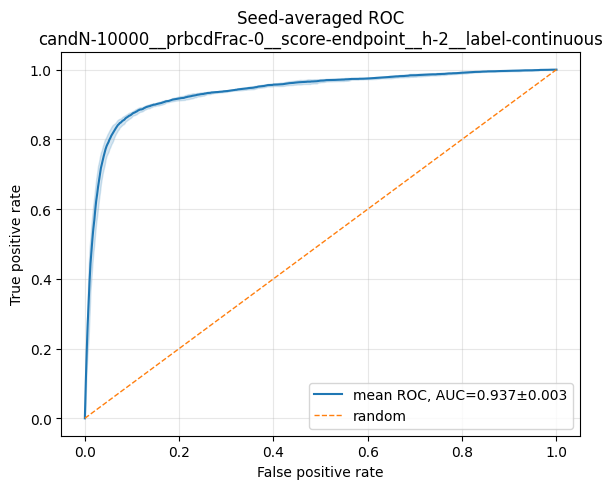

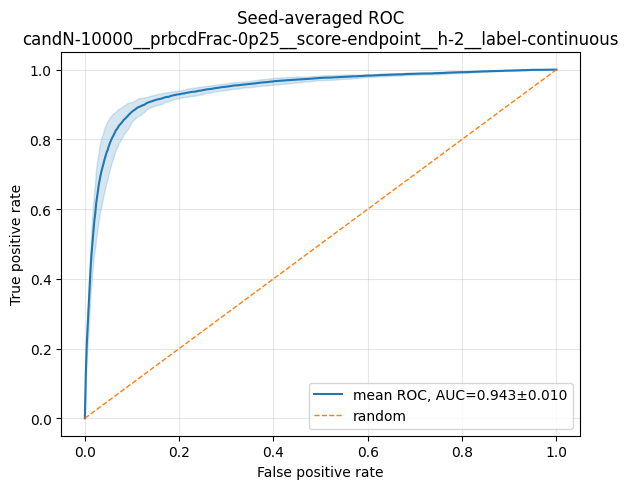

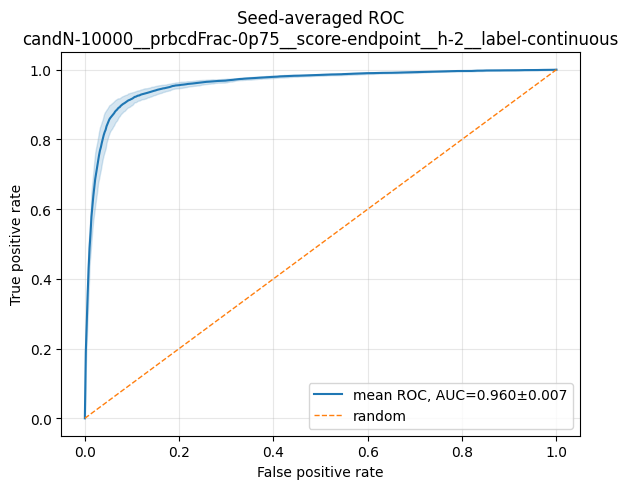

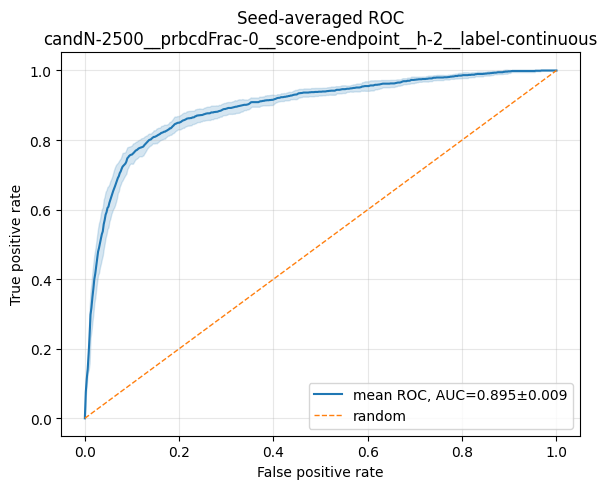

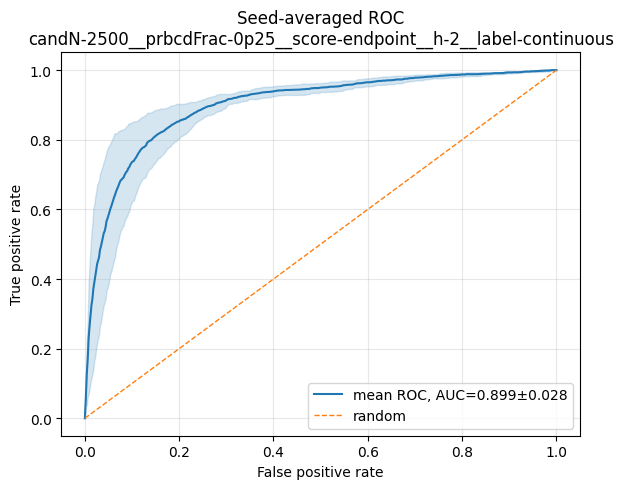

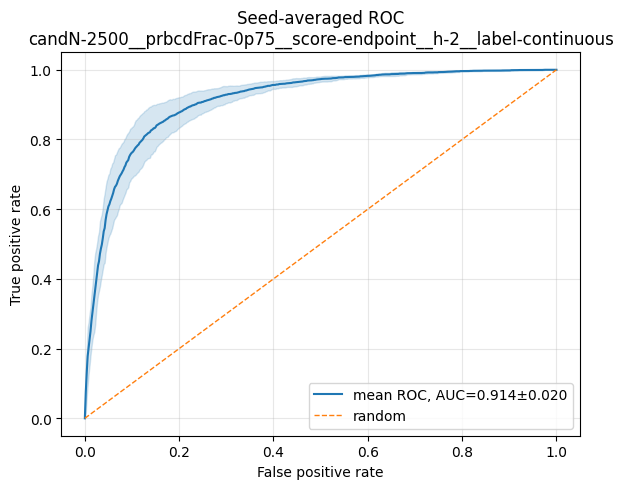

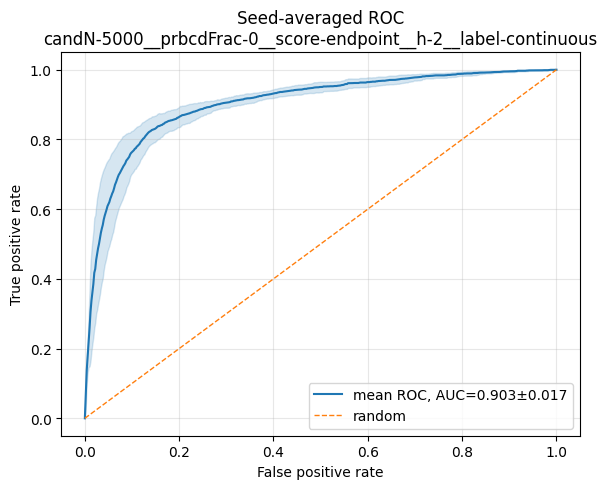

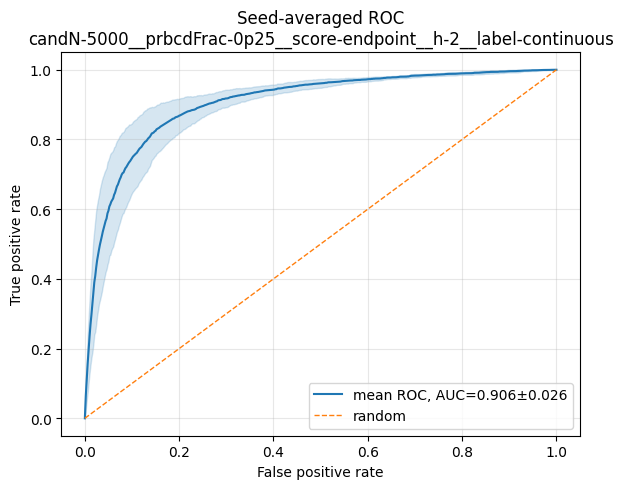

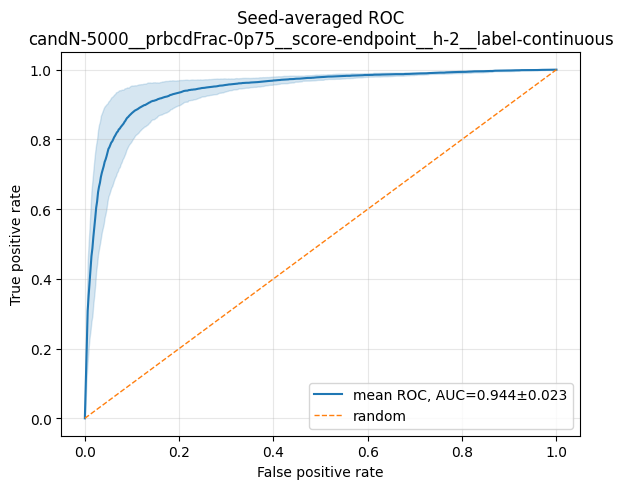

,lp_model_group_label,auc_mean,auc_std,auc_count,ap_mean,ap_std,ap_count,n_samples_mean,n_samples_std,n_samples_count,n_positive_mean,n_positive_std,n_positive_count,auc_sem,ap_sem,n_samples_sem,n_positive_sem,n_seeds
0,candN-10000__prbcdFrac-0__score-endpoint__h-2_...,0.937487,0.003233,5,0.755917,0.023924,5,10000.0,0.0,5,1284.8,103.719333,5,0.001446,0.010699,0.0,46.384696,5
1,candN-10000__prbcdFrac-0p25__score-endpoint__h...,0.942842,0.009781,5,0.797888,0.039797,5,10000.0,0.0,5,1613.8,167.304214,5,0.004374,0.017798,0.0,74.820719,5
2,candN-10000__prbcdFrac-0p75__score-endpoint__h...,0.959700,0.006873,5,0.891185,0.025044,5,10000.0,0.0,5,2323.4,299.820446,5,0.003074,0.011200,0.0,134.083780,5
3,candN-2500__prbcdFrac-0__score-endpoint__h-2__...,0.894678,0.008973,5,0.632914,0.031191,5,2500.0,0.0,5,323.2,30.784736,5,0.004013,0.013949,0.0,13.767353,5
4,candN-2500__prbcdFrac-0p25__score-endpoint__h-...,0.899273,0.028021,5,0.709178,0.084174,5,2500.0,0.0,5,484.0,52.230259,5,0.012531,0.037644,0.0,23.358082,5
5,candN-2500__prbcdFrac-0p75__score-endpoint__h-...,0.913689,0.020190,5,0.825857,0.057630,5,2500.0,0.0,5,811.6,120.771685,5,0.009029,0.025773,0.0,54.010740,5
6,candN-5000__prbcdFrac-0__score-endpoint__h-2__...,0.903299,0.017135,5,0.637675,0.090931,5,5000.0,0.0,5,632.0,61.583277,5,0.007663,0.040666,0.0,27.540879,5
7,candN-5000__prbcdFrac-0p25__score-endpoint__h-...,0.905816,0.026137,5,0.700038,0.090314,5,5000.0,0.0,5,908.0,88.048282,5,0.011689,0.040389,0.0,39.376389,5
8,candN-5000__prbcdFrac-0p75__score-endpoint__h-...,0.943988,0.022978,5,0.874201,0.045925,5,5000.0,0.0,5,1382.6,176.104514,5,0.010276,0.020538,0.0,78.756333,5


In [42]:
from pathlib import Path
from IPython.display import display
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score, average_precision_score

AVERAGED_ROC_OUT_DIR = Path("extendedPlotting") / "lp_training_roc_curves_averaged"
AVERAGED_ROC_OUT_DIR.mkdir(parents=True, exist_ok=True)
fpr_grid = np.linspace(0, 1, 501)
roc_curve_rows, roc_metric_rows = [], []
for run in lp_training_runs:
    y_true = np.asarray(run["roc_y_true"]).astype(int)
    y_score = np.asarray(run["roc_y_score"]).astype(float)
    if np.unique(y_true).size < 2: continue
    fpr, tpr, _ = roc_curve(y_true, y_score)
    interp = np.interp(fpr_grid, fpr, tpr); interp[0] = 0.0
    roc_curve_rows.extend({"seed": run["seed"], "lp_model_group_label": run["lp_model_group_label"],
                           "fpr": x, "tpr": y} for x, y in zip(fpr_grid, interp))
    roc_metric_rows.append({"seed": run["seed"], "lp_model_group_label": run["lp_model_group_label"],
                            "auc": roc_auc_score(y_true, y_score), "ap": average_precision_score(y_true, y_score),
                            "n_samples": len(y_true), "n_positive": y_true.sum()})
roc_curve_raw_df = pd.DataFrame(roc_curve_rows)
roc_metrics_raw_df = pd.DataFrame(roc_metric_rows)
roc_seed_coverage = roc_metrics_raw_df.groupby("lp_model_group_label")["seed"].nunique()
missing_roc = roc_seed_coverage[roc_seed_coverage != N_SEEDS]
if not missing_roc.empty:
    raise RuntimeError(
        "ROC is undefined or missing for at least one configured seed:\n"
        + missing_roc.to_string()
    )
roc_metrics_df = aggregate_over_seeds(roc_metrics_raw_df, ["lp_model_group_label"], ["auc", "ap", "n_samples", "n_positive"])
roc_curve_df = roc_curve_raw_df.groupby(["lp_model_group_label", "fpr"], as_index=False).agg(tpr_mean=("tpr","mean"), tpr_std=("tpr","std"), n_seeds=("seed","nunique"))
roc_curve_df["tpr_std"] = roc_curve_df.tpr_std.fillna(0.0)
for label, group in roc_curve_df.groupby("lp_model_group_label", sort=False):
    metric = roc_metrics_df[roc_metrics_df.lp_model_group_label == label].iloc[0]
    fig, ax = plt.subplots(figsize=(6,5))
    add_mean_std_band(ax, group.fpr, group.tpr_mean, group.tpr_std,
                      label=f"mean ROC, AUC={metric.auc_mean:.3f}±{metric.auc_std:.3f}")
    ax.plot([0,1],[0,1], linestyle="--", linewidth=1, label="random")
    ax.set_xlabel("False positive rate"); ax.set_ylabel("True positive rate")
    ax.set_title(f"Seed-averaged ROC\n{label}"); ax.grid(True, alpha=.3); ax.legend(loc="lower right")
    fig.tight_layout(); fig.savefig(AVERAGED_ROC_OUT_DIR / f"roc__{_safe_config_value(label)}.png", dpi=200, bbox_inches="tight"); plt.show()
roc_metrics_df.to_csv(AVERAGED_ROC_OUT_DIR / "roc_metrics_averaged.csv", index=False)
display(roc_metrics_df)


In [ ]:
from helpers.selector_pipeline_helpers import accuracy
from pathlib import Path
from IPython.display import display
import random, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch

BLOCK_STEP_SELECTOR = 10
SCORE_BATCH_SIZE = 100_000
RANDOM_SEED = 42
CANDIDATE_RANDOM_SEED = 123
SELECTOR_EVAL_OUT_DIR = Path("extendedPlotting") / "selector_evaluation_multiseed"
SELECTOR_EVAL_OUT_DIR.mkdir(parents=True, exist_ok=True)


def sample_random_undirected_pairs(num_nodes, num_candidates, seed):
    total = num_nodes * (num_nodes - 1) // 2
    indices = torch.tensor(random.Random(int(seed)).sample(range(total), min(int(num_candidates), total)), dtype=torch.long)
    row_lengths = torch.arange(num_nodes - 1, 0, -1, dtype=torch.long)
    row_starts = torch.zeros(num_nodes, dtype=torch.long); row_starts[1:] = torch.cumsum(row_lengths, 0)
    src = torch.searchsorted(row_starts, indices, right=True) - 1
    dst = src + 1 + indices - row_starts[src]
    return src, dst


def evaluate_lp_gnn_ranking_for_run(run, run_index):
    seed, context, selector = run["seed"], run["context"], run["lp_model"]
    set_global_seed(seed)
    adj_base = run["adj_orig"]
    src, dst = sample_random_undirected_pairs(context["n_nodes"], run["candidate_set_size"], CANDIDATE_RANDOM_SEED + seed * 10000 + run_index)
    exists = (adj_base[src.to(adj_base.device), dst.to(adj_base.device)] != 0).cpu().float()
    edge_lab = torch.stack([src, dst]).to(next(selector.parameters()).device)
    selector.eval()
    with torch.no_grad():
        h = selector.encoder(context["attr"].to(edge_lab.device), context["edge_index"].to(edge_lab.device))
        scores = torch.cat([
            torch.sigmoid(selector.edge_head(h, edge_lab[:, start:start+SCORE_BATCH_SIZE]).view(-1)).cpu()
            for start in range(0, edge_lab.size(1), SCORE_BATCH_SIZE)
        ])
    orders = {
        "top-k by LP-GNN score": torch.argsort(scores, descending=True).numpy(),
        "random candidates": np.random.default_rng(RANDOM_SEED + seed * 10000 + run_index).permutation(len(src)),
    }
    block_sizes = list(range(0, len(src), BLOCK_STEP_SELECTOR))
    if not block_sizes or block_sizes[-1] != len(src): block_sizes.append(len(src))
    rows = []
    for attack_name, order in orders.items():
        adj = adj_base.clone(); previous = 0
        for k in block_sizes:
            for idx in order[previous:k].tolist():
                u, v = int(src[idx]), int(dst[idx]); new = 1.0 - float(exists[idx])
                adj[u,v] = new; adj[v,u] = new
            acc = float(accuracy(context["model"], context["attr"], context["labels"], context["idx_test"], edge_index=adj))
            rows.append({
                "seed": seed, "lp_model_group_label": run["lp_model_group_label"],
                "candidate_config_id": run["candidate_config_id"], "candidate_set_size": run["candidate_set_size"],
                "prbcd_candidate_fraction": run["prbcd_candidate_fraction"], "actual_prbcd_fraction": run["actual_prbcd_fraction"],
                "scoring_mode": run["scoring_mode"], "endpoint_mining_hop": run["endpoint_mining_hop"],
                "label_mode": run["label_mode"], "extreme_fraction": run["extreme_fraction"],
                "k": k, "attack": attack_name, "test_accuracy": acc, "clean_accuracy": run["clean_accuracy"],
            })
            previous = k
    return pd.DataFrame(rows)

selector_frames = [evaluate_lp_gnn_ranking_for_run(run, i) for i, run in enumerate(lp_training_runs)]
selector_eval_df = pd.concat(selector_frames, ignore_index=True)
selector_group_cols = ["lp_model_group_label", "candidate_config_id", "candidate_set_size", "prbcd_candidate_fraction",
                       "scoring_mode", "endpoint_mining_hop", "label_mode", "extreme_fraction", "k", "attack"]
selector_analysis_df = aggregate_over_seeds(selector_eval_df, selector_group_cols,
                                            ["actual_prbcd_fraction", "test_accuracy", "clean_accuracy"])
selector_eval_df.to_csv(SELECTOR_EVAL_OUT_DIR / "selector_eval_raw_all_seeds.csv", index=False)
selector_analysis_df.to_csv(SELECTOR_EVAL_OUT_DIR / "selector_eval_averaged.csv", index=False)
display(selector_analysis_df.head(30))
for label, group in selector_analysis_df.groupby("lp_model_group_label", sort=False):
    fig, ax = plt.subplots(figsize=(10,5))
    for attack_name, attack_df in group.groupby("attack", sort=False):
        attack_df = attack_df.sort_values("k")
        add_mean_std_band(ax, attack_df.k, attack_df.test_accuracy_mean, attack_df.test_accuracy_std,
                          label=attack_name, linewidth=1.5)
    baseline = group.clean_accuracy_mean.mean(); ax.axhline(baseline, linestyle="--", linewidth=.9, label=f"clean mean ({baseline:.3f})")
    ax.set_xlabel("k candidate edges applied jointly"); ax.set_ylabel("test accuracy")
    ax.set_title(f"LP-GNN ranking averaged over seeds\n{label}"); ax.grid(True, alpha=.3); ax.legend(); fig.tight_layout()
    fig.savefig(SELECTOR_EVAL_OUT_DIR / f"selector_eval__{_safe_config_value(label)}.png", dpi=200, bbox_inches="tight"); plt.show()


---
## §6  Score Distributions & Ranking Quality

We score every candidate and ask:
- Do edges with V4 label > 0 (appeared in at least one harmful subset) receive higher logits?
- Does the predicted score *correlate* with the true continuous label?
- AUC-ROC (binary: scored vs unscored) and precision@k are computed as proxy metrics.

In [ ]:
from pathlib import Path
import torch
import numpy as np
import pandas as pd
from IPython.display import display

SCORE_DIAGNOSTIC_OUT_DIR = Path("extendedPlotting") / "score_diagnostics_multiseed"
SCORE_DIAGNOSTIC_OUT_DIR.mkdir(parents=True, exist_ok=True)


def _tensor_stats(values):
    values = values.detach().cpu().float().flatten()
    if not values.numel(): return {k: np.nan for k in ["mean","std","min","max"]} | {"count": 0}
    return {"count": values.numel(), "mean": values.mean().item(), "std": values.std(unbiased=False).item(),
            "min": values.min().item(), "max": values.max().item()}


def score_candidate_run_with_lp_gnn(run):
    scorer, context = run["lp_model"], run["context"]
    dev = next(scorer.parameters()).device; scorer.eval()
    edge_lab = torch.stack([run["src"].long(), run["dst"].long()]).to(dev)
    with torch.no_grad():
        logits = scorer(context["attr"].to(dev), context["edge_index"].to(dev), edge_lab).view(-1)
        probs = torch.sigmoid(logits)
    logits, probs = logits.cpu(), probs.cpu()
    labels_cont = run["labels_changed"].cpu().float().view(-1); labels_binary = labels_cont > 0
    pos, neg = labels_binary, ~labels_binary
    output_df = pd.DataFrame({
        "seed": run["seed"], "candidate_idx": np.arange(len(labels_cont)),
        "src": run["src"].cpu().numpy(), "dst": run["dst"].cpu().numpy(),
        "exists": run["exists"].cpu().numpy(), "label": labels_cont.numpy(),
        "label_binary": labels_binary.numpy().astype(int), "logit": logits.numpy(), "probability": probs.numpy(),
        "lp_model_group_label": run["lp_model_group_label"],
    })
    safe = _safe_config_value(run["lp_model_label"]); output_df.to_csv(SCORE_DIAGNOSTIC_OUT_DIR / f"score_outputs__{safe}.csv", index=False)
    ps, ns, pps, nps = _tensor_stats(logits[pos]), _tensor_stats(logits[neg]), _tensor_stats(probs[pos]), _tensor_stats(probs[neg])
    summary = {
        "seed": run["seed"], "lp_model_group_label": run["lp_model_group_label"],
        **{k: run.get(k, "") for k in ["candidate_config_id","candidate_set_size","prbcd_candidate_fraction","actual_prbcd_fraction","scoring_mode","endpoint_mining_hop","label_mode","extreme_fraction"]},
        "n_candidates": len(labels_cont), "n_positive_labels": labels_binary.sum().item(),
        "positive_fraction": labels_binary.float().mean().item(), "fraction_predicted_positive_at_0_5": (probs >= .5).float().mean().item(),
        "pos_logit_mean": ps["mean"], "pos_logit_std_within": ps["std"], "neg_logit_mean": ns["mean"], "neg_logit_std_within": ns["std"],
        "pos_prob_mean": pps["mean"], "pos_prob_std_within": pps["std"], "neg_prob_mean": nps["mean"], "neg_prob_std_within": nps["std"],
    }
    return {"run": run, "labels_cont": labels_cont, "labels_binary": labels_binary, "all_logits": logits,
            "all_probs": probs, "pos_logits": logits[pos], "neg_logits": logits[neg], "output_df": output_df, "summary_row": summary}

score_diagnostic_runs = [score_candidate_run_with_lp_gnn(run) for run in lp_training_runs]
score_diagnostics_raw_df = pd.DataFrame([item["summary_row"] for item in score_diagnostic_runs])
score_group_cols = ["lp_model_group_label","candidate_config_id","candidate_set_size","prbcd_candidate_fraction","scoring_mode","endpoint_mining_hop","label_mode","extreme_fraction"]
score_diagnostics_df = aggregate_over_seeds(score_diagnostics_raw_df, score_group_cols, [
    "actual_prbcd_fraction","n_candidates","n_positive_labels","positive_fraction","fraction_predicted_positive_at_0_5",
    "pos_logit_mean","pos_logit_std_within","neg_logit_mean","neg_logit_std_within","pos_prob_mean","pos_prob_std_within","neg_prob_mean","neg_prob_std_within",
])
score_diagnostics_raw_df.to_csv(SCORE_DIAGNOSTIC_OUT_DIR / "score_diagnostics_raw.csv", index=False)
score_diagnostics_df.to_csv(SCORE_DIAGNOSTIC_OUT_DIR / "score_diagnostics_averaged.csv", index=False)
display(score_diagnostics_df)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

for label, group_items in pd.DataFrame([{"label": s["run"]["lp_model_group_label"], "scored": s} for s in score_diagnostic_runs]).groupby("label"):
    items = group_items.scored.tolist()
    all_logits = np.concatenate([s["all_logits"].numpy() for s in items])
    bins = np.linspace(all_logits.min()-.1, all_logits.max()+.1, 40)
    neg_counts = np.vstack([np.histogram(s["neg_logits"].numpy(), bins=bins)[0] for s in items])
    pos_counts = np.vstack([np.histogram(s["pos_logits"].numpy(), bins=bins)[0] for s in items])
    precision_rows, calibration_rows = [], []
    for s in items:
        logits = s["all_logits"].numpy(); binary = s["labels_binary"].numpy().astype(float); cont = s["labels_cont"].numpy()
        order = np.argsort(-logits); precision = binary[order].cumsum() / np.arange(1, len(binary)+1)
        precision_rows.extend({"seed": s["run"]["seed"], "k": k+1, "precision": value} for k, value in enumerate(precision))
        quantiles = np.linspace(0, 1, 11); edges = np.unique(np.quantile(cont, quantiles))
        if len(edges) < 2: edges = np.array([cont.min()-.5, cont.max()+.5])
        bins_id = np.clip(np.digitize(cont, edges[1:-1]), 0, len(edges)-2)
        for b in range(len(edges)-1):
            mask = bins_id == b
            if mask.any(): calibration_rows.append({"seed": s["run"]["seed"], "label_bin": b, "true_label": cont[mask].mean(), "logit": logits[mask].mean()})
    precision_df = pd.DataFrame(precision_rows).groupby("k", as_index=False).agg(mean=("precision","mean"), std=("precision","std")); precision_df["std"] = precision_df["std"].fillna(0)
    calibration_df = pd.DataFrame(calibration_rows).groupby("label_bin", as_index=False).agg(x=("true_label","mean"), y=("logit","mean"), ystd=("logit","std")); calibration_df["ystd"] = calibration_df.ystd.fillna(0)
    fig, axes = plt.subplots(1,3,figsize=(15,4)); centers=(bins[:-1]+bins[1:])/2
    for counts, name in [(neg_counts,"label = 0"),(pos_counts,"label > 0")]:
        mean,std=counts.mean(0),counts.std(0); axes[0].step(centers,mean,where="mid",label=name); axes[0].fill_between(centers,mean-std,mean+std,step="mid",alpha=.15)
    axes[0].set_xlabel("raw logit"); axes[0].set_ylabel("mean bin count ± SD"); axes[0].legend(); axes[0].grid(True,alpha=.3)
    add_mean_std_band(axes[1], precision_df.k, precision_df["mean"], precision_df["std"], label="precision@k")
    baseline=np.mean([s["labels_binary"].float().mean().item() for s in items]); axes[1].axhline(baseline,linestyle="--",label=f"baseline {baseline:.3f}")
    axes[1].set_xlabel("k"); axes[1].set_ylabel("precision"); axes[1].legend(); axes[1].grid(True,alpha=.3)
    axes[2].errorbar(calibration_df.x,calibration_df.y,yerr=calibration_df.ystd,marker="o",capsize=3)
    axes[2].set_xlabel("mean true mined label in bin"); axes[2].set_ylabel("mean predicted logit ± SD"); axes[2].grid(True,alpha=.3)
    fig.suptitle(f"Scorer quality averaged over seeds\n{label}"); fig.tight_layout(); fig.savefig(SCORE_DIAGNOSTIC_OUT_DIR / f"score_quality__{_safe_config_value(label)}.png",dpi=200,bbox_inches="tight"); plt.show()


In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve, average_precision_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fpr_grid = np.linspace(0,1,501); curve_rows=[]; metric_rows=[]
for scored in score_diagnostic_runs:
    run=scored["run"]; y_true=scored["labels_binary"].numpy().astype(int); y_score=scored["all_logits"].numpy()
    if np.unique(y_true).size < 2: continue
    fpr,tpr,_=roc_curve(y_true,y_score); interp=np.interp(fpr_grid,fpr,tpr); interp[0]=0
    curve_rows.extend({"seed":run["seed"],"lp_model_group_label":run["lp_model_group_label"],"fpr":x,"tpr":y} for x,y in zip(fpr_grid,interp))
    metric_rows.append({"seed":run["seed"],"lp_model_group_label":run["lp_model_group_label"],"auc_roc":roc_auc_score(y_true,y_score),"average_precision":average_precision_score(y_true,y_score),"random_baseline":y_true.mean()})
roc_score_raw_df=pd.DataFrame(metric_rows)
roc_score_coverage=roc_score_raw_df.groupby("lp_model_group_label")["seed"].nunique()
missing_score_roc=roc_score_coverage[roc_score_coverage != N_SEEDS]
if not missing_score_roc.empty:
    raise RuntimeError("Scorer ROC missing for configured seeds:\n" + missing_score_roc.to_string())
roc_summary_df=aggregate_over_seeds(roc_score_raw_df,["lp_model_group_label"],["auc_roc","average_precision","random_baseline"])
roc_curves=pd.DataFrame(curve_rows).groupby(["lp_model_group_label","fpr"],as_index=False).agg(tpr_mean=("tpr","mean"),tpr_std=("tpr","std")); roc_curves.tpr_std=roc_curves.tpr_std.fillna(0)
for label,g in roc_curves.groupby("lp_model_group_label"):
    m=roc_summary_df[roc_summary_df.lp_model_group_label==label].iloc[0]; fig,ax=plt.subplots(figsize=(5.5,4.5))
    add_mean_std_band(ax,g.fpr,g.tpr_mean,g.tpr_std,label=f"AUC {m.auc_roc_mean:.3f}±{m.auc_roc_std:.3f}")
    ax.plot([0,1],[0,1],linestyle="--",label="random"); ax.set_xlabel("FPR"); ax.set_ylabel("TPR"); ax.set_title(f"Averaged scorer ROC\n{label}"); ax.legend(); ax.grid(True,alpha=.3); fig.tight_layout(); plt.show()
roc_summary_df.to_csv(SCORE_DIAGNOSTIC_OUT_DIR / "roc_summary_averaged.csv",index=False)
display(roc_summary_df)


---
## §7  Per-Node Analysis

For each node in the candidate set, we check:
- How many of its incident candidate edges have a non-zero V4 label?
- What is the mean predicted logit for scored vs unscored incident edges?
- A positive score gap means the scorer correctly prefers harmful incident edges for this node.

In [ ]:
from collections import defaultdict
import pandas as pd
import numpy as np
from IPython.display import display

node_frames=[]
for scored in score_diagnostic_runs:
    run=scored["run"]; src=run["src"].cpu().numpy(); dst=run["dst"].cpu().numpy(); labels_np=scored["labels_cont"].numpy(); logits=scored["all_logits"].numpy()
    degrees_run=np.bincount(run["context"]["edge_index"][0].cpu().numpy(),minlength=run["context"]["n_nodes"])
    mapping=defaultdict(list)
    for i,(u,v) in enumerate(zip(src,dst)):
        item=(labels_np[i]>0,labels_np[i],logits[i]); mapping[int(u)].append(item); mapping[int(v)].append(item)
    rows=[]
    for node,cands in mapping.items():
        pos=[lg for is_pos,_,lg in cands if is_pos]; neg=[lg for is_pos,_,lg in cands if not is_pos]
        rows.append({"seed":run["seed"],"lp_model_group_label":run["lp_model_group_label"],"node":node,"degree":degrees_run[node],
                     "n_incident":len(cands),"n_scored":sum(x[0] for x in cands),"scored_rate":np.mean([x[0] for x in cands]),
                     "mean_score_pos":np.mean(pos) if pos else np.nan,"mean_score_neg":np.mean(neg) if neg else np.nan})
    node_frames.append(pd.DataFrame(rows))
node_analysis_df=pd.concat(node_frames,ignore_index=True) if node_frames else pd.DataFrame()
node_seed_summary=(node_analysis_df.groupby(["seed","lp_model_group_label"],as_index=False).agg(nodes_with_incident_candidates=("node","count"),mean_scored_rate=("scored_rate","mean"),median_scored_rate=("scored_rate","median"),mean_score_pos=("mean_score_pos","mean"),mean_score_neg=("mean_score_neg","mean")))
node_summary_df=aggregate_over_seeds(node_seed_summary,["lp_model_group_label"],["nodes_with_incident_candidates","mean_scored_rate","median_scored_rate","mean_score_pos","mean_score_neg"])
node_analysis_df.to_csv(SCORE_DIAGNOSTIC_OUT_DIR / "node_analysis_raw.csv",index=False); node_summary_df.to_csv(SCORE_DIAGNOSTIC_OUT_DIR / "node_analysis_averaged.csv",index=False)
display(node_summary_df)


In [ ]:
for label, raw in node_analysis_df.groupby("lp_model_group_label"):
    node_avg=(raw.groupby("node",as_index=False).agg(scored_rate=("scored_rate","mean"),mean_score_pos=("mean_score_pos","mean"),mean_score_neg=("mean_score_neg","mean"),degree=("degree","mean")))
    fig,axes=plt.subplots(1,3,figsize=(14,4)); axes[0].hist(node_avg.scored_rate,bins=20,edgecolor="white")
    axes[0].set_xlabel("seed-averaged incident positive-label rate"); axes[0].set_ylabel("nodes"); axes[0].grid(True,alpha=.3)
    both=node_avg.dropna(subset=["mean_score_pos","mean_score_neg"])
    if not both.empty:
        axes[1].scatter(both.mean_score_neg,both.mean_score_pos,alpha=.5,s=20); lo=min(both.mean_score_neg.min(),both.mean_score_pos.min()); hi=max(both.mean_score_neg.max(),both.mean_score_pos.max()); axes[1].plot([lo,hi],[lo,hi],linestyle="--")
        gap=both.mean_score_pos-both.mean_score_neg; axes[2].hist(gap,bins=20,edgecolor="white"); axes[2].axvline(0,linestyle="--"); axes[2].axvline(gap.mean(),label=f"mean={gap.mean():.3f}"); axes[2].legend()
    axes[1].set_xlabel("mean logit label=0"); axes[1].set_ylabel("mean logit label>0"); axes[1].grid(True,alpha=.3)
    axes[2].set_xlabel("seed-averaged score gap"); axes[2].set_ylabel("nodes"); axes[2].grid(True,alpha=.3)
    fig.suptitle(f"Per-node analysis after averaging each node over seeds\n{label}"); fig.tight_layout(); fig.savefig(SCORE_DIAGNOSTIC_OUT_DIR / f"node_analysis__{_safe_config_value(label)}.png",dpi=200,bbox_inches="tight"); plt.show()


## 8. Model Guided PR-BCD

In [ ]:
# %% Cell 1: define the sweep
from copy import deepcopy
from itertools import product

# Values in these dictionaries are combined with a Cartesian product.
EXPERIMENT_SWEEP = {
    "attack": ["PRBCD"],
    "semi": [True],
    "epsilon": [0.1],
    "use_cert": ["accuracy_drop_selector_with_resampling", "none"],
    "seed": list(SEEDS),
}

ATTACK_SWEEP = {
    "block_size": [4000],
    "epochs": [300],
    "fine_tune_epochs": [250],
    "keep_heuristic": ["WeightOnly"],
    "do_synchronize": [True],
    "loss_type": ["tanhMargin"],
}

SELECTOR_SWEEP = {
    "accuracy_drop_selector_mode": ["one_sample"],
    "n_candidates_k_sample": [2_000],
    "n_candidates_one_sample": [5_000],
    "drop_mode": ["endpoint"],
    "acc_drop_threshold_k_samples": [1e-3],
    "loss_drop_threshold_k_samples": [1e-3],
    "k_samples_batch": [10],
    "training_data_node_cap": [15],
    "tau": [0.7],
    "score_batch_size": [1_000],
    "max_sampling_tries": [2_000_000],
    "exclude_tried": [True],
    "resampling_mode": ["threshold", "topk"] #"threshold", "topk"
}

# Passed to every selector run, but not expanded as sweep dimensions.
SELECTOR_FIXED = {
    "lp_hit_rate_detour": False,
    "lp_hit_rate_top_k": 200,
    "lp_hit_rate_out_dir": "extendedPlotting/lpEndpointHitRate",
}

# Temporary filter:
# Do not include these LP/mining variants in sweep_configs at all.
EXCLUDED_SCORING_MODES = {
    "subset_accuracy_drop",
}

EXCLUDED_LABEL_MODES = {
    "subset_accuracy_drop",
}

# Keep Python model objects out of the CSV. The key and metadata are logged;
# the model object itself is passed to the attack.
if "lp_model_variants" in globals() and lp_model_variants:
    LP_MODEL_VARIANTS = lp_model_variants
else:
    LP_MODEL_VARIANTS = {
        "default": {
            "model": lp_model,
            "candidate_config_id": "default",
            "candidate_set_size": globals().get("n_cands", ""),
            "prbcd_candidate_fraction": globals().get("PRBCD_CANDIDATE_FRACTION", ""),
            "actual_prbcd_fraction": globals().get("actual_prbcd_fraction", ""),
            "scoring_mode": globals().get("SCORING_MODE", ""),
            "endpoint_mining_hop": globals().get("ENDPOINT_MINING_HOP", 0),
            "n_prbcd_requested": "",
            "n_prbcd_mined_unique": "",
            "n_prbcd_selected": "",
            "n_random_candidates": "",
            "n_positive_labels": "",
            "label_mode": globals().get("LABEL_MODE", ""),
            "extreme_fraction": globals().get("EXTREME_FRACTION", ""),
        }
    }

ADS_CERTS = {
    "accuracy_drop_selector",
    "accuracy_drop_selector_with_resampling",
    "direct_selector",
}

RESAMPLING_CERT = "accuracy_drop_selector_with_resampling"

ADS_ONLY_SELECTOR_KEYS = {
    "accuracy_drop_selector_mode",
    "n_candidates_k_sample",
    "n_candidates_one_sample",
    "drop_mode",
    "acc_drop_threshold_k_samples",
    "loss_drop_threshold_k_samples",
    "k_samples_batch",
    "training_data_node_cap",
    "resampling_mode",
}


def expand_grid(grid):
    """Yield one dictionary for every Cartesian-product combination."""
    keys = list(grid)
    for values in product(*(grid[key] for key in keys)):
        yield dict(zip(keys, values))


def _split_lp_model_variant(lp_model_variant):
    if isinstance(lp_model_variant, dict) and "model" in lp_model_variant:
        lp_model_object = lp_model_variant["model"]
        lp_model_metadata = {
            key: value
            for key, value in lp_model_variant.items()
            if key != "model"
        }
    else:
        lp_model_object = lp_model_variant
        lp_model_metadata = {}

    return lp_model_object, lp_model_metadata


def _is_excluded_lp_variant(lp_model_metadata):
    scoring_mode = str(
        lp_model_metadata.get("scoring_mode", "")
    ).strip()

    label_mode = str(
        lp_model_metadata.get("label_mode", "")
    ).strip()

    return (
        scoring_mode in EXCLUDED_SCORING_MODES
        or label_mode in EXCLUDED_LABEL_MODES
    )


def build_sweep_configs():
    experiment_configs = list(expand_grid(EXPERIMENT_SWEEP))
    attack_configs = list(expand_grid(ATTACK_SWEEP))
    selector_configs = list(expand_grid(SELECTOR_SWEEP))

    configs = []
    skipped_configs = []

    for experiment_cfg in experiment_configs:
        use_cert = experiment_cfg["use_cert"]

        for attack_cfg in attack_configs:
            for selector_cfg_full in selector_configs:
                # resampling_mode only applies to the resampling attack.
                # Without this, "none" and other methods are duplicated once
                # for every configured resampling mode.
                if (
                    use_cert != RESAMPLING_CERT
                    and selector_cfg_full.get("resampling_mode")
                    != SELECTOR_SWEEP["resampling_mode"][0]
                ):
                    continue
            
                selector_cfg = deepcopy(selector_cfg_full)
                selector_cfg.update(deepcopy(SELECTOR_FIXED))
            
                if use_cert != RESAMPLING_CERT:
                    selector_cfg.pop(
                        "resampling_mode",
                        None,
                    )

                # Do not pass ADS-only parameters to unrelated attack modes.
                if use_cert not in ADS_CERTS:
                    selector_cfg = {
                        key: value
                        for key, value in selector_cfg.items()
                        if key not in ADS_ONLY_SELECTOR_KEYS
                    }

                for lp_model_label, lp_model_variant in LP_MODEL_VARIANTS.items():
                    lp_model_object, lp_model_metadata = _split_lp_model_variant(lp_model_variant)

                    variant_seed = lp_model_metadata.get("seed", experiment_cfg.get("seed"))
                    if int(variant_seed) != int(experiment_cfg.get("seed")):
                        continue

                    # --------------------------------------------------------
                    # Filter unwanted LP/mining variants at sweep-definition time.
                    # These configs will not be added to sweep_configs at all.
                    # --------------------------------------------------------
                    if _is_excluded_lp_variant(lp_model_metadata):
                        skipped_configs.append({
                            "use_cert": use_cert,
                            "lp_model_label": lp_model_label,
                            "candidate_config_id": lp_model_metadata.get("candidate_config_id", ""),
                            "scoring_mode": lp_model_metadata.get("scoring_mode", ""),
                            "endpoint_mining_hop": lp_model_metadata.get("endpoint_mining_hop", 0),
                            "label_mode": lp_model_metadata.get("label_mode", ""),
                            "extreme_fraction": lp_model_metadata.get("extreme_fraction", ""),
                            "candidate_set_size": lp_model_metadata.get("candidate_set_size", ""),
                            "prbcd_candidate_fraction": lp_model_metadata.get("prbcd_candidate_fraction", ""),
                        })
                        continue

                    configs.append({
                        "experiment": deepcopy(experiment_cfg),
                        "attack_params": {
                            **deepcopy(attack_cfg),
                            "lp_model": lp_model_object,
                        },
                        "selector_params": deepcopy(selector_cfg),
                        "log_values": {
                            "lp_model_label": lp_model_label,
                            **deepcopy(lp_model_metadata),
                        },
                    })

    print(f"Skipped configurations during sweep construction: {len(skipped_configs)}")

    if skipped_configs:
        print("Skipped variants:")
        for index, skipped in enumerate(skipped_configs, start=1):
            print(
                f"  {index:03d}: cert={skipped['use_cert']}, "
                f"lp_model={skipped['lp_model_label']}, "
                f"candidate_config={skipped.get('candidate_config_id', '-')}, "
                f"scoring_mode={skipped.get('scoring_mode', '-')}, "
                f"h={skipped.get('endpoint_mining_hop', 0)}, "
                f"label_mode={skipped.get('label_mode', '-')}, "
                f"extreme_fraction={skipped.get('extreme_fraction', '-')}, "
                f"candidate_set_size={skipped.get('candidate_set_size', '-')}, "
                f"prbcd_fraction={skipped.get('prbcd_candidate_fraction', '-')}"
            )

    return configs


EXPERIMENT_COLUMNS = list(EXPERIMENT_SWEEP)
ATTACK_COLUMNS = list(ATTACK_SWEEP)
SELECTOR_COLUMNS = list(SELECTOR_SWEEP) + [
    key for key in SELECTOR_FIXED if key not in SELECTOR_SWEEP
]
LOG_COLUMNS = [
    "lp_model_label",
    "lp_model_group_label",
    "seed",
    "candidate_config_id",
    "candidate_set_size",
    "prbcd_candidate_fraction",
    "actual_prbcd_fraction",
    "scoring_mode",
    "endpoint_mining_hop",
    "n_prbcd_requested",
    "n_prbcd_mined_unique",
    "n_prbcd_selected",
    "n_random_candidates",
    "n_positive_labels",
    "label_mode",
    "extreme_fraction",
]

ALL_CONFIG_COLUMNS = (
    [f"experiment__{key}" for key in EXPERIMENT_COLUMNS]
    + [f"attack__{key}" for key in ATTACK_COLUMNS]
    + [f"selector__{key}" for key in SELECTOR_COLUMNS]
    + [f"log__{key}" for key in LOG_COLUMNS]
)


def config_to_row(cfg):
    row = {}
    for key in EXPERIMENT_COLUMNS:
        row[f"experiment__{key}"] = cfg["experiment"].get(key, "")
    for key in ATTACK_COLUMNS:
        row[f"attack__{key}"] = cfg["attack_params"].get(key, "")
    for key in SELECTOR_COLUMNS:
        row[f"selector__{key}"] = cfg["selector_params"].get(key, "")
    for key in LOG_COLUMNS:
        row[f"log__{key}"] = cfg["log_values"].get(key, "")
    return row


sweep_configs = build_sweep_configs()
print(f"Number of configurations: {len(sweep_configs)}")

for index, cfg in enumerate(sweep_configs, start=1):
    exp = cfg["experiment"]
    selector = cfg["selector_params"]
    log_values = cfg["log_values"]
    print(
        f"{index:03d}: attack={exp['attack']}, cert={exp['use_cert']}, "
        f"epsilon={exp['epsilon']}, seed={exp['seed']}, "
        f"candidate_config={log_values.get('candidate_config_id', '-')}, "
        f"scoring_mode={log_values.get('scoring_mode', '-')}, "
        f"label_mode={log_values.get('label_mode', '-')}, "
        f"extreme_fraction={log_values.get('extreme_fraction', '-')}, "
        f"candidate_set_size={log_values.get('candidate_set_size', '-')}, "
        f"prbcd_fraction={log_values.get('prbcd_candidate_fraction', '-')}, "
        f"drop_mode={selector.get('drop_mode', '-')}, "
        f"tau={selector.get('tau', '-')}, "
        f"resampling_mode={selector.get('resampling_mode', '-')}"
    )

In [ ]:
from IPython.core.display_functions import clear_output
# %% Cell 2: run the sweep and append CSV logs
from DeleteCache import delete_pert_files_and_folders
from timeit import default_timer as timer
from datetime import datetime
import csv
import gc
import hashlib
import json
import os
import traceback

import numpy as np
import torch
from sparse_smoothing.utils import load_and_standardize

# -------------------------
# Behaviour
# -------------------------
STOP_ON_ERROR = False
SAVE_RAW_RESULTS = False

# Temporary skip settings
SKIP_LABEL_MODES = {
    "subset_accuracy_drop",
}

MODEL_STORAGE_TYPE = "demo_custom_split"
ARTIFACT_DIR = "cache"
PERT_ADJ_STORAGE_TYPE = "evasion_global_adj"
PERT_ATTR_STORAGE_TYPE = "evasion_global_attr"


def _folder_safe_value(value):
    """Convert a config value into a compact, filesystem-safe string."""
    if isinstance(value, torch.Tensor):
        value = value.detach().cpu().item() if value.numel() == 1 else value.detach().cpu().tolist()
    if isinstance(value, np.generic):
        value = value.item()
    if isinstance(value, (list, tuple)):
        return "-".join(_folder_safe_value(item) for item in value)
    if value is None:
        return "na"

    text = f"{value:.12g}" if isinstance(value, float) else str(value)
    return (
        text.strip()
        .replace(" ", "")
        .replace("/", "-")
        .replace("\\", "-")
        .replace(".", "p")
        .replace("+", "")
        .replace("-", "m")
    )


def _read_nested_config(cfg, candidate_paths):
    """Return the first configured value found among the candidate paths."""
    for section_name, key in candidate_paths:
        section = cfg.get(section_name, {})
        if key in section and section[key] is not None:
            return section[key]
    return None


def _collect_sweep_values(candidate_paths):
    """Collect unique values in sweep order for one signature field."""
    values = []
    seen = set()

    for cfg in sweep_configs:
        value = _read_nested_config(cfg, candidate_paths)
        safe_value = _folder_safe_value(value)
        if safe_value not in seen:
            seen.add(safe_value)
            values.append(safe_value)

    return "+".join(values) if values else "na"


# -------------------------
# Safe output directory
# -------------------------
FULL_FOLDER_SIGNATURE = "__".join([
    "block_size-" + _collect_sweep_values([
        ("attack_params", "block_size"),
    ]),
    "candN-" + _collect_sweep_values([
        ("log_values", "candidate_set_size"),
    ]),
    "prbcdFrac-" + _collect_sweep_values([
        ("log_values", "prbcd_candidate_fraction"),
    ]),
    "scoringMode-" + _collect_sweep_values([
        ("log_values", "scoring_mode"),
    ]),
    "h-" + _collect_sweep_values([
        ("log_values", "endpoint_mining_hop"),
    ]),
    "labelMode-" + _collect_sweep_values([
        ("log_values", "label_mode"),
    ]),
    "extremeFrac-" + _collect_sweep_values([
        ("log_values", "extreme_fraction"),
    ]),
    "tau-" + _collect_sweep_values([
        ("selector_params", "tau"),
        ("attack_params", "tau"),
        ("experiment", "tau"),
    ]),
    "resamplingMode-" + _collect_sweep_values([
        ("selector_params", "resampling_mode"),
        ("attack_params", "resampling_mode"),
    ]),
    "epsilon-" + _collect_sweep_values([
        ("experiment", "epsilon"),
        ("attack_params", "epsilon"),
        ("attack_params", "eps"),
    ]),
    "epochs-" + _collect_sweep_values([
        ("attack_params", "epochs"),
    ]),
])

SIGNATURE_HASH = hashlib.sha1(
    FULL_FOLDER_SIGNATURE.encode("utf-8")
).hexdigest()[:10]

FOLDER_SIGNATURE = f"sig-{SIGNATURE_HASH}"
RUN_GROUP_ID = datetime.now().strftime("%Y%m%d_%H%M%S")

OUT_DIR = os.path.join(
    "extendedPlotting",
    "sweeps",
    f"global_prbcd_{DATASET}__{FOLDER_SIGNATURE}__{RUN_GROUP_ID}",
)

os.makedirs(OUT_DIR, exist_ok=True)

# Store the full long signature separately, so it is not lost.
with open(os.path.join(OUT_DIR, "sweep_signature.json"), "w", encoding="utf-8") as handle:
    json.dump(
        {
            "run_group_id": RUN_GROUP_ID,
            "dataset": DATASET,
            "signature_hash": SIGNATURE_HASH,
            "folder_signature": FOLDER_SIGNATURE,
            "full_folder_signature": FULL_FOLDER_SIGNATURE,
            "endpoint_mining_hops": _collect_sweep_values([("log_values", "endpoint_mining_hop")]),
            "resampling_modes": _collect_sweep_values([
                ("selector_params", "resampling_mode"),
                ("attack_params", "resampling_mode"),
            ]),
            "skipped_label_modes": sorted(SKIP_LABEL_MODES),
        },
        handle,
        indent=2,
        ensure_ascii=False,
    )

SUMMARY_CSV = os.path.join(OUT_DIR, "summary.csv")
EPOCHS_CSV = os.path.join(OUT_DIR, "epochs.csv")
RAW_RESULT_DIR = os.path.join(OUT_DIR, "raw_results")
if SAVE_RAW_RESULTS:
    os.makedirs(RAW_RESULT_DIR, exist_ok=True)

SUMMARY_HEADER = [
    "run_group_id",
    "run_id",
    "config_index",
    "status",
    "dataset",
    "model_label",
    "model_storage_type",
    "use_cert_label",
    "accuracy",
    "runtime_seconds",
    "error_type",
    "error_message",
    "raw_result_path",
] + ALL_CONFIG_COLUMNS

EPOCHS_HEADER = [
    "run_group_id",
    "run_id",
    "config_index",
    "dataset",
    "model_label",
    "use_cert_label",
    "stat_idx",
    "epoch_idx",
    "phase",
    "accuracy",
    "loss",
    "nonzero_weights",
    "prob_mass_update",
    "prob_mass_projected",
] + ALL_CONFIG_COLUMNS


def to_python_scalar(value):
    if isinstance(value, torch.Tensor):
        if value.numel() == 1:
            return value.detach().cpu().item()
        return str(value.detach().cpu().tolist())
    if isinstance(value, np.generic):
        return value.item()
    if value is None:
        return ""
    if isinstance(value, (str, int, float, bool)):
        return value
    return str(value)


def append_dict_rows(path, fieldnames, rows):
    rows = list(rows)
    if not rows:
        return

    file_exists = os.path.isfile(path)
    if file_exists:
        with open(path, "r", newline="", encoding="utf-8") as handle:
            existing_header = next(csv.reader(handle), None)
        if existing_header != fieldnames:
            raise RuntimeError(
                f"CSV header mismatch in {path}.\n"
                f"Found:    {existing_header}\n"
                f"Expected: {fieldnames}"
            )

    with open(path, "a", newline="", encoding="utf-8") as handle:
        writer = csv.DictWriter(handle, fieldnames=fieldnames, extrasaction="raise")
        if not file_exists:
            writer.writeheader()
        writer.writerows(rows)
        handle.flush()
        os.fsync(handle.fileno())


def make_use_cert_label(
        experiment_cfg,
        selector_params,
):
    use_cert = experiment_cfg["use_cert"]
    parts = [str(use_cert)]

    if use_cert in ADS_CERTS:
        for key, prefix in (
            ("accuracy_drop_selector_mode", "mode"),
            ("drop_mode", "drop"),
            ("training_data_node_cap", "cap"),
        ):
            value = selector_params.get(key)

            if value not in (None, ""):
                parts.append(
                    f"{prefix}-{value}"
                )

    if use_cert == "accuracy_drop_selector_with_resampling":
        resampling_mode = selector_params.get(
            "resampling_mode"
        )

        if resampling_mode not in (None, ""):
            parts.append(
                f"resample-{resampling_mode}"
            )

    return "__".join(parts)


def make_run_id(config_index, cfg):
    serializable_cfg = {
        key: to_python_scalar(value)
        for key, value in config_to_row(cfg).items()
    }
    digest = hashlib.sha1(
        json.dumps(serializable_cfg, sort_keys=True).encode("utf-8")
    ).hexdigest()[:10]
    return f"{RUN_GROUP_ID}_{config_index:04d}_{digest}"


def make_config_run_group_id(cfg):
    """
    Keep all rows from one candidate-size × PRBCD-fraction × mining-mode
    configuration together, while still storing them in one sweep folder.
    This prevents plotting cells from averaging different candidate configs.
    """
    candidate_label = (
        cfg.get("log_values", {}).get("candidate_config_id")
        or cfg.get("log_values", {}).get("lp_model_label")
    )

    scoring_mode = cfg.get("log_values", {}).get("scoring_mode")
    endpoint_mining_hop = cfg.get("log_values", {}).get("endpoint_mining_hop")
    label_mode = cfg.get("log_values", {}).get("label_mode")
    extreme_fraction = cfg.get("log_values", {}).get("extreme_fraction")

    if candidate_label:
        suffix_parts = [str(candidate_label)]
        if scoring_mode:
            suffix_parts.append(f"score-{scoring_mode}")
        if endpoint_mining_hop not in (None, ""):
            suffix_parts.append(f"h-{endpoint_mining_hop}")
        if label_mode:
            suffix_parts.append(f"label-{label_mode}")
        if extreme_fraction not in (None, ""):
            suffix_parts.append(f"extremeFrac-{extreme_fraction}")
        return RUN_GROUP_ID + "__" + "__".join(suffix_parts)

    return RUN_GROUP_ID


def as_list(value):
    if value is None:
        return []
    if isinstance(value, torch.Tensor):
        value = value.detach().cpu()
        return [value.item()] if value.ndim == 0 else value.reshape(-1).tolist()
    if isinstance(value, np.ndarray):
        return value.reshape(-1).tolist()
    if isinstance(value, (list, tuple)):
        return [to_python_scalar(item) for item in value]
    return [to_python_scalar(value)]


def is_metric_series(value):
    return isinstance(value, (list, tuple, np.ndarray, torch.Tensor))


def find_attack_statistics(obj, seen=None):
    """Find a nested PRBCD attack-statistics dictionary."""
    if seen is None:
        seen = set()

    obj_id = id(obj)
    if obj_id in seen:
        return None
    seen.add(obj_id)

    if isinstance(obj, dict):
        for key in ("attack_statistics", "attack_stats", "stats"):
            candidate = obj.get(key)
            if isinstance(candidate, dict) and (
                is_metric_series(candidate.get("accuracy"))
                or is_metric_series(candidate.get("loss"))
            ):
                return candidate

        if (
            is_metric_series(obj.get("accuracy"))
            and is_metric_series(obj.get("loss"))
        ):
            return obj

        for value in obj.values():
            found = find_attack_statistics(value, seen)
            if found is not None:
                return found

    elif isinstance(obj, (list, tuple)):
        for value in obj:
            found = find_attack_statistics(value, seen)
            if found is not None:
                return found

    return None


def extract_final_accuracy(result):
    if isinstance(result, dict):
        results = result.get("results")
        if isinstance(results, (list, tuple)) and results:
            first = results[0]
            if isinstance(first, dict) and "accuracy" in first:
                return to_python_scalar(first["accuracy"])

        accuracy = result.get("accuracy")
        if accuracy is not None and not is_metric_series(accuracy):
            return to_python_scalar(accuracy)

    raise KeyError("Could not find final accuracy in the experiment result.")


def build_epoch_rows(stats, cfg, run_id, config_index, use_cert_label):
    if not stats:
        return []

    metric_lists = {
        "accuracy": as_list(stats.get("accuracy")),
        "loss": as_list(stats.get("loss")),
        "nonzero_weights": as_list(stats.get("nonzero_weights")),
        "prob_mass_update": as_list(stats.get("probability_mass_update")),
        "prob_mass_projected": as_list(stats.get("probability_mass_projected")),
    }

    length = max((len(values) for values in metric_lists.values()), default=0)
    configured_epochs = int(cfg["attack_params"].get("epochs", 0))
    has_baseline = configured_epochs > 0 and length == configured_epochs + 1
    config_row = {
        key: to_python_scalar(value)
        for key, value in config_to_row(cfg).items()
    }

    rows = []
    for stat_idx in range(length):
        is_baseline = has_baseline and stat_idx == 0
        epoch_idx = -1 if is_baseline else stat_idx - 1 if has_baseline else stat_idx

        row = {
            "run_group_id": make_config_run_group_id(cfg),
            "run_id": run_id,
            "config_index": config_index,
            "dataset": DATASET,
            "model_label": MODEL_LABEL,
            "use_cert_label": use_cert_label,
            "stat_idx": stat_idx,
            "epoch_idx": epoch_idx,
            "phase": "baseline" if is_baseline else "attack",
        }

        for metric_name, values in metric_lists.items():
            row[metric_name] = (
                to_python_scalar(values[stat_idx])
                if stat_idx < len(values)
                else ""
            )

        row.update(config_row)
        rows.append(row)

    return rows


# -------------------------
# Load the exact graph type required by the current run call
# -------------------------
graph_sparse = load_and_standardize(os.path.join("data", f"{DATASET}.npz"))

assert hasattr(graph_sparse, "attr_matrix")
assert hasattr(graph_sparse, "adj_matrix")
assert hasattr(graph_sparse, "labels")

print(
    "graph_sparse:",
    f"nodes={graph_sparse.attr_matrix.shape[0]}",
    f"features={graph_sparse.attr_matrix.shape[1]}",
    f"directed_edges={graph_sparse.adj_matrix.nnz}",
)
print("Output dir:", OUT_DIR)
print("Signature hash:", SIGNATURE_HASH)
print("Skipped label modes:", sorted(SKIP_LABEL_MODES))
print("Summary CSV:", SUMMARY_CSV)
print("Epoch CSV:", EPOCHS_CSV)

# -------------------------
# Sweep
# -------------------------
results_global_prbcd_cert = []

for config_index, cfg in enumerate(sweep_configs, start=1):
    experiment_cfg = dict(cfg["experiment"])
    attack_params = dict(cfg["attack_params"])
    selector_params = dict(cfg["selector_params"])

    epsilon = experiment_cfg["epsilon"]
    semi = experiment_cfg["semi"]
    use_cert = experiment_cfg["use_cert"]
    seed = experiment_cfg["seed"]
    attack_name = experiment_cfg["attack"]

    use_cert_label = make_use_cert_label(experiment_cfg, selector_params)
    run_id = make_run_id(config_index, cfg)
    config_row = {
        key: to_python_scalar(value)
        for key, value in config_to_row(cfg).items()
    }

    # --------------------------------------------------------
    # Temporary skip:
    # Skip all configurations with label_mode="subset_accuracy_drop".
    # --------------------------------------------------------
    log_values = cfg.get("log_values", {})
    label_mode = str(log_values.get("label_mode", "")).strip()

    if label_mode in SKIP_LABEL_MODES:
        print("=" * 80)
        print(f"Skipping run {config_index}/{len(sweep_configs)}: {run_id}")
        print("Reason: label_mode is disabled for now.")
        print("label_mode:", label_mode)

        summary_row = {
            "run_group_id": make_config_run_group_id(cfg),
            "run_id": run_id,
            "config_index": config_index,
            "status": "skipped",
            "dataset": DATASET,
            "model_label": MODEL_LABEL,
            "model_storage_type": MODEL_STORAGE_TYPE,
            "use_cert_label": use_cert_label,
            "accuracy": "",
            "runtime_seconds": 0,
            "error_type": "",
            "error_message": f"Skipped because label_mode={label_mode} is disabled for now.",
            "raw_result_path": "",
            **config_row,
        }

        append_dict_rows(SUMMARY_CSV, SUMMARY_HEADER, [summary_row])

        results_global_prbcd_cert.append({
            "run_id": run_id,
            "use_cert_label": use_cert_label,
            "accuracy": None,
            "runtime_seconds": 0,
            "status": "skipped",
            "reason": f"label_mode={label_mode} disabled",
        })

        continue

    print("=" * 80)
    print(f"Run {config_index}/{len(sweep_configs)}: {run_id}")
    print("attack:", attack_name)
    print("use_cert:", use_cert)
    print("attack_params:", attack_params)
    print("selector_params:", selector_params)
    print(
        "resampling_mode:",
        selector_params.get(
            "resampling_mode",
            "not-applicable",
        ),
    )

    delete_pert_files_and_folders(
        cache_dir=ARTIFACT_DIR,
        pert_adj_storage_type=PERT_ADJ_STORAGE_TYPE,
        pert_attr_storage_type=PERT_ATTR_STORAGE_TYPE,
    )

    start = timer()
    result = None
    raw_result_path = ""

    try:
        result = experiment_global_attack_direct.run(
            graph=graph_sparse,
            data_dir="./data",
            dataset=DATASET,
            attack=attack_name,
            attack_params=attack_params,
            selector_params=selector_params,
            epsilons=[epsilon],
            binary_attr=False,
            make_undirected=True,
            seed=seed,
            artifact_dir=ARTIFACT_DIR,
            pert_adj_storage_type=PERT_ADJ_STORAGE_TYPE,
            pert_attr_storage_type=PERT_ATTR_STORAGE_TYPE,
            model_label=MODEL_LABEL,
            model_storage_type=MODEL_STORAGE_TYPE,
            device="cpu",
            data_device="cpu",
            debug_level="info",
            semi=semi,
            use_cert=use_cert,
        )

        elapsed = timer() - start
        final_accuracy = extract_final_accuracy(result)

        stats = find_attack_statistics(result)

        if stats is None:
            raise RuntimeError(
                "No PRBCD attack statistics found in the returned result."
            )
        
        # Make attack statistics consistently available at the top level.
        result["attack_statistics"] = stats

        epoch_rows = build_epoch_rows(
            stats=stats,
            cfg=cfg,
            run_id=run_id,
            config_index=config_index,
            use_cert_label=use_cert_label,
        )
        append_dict_rows(EPOCHS_CSV, EPOCHS_HEADER, epoch_rows)

        if not epoch_rows:
            print("[warn] No per-epoch attack statistics found in the returned result.")

        if SAVE_RAW_RESULTS:
            raw_result_path = os.path.join(RAW_RESULT_DIR, f"{run_id}.pt")
            torch.save(result, raw_result_path)

        summary_row = {
            "run_group_id": make_config_run_group_id(cfg),
            "run_id": run_id,
            "config_index": config_index,
            "status": "ok",
            "dataset": DATASET,
            "model_label": MODEL_LABEL,
            "model_storage_type": MODEL_STORAGE_TYPE,
            "use_cert_label": use_cert_label,
            "accuracy": final_accuracy,
            "runtime_seconds": elapsed,
            "error_type": "",
            "error_message": "",
            "raw_result_path": raw_result_path,
            **config_row,
        }
        append_dict_rows(SUMMARY_CSV, SUMMARY_HEADER, [summary_row])

        results_global_prbcd_cert.append({
            "run_group_id": make_config_run_group_id(cfg),
            "run_id": run_id,
            "use_cert_label": use_cert_label,
            "seed": seed,
            "block_size": attack_params.get("block_size"),
            "candidate_config_id": cfg.get(
                "log_values",
                {},
            ).get(
                "candidate_config_id",
                "",
            ),
            "scoring_mode": cfg.get(
                "log_values",
                {},
            ).get(
                "scoring_mode",
                "",
            ),
            "accuracy": final_accuracy,
            "runtime_seconds": elapsed,
            "status": "ok",
            "attack_statistics": result["attack_statistics"],
        })

        print(f"Final accuracy: {final_accuracy}")
        print(f"Runtime: {elapsed:.2f} seconds")

        clear_output(wait=True)

    except Exception as exc:
        elapsed = timer() - start
        error_message = "".join(
            traceback.format_exception_only(type(exc), exc)
        ).strip()

        summary_row = {
            "run_group_id": make_config_run_group_id(cfg),
            "run_id": run_id,
            "config_index": config_index,
            "status": "error",
            "dataset": DATASET,
            "model_label": MODEL_LABEL,
            "model_storage_type": MODEL_STORAGE_TYPE,
            "use_cert_label": use_cert_label,
            "accuracy": "",
            "runtime_seconds": elapsed,
            "error_type": type(exc).__name__,
            "error_message": error_message,
            "raw_result_path": "",
            **config_row,
        }
        append_dict_rows(SUMMARY_CSV, SUMMARY_HEADER, [summary_row])

        results_global_prbcd_cert.append({
            "run_id": run_id,
            "use_cert_label": use_cert_label,
            "accuracy": None,
            "runtime_seconds": elapsed,
            "status": "error",
            "error": error_message,
        })

        print(f"[error] {error_message}")
        traceback.print_exc()

        if STOP_ON_ERROR:
            raise

    finally:
        del result
        gc.collect()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

print("=" * 80)
print("Sweep finished.")
print("Output dir:", OUT_DIR)
print("Summary CSV:", SUMMARY_CSV)
print("Epoch CSV:", EPOCHS_CSV)

# -------------------------
# Seed-averaged sweep outputs
# -------------------------
if os.path.exists(SUMMARY_CSV):
    sweep_summary_raw_df = pd.read_csv(SUMMARY_CSV)
    completed = sweep_summary_raw_df[sweep_summary_raw_df["status"] == "ok"].copy()
    seed_col = "experiment__seed"
    non_group = {"run_id", "config_index", "run_group_id", seed_col, "log__seed", "log__lp_model_label", "accuracy", "runtime_seconds", "status", "error_type", "error_message", "raw_result_path"}
    sweep_group_cols = [column for column in completed.columns if column not in non_group and not column.startswith("selector__lp_model")]
    if not completed.empty:
        completed["seed"] = pd.to_numeric(completed[seed_col], errors="coerce")
        completed["accuracy"] = pd.to_numeric(completed["accuracy"], errors="coerce")
        completed["runtime_seconds"] = pd.to_numeric(completed["runtime_seconds"], errors="coerce")
        sweep_summary_averaged_df = aggregate_over_seeds(completed, sweep_group_cols, ["accuracy", "runtime_seconds"])
        sweep_summary_averaged_df.to_csv(os.path.join(OUT_DIR, "summary_averaged_over_seeds.csv"), index=False)
        display(sweep_summary_averaged_df)

if os.path.exists(EPOCHS_CSV):
    sweep_epochs_raw_df = pd.read_csv(EPOCHS_CSV)
    if not sweep_epochs_raw_df.empty:
        sweep_epochs_raw_df["seed"] = pd.to_numeric(sweep_epochs_raw_df["experiment__seed"], errors="coerce")
        epoch_group_cols = [column for column in ["run_group_id", "use_cert_label", "epoch_idx", "phase", "attack__block_size", "selector__resampling_mode", "log__candidate_config_id", "log__scoring_mode", "log__endpoint_mining_hop", "log__label_mode", "log__extreme_fraction"] if column in sweep_epochs_raw_df.columns]
        sweep_epochs_averaged_df = aggregate_over_seeds(sweep_epochs_raw_df, epoch_group_cols, ["accuracy", "loss", "nonzero_weights", "prob_mass_update", "prob_mass_projected"])
        sweep_epochs_averaged_df.to_csv(os.path.join(OUT_DIR, "epochs_averaged_over_seeds.csv"), index=False)


In [ ]:
# Mean of per-try mean selector score vs PRBCD epoch

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


rows = []

for run in results_global_prbcd_cert:
    if run.get("status") != "ok":
        continue

    stats = run.get("attack_statistics", {})

    epochs = as_list(stats.get("epoch"))
    scores = as_list(stats.get("selector_score_mean"))

    # Fallback when no explicit epoch list was recorded.
    # Index 0 is then treated as the pre-attack baseline.
    if not epochs and scores:
        epochs = list(range(-1, len(scores) - 1))

    for epoch, score in zip(epochs, scores):
        try:
            epoch = int(epoch)
            score = float(score)
        except (TypeError, ValueError):
            continue

        # Remove baseline and epochs without selector resampling.
        if epoch < 0 or not np.isfinite(score):
            continue

        rows.append({
            "run_group_id": run.get("run_group_id", ""),
            "use_cert_label": run.get("use_cert_label", ""),
            "seed": run.get("seed"),
            "block_size": run.get("block_size"),
            "candidate_config_id": run.get(
                "candidate_config_id",
                "",
            ),
            "scoring_mode": run.get("scoring_mode", ""),
            "epoch": epoch,
            "selector_score_mean": score,
        })


selector_score_df = pd.DataFrame(rows)

if selector_score_df.empty:
    print(
        "No selector_score_mean values found. "
        "Run the selector-resampling attack first."
    )

else:
    # Mean the epoch values again across seeds.
    group_columns = [
        "run_group_id",
        "use_cert_label",
        "block_size",
        "candidate_config_id",
        "scoring_mode",
        "epoch",
    ]

    selector_score_averaged_df = (
        selector_score_df
        .groupby(
            group_columns,
            dropna=False,
            as_index=False,
        )
        .agg(
            mean_mean_score=(
                "selector_score_mean",
                "mean",
            ),
            std_mean_score=(
                "selector_score_mean",
                "std",
            ),
            n_seeds=(
                "seed",
                "nunique",
            ),
        )
        .sort_values("epoch")
    )

    display(selector_score_averaged_df)

    fig, ax = plt.subplots(figsize=(10, 5.5))

    curve_columns = [
        "run_group_id",
        "use_cert_label",
        "block_size",
        "candidate_config_id",
        "scoring_mode",
    ]

    for curve_key, curve in selector_score_averaged_df.groupby(
        curve_columns,
        dropna=False,
    ):
        (
            run_group_id,
            use_cert_label,
            block_size,
            candidate_config_id,
            scoring_mode,
        ) = curve_key

        curve = curve.sort_values("epoch")

        label = (
            f"{use_cert_label} | "
            f"block={block_size} | "
            f"{candidate_config_id} | "
            f"{scoring_mode}"
        )

        ax.plot(
            curve["epoch"],
            curve["mean_mean_score"],
            marker="o",
            linewidth=1.8,
            label=label,
        )

        std = curve["std_mean_score"].fillna(0.0)

        ax.fill_between(
            curve["epoch"],
            curve["mean_mean_score"] - std,
            curve["mean_mean_score"] + std,
            alpha=0.15,
        )

    ax.set_xlabel("PRBCD epoch")
    ax.set_ylabel("Mean of per-try mean selector score")
    ax.set_title(
        "Mean selector score during PRBCD resampling"
    )
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=8)

    fig.tight_layout()
    plt.show()

In [ ]:
from pathlib import Path
import re
import json
import hashlib

import pandas as pd
import matplotlib.pyplot as plt


# ============================================================
# Configuration
# ============================================================

SWEEP_ROOT = Path("extendedPlotting") / "sweeps"

# Epoch -1 represents the pre-attack baseline.
INCLUDE_BASELINE = True

SAVE_PLOTS = True
SHOW_PLOTS = True

# Fixed accuracy range for epoch-accuracy plots.
ACCURACY_Y_MIN = 0.75
ACCURACY_Y_MAX = 0.90

# Exclude selected methods from all plots.
EXCLUDED_METHODS = {
    "accuracy_drop_selector_k_hop",
}

SIGNATURE_JSON_NAME = "sweep_signature.json"


# ============================================================
# Possible column names
# ============================================================

EPOCH_CANDIDATES = [
    "epoch_idx",
    "epoch",
    "Epoch",
    "step",
]

ACCURACY_CANDIDATES = [
    "accuracy",
    "acc",
    "Accuracy",
]

METHOD_CANDIDATES = [
    "use_cert_label",
    "attack__use_cert",
    "use_cert",
]

BLOCK_SIZE_CANDIDATES = [
    "block_size",
    "attack__block_size",
    "attack_params__block_size",
    "attack_params.block_size",
]

RUN_GROUP_CANDIDATES = [
    "run_group_id",
    "sweep_id",
    "experiment_id",
]

DATASET_CANDIDATES = [
    "dataset",
]

CANDIDATE_SET_SIZE_CANDIDATES = [
    "candidate_set_size",
    "log_values__candidate_set_size",
    "log_values.candidate_set_size",
]

PRBCD_FRACTION_CANDIDATES = [
    "prbcd_candidate_fraction",
    "log_values__prbcd_candidate_fraction",
    "log_values.prbcd_candidate_fraction",
]

SCORING_MODE_CANDIDATES = [
    "scoring_mode",
    "log_values__scoring_mode",
    "log_values.scoring_mode",
]

ENDPOINT_MINING_HOP_CANDIDATES = [
    "endpoint_mining_hop",
    "log__endpoint_mining_hop",
    "log_values__endpoint_mining_hop",
    "log_values.endpoint_mining_hop",
    "h",
]

LABEL_MODE_CANDIDATES = [
    "label_mode",
    "log_values__label_mode",
    "log_values.label_mode",
]

EXTREME_FRACTION_CANDIDATES = [
    "extreme_fraction",
    "log_values__extreme_fraction",
    "log_values.extreme_fraction",
]

TAU_CANDIDATES = [
    "tau",
    "selector__tau",
    "selector_params__tau",
    "selector_params.tau",
    "attack__tau",
    "attack_params__tau",
    "attack_params.tau",
    "experiment__tau",
    "experiment.tau",
]

RESAMPLING_MODE_CANDIDATES = [
    "resampling_mode",
    "selector__resampling_mode",
    "selector_params__resampling_mode",
    "selector_params.resampling_mode",
    "attack__resampling_mode",
    "attack_params__resampling_mode",
    "attack_params.resampling_mode",
]

EPSILON_CANDIDATES = [
    "epsilon",
    "eps",
    "experiment__epsilon",
    "experiment.epsilon",
    "attack_params__epsilon",
    "attack_params.epsilon",
    "attack_params__eps",
    "attack_params.eps",
]

EPOCHS_TOTAL_CANDIDATES = [
    "epochs",
    "attack_params__epochs",
    "attack_params.epochs",
]

CANDIDATE_CONFIG_ID_CANDIDATES = [
    "candidate_config_id",
    "log_values__candidate_config_id",
    "log_values.candidate_config_id",
    "lp_model_label",
    "log_values__lp_model_label",
    "log_values.lp_model_label",
]


# ============================================================
# Helper functions
# ============================================================

def normalize_column_name(name):
    return (
        str(name)
        .lower()
        .replace(".", "_")
        .replace("-", "_")
        .replace(" ", "_")
    )


def find_first_existing_column(dataframe, candidates):
    return next(
        (
            column
            for column in candidates
            if column in dataframe.columns
        ),
        None,
    )


def find_column_by_suffix(dataframe, suffixes):
    normalized_suffixes = [
        normalize_column_name(suffix)
        for suffix in suffixes
    ]

    for column in dataframe.columns:
        normalized_column = normalize_column_name(column)

        for suffix in normalized_suffixes:
            if normalized_column.endswith(suffix):
                return column

    return None


def find_flexible_column(dataframe, candidates):
    column = find_first_existing_column(dataframe, candidates)

    if column is not None:
        return column

    return find_column_by_suffix(dataframe, candidates)


def find_block_size_column(dataframe):
    """
    Find the block-size column using known names or a normalized
    column name ending in 'block_size'.
    """
    column = find_first_existing_column(
        dataframe,
        BLOCK_SIZE_CANDIDATES,
    )

    if column is not None:
        return column

    return next(
        (
            column
            for column in dataframe.columns
            if normalize_column_name(column).endswith("block_size")
        ),
        None,
    )


def safe_filename(value):
    """
    Convert a run identifier into a filesystem-safe string.
    """
    value = str(value).strip()

    value = re.sub(
        r"[^A-Za-z0-9._-]+",
        "_",
        value,
    )

    return value.strip("._-") or "unknown_run"


def compact_safe_filename(value, max_length=90):
    """
    Make safe filenames short enough for operating systems.
    """
    safe = safe_filename(value)

    if len(safe) <= max_length:
        return safe

    digest = hashlib.sha1(
        safe.encode("utf-8")
    ).hexdigest()[:10]

    prefix_length = max(20, max_length - len(digest) - 2)

    return f"{safe[:prefix_length].rstrip('._-')}__{digest}"


def format_block_size(block_size):
    """
    Format block sizes without unnecessary decimal places.
    """
    value = float(block_size)

    if value.is_integer():
        return str(int(value))

    return str(value).replace(".", "p")


def normalize_method_name(value):
    return str(value).strip()


def is_excluded_method(method):
    return normalize_method_name(method) in EXCLUDED_METHODS


def display_encoded_value(value):
    """
    Convert folder-safe values such as 0p25 back to compact display values.
    Keeps categorical values unchanged.
    """
    if value is None:
        return ""

    value = str(value)

    if value in ("", "na"):
        return "na"

    parts = [
        part
        for part in value.split("+")
        if part != ""
    ]

    if not parts:
        return "na"

    decoded_parts = []

    for part in parts:
        decoded = part.replace("p", ".")

        decoded_parts.append(decoded)

    return ", ".join(decoded_parts)


def shorten_text(text, max_chars=115):
    text = str(text)

    if len(text) <= max_chars:
        return text

    return text[: max_chars - 3].rstrip() + "..."


def parse_folder_signature(signature):
    """
    Parse strings like:
        block_size-4000__candN-1000+2500__tau-0p8

    into:
        {"block_size": "4000", "candN": "1000+2500", "tau": "0p8"}
    """
    fields = {}

    if not signature:
        return fields

    for part in str(signature).split("__"):
        if "-" not in part:
            continue

        key, value = part.split("-", 1)
        fields[key] = value

    return fields


def load_sweep_metadata(sweep_dir):
    """
    Load sweep_signature.json from a sweep folder, if present.
    Works with both new hashed folders and older folders without JSON.
    """
    json_path = sweep_dir / SIGNATURE_JSON_NAME

    metadata = {
        "exists": False,
        "path": str(json_path),
        "raw": {},
        "fields": {},
        "error": "",
    }

    if not json_path.exists():
        return metadata

    try:
        with open(json_path, "r", encoding="utf-8") as handle:
            raw = json.load(handle)

        full_signature = raw.get("full_folder_signature", "")
        fields = parse_folder_signature(full_signature)

        metadata.update({
            "exists": True,
            "raw": raw,
            "fields": fields,
        })

    except Exception as exc:
        metadata["error"] = f"{type(exc).__name__}: {exc}"

    return metadata


def unique_values_from_column(dataframe, candidates, max_values=12):
    column = find_flexible_column(dataframe, candidates)

    if column is None:
        return None

    values = (
        dataframe[column]
        .dropna()
        .astype(str)
        .unique()
        .tolist()
    )

    if not values:
        return None

    values = sorted(values)

    if len(values) > max_values:
        shown = values[:max_values]
        return ", ".join(shown) + f", ... (+{len(values) - max_values})"

    return ", ".join(values)


def get_context_value(run_df, candidates, sweep_fields, sweep_key):
    """
    Prefer run-specific values from epochs.csv.
    Fall back to sweep-wide values from sweep_signature.json.
    """
    run_value = unique_values_from_column(run_df, candidates)

    if run_value not in (None, ""):
        return run_value

    sweep_value = sweep_fields.get(sweep_key)

    if sweep_value not in (None, ""):
        return display_encoded_value(sweep_value)

    return None


def build_plot_context_text(
        csv_path,
        run_df,
        sweep_metadata,
):
    """
    Create a compact text box with experimental metadata.

    The seed information is derived from the rows actually used for
    the plot. When multiple seeds are present, the plot is explicitly
    marked as a seed-averaged plot.
    """
    raw = sweep_metadata.get(
        "raw",
        {},
    )

    fields = sweep_metadata.get(
        "fields",
        {},
    )

    dataset = (
        raw.get("dataset")
        or unique_values_from_column(
            run_df,
            DATASET_CANDIDATES,
        )
        or "unknown"
    )

    signature_hash = (
        raw.get("signature_hash")
        or raw.get("folder_signature")
        or "no-signature-json"
    )

    # ========================================================
    # Determine the actual seeds represented in this plot
    # ========================================================

    seed_candidates = [
        "seed",
        "experiment__seed",
        "experiment_params__seed",
        "experiment_params.seed",
        "log__seed",
        "log_values__seed",
        "log_values.seed",
    ]

    seed_column = find_flexible_column(
        run_df,
        seed_candidates,
    )

    seed_label = None

    if seed_column is not None:
        seed_values = (
            run_df[seed_column]
            .dropna()
            .unique()
            .tolist()
        )

        def seed_sort_key(value):
            try:
                return float(value)
            except (TypeError, ValueError):
                return str(value)

        seed_values = sorted(
            seed_values,
            key=seed_sort_key,
        )

        seed_count = len(
            seed_values
        )

        if seed_count > 1:
            seed_label = (
                f"mean over {seed_count} seeds"
            )

        elif seed_count == 1:
            seed_value = seed_values[0]

            try:
                numeric_seed = float(
                    seed_value
                )

                if numeric_seed.is_integer():
                    seed_value = int(
                        numeric_seed
                    )

            except (TypeError, ValueError):
                pass

            seed_label = (
                f"single seed: {seed_value}"
            )

    # ========================================================
    # Construct context entries
    # ========================================================

    items = [
        (
            "dataset",
            dataset,
        ),
        (
            "sig",
            signature_hash,
        ),
        (
            "seed aggregation",
            seed_label,
        ),
        (
            "candN",
            get_context_value(
                run_df,
                CANDIDATE_SET_SIZE_CANDIDATES,
                fields,
                "candN",
            ),
        ),
        (
            "prbcdFrac",
            get_context_value(
                run_df,
                PRBCD_FRACTION_CANDIDATES,
                fields,
                "prbcdFrac",
            ),
        ),
        (
            "scoring",
            get_context_value(
                run_df,
                SCORING_MODE_CANDIDATES,
                fields,
                "scoringMode",
            ),
        ),
        (
            "h",
            get_context_value(
                run_df,
                ENDPOINT_MINING_HOP_CANDIDATES,
                fields,
                "h",
            ),
        ),
        (
            "label",
            get_context_value(
                run_df,
                LABEL_MODE_CANDIDATES,
                fields,
                "labelMode",
            ),
        ),
        (
            "extremeFrac",
            get_context_value(
                run_df,
                EXTREME_FRACTION_CANDIDATES,
                fields,
                "extremeFrac",
            ),
        ),
        (
            "tau",
            get_context_value(
                run_df,
                TAU_CANDIDATES,
                fields,
                "tau",
            ),
        ),
        (
            "resampling",
            get_context_value(
                run_df,
                RESAMPLING_MODE_CANDIDATES,
                fields,
                "resamplingMode",
            ),
        ),
        (
            "eps",
            get_context_value(
                run_df,
                EPSILON_CANDIDATES,
                fields,
                "epsilon",
            ),
        ),
        (
            "epochs",
            get_context_value(
                run_df,
                EPOCHS_TOTAL_CANDIDATES,
                fields,
                "epochs",
            ),
        ),
        (
            "candidate_cfg",
            unique_values_from_column(
                run_df,
                CANDIDATE_CONFIG_ID_CANDIDATES,
            ),
        ),
    ]

    rendered = []

    for key, value in items:
        if value is None:
            continue

        value_text = str(
            value
        ).strip()

        if value_text.lower() in {
            "",
            "nan",
            "none",
        }:
            continue

        rendered.append(
            f"{key}="
            f"{shorten_text(value_text, max_chars=70)}"
        )

    if not rendered:
        return ""

    # Split context across lines to prevent overly wide boxes.
    lines = []
    current_line = ""

    for item in rendered:
        candidate_line = (
            item
            if not current_line
            else current_line + " | " + item
        )

        if len(candidate_line) <= 115:
            current_line = candidate_line

        else:
            if current_line:
                lines.append(
                    current_line
                )

            current_line = item

    if current_line:
        lines.append(
            current_line
        )

    return "\n".join(
        lines
    )


def add_run_label(axis, run_identifier):
    """
    Add a visible run identifier inside a 2D plot.
    """
    axis.text(
        0.01,
        0.01,
        f"Run: {run_identifier}",
        transform=axis.transAxes,
        fontsize=8,
        alpha=0.75,
        horizontalalignment="left",
        verticalalignment="bottom",
    )


def add_context_box(axis, context_text):
    """
    Add metadata from sweep_signature.json / epochs.csv into the plot.
    Works for both 2D and 3D axes.
    """
    if not context_text:
        return

    box_style = {
        "boxstyle": "round,pad=0.35",
        "facecolor": "white",
        "edgecolor": "none",
        "alpha": 0.70,
    }

    if hasattr(axis, "text2D"):
        axis.text2D(
            0.01,
            0.98,
            context_text,
            transform=axis.transAxes,
            fontsize=8,
            alpha=0.90,
            horizontalalignment="left",
            verticalalignment="top",
            bbox=box_style,
        )
    else:
        axis.text(
            0.01,
            0.98,
            context_text,
            transform=axis.transAxes,
            fontsize=8,
            alpha=0.90,
            horizontalalignment="left",
            verticalalignment="top",
            bbox=box_style,
        )


def save_or_show_figure(figure, plot_path):
    figure.tight_layout()

    if SAVE_PLOTS:
        figure.savefig(
            plot_path,
            dpi=200,
            bbox_inches="tight",
        )

        print("Saved:", plot_path)

    if SHOW_PLOTS:
        plt.show()
    else:
        plt.close(figure)


def calculate_max_accuracy_differences(
    run_df,
    epoch_col,
    accuracy_col,
    method_col,
    block_size_col,
):
    """
    For every block size and every non-'none' method:

    1. Average duplicate rows for each epoch and method.
    2. Align the method with 'none' by epoch.
    3. Calculate:

           signed_difference = none_accuracy - method_accuracy

    4. Select the epoch with the largest absolute difference.

    Interpretation:
        positive -> use_cert achieved lower accuracy than none
        negative -> none achieved lower accuracy than use_cert
    """
    rows = []

    if method_col is None:
        return pd.DataFrame()

    for block_size, block_df in run_df.groupby(
        block_size_col,
        dropna=False,
    ):
        if pd.isna(block_size):
            continue

        averaged = (
            block_df
            .groupby(
                [epoch_col, method_col],
                dropna=False,
            )[accuracy_col]
            .mean()
            .reset_index()
        )

        pivot = averaged.pivot(
            index=epoch_col,
            columns=method_col,
            values=accuracy_col,
        )

        none_column = next(
            (
                column
                for column in pivot.columns
                if str(column).strip().lower() == "none"
            ),
            None,
        )

        if none_column is None:
            print(
                f"Skipping difference analysis for "
                f"block_size={format_block_size(block_size)}: "
                "no 'none' method found."
            )
            continue

        for method in pivot.columns:
            method_label = normalize_method_name(method)

            if method == none_column:
                continue

            if is_excluded_method(method_label):
                continue

            comparison = pivot[
                [none_column, method]
            ].dropna()

            if comparison.empty:
                continue

            signed_difference = (
                comparison[none_column]
                - comparison[method]
            )

            max_epoch = signed_difference.abs().idxmax()

            none_accuracy = float(
                comparison.loc[max_epoch, none_column]
            )

            method_accuracy = float(
                comparison.loc[max_epoch, method]
            )

            max_signed_difference = float(
                signed_difference.loc[max_epoch]
            )

            rows.append({
                "block_size": float(block_size),
                "use_cert": method_label,
                "epoch": int(max_epoch),
                "none_accuracy": none_accuracy,
                "use_cert_accuracy": method_accuracy,
                "signed_difference": max_signed_difference,
                "absolute_difference": abs(max_signed_difference),
                "better_method": (
                    method_label
                    if max_signed_difference > 0
                    else "none"
                    if max_signed_difference < 0
                    else "equal"
                ),
            })

    return pd.DataFrame(rows)


# ============================================================
# Find all epochs.csv files recursively
# ============================================================

csv_files = sorted(
    SWEEP_ROOT.rglob("epochs.csv")
)

if not csv_files:
    raise FileNotFoundError(
        f"No epochs.csv files found below: "
        f"{SWEEP_ROOT.resolve()}"
    )

print(f"Found {len(csv_files)} epoch CSV file(s).")

for path in csv_files:
    print(" -", path)


# ============================================================
# Process every epochs.csv
# ============================================================

for csv_path in csv_files:
    print()
    print("=" * 100)
    print("Processing:", csv_path)

    sweep_metadata = load_sweep_metadata(csv_path.parent)

    if sweep_metadata["exists"]:
        print("Sweep metadata:", sweep_metadata["path"])
        print("Signature hash:", sweep_metadata["raw"].get("signature_hash", ""))
        print("Parsed signature fields:", sweep_metadata["fields"])
    else:
        print("Sweep metadata: no sweep_signature.json found.")
        if sweep_metadata["error"]:
            print("Metadata error:", sweep_metadata["error"])

    df = pd.read_csv(csv_path)

    if df.empty:
        print("Skipping empty file.")
        continue

    epoch_col = find_first_existing_column(
        df,
        EPOCH_CANDIDATES,
    )

    accuracy_col = find_first_existing_column(
        df,
        ACCURACY_CANDIDATES,
    )

    method_col = find_first_existing_column(
        df,
        METHOD_CANDIDATES,
    )

    block_size_col = find_block_size_column(df)

    run_group_col = find_first_existing_column(
        df,
        RUN_GROUP_CANDIDATES,
    )

    if epoch_col is None:
        print("Skipping: no compatible epoch column found.")
        continue

    if accuracy_col is None:
        print("Skipping: no compatible accuracy column found.")
        continue

    if block_size_col is None:
        print("Skipping: no compatible block-size column found.")
        continue

    # --------------------------------------------------------
    # Convert relevant columns to numeric
    # --------------------------------------------------------

    df[epoch_col] = pd.to_numeric(
        df[epoch_col],
        errors="coerce",
    )

    df[accuracy_col] = pd.to_numeric(
        df[accuracy_col],
        errors="coerce",
    )

    df[block_size_col] = pd.to_numeric(
        df[block_size_col],
        errors="coerce",
    )

    df = df.dropna(
        subset=[
            epoch_col,
            accuracy_col,
            block_size_col,
        ]
    ).copy()

    if not INCLUDE_BASELINE:
        df = df[df[epoch_col] >= 0]

    if df.empty:
        print("Skipping: no valid rows remained.")
        continue

    df[epoch_col] = df[epoch_col].astype(int)

    # --------------------------------------------------------
    # Split CSV into run groups
    # --------------------------------------------------------

    if run_group_col is not None:
        run_groups = df.groupby(
            run_group_col,
            dropna=False,
        )
    else:
        run_groups = [
            (
                csv_path.parent.name,
                df,
            )
        ]

    # ========================================================
    # Process every run group separately
    # ========================================================

    for run_group_value, run_df in run_groups:
        if pd.isna(run_group_value):
            run_identifier = csv_path.parent.name
        else:
            run_identifier = str(run_group_value)

        safe_run_identifier = compact_safe_filename(
            run_identifier
        )

        block_sizes = sorted(
            run_df[block_size_col]
            .dropna()
            .unique()
            .tolist()
        )

        plot_output_dir = (
            csv_path.parent
            / f"plots__run-{safe_run_identifier}"
        )

        if SAVE_PLOTS:
            plot_output_dir.mkdir(
                parents=True,
                exist_ok=True,
            )

        plot_context_text = build_plot_context_text(
            csv_path=csv_path,
            run_df=run_df,
            sweep_metadata=sweep_metadata,
        )

        print()
        print("-" * 100)
        print("Run:", run_identifier)
        print(
            "Block sizes:",
            [
                format_block_size(value)
                for value in block_sizes
            ],
        )
        print("Plot context:")
        print(plot_context_text or "na")
        print("Output folder:", plot_output_dir)

        if SAVE_PLOTS:
            plot_metadata_path = plot_output_dir / "plot_metadata.json"

            with open(plot_metadata_path, "w", encoding="utf-8") as handle:
                json.dump(
                    {
                        "csv_path": str(csv_path),
                        "run_identifier": run_identifier,
                        "safe_run_identifier": safe_run_identifier,
                        "block_sizes": [
                            format_block_size(value)
                            for value in block_sizes
                        ],
                        "plot_context_text": plot_context_text,
                        "sweep_metadata": sweep_metadata,
                    },
                    handle,
                    indent=2,
                    ensure_ascii=False,
                )

            print("Saved:", plot_metadata_path)

        # ====================================================
        # 1. 3D plot when the run has multiple block sizes
        # ====================================================

        if len(block_sizes) > 1:
            figure = plt.figure(
                figsize=(14, 8)
            )

            axis = figure.add_subplot(
                111,
                projection="3d",
            )

            plotted_lines = 0

            if method_col is not None:
                grouped_series = run_df.groupby(
                    [
                        method_col,
                        block_size_col,
                    ],
                    dropna=False,
                )
            else:
                grouped_series = run_df.groupby(
                    block_size_col,
                    dropna=False,
                )

            for group_key, group in grouped_series:
                if method_col is not None:
                    method, block_size = group_key
                    method_label = normalize_method_name(method)
                else:
                    block_size = group_key
                    method_label = "accuracy"

                if is_excluded_method(method_label):
                    continue

                if pd.isna(block_size):
                    continue

                series = (
                    group
                    .groupby(epoch_col)[accuracy_col]
                    .mean()
                    .sort_index()
                )

                if series.empty:
                    continue

                epoch_values = series.index.to_numpy()
                accuracy_values = series.to_numpy()

                block_size_values = [
                    float(block_size)
                ] * len(series)

                axis.plot(
                    epoch_values,
                    accuracy_values,
                    block_size_values,
                    label=(
                        f"{method_label} | "
                        f"block_size="
                        f"{format_block_size(block_size)}"
                    ),
                )

                plotted_lines += 1

            if plotted_lines > 0:
                axis.set_xlabel(
                    "Epoch (-1 = pre-attack baseline)"
                    if INCLUDE_BASELINE
                    else "Epoch"
                )

                axis.set_ylabel("Accuracy")
                axis.set_zlabel("Block size")

                axis.set_title(
                    "Epoch vs. Accuracy vs. Block Size\n"
                    f"Run: {run_identifier}"
                )

                axis.set_ylim(
                    ACCURACY_Y_MIN,
                    ACCURACY_Y_MAX,
                )

                axis.set_yticks([
                    0.75,
                    0.80,
                    0.85,
                    0.90,
                ])

                axis.set_zticks(block_sizes)

                axis.view_init(
                    elev=25,
                    azim=-60,
                )

                axis.grid(
                    visible=True,
                    alpha=0.25,
                )

                axis.legend(
                    title=method_col or "series",
                    loc="upper left",
                    bbox_to_anchor=(1.02, 1.0),
                )

                add_context_box(
                    axis,
                    plot_context_text,
                )

                plot_path = (
                    plot_output_dir
                    / (
                        "epoch_accuracy_3d"
                        f"__run-{safe_run_identifier}.png"
                    )
                )

                save_or_show_figure(
                    figure,
                    plot_path,
                )

            else:
                plt.close(figure)

                print(
                    "No valid series remained for the 3D plot."
                )

        # ====================================================
        # 2. Separate epoch-accuracy plot for each block size
        # ====================================================

        for block_size in block_sizes:
            block_df = run_df[
                run_df[block_size_col] == block_size
            ].copy()

            if block_df.empty:
                continue

            figure, axis = plt.subplots(
                figsize=(12, 7)
            )

            plotted_lines = 0

            if method_col is not None:
                method_groups = block_df.groupby(
                    method_col,
                    dropna=False,
                )

                for method, method_df in method_groups:
                    method_label = normalize_method_name(method)

                    if is_excluded_method(method_label):
                        continue

                    series = (
                        method_df
                        .groupby(epoch_col)[accuracy_col]
                        .mean()
                        .sort_index()
                    )

                    if series.empty:
                        continue

                    axis.plot(
                        series.index.to_numpy(),
                        series.to_numpy(),
                        label=method_label,
                    )

                    plotted_lines += 1

                if plotted_lines > 0:
                    axis.legend(
                        title=method_col,
                        loc="best",
                    )

            else:
                series = (
                    block_df
                    .groupby(epoch_col)[accuracy_col]
                    .mean()
                    .sort_index()
                )

                if not series.empty:
                    axis.plot(
                        series.index.to_numpy(),
                        series.to_numpy(),
                    )

                    plotted_lines += 1

            if plotted_lines == 0:
                plt.close(figure)

                print(
                    f"Skipping block_size="
                    f"{format_block_size(block_size)}: "
                    "no valid series."
                )
                continue

            block_size_label = format_block_size(
                block_size
            )

            axis.set_xlabel(
                "Epoch (-1 = pre-attack baseline)"
                if INCLUDE_BASELINE
                else "Epoch"
            )

            axis.set_ylabel("Accuracy")

            axis.set_title(
                "Epoch vs. Accuracy\n"
                f"Block size: {block_size_label}\n"
                f"Run: {run_identifier}"
            )

            axis.set_ylim(
                ACCURACY_Y_MIN,
                ACCURACY_Y_MAX,
            )

            axis.set_yticks([
                0.60,
                0.65,
                0.70,
                0.75,
                0.80,
                0.85,
                0.90,
            ])

            axis.grid(
                visible=True,
                alpha=0.25,
            )

            add_run_label(
                axis,
                run_identifier,
            )

            add_context_box(
                axis,
                plot_context_text,
            )

            plot_path = (
                plot_output_dir
                / (
                    "epoch_accuracy"
                    f"__run-{safe_run_identifier}"
                    f"__block_size-{block_size_label}.png"
                )
            )

            save_or_show_figure(
                figure,
                plot_path,
            )

        # ====================================================
        # 3. Maximum difference against "none"
        #    Only for runs with multiple block sizes
        # ====================================================

        if len(block_sizes) > 1 and method_col is not None:
            max_difference_df = (
                calculate_max_accuracy_differences(
                    run_df=run_df,
                    epoch_col=epoch_col,
                    accuracy_col=accuracy_col,
                    method_col=method_col,
                    block_size_col=block_size_col,
                )
            )

            if max_difference_df.empty:
                print(
                    "No valid none-vs-use_cert comparisons "
                    f"found for run {run_identifier}."
                )

            else:
                # Save all numerical difference results.
                difference_csv_path = (
                    plot_output_dir
                    / (
                        "max_accuracy_differences"
                        f"__run-{safe_run_identifier}.csv"
                    )
                )

                if SAVE_PLOTS:
                    max_difference_df.to_csv(
                        difference_csv_path,
                        index=False,
                    )

                    print(
                        "Saved:",
                        difference_csv_path,
                    )

                # --------------------------------------------
                # One difference plot for each block size
                # --------------------------------------------

                for block_size in sorted(
                    max_difference_df[
                        "block_size"
                    ].unique()
                ):
                    block_result = (
                        max_difference_df[
                            max_difference_df["block_size"]
                            == block_size
                        ]
                        .sort_values(
                            "absolute_difference",
                            ascending=True,
                        )
                        .copy()
                    )

                    if block_result.empty:
                        continue

                    figure_height = max(
                        6,
                        0.65 * len(block_result) + 3,
                    )

                    figure, axis = plt.subplots(
                        figsize=(13, figure_height)
                    )

                    methods = (
                        block_result["use_cert"]
                        .astype(str)
                        .tolist()
                    )

                    signed_differences = (
                        block_result[
                            "signed_difference"
                        ]
                        .to_numpy()
                    )

                    bars = axis.barh(
                        methods,
                        signed_differences,
                    )

                    axis.axvline(
                        0,
                        linewidth=1,
                        alpha=0.75,
                    )

                    largest_absolute_difference = max(
                        float(
                            block_result[
                                "absolute_difference"
                            ].max()
                        ),
                        0.001,
                    )

                    annotation_offset = (
                        largest_absolute_difference * 0.035
                    )

                    for bar, row in zip(
                        bars,
                        block_result.itertuples(
                            index=False
                        ),
                    ):
                        width = float(bar.get_width())

                        if width >= 0:
                            annotation_x = (
                                width + annotation_offset
                            )
                            horizontal_alignment = "left"
                        else:
                            annotation_x = (
                                width - annotation_offset
                            )
                            horizontal_alignment = "right"

                        axis.text(
                            annotation_x,
                            (
                                bar.get_y()
                                + bar.get_height() / 2
                            ),
                            (
                                f"{width:+.4f} | "
                                f"epoch {row.epoch} | "
                                f"none={row.none_accuracy:.4f} | "
                                f"method={row.use_cert_accuracy:.4f}"
                            ),
                            horizontalalignment=(
                                horizontal_alignment
                            ),
                            verticalalignment="center",
                            fontsize=9,
                        )

                    block_size_label = format_block_size(
                        block_size
                    )

                    axis.set_xlabel(
                        "Largest signed accuracy difference "
                        "(none accuracy − use_cert accuracy)"
                    )

                    axis.set_ylabel("use_cert")

                    axis.set_title(
                        "Largest accuracy difference against none\n"
                        f"Block size: {block_size_label}\n"
                        f"Run: {run_identifier}"
                    )

                    axis.grid(
                        visible=True,
                        axis="x",
                        alpha=0.25,
                    )

                    axis.margins(
                        x=0.30,
                    )

                    axis.text(
                        0.01,
                        0.01,
                        (
                            "Positive: use_cert produced lower accuracy "
                            "than none\n"
                            "Negative: none produced lower accuracy "
                            "than use_cert"
                        ),
                        transform=axis.transAxes,
                        fontsize=8,
                        alpha=0.75,
                        horizontalalignment="left",
                        verticalalignment="bottom",
                    )

                    add_context_box(
                        axis,
                        plot_context_text,
                    )

                    plot_path = (
                        plot_output_dir
                        / (
                            "max_accuracy_difference_vs_none"
                            f"__run-{safe_run_identifier}"
                            f"__block_size-{block_size_label}.png"
                        )
                    )

                    save_or_show_figure(
                        figure,
                        plot_path,
                    )

print()
print("=" * 100)
print("Finished processing all epoch CSV files.")

---
## §9  RQ1 — When Does PR-BCD Miss Harmful Edges?

This experiment constructs an **empirical high-budget PR-BCD reference** and compares ordinary PR-BCD runs across candidate block sizes.

The cell temporarily instruments PR-BCD at runtime and records:

- the initial candidate block;
- candidate blocks at every epoch;
- blocks immediately before and after resampling;
- accumulated positive gradients;
- maximum relaxed perturbation weights;
- final discrete perturbations;
- victim accuracy and runtime.

The optimization itself is unchanged. Reference and evaluation runs use separate PR-BCD sampling seeds so that small evaluation blocks are not trivial prefixes of the high-budget reference block.


In [19]:
# ============================================================
# CELL 1: DATA GENERATION
#
# MULTISEED BLOCK-SIZE × RESAMPLING-DURATION EXPERIMENT
#
# This cell:
#   1. runs all PRBCD conditions,
#   2. records run-level and epoch-level metrics,
#   3. aggregates repeats and victim seeds,
#   4. saves everything as CSV files,
#   5. does not create plots.
#
# Definition:
#   n_resampling_epochs = EPOCHS - fine_tune_epochs
# ============================================================

from datetime import datetime
from pathlib import Path
from timeit import default_timer as timer

import gc
import inspect
import json
import os

import numpy as np
import pandas as pd
import torch

from IPython.display import display
from experiments import experiment_global_attack_direct
from rgnn_at_scale.attacks.prbcd import PRBCD
from sparse_smoothing.utils import load_and_standardize


# ============================================================
# Configuration
# ============================================================

BLOCK_EXPERIMENT_EPSILON = 0.1

BLOCK_SIZES = [
    1_000,
    5_000,
    20_000,
    50_000,
]

# Total optimization budget.
EPOCHS = 300

# Exploration/resampling durations.
N_RESAMPLING_EPOCHS_VALUES = [
    25,
    50,
    100,
    150,
    200,
]

# Corresponding fine-tuning durations are:
#
#   275, 250, 200, 150, 100
#
# because:
#
#   fine_tune_epochs = EPOCHS - n_resampling_epochs

REPEATS_PER_SEED = 1

# Disable early stopping so every run receives its assigned
# number of exploration and fine-tuning epochs.
WITH_EARLY_STOPPING = False

ARTIFACT_DIR = "cache"
PERT_ADJ_STORAGE_TYPE = "evasion_global_adj"
PERT_ATTR_STORAGE_TYPE = "evasion_global_attr"

BASE_OUT_DIR = (
    Path("extendedPlotting")
    / "prbcd_blocksize_resampling_multiseed"
)


# ============================================================
# Validate configuration
# ============================================================

if not BLOCK_SIZES:
    raise ValueError("BLOCK_SIZES must not be empty.")

if not N_RESAMPLING_EPOCHS_VALUES:
    raise ValueError(
        "N_RESAMPLING_EPOCHS_VALUES must not be empty."
    )

invalid_resampling_values = [
    value
    for value in N_RESAMPLING_EPOCHS_VALUES
    if value < 0 or value > EPOCHS
]

if invalid_resampling_values:
    raise ValueError(
        "Every n_resampling_epochs value must be between "
        f"0 and EPOCHS={EPOCHS}. Invalid values: "
        f"{invalid_resampling_values}"
    )

if len(set(N_RESAMPLING_EPOCHS_VALUES)) != len(
    N_RESAMPLING_EPOCHS_VALUES
):
    raise ValueError(
        "N_RESAMPLING_EPOCHS_VALUES contains duplicates."
    )


# ============================================================
# Verify patched PRBCD sampling-seed support
#
# No full-space reference attack is performed.
# ============================================================

required_sampler_args = {
    "rq1_enabled",
    "rq1_is_reference",
    "rq1_sampling_seed",
}

available_prbcd_args = set(
    inspect.signature(PRBCD.__init__).parameters
)

missing_sampler_args = (
    required_sampler_args
    - available_prbcd_args
)

if missing_sampler_args:
    raise RuntimeError(
        "Loaded PRBCD does not expose the patched sampling-seed "
        f"arguments: {sorted(missing_sampler_args)}"
    )


# ============================================================
# Dataset-dependent quantities
# ============================================================

N_NODES = int(
    SEED_CONTEXTS[0]["n_nodes"]
)

N_UNDIRECTED_EDGES = int(
    SEED_CONTEXTS[0]["n_undirected"]
)

N_POSSIBLE_EDGES = (
    N_NODES * (N_NODES - 1) // 2
)

ATTACK_BUDGET = max(
    1,
    round(
        BLOCK_EXPERIMENT_EPSILON
        * N_UNDIRECTED_EDGES
    ),
)

if ATTACK_BUDGET >= N_POSSIBLE_EDGES:
    raise ValueError(
        "Attack budget must be smaller than the full "
        "possible-edge space."
    )

invalid_block_sizes = [
    block_size
    for block_size in BLOCK_SIZES
    if block_size <= ATTACK_BUDGET
]

if invalid_block_sizes:
    raise ValueError(
        "Every block size must exceed the attack budget. "
        f"Attack budget: {ATTACK_BUDGET}; "
        f"invalid block sizes: {invalid_block_sizes}"
    )


# ============================================================
# Load graph and create output directory
# ============================================================

graph_sparse = load_and_standardize(
    os.path.join(
        "data",
        f"{DATASET}.npz",
    )
)

RUN_ID = datetime.now().strftime(
    "%Y%m%d_%H%M%S"
)

OUT_DIR = (
    BASE_OUT_DIR
    / f"{DATASET}__{RUN_ID}"
)

OUT_DIR.mkdir(
    parents=True,
    exist_ok=True,
)

BASE_OUT_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


# ============================================================
# Save experiment configuration
# ============================================================

experiment_config = {
    "dataset": DATASET,
    "epsilon": BLOCK_EXPERIMENT_EPSILON,
    "block_sizes": BLOCK_SIZES,
    "epochs": EPOCHS,
    "n_resampling_epochs_values": (
        N_RESAMPLING_EPOCHS_VALUES
    ),
    "fine_tune_epochs_values": [
        EPOCHS - value
        for value in N_RESAMPLING_EPOCHS_VALUES
    ],
    "repeats_per_seed": REPEATS_PER_SEED,
    "with_early_stopping": WITH_EARLY_STOPPING,
    "victim_seeds": [
        int(seed)
        for seed in SEEDS
    ],
    "n_nodes": N_NODES,
    "n_undirected_edges": N_UNDIRECTED_EDGES,
    "n_possible_edges": N_POSSIBLE_EDGES,
    "attack_budget": ATTACK_BUDGET,
}

with open(
    OUT_DIR / "experiment_config.json",
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        experiment_config,
        file,
        indent=2,
    )


# Store a pointer to the most recent result directory.
# The plotting cell can use this automatically.
(
    BASE_OUT_DIR
    / "latest_run.txt"
).write_text(
    str(OUT_DIR.resolve()),
    encoding="utf-8",
)


# ============================================================
# Print configuration
# ============================================================

print("Dataset:", DATASET)
print("Nodes:", N_NODES)
print("Undirected clean edges:", N_UNDIRECTED_EDGES)
print("Possible edge flips:", N_POSSIBLE_EDGES)
print("Attack budget:", ATTACK_BUDGET)
print("Block sizes:", BLOCK_SIZES)
print(
    "Resampling epoch values:",
    N_RESAMPLING_EPOCHS_VALUES,
)
print(
    "Fine-tuning epoch values:",
    [
        EPOCHS - value
        for value in N_RESAMPLING_EPOCHS_VALUES
    ],
)
print("Total epochs:", EPOCHS)
print("Victim seeds:", SEEDS)
print("Repeats per condition:", REPEATS_PER_SEED)
print("Early stopping:", WITH_EARLY_STOPPING)
print("Output directory:", OUT_DIR.resolve())


# ============================================================
# Helper functions
# ============================================================

def _to_scalar(
    value,
    default=np.nan,
):
    if value is None:
        return default

    try:
        return float(
            torch.as_tensor(value)
            .detach()
            .cpu()
            .item()
        )
    except Exception:
        return default


def _final_accuracy(result):
    """
    Extract the final attacked accuracy.
    """
    rows = result.get(
        "results",
        [],
    ) or []

    if not rows:
        return np.nan

    first_row = rows[0]

    if not isinstance(first_row, dict):
        return np.nan

    return _to_scalar(
        first_row.get("accuracy")
    )


def _epoch_rows(
    result,
    victim_seed,
    block_size,
    repeat,
    sampling_seed,
    n_resampling_epochs,
    fine_tune_epochs,
):
    """
    Convert PRBCD attack statistics into one row per logged step.

    Logging convention:

        step 0 = clean baseline
        step 1 = PRBCD epoch 0
        step 2 = PRBCD epoch 1
        ...
    """
    statistics = (
        result.get(
            "attack_statistics",
            {},
        )
        or {}
    )

    metric_names = [
        "accuracy",
        "loss",
        "probability_mass_update",
        "probability_mass_projected",
        "nonzero_weights",
    ]

    metrics = {
        metric_name: (
            statistics.get(
                metric_name,
                [],
            )
            or []
        )
        for metric_name in metric_names
    }

    rows = []

    for step, accuracy in enumerate(
        metrics["accuracy"]
    ):
        prbcd_epoch = step - 1

        is_resampling_phase = (
            0
            <= prbcd_epoch
            < n_resampling_epochs
        )

        row = {
            "seed": int(victim_seed),
            "block_size": int(block_size),
            "repeat": int(repeat),
            "sampling_seed": int(
                sampling_seed
            ),
            "epochs": int(EPOCHS),
            "n_resampling_epochs": int(
                n_resampling_epochs
            ),
            "fine_tune_epochs": int(
                fine_tune_epochs
            ),
            "step": int(step),
            "prbcd_epoch": int(
                prbcd_epoch
            ),
            "is_clean_baseline": bool(
                step == 0
            ),
            "is_resampling_phase": bool(
                is_resampling_phase
            ),
            "accuracy": _to_scalar(
                accuracy
            ),
        }

        for metric_name in [
            "loss",
            "probability_mass_update",
            "probability_mass_projected",
            "nonzero_weights",
        ]:
            values = metrics[
                metric_name
            ]

            row[metric_name] = (
                _to_scalar(values[step])
                if step < len(values)
                else np.nan
            )

        rows.append(row)

    return rows


def _run_prbcd(
    victim_seed,
    block_size,
    sampling_seed,
    n_resampling_epochs,
):
    """
    Run one PRBCD condition.
    """
    fine_tune_epochs = (
        EPOCHS
        - n_resampling_epochs
    )

    attack_params = {
        "block_size": int(
            block_size
        ),
        "epochs": int(
            EPOCHS
        ),
        "fine_tune_epochs": int(
            fine_tune_epochs
        ),
        "with_early_stopping": bool(
            WITH_EARLY_STOPPING
        ),
        "keep_heuristic": "WeightOnly",
        "do_synchronize": True,
        "loss_type": "tanhMargin",

        # Patched candidate-sampling controls.
        "rq1_enabled": True,
        "rq1_is_reference": False,
        "rq1_sampling_seed": int(
            sampling_seed
        ),
    }

    started = timer()

    result = experiment_global_attack_direct.run(
        graph=graph_sparse,
        data_dir="./data",
        dataset=DATASET,
        attack="PRBCD",
        attack_params=attack_params,
        selector_params={},
        epsilons=[
            BLOCK_EXPERIMENT_EPSILON
        ],
        binary_attr=False,
        make_undirected=True,
        seed=int(victim_seed),
        artifact_dir=ARTIFACT_DIR,
        pert_adj_storage_type=(
            PERT_ADJ_STORAGE_TYPE
        ),
        pert_attr_storage_type=(
            PERT_ATTR_STORAGE_TYPE
        ),
        model_label=MODEL_LABEL,
        model_storage_type=(
            "demo_custom_split"
        ),
        device="cpu",
        data_device="cpu",
        debug_level="info",
        semi=True,
        use_cert="none",
    )

    runtime_seconds = (
        timer() - started
    )

    return (
        result,
        runtime_seconds,
        fine_tune_epochs,
    )


# ============================================================
# Run experiment
# ============================================================

run_rows = []
epoch_rows = []

total_runs = (
    len(SEEDS)
    * len(BLOCK_SIZES)
    * len(N_RESAMPLING_EPOCHS_VALUES)
    * REPEATS_PER_SEED
)

completed_runs = 0

for victim_seed in SEEDS:

    for block_index, block_size in enumerate(
        BLOCK_SIZES
    ):

        for repeat in range(
            REPEATS_PER_SEED
        ):

            # Held constant across fine-tuning conditions for
            # the same victim seed, block size, and repeat.
            sampling_seed = (
                200_000
                + int(victim_seed) * 10_000
                + block_index * 1_000
                + repeat
            )

            for n_resampling_epochs in (
                N_RESAMPLING_EPOCHS_VALUES
            ):

                fine_tune_epochs = (
                    EPOCHS
                    - n_resampling_epochs
                )

                print(
                    "\n"
                    f"Run {completed_runs + 1}/"
                    f"{total_runs} | "
                    f"victim seed={victim_seed} | "
                    f"block size={block_size:,} | "
                    f"resampling epochs="
                    f"{n_resampling_epochs} | "
                    f"fine-tune epochs="
                    f"{fine_tune_epochs} | "
                    f"repeat={repeat + 1}/"
                    f"{REPEATS_PER_SEED} | "
                    f"sampling seed={sampling_seed}"
                )

                set_global_seed(
                    sampling_seed
                )

                (
                    result,
                    runtime_seconds,
                    fine_tune_epochs,
                ) = _run_prbcd(
                    victim_seed=(
                        victim_seed
                    ),
                    block_size=(
                        block_size
                    ),
                    sampling_seed=(
                        sampling_seed
                    ),
                    n_resampling_epochs=(
                        n_resampling_epochs
                    ),
                )

                final_accuracy = (
                    _final_accuracy(result)
                )

                run_rows.append({
                    "seed": int(
                        victim_seed
                    ),
                    "block_size": int(
                        block_size
                    ),
                    "repeat": int(
                        repeat
                    ),
                    "sampling_seed": int(
                        sampling_seed
                    ),
                    "epsilon": float(
                        BLOCK_EXPERIMENT_EPSILON
                    ),
                    "attack_budget": int(
                        ATTACK_BUDGET
                    ),
                    "epochs": int(
                        EPOCHS
                    ),
                    "n_resampling_epochs": int(
                        n_resampling_epochs
                    ),
                    "fine_tune_epochs": int(
                        fine_tune_epochs
                    ),
                    "with_early_stopping": bool(
                        WITH_EARLY_STOPPING
                    ),
                    "final_accuracy": (
                        final_accuracy
                    ),
                    "runtime_seconds": float(
                        runtime_seconds
                    ),
                })

                epoch_rows.extend(
                    _epoch_rows(
                        result=result,
                        victim_seed=(
                            victim_seed
                        ),
                        block_size=(
                            block_size
                        ),
                        repeat=repeat,
                        sampling_seed=(
                            sampling_seed
                        ),
                        n_resampling_epochs=(
                            n_resampling_epochs
                        ),
                        fine_tune_epochs=(
                            fine_tune_epochs
                        ),
                    )
                )

                print(
                    f"Final accuracy: "
                    f"{final_accuracy:.6f} | "
                    f"runtime: "
                    f"{runtime_seconds:.1f} seconds"
                )

                completed_runs += 1

                del result
                gc.collect()

                if torch.cuda.is_available():
                    torch.cuda.empty_cache()


# ============================================================
# Create raw DataFrames
# ============================================================

runs_df = pd.DataFrame(
    run_rows
)

epoch_metrics_df = pd.DataFrame(
    epoch_rows
)

if runs_df.empty:
    raise RuntimeError(
        "No PRBCD runs were completed."
    )

if epoch_metrics_df.empty:
    raise RuntimeError(
        "No epoch-level PRBCD statistics were recorded."
    )


# ============================================================
# Save raw data
# ============================================================

runs_df.to_csv(
    OUT_DIR
    / "prbcd_blocksize_resampling_runs.csv",
    index=False,
)

epoch_metrics_df.to_csv(
    OUT_DIR
    / "prbcd_blocksize_resampling_epoch_metrics.csv",
    index=False,
)


# ============================================================
# Aggregate repeats within victim seeds
# ============================================================

seed_level_df = (
    runs_df
    .groupby(
        [
            "seed",
            "block_size",
            "n_resampling_epochs",
            "fine_tune_epochs",
        ],
        as_index=False,
    )
    .agg(
        final_accuracy=(
            "final_accuracy",
            "mean",
        ),
        final_accuracy_repeat_std=(
            "final_accuracy",
            "std",
        ),
        runtime_seconds=(
            "runtime_seconds",
            "mean",
        ),
        runtime_seconds_repeat_std=(
            "runtime_seconds",
            "std",
        ),
        n_repeats=(
            "repeat",
            "count",
        ),
    )
)

seed_level_df.to_csv(
    OUT_DIR
    / "prbcd_blocksize_resampling_seed_level.csv",
    index=False,
)


# ============================================================
# Aggregate final results across victim seeds
# ============================================================

blocksize_resampling_summary_df = (
    seed_level_df
    .groupby(
        [
            "block_size",
            "n_resampling_epochs",
            "fine_tune_epochs",
        ],
        as_index=False,
    )
    .agg(
        final_accuracy_mean=(
            "final_accuracy",
            "mean",
        ),
        final_accuracy_std=(
            "final_accuracy",
            "std",
        ),
        runtime_seconds_mean=(
            "runtime_seconds",
            "mean",
        ),
        runtime_seconds_std=(
            "runtime_seconds",
            "std",
        ),
        n_seeds=(
            "seed",
            "nunique",
        ),
    )
)

blocksize_resampling_summary_df[
    "final_accuracy_sem"
] = (
    blocksize_resampling_summary_df[
        "final_accuracy_std"
    ]
    /
    np.sqrt(
        blocksize_resampling_summary_df[
            "n_seeds"
        ]
    )
)

blocksize_resampling_summary_df[
    "final_accuracy_ci95"
] = (
    1.96
    * blocksize_resampling_summary_df[
        "final_accuracy_sem"
    ]
)

blocksize_resampling_summary_df[
    "runtime_seconds_sem"
] = (
    blocksize_resampling_summary_df[
        "runtime_seconds_std"
    ]
    /
    np.sqrt(
        blocksize_resampling_summary_df[
            "n_seeds"
        ]
    )
)

blocksize_resampling_summary_df[
    "runtime_seconds_ci95"
] = (
    1.96
    * blocksize_resampling_summary_df[
        "runtime_seconds_sem"
    ]
)

blocksize_resampling_summary_df.to_csv(
    OUT_DIR
    / "prbcd_blocksize_resampling_summary.csv",
    index=False,
)


# ============================================================
# Aggregate epoch trajectories:
# first within each victim seed
# ============================================================

seed_epoch_df = (
    epoch_metrics_df
    .groupby(
        [
            "seed",
            "block_size",
            "n_resampling_epochs",
            "fine_tune_epochs",
            "step",
            "prbcd_epoch",
            "is_clean_baseline",
            "is_resampling_phase",
        ],
        as_index=False,
    )
    .agg(
        accuracy=(
            "accuracy",
            "mean",
        ),
        loss=(
            "loss",
            "mean",
        ),
        probability_mass_update=(
            "probability_mass_update",
            "mean",
        ),
        probability_mass_projected=(
            "probability_mass_projected",
            "mean",
        ),
        nonzero_weights=(
            "nonzero_weights",
            "mean",
        ),
    )
)


# ============================================================
# Aggregate epoch trajectories across victim seeds
# ============================================================

epoch_summary_df = (
    seed_epoch_df
    .groupby(
        [
            "block_size",
            "n_resampling_epochs",
            "fine_tune_epochs",
            "step",
            "prbcd_epoch",
            "is_clean_baseline",
            "is_resampling_phase",
        ],
        as_index=False,
    )
    .agg(
        accuracy_mean=(
            "accuracy",
            "mean",
        ),
        accuracy_std=(
            "accuracy",
            "std",
        ),
        loss_mean=(
            "loss",
            "mean",
        ),
        loss_std=(
            "loss",
            "std",
        ),
        probability_mass_update_mean=(
            "probability_mass_update",
            "mean",
        ),
        probability_mass_projected_mean=(
            "probability_mass_projected",
            "mean",
        ),
        nonzero_weights_mean=(
            "nonzero_weights",
            "mean",
        ),
        n_seeds=(
            "seed",
            "nunique",
        ),
    )
)

epoch_summary_df[
    "accuracy_sem"
] = (
    epoch_summary_df[
        "accuracy_std"
    ]
    /
    np.sqrt(
        epoch_summary_df[
            "n_seeds"
        ]
    )
)

epoch_summary_df[
    "accuracy_ci95"
] = (
    1.96
    * epoch_summary_df[
        "accuracy_sem"
    ]
)

epoch_summary_df[
    "loss_sem"
] = (
    epoch_summary_df[
        "loss_std"
    ]
    /
    np.sqrt(
        epoch_summary_df[
            "n_seeds"
        ]
    )
)

epoch_summary_df[
    "loss_ci95"
] = (
    1.96
    * epoch_summary_df[
        "loss_sem"
    ]
)


# ============================================================
# Save aggregated epoch data
# ============================================================

seed_epoch_df.to_csv(
    OUT_DIR
    / "prbcd_blocksize_resampling_epoch_seed_level.csv",
    index=False,
)

epoch_summary_df.to_csv(
    OUT_DIR
    / "prbcd_blocksize_resampling_epoch_summary.csv",
    index=False,
)


# ============================================================
# Finish
# ============================================================

print("\nData generation finished.")
print("Saved to:", OUT_DIR.resolve())

display(
    blocksize_resampling_summary_df
    .sort_values(
        [
            "block_size",
            "fine_tune_epochs",
        ]
    )
)

Dataset: cora_ml
Nodes: 2810
Undirected clean edges: 7981
Possible edge flips: 3946645
Attack budget: 798
Block sizes: [1000, 5000, 20000, 50000]
Resampling epoch values: [25, 50, 100, 150, 200]
Fine-tuning epoch values: [275, 250, 200, 150, 100]
Total epochs: 300
Victim seeds: [0]
Repeats per condition: 1
Early stopping: False
Output directory: /home/hschult5/AttackerGNN/extendedPlotting/prbcd_blocksize_resampling_multiseed/cora_ml__20260712_140245

Run 1/20 | victim seed=0 | block size=1,000 | resampling epochs=25 | fine-tune epochs=275 | repeat=1/1 | sampling seed=200000


[07/12/26 14:02:46] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=957819;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=777239;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 300, 'fine_tune_epochs': 275, 'with_early_stopping':                  
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 200000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=759118;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=927598;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=174248;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=135941;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=93044;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=264598;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=511077;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=915385;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=614891;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=895298;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.6458420753479004 Accuracy: 83.162 %                                 
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:04<01:05,  4.25it/s]

[07/12/26 14:02:51] INFO                                                                               ]8;id=335895;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=333301;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.588228166103363 Accuracy: 79.289 %                                 
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:09<01:01,  4.20it/s]

[07/12/26 14:02:55] INFO                                                                               ]8;id=722948;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=806970;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.5705711841583252 Accuracy: 78.419 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:14<00:56,  4.22it/s]

[07/12/26 14:03:00] INFO                                                                               ]8;id=301544;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=320347;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.5675231218338013 Accuracy: 78.340 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:18<00:51,  4.24it/s]

[07/12/26 14:03:05] INFO                                                                               ]8;id=797367;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=52110;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.5652584433555603 Accuracy: 78.261 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:23<00:47,  4.22it/s]

[07/12/26 14:03:09] INFO                                                                               ]8;id=649678;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=598826;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.5633268356323242 Accuracy: 78.142 %                               
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:28<00:42,  4.23it/s]

[07/12/26 14:03:14] INFO                                                                               ]8;id=650216;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=556434;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.5618324279785156 Accuracy: 77.984 %                               
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:33<00:37,  4.24it/s]

[07/12/26 14:03:19] INFO                                                                               ]8;id=4303;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=60547;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.560673713684082 Accuracy: 77.905 %                                
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:37<00:33,  4.22it/s]

[07/12/26 14:03:24] INFO                                                                               ]8;id=809006;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=603481;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.5598927736282349 Accuracy: 77.905 %                               
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:42<00:28,  4.23it/s]

[07/12/26 14:03:28] INFO                                                                               ]8;id=280000;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=285885;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.5593154430389404 Accuracy: 77.984 %                               
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:47<00:23,  4.24it/s]

[07/12/26 14:03:33] INFO                                                                               ]8;id=920526;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=712855;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.5586274266242981 Accuracy: 77.945 %                               
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:52<00:18,  4.23it/s]

[07/12/26 14:03:38] INFO                                                                               ]8;id=33624;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=57375;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.5579161643981934 Accuracy: 77.945 %                               
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [00:56<00:14,  4.24it/s]

[07/12/26 14:03:43] INFO                                                                               ]8;id=934764;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=567054;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.557341992855072 Accuracy: 77.905 %                                
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:01<00:09,  4.24it/s]

[07/12/26 14:03:47] INFO                                                                               ]8;id=17071;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=766726;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.5565807223320007 Accuracy: 77.905 %                               
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:06<00:04,  4.25it/s]

[07/12/26 14:03:52] INFO                                                                               ]8;id=121423;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=102569;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.5554749965667725 Accuracy: 77.826 %                               
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:10<00:00,  4.23it/s]


Final accuracy: 0.777075 | runtime: 72.7 seconds

Run 2/20 | victim seed=0 | block size=1,000 | resampling epochs=50 | fine-tune epochs=250 | repeat=1/1 | sampling seed=200000


[07/12/26 14:03:59] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=957819;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=777239;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 300, 'fine_tune_epochs': 250, 'with_early_stopping':                  
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 200000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=759118;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=927598;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=174248;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=135941;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=93044;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=264598;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=511077;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=915385;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=614891;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=895298;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.6458420753479004 Accuracy: 83.162 %                                 
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:04<01:06,  4.21it/s]

[07/12/26 14:04:04] INFO                                                                               ]8;id=335895;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=333301;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.5882291197776794 Accuracy: 79.289 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:09<01:01,  4.20it/s]

[07/12/26 14:04:09] INFO                                                                               ]8;id=722948;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=806970;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.5629859566688538 Accuracy: 78.024 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:14<00:56,  4.22it/s]

[07/12/26 14:04:13] INFO                                                                               ]8;id=301544;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=320347;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.5487730503082275 Accuracy: 77.273 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:19<00:52,  4.20it/s]

[07/12/26 14:04:18] INFO                                                                               ]8;id=797367;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=52110;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.5442126393318176 Accuracy: 77.075 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:23<00:47,  4.22it/s]

[07/12/26 14:04:23] INFO                                                                               ]8;id=649678;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=598826;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.5415126085281372 Accuracy: 77.036 %                               
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:28<00:43,  4.18it/s]

[07/12/26 14:04:28] INFO                                                                               ]8;id=650216;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=556434;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.5400523543357849 Accuracy: 76.838 %                               
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:33<00:38,  4.21it/s]

[07/12/26 14:04:32] INFO                                                                               ]8;id=4303;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=60547;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.5389910936355591 Accuracy: 76.719 %                               
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:38<00:33,  4.20it/s]

[07/12/26 14:04:37] INFO                                                                               ]8;id=809006;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=603481;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.538288414478302 Accuracy: 76.719 %                                
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:42<00:28,  4.20it/s]

[07/12/26 14:04:42] INFO                                                                               ]8;id=280000;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=285885;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.5376874208450317 Accuracy: 76.680 %                               
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:47<00:23,  4.22it/s]

[07/12/26 14:04:47] INFO                                                                               ]8;id=920526;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=712855;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.5372528433799744 Accuracy: 76.640 %                               
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:52<00:18,  4.22it/s]

[07/12/26 14:04:51] INFO                                                                               ]8;id=33624;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=57375;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.536949872970581 Accuracy: 76.640 %                                
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [00:57<00:14,  4.21it/s]

[07/12/26 14:04:56] INFO                                                                               ]8;id=934764;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=567054;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.5364813804626465 Accuracy: 76.640 %                               
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:01<00:09,  4.22it/s]

[07/12/26 14:05:01] INFO                                                                               ]8;id=17071;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=766726;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.5360128879547119 Accuracy: 76.640 %                               
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:06<00:04,  4.21it/s]

[07/12/26 14:05:06] INFO                                                                               ]8;id=121423;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=102569;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.5356137752532959 Accuracy: 76.601 %                               
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:11<00:00,  4.20it/s]


Final accuracy: 0.764427 | runtime: 73.3 seconds

Run 3/20 | victim seed=0 | block size=1,000 | resampling epochs=100 | fine-tune epochs=200 | repeat=1/1 | sampling seed=200000


[07/12/26 14:05:12] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=957819;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=777239;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 300, 'fine_tune_epochs': 200, 'with_early_stopping':                  
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 200000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=759118;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=927598;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=174248;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=135941;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=93044;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=264598;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=511077;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=915385;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

[07/12/26 14:05:13] INFO                                                                               ]8;id=614891;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=895298;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.6458420753479004 Accuracy: 83.162 %                                 
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:04<01:06,  4.23it/s]

[07/12/26 14:05:17] INFO                                                                               ]8;id=335895;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=333301;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.5882312059402466 Accuracy: 79.289 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:09<01:02,  4.16it/s]

[07/12/26 14:05:22] INFO                                                                               ]8;id=722948;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=806970;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.5629814863204956 Accuracy: 78.024 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:14<00:57,  4.20it/s]

[07/12/26 14:05:27] INFO                                                                               ]8;id=301544;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=320347;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.5462616682052612 Accuracy: 77.194 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:19<00:52,  4.19it/s]

[07/12/26 14:05:32] INFO                                                                               ]8;id=797367;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=52110;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.5392596125602722 Accuracy: 76.798 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:23<00:47,  4.21it/s]

[07/12/26 14:05:37] INFO                                                                               ]8;id=649678;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=598826;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.5321497917175293 Accuracy: 76.443 %                               
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:28<00:42,  4.19it/s]

[07/12/26 14:05:41] INFO                                                                               ]8;id=650216;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=556434;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.5294004678726196 Accuracy: 76.285 %                               
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:33<00:38,  4.20it/s]

[07/12/26 14:05:46] INFO                                                                               ]8;id=4303;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=60547;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.5283006429672241 Accuracy: 76.206 %                               
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:38<00:33,  4.22it/s]

[07/12/26 14:05:51] INFO                                                                               ]8;id=809006;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=603481;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.5273820161819458 Accuracy: 76.126 %                               
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:42<00:28,  4.21it/s]

[07/12/26 14:05:56] INFO                                                                               ]8;id=280000;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=285885;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.5266292095184326 Accuracy: 76.126 %                               
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:47<00:23,  4.21it/s]

[07/12/26 14:06:00] INFO                                                                               ]8;id=920526;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=712855;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.526217520236969 Accuracy: 76.126 %                                
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:52<00:19,  4.20it/s]

[07/12/26 14:06:05] INFO                                                                               ]8;id=33624;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=57375;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.5258585810661316 Accuracy: 76.126 %                               
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [00:57<00:14,  4.21it/s]

[07/12/26 14:06:10] INFO                                                                               ]8;id=934764;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=567054;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.5255023241043091 Accuracy: 76.126 %                               
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:01<00:09,  4.21it/s]

[07/12/26 14:06:15] INFO                                                                               ]8;id=17071;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=766726;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.5251487493515015 Accuracy: 76.126 %                               
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:06<00:04,  4.20it/s]

[07/12/26 14:06:19] INFO                                                                               ]8;id=121423;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=102569;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.5248429179191589 Accuracy: 76.126 %                               
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:11<00:00,  4.20it/s]


Final accuracy: 0.759289 | runtime: 73.2 seconds

Run 4/20 | victim seed=0 | block size=1,000 | resampling epochs=150 | fine-tune epochs=150 | repeat=1/1 | sampling seed=200000


[07/12/26 14:06:26] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=957819;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=777239;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 300, 'fine_tune_epochs': 150, 'with_early_stopping':                  
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 200000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=759118;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=927598;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=174248;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=135941;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=93044;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=264598;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=511077;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=915385;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=614891;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=895298;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.6458420753479004 Accuracy: 83.162 %                                 
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:04<01:06,  4.21it/s]

[07/12/26 14:06:31] INFO                                                                               ]8;id=335895;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=333301;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.5882273316383362 Accuracy: 79.289 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:09<01:01,  4.20it/s]

[07/12/26 14:06:36] INFO                                                                               ]8;id=722948;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=806970;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.5629828572273254 Accuracy: 78.024 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:14<00:57,  4.20it/s]

[07/12/26 14:06:41] INFO                                                                               ]8;id=301544;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=320347;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.5462589859962463 Accuracy: 77.194 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:19<00:52,  4.16it/s]

[07/12/26 14:06:45] INFO                                                                               ]8;id=797367;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=52110;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.5392524003982544 Accuracy: 76.798 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:23<00:48,  4.17it/s]

[07/12/26 14:06:50] INFO                                                                               ]8;id=649678;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=598826;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.5322005748748779 Accuracy: 76.403 %                               
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:28<00:42,  4.22it/s]

[07/12/26 14:06:55] INFO                                                                               ]8;id=650216;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=556434;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.52967768907547 Accuracy: 76.285 %                                 
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:33<00:38,  4.21it/s]

[07/12/26 14:07:00] INFO                                                                               ]8;id=4303;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=60547;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.5273640155792236 Accuracy: 76.047 %                               
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:38<00:33,  4.21it/s]

[07/12/26 14:07:04] INFO                                                                               ]8;id=809006;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=603481;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.5235462784767151 Accuracy: 75.731 %                               
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:42<00:28,  4.23it/s]

[07/12/26 14:07:09] INFO                                                                               ]8;id=280000;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=285885;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.5228379368782043 Accuracy: 75.731 %                               
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:47<00:23,  4.20it/s]

[07/12/26 14:07:14] INFO                                                                               ]8;id=920526;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=712855;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.5224927067756653 Accuracy: 75.692 %                               
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:52<00:18,  4.23it/s]

[07/12/26 14:07:19] INFO                                                                               ]8;id=33624;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=57375;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.5221450924873352 Accuracy: 75.692 %                               
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [00:57<00:14,  4.16it/s]

[07/12/26 14:07:23] INFO                                                                               ]8;id=934764;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=567054;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.5216916799545288 Accuracy: 75.692 %                               
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:01<00:09,  4.21it/s]

[07/12/26 14:07:28] INFO                                                                               ]8;id=17071;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=766726;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.5212533473968506 Accuracy: 75.652 %                               
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:06<00:04,  4.23it/s]

[07/12/26 14:07:33] INFO                                                                               ]8;id=121423;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=102569;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.5209416151046753 Accuracy: 75.613 %                               
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:11<00:00,  4.20it/s]


Final accuracy: 0.756126 | runtime: 73.3 seconds

Run 5/20 | victim seed=0 | block size=1,000 | resampling epochs=200 | fine-tune epochs=100 | repeat=1/1 | sampling seed=200000


[07/12/26 14:07:40] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=957819;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=777239;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             1000, 'epochs': 300, 'fine_tune_epochs': 100, 'with_early_stopping':                  
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 200000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=759118;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=927598;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=174248;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=135941;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=93044;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=264598;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=511077;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=915385;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=614891;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=895298;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.6458420753479004 Accuracy: 83.162 %                                 
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:04<01:06,  4.22it/s]

[07/12/26 14:07:45] INFO                                                                               ]8;id=335895;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=333301;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.5882260799407959 Accuracy: 79.289 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:09<01:01,  4.20it/s]

[07/12/26 14:07:50] INFO                                                                               ]8;id=722948;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=806970;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.5629854798316956 Accuracy: 78.024 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:14<00:57,  4.20it/s]

[07/12/26 14:07:54] INFO                                                                               ]8;id=301544;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=320347;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.5462543964385986 Accuracy: 77.194 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:19<00:52,  4.21it/s]

[07/12/26 14:07:59] INFO                                                                               ]8;id=797367;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=52110;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.5394067168235779 Accuracy: 76.798 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:23<00:47,  4.24it/s]

[07/12/26 14:08:04] INFO                                                                               ]8;id=649678;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=598826;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.5319662690162659 Accuracy: 76.364 %                               
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:28<00:42,  4.22it/s]

[07/12/26 14:08:09] INFO                                                                               ]8;id=650216;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=556434;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.5297006964683533 Accuracy: 76.285 %                               
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:33<00:38,  4.20it/s]

[07/12/26 14:08:13] INFO                                                                               ]8;id=4303;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=60547;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.5274041295051575 Accuracy: 76.047 %                               
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:38<00:33,  4.22it/s]

[07/12/26 14:08:18] INFO                                                                               ]8;id=809006;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=603481;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.5242246389389038 Accuracy: 75.731 %                               
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:42<00:28,  4.19it/s]

[07/12/26 14:08:23] INFO                                                                               ]8;id=280000;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=285885;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.5227864384651184 Accuracy: 75.613 %                               
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:47<00:23,  4.20it/s]

[07/12/26 14:08:28] INFO                                                                               ]8;id=920526;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=712855;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.5216876864433289 Accuracy: 75.573 %                               
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:52<00:19,  4.21it/s]

[07/12/26 14:08:32] INFO                                                                               ]8;id=33624;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=57375;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.5177189111709595 Accuracy: 75.336 %                               
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [00:57<00:14,  4.22it/s]

[07/12/26 14:08:37] INFO                                                                               ]8;id=934764;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=567054;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.5171706080436707 Accuracy: 75.336 %                               
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:01<00:09,  4.19it/s]

[07/12/26 14:08:42] INFO                                                                               ]8;id=17071;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=766726;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.5167157053947449 Accuracy: 75.336 %                               
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:06<00:04,  4.20it/s]

[07/12/26 14:08:47] INFO                                                                               ]8;id=121423;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=102569;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.5164666175842285 Accuracy: 75.296 %                               
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:11<00:00,  4.20it/s]


Final accuracy: 0.752569 | runtime: 73.4 seconds

Run 6/20 | victim seed=0 | block size=5,000 | resampling epochs=25 | fine-tune epochs=275 | repeat=1/1 | sampling seed=201000


[07/12/26 14:08:53] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=129330;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=127658;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             5000, 'epochs': 300, 'fine_tune_epochs': 275, 'with_early_stopping':                  
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 201000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=789599;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=138139;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=103001;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=944089;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=294638;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=540825;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


[07/12/26 14:08:54] INFO                                                                               ]8;id=50077;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=106086;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=438360;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=693493;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.64583820104599 Accuracy: 82.964 %                                   
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:04<01:08,  4.09it/s]

[07/12/26 14:08:59] INFO                                                                               ]8;id=526289;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=282878;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.5006775856018066 Accuracy: 74.269 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:09<01:03,  4.08it/s]

[07/12/26 14:09:04] INFO                                                                               ]8;id=437586;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=19485;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.4574477970600128 Accuracy: 72.411 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:14<00:58,  4.08it/s]

[07/12/26 14:09:08] INFO                                                                               ]8;id=34252;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=60124;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.44719749689102173 Accuracy: 71.858 %                               
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:19<00:53,  4.10it/s]

[07/12/26 14:09:13] INFO                                                                               ]8;id=750447;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=427364;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.44153890013694763 Accuracy: 71.344 %                               
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:24<00:49,  4.08it/s]

[07/12/26 14:09:18] INFO                                                                               ]8;id=578588;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=275595;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.4373352825641632 Accuracy: 71.265 %                               
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:29<00:45,  3.95it/s]

[07/12/26 14:09:23] INFO                                                                               ]8;id=678079;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=454482;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.4334352910518646 Accuracy: 71.067 %                               
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:34<00:38,  4.12it/s]

[07/12/26 14:09:28] INFO                                                                               ]8;id=123847;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=474935;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.42983561754226685 Accuracy: 70.909 %                              
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:39<00:34,  4.11it/s]

[07/12/26 14:09:33] INFO                                                                               ]8;id=236151;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=541721;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.42632120847702026 Accuracy: 70.672 %                              
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:44<00:29,  4.13it/s]

[07/12/26 14:09:38] INFO                                                                               ]8;id=879452;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=433139;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.42369383573532104 Accuracy: 70.553 %                              
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:48<00:24,  4.10it/s]

[07/12/26 14:09:43] INFO                                                                               ]8;id=750374;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=594717;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.4216247797012329 Accuracy: 70.553 %                               
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:53<00:19,  4.12it/s]

[07/12/26 14:09:48] INFO                                                                               ]8;id=530892;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=491560;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.41974735260009766 Accuracy: 70.395 %                              
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [00:59<00:17,  3.48it/s]

[07/12/26 14:09:53] INFO                                                                               ]8;id=256326;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=265641;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.41798463463783264 Accuracy: 70.277 %                              
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:04<00:10,  3.98it/s]

[07/12/26 14:09:58] INFO                                                                               ]8;id=23632;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=128927;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.41630762815475464 Accuracy: 70.277 %                              
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:09<00:05,  3.67it/s]

[07/12/26 14:10:04] INFO                                                                               ]8;id=144625;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=246542;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.41475459933280945 Accuracy: 70.198 %                              
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:14<00:00,  4.02it/s]


[07/12/26 14:10:08] INFO     1-th sampling: too many samples 808.0                                     ]8;id=254645;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=608382;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     2-th sampling: too many samples 821.0                                     ]8;id=925647;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=200942;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

[07/12/26 14:10:09] INFO     6-th sampling: too many samples 814.0                                     ]8;id=984248;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=552655;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     8-th sampling: too many samples 809.0                                     ]8;id=118302;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=907710;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     9-th sampling: too many samples 816.0                                     ]8;id=559901;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=241200;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     11-th sampling: too many samples 811.0                                    ]8;id=339054;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=535227;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     12-th sampling: too many samples 811.0                                    ]8;id=708888;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=771531;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     13-th sampling: too many samples 822.0                                    ]8;id=377102;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=123272;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     17-th sampling: too many samples 803.0                                    ]8;id=841939;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=647712;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.698024 | runtime: 75.9 seconds

Run 7/20 | victim seed=0 | block size=5,000 | resampling epochs=50 | fine-tune epochs=250 | repeat=1/1 | sampling seed=201000


[07/12/26 14:10:10] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=129330;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=127658;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             5000, 'epochs': 300, 'fine_tune_epochs': 250, 'with_early_stopping':                  
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 201000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=789599;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=138139;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=103001;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=944089;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=294638;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=540825;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=50077;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=106086;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=438360;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=693493;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.64583820104599 Accuracy: 82.964 %                                   
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:04<01:08,  4.08it/s]

[07/12/26 14:10:15] INFO                                                                               ]8;id=526289;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=282878;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.5006775856018066 Accuracy: 74.269 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:09<01:04,  4.06it/s]

[07/12/26 14:10:20] INFO                                                                               ]8;id=437586;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=19485;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.42864614725112915 Accuracy: 70.514 %                               
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:14<00:59,  4.04it/s]

[07/12/26 14:10:25] INFO                                                                               ]8;id=34252;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=60124;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.39630258083343506 Accuracy: 69.012 %                               
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:19<00:54,  4.04it/s]

[07/12/26 14:10:30] INFO                                                                               ]8;id=750447;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=427364;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.3917073905467987 Accuracy: 68.854 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:24<00:49,  4.07it/s]

[07/12/26 14:10:35] INFO                                                                               ]8;id=578588;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=275595;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.3889068365097046 Accuracy: 68.735 %                               
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:29<00:44,  4.05it/s]

[07/12/26 14:10:40] INFO                                                                               ]8;id=678079;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=454482;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.38696616888046265 Accuracy: 68.577 %                              
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:34<00:39,  4.05it/s]

[07/12/26 14:10:45] INFO                                                                               ]8;id=123847;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=474935;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.38530218601226807 Accuracy: 68.379 %                              
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:39<00:34,  4.06it/s]

[07/12/26 14:10:50] INFO                                                                               ]8;id=236151;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=541721;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.3841675817966461 Accuracy: 68.221 %                               
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:44<00:29,  4.04it/s]

[07/12/26 14:10:54] INFO                                                                               ]8;id=879452;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=433139;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.38331711292266846 Accuracy: 68.221 %                              
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:49<00:24,  4.07it/s]

[07/12/26 14:10:59] INFO                                                                               ]8;id=750374;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=594717;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.38261449337005615 Accuracy: 68.221 %                              
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:54<00:19,  4.07it/s]

[07/12/26 14:11:04] INFO                                                                               ]8;id=530892;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=491560;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.38196611404418945 Accuracy: 68.182 %                              
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [00:59<00:14,  4.06it/s]

[07/12/26 14:11:09] INFO                                                                               ]8;id=256326;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=265641;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.3813930153846741 Accuracy: 68.142 %                               
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:04<00:09,  4.05it/s]

[07/12/26 14:11:14] INFO                                                                               ]8;id=23632;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=128927;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.380871444940567 Accuracy: 68.142 %                                
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:09<00:04,  4.03it/s]

[07/12/26 14:11:19] INFO                                                                               ]8;id=144625;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=246542;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.38045167922973633 Accuracy: 68.142 %                              
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:14<00:00,  4.05it/s]


[07/12/26 14:11:24] INFO     2-th sampling: too many samples 803.0                                     ]8;id=254645;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=608382;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     3-th sampling: too many samples 803.0                                     ]8;id=925647;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=200942;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     4-th sampling: too many samples 816.0                                     ]8;id=984248;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=552655;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     6-th sampling: too many samples 816.0                                     ]8;id=118302;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=907710;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     7-th sampling: too many samples 803.0                                     ]8;id=559901;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=241200;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     8-th sampling: too many samples 811.0                                     ]8;id=339054;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=535227;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     10-th sampling: too many samples 808.0                                    ]8;id=708888;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=771531;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     11-th sampling: too many samples 818.0                                    ]8;id=377102;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=123272;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     12-th sampling: too many samples 805.0                                    ]8;id=841939;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=647712;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     13-th sampling: too many samples 806.0                                    ]8;id=600765;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=255212;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     14-th sampling: too many samples 827.0                                    ]8;id=552648;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=521039;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

[07/12/26 14:11:25] INFO     19-th sampling: too many samples 813.0                                    ]8;id=570008;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=823009;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.682609 | runtime: 75.0 seconds

Run 8/20 | victim seed=0 | block size=5,000 | resampling epochs=100 | fine-tune epochs=200 | repeat=1/1 | sampling seed=201000


                    INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=129330;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=127658;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             5000, 'epochs': 300, 'fine_tune_epochs': 200, 'with_early_stopping':                  
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 201000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=789599;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=138139;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=103001;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=944089;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=294638;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=540825;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=50077;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=106086;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=438360;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=693493;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.64583820104599 Accuracy: 82.964 %                                   
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:04<01:08,  4.06it/s]

[07/12/26 14:11:30] INFO                                                                               ]8;id=526289;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=282878;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.5006775856018066 Accuracy: 74.269 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:09<01:04,  4.06it/s]

[07/12/26 14:11:35] INFO                                                                               ]8;id=437586;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=19485;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.42864614725112915 Accuracy: 70.514 %                               
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:14<00:59,  4.04it/s]

[07/12/26 14:11:40] INFO                                                                               ]8;id=34252;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=60124;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.38859570026397705 Accuracy: 68.458 %                               
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:19<00:54,  4.05it/s]

[07/12/26 14:11:45] INFO                                                                               ]8;id=750447;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=427364;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.36522215604782104 Accuracy: 67.115 %                               
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:24<00:49,  4.07it/s]

[07/12/26 14:11:50] INFO                                                                               ]8;id=578588;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=275595;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.3469899594783783 Accuracy: 66.008 %                               
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:29<00:44,  4.07it/s]

[07/12/26 14:11:55] INFO                                                                               ]8;id=678079;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=454482;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.3433263599872589 Accuracy: 65.850 %                               
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:34<00:39,  4.07it/s]

[07/12/26 14:12:00] INFO                                                                               ]8;id=123847;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=474935;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.3418499827384949 Accuracy: 65.731 %                               
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:39<00:34,  4.08it/s]

[07/12/26 14:12:05] INFO                                                                               ]8;id=236151;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=541721;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.3407292366027832 Accuracy: 65.652 %                               
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:44<00:29,  4.09it/s]

[07/12/26 14:12:10] INFO                                                                               ]8;id=879452;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=433139;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.33982303738594055 Accuracy: 65.613 %                              
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:49<00:24,  4.07it/s]

[07/12/26 14:12:15] INFO                                                                               ]8;id=750374;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=594717;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.33915895223617554 Accuracy: 65.613 %                              
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:54<00:19,  4.07it/s]

[07/12/26 14:12:20] INFO                                                                               ]8;id=530892;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=491560;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.3385027050971985 Accuracy: 65.534 %                               
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [00:59<00:14,  4.08it/s]

[07/12/26 14:12:24] INFO                                                                               ]8;id=256326;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=265641;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.33800363540649414 Accuracy: 65.534 %                              
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:03<00:09,  4.08it/s]

[07/12/26 14:12:29] INFO                                                                               ]8;id=23632;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=128927;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.3375726044178009 Accuracy: 65.494 %                               
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:08<00:04,  4.07it/s]

[07/12/26 14:12:34] INFO                                                                               ]8;id=144625;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=246542;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.33718299865722656 Accuracy: 65.494 %                              
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:13<00:00,  4.07it/s]


[07/12/26 14:12:39] INFO     4-th sampling: too many samples 817.0                                     ]8;id=254645;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=608382;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     5-th sampling: too many samples 805.0                                     ]8;id=925647;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=200942;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     8-th sampling: too many samples 801.0                                     ]8;id=984248;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=552655;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

[07/12/26 14:12:40] INFO     12-th sampling: too many samples 822.0                                    ]8;id=118302;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=907710;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     14-th sampling: too many samples 825.0                                    ]8;id=559901;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=241200;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     15-th sampling: too many samples 800.0                                    ]8;id=339054;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=535227;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     16-th sampling: too many samples 817.0                                    ]8;id=708888;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=771531;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     17-th sampling: too many samples 803.0                                    ]8;id=377102;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=123272;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.660079 | runtime: 75.0 seconds

Run 9/20 | victim seed=0 | block size=5,000 | resampling epochs=150 | fine-tune epochs=150 | repeat=1/1 | sampling seed=201000


                    INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=129330;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=127658;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             5000, 'epochs': 300, 'fine_tune_epochs': 150, 'with_early_stopping':                  
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 201000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=789599;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=138139;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=103001;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=944089;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=294638;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=540825;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


[07/12/26 14:12:41] INFO                                                                               ]8;id=50077;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=106086;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=438360;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=693493;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.64583820104599 Accuracy: 82.964 %                                   
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:04<01:08,  4.08it/s]

[07/12/26 14:12:46] INFO                                                                               ]8;id=526289;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=282878;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.5006775856018066 Accuracy: 74.269 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:09<01:03,  4.08it/s]

[07/12/26 14:12:51] INFO                                                                               ]8;id=437586;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=19485;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.42864614725112915 Accuracy: 70.514 %                               
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:14<00:59,  4.06it/s]

[07/12/26 14:12:56] INFO                                                                               ]8;id=34252;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=60124;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.38859614729881287 Accuracy: 68.458 %                               
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:19<00:54,  4.05it/s]

[07/12/26 14:13:01] INFO                                                                               ]8;id=750447;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=427364;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.36522218585014343 Accuracy: 67.115 %                               
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:24<00:49,  4.02it/s]

[07/12/26 14:13:05] INFO                                                                               ]8;id=578588;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=275595;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.3469897508621216 Accuracy: 65.968 %                               
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:29<00:44,  4.06it/s]

[07/12/26 14:13:10] INFO                                                                               ]8;id=678079;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=454482;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.3320435881614685 Accuracy: 64.980 %                               
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:34<00:39,  4.05it/s]

[07/12/26 14:13:15] INFO                                                                               ]8;id=123847;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=474935;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.32137173414230347 Accuracy: 64.348 %                              
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:39<00:34,  4.07it/s]

[07/12/26 14:13:20] INFO                                                                               ]8;id=236151;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=541721;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.31442102789878845 Accuracy: 63.913 %                              
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:44<00:29,  4.03it/s]

[07/12/26 14:13:25] INFO                                                                               ]8;id=879452;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=433139;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.31299591064453125 Accuracy: 63.834 %                              
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:49<00:24,  4.07it/s]

[07/12/26 14:13:30] INFO                                                                               ]8;id=750374;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=594717;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.31222304701805115 Accuracy: 63.794 %                              
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:54<00:19,  4.07it/s]

[07/12/26 14:13:35] INFO                                                                               ]8;id=530892;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=491560;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.31168892979621887 Accuracy: 63.794 %                              
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [00:59<00:14,  4.06it/s]

[07/12/26 14:13:40] INFO                                                                               ]8;id=256326;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=265641;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.3111999034881592 Accuracy: 63.794 %                               
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:04<00:09,  4.07it/s]

[07/12/26 14:13:45] INFO                                                                               ]8;id=23632;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=128927;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.3108363449573517 Accuracy: 63.794 %                               
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:09<00:04,  4.06it/s]

[07/12/26 14:13:50] INFO                                                                               ]8;id=144625;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=246542;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.3105195462703705 Accuracy: 63.794 %                               
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:13<00:00,  4.06it/s]


[07/12/26 14:13:55] INFO     10-th sampling: too many samples 800.0                                    ]8;id=254645;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=608382;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

[07/12/26 14:13:56] INFO     13-th sampling: too many samples 808.0                                    ]8;id=925647;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=200942;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     16-th sampling: too many samples 805.0                                    ]8;id=984248;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=552655;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     17-th sampling: too many samples 802.0                                    ]8;id=118302;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=907710;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     19-th sampling: too many samples 803.0                                    ]8;id=559901;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=241200;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.645059 | runtime: 75.5 seconds

Run 10/20 | victim seed=0 | block size=5,000 | resampling epochs=200 | fine-tune epochs=100 | repeat=1/1 | sampling seed=201000


                    INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=129330;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=127658;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             5000, 'epochs': 300, 'fine_tune_epochs': 100, 'with_early_stopping':                  
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 201000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=789599;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=138139;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=103001;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=944089;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=294638;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=540825;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=50077;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=106086;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

[07/12/26 14:13:57] INFO                                                                               ]8;id=438360;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=693493;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.64583820104599 Accuracy: 82.964 %                                   
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:04<01:08,  4.07it/s]

[07/12/26 14:14:02] INFO                                                                               ]8;id=526289;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=282878;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.5006775856018066 Accuracy: 74.269 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:10<01:11,  3.63it/s]

[07/12/26 14:14:07] INFO                                                                               ]8;id=437586;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=19485;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.42864614725112915 Accuracy: 70.514 %                               
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:15<01:00,  3.97it/s]

[07/12/26 14:14:12] INFO                                                                               ]8;id=34252;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=60124;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.3885958790779114 Accuracy: 68.458 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:20<00:54,  4.00it/s]

[07/12/26 14:14:17] INFO                                                                               ]8;id=750447;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=427364;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.36522266268730164 Accuracy: 67.115 %                               
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:25<00:50,  3.99it/s]

[07/12/26 14:14:22] INFO                                                                               ]8;id=578588;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=275595;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.34698864817619324 Accuracy: 65.968 %                              
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:30<00:44,  4.00it/s]

[07/12/26 14:14:27] INFO                                                                               ]8;id=678079;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=454482;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.33204832673072815 Accuracy: 64.980 %                              
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:35<00:40,  4.00it/s]

[07/12/26 14:14:32] INFO                                                                               ]8;id=123847;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=474935;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.32137101888656616 Accuracy: 64.348 %                              
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:40<00:34,  4.01it/s]

[07/12/26 14:14:37] INFO                                                                               ]8;id=236151;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=541721;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.312103807926178 Accuracy: 63.794 %                                
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:45<00:30,  4.00it/s]

[07/12/26 14:14:42] INFO                                                                               ]8;id=879452;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=433139;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.3054724931716919 Accuracy: 63.478 %                               
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:50<00:24,  4.02it/s]

[07/12/26 14:14:47] INFO                                                                               ]8;id=750374;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=594717;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.29970619082450867 Accuracy: 63.123 %                              
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:55<00:19,  4.02it/s]

[07/12/26 14:14:52] INFO                                                                               ]8;id=530892;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=491560;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.297961562871933 Accuracy: 62.925 %                                
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [01:00<00:14,  4.03it/s]

[07/12/26 14:14:57] INFO                                                                               ]8;id=256326;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=265641;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.2973325848579407 Accuracy: 62.846 %                               
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:05<00:09,  4.02it/s]

[07/12/26 14:15:02] INFO                                                                               ]8;id=23632;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=128927;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.29685765504837036 Accuracy: 62.767 %                              
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:10<00:04,  4.01it/s]

[07/12/26 14:15:07] INFO                                                                               ]8;id=144625;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=246542;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.29648542404174805 Accuracy: 62.688 %                              
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:15<00:00,  4.00it/s]


[07/12/26 14:15:12] INFO     2-th sampling: too many samples 803.0                                     ]8;id=254645;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=608382;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     3-th sampling: too many samples 821.0                                     ]8;id=925647;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=200942;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     4-th sampling: too many samples 831.0                                     ]8;id=984248;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=552655;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     10-th sampling: too many samples 803.0                                    ]8;id=118302;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=907710;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     11-th sampling: too many samples 807.0                                    ]8;id=559901;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=241200;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     12-th sampling: too many samples 813.0                                    ]8;id=339054;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=535227;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     14-th sampling: too many samples 812.0                                    ]8;id=708888;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=771531;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     15-th sampling: too many samples 800.0                                    ]8;id=377102;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=123272;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     18-th sampling: too many samples 811.0                                    ]8;id=841939;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=647712;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     19-th sampling: too many samples 816.0                                    ]8;id=600765;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=255212;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.638340 | runtime: 76.2 seconds

Run 11/20 | victim seed=0 | block size=20,000 | resampling epochs=25 | fine-tune epochs=275 | repeat=1/1 | sampling seed=202000


[07/12/26 14:15:13] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=748443;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=809881;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             20000, 'epochs': 300, 'fine_tune_epochs': 275, 'with_early_stopping':                 
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 202000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=573939;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=628713;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=349142;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=164830;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=370830;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=612125;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=841874;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=414262;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=317815;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=418695;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.6458382606506348 Accuracy: 82.648 %                                 
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:05<01:12,  3.87it/s]

[07/12/26 14:15:18] INFO                                                                               ]8;id=514559;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=899562;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.3978792428970337 Accuracy: 68.498 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:10<01:06,  3.89it/s]

[07/12/26 14:15:24] INFO                                                                               ]8;id=180168;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=811855;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.35555049777030945 Accuracy: 66.047 %                               
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:15<01:01,  3.89it/s]

[07/12/26 14:15:29] INFO                                                                               ]8;id=401610;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=114579;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.3464650511741638 Accuracy: 65.613 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:20<00:56,  3.88it/s]

[07/12/26 14:15:34] INFO                                                                               ]8;id=670602;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=493767;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.3417588174343109 Accuracy: 65.336 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:25<00:51,  3.86it/s]

[07/12/26 14:15:39] INFO                                                                               ]8;id=408892;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=595767;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.338240385055542 Accuracy: 65.217 %                                
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:31<00:46,  3.88it/s]

[07/12/26 14:15:44] INFO                                                                               ]8;id=754770;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=542484;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.33545053005218506 Accuracy: 65.020 %                              
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:36<00:41,  3.89it/s]

[07/12/26 14:15:49] INFO                                                                               ]8;id=451187;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=27817;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.333087682723999 Accuracy: 64.901 %                                
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:41<00:36,  3.87it/s]

[07/12/26 14:15:55] INFO                                                                               ]8;id=677558;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=59463;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.33142420649528503 Accuracy: 64.743 %                              
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:46<00:30,  3.87it/s]

[07/12/26 14:16:00] INFO                                                                               ]8;id=364661;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=268475;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.33000609278678894 Accuracy: 64.664 %                              
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:51<00:25,  3.88it/s]

[07/12/26 14:16:05] INFO                                                                               ]8;id=809783;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=280382;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.3287055194377899 Accuracy: 64.585 %                               
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:56<00:20,  3.87it/s]

[07/12/26 14:16:10] INFO                                                                               ]8;id=510155;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=683175;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.3275671899318695 Accuracy: 64.545 %                               
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [01:02<00:15,  3.87it/s]

[07/12/26 14:16:15] INFO                                                                               ]8;id=722612;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=483868;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.32642388343811035 Accuracy: 64.466 %                              
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:07<00:10,  3.87it/s]

[07/12/26 14:16:20] INFO                                                                               ]8;id=59448;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=255244;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.3254528045654297 Accuracy: 64.427 %                               
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:12<00:05,  3.88it/s]

[07/12/26 14:16:26] INFO                                                                               ]8;id=479296;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=893488;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.3246549665927887 Accuracy: 64.427 %                               
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:17<00:00,  3.87it/s]


[07/12/26 14:16:31] INFO     5-th sampling: too many samples 814.0                                     ]8;id=363666;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=456365;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     6-th sampling: too many samples 810.0                                     ]8;id=261103;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=435184;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     8-th sampling: too many samples 799.0                                     ]8;id=245850;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=609229;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     9-th sampling: too many samples 811.0                                     ]8;id=292865;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=701102;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     11-th sampling: too many samples 839.0                                    ]8;id=382801;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=242036;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     12-th sampling: too many samples 822.0                                    ]8;id=67132;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=996670;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     15-th sampling: too many samples 835.0                                    ]8;id=722501;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=823462;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     16-th sampling: too many samples 837.0                                    ]8;id=892251;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=363115;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     18-th sampling: too many samples 805.0                                    ]8;id=324166;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=658125;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.652569 | runtime: 78.7 seconds

Run 12/20 | victim seed=0 | block size=20,000 | resampling epochs=50 | fine-tune epochs=250 | repeat=1/1 | sampling seed=202000


[07/12/26 14:16:32] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=748443;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=809881;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             20000, 'epochs': 300, 'fine_tune_epochs': 250, 'with_early_stopping':                 
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 202000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=573939;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=628713;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=349142;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=164830;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=370830;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=612125;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=841874;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=414262;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=317815;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=418695;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.6458382606506348 Accuracy: 82.648 %                                 
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:05<01:13,  3.80it/s]

[07/12/26 14:16:38] INFO                                                                               ]8;id=514559;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=899562;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.3978792130947113 Accuracy: 68.498 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:10<01:07,  3.84it/s]

[07/12/26 14:16:43] INFO                                                                               ]8;id=180168;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=811855;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.33171382546424866 Accuracy: 64.743 %                               
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:15<01:01,  3.88it/s]

[07/12/26 14:16:48] INFO                                                                               ]8;id=401610;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=114579;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.309386670589447 Accuracy: 63.715 %                                 
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:20<00:57,  3.85it/s]

[07/12/26 14:16:53] INFO                                                                               ]8;id=670602;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=493767;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.3059593141078949 Accuracy: 63.597 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:26<00:51,  3.85it/s]

[07/12/26 14:16:58] INFO                                                                               ]8;id=408892;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=595767;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.30400386452674866 Accuracy: 63.557 %                              
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:31<00:46,  3.85it/s]

[07/12/26 14:17:04] INFO                                                                               ]8;id=754770;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=542484;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.30238038301467896 Accuracy: 63.439 %                              
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:36<00:41,  3.83it/s]

[07/12/26 14:17:09] INFO                                                                               ]8;id=451187;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=27817;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.30077889561653137 Accuracy: 63.281 %                              
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:41<00:36,  3.86it/s]

[07/12/26 14:17:14] INFO                                                                               ]8;id=677558;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=59463;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.2995452284812927 Accuracy: 63.202 %                               
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:46<00:31,  3.85it/s]

[07/12/26 14:17:19] INFO                                                                               ]8;id=364661;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=268475;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.29853782057762146 Accuracy: 63.162 %                              
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:51<00:25,  3.86it/s]

[07/12/26 14:17:24] INFO                                                                               ]8;id=809783;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=280382;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.29757964611053467 Accuracy: 63.043 %                              
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:57<00:20,  3.86it/s]

[07/12/26 14:17:30] INFO                                                                               ]8;id=510155;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=683175;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.29687735438346863 Accuracy: 63.043 %                              
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [01:02<00:15,  3.86it/s]

[07/12/26 14:17:35] INFO                                                                               ]8;id=722612;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=483868;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.2961210012435913 Accuracy: 63.043 %                               
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:07<00:10,  3.84it/s]

[07/12/26 14:17:40] INFO                                                                               ]8;id=59448;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=255244;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.2954905927181244 Accuracy: 62.925 %                               
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:12<00:05,  3.85it/s]

[07/12/26 14:17:45] INFO                                                                               ]8;id=479296;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=893488;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.2948887348175049 Accuracy: 62.925 %                               
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:17<00:00,  3.85it/s]


[07/12/26 14:17:50] INFO     2-th sampling: too many samples 812.0                                     ]8;id=363666;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=456365;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     3-th sampling: too many samples 816.0                                     ]8;id=261103;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=435184;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     4-th sampling: too many samples 820.0                                     ]8;id=245850;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=609229;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     7-th sampling: too many samples 851.0                                     ]8;id=292865;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=701102;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

[07/12/26 14:17:51] INFO     9-th sampling: too many samples 803.0                                     ]8;id=382801;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=242036;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     11-th sampling: too many samples 805.0                                    ]8;id=67132;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=996670;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     12-th sampling: too many samples 800.0                                    ]8;id=722501;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=823462;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     13-th sampling: too many samples 799.0                                    ]8;id=892251;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=363115;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     15-th sampling: too many samples 816.0                                    ]8;id=324166;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=658125;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     16-th sampling: too many samples 828.0                                    ]8;id=881874;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=799037;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     19-th sampling: too many samples 803.0                                    ]8;id=825740;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=590477;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.642688 | runtime: 79.0 seconds

Run 13/20 | victim seed=0 | block size=20,000 | resampling epochs=100 | fine-tune epochs=200 | repeat=1/1 | sampling seed=202000


                    INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=748443;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=809881;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             20000, 'epochs': 300, 'fine_tune_epochs': 200, 'with_early_stopping':                 
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 202000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=573939;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=628713;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=349142;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=164830;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=370830;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=612125;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


[07/12/26 14:17:52] INFO                                                                               ]8;id=841874;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=414262;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=317815;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=418695;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.6458382606506348 Accuracy: 82.648 %                                 
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:05<01:12,  3.84it/s]

[07/12/26 14:17:57] INFO                                                                               ]8;id=514559;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=899562;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.3978792130947113 Accuracy: 68.498 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:10<01:07,  3.83it/s]

[07/12/26 14:18:02] INFO                                                                               ]8;id=180168;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=811855;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.3317137658596039 Accuracy: 64.743 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:15<01:02,  3.82it/s]

[07/12/26 14:18:07] INFO                                                                               ]8;id=401610;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=114579;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.3034471571445465 Accuracy: 63.439 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:20<00:57,  3.83it/s]

[07/12/26 14:18:13] INFO                                                                               ]8;id=670602;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=493767;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.2854721248149872 Accuracy: 62.411 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:26<00:52,  3.83it/s]

[07/12/26 14:18:18] INFO                                                                               ]8;id=408892;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=595767;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.27542465925216675 Accuracy: 62.016 %                              
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:31<00:46,  3.85it/s]

[07/12/26 14:18:23] INFO                                                                               ]8;id=754770;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=542484;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.2720899283885956 Accuracy: 61.858 %                               
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:36<00:41,  3.84it/s]

[07/12/26 14:18:28] INFO                                                                               ]8;id=451187;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=27817;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.2707137167453766 Accuracy: 61.779 %                               
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:41<00:36,  3.87it/s]

[07/12/26 14:18:34] INFO                                                                               ]8;id=677558;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=59463;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.26960691809654236 Accuracy: 61.739 %                              
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:46<00:31,  3.86it/s]

[07/12/26 14:18:39] INFO                                                                               ]8;id=364661;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=268475;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.2688944935798645 Accuracy: 61.660 %                               
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:52<00:25,  3.87it/s]

[07/12/26 14:18:44] INFO                                                                               ]8;id=809783;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=280382;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.26833608746528625 Accuracy: 61.581 %                              
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:57<00:20,  3.86it/s]

[07/12/26 14:18:49] INFO                                                                               ]8;id=510155;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=683175;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.2678704261779785 Accuracy: 61.581 %                               
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [01:02<00:15,  3.86it/s]

[07/12/26 14:18:54] INFO                                                                               ]8;id=722612;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=483868;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.2674521505832672 Accuracy: 61.542 %                               
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:07<00:10,  3.86it/s]

[07/12/26 14:18:59] INFO                                                                               ]8;id=59448;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=255244;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.26709088683128357 Accuracy: 61.542 %                              
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:12<00:05,  3.85it/s]

[07/12/26 14:19:05] INFO                                                                               ]8;id=479296;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=893488;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.2668418288230896 Accuracy: 61.542 %                               
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:18<00:00,  3.84it/s]


[07/12/26 14:19:10] INFO     1-th sampling: too many samples 822.0                                     ]8;id=363666;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=456365;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     2-th sampling: too many samples 826.0                                     ]8;id=261103;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=435184;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     4-th sampling: too many samples 827.0                                     ]8;id=245850;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=609229;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     5-th sampling: too many samples 831.0                                     ]8;id=292865;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=701102;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     6-th sampling: too many samples 800.0                                     ]8;id=382801;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=242036;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     7-th sampling: too many samples 806.0                                     ]8;id=67132;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=996670;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     9-th sampling: too many samples 811.0                                     ]8;id=722501;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=823462;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     10-th sampling: too many samples 809.0                                    ]8;id=892251;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=363115;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     12-th sampling: too many samples 812.0                                    ]8;id=324166;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=658125;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     15-th sampling: too many samples 806.0                                    ]8;id=881874;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=799037;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.639921 | runtime: 79.2 seconds

Run 14/20 | victim seed=0 | block size=20,000 | resampling epochs=150 | fine-tune epochs=150 | repeat=1/1 | sampling seed=202000


[07/12/26 14:19:11] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=748443;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=809881;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             20000, 'epochs': 300, 'fine_tune_epochs': 150, 'with_early_stopping':                 
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 202000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=573939;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=628713;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=349142;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=164830;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=370830;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=612125;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=841874;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=414262;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=317815;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=418695;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.6458382606506348 Accuracy: 82.648 %                                 
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:05<01:12,  3.85it/s]

[07/12/26 14:19:17] INFO                                                                               ]8;id=514559;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=899562;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.3978792428970337 Accuracy: 68.498 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:10<01:07,  3.83it/s]

[07/12/26 14:19:22] INFO                                                                               ]8;id=180168;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=811855;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.3317161202430725 Accuracy: 64.743 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:15<01:02,  3.85it/s]

[07/12/26 14:19:27] INFO                                                                               ]8;id=401610;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=114579;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.3034592568874359 Accuracy: 63.439 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:20<00:57,  3.83it/s]

[07/12/26 14:19:32] INFO                                                                               ]8;id=670602;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=493767;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.2854713201522827 Accuracy: 62.411 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:26<00:52,  3.82it/s]

[07/12/26 14:19:38] INFO                                                                               ]8;id=408892;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=595767;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.27543532848358154 Accuracy: 62.016 %                              
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:31<00:47,  3.81it/s]

[07/12/26 14:19:43] INFO                                                                               ]8;id=754770;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=542484;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.2657742500305176 Accuracy: 61.423 %                               
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:36<00:42,  3.80it/s]

[07/12/26 14:19:48] INFO                                                                               ]8;id=451187;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=27817;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.2586067318916321 Accuracy: 61.067 %                               
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:41<00:36,  3.87it/s]

[07/12/26 14:19:53] INFO                                                                               ]8;id=677558;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=59463;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.2545388340950012 Accuracy: 60.711 %                               
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:46<00:31,  3.87it/s]

[07/12/26 14:19:58] INFO                                                                               ]8;id=364661;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=268475;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.2536223530769348 Accuracy: 60.672 %                               
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:52<00:25,  3.87it/s]

[07/12/26 14:20:04] INFO                                                                               ]8;id=809783;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=280382;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.2530437409877777 Accuracy: 60.672 %                               
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:57<00:20,  3.88it/s]

[07/12/26 14:20:09] INFO                                                                               ]8;id=510155;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=683175;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.25260037183761597 Accuracy: 60.672 %                              
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [01:02<00:15,  3.84it/s]

[07/12/26 14:20:14] INFO                                                                               ]8;id=722612;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=483868;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.2522840201854706 Accuracy: 60.672 %                               
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:07<00:10,  3.86it/s]

[07/12/26 14:20:19] INFO                                                                               ]8;id=59448;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=255244;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.25199344754219055 Accuracy: 60.672 %                              
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:12<00:05,  3.82it/s]

[07/12/26 14:20:24] INFO                                                                               ]8;id=479296;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=893488;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.25172126293182373 Accuracy: 60.632 %                              
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:18<00:00,  3.84it/s]


[07/12/26 14:20:30] INFO     3-th sampling: too many samples 803.0                                     ]8;id=363666;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=456365;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     4-th sampling: too many samples 800.0                                     ]8;id=261103;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=435184;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     8-th sampling: too many samples 814.0                                     ]8;id=245850;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=609229;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     10-th sampling: too many samples 801.0                                    ]8;id=292865;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=701102;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     15-th sampling: too many samples 808.0                                    ]8;id=382801;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=242036;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     16-th sampling: too many samples 820.0                                    ]8;id=67132;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=996670;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.639130 | runtime: 79.6 seconds

Run 15/20 | victim seed=0 | block size=20,000 | resampling epochs=200 | fine-tune epochs=100 | repeat=1/1 | sampling seed=202000


[07/12/26 14:20:31] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=748443;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=809881;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             20000, 'epochs': 300, 'fine_tune_epochs': 100, 'with_early_stopping':                 
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 202000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=573939;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=628713;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=349142;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=164830;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=370830;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=612125;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=841874;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=414262;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=317815;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=418695;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.6458382606506348 Accuracy: 82.648 %                                 
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:05<01:13,  3.83it/s]

[07/12/26 14:20:37] INFO                                                                               ]8;id=514559;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=899562;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.3978792130947113 Accuracy: 68.498 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:10<01:07,  3.84it/s]

[07/12/26 14:20:42] INFO                                                                               ]8;id=180168;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=811855;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.3317137658596039 Accuracy: 64.743 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:15<01:02,  3.83it/s]

[07/12/26 14:20:47] INFO                                                                               ]8;id=401610;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=114579;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.3034472167491913 Accuracy: 63.439 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:20<00:57,  3.81it/s]

[07/12/26 14:20:52] INFO                                                                               ]8;id=670602;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=493767;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.28547200560569763 Accuracy: 62.411 %                               
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:26<00:52,  3.82it/s]

[07/12/26 14:20:58] INFO                                                                               ]8;id=408892;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=595767;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.2754253149032593 Accuracy: 62.016 %                               
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:31<00:46,  3.83it/s]

[07/12/26 14:21:03] INFO                                                                               ]8;id=754770;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=542484;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.26577651500701904 Accuracy: 61.423 %                              
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:36<00:41,  3.82it/s]

[07/12/26 14:21:08] INFO                                                                               ]8;id=451187;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=27817;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.2586122751235962 Accuracy: 61.067 %                               
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:41<00:36,  3.83it/s]

[07/12/26 14:21:13] INFO                                                                               ]8;id=677558;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=59463;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.2534611225128174 Accuracy: 60.672 %                               
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:47<00:31,  3.82it/s]

[07/12/26 14:21:18] INFO                                                                               ]8;id=364661;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=268475;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.2493314892053604 Accuracy: 60.593 %                               
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:52<00:26,  3.81it/s]

[07/12/26 14:21:24] INFO                                                                               ]8;id=809783;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=280382;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.24484935402870178 Accuracy: 60.277 %                              
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:57<00:22,  3.58it/s]

[07/12/26 14:21:29] INFO                                                                               ]8;id=510155;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=683175;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.24306677281856537 Accuracy: 60.198 %                              
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [01:02<00:15,  3.80it/s]

[07/12/26 14:21:34] INFO                                                                               ]8;id=722612;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=483868;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.24227160215377808 Accuracy: 60.079 %                              
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:08<00:10,  3.80it/s]

[07/12/26 14:21:39] INFO                                                                               ]8;id=59448;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=255244;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.24186208844184875 Accuracy: 60.000 %                              
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:13<00:05,  3.79it/s]

[07/12/26 14:21:45] INFO                                                                               ]8;id=479296;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=893488;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.24147529900074005 Accuracy: 59.960 %                              
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:18<00:00,  3.82it/s]


[07/12/26 14:21:50] INFO     1-th sampling: too many samples 802.0                                     ]8;id=363666;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=456365;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     2-th sampling: too many samples 827.0                                     ]8;id=261103;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=435184;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     3-th sampling: too many samples 820.0                                     ]8;id=245850;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=609229;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     7-th sampling: too many samples 799.0                                     ]8;id=292865;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=701102;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     11-th sampling: too many samples 799.0                                    ]8;id=382801;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=242036;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     12-th sampling: too many samples 833.0                                    ]8;id=67132;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=996670;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     13-th sampling: too many samples 809.0                                    ]8;id=722501;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=823462;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     15-th sampling: too many samples 800.0                                    ]8;id=892251;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=363115;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.638735 | runtime: 79.9 seconds

Run 16/20 | victim seed=0 | block size=50,000 | resampling epochs=25 | fine-tune epochs=275 | repeat=1/1 | sampling seed=203000


[07/12/26 14:21:51] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=139418;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=530637;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             50000, 'epochs': 300, 'fine_tune_epochs': 275, 'with_early_stopping':                 
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 203000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=567773;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=593541;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=254769;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=711642;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=734332;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=819719;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=411911;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=391939;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

[07/12/26 14:21:52] INFO                                                                               ]8;id=207644;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=322548;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.645853579044342 Accuracy: 82.134 %                                  
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:05<01:17,  3.64it/s]

[07/12/26 14:21:57] INFO                                                                               ]8;id=34127;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=458437;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.3666854500770569 Accuracy: 66.719 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:10<01:10,  3.70it/s]

[07/12/26 14:22:03] INFO                                                                               ]8;id=211472;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=352710;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.32356885075569153 Accuracy: 64.743 %                               
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:16<01:05,  3.68it/s]

[07/12/26 14:22:08] INFO                                                                               ]8;id=548216;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=782925;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.31503936648368835 Accuracy: 64.190 %                               
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:21<01:00,  3.66it/s]

[07/12/26 14:22:14] INFO                                                                               ]8;id=936859;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=922795;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.3099533021450043 Accuracy: 63.874 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:27<00:54,  3.66it/s]

[07/12/26 14:22:19] INFO                                                                               ]8;id=680552;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=589255;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.3065286874771118 Accuracy: 63.715 %                               
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:32<00:49,  3.65it/s]

[07/12/26 14:22:25] INFO                                                                               ]8;id=832452;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=996283;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.30394095182418823 Accuracy: 63.597 %                              
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:38<00:43,  3.67it/s]

[07/12/26 14:22:30] INFO                                                                               ]8;id=394722;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=913211;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.3017446994781494 Accuracy: 63.478 %                               
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:43<00:38,  3.66it/s]

[07/12/26 14:22:35] INFO                                                                               ]8;id=315178;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=151048;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.29992571473121643 Accuracy: 63.399 %                              
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:49<00:32,  3.66it/s]

[07/12/26 14:22:41] INFO                                                                               ]8;id=694200;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=673260;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.2984713315963745 Accuracy: 63.320 %                               
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:54<00:27,  3.67it/s]

[07/12/26 14:22:46] INFO                                                                               ]8;id=131026;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=739438;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.2971497178077698 Accuracy: 63.320 %                               
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [01:00<00:21,  3.67it/s]

[07/12/26 14:22:52] INFO                                                                               ]8;id=505587;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=813301;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.2958380877971649 Accuracy: 63.281 %                               
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [01:05<00:16,  3.66it/s]

[07/12/26 14:22:57] INFO                                                                               ]8;id=499273;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=807725;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.29450881481170654 Accuracy: 63.202 %                              
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:11<00:10,  3.66it/s]

[07/12/26 14:23:03] INFO                                                                               ]8;id=240535;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=181524;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.29334402084350586 Accuracy: 63.123 %                              
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:16<00:05,  3.68it/s]

[07/12/26 14:23:08] INFO                                                                               ]8;id=709320;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=765052;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.29237180948257446 Accuracy: 63.043 %                              
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:21<00:00,  3.66it/s]


[07/12/26 14:23:14] INFO     2-th sampling: too many samples 828.0                                     ]8;id=107320;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=888954;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     3-th sampling: too many samples 802.0                                     ]8;id=825550;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=762663;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     5-th sampling: too many samples 833.0                                     ]8;id=95576;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=86529;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     6-th sampling: too many samples 855.0                                     ]8;id=301249;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=682269;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     8-th sampling: too many samples 835.0                                     ]8;id=814078;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=450736;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     9-th sampling: too many samples 816.0                                     ]8;id=620644;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=525426;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     10-th sampling: too many samples 804.0                                    ]8;id=114093;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=319093;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     11-th sampling: too many samples 808.0                                    ]8;id=277611;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=148135;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     15-th sampling: too many samples 799.0                                    ]8;id=985107;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=666405;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     18-th sampling: too many samples 823.0                                    ]8;id=61587;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=393201;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     19-th sampling: too many samples 831.0                                    ]8;id=156690;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=969812;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.646245 | runtime: 83.0 seconds

Run 17/20 | victim seed=0 | block size=50,000 | resampling epochs=50 | fine-tune epochs=250 | repeat=1/1 | sampling seed=203000


[07/12/26 14:23:15] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=139418;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=530637;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             50000, 'epochs': 300, 'fine_tune_epochs': 250, 'with_early_stopping':                 
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 203000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=567773;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=593541;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=254769;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=711642;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=734332;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=819719;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=411911;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=391939;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=207644;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=322548;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.645853579044342 Accuracy: 82.134 %                                  
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:05<01:17,  3.62it/s]

[07/12/26 14:23:21] INFO                                                                               ]8;id=34127;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=458437;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.3666854500770569 Accuracy: 66.719 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:10<01:11,  3.64it/s]

[07/12/26 14:23:26] INFO                                                                               ]8;id=211472;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=352710;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.2990873456001282 Accuracy: 63.281 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:16<01:05,  3.67it/s]

[07/12/26 14:23:32] INFO                                                                               ]8;id=548216;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=782925;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.2743341326713562 Accuracy: 61.700 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:21<00:59,  3.70it/s]

[07/12/26 14:23:37] INFO                                                                               ]8;id=936859;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=922795;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.2695329189300537 Accuracy: 61.581 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:27<00:54,  3.69it/s]

[07/12/26 14:23:43] INFO                                                                               ]8;id=680552;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=589255;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.26670515537261963 Accuracy: 61.462 %                              
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:32<00:48,  3.70it/s]

[07/12/26 14:23:48] INFO                                                                               ]8;id=832452;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=996283;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.2647717595100403 Accuracy: 61.383 %                               
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:38<00:43,  3.70it/s]

[07/12/26 14:23:53] INFO                                                                               ]8;id=394722;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=913211;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.2634279131889343 Accuracy: 61.304 %                               
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:43<00:37,  3.69it/s]

[07/12/26 14:23:59] INFO                                                                               ]8;id=315178;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=151048;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.26218104362487793 Accuracy: 61.304 %                              
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:49<00:32,  3.70it/s]

[07/12/26 14:24:04] INFO                                                                               ]8;id=694200;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=673260;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.2611885964870453 Accuracy: 61.146 %                               
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:54<00:27,  3.70it/s]

[07/12/26 14:24:10] INFO                                                                               ]8;id=131026;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=739438;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.260247141122818 Accuracy: 61.107 %                                
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [00:59<00:21,  3.68it/s]

[07/12/26 14:24:15] INFO                                                                               ]8;id=505587;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=813301;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.25950923562049866 Accuracy: 61.067 %                              
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [01:05<00:16,  3.56it/s]

[07/12/26 14:24:21] INFO                                                                               ]8;id=499273;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=807725;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.2588913142681122 Accuracy: 61.028 %                               
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:10<00:10,  3.67it/s]

[07/12/26 14:24:26] INFO                                                                               ]8;id=240535;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=181524;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.2582753598690033 Accuracy: 60.988 %                               
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:16<00:05,  3.67it/s]

[07/12/26 14:24:31] INFO                                                                               ]8;id=709320;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=765052;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.2577749192714691 Accuracy: 60.949 %                               
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:21<00:00,  3.67it/s]


[07/12/26 14:24:37] INFO     1-th sampling: too many samples 843.0                                     ]8;id=107320;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=888954;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     2-th sampling: too many samples 800.0                                     ]8;id=825550;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=762663;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     3-th sampling: too many samples 831.0                                     ]8;id=95576;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=86529;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     4-th sampling: too many samples 831.0                                     ]8;id=301249;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=682269;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     7-th sampling: too many samples 834.0                                     ]8;id=814078;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=450736;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     9-th sampling: too many samples 810.0                                     ]8;id=620644;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=525426;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     10-th sampling: too many samples 828.0                                    ]8;id=114093;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=319093;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     15-th sampling: too many samples 809.0                                    ]8;id=277611;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=148135;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     16-th sampling: too many samples 835.0                                    ]8;id=985107;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=666405;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

[07/12/26 14:24:38] INFO     18-th sampling: too many samples 848.0                                    ]8;id=61587;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=393201;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     19-th sampling: too many samples 808.0                                    ]8;id=156690;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=969812;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.636364 | runtime: 82.8 seconds

Run 18/20 | victim seed=0 | block size=50,000 | resampling epochs=100 | fine-tune epochs=200 | repeat=1/1 | sampling seed=203000


                    INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=139418;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=530637;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             50000, 'epochs': 300, 'fine_tune_epochs': 200, 'with_early_stopping':                 
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 203000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=567773;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=593541;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=254769;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=711642;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=734332;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=819719;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=411911;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=391939;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=207644;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=322548;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.645853579044342 Accuracy: 82.134 %                                  
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:05<01:17,  3.61it/s]

[07/12/26 14:24:44] INFO                                                                               ]8;id=34127;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=458437;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.3666854500770569 Accuracy: 66.719 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:11<01:12,  3.61it/s]

[07/12/26 14:24:49] INFO                                                                               ]8;id=211472;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=352710;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.2990872859954834 Accuracy: 63.281 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:16<01:06,  3.61it/s]

[07/12/26 14:24:55] INFO                                                                               ]8;id=548216;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=782925;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.2670634686946869 Accuracy: 61.462 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:22<01:00,  3.61it/s]

[07/12/26 14:25:01] INFO                                                                               ]8;id=936859;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=922795;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.2501640021800995 Accuracy: 60.632 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:27<00:55,  3.63it/s]

[07/12/26 14:25:06] INFO                                                                               ]8;id=680552;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=589255;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.24059797823429108 Accuracy: 60.198 %                              
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:33<00:48,  3.68it/s]

[07/12/26 14:25:12] INFO                                                                               ]8;id=832452;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=996283;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.23797260224819183 Accuracy: 60.158 %                              
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:38<00:43,  3.69it/s]

[07/12/26 14:25:17] INFO                                                                               ]8;id=394722;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=913211;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.23693528771400452 Accuracy: 60.079 %                              
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:44<00:38,  3.68it/s]

[07/12/26 14:25:22] INFO                                                                               ]8;id=315178;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=151048;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.2362717241048813 Accuracy: 60.040 %                               
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:49<00:32,  3.66it/s]

[07/12/26 14:25:28] INFO                                                                               ]8;id=694200;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=673260;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.2356835901737213 Accuracy: 60.040 %                               
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:55<00:27,  3.65it/s]

[07/12/26 14:25:33] INFO                                                                               ]8;id=131026;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=739438;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.23522984981536865 Accuracy: 60.040 %                              
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [01:00<00:21,  3.66it/s]

[07/12/26 14:25:39] INFO                                                                               ]8;id=505587;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=813301;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.23482629656791687 Accuracy: 60.040 %                              
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [01:05<00:16,  3.65it/s]

[07/12/26 14:25:44] INFO                                                                               ]8;id=499273;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=807725;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.2345307171344757 Accuracy: 60.040 %                               
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:11<00:10,  3.64it/s]

[07/12/26 14:25:50] INFO                                                                               ]8;id=240535;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=181524;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.23423059284687042 Accuracy: 59.960 %                              
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:16<00:05,  3.65it/s]

[07/12/26 14:25:55] INFO                                                                               ]8;id=709320;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=765052;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.23403173685073853 Accuracy: 59.960 %                              
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:22<00:00,  3.64it/s]


[07/12/26 14:26:01] INFO     1-th sampling: too many samples 830.0                                     ]8;id=107320;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=888954;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     2-th sampling: too many samples 814.0                                     ]8;id=825550;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=762663;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     6-th sampling: too many samples 801.0                                     ]8;id=95576;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=86529;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     7-th sampling: too many samples 816.0                                     ]8;id=301249;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=682269;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

[07/12/26 14:26:02] INFO     18-th sampling: too many samples 814.0                                    ]8;id=814078;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=450736;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.638340 | runtime: 84.2 seconds

Run 19/20 | victim seed=0 | block size=50,000 | resampling epochs=150 | fine-tune epochs=150 | repeat=1/1 | sampling seed=203000


[07/12/26 14:26:03] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=139418;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=530637;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             50000, 'epochs': 300, 'fine_tune_epochs': 150, 'with_early_stopping':                 
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 203000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=567773;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=593541;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=254769;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=711642;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=734332;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=819719;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=411911;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=391939;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=207644;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=322548;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.645853579044342 Accuracy: 82.134 %                                  
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:05<01:17,  3.60it/s]

[07/12/26 14:26:08] INFO                                                                               ]8;id=34127;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=458437;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.3666854500770569 Accuracy: 66.719 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:11<01:11,  3.62it/s]

[07/12/26 14:26:14] INFO                                                                               ]8;id=211472;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=352710;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.2990872859954834 Accuracy: 63.281 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:16<01:06,  3.60it/s]

[07/12/26 14:26:20] INFO                                                                               ]8;id=548216;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=782925;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.2670634686946869 Accuracy: 61.462 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:22<01:00,  3.61it/s]

[07/12/26 14:26:25] INFO                                                                               ]8;id=936859;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=922795;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.2501640021800995 Accuracy: 60.632 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:27<00:55,  3.59it/s]

[07/12/26 14:26:31] INFO                                                                               ]8;id=680552;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=589255;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.24059797823429108 Accuracy: 60.198 %                              
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:33<00:49,  3.62it/s]

[07/12/26 14:26:36] INFO                                                                               ]8;id=832452;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=996283;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.23421184718608856 Accuracy: 59.921 %                              
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:38<00:44,  3.62it/s]

[07/12/26 14:26:42] INFO                                                                               ]8;id=394722;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=913211;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.22923853993415833 Accuracy: 59.723 %                              
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:44<00:38,  3.65it/s]

[07/12/26 14:26:47] INFO                                                                               ]8;id=315178;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=151048;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.22530409693717957 Accuracy: 59.605 %                              
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:49<00:32,  3.66it/s]

[07/12/26 14:26:53] INFO                                                                               ]8;id=694200;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=673260;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.22448484599590302 Accuracy: 59.605 %                              
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:55<00:27,  3.66it/s]

[07/12/26 14:26:58] INFO                                                                               ]8;id=131026;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=739438;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.22383169829845428 Accuracy: 59.605 %                              
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [01:00<00:21,  3.67it/s]

[07/12/26 14:27:04] INFO                                                                               ]8;id=505587;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=813301;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.22340980172157288 Accuracy: 59.605 %                              
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [01:06<00:16,  3.65it/s]

[07/12/26 14:27:09] INFO                                                                               ]8;id=499273;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=807725;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.22305414080619812 Accuracy: 59.565 %                              
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:11<00:10,  3.65it/s]

[07/12/26 14:27:15] INFO                                                                               ]8;id=240535;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=181524;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.2227158397436142 Accuracy: 59.526 %                               
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:17<00:05,  3.66it/s]

[07/12/26 14:27:20] INFO                                                                               ]8;id=709320;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=765052;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.22237218916416168 Accuracy: 59.526 %                              
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:22<00:00,  3.63it/s]


[07/12/26 14:27:25] INFO     1-th sampling: too many samples 822.0                                     ]8;id=107320;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=888954;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

[07/12/26 14:27:26] INFO     5-th sampling: too many samples 805.0                                     ]8;id=825550;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=762663;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     7-th sampling: too many samples 828.0                                     ]8;id=95576;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=86529;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     11-th sampling: too many samples 824.0                                    ]8;id=301249;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=682269;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     14-th sampling: too many samples 824.0                                    ]8;id=814078;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=450736;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     15-th sampling: too many samples 834.0                                    ]8;id=620644;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=525426;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     16-th sampling: too many samples 812.0                                    ]8;id=114093;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=319093;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     18-th sampling: too many samples 804.0                                    ]8;id=277611;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=148135;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.635573 | runtime: 83.9 seconds

Run 20/20 | victim seed=0 | block size=50,000 | resampling epochs=200 | fine-tune epochs=100 | repeat=1/1 | sampling seed=203000


[07/12/26 14:27:27] INFO     {'dataset': 'cora_ml', 'attack': 'PRBCD', 'attack_params': {'block_size': ]8;id=139418;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=530637;file:///home/hschult5/AttackerGNN/experiments/common.py#38\38]8;;\
                             50000, 'epochs': 300, 'fine_tune_epochs': 100, 'with_early_stopping':                 
                             False, 'keep_heuristic': 'WeightOnly', 'do_synchronize': True,                        
                             'loss_type': 'tanhMargin', 'rq1_enabled': True, 'rq1_is_reference':                   
                             False, 'rq1_sampling_seed': 203000}, 'epsilons': [0.1],                               
                             'make_undirected': True, 'binary_attr': False, 'seed': 0, 'artifact_dir':             
                             'cache', 'pert_adj_storage_type': 'evasion_global_adj',                               
                             'pert_attr_storage_type': 'evasion_global_attr', 'model_label': 'GCN',                
                             'model_storage_type': 'demo_custom_split', 'device': 'cpu',                           
                             'data_device': 'cpu'}                                                                 

                    INFO     Evaluate PRBCD for model 'GCN'.                 ]8;id=567773;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py\experiment_global_attack_direct.py]8;;\:]8;id=593541;file:///home/hschult5/AttackerGNN/experiments/experiment_global_attack_direct.py#116\116]8;;\

                    INFO     RQ1 enabled: bypass perturbation cache.                                  ]8;id=254769;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=711642;file:///home/hschult5/AttackerGNN/experiments/common.py#159\159]8;;\

                    INFO     No cached perturbations found for model 'GCN' and eps 0.1. Execute       ]8;id=734332;file:///home/hschult5/AttackerGNN/experiments/common.py\common.py]8;;\:]8;id=819719;file:///home/hschult5/AttackerGNN/experiments/common.py#185\185]8;;\
                             attack...                                                                             

none run sampling with no certificate
GCN(
  (activation): ReLU()
  (layers): ModuleList(
    (0): Sequential(
      (gcn_0): ChainableGCNConv(2879, 64)
      (activation_0): ReLU()
      (dropout_0): Dropout(p=0.5, inplace=False)
    )
    (1): Sequential(
      (gcn_1): ChainableGCNConv(64, 7)
    )
  )
)


                    INFO                                                                               ]8;id=411911;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=391939;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#693\693]8;;\
                             Before the attack - Loss: -0.6458607912063599 Accuracy: 83.281 %                      
                                                                                                                   

  0%|                                                                                           | 0/300 [00:00<?, ?it/s]

                    INFO                                                                               ]8;id=207644;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=322548;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 0 Loss: -0.645853579044342 Accuracy: 82.134 %                                  
                                                                                                                   

  7%|█████▍                                                                            | 20/300 [00:05<01:20,  3.48it/s]

[07/12/26 14:27:33] INFO                                                                               ]8;id=34127;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=458437;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 20 Loss: -0.3666854500770569 Accuracy: 66.719 %                                
                                                                                                                   

 13%|██████████▉                                                                       | 40/300 [00:11<01:12,  3.57it/s]

[07/12/26 14:27:38] INFO                                                                               ]8;id=211472;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=352710;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 40 Loss: -0.2990873157978058 Accuracy: 63.281 %                                
                                                                                                                   

 20%|████████████████▍                                                                 | 60/300 [00:16<01:07,  3.56it/s]

[07/12/26 14:27:44] INFO                                                                               ]8;id=548216;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=782925;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 60 Loss: -0.2670634984970093 Accuracy: 61.462 %                                
                                                                                                                   

 27%|█████████████████████▊                                                            | 80/300 [00:22<01:01,  3.58it/s]

[07/12/26 14:27:50] INFO                                                                               ]8;id=936859;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=922795;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 80 Loss: -0.2501640021800995 Accuracy: 60.632 %                                
                                                                                                                   

 33%|███████████████████████████                                                      | 100/300 [00:27<00:55,  3.59it/s]

[07/12/26 14:27:55] INFO                                                                               ]8;id=680552;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=589255;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 100 Loss: -0.24059797823429108 Accuracy: 60.198 %                              
                                                                                                                   

 40%|████████████████████████████████▍                                                | 120/300 [00:33<00:50,  3.60it/s]

[07/12/26 14:28:01] INFO                                                                               ]8;id=832452;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=996283;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 120 Loss: -0.2342124730348587 Accuracy: 59.921 %                               
                                                                                                                   

 47%|█████████████████████████████████████▊                                           | 140/300 [00:39<00:44,  3.59it/s]

[07/12/26 14:28:06] INFO                                                                               ]8;id=394722;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=913211;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 140 Loss: -0.22923815250396729 Accuracy: 59.723 %                              
                                                                                                                   

 53%|███████████████████████████████████████████▏                                     | 160/300 [00:44<00:39,  3.58it/s]

[07/12/26 14:28:12] INFO                                                                               ]8;id=315178;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=151048;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 160 Loss: -0.2242620289325714 Accuracy: 59.605 %                               
                                                                                                                   

 60%|████████████████████████████████████████████████▌                                | 180/300 [00:50<00:33,  3.61it/s]

[07/12/26 14:28:18] INFO                                                                               ]8;id=694200;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=673260;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 180 Loss: -0.22000232338905334 Accuracy: 59.289 %                              
                                                                                                                   

 67%|██████████████████████████████████████████████████████                           | 200/300 [00:55<00:27,  3.62it/s]

[07/12/26 14:28:23] INFO                                                                               ]8;id=131026;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=739438;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 200 Loss: -0.21593217551708221 Accuracy: 58.972 %                              
                                                                                                                   

 73%|███████████████████████████████████████████████████████████▍                     | 220/300 [01:01<00:21,  3.64it/s]

[07/12/26 14:28:29] INFO                                                                               ]8;id=505587;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=813301;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 220 Loss: -0.21472814679145813 Accuracy: 58.972 %                              
                                                                                                                   

 80%|████████████████████████████████████████████████████████████████▊                | 240/300 [01:06<00:16,  3.64it/s]

[07/12/26 14:28:34] INFO                                                                               ]8;id=499273;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=807725;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 240 Loss: -0.21430370211601257 Accuracy: 58.933 %                              
                                                                                                                   

 87%|██████████████████████████████████████████████████████████████████████▏          | 260/300 [01:12<00:10,  3.65it/s]

[07/12/26 14:28:40] INFO                                                                               ]8;id=240535;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=181524;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 260 Loss: -0.21402332186698914 Accuracy: 58.933 %                              
                                                                                                                   

 93%|███████████████████████████████████████████████████████████████████████████▌     | 280/300 [01:17<00:05,  3.66it/s]

[07/12/26 14:28:45] INFO                                                                               ]8;id=709320;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=765052;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#748\748]8;;\
                             Epoch: 280 Loss: -0.21374253928661346 Accuracy: 58.933 %                              
                                                                                                                   

100%|█████████████████████████████████████████████████████████████████████████████████| 300/300 [01:23<00:00,  3.61it/s]


[07/12/26 14:28:50] INFO     1-th sampling: too many samples 823.0                                     ]8;id=107320;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=888954;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     2-th sampling: too many samples 849.0                                     ]8;id=825550;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=762663;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     4-th sampling: too many samples 849.0                                     ]8;id=95576;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=86529;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

[07/12/26 14:28:51] INFO     8-th sampling: too many samples 804.0                                     ]8;id=301249;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=682269;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     16-th sampling: too many samples 803.0                                    ]8;id=814078;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=450736;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     18-th sampling: too many samples 804.0                                    ]8;id=620644;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=525426;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

                    INFO     19-th sampling: too many samples 839.0                                    ]8;id=114093;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py\prbcd.py]8;;\:]8;id=319093;file:///home/hschult5/AttackerGNN/rgnn_at_scale/attacks/prbcd.py#914\914]8;;\

Final accuracy: 0.635573 | runtime: 84.7 seconds

Data generation finished.
Saved to: /home/hschult5/AttackerGNN/extendedPlotting/prbcd_blocksize_resampling_multiseed/cora_ml__20260712_140245


,block_size,n_resampling_epochs,fine_tune_epochs,final_accuracy_mean,final_accuracy_std,runtime_seconds_mean,runtime_seconds_std,n_seeds,final_accuracy_sem,final_accuracy_ci95,runtime_seconds_sem,runtime_seconds_ci95
4,1000,200,100,0.752569,NaN,73.356743,NaN,1,NaN,NaN,NaN,NaN
3,1000,150,150,0.756126,NaN,73.269836,NaN,1,NaN,NaN,NaN,NaN
2,1000,100,200,0.759289,NaN,73.223112,NaN,1,NaN,NaN,NaN,NaN
1,1000,50,250,0.764427,NaN,73.292861,NaN,1,NaN,NaN,NaN,NaN
0,1000,25,275,0.777075,NaN,72.744775,NaN,1,NaN,NaN,NaN,NaN
9,5000,200,100,0.638340,NaN,76.160974,NaN,1,NaN,NaN,NaN,NaN
8,5000,150,150,0.645059,NaN,75.464090,NaN,1,NaN,NaN,NaN,NaN
7,5000,100,200,0.660079,NaN,75.015039,NaN,1,NaN,NaN,NaN,NaN
6,5000,50,250,0.682609,NaN,74.996347,NaN,1,NaN,NaN,NaN,NaN
5,5000,25,275,0.698024,NaN,75.881471,NaN,1,NaN,NaN,NaN,NaN


Loading results from: /home/hschult5/AttackerGNN/extendedPlotting/prbcd_blocksize_resampling_multiseed/cora_ml__20260712_140245
Block sizes: [np.int64(1000), np.int64(5000), np.int64(20000), np.int64(50000)]
Fine-tuning epochs: [np.int64(100), np.int64(150), np.int64(200), np.int64(250), np.int64(275)]
Resampling epochs: [np.int64(25), np.int64(50), np.int64(100), np.int64(150), np.int64(200)]
Total epochs: 300


,block_size,n_resampling_epochs,fine_tune_epochs,final_accuracy_mean,final_accuracy_std,runtime_seconds_mean,runtime_seconds_std,n_seeds,final_accuracy_sem,final_accuracy_ci95,runtime_seconds_sem,runtime_seconds_ci95
4,1000,200,100,0.752569,NaN,73.356743,NaN,1,NaN,NaN,NaN,NaN
3,1000,150,150,0.756126,NaN,73.269836,NaN,1,NaN,NaN,NaN,NaN
2,1000,100,200,0.759289,NaN,73.223112,NaN,1,NaN,NaN,NaN,NaN
1,1000,50,250,0.764427,NaN,73.292861,NaN,1,NaN,NaN,NaN,NaN
0,1000,25,275,0.777075,NaN,72.744775,NaN,1,NaN,NaN,NaN,NaN
9,5000,200,100,0.638340,NaN,76.160974,NaN,1,NaN,NaN,NaN,NaN
8,5000,150,150,0.645059,NaN,75.464090,NaN,1,NaN,NaN,NaN,NaN
7,5000,100,200,0.660079,NaN,75.015039,NaN,1,NaN,NaN,NaN,NaN
6,5000,50,250,0.682609,NaN,74.996347,NaN,1,NaN,NaN,NaN,NaN
5,5000,25,275,0.698024,NaN,75.881471,NaN,1,NaN,NaN,NaN,NaN


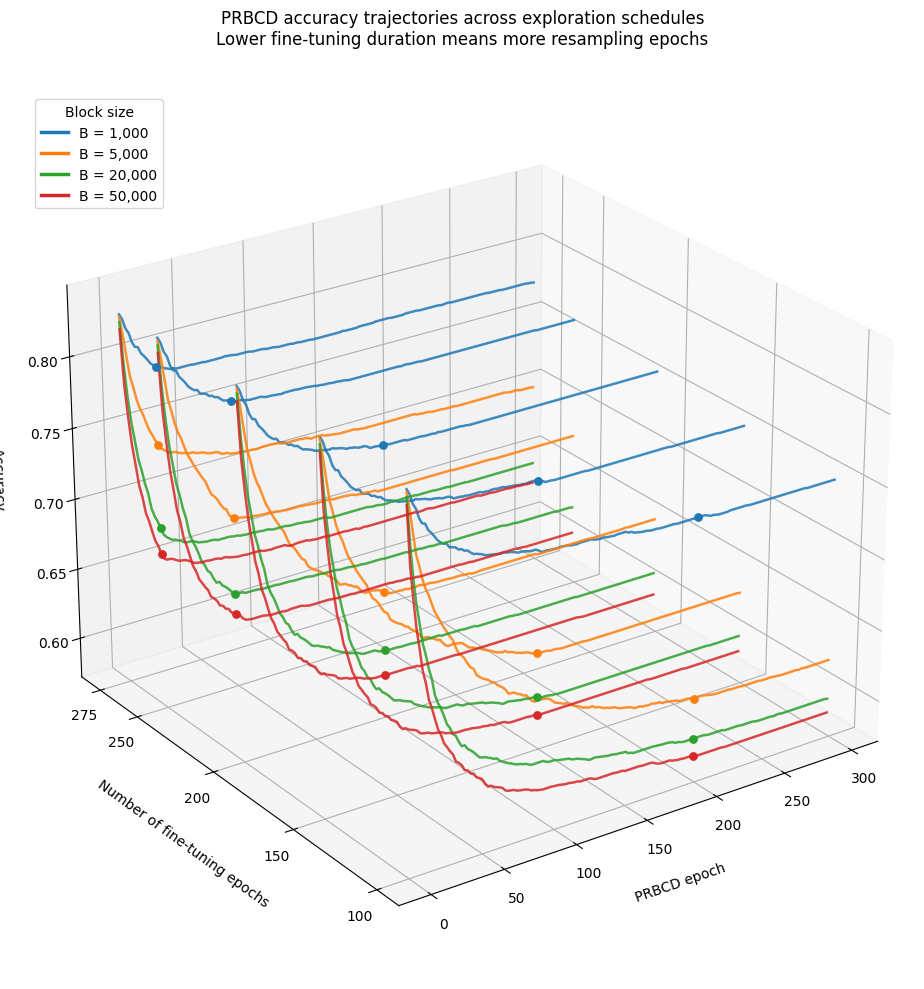

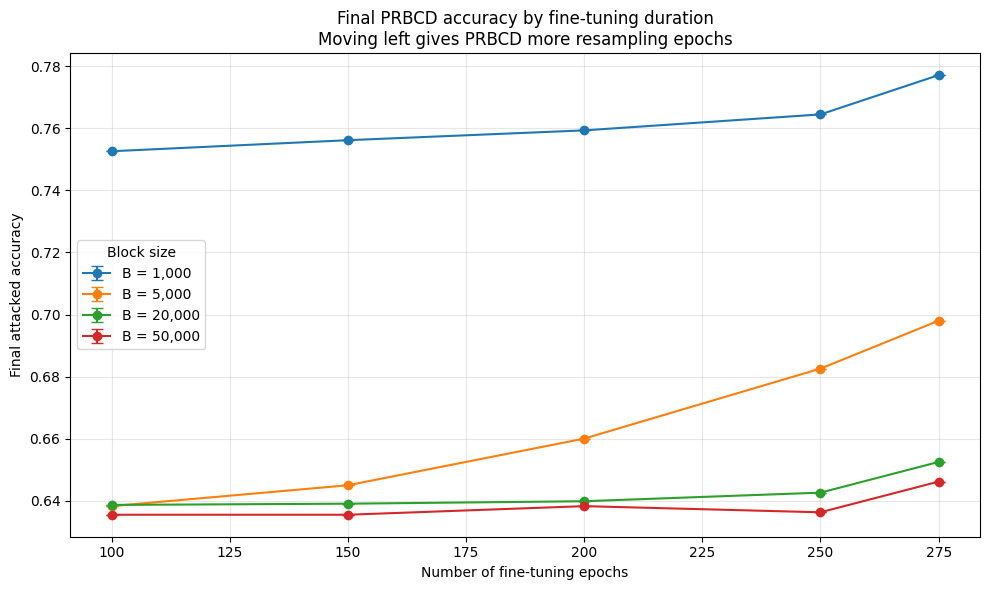

In [21]:
# ============================================================
# CELL 2: PLOTTING ONLY
#
# This cell does not run PRBCD.
# It reloads previously saved CSV files.
# ============================================================

from pathlib import Path
import json

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from IPython.display import display
from matplotlib.lines import Line2D
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401


# ============================================================
# Select result directory
# ============================================================

BASE_OUT_DIR = (
    Path("extendedPlotting")
    / "prbcd_blocksize_resampling_multiseed"
)

# Leave as None to use the most recent saved run.
#
# To use a specific run:
#
# RESULT_DIR = Path(
#     "extendedPlotting/"
#     "prbcd_blocksize_resampling_multiseed/"
#     "DATASET__YYYYMMDD_HHMMSS"
# )
RESULT_DIR = None


def _find_latest_result_directory(
    base_directory,
):
    pointer_file = (
        base_directory
        / "latest_run.txt"
    )

    if pointer_file.exists():
        candidate = Path(
            pointer_file.read_text(
                encoding="utf-8"
            ).strip()
        )

        if candidate.exists():
            return candidate

    candidates = [
        path
        for path in base_directory.iterdir()
        if path.is_dir()
    ]

    if not candidates:
        raise FileNotFoundError(
            "No saved experiment directories were found in "
            f"{base_directory.resolve()}."
        )

    return max(
        candidates,
        key=lambda path: path.stat().st_mtime,
    )


if RESULT_DIR is None:
    RESULT_DIR = _find_latest_result_directory(
        BASE_OUT_DIR
    )

RESULT_DIR = Path(
    RESULT_DIR
)

if not RESULT_DIR.exists():
    raise FileNotFoundError(
        f"Result directory does not exist: {RESULT_DIR}"
    )

print(
    "Loading results from:",
    RESULT_DIR.resolve(),
)


# ============================================================
# Load configuration and CSV files
# ============================================================

config_path = (
    RESULT_DIR
    / "experiment_config.json"
)

if config_path.exists():
    with open(
        config_path,
        "r",
        encoding="utf-8",
    ) as file:
        experiment_config = json.load(file)
else:
    experiment_config = {}

runs_df = pd.read_csv(
    RESULT_DIR
    / "prbcd_blocksize_resampling_runs.csv"
)

epoch_metrics_df = pd.read_csv(
    RESULT_DIR
    / "prbcd_blocksize_resampling_epoch_metrics.csv"
)

seed_level_df = pd.read_csv(
    RESULT_DIR
    / "prbcd_blocksize_resampling_seed_level.csv"
)

blocksize_resampling_summary_df = pd.read_csv(
    RESULT_DIR
    / "prbcd_blocksize_resampling_summary.csv"
)

seed_epoch_df = pd.read_csv(
    RESULT_DIR
    / "prbcd_blocksize_resampling_epoch_seed_level.csv"
)

epoch_summary_df = pd.read_csv(
    RESULT_DIR
    / "prbcd_blocksize_resampling_epoch_summary.csv"
)


# ============================================================
# Restore Boolean columns safely
# ============================================================

def _to_boolean_series(series):
    if series.dtype == bool:
        return series

    return (
        series
        .astype(str)
        .str.lower()
        .map({
            "true": True,
            "false": False,
            "1": True,
            "0": False,
        })
        .fillna(False)
        .astype(bool)
    )


for dataframe in [
    epoch_metrics_df,
    seed_epoch_df,
    epoch_summary_df,
]:
    if "is_clean_baseline" in dataframe.columns:
        dataframe[
            "is_clean_baseline"
        ] = _to_boolean_series(
            dataframe[
                "is_clean_baseline"
            ]
        )

    if "is_resampling_phase" in dataframe.columns:
        dataframe[
            "is_resampling_phase"
        ] = _to_boolean_series(
            dataframe[
                "is_resampling_phase"
            ]
        )


# ============================================================
# Resolve experiment values from loaded data
# ============================================================

BLOCK_SIZES = sorted(
    epoch_summary_df[
        "block_size"
    ].dropna().astype(int).unique()
)

FINE_TUNE_EPOCH_VALUES = sorted(
    epoch_summary_df[
        "fine_tune_epochs"
    ].dropna().astype(int).unique()
)

N_RESAMPLING_EPOCH_VALUES = sorted(
    epoch_summary_df[
        "n_resampling_epochs"
    ].dropna().astype(int).unique()
)

if "epochs" in epoch_metrics_df.columns:
    EPOCHS = int(
        epoch_metrics_df[
            "epochs"
        ].dropna().iloc[0]
    )
else:
    EPOCHS = int(
        max(
            FINE_TUNE_EPOCH_VALUES
        )
        + min(
            N_RESAMPLING_EPOCH_VALUES
        )
    )

print("Block sizes:", BLOCK_SIZES)
print(
    "Fine-tuning epochs:",
    FINE_TUNE_EPOCH_VALUES,
)
print(
    "Resampling epochs:",
    N_RESAMPLING_EPOCH_VALUES,
)
print("Total epochs:", EPOCHS)

display(
    blocksize_resampling_summary_df
    .sort_values(
        [
            "block_size",
            "fine_tune_epochs",
        ]
    )
)


# ============================================================
# Plot settings
# ============================================================

SAVE_PLOTS = True

# Plot every nth epoch to make the 3D figure lighter.
# Set to 1 to plot every epoch.
EPOCH_STRIDE = 2

# Camera angle.
ELEVATION = 25
AZIMUTH = -125


# ============================================================
# Prepare epoch trajectories
# ============================================================

attack_epoch_summary = (
    epoch_summary_df[
        ~epoch_summary_df[
            "is_clean_baseline"
        ]
    ]
    .copy()
)

attack_epoch_summary = (
    attack_epoch_summary[
        attack_epoch_summary[
            "prbcd_epoch"
        ] >= 0
    ]
)

attack_epoch_summary = (
    attack_epoch_summary[
        attack_epoch_summary[
            "prbcd_epoch"
        ] % EPOCH_STRIDE
        == 0
    ]
)


# ============================================================
# Combined 3D plot
#
# x-axis: PRBCD epoch
# y-axis: fine-tuning epochs
# z-axis: accuracy
#
# Block size is represented by color.
# ============================================================

fig = plt.figure(
    figsize=(15, 10)
)

ax = fig.add_subplot(
    111,
    projection="3d",
)

default_colors = plt.rcParams[
    "axes.prop_cycle"
].by_key()["color"]

block_color_map = {
    block_size: default_colors[
        index % len(default_colors)
    ]
    for index, block_size in enumerate(
        BLOCK_SIZES
    )
}

for block_size in BLOCK_SIZES:

    block_data = (
        attack_epoch_summary[
            attack_epoch_summary[
                "block_size"
            ] == block_size
        ]
    )

    for fine_tune_epochs in (
        FINE_TUNE_EPOCH_VALUES
    ):

        part = (
            block_data[
                block_data[
                    "fine_tune_epochs"
                ] == fine_tune_epochs
            ]
            .sort_values(
                "prbcd_epoch"
            )
        )

        if part.empty:
            continue

        x = part[
            "prbcd_epoch"
        ].to_numpy()

        y = np.full(
            shape=len(part),
            fill_value=fine_tune_epochs,
            dtype=float,
        )

        z = part[
            "accuracy_mean"
        ].to_numpy()

        ax.plot(
            x,
            y,
            z,
            linewidth=1.8,
            alpha=0.85,
            color=block_color_map[
                block_size
            ],
        )

        # Mark the end of the resampling phase.
        n_resampling_epochs = int(
            part[
                "n_resampling_epochs"
            ].iloc[0]
        )

        transition_epoch = (
            n_resampling_epochs - 1
        )

        full_part = (
            epoch_summary_df[
                (
                    epoch_summary_df[
                        "block_size"
                    ] == block_size
                )
                &
                (
                    epoch_summary_df[
                        "fine_tune_epochs"
                    ] == fine_tune_epochs
                )
                &
                (
                    epoch_summary_df[
                        "prbcd_epoch"
                    ] == transition_epoch
                )
            ]
        )

        if not full_part.empty:
            ax.scatter(
                [transition_epoch],
                [fine_tune_epochs],
                [
                    full_part[
                        "accuracy_mean"
                    ].iloc[0]
                ],
                s=28,
                color=block_color_map[
                    block_size
                ],
                depthshade=True,
            )


# ============================================================
# 3D plot formatting
# ============================================================

ax.set_xlabel(
    "PRBCD epoch",
    labelpad=12,
)

ax.set_ylabel(
    "Number of fine-tuning epochs",
    labelpad=14,
)

ax.set_zlabel(
    "Accuracy",
    labelpad=12,
)

ax.set_title(
    "PRBCD accuracy trajectories across exploration schedules\n"
    "Lower fine-tuning duration means more resampling epochs",
    pad=22,
)

ax.set_yticks(
    FINE_TUNE_EPOCH_VALUES
)

ax.view_init(
    elev=ELEVATION,
    azim=AZIMUTH,
)

legend_handles = [
    Line2D(
        [0],
        [0],
        linewidth=2.5,
        color=block_color_map[
            block_size
        ],
        label=f"B = {block_size:,}",
    )
    for block_size in BLOCK_SIZES
]

ax.legend(
    handles=legend_handles,
    title="Block size",
    loc="upper left",
    bbox_to_anchor=(0.02, 0.98),
)

plt.tight_layout()

if SAVE_PLOTS:
    plt.savefig(
        RESULT_DIR
        / "accuracy_epoch_finetune_3d.png",
        dpi=300,
        bbox_inches="tight",
    )

    plt.savefig(
        RESULT_DIR
        / "accuracy_epoch_finetune_3d.pdf",
        bbox_inches="tight",
    )

plt.show()


# ============================================================
# Optional supporting plot:
# final accuracy versus fine-tuning duration
#
# This is easier to interpret statistically than the 3D plot.
# ============================================================

fig, ax = plt.subplots(
    figsize=(10, 6)
)

for block_size in BLOCK_SIZES:

    part = (
        blocksize_resampling_summary_df[
            blocksize_resampling_summary_df[
                "block_size"
            ] == block_size
        ]
        .sort_values(
            "fine_tune_epochs"
        )
    )

    ax.errorbar(
        part[
            "fine_tune_epochs"
        ],
        part[
            "final_accuracy_mean"
        ],
        yerr=part[
            "final_accuracy_ci95"
        ].fillna(0.0),
        marker="o",
        capsize=4,
        label=f"B = {block_size:,}",
    )

ax.set_xlabel(
    "Number of fine-tuning epochs"
)

ax.set_ylabel(
    "Final attacked accuracy"
)

ax.set_title(
    "Final PRBCD accuracy by fine-tuning duration\n"
    "Moving left gives PRBCD more resampling epochs"
)

ax.legend(
    title="Block size"
)

ax.grid(
    alpha=0.3
)

plt.tight_layout()

if SAVE_PLOTS:
    plt.savefig(
        RESULT_DIR
        / "final_accuracy_vs_finetune_epochs.png",
        dpi=300,
        bbox_inches="tight",
    )

    plt.savefig(
        RESULT_DIR
        / "final_accuracy_vs_finetune_epochs.pdf",
        bbox_inches="tight",
    )

plt.show()

In [8]:
### §9.1  RQ1 — Verifying the Miss Probability

,eps_fraction,block_size,raw_draws_mean,raw_draws_std,unique_seen_mean,unique_seen_std,coverage_mean,coverage_std,empirical_repeat_mean,theoretical_p_never_seen,theoretical_p_seen,expected_unique_theory,mean_discard_fraction,mean_raw_draws_per_resampling,mean_actual_block_size,final_block_size_mean
0,0.50,1000,26000.230,0.456224,25915.940,9.422863,0.006567,0.000002,0.003242,0.993434,0.006566,2.591478e+04,0.499956,500.0046,999.9030,999.910
1,0.50,5000,130047.675,5.622047,127928.815,46.306286,0.032415,0.000012,0.016293,0.967586,0.032414,1.279284e+05,0.499951,2500.9535,4997.6176,4997.500
2,0.50,20000,520945.905,23.215962,488031.445,177.933919,0.123657,0.000045,0.063182,0.876343,0.123657,4.880284e+05,0.499988,10018.9181,19961.9205,19961.915
3,0.50,50000,1305970.105,55.217013,1111857.960,351.061103,0.281722,0.000089,0.148634,0.718272,0.281728,1.111879e+06,0.499995,25119.4021,49762.3133,49764.420
4,0.50,100000,2623910.850,114.351954,1916652.745,550.527641,0.485641,0.000139,0.269543,0.514353,0.485647,1.916677e+06,0.499997,50478.2170,99049.1454,99047.905
5,0.75,1000,38500.000,0.000000,38313.365,14.249456,0.009708,0.000004,0.004848,0.990292,0.009708,3.831283e+04,0.749972,750.0000,999.8861,999.885
6,0.75,5000,192518.085,3.212378,187894.875,65.135108,0.047609,0.000017,0.024014,0.952390,0.047610,1.878980e+05,0.749923,3750.3617,4997.0207,4997.215
7,0.75,20000,770575.675,12.946328,700024.545,230.622465,0.177372,0.000058,0.091556,0.822630,0.177370,7.000150e+05,0.749981,15011.5135,19952.5218,19953.090
8,0.75,50000,1928684.075,30.077444,1525678.660,436.516181,0.386576,0.000111,0.208954,0.613430,0.386570,1.525656e+06,0.749992,37573.6815,49704.1383,49702.385
9,0.75,100000,3864761.885,59.834628,2464355.015,565.699322,0.624418,0.000143,0.362353,0.375592,0.624408,2.464318e+06,0.749996,75295.2377,98819.0149,98817.445


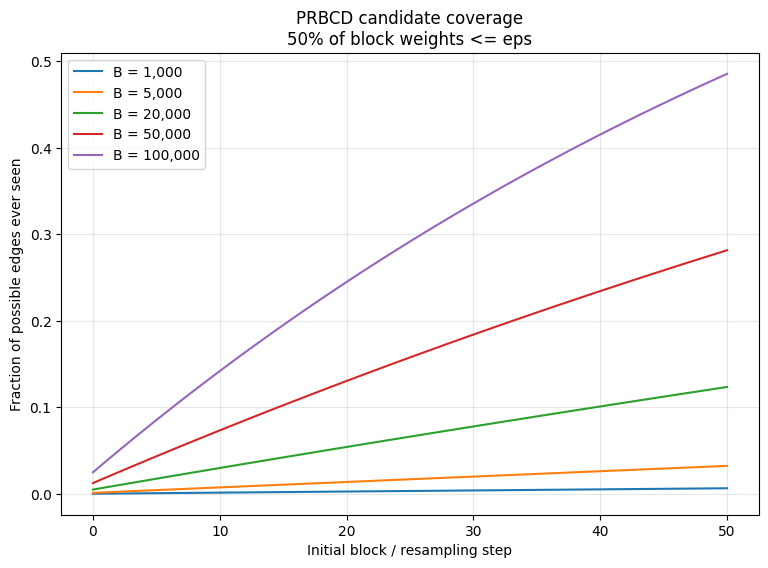

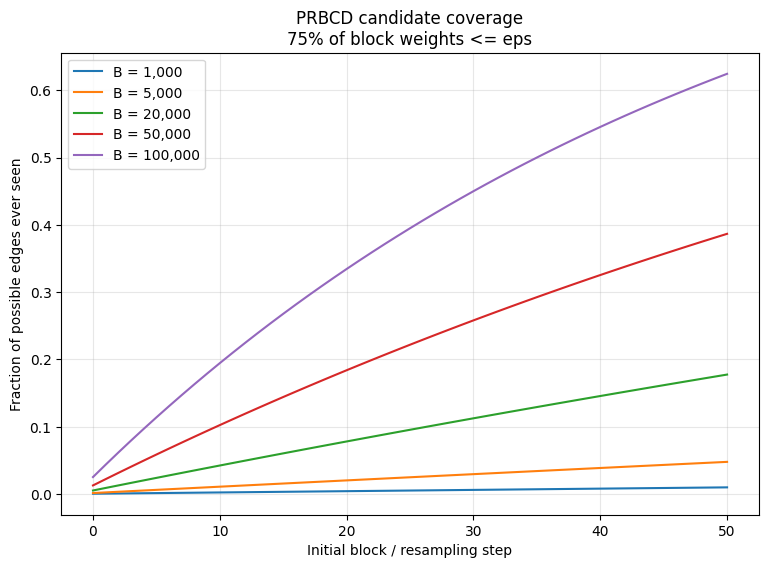

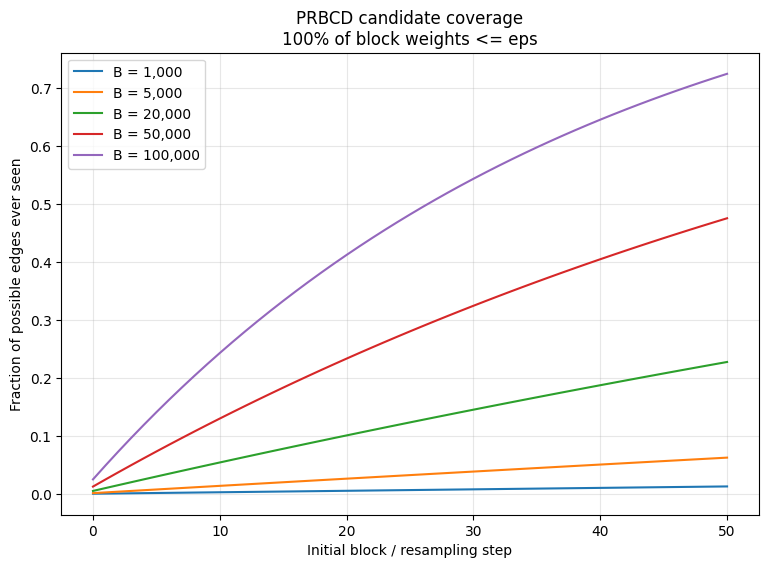

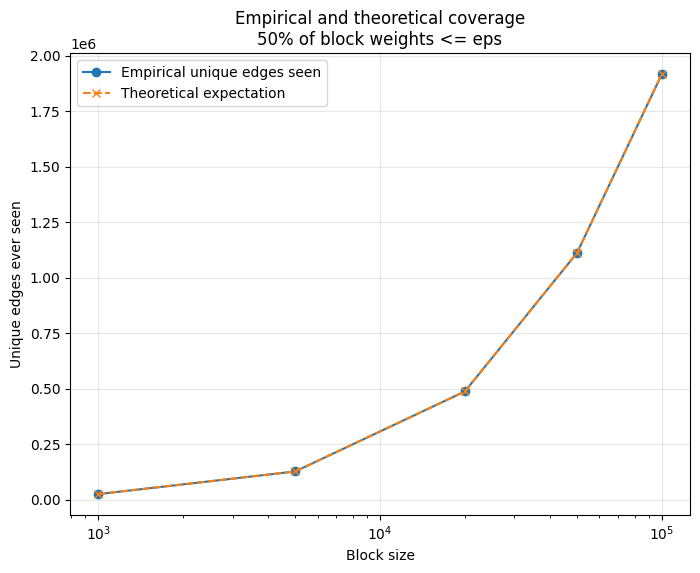

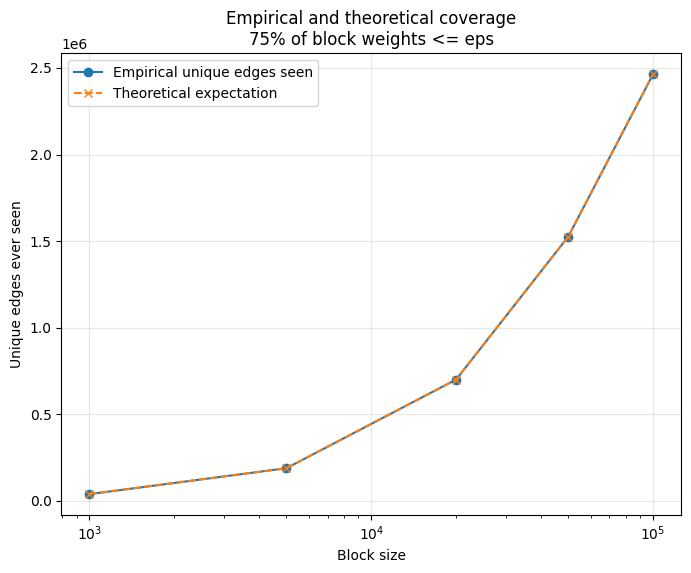

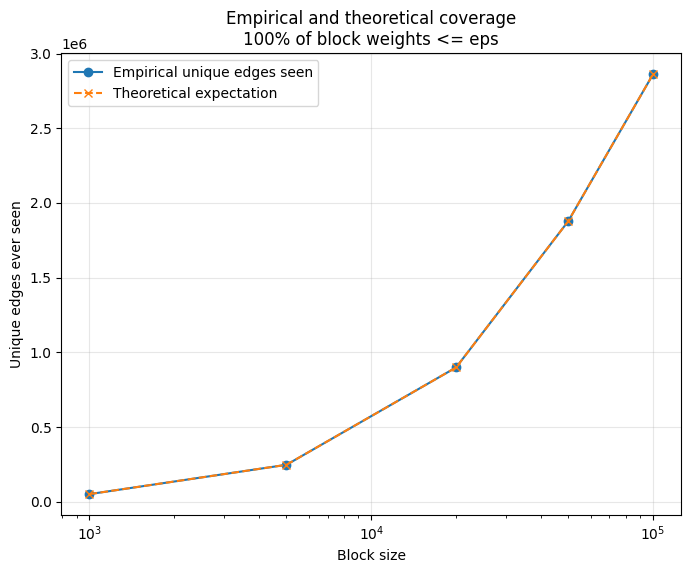

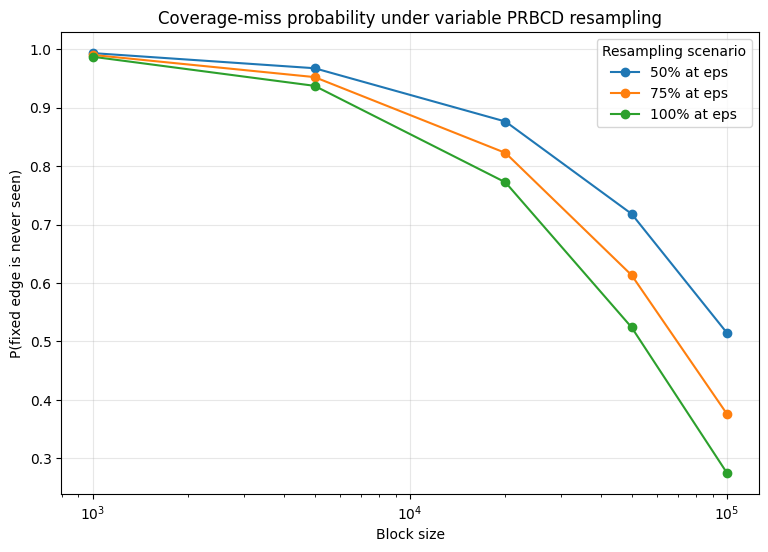

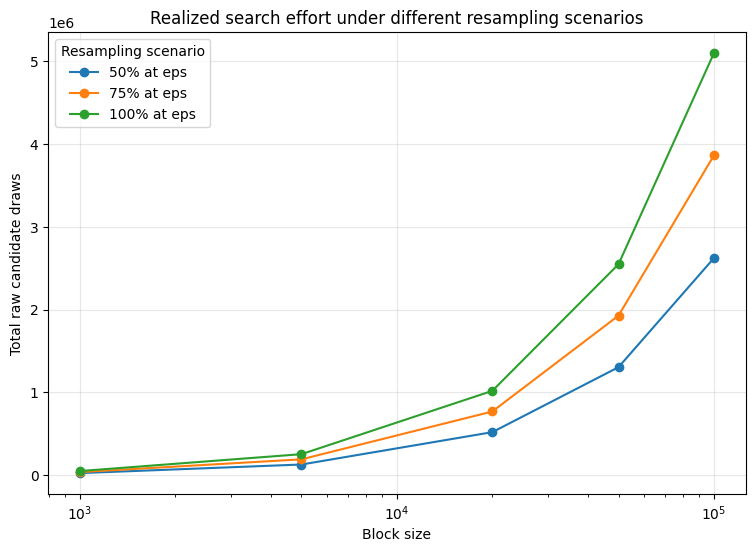

,eps_fraction,block_size,mean_discard_fraction,raw_draws_mean,unique_seen_mean,coverage_mean,theoretical_p_never_seen,final_block_size_mean
0,50%,1000,0.499956,26000.230,25915.940,0.006567,0.993434,999.910
1,50%,5000,0.499951,130047.675,127928.815,0.032415,0.967586,4997.500
2,50%,20000,0.499988,520945.905,488031.445,0.123657,0.876343,19961.915
3,50%,50000,0.499995,1305970.105,1111857.960,0.281722,0.718272,49764.420
4,50%,100000,0.499997,2623910.850,1916652.745,0.485641,0.514353,99047.905
5,75%,1000,0.749972,38500.000,38313.365,0.009708,0.990292,999.885
6,75%,5000,0.749923,192518.085,187894.875,0.047609,0.952390,4997.215
7,75%,20000,0.749981,770575.675,700024.545,0.177372,0.822630,19953.090
8,75%,50000,0.749992,1928684.075,1525678.660,0.386576,0.613430,49702.385
9,75%,100000,0.749996,3864761.885,2464355.015,0.624418,0.375592,98817.445


In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# Configuration
# ============================================================

# Number of possible undirected edge flips:
# M = n * (n - 1) // 2
N_NODES = adj_matrix.sizes()[0]
M = N_NODES * (N_NODES - 1) // 2

BLOCK_SIZES = [1_000, 5_000, 20_000, 50_000, 100_000]
N_RESAMPLING_STEPS = 50
N_RUNS = 200

# Fraction of the current block whose weights are <= eps.
#
# PRBCD discards:
# max(number of eps-weight edges, floor(current block size / 2))
EPS_FRACTION_SCENARIOS = [0.50, 0.75, 1.00]

BASE_SEED = 42


# ============================================================
# One sampler-only PRBCD coverage run
# ============================================================

def simulate_coverage_run(
    n_possible_edges: int,
    block_size: int,
    n_resampling_steps: int,
    eps_fraction: float,
    seed: int,
):
    """
    Simulates PRBCD candidate coverage without gradients or victim-model calls.

    The resampling rule follows the WeightOnly implementation:

        n_eps = number of weights <= eps
        n_discard = max(n_eps, floor(actual_block_size / 2))
        n_keep = actual_block_size - n_discard
        n_refill = nominal_block_size - n_keep

    Newly sampled IDs are merged with retained IDs using np.unique, matching
    the deduplication behavior of torch.unique.

    An edge is considered covered once it has appeared in a search block.

    Returns
    -------
    trace:
        One row for the initial block and every resampling step.

    summary:
        Final coverage statistics for the run.
    """
    if n_possible_edges <= 0:
        raise ValueError("n_possible_edges must be positive.")

    if block_size <= 0:
        raise ValueError("block_size must be positive.")

    if not 0.0 <= eps_fraction <= 1.0:
        raise ValueError("eps_fraction must be between 0 and 1.")

    rng = np.random.default_rng(seed)

    seen = set()

    # --------------------------------------------------------
    # Initial block
    # --------------------------------------------------------

    raw_initial = rng.integers(
        low=0,
        high=n_possible_edges,
        size=block_size,
        endpoint=False,
        dtype=np.int64,
    )

    current_block = np.unique(raw_initial)

    # Every unique initial draw enters the initial search space.
    seen.update(current_block.tolist())

    raw_draws_total = raw_initial.size

    p_never_seen = np.exp(
        raw_draws_total
        * np.log1p(-1.0 / n_possible_edges)
    )

    records = [{
        "stage": 0,
        "eps_fraction": eps_fraction,
        "block_size_nominal": block_size,
        "block_size_before": 0,
        "n_eps": np.nan,
        "n_discard": np.nan,
        "discard_fraction": np.nan,
        "n_keep": np.nan,
        "raw_draws_stage": raw_initial.size,
        "raw_draws_total": raw_draws_total,
        "actual_block_size": current_block.size,
        "new_unique_stage": current_block.size,
        "unique_seen": len(seen),
        "coverage_fraction": len(seen) / n_possible_edges,
        "repeat_fraction": 1.0 - len(seen) / raw_draws_total,
        "p_never_seen_theory": p_never_seen,
        "p_seen_theory": 1.0 - p_never_seen,
    }]

    # --------------------------------------------------------
    # Resampling steps
    # --------------------------------------------------------

    for stage in range(1, n_resampling_steps + 1):

        block_size_before = current_block.size

        if block_size_before == 0:
            n_eps = 0
            n_discard = 0
            n_keep = 0
            kept = np.empty(0, dtype=np.int64)

        else:
            # Simulated count of edges whose weight is <= eps.
            n_eps = int(
                np.floor(eps_fraction * block_size_before)
            )

            # WeightOnly rule from PRBCD:
            # discard at least half, potentially all eps edges.
            n_discard = max(
                n_eps,
                block_size_before // 2,
            )

            n_discard = min(
                n_discard,
                block_size_before,
            )

            n_keep = block_size_before - n_discard

            # Coverage is independent of which particular edges survive.
            # Random retention avoids adding a ranking assumption.
            if n_keep > 0:
                kept = rng.choice(
                    current_block,
                    size=n_keep,
                    replace=False,
                )
            else:
                kept = np.empty(0, dtype=np.int64)

        # Match PRBCD:
        # request enough raw candidates to refill the nominal block.
        n_refill = block_size - n_keep

        raw_new = rng.integers(
            low=0,
            high=n_possible_edges,
            size=n_refill,
            endpoint=False,
            dtype=np.int64,
        )

        raw_draws_total += raw_new.size

        unique_before = len(seen)

        # A newly drawn edge counts as covered if it was not seen before.
        seen.update(raw_new.tolist())

        new_unique = len(seen) - unique_before

        # Retained edges and new draws are deduplicated.
        # The resulting block may therefore be slightly smaller than the
        # nominal block size, matching the behavior of torch.unique.
        current_block = np.unique(
            np.concatenate([kept, raw_new])
        )

        p_never_seen = np.exp(
            raw_draws_total
            * np.log1p(-1.0 / n_possible_edges)
        )

        discard_fraction = (
            n_discard / block_size_before
            if block_size_before > 0
            else np.nan
        )

        records.append({
            "stage": stage,
            "eps_fraction": eps_fraction,
            "block_size_nominal": block_size,
            "block_size_before": block_size_before,
            "n_eps": n_eps,
            "n_discard": n_discard,
            "discard_fraction": discard_fraction,
            "n_keep": n_keep,
            "raw_draws_stage": raw_new.size,
            "raw_draws_total": raw_draws_total,
            "actual_block_size": current_block.size,
            "new_unique_stage": new_unique,
            "unique_seen": len(seen),
            "coverage_fraction": len(seen) / n_possible_edges,
            "repeat_fraction": 1.0 - len(seen) / raw_draws_total,
            "p_never_seen_theory": p_never_seen,
            "p_seen_theory": 1.0 - p_never_seen,
        })

    trace = pd.DataFrame(records)

    final_p_never_seen = np.exp(
        raw_draws_total
        * np.log1p(-1.0 / n_possible_edges)
    )

    expected_unique_seen = (
        n_possible_edges
        * (1.0 - final_p_never_seen)
    )

    resampling_rows = trace["stage"] > 0

    summary = {
        "eps_fraction": eps_fraction,
        "block_size": block_size,
        "seed": seed,
        "raw_draws_total": raw_draws_total,
        "unique_seen": len(seen),
        "coverage_fraction": len(seen) / n_possible_edges,
        "empirical_repeat_fraction": (
            1.0 - len(seen) / raw_draws_total
        ),
        "p_edge_never_seen_theory": final_p_never_seen,
        "p_edge_seen_theory": 1.0 - final_p_never_seen,
        "expected_unique_seen_theory": expected_unique_seen,
        "mean_discard_fraction": trace.loc[
            resampling_rows,
            "discard_fraction",
        ].mean(),
        "mean_raw_draws_per_resampling": trace.loc[
            resampling_rows,
            "raw_draws_stage",
        ].mean(),
        "mean_actual_block_size": trace.loc[
            resampling_rows,
            "actual_block_size",
        ].mean(),
        "actual_final_block_size": current_block.size,
    }

    return trace, summary


# ============================================================
# Run all scenarios, block sizes, and seeds
# ============================================================

all_traces = []
all_summaries = []

for scenario_index, eps_fraction in enumerate(
    EPS_FRACTION_SCENARIOS
):
    for block_size_index, block_size in enumerate(BLOCK_SIZES):
        for run in range(N_RUNS):

            seed = (
                BASE_SEED
                + scenario_index * 1_000_000
                + block_size_index * 10_000
                + run
            )

            trace, summary = simulate_coverage_run(
                n_possible_edges=M,
                block_size=block_size,
                n_resampling_steps=N_RESAMPLING_STEPS,
                eps_fraction=eps_fraction,
                seed=seed,
            )

            trace["run"] = run
            trace["block_size"] = block_size

            all_traces.append(trace)
            all_summaries.append(summary)

traces = pd.concat(
    all_traces,
    ignore_index=True,
)

summaries = pd.DataFrame(all_summaries)


# ============================================================
# Aggregated results
# ============================================================

coverage_summary = (
    summaries
    .groupby(["eps_fraction", "block_size"])
    .agg(
        raw_draws_mean=(
            "raw_draws_total",
            "mean",
        ),
        raw_draws_std=(
            "raw_draws_total",
            "std",
        ),
        unique_seen_mean=(
            "unique_seen",
            "mean",
        ),
        unique_seen_std=(
            "unique_seen",
            "std",
        ),
        coverage_mean=(
            "coverage_fraction",
            "mean",
        ),
        coverage_std=(
            "coverage_fraction",
            "std",
        ),
        empirical_repeat_mean=(
            "empirical_repeat_fraction",
            "mean",
        ),
        theoretical_p_never_seen=(
            "p_edge_never_seen_theory",
            "mean",
        ),
        theoretical_p_seen=(
            "p_edge_seen_theory",
            "mean",
        ),
        expected_unique_theory=(
            "expected_unique_seen_theory",
            "mean",
        ),
        mean_discard_fraction=(
            "mean_discard_fraction",
            "mean",
        ),
        mean_raw_draws_per_resampling=(
            "mean_raw_draws_per_resampling",
            "mean",
        ),
        mean_actual_block_size=(
            "mean_actual_block_size",
            "mean",
        ),
        final_block_size_mean=(
            "actual_final_block_size",
            "mean",
        ),
    )
    .reset_index()
)

display(coverage_summary)


# ============================================================
# Plot 1:
# Coverage over resampling steps, separately for each scenario
# ============================================================

coverage_by_stage = (
    traces
    .groupby(
        ["eps_fraction", "block_size", "stage"]
    )["coverage_fraction"]
    .agg(["mean", "std"])
    .reset_index()
)

for eps_fraction in EPS_FRACTION_SCENARIOS:

    plt.figure(figsize=(9, 6))

    scenario_data = coverage_by_stage[
        coverage_by_stage["eps_fraction"] == eps_fraction
    ]

    for block_size in BLOCK_SIZES:

        part = scenario_data[
            scenario_data["block_size"] == block_size
        ]

        plt.plot(
            part["stage"],
            part["mean"],
            label=f"B = {block_size:,}",
        )

        plt.fill_between(
            part["stage"],
            part["mean"] - part["std"],
            part["mean"] + part["std"],
            alpha=0.15,
        )

    plt.xlabel("Initial block / resampling step")
    plt.ylabel("Fraction of possible edges ever seen")
    plt.title(
        "PRBCD candidate coverage\n"
        f"{eps_fraction:.0%} of block weights <= eps"
    )
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()


# ============================================================
# Plot 2:
# Empirical versus theoretical unique coverage
# ============================================================

for eps_fraction in EPS_FRACTION_SCENARIOS:

    part = coverage_summary[
        coverage_summary["eps_fraction"] == eps_fraction
    ]

    plt.figure(figsize=(8, 6))

    plt.plot(
        part["block_size"],
        part["unique_seen_mean"],
        marker="o",
        label="Empirical unique edges seen",
    )

    plt.plot(
        part["block_size"],
        part["expected_unique_theory"],
        marker="x",
        linestyle="--",
        label="Theoretical expectation",
    )

    plt.xscale("log")
    plt.xlabel("Block size")
    plt.ylabel("Unique edges ever seen")
    plt.title(
        "Empirical and theoretical coverage\n"
        f"{eps_fraction:.0%} of block weights <= eps"
    )
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()


# ============================================================
# Plot 3:
# Probability that one fixed edge is never seen
# ============================================================

plt.figure(figsize=(9, 6))

for eps_fraction in EPS_FRACTION_SCENARIOS:

    part = coverage_summary[
        coverage_summary["eps_fraction"] == eps_fraction
    ]

    plt.plot(
        part["block_size"],
        part["theoretical_p_never_seen"],
        marker="o",
        label=f"{eps_fraction:.0%} at eps",
    )

plt.xscale("log")
plt.xlabel("Block size")
plt.ylabel("P(fixed edge is never seen)")
plt.title(
    "Coverage-miss probability under variable "
    "PRBCD resampling"
)
plt.legend(title="Resampling scenario")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Plot 4:
# Total raw candidate draws
# ============================================================

plt.figure(figsize=(9, 6))

for eps_fraction in EPS_FRACTION_SCENARIOS:

    part = coverage_summary[
        coverage_summary["eps_fraction"] == eps_fraction
    ]

    plt.plot(
        part["block_size"],
        part["raw_draws_mean"],
        marker="o",
        label=f"{eps_fraction:.0%} at eps",
    )

plt.xscale("log")
plt.xlabel("Block size")
plt.ylabel("Total raw candidate draws")
plt.title(
    "Realized search effort under different "
    "resampling scenarios"
)
plt.legend(title="Resampling scenario")
plt.grid(alpha=0.3)
plt.show()


# ============================================================
# Compact interpretation table
# ============================================================

result_table = coverage_summary[[
    "eps_fraction",
    "block_size",
    "mean_discard_fraction",
    "raw_draws_mean",
    "unique_seen_mean",
    "coverage_mean",
    "theoretical_p_never_seen",
    "final_block_size_mean",
]].copy()

result_table["eps_fraction"] = (
    100 * result_table["eps_fraction"]
).round(0).astype(int).astype(str) + "%"

display(result_table)